In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import os
import sys
sys.path.append("./..")

In [6]:
!nvidia-smi

Wed May 17 17:14:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.102.04   Driver Version: 450.102.04   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:06:00.0 Off |                    0 |
| N/A   36C    P0    59W / 300W |  13159MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-SXM2...  On   | 00000000:07:00.0 Off |                    0 |
| N/A   

In [7]:
import json

import torch
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision.models.resnet import resnet50


from scipy.stats import norm, binom_test
import numpy as np
from math import ceil, sqrt
from statsmodels.stats.proportion import proportion_confint
from scipy import stats

import kornia
from tqdm import tqdm, tqdm_notebook


from architectures import get_architecture
from datasets import get_dataset, DATASETS, get_num_classes, get_normalize_layer
from src.numerical_methods import *

In [8]:
device = torch.device('cuda:7')

In [9]:
rng = jax.random.PRNGKey(33)
rng, key = jax.random.split(rng)


from src.numerical_methods import DEFAULT_SIGMA
DEFAULT_SIGMA

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


1.0

In [10]:
ns = 10_000
normal_samples = jax.random.normal(key, [100_000])

def norm_to_exp(c, lam):
    print(c.shape)
    idx = np.random.randint(0, len(normal_samples), (c.shape[0], 4))
    q = normal_samples[idx]
#     return jax.numpy.abs(c[0] * q[0] - q[1] * q[2]) / lam
    
    return jax.numpy.abs(q[:, 0] * q[:, 1] - q[:, 2] * q[:, 3]) / lam
    
    
def norm_to_ray(c, sigma):
    idx = np.random.randint(0, len(normal_samples), (c.shape[0], 2))
    c01 = normal_samples[idx] * sigma 
#     c = c * sigma
    return jnp.sqrt(c01[:, 0] ** 2 + c01[:, 1] ** 2)


def norm_to_exp_1d(c, lam):

    idx = np.random.randint(0, len(normal_samples), 4)
    q = normal_samples[idx]
    
    return jax.numpy.abs(c * q[1] - q[2] * q[3]) / lam
    
    
def norm_to_ray_1d(c, sigma):
    idx = np.random.randint(0, len(normal_samples), 2)
    c01 = normal_samples[idx] * sigma 
    c = c * sigma
    return jnp.sqrt(c ** 2 + c01[1] ** 2)

In [11]:
sigma_b = 0.4
sigma_c = 0.4
sigma_tr = 30
sigma_gamma = 1.1 
sigma_blur = 30

def gamma(x, b, c, tr_type:str):

    if tr_type == 'brightness':
        c = c / DEFAULT_SIGMA * sigma_b
        return b+c
    
    if tr_type == 'cb':
        # contrast then brightness
        c0 = c[0] / DEFAULT_SIGMA * sigma_c
        c1 = c[1] / DEFAULT_SIGMA *sigma_b
        
        b1 = norm_to_lognorm(c0)*b[0]
        
        b2 = b[1]*norm_to_lognorm(c0) + c1
        return jnp.array([b1,b2])
    
    if tr_type == 'gc': ##gamma-contrast
        c0 = c[0] / DEFAULT_SIGMA
        c1 = c[1] / DEFAULT_SIGMA * sigma_c
       
        c0 = norm_to_ray_1d(c0, sigma_gamma)
    
        b1 = b[0]*c0
        b2 = b[1]**c0 * norm_to_lognorm(c1)
        return jnp.array([b1, b2])
    
    
    if tr_type == 'bt': 
        
        c0 = c[0] / DEFAULT_SIGMA * sigma_b
        c1 = c[1] / DEFAULT_SIGMA * sigma_tr
        c2 = c[2] / DEFAULT_SIGMA * sigma_tr

        b1 = b[0] + c0
        b2 = b[1] + c1 
        b3 = b[2] + c2
        return jnp.array([b1, b2, b3])
    
    

    if tr_type == 'tbbc': #translation -  -Blur- Brightness - Contrast
        # Norm(0, 1) -> Laplace(1/sigma_blur) -> Exp(sigma_blur)
        c0 = c[0] / DEFAULT_SIGMA * sigma_tr
        c1 = c[1] / DEFAULT_SIGMA * sigma_tr
        c2 = c[2] / DEFAULT_SIGMA #* sigma_blur
        c3 = c[3] / DEFAULT_SIGMA * sigma_b
        c4 = c[5] / DEFAULT_SIGMA * sigma_c
        
        x2 = jax.random.normal(key)
        x3 = jax.random.normal(key)
        x4 = jax.random.normal(key)
        c2 = norm_to_exp_1d(c2, sigma_blur)
        b0 = b[0] + c0
        b1 = b[1] + c1
#         b2 = b[2] + norm_to_exp(c2) * sigma_blur
        b2 = b[2] + c2
        b3 = b[3] + c3 / b[4]
        b4 = norm_to_lognorm(c4)*b[4]
        
        return jnp.array([b0,b1,b2,b3,b4])
    
    if tr_type == 'tbbc_ray': #translation -  -Blur- Brightness - Contrast
        
        c0 = c[0] / DEFAULT_SIGMA * sigma_tr
        c1 = c[1] / DEFAULT_SIGMA * sigma_tr
        c2 = c[2] / DEFAULT_SIGMA
        c3 = c[3] / DEFAULT_SIGMA * sigma_b
        c4 = c[5] / DEFAULT_SIGMA * sigma_c
        

        
        c2 = norm_to_ray_1d(c2, sigma_blur)
        
        b0 = b[0] + c0
        b1 = b[1] + c1
        b2 = b[2] + c2
        b3 = b[3] + c3 / b[4]
        b4 = norm_to_lognorm(c4)*b[4]
        
        return jnp.array([b0,b1,b2,b3,b4])
    
    if tr_type == 'tr': #translation -  -Blur- Brightness - Contrast
        
        c0 = c[0]*sigma_tr
        c1 = c[1]*sigma_tr
        
        
        b0 = b[0] + c0
        b1 = b[1] + c1
        
        return jnp.array([b0,b1])
    
    if tr_type == 'ct': 
        
        c0 = c[0] / DEFAULT_SIGMA *sigma_c
        c1 = c[1] / DEFAULT_SIGMA *sigma_tr
        c2 = c[2] / DEFAULT_SIGMA *sigma_tr
        
        
        b0 = b[0]*norm_to_lognorm(c0)
        b1 = b[1] + c1
        b2 = b[2] + c2

        return jnp.array([b0,b1,b2])
    if tr_type == "gamma":
        
        c0 = c[0] / DEFAULT_SIGMA
       
        c0 = norm_to_ray_1d(c0, sigma_gamma)
    
        b0 = b[0] * c0
        return jnp.array([b0])
    
    
    if tr_type == 'blur': 
        # Norm(0, 1) -> Laplace(1/sigma_blur) -> Exp(sigma_blur)
#         idx = np.random.randint(0, len(normal_samples), 2)
#         c01, c02 = normal_samples[idx]
#         c0 = c[0] * sigma_blur 
#         c01 = c01 * sigma_blur
#         c02 = c02 * sigma_blur
#         b0 = b[0] + jnp.sqrt(c01 ** 2 + c02 ** 2)
        
        b0 = b[0] + norm_to_exp_1d(c[0], sigma_blur)

        return jnp.array([b0])
    
    if tr_type == 'blur_ray': 
        c0 = c[0] / DEFAULT_SIGMA
        c0 = norm_to_ray_1d(c0, sigma_blur)
        b0 = b[0] + c0
#         b0 = b[0] + norm_to_ray(c[0] / DEFAULT_SIGMA) * sigma_blur

        return jnp.array([b0])

In [12]:
def imshow(inp, title=None):
    inp = inp.cpu().detach().numpy().transpose((1, 2, 0))
    #inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) 

In [13]:
test_dataset = get_dataset('imagenet', 'test')
pin_memory = False#('imagenet' == "imagenet")
bs = 64


/opt/conda/lib/python3.8/site-packages/torchvision/transforms/transforms.py:312: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  warnings.warn("The use of the transforms.Scale transform is deprecated, " +


In [14]:
class CustomAudioDataset(Dataset):

    def __init__(self, images, labels):
        self.images = torch.tensor(images)
        self.labels = torch.tensor(labels)
        
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = self.images[idx]
        label =self.labels[idx]
        return image, label


def make_our_dataset(loader_bs1, maximages):
    images = []
    labels = []
    k = 0
    freq = np.ceil(len(loader_bs1.dataset)/maximages)
    for i, batch in enumerate(tqdm(loader_bs1)):
        if k%freq==0:
            img, lab = batch
            images.append(img[0].numpy())
            labels.append(lab.numpy())
            
            k+=1
        else:
            k+=1
    images = np.array(images)
    labels = np.array(labels)
    dataset = CustomAudioDataset(images, labels)
    return dataset

testloader1 = DataLoader(test_dataset, shuffle=False, batch_size=1, num_workers=6, pin_memory=False)


ourdataset100 = make_our_dataset(testloader1, 100)

dataloader100  = DataLoader(ourdataset100, shuffle=False, batch_size=1,
                         num_workers=6, pin_memory=False)

# ourdataset500 = make_our_dataset(testloader1, 500)

# dataloader500  = DataLoader(ourdataset500, shuffle=False, batch_size=1,
#                          num_workers=6, pin_memory=False)

100%|████████████████████████████████████| 50000/50000 [01:30<00:00, 555.29it/s]


In [35]:
num_classes = 1000
def certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive=False):

    base_classifier.eval()
    x=x.to(device)
    nA, n = 0, 0
    g_phi_list = np.zeros((1,num_classes))
    
    _, counts_selection = sample_noise(base_classifier,x, Phi, n0)
    cAHat = counts_selection.argmax().item()
            
            
    while n < maxn:

        now_batch = min(batch_size, maxn - n)
        # draw more samples of f(x + epsilon)
        g_phi, counts_estimation = sample_noise(base_classifier, x, Phi, now_batch)
        
        
        ### TSS things Clopper-Pearson ###
        nA += counts_estimation[cAHat].item()
        n += now_batch
        pABar = lower_confidence_bound(nA, n, alpha)
        ####

        
        g_phi_list = np.concatenate((g_phi_list, g_phi)) 

        g = torch.tensor(g_phi_list[1:])
        g = torch.softmax(g, -1)
        I = torch.mean(g, axis=0)
        V = torch.var(g, axis = 0)/len(g)
        ci = confint(I,V,n=n,alpha=alpha)

        right, idx = torch.sort(ci[1], descending = True)
        right = right#.cpu()
        left = torch.tensor([ci[0][idx[0]]])
        left = left#.cpu()

        if (left[0]>right[1] and adaptive==True):
            break
        else:
            pass

    G_CORRECT_PREDICTION_VIA_I = int(I.argmax().item() == label.item())

    G_CORRECT_PREDICTION_VIA_CI = int(ci[1].argmax().item() == label.item())


    return left[0], right[1], G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat

def sample_noise(base_classifier, x, Phi, num):
    f_x_eps_list = np.zeros((1,num_classes))
    with torch.no_grad():
        counts = np.zeros(num_classes, dtype=int)
        batch = x.repeat((num, 1, 1, 1))
        batch_noised = Phi(batch).to(device)

        f_x_eps = base_classifier(batch_noised)
        f_x_eps_list = np.concatenate((f_x_eps_list, f_x_eps.cpu().numpy())) 

        predictions = f_x_eps.argmax(1)
        counts +=count_arr(predictions.cpu().numpy(), num_classes)
        
        return f_x_eps_list[1:], counts #counts
    
def count_arr(arr, length) -> np.ndarray:  #might be accelerated probably
    counts = np.zeros(length, dtype=int)
    for idx in arr:
        counts[idx] += 1
    return counts

def lower_confidence_bound(NA: int, N: int, alpha: float) -> float:
    """ Returns a (1 - alpha) lower confidence bound on a bernoulli proportion.
    This function uses the Clopper-Pearson method.
    :param NA: the number of "successes"
    :param N: the number of total draws
    :param alpha: the confidence level
    :return: a lower bound on the binomial proportion which holds true w.p at least (1 - alpha) over the samples
    """
#     print(NA, N, alpha, proportion_confint(NA, N, alpha=2 * alpha, method="beta")[0])
    return proportion_confint(NA, N, alpha=2 * alpha, method="beta")[0]

def confint(I, V, n, alpha, test='Normal'):
    if test == 'T':
        df = n-1
        t = stats.t.ppf(1 - alpha/2, df)
    if test == 'Normal':
        t = stats.norm.ppf(1 - alpha/2)
    
    lower = I - (t * torch.sqrt(V))
    upper = I + (t * torch.sqrt(V))
    #print((upper-lower)*1e15)
    a = torch.stack((lower, upper), dim=0)
    
    return a

In [15]:
def CertAccChecker(betas, hlist, xi, hatg_int):
    for h in hlist:
        flag = True
        for i, beta in enumerate(tqdm(betas)):
            if safe_beta(xi, h, hatg_int, [*beta]).item():
                pass
            else:
                flag = False
                break
        
        if flag==True:
            return h
    return None
    
    
    
def CertAccCheckerTSS(betas, hlist, xi, safe_beta_tss):
    for h in hlist:
        flag = True
        for i, beta in enumerate(tqdm(betas)):
            if safe_beta_tss(xi, h, [*beta]).item():
                pass
            else:
                flag = False
                break
        
        if flag==True:
            return h
    return None

In [16]:
def pa_isOk_collector(model, loader, Phi, device, n0=100, maxn=2000, alpha=1e-3, batch_size=128, adaptive=False):
    model.eval()
    model.to(device)
    pas = []
    isOk = []
    
    paTSS =[]
    isOkTSS = []
    with torch.no_grad():
        for k, (image, label) in enumerate(tqdm(loader)):
            h, pb, _, correct_or_not, pABar, cAHat = certify(model,  image[0], label, Phi, n0,   maxn, alpha, batch_size, adaptive)
            pas.append(h.item())
            isOk.append(correct_or_not)
            paTSS.append(pABar)
            isOkTSS.append((label==cAHat).int().squeeze())
            
    pas = np.array(pas)
    isOk = np.array(isOk)
    paTSS = np.array(paTSS)
    isOkTSS = np.array(isOkTSS)

    
    return pas, isOk, paTSS, isOkTSS
        
    
def Accuracy(model, loader, device):
    model.eval()
    isCor = []
    with torch.no_grad():

        model = model.to(device)
        for k, (images, labels) in enumerate(tqdm(loader)):

                images = images.to(device)
                labels = labels.to(device)
                
                y_pred = model(images) 
                y_pred = y_pred.argmax(dim=-1)
                isCor.append((y_pred == labels).cpu().numpy())
    isCor = np.array(isCor)
    print(isCor.mean())
    return isCor

In [17]:
dirname = './..results/'
if not os.path.exists(dirname):
    os.makedirs(dirname)

In [18]:
def ERA_Only_ND(model, loader, attack, device, PSN=None):
    model.eval()
    model.to(device)
    with torch.no_grad():
        tensor = torch.ones((len(loader)))
        model = model.to(device)
        for k, (images, labels) in enumerate(tqdm(loader)):

                images = images.to(device)
                labels = labels.to(device)
                
                for b in PSN:
#                     print(b)
                    b = torch.tensor(np.array(b))
#                     print(b)
                    attacked = attack(images, b=b)
                    attacked = torch.tensor(attacked)
#                     attacked_batch = torch.repeat_interleave(attacked, nsamples, dim=0)
                    labels = labels.to(device)
                    y_pred = torch.nn.Softmax(dim=-1)(model(attacked))#.argmax(dim=-1)

                    y_pred = torch.mean(y_pred, dim = 0)
                    y_pred = y_pred.argmax(dim=-1)
                    tensor[k]=tensor[k]*int(y_pred == labels)

                    if not int(y_pred == labels):
                        break
    print(tensor.mean())
    return tensor.mean()

In [58]:
def ERA_Only_For_Smoothed_ND(model, loader, attack, Phi, device, PSN=None, n0=100, maxn=2000, alpha=1e-3, batch_size=256, adaptive=False):
    model.eval()
    model.to(device)
    with torch.no_grad():
        tensor = torch.ones((len(loader)))
        model = model.to(device)
        for k, (images, labels) in enumerate(tqdm(loader)):

                images = images.to(device)
                labels = labels.to(device)
                
                for b in PSN:
                    b = torch.tensor(np.array(b))
                    attacked = attack(images, b=b)
                    attacked = torch.tensor(attacked)
#                     print(attacked.shape)
                    left, right, G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat = certify(base_classifier = model,  x = attacked, label=labels, Phi=Phi, n0=n0,  
                         maxn=maxn, alpha=alpha, batch_size=batch_size, adaptive=adaptive)
                    print()
#                     y_pred = torch.nn.Softmax(dim=-1)(model(attacked))#.argmax(dim=-1)
#                     y_pred = torch.mean(y_pred, dim = 0)
#                     y_pred = y_pred.argmax(dim=-1)

#                     y_pred_tss = cAHat
#                     print(G_CORRECT_PREDICTION_VIA_CI)

                    tensor[k]=tensor[k]* int(cAHat) #int(G_CORRECT_PREDICTION_VIA_CI)   #int(y_pred == labels) #int(y_pred_tss == labels)

                    if not int(G_CORRECT_PREDICTION_VIA_CI):  #int(y_pred == labels)
                        break
    print(tensor.mean())
    return tensor.mean()

In [59]:
n0 = 200
maxn = 2000
adaptive=False # whether to stop certification procedure earlier
alpha = 1e-3 # confidence

# CB for example

In [60]:
sigma_b = 0.6
sigma_c = 0.6

In [61]:
def phi_bc_torch_batch_and_noise(x):
    q = (torch.randn(len(x))*sigma_c).to(device)
    q1 = (torch.randn(len(x)) * sigma_b).to(device)
    
    q = torch.exp(q[:,None,None,None])
    q1 = q1[:, None, None, None]
    return (x * q + q1)

def attack_bc_torch(x, b):
    return (x*torch.tensor(b[0].item()) + torch.tensor(b[1].item()))#.flatten()

In [62]:
def safe_beta_tss_bc(xi, h, beta, sigma=sigma_c, tau=sigma_b):
    l = (jnp.log(beta[0]) / sigma) ** 2 + (beta[1]*beta[0] / tau) ** 2
    l = jnp.sqrt(l)
    r = 1/2*(xi(h) - xi(1-h))
    
    return l<=r

xi_tss = scipy.stats.norm.ppf

In [ ]:
ns = 20000
x0 = jnp.array([1.1, 1.3]) # WHATEVER 
d = 2
b_zero = jnp.array([1., 0.])

betas1 = jnp.linspace(0.4, 2.2, 40) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-0.5, 0.5, 42)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2)))) 


type_of_transform = 'cb'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi_bc = pxi_to_xi(p)
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

z = csaps([betas1, betas2], g.reshape(*betas1.shape, *betas2.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int_bc = csaps([betas1, betas2], hat_g.reshape(*betas1.shape, *betas2.shape)) #intterpolation of Integral g(beta)



 17%|██████▋                                 | 281/1680 [00:17<01:12, 19.17it/s]

In [ ]:
hatg_int = hatg_int_bc

In [ ]:
hatg_int_bc([*b_zero]).item()

In [ ]:
sigma = 0.005
b_zero = torch.tensor([1, 0])
unit_vector = torch.randn(b_zero.shape[0]) * sigma
unit_vector = unit_vector / torch.sqrt(unit_vector @ unit_vector)
print(unit_vector @ unit_vector)
attack_vector = b_zero + unit_vector
print(unit_vector)
print(attack_vector)

In [ ]:
res = []
for i in tqdm(range(1000)):
    unit_vector = torch.randn(b_zero.shape[0]) * sigma
    unit_vector = unit_vector / torch.sqrt(unit_vector @ unit_vector)
    attack_vector = jnp.array(b_zero + unit_vector)
    r = hatg_int([*attack_vector]).item()
    res.append(r)
    

In [ ]:
attack_vector

In [ ]:
plt.hist(res)
plt.show()

In [ ]:
xi = xi_bc
hatg_int = hatg_int_bc
xs = np.linspace(0.5, 1-1e-3, 200)
r_our = lambda h: -xi(1-h)+xi(0.5)
xi_tss = scipy.stats.norm.ppf
r_tss_bc= lambda h: 1/2*(xi_tss(h) - xi_tss(1-h))

In [ ]:
xi_tss = scipy.stats.norm.ppf

In [ ]:
plt.figure(dpi=120)
plt.plot(xs, r_our(xs), label='our r')
plt.plot(xs, xi_bc(xs), '--', label='our xi')
plt.plot(xs, r_tss_bc(xs), '--', label='tss', alpha=0.5)
# plt.yscale('log')
plt.legend()
plt.show()


In [ ]:
pwd

In [ ]:
# !mkdir ../checkpoints/brightness

In [ ]:
# !cp /workspace/raid/data/dkorzh/TSS_FINAL_VERSION/semantic-randomized-smoothing/models/imagenet/resnet50/brightness/pretrain_noise_0.4_0.4/checkpoint.pth.tar ../checkpoints/brightness/checkpoint.pth.tar



In [ ]:
checkpoint = torch.load('../checkpoints/brightness/checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device) #.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [ ]:
# image, label = next(iter(dataloader100))
k = 35
image = ourdataset100[k][0]
label = ourdataset100[k][1]
imshow(image)

base_classifier = model
x = image
label = label
Phi = phi_bc_torch_batch_and_noise

alpha = 1e-3
batch_size = 128


pa, pb, G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)

betas = np.array([1.5, .4])
image_attacked = attack_bc_torch(image, betas)
imshow(image_attacked)


base_classifier = model
x = image_attacked
label = label
Phi = phi_bc_torch_batch_and_noise
alpha = 1e-3
batch_size = 128

pa_a, pb_a, G_CORRECT_PREDICTION_VIA_I_a, G_CORRECT_PREDICTION_VIA_CI_a, pABar_a, cAHat_a = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)


print('h normal based (pa)', pa.item())
print('normal based pb', pb.item())

print('h from Clopper-Pearson (pa)', pABar)
print()
print('Ground Truth Class (label)', label.item())
print('Base classifier prediction in attacked image', model(image_attacked.unsqueeze(0).to(device)).argmax().item())
print('TSS Smoothed classifier prediction in attacked image', cAHat_a)
print('Is smoothed classifier prediction in not-attacked image correct?', G_CORRECT_PREDICTION_VIA_CI)
print('Is smoothed classifier prediction in ATTACKED image correct?', G_CORRECT_PREDICTION_VIA_CI_a)
print()
print('Safe beta our with h normal-based', safe_beta(xi, pa, hatg_int, [*betas]))
print('Safe beta with h Clopper-Pearson', safe_beta(xi, pABar, hatg_int, [*betas]))


In [ ]:
iscor_bc = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

In [ ]:
betas0 = np.linspace(0.5, 2.0, 11) # Attack Radius
betas1 = np.linspace(-0.4, 0.4, 12)
betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1))))


In [56]:

attack = attack_bc_torch

era = ERA_Only_ND(model, dataloader100, attack = attack, device=device, PSN = betas)

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_83882/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 44.22it/s]

tensor(0.)


In [57]:
era

tensor(0.)

In [839]:


# attack = attack_bc_torch
# Phi = phi_bc_torch_batch_and_noise
# era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)
# # tensor(0.6300)

In [840]:
Phi = phi_bc_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)

100%|█████████████████████████████████████████| 100/100 [04:23<00:00,  2.63s/it]


In [841]:
print('Ordinary accuracy of Smoothed Classiifer', np.mean(isOk))

Ordinary accuracy of Smoothed Classiifer 0.67


In [842]:
betas0 = np.linspace(0.5, 2.0, 21) # Attack Radius
betas1 = np.linspace(-0.4, 0.4, 22)
betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1))))

In [843]:
hlist = [0.2, 0.5, 0.53,0.55, 0.6, 0.62, 0.65, 0.66, 0.67, 0.68, 0.7, 0.8,0.83, 0.85, 0.87 ,0.9, 0.93]
hlist = np.linspace(0.5, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc CB our', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0016721102306276325


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0033442665103287084


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.005016449901172448


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.006688592625302192


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.008360755682788934


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.010032918740275676


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.011705081797762418


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.013377239472889935


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.015049407912735902


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.016721570970222643


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.018393689374062605


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.020065897085196127


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.02173802904460742


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.023410139275235053


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.025082368715152237


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.02675447894577987


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.028426593163340286


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.030098818616324907


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.03177092884695254


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.03344315828686972


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.035115268517497356


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.036787408450773995


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.03845960818804217


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.040131837627959355


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.04180401683252377


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.04347617729850439


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.045148287529132025


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.046820506004984


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.04849262719967684


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0501648321199577


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.05183696687022166


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.05350907710084951


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.055181306540766695


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.05685341677139433


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.05852552819810186


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.06019775644193914


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.061869866672566776


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.06354201737056209


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.06521429963733838


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.06688646269482512


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.06855878443223573


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.07023125229073202


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.07190383935851785


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.07357654563559324


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0752495429587603


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.07692267344548154


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.07859613405023524


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.0802699660377757


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.08194403644389525


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.08361846447788346


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.0852933097443852


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.08696860463722889


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.08864425117754227


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.0903204341596584


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.0919970864037607


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.09367429024001017


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.09535212779922231


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.09703066177591435


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.09870968993292206


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1003892900154344


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.10206969286685807


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.10375069704741535



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.1054326202159741


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.10711526013536998


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.10879863345104723


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.11048295366325511


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.11216819804647693


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.11385418041095285


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.11554128848589384


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.11722925285431851



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.11891834971099391



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.12060842446260234



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1222996845293205


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.12399184933075535


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.12568541872860195


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.12738013805753012


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.12907612363630316


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.13077310116394703


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.13247168801699993


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.134171526567593


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.13587274698908114


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.13757540659362255


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.1392794371049939


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.14098510365422356


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.14269210762004791


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.14440078051592597


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.14611112553140393


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.1478231026974809


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.1495367424145192


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.15125211066625588


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.15296918672064075


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.15468803735879755


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.15640889282609305


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.15813145181008403



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1598561312442639


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.16158260380145295



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.16331120857028258



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.16504177102277107


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.1667743311279195


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.16850907447744767


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.17024615775781327


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1719852915176978


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.17372671058744094


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1754704467628313



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.17721661137896638


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.17896500279672167



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.18071612745623122


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.18246951031445657



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.1842254493946216



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.18598389974405927



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.18774519756087493



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.18950909655229697



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.19127564565792532



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.19304509964276317


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.19481732295109677


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.19659238914183552


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.1983704333719999


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.20015143859745266


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.20193551575459756


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2037225471292451


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2055125904322468


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2073057147372127


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2091017985423671


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.21090151065568064


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.21270425622678513


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.21451033337857806


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.21631966785443657


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.21813265166952456


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.21994906564221328


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.22176887678063428


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.22359260827003913


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.22541984287791417


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.22725091211771886


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.2290858205744255


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.2309243744831021


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.23276703114493624


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.23461379534424742



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.23646466319377601



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.23831960509054628



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.24017885237633174


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2420423228206442


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.2439102774679064


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.24578269668247377


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.24765961674543535


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.24954118018963656


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.25142722414887475


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2533182904473116


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.25521410647842


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.25711462788757267


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.25902049677029104


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.260931226122738


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.2628473029487508


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.26476840789501477


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.2666949385584

  0%|                                                   | 0/462 [00:00<?, ?it/s]


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.2686269795615537


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.2705645587133325


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.27250766076371813


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.27445664134711334

  0%|                                                   | 0/462 [00:00<?, ?it/s]


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.27641144923143157


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.2783722260524597



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.28033894300460804



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.282311898111101


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.28429115097658286


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.28627665246210776


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.28826870607293165


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.290267239944592


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.29227254103657385


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.29428461732274314


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.2963035210319186


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.29832956005498323


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.3003626882431897


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.30240312069156106


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.30445096684140094


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3065063390245406



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.30856943270035797



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.31064030747349847


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.31271914215789576


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.31480605596284006


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.31690122770226514



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3190046732242291


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3211166852692696


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3232373128766599


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.32536671073939094


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.32750519193135774


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.32965261541481405


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.3318094225432163


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.33397567292120944


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.33615161623045753


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3383374419499401


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3405332293199457



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3427393900909551



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3449559645309894

  0%|                                                   | 0/462 [00:00<?, ?it/s]


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3471831675357244


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.34942120951553646


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.3516701900440713


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.35393045120015987


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.35620210382053286


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.3584854222061642


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.36078076896858857


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3630882795638464



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.36540812174213366


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3677407892850729


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.370086205643555


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.37244492689502673


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3748170918844217


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.37720294969536383


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3796028953332168


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3820170643536941


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.3844459678815758



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.38688979190727535


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.389348872728571


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3918235229209912


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.39431438438071054


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3968214569083822


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.3993453499066789


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.40188635482038537


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.4044447890093493


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.40702090504576127


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.4096153250904785


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.41222828606698025


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.4148602537486864


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.41751175580614774


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.4201831125894119


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.42287500347182105


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.42558786023819317


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.42832218055741045


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.4310784923990434


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.43385747104982864


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.4366596737832926



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.43948563704123855


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.4423360085008935


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.44521142656986523


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.44811260221793914


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.451040374196094


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.4539952377810528


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.45697827562440585


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.459990088756268


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.463031488218435


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.46610353144514927


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.4692071864636844


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.47234337903982837


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.47551343104113697


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.4787183071059926


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.4819593603993737


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]


  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.4852377317820904


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.4885547396331327


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]



0.49191196586774755


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.49531071341556043


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]

  0%|                                                   | 0/462 [00:00<?, ?it/s]


0.49875253199733627



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.5022392183243231



  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.5057722156661809



  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.5093533744580768


  0%|                                                   | 0/462 [00:00<?, ?it/s]


[[0.5136005]]
0.5129843721022974


  0%|                                                   | 0/462 [00:00<?, ?it/s]

[[0.5136005]]
0.5166673613431859
[[0.49203783]]
0.5166673613431859
[[0.47197249]]
0.5166673613431859
[[0.45332692]]
0.5166673613431859
[[0.43620692]]
0.5166673613431859
[[0.42092629]]
0.5166673613431859
[[0.4082002]]
0.5166673613431859
[[0.39904195]]
0.5166673613431859
[[0.39262254]]
0.5166673613431859
[[0.38835259]]
0.5166673613431859
[[0.38577353]]
0.5166673613431859
[[0.38590328]]
0.5166673613431859
[[0.38867755]]
0.5166673613431859
[[0.39381488]]
0.5166673613431859
[[0.4009006]]
0.5166673613431859
[[0.41027859]]
0.5166673613431859
[[0.42210511]]
0.5166673613431859
[[0.43673279]]
0.5166673613431859
[[0.45369996]]
0.5166673613431859
[[0.47185381]]
0.5166673613431859
[[0.49173129]]
0.5166673613431859
[[0.51322361]]
0.5166673613431859
[[0.43524807]]
0.5166673613431859
[[0.41424718]]
0.5166673613431859
[[0.39373424]]
0.5166673613431859
[[0.37435208]]
0.5166673613431859
[[0.35673796]]
0.5166673613431859
[[0.34076513]]
0.5166673613431859
[[0.32717041]]
0.5166673613431859
[[0.31652793]]
0.

 16%|██████▌                                  | 74/462 [00:00<00:00, 732.63it/s]

[[0.19082485]]
0.5166673613431859
[[0.18048857]]
0.5166673613431859
[[0.1736336]]
0.5166673613431859
[[0.16987923]]
0.5166673613431859
[[0.16979482]]
0.5166673613431859
[[0.17317857]]
0.5166673613431859
[[0.18012107]]
0.5166673613431859
[[0.19074707]]
0.5166673613431859
[[0.2046157]]
0.5166673613431859
[[0.22105952]]
0.5166673613431859
[[0.23909519]]
0.5166673613431859
[[0.25838649]]
0.5166673613431859
[[0.27871176]]
0.5166673613431859
[[0.29962682]]
0.5166673613431859
[[0.32092792]]
0.5166673613431859
[[0.28019098]]
0.5166673613431859
[[0.25844233]]
0.5166673613431859
[[0.23706071]]
0.5166673613431859
[[0.21630012]]
0.5166673613431859
[[0.19596932]]
0.5166673613431859
[[0.17690055]]
0.5166673613431859
[[0.15934363]]
0.5166673613431859
[[0.14341597]]
0.5166673613431859
[[0.13036529]]
0.5166673613431859
[[0.12135469]]
0.5166673613431859
[[0.11670045]]
0.5166673613431859
[[0.11645714]]
0.5166673613431859
[[0.1209958]]
0.5166673613431859
[[0.13024925]]
0.5166673613431859
[[0.14347373]]
0.

 32%|████████████▊                           | 148/462 [00:00<00:00, 662.99it/s]

0.5166673613431859
[[0.1229132]]
0.5166673613431859
[[0.14348261]]
0.5166673613431859
[[0.16416459]]
0.5166673613431859
[[0.18500896]]
0.5166673613431859
[[0.20593049]]
0.5166673613431859
[[0.22688522]]
0.5166673613431859
[[0.21417316]]
0.5166673613431859
[[0.19405396]]
0.5166673613431859
[[0.17413956]]
0.5166673613431859
[[0.15425011]]
0.5166673613431859
[[0.13435455]]
0.5166673613431859
[[0.11465699]]
0.5166673613431859
[[0.09510284]]
0.5166673613431859
[[0.07563559]]
0.5166673613431859
[[0.05662634]]
0.5166673613431859
[[0.03878529]]
0.5166673613431859
[[0.0262407]]
0.5166673613431859
[[0.02633429]]
0.5166673613431859
[[0.03901925]]
0.5166673613431859
[[0.05697652]]
0.5166673613431859
[[0.07591142]]
0.5166673613431859
[[0.09518384]]
0.5166673613431859
[[0.11489884]]
0.5166673613431859
[[0.13479187]]
0.5166673613431859
[[0.15468355]]
0.5166673613431859
[[0.17453891]]
0.5166673613431859
[[0.19437816]]
0.5166673613431859
[[0.2143377]]
0.5166673613431859
[[0.21050342]]
0.516667361343185

 48%|███████████████████▏                    | 221/462 [00:00<00:00, 689.21it/s]

0.5166673613431859
[[0.20306742]]
0.5166673613431859
[[0.18808339]]
0.5166673613431859
[[0.17361058]]
0.5166673613431859
[[0.15970381]]
0.5166673613431859
[[0.14661751]]
0.5166673613431859
[[0.13463547]]
0.5166673613431859
[[0.12415523]]
0.5166673613431859
[[0.11611467]]
0.5166673613431859
[[0.1107272]]
0.5166673613431859
[[0.10784216]]
0.5166673613431859
[[0.10776645]]
0.5166673613431859
[[0.11027761]]
0.5166673613431859
[[0.11564184]]
0.5166673613431859
[[0.12388842]]
0.5166673613431859
[[0.13449836]]
0.5166673613431859
[[0.14675641]]
0.5166673613431859
[[0.16005012]]
0.5166673613431859
[[0.17388232]]
0.5166673613431859
[[0.18825042]]
0.5166673613431859
[[0.20307056]]
0.5166673613431859
[[0.21835851]]
0.5166673613431859
[[0.22699099]]
0.5166673613431859
[[0.2131779]]
0.5166673613431859
[[0.19990761]]
0.5166673613431859
[[0.1872267]]
0.5166673613431859
[[0.17528836]]
0.5166673613431859
[[0.16426848]]
0.5166673613431859
[[0.15429863]]
0.5166673613431859
[[0.14611474]]
0.516667361343185

 64%|█████████████████████████▋              | 297/462 [00:00<00:00, 714.64it/s]

0.5166673613431859
[[0.18127772]]
0.5166673613431859
[[0.18242026]]
0.5166673613431859
[[0.18495657]]
0.5166673613431859
[[0.18879027]]
0.5166673613431859
[[0.19400407]]
0.5166673613431859
[[0.20033939]]
0.5166673613431859
[[0.20780478]]
0.5166673613431859
[[0.21663921]]
0.5166673613431859
[[0.22644138]]
0.5166673613431859
[[0.23700617]]
0.5166673613431859
[[0.24791601]]
0.5166673613431859
[[0.25988047]]
0.5166673613431859
[[0.25013183]]
0.5166673613431859
[[0.24050468]]
0.5166673613431859
[[0.2317202]]
0.5166673613431859
[[0.22428963]]
0.5166673613431859
[[0.21817638]]
0.5166673613431859
[[0.21336141]]
0.5166673613431859
[[0.20932116]]
0.5166673613431859
[[0.20596909]]
0.5166673613431859
[[0.20387294]]
0.5166673613431859
[[0.20281588]]
0.5166673613431859
[[0.20244532]]
0.5166673613431859
[[0.20347368]]
0.5166673613431859
[[0.20566436]]
0.5166673613431859
[[0.20877284]]
0.5166673613431859
[[0.21308988]]
0.5166673613431859
[[0.21847621]]
0.5166673613431859
[[0.22475308]]
0.5166673613431

 80%|███████████████████████████████▉        | 369/462 [00:00<00:00, 715.52it/s]

0.5166673613431859
[[0.25742679]]
0.5166673613431859
[[0.26287668]]
0.5166673613431859
[[0.26905623]]
0.5166673613431859
[[0.27613939]]
0.5166673613431859
[[0.28388245]]
0.5166673613431859
[[0.29561228]]
0.5166673613431859
[[0.28885164]]
0.5166673613431859
[[0.28273008]]
0.5166673613431859
[[0.27737452]]
0.5166673613431859
[[0.27294117]]
0.5166673613431859
[[0.26908138]]
0.5166673613431859
[[0.26588557]]
0.5166673613431859
[[0.26314045]]
0.5166673613431859
[[0.26113784]]
0.5166673613431859
[[0.25985575]]
0.5166673613431859
[[0.25899109]]
0.5166673613431859
[[0.25853735]]
0.5166673613431859
[[0.2593666]]
0.5166673613431859
[[0.26086631]]
0.5166673613431859
[[0.26266969]]
0.5166673613431859
[[0.2650789]]
0.5166673613431859
[[0.26859199]]
0.5166673613431859
[[0.27295]]
0.5166673613431859
[[0.27774083]]
0.5166673613431859
[[0.28306852]]
0.5166673613431859
[[0.28927044]]
0.5166673613431859
[[0.29618162]]
0.5166673613431859
[[0.30780674]]
0.5166673613431859
[[0.30192913]]
0.5166673613431859


 95%|██████████████████████████████████████▏ | 441/462 [00:00<00:00, 699.97it/s]

0.5166673613431859
[[0.32738372]]
0.5166673613431859
[[0.323093]]
0.5166673613431859
[[0.31895029]]
0.5166673613431859
[[0.31583891]]
0.5166673613431859
[[0.31333716]]
0.5166673613431859
[[0.31097194]]
0.5166673613431859
[[0.30911962]]
0.5166673613431859
[[0.30758942]]
0.5166673613431859
[[0.30662199]]
0.5166673613431859
[[0.30595209]]
0.5166673613431859
[[0.30571607]]
0.5166673613431859
[[0.30652349]]
0.5166673613431859
[[0.30787892]]
0.5166673613431859
[[0.30889878]]
0.5166673613431859
[[0.31031858]]
0.5166673613431859
[[0.31251343]]
0.5166673613431859
[[0.31531046]]
0.5166673613431859
[[0.31911711]]
0.5166673613431859
[[0.32307175]]
0.5166673613431859
[[0.32698485]]
0.5166673613431859


100%|████████████████████████████████████████| 462/462 [00:00<00:00, 705.04it/s]

[[0.3317595]]
0.5166673613431859
Cert Acc CB our 0.59 h_min is 0.9247491638795986


In [844]:
isOkTSS

array([0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1], dtype=int32)

In [845]:
hlist = [0.2, 0.5, 0.6, 0.63, 0.65, 0.66, 0.67, 0.68, 0.7, 0.8, 0.9, 0.995, 0.996, 0.99999999999999]
hlist = np.linspace(0.9, 1, 300)
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=xi_tss, safe_beta_tss=safe_beta_tss_bc)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|███████████████████████████████████████| 462/462 [00:00<00:00, 1148.25it/s]

Cert Acc CB TSS 0.48 h_min is 0.9959866220735786


In [850]:
def make_accuracy_df_cb(betas, hs, correct, safe_beta, ifTSS = False, ifOURnew=False, extent = None ):
    beta_d = {'c': list(), 'b':list()} #, 't2':list()
    accuracy = np.zeros(len(betas))

    for i, beta in enumerate(tqdm(betas)):
        beta_d['c'].append(beta[0])
        beta_d['b'].append(beta[1])

        if ifOURnew:
            for h1, isOk in zip(hs, correct):
#                 accuracy[i] += (safe_beta(xi, h1, hatg_int, (beta[0],beta[1])).item() * isOk) 
                accuracy[i] += (safe_beta(xi_tss, h1, hatg_int, (beta[0],beta[1])).item() * isOk) 
        elif ifTSS:
            for h1, isOk in zip(hs, correct):
#                 print(safe_beta(xi_tss, h1, (beta[0],beta[1])))
                accuracy[i] += (safe_beta(xi_tss, h1, (beta[0], beta[1])).item() * isOk) #, beta[2]

        accuracy[i] /= len(correct)
        #break
        
        
    cs = []
    bs = []
    accs = []
    all_params = []

    for i, (c, b) in enumerate(zip(beta_d['c'], beta_d['b'])):
        cs.append(c.item())
        b_ = b.item()
        bs.append(b_)
        accs.append(accuracy[i])

    css = []
    bss = []
    acc_d = {}
    for x,y,z in zip(cs, bs, accs):
        if not x in css:
            css.append(x)
        if not y in bss:
            bss.append(y)
        acc_d[x,y] = z
        
    accdf = pd.DataFrame(data = jnp.array(list(acc_d.values())).reshape(len(css), len(bss)), index=css, columns=bss)
    accdf = accdf.reindex(sorted(accdf.columns), axis=1)
    clps = []
    for x in accdf.values:
        z = (np.asarray(list(map(np.array, x))))
        clps.append(z)

    plt.figure(figsize=(12,7))
    plt.imshow(clps, extent=extent, aspect='auto')
    plt.title('Certified accuracy for composition of Contrast + Brightness', fontsize=15)
    plt.xlabel(r'Brightness parameter $b$', fontsize=15)
    plt.ylabel(r'$c$ contrast transform', fontsize=15)
    plt.colorbar();
    plt.show()

    return accdf, clps, acc_d

  0%|                                           | 1/462 [00:00<01:20,  5.72it/s]

[[0.5136005]]
-0.40017321431979036
[[0.5136005]]
1.5100428327572073
[[0.5136005]]
2.1738344691525504
[[0.5136005]]
0.5209366094137211
[[0.5136005]]
0.1934235648777951
[[0.5136005]]
1.0246705370149543
[[0.5136005]]
0.7717960351001185
[[0.5136005]]
2.1947605384326363
[[0.5136005]]
2.906103006616508
[[0.5136005]]
3.6296490349157797
[[0.5136005]]
1.379851470737758
[[0.5136005]]
1.7307360476835727
[[0.5136005]]
-1.1855482830300177
[[0.5136005]]
3.072787457005744
[[0.5136005]]
2.7173166078173914
[[0.5136005]]
0.24810246858799254
[[0.5136005]]
3.01266323645812
[[0.5136005]]
0.3966320283267892
[[0.5136005]]
-0.35943701965576547
[[0.5136005]]
2.1375092212419053
[[0.5136005]]
2.8875431089422463
[[0.5136005]]
1.2523731265360327
[[0.5136005]]
0.18057937966942222
[[0.5136005]]
1.69643583507442
[[0.5136005]]
-0.10366345773376663
[[0.5136005]]
-0.780163279677073
[[0.5136005]]
1.9314590971679615
[[0.5136005]]
1.496468977753376
[[0.5136005]]
0.8041869105373037
[[0.5136005]]
2.010327555268743
[[0.513600

  0%|▏                                          | 2/462 [00:00<01:22,  5.55it/s]

[[0.49203783]]
1.7307360476835727
[[0.49203783]]
-1.1855482830300177
[[0.49203783]]
3.072787457005744
[[0.49203783]]
2.7173166078173914
[[0.49203783]]
0.24810246858799254
[[0.49203783]]
3.01266323645812
[[0.49203783]]
0.3966320283267892
[[0.49203783]]
-0.35943701965576547
[[0.49203783]]
2.1375092212419053
[[0.49203783]]
2.8875431089422463
[[0.49203783]]
1.2523731265360327
[[0.49203783]]
0.18057937966942222
[[0.49203783]]
1.69643583507442
[[0.49203783]]
-0.10366345773376663
[[0.49203783]]
-0.780163279677073
[[0.49203783]]
1.9314590971679615
[[0.49203783]]
1.496468977753376
[[0.49203783]]
0.8041869105373037
[[0.49203783]]
2.010327555268743
[[0.49203783]]
3.078880031610622
[[0.49203783]]
3.4013244739723714
[[0.49203783]]
0.7388595929257615
[[0.49203783]]
0.19110130909519266
[[0.49203783]]
3.6837777642826985
[[0.49203783]]
3.9793486519884924
[[0.49203783]]
1.783390779514433
[[0.49203783]]
1.4904758558806952
[[0.49203783]]
1.8487302466830517
[[0.49203783]]
2.217093260687893
[[0.49203783]]
0

  1%|▎                                          | 3/462 [00:00<01:22,  5.54it/s]

[[0.47197249]]
-0.10366345773376663
[[0.47197249]]
-0.780163279677073
[[0.47197249]]
1.9314590971679615
[[0.47197249]]
1.496468977753376
[[0.47197249]]
0.8041869105373037
[[0.47197249]]
2.010327555268743
[[0.47197249]]
3.078880031610622
[[0.47197249]]
3.4013244739723714
[[0.47197249]]
0.7388595929257615
[[0.47197249]]
0.19110130909519266
[[0.47197249]]
3.6837777642826985
[[0.47197249]]
3.9793486519884924
[[0.47197249]]
1.783390779514433
[[0.47197249]]
1.4904758558806952
[[0.47197249]]
1.8487302466830517
[[0.47197249]]
2.217093260687893
[[0.47197249]]
0.09723944242179472
[[0.47197249]]
0.2433307928119583
[[0.47197249]]
-0.8217991572632045
[[0.47197249]]
1.6410870700106477
[[0.47197249]]
-0.21186805749042129
[[0.47197249]]
-0.07840235960614397
[[0.47197249]]
-0.05413944665547621
[[0.47197249]]
-0.5760924108808764
[[0.47197249]]
-0.22260056220570706
[[0.47197249]]
2.5481621107229104
[[0.47197249]]
3.1920367770024187
[[0.47197249]]
1.8893340574978936
[[0.47197249]]
2.0382460896584873
[[0.4

  1%|▎                                          | 4/462 [00:00<01:22,  5.53it/s]

[[0.45332692]]
1.4904758558806952
[[0.45332692]]
1.8487302466830517
[[0.45332692]]
2.217093260687893
[[0.45332692]]
0.09723944242179472
[[0.45332692]]
0.2433307928119583
[[0.45332692]]
-0.8217991572632045
[[0.45332692]]
1.6410870700106477
[[0.45332692]]
-0.21186805749042129
[[0.45332692]]
-0.07840235960614397
[[0.45332692]]
-0.05413944665547621
[[0.45332692]]
-0.5760924108808764
[[0.45332692]]
-0.22260056220570706
[[0.45332692]]
2.5481621107229104
[[0.45332692]]
3.1920367770024187
[[0.45332692]]
1.8893340574978936
[[0.45332692]]
2.0382460896584873
[[0.45332692]]
0.17114575339412516
[[0.45332692]]
3.8866217158841367
[[0.45332692]]
0.9387345005628501
[[0.45332692]]
1.198085567838839
[[0.45332692]]
-1.0313866011838981
[[0.45332692]]
1.228493412201178
[[0.45332692]]
-0.5862462594699395
[[0.45332692]]
0.1959284275390722
[[0.45332692]]
-0.9657698700296651
[[0.45332692]]
0.2357201881704732
[[0.45332692]]
-0.5583020260691001
[[0.45332692]]
4.939855977817201
[[0.45332692]]
-0.7346405934811058
[

  1%|▍                                          | 5/462 [00:00<01:21,  5.62it/s]

[[0.43620692]]
2.0382460896584873
[[0.43620692]]
0.17114575339412516
[[0.43620692]]
3.8866217158841367
[[0.43620692]]
0.9387345005628501
[[0.43620692]]
1.198085567838839
[[0.43620692]]
-1.0313866011838981
[[0.43620692]]
1.228493412201178
[[0.43620692]]
-0.5862462594699395
[[0.43620692]]
0.1959284275390722
[[0.43620692]]
-0.9657698700296651
[[0.43620692]]
0.2357201881704732
[[0.43620692]]
-0.5583020260691001
[[0.43620692]]
4.939855977817201
[[0.43620692]]
-0.7346405934811058
[[0.43620692]]
0.6743403964216025
[[0.43620692]]
1.3210844622228555
[[0.43620692]]
1.0539577407992369
[[0.43620692]]
1.7568808719965214
[[0.43620692]]
1.47298024342613
[[0.43620692]]
2.3897563531707564
[[0.43620692]]
-1.1368837812208747
[[0.43620692]]
-0.08959968631045988
[[0.43620692]]
-1.043032834639569
[[0.43620692]]
0.439803778047507
[[0.43620692]]
-0.7939383131942637
[[0.43620692]]
0.5799643534755587
[[0.43620692]]
0.052982896426939076
[[0.43620692]]
1.7942573685787042
[[0.43620692]]
2.8671227595688014
[[0.4362

  1%|▌                                          | 6/462 [00:01<01:20,  5.67it/s]

[[0.42092629]]
0.6743403964216025
[[0.42092629]]
1.3210844622228555
[[0.42092629]]
1.0539577407992369
[[0.42092629]]
1.7568808719965214
[[0.42092629]]
1.47298024342613
[[0.42092629]]
2.3897563531707564
[[0.42092629]]
-1.1368837812208747
[[0.42092629]]
-0.08959968631045988
[[0.42092629]]
-1.043032834639569
[[0.42092629]]
0.439803778047507
[[0.42092629]]
-0.7939383131942637
[[0.42092629]]
0.5799643534755587
[[0.42092629]]
0.052982896426939076
[[0.42092629]]
1.7942573685787042
[[0.42092629]]
2.8671227595688014
[[0.42092629]]
0.41120713718004137
[[0.42092629]]
0.7832009634617815
[[0.42092629]]
1.4148072609711435
[[0.42092629]]
-0.7890774069447418
[[0.42092629]]
1.9032227111850852
[[0.42092629]]
-0.04339616156473133
[[0.42092629]]
1.4599553723157999
[[0.42092629]]
1.7909689896511614
[[0.42092629]]
2.691798774464765
[[0.42092629]]
3.4972557218298332
[[0.42092629]]
0.4409672593383874
[[0.42092629]]
-1.020322802502241
[[0.42092629]]
0.8075992748874765
[[0.42092629]]
0.18908727478539986
[[0.420

  2%|▋                                          | 7/462 [00:01<01:20,  5.67it/s]

[[0.4082002]]
1.4148072609711435
[[0.4082002]]
-0.7890774069447418
[[0.4082002]]
1.9032227111850852
[[0.4082002]]
-0.04339616156473133
[[0.4082002]]
1.4599553723157999
[[0.4082002]]
1.7909689896511614
[[0.4082002]]
2.691798774464765
[[0.4082002]]
3.4972557218298332
[[0.4082002]]
0.4409672593383874
[[0.4082002]]
-1.020322802502241
[[0.4082002]]
0.8075992748874765
[[0.4082002]]
0.18908727478539986
[[0.4082002]]
0.757263827362564
[[0.4082002]]
1.9110376889570542
[[0.4082002]]
2.0433717684106014
[[0.4082002]]
2.7840220485042195
[[0.4082002]]
2.1048706994845694
[[0.39904195]]
-0.40017321431979036
[[0.39904195]]
1.5100428327572073
[[0.39904195]]
2.1738344691525504
[[0.39904195]]
0.5209366094137211
[[0.39904195]]
0.1934235648777951
[[0.39904195]]
1.0246705370149543
[[0.39904195]]
0.7717960351001185
[[0.39904195]]
2.1947605384326363
[[0.39904195]]
2.906103006616508
[[0.39904195]]
3.6296490349157797
[[0.39904195]]
1.379851470737758
[[0.39904195]]
1.7307360476835727
[[0.39904195]]
-1.18554828303

  2%|▊                                          | 9/462 [00:01<01:18,  5.75it/s]

[[0.39262254]]
-0.40017321431979036
[[0.39262254]]
1.5100428327572073
[[0.39262254]]
2.1738344691525504
[[0.39262254]]
0.5209366094137211
[[0.39262254]]
0.1934235648777951
[[0.39262254]]
1.0246705370149543
[[0.39262254]]
0.7717960351001185
[[0.39262254]]
2.1947605384326363
[[0.39262254]]
2.906103006616508
[[0.39262254]]
3.6296490349157797
[[0.39262254]]
1.379851470737758
[[0.39262254]]
1.7307360476835727
[[0.39262254]]
-1.1855482830300177
[[0.39262254]]
3.072787457005744
[[0.39262254]]
2.7173166078173914
[[0.39262254]]
0.24810246858799254
[[0.39262254]]
3.01266323645812
[[0.39262254]]
0.3966320283267892
[[0.39262254]]
-0.35943701965576547
[[0.39262254]]
2.1375092212419053
[[0.39262254]]
2.8875431089422463
[[0.39262254]]
1.2523731265360327
[[0.39262254]]
0.18057937966942222
[[0.39262254]]
1.69643583507442
[[0.39262254]]
-0.10366345773376663
[[0.39262254]]
-0.780163279677073
[[0.39262254]]
1.9314590971679615
[[0.39262254]]
1.496468977753376
[[0.39262254]]
0.8041869105373037
[[0.39262254]

  2%|▉                                         | 10/462 [00:01<01:18,  5.74it/s]

0.3966320283267892
[[0.38835259]]
-0.35943701965576547
[[0.38835259]]
2.1375092212419053
[[0.38835259]]
2.8875431089422463
[[0.38835259]]
1.2523731265360327
[[0.38835259]]
0.18057937966942222
[[0.38835259]]
1.69643583507442
[[0.38835259]]
-0.10366345773376663
[[0.38835259]]
-0.780163279677073
[[0.38835259]]
1.9314590971679615
[[0.38835259]]
1.496468977753376
[[0.38835259]]
0.8041869105373037
[[0.38835259]]
2.010327555268743
[[0.38835259]]
3.078880031610622
[[0.38835259]]
3.4013244739723714
[[0.38835259]]
0.7388595929257615
[[0.38835259]]
0.19110130909519266
[[0.38835259]]
3.6837777642826985
[[0.38835259]]
3.9793486519884924
[[0.38835259]]
1.783390779514433
[[0.38835259]]
1.4904758558806952
[[0.38835259]]
1.8487302466830517
[[0.38835259]]
2.217093260687893
[[0.38835259]]
0.09723944242179472
[[0.38835259]]
0.2433307928119583
[[0.38835259]]
-0.8217991572632045
[[0.38835259]]
1.6410870700106477
[[0.38835259]]
-0.21186805749042129
[[0.38835259]]
-0.07840235960614397
[[0.38835259]]
-0.054139

  2%|█                                         | 11/462 [00:01<01:20,  5.63it/s]


[[0.38577353]]
3.078880031610622
[[0.38577353]]
3.4013244739723714
[[0.38577353]]
0.7388595929257615
[[0.38577353]]
0.19110130909519266
[[0.38577353]]
3.6837777642826985
[[0.38577353]]
3.9793486519884924
[[0.38577353]]
1.783390779514433
[[0.38577353]]
1.4904758558806952
[[0.38577353]]
1.8487302466830517
[[0.38577353]]
2.217093260687893
[[0.38577353]]
0.09723944242179472
[[0.38577353]]
0.2433307928119583
[[0.38577353]]
-0.8217991572632045
[[0.38577353]]
1.6410870700106477
[[0.38577353]]
-0.21186805749042129
[[0.38577353]]
-0.07840235960614397
[[0.38577353]]
-0.05413944665547621
[[0.38577353]]
-0.5760924108808764
[[0.38577353]]
-0.22260056220570706
[[0.38577353]]
2.5481621107229104
[[0.38577353]]
3.1920367770024187
[[0.38577353]]
1.8893340574978936
[[0.38577353]]
2.0382460896584873
[[0.38577353]]
0.17114575339412516
[[0.38577353]]
3.8866217158841367
[[0.38577353]]
0.9387345005628501
[[0.38577353]]
1.198085567838839
[[0.38577353]]
-1.0313866011838981
[[0.38577353]]
1.228493412201178
[[0.

  3%|█                                         | 12/462 [00:02<01:20,  5.56it/s]

0.2433307928119583
[[0.38590328]]
-0.8217991572632045
[[0.38590328]]
1.6410870700106477
[[0.38590328]]
-0.21186805749042129
[[0.38590328]]
-0.07840235960614397
[[0.38590328]]
-0.05413944665547621
[[0.38590328]]
-0.5760924108808764
[[0.38590328]]
-0.22260056220570706
[[0.38590328]]
2.5481621107229104
[[0.38590328]]
3.1920367770024187
[[0.38590328]]
1.8893340574978936
[[0.38590328]]
2.0382460896584873
[[0.38590328]]
0.17114575339412516
[[0.38590328]]
3.8866217158841367
[[0.38590328]]
0.9387345005628501
[[0.38590328]]
1.198085567838839
[[0.38590328]]
-1.0313866011838981
[[0.38590328]]
1.228493412201178
[[0.38590328]]
-0.5862462594699395
[[0.38590328]]
0.1959284275390722
[[0.38590328]]
-0.9657698700296651
[[0.38590328]]
0.2357201881704732
[[0.38590328]]
-0.5583020260691001
[[0.38590328]]
4.939855977817201
[[0.38590328]]
-0.7346405934811058
[[0.38590328]]
0.6743403964216025
[[0.38590328]]
1.3210844622228555
[[0.38590328]]
1.0539577407992369
[[0.38590328]]
1.7568808719965214
[[0.38590328]]
1

  3%|█▏                                        | 13/462 [00:02<01:21,  5.50it/s]


[[0.38867755]]
3.1920367770024187
[[0.38867755]]
1.8893340574978936
[[0.38867755]]
2.0382460896584873
[[0.38867755]]
0.17114575339412516
[[0.38867755]]
3.8866217158841367
[[0.38867755]]
0.9387345005628501
[[0.38867755]]
1.198085567838839
[[0.38867755]]
-1.0313866011838981
[[0.38867755]]
1.228493412201178
[[0.38867755]]
-0.5862462594699395
[[0.38867755]]
0.1959284275390722
[[0.38867755]]
-0.9657698700296651
[[0.38867755]]
0.2357201881704732
[[0.38867755]]
-0.5583020260691001
[[0.38867755]]
4.939855977817201
[[0.38867755]]
-0.7346405934811058
[[0.38867755]]
0.6743403964216025
[[0.38867755]]
1.3210844622228555
[[0.38867755]]
1.0539577407992369
[[0.38867755]]
1.7568808719965214
[[0.38867755]]
1.47298024342613
[[0.38867755]]
2.3897563531707564
[[0.38867755]]
-1.1368837812208747
[[0.38867755]]
-0.08959968631045988
[[0.38867755]]
-1.043032834639569
[[0.38867755]]
0.439803778047507
[[0.38867755]]
-0.7939383131942637
[[0.38867755]]
0.5799643534755587
[[0.38867755]]
0.052982896426939076
[[0.388

  3%|█▎                                        | 14/462 [00:02<01:21,  5.52it/s]

1.228493412201178
[[0.39381488]]
-0.5862462594699395
[[0.39381488]]
0.1959284275390722
[[0.39381488]]
-0.9657698700296651
[[0.39381488]]
0.2357201881704732
[[0.39381488]]
-0.5583020260691001
[[0.39381488]]
4.939855977817201
[[0.39381488]]
-0.7346405934811058
[[0.39381488]]
0.6743403964216025
[[0.39381488]]
1.3210844622228555
[[0.39381488]]
1.0539577407992369
[[0.39381488]]
1.7568808719965214
[[0.39381488]]
1.47298024342613
[[0.39381488]]
2.3897563531707564
[[0.39381488]]
-1.1368837812208747
[[0.39381488]]
-0.08959968631045988
[[0.39381488]]
-1.043032834639569
[[0.39381488]]
0.439803778047507
[[0.39381488]]
-0.7939383131942637
[[0.39381488]]
0.5799643534755587
[[0.39381488]]
0.052982896426939076
[[0.39381488]]
1.7942573685787042
[[0.39381488]]
2.8671227595688014
[[0.39381488]]
0.41120713718004137
[[0.39381488]]
0.7832009634617815
[[0.39381488]]
1.4148072609711435
[[0.39381488]]
-0.7890774069447418
[[0.39381488]]
1.9032227111850852
[[0.39381488]]
-0.04339616156473133
[[0.39381488]]
1.459

  3%|█▎                                        | 15/462 [00:02<01:19,  5.60it/s]

[[0.4009006]]
-1.043032834639569
[[0.4009006]]
0.439803778047507
[[0.4009006]]
-0.7939383131942637
[[0.4009006]]
0.5799643534755587
[[0.4009006]]
0.052982896426939076
[[0.4009006]]
1.7942573685787042
[[0.4009006]]
2.8671227595688014
[[0.4009006]]
0.41120713718004137
[[0.4009006]]
0.7832009634617815
[[0.4009006]]
1.4148072609711435
[[0.4009006]]
-0.7890774069447418
[[0.4009006]]
1.9032227111850852
[[0.4009006]]
-0.04339616156473133
[[0.4009006]]
1.4599553723157999
[[0.4009006]]
1.7909689896511614
[[0.4009006]]
2.691798774464765
[[0.4009006]]
3.4972557218298332
[[0.4009006]]
0.4409672593383874
[[0.4009006]]
-1.020322802502241
[[0.4009006]]
0.8075992748874765
[[0.4009006]]
0.18908727478539986
[[0.4009006]]
0.757263827362564
[[0.4009006]]
1.9110376889570542
[[0.4009006]]
2.0433717684106014
[[0.4009006]]
2.7840220485042195
[[0.4009006]]
2.1048706994845694
[[0.41027859]]
-0.40017321431979036
[[0.41027859]]
1.5100428327572073
[[0.41027859]]
2.1738344691525504
[[0.41027859]]
0.5209366094137211

  3%|█▍                                        | 16/462 [00:02<01:19,  5.59it/s]

1.4599553723157999
[[0.41027859]]
1.7909689896511614
[[0.41027859]]
2.691798774464765
[[0.41027859]]
3.4972557218298332
[[0.41027859]]
0.4409672593383874
[[0.41027859]]
-1.020322802502241
[[0.41027859]]
0.8075992748874765
[[0.41027859]]
0.18908727478539986
[[0.41027859]]
0.757263827362564
[[0.41027859]]
1.9110376889570542
[[0.41027859]]
2.0433717684106014
[[0.41027859]]
2.7840220485042195
[[0.41027859]]
2.1048706994845694
[[0.42210511]]
-0.40017321431979036
[[0.42210511]]
1.5100428327572073
[[0.42210511]]
2.1738344691525504
[[0.42210511]]
0.5209366094137211
[[0.42210511]]
0.1934235648777951
[[0.42210511]]
1.0246705370149543
[[0.42210511]]
0.7717960351001185
[[0.42210511]]
2.1947605384326363
[[0.42210511]]
2.906103006616508
[[0.42210511]]
3.6296490349157797
[[0.42210511]]
1.379851470737758
[[0.42210511]]
1.7307360476835727
[[0.42210511]]
-1.1855482830300177
[[0.42210511]]
3.072787457005744
[[0.42210511]]
2.7173166078173914
[[0.42210511]]
0.24810246858799254
[[0.42210511]]
3.012663236458

  4%|█▋                                        | 18/462 [00:03<01:20,  5.52it/s]

2.1048706994845694
[[0.43673279]]
-0.40017321431979036
[[0.43673279]]
1.5100428327572073
[[0.43673279]]
2.1738344691525504
[[0.43673279]]
0.5209366094137211
[[0.43673279]]
0.1934235648777951
[[0.43673279]]
1.0246705370149543
[[0.43673279]]
0.7717960351001185
[[0.43673279]]
2.1947605384326363
[[0.43673279]]
2.906103006616508
[[0.43673279]]
3.6296490349157797
[[0.43673279]]
1.379851470737758
[[0.43673279]]
1.7307360476835727
[[0.43673279]]
-1.1855482830300177
[[0.43673279]]
3.072787457005744
[[0.43673279]]
2.7173166078173914
[[0.43673279]]
0.24810246858799254
[[0.43673279]]
3.01266323645812
[[0.43673279]]
0.3966320283267892
[[0.43673279]]
-0.35943701965576547
[[0.43673279]]
2.1375092212419053
[[0.43673279]]
2.8875431089422463
[[0.43673279]]
1.2523731265360327
[[0.43673279]]
0.18057937966942222
[[0.43673279]]
1.69643583507442
[[0.43673279]]
-0.10366345773376663
[[0.43673279]]
-0.780163279677073
[[0.43673279]]
1.9314590971679615
[[0.43673279]]
1.496468977753376
[[0.43673279]]
0.80418691053

  4%|█▋                                        | 19/462 [00:03<01:19,  5.56it/s]


[[0.45369996]]
1.7307360476835727
[[0.45369996]]
-1.1855482830300177
[[0.45369996]]
3.072787457005744
[[0.45369996]]
2.7173166078173914
[[0.45369996]]
0.24810246858799254
[[0.45369996]]
3.01266323645812
[[0.45369996]]
0.3966320283267892
[[0.45369996]]
-0.35943701965576547
[[0.45369996]]
2.1375092212419053
[[0.45369996]]
2.8875431089422463
[[0.45369996]]
1.2523731265360327
[[0.45369996]]
0.18057937966942222
[[0.45369996]]
1.69643583507442
[[0.45369996]]
-0.10366345773376663
[[0.45369996]]
-0.780163279677073
[[0.45369996]]
1.9314590971679615
[[0.45369996]]
1.496468977753376
[[0.45369996]]
0.8041869105373037
[[0.45369996]]
2.010327555268743
[[0.45369996]]
3.078880031610622
[[0.45369996]]
3.4013244739723714
[[0.45369996]]
0.7388595929257615
[[0.45369996]]
0.19110130909519266
[[0.45369996]]
3.6837777642826985
[[0.45369996]]
3.9793486519884924
[[0.45369996]]
1.783390779514433
[[0.45369996]]
1.4904758558806952
[[0.45369996]]
1.8487302466830517
[[0.45369996]]
2.217093260687893
[[0.45369996]]


  4%|█▊                                        | 20/462 [00:03<01:18,  5.61it/s]

[[0.47185381]]
-0.780163279677073
[[0.47185381]]
1.9314590971679615
[[0.47185381]]
1.496468977753376
[[0.47185381]]
0.8041869105373037
[[0.47185381]]
2.010327555268743
[[0.47185381]]
3.078880031610622
[[0.47185381]]
3.4013244739723714
[[0.47185381]]
0.7388595929257615
[[0.47185381]]
0.19110130909519266
[[0.47185381]]
3.6837777642826985
[[0.47185381]]
3.9793486519884924
[[0.47185381]]
1.783390779514433
[[0.47185381]]
1.4904758558806952
[[0.47185381]]
1.8487302466830517
[[0.47185381]]
2.217093260687893
[[0.47185381]]
0.09723944242179472
[[0.47185381]]
0.2433307928119583
[[0.47185381]]
-0.8217991572632045
[[0.47185381]]
1.6410870700106477
[[0.47185381]]
-0.21186805749042129
[[0.47185381]]
-0.07840235960614397
[[0.47185381]]
-0.05413944665547621
[[0.47185381]]
-0.5760924108808764
[[0.47185381]]
-0.22260056220570706
[[0.47185381]]
2.5481621107229104
[[0.47185381]]
3.1920367770024187
[[0.47185381]]
1.8893340574978936
[[0.47185381]]
2.0382460896584873
[[0.47185381]]
0.17114575339412516
[[0.47

  5%|█▉                                        | 21/462 [00:03<01:19,  5.56it/s]

1.4904758558806952
[[0.49173129]]
1.8487302466830517
[[0.49173129]]
2.217093260687893
[[0.49173129]]
0.09723944242179472
[[0.49173129]]
0.2433307928119583
[[0.49173129]]
-0.8217991572632045
[[0.49173129]]
1.6410870700106477
[[0.49173129]]
-0.21186805749042129
[[0.49173129]]
-0.07840235960614397
[[0.49173129]]
-0.05413944665547621
[[0.49173129]]
-0.5760924108808764
[[0.49173129]]
-0.22260056220570706
[[0.49173129]]
2.5481621107229104
[[0.49173129]]
3.1920367770024187
[[0.49173129]]
1.8893340574978936
[[0.49173129]]
2.0382460896584873
[[0.49173129]]
0.17114575339412516
[[0.49173129]]
3.8866217158841367
[[0.49173129]]
0.9387345005628501
[[0.49173129]]
1.198085567838839
[[0.49173129]]
-1.0313866011838981
[[0.49173129]]
1.228493412201178
[[0.49173129]]
-0.5862462594699395
[[0.49173129]]
0.1959284275390722
[[0.49173129]]
-0.9657698700296651
[[0.49173129]]
0.2357201881704732
[[0.49173129]]
-0.5583020260691001
[[0.49173129]]
4.939855977817201
[[0.49173129]]
-0.7346405934811058
[[0.49173129]]
0

  5%|██                                        | 22/462 [00:03<01:19,  5.57it/s]

2.5481621107229104
[[0.51322361]]
3.1920367770024187
[[0.51322361]]
1.8893340574978936
[[0.51322361]]
2.0382460896584873
[[0.51322361]]
0.17114575339412516
[[0.51322361]]
3.8866217158841367
[[0.51322361]]
0.9387345005628501
[[0.51322361]]
1.198085567838839
[[0.51322361]]
-1.0313866011838981
[[0.51322361]]
1.228493412201178
[[0.51322361]]
-0.5862462594699395
[[0.51322361]]
0.1959284275390722
[[0.51322361]]
-0.9657698700296651
[[0.51322361]]
0.2357201881704732
[[0.51322361]]
-0.5583020260691001
[[0.51322361]]
4.939855977817201
[[0.51322361]]
-0.7346405934811058
[[0.51322361]]
0.6743403964216025
[[0.51322361]]
1.3210844622228555
[[0.51322361]]
1.0539577407992369
[[0.51322361]]
1.7568808719965214
[[0.51322361]]
1.47298024342613
[[0.51322361]]
2.3897563531707564
[[0.51322361]]
-1.1368837812208747
[[0.51322361]]
-0.08959968631045988
[[0.51322361]]
-1.043032834639569
[[0.51322361]]
0.439803778047507
[[0.51322361]]
-0.7939383131942637
[[0.51322361]]
0.5799643534755587
[[0.51322361]]
0.05298289

  5%|██                                        | 23/462 [00:04<01:19,  5.54it/s]

[[0.43524807]]
4.939855977817201
[[0.43524807]]
-0.7346405934811058
[[0.43524807]]
0.6743403964216025
[[0.43524807]]
1.3210844622228555
[[0.43524807]]
1.0539577407992369
[[0.43524807]]
1.7568808719965214
[[0.43524807]]
1.47298024342613
[[0.43524807]]
2.3897563531707564
[[0.43524807]]
-1.1368837812208747
[[0.43524807]]
-0.08959968631045988
[[0.43524807]]
-1.043032834639569
[[0.43524807]]
0.439803778047507
[[0.43524807]]
-0.7939383131942637
[[0.43524807]]
0.5799643534755587
[[0.43524807]]
0.052982896426939076
[[0.43524807]]
1.7942573685787042
[[0.43524807]]
2.8671227595688014
[[0.43524807]]
0.41120713718004137
[[0.43524807]]
0.7832009634617815
[[0.43524807]]
1.4148072609711435
[[0.43524807]]
-0.7890774069447418
[[0.43524807]]
1.9032227111850852
[[0.43524807]]
-0.04339616156473133
[[0.43524807]]
1.4599553723157999
[[0.43524807]]
1.7909689896511614
[[0.43524807]]
2.691798774464765
[[0.43524807]]
3.4972557218298332
[[0.43524807]]
0.4409672593383874
[[0.43524807]]
-1.020322802502241
[[0.4352

  5%|██▏                                       | 24/462 [00:04<01:17,  5.67it/s]

[[0.41424718]]
1.7942573685787042
[[0.41424718]]
2.8671227595688014
[[0.41424718]]
0.41120713718004137
[[0.41424718]]
0.7832009634617815
[[0.41424718]]
1.4148072609711435
[[0.41424718]]
-0.7890774069447418
[[0.41424718]]
1.9032227111850852
[[0.41424718]]
-0.04339616156473133
[[0.41424718]]
1.4599553723157999
[[0.41424718]]
1.7909689896511614
[[0.41424718]]
2.691798774464765
[[0.41424718]]
3.4972557218298332
[[0.41424718]]
0.4409672593383874
[[0.41424718]]
-1.020322802502241
[[0.41424718]]
0.8075992748874765
[[0.41424718]]
0.18908727478539986
[[0.41424718]]
0.757263827362564
[[0.41424718]]
1.9110376889570542
[[0.41424718]]
2.0433717684106014
[[0.41424718]]
2.7840220485042195
[[0.41424718]]
2.1048706994845694
[[0.39373424]]
-0.40017321431979036
[[0.39373424]]
1.5100428327572073
[[0.39373424]]
2.1738344691525504
[[0.39373424]]
0.5209366094137211
[[0.39373424]]
0.1934235648777951
[[0.39373424]]
1.0246705370149543
[[0.39373424]]
0.7717960351001185
[[0.39373424]]
2.1947605384326363
[[0.39373

  6%|██▎                                       | 26/462 [00:04<01:17,  5.59it/s]

0.8075992748874765
[[0.39373424]]
0.18908727478539986
[[0.39373424]]
0.757263827362564
[[0.39373424]]
1.9110376889570542
[[0.39373424]]
2.0433717684106014
[[0.39373424]]
2.7840220485042195
[[0.39373424]]
2.1048706994845694
[[0.37435208]]
-0.40017321431979036
[[0.37435208]]
1.5100428327572073
[[0.37435208]]
2.1738344691525504
[[0.37435208]]
0.5209366094137211
[[0.37435208]]
0.1934235648777951
[[0.37435208]]
1.0246705370149543
[[0.37435208]]
0.7717960351001185
[[0.37435208]]
2.1947605384326363
[[0.37435208]]
2.906103006616508
[[0.37435208]]
3.6296490349157797
[[0.37435208]]
1.379851470737758
[[0.37435208]]
1.7307360476835727
[[0.37435208]]
-1.1855482830300177
[[0.37435208]]
3.072787457005744
[[0.37435208]]
2.7173166078173914
[[0.37435208]]
0.24810246858799254
[[0.37435208]]
3.01266323645812
[[0.37435208]]
0.3966320283267892
[[0.37435208]]
-0.35943701965576547
[[0.37435208]]
2.1375092212419053
[[0.37435208]]
2.8875431089422463
[[0.37435208]]
1.2523731265360327
[[0.37435208]]
0.18057937966

  6%|██▍                                       | 27/462 [00:04<01:19,  5.48it/s]

[[0.35673796]]
0.1934235648777951
[[0.35673796]]
1.0246705370149543
[[0.35673796]]
0.7717960351001185
[[0.35673796]]
2.1947605384326363
[[0.35673796]]
2.906103006616508
[[0.35673796]]
3.6296490349157797
[[0.35673796]]
1.379851470737758
[[0.35673796]]
1.7307360476835727
[[0.35673796]]
-1.1855482830300177
[[0.35673796]]
3.072787457005744
[[0.35673796]]
2.7173166078173914
[[0.35673796]]
0.24810246858799254
[[0.35673796]]
3.01266323645812
[[0.35673796]]
0.3966320283267892
[[0.35673796]]
-0.35943701965576547
[[0.35673796]]
2.1375092212419053
[[0.35673796]]
2.8875431089422463
[[0.35673796]]
1.2523731265360327
[[0.35673796]]
0.18057937966942222
[[0.35673796]]
1.69643583507442
[[0.35673796]]
-0.10366345773376663
[[0.35673796]]
-0.780163279677073
[[0.35673796]]
1.9314590971679615
[[0.35673796]]
1.496468977753376
[[0.35673796]]
0.8041869105373037
[[0.35673796]]
2.010327555268743
[[0.35673796]]
3.078880031610622
[[0.35673796]]
3.4013244739723714
[[0.35673796]]
0.7388595929257615
[[0.35673796]]
0.

  6%|██▌                                       | 28/462 [00:05<01:18,  5.51it/s]

[[0.34076513]]
3.072787457005744
[[0.34076513]]
2.7173166078173914
[[0.34076513]]
0.24810246858799254
[[0.34076513]]
3.01266323645812
[[0.34076513]]
0.3966320283267892
[[0.34076513]]
-0.35943701965576547
[[0.34076513]]
2.1375092212419053
[[0.34076513]]
2.8875431089422463
[[0.34076513]]
1.2523731265360327
[[0.34076513]]
0.18057937966942222
[[0.34076513]]
1.69643583507442
[[0.34076513]]
-0.10366345773376663
[[0.34076513]]
-0.780163279677073
[[0.34076513]]
1.9314590971679615
[[0.34076513]]
1.496468977753376
[[0.34076513]]
0.8041869105373037
[[0.34076513]]
2.010327555268743
[[0.34076513]]
3.078880031610622
[[0.34076513]]
3.4013244739723714
[[0.34076513]]
0.7388595929257615
[[0.34076513]]
0.19110130909519266
[[0.34076513]]
3.6837777642826985
[[0.34076513]]
3.9793486519884924
[[0.34076513]]
1.783390779514433
[[0.34076513]]
1.4904758558806952
[[0.34076513]]
1.8487302466830517
[[0.34076513]]
2.217093260687893
[[0.34076513]]
0.09723944242179472
[[0.34076513]]
0.2433307928119583
[[0.34076513]]
-

  6%|██▋                                       | 29/462 [00:05<01:17,  5.57it/s]

1.496468977753376
[[0.32717041]]
0.8041869105373037
[[0.32717041]]
2.010327555268743
[[0.32717041]]
3.078880031610622
[[0.32717041]]
3.4013244739723714
[[0.32717041]]
0.7388595929257615
[[0.32717041]]
0.19110130909519266
[[0.32717041]]
3.6837777642826985
[[0.32717041]]
3.9793486519884924
[[0.32717041]]
1.783390779514433
[[0.32717041]]
1.4904758558806952
[[0.32717041]]
1.8487302466830517
[[0.32717041]]
2.217093260687893
[[0.32717041]]
0.09723944242179472
[[0.32717041]]
0.2433307928119583
[[0.32717041]]
-0.8217991572632045
[[0.32717041]]
1.6410870700106477
[[0.32717041]]
-0.21186805749042129
[[0.32717041]]
-0.07840235960614397
[[0.32717041]]
-0.05413944665547621
[[0.32717041]]
-0.5760924108808764
[[0.32717041]]
-0.22260056220570706
[[0.32717041]]
2.5481621107229104
[[0.32717041]]
3.1920367770024187
[[0.32717041]]
1.8893340574978936
[[0.32717041]]
2.0382460896584873
[[0.32717041]]
0.17114575339412516
[[0.32717041]]
3.8866217158841367
[[0.32717041]]
0.9387345005628501
[[0.32717041]]
1.1980

  6%|██▋                                       | 30/462 [00:05<01:17,  5.59it/s]

[[0.31652793]]
2.217093260687893
[[0.31652793]]
0.09723944242179472
[[0.31652793]]
0.2433307928119583
[[0.31652793]]
-0.8217991572632045
[[0.31652793]]
1.6410870700106477
[[0.31652793]]
-0.21186805749042129
[[0.31652793]]
-0.07840235960614397
[[0.31652793]]
-0.05413944665547621
[[0.31652793]]
-0.5760924108808764
[[0.31652793]]
-0.22260056220570706
[[0.31652793]]
2.5481621107229104
[[0.31652793]]
3.1920367770024187
[[0.31652793]]
1.8893340574978936
[[0.31652793]]
2.0382460896584873
[[0.31652793]]
0.17114575339412516
[[0.31652793]]
3.8866217158841367
[[0.31652793]]
0.9387345005628501
[[0.31652793]]
1.198085567838839
[[0.31652793]]
-1.0313866011838981
[[0.31652793]]
1.228493412201178
[[0.31652793]]
-0.5862462594699395
[[0.31652793]]
0.1959284275390722
[[0.31652793]]
-0.9657698700296651
[[0.31652793]]
0.2357201881704732
[[0.31652793]]
-0.5583020260691001
[[0.31652793]]
4.939855977817201
[[0.31652793]]
-0.7346405934811058
[[0.31652793]]
0.6743403964216025
[[0.31652793]]
1.3210844622228555
[

  7%|██▊                                       | 31/462 [00:05<01:17,  5.57it/s]

[[0.30910381]]
0.9387345005628501
[[0.30910381]]
1.198085567838839
[[0.30910381]]
-1.0313866011838981
[[0.30910381]]
1.228493412201178
[[0.30910381]]
-0.5862462594699395
[[0.30910381]]
0.1959284275390722
[[0.30910381]]
-0.9657698700296651
[[0.30910381]]
0.2357201881704732
[[0.30910381]]
-0.5583020260691001
[[0.30910381]]
4.939855977817201
[[0.30910381]]
-0.7346405934811058
[[0.30910381]]
0.6743403964216025
[[0.30910381]]
1.3210844622228555
[[0.30910381]]
1.0539577407992369
[[0.30910381]]
1.7568808719965214
[[0.30910381]]
1.47298024342613
[[0.30910381]]
2.3897563531707564
[[0.30910381]]
-1.1368837812208747
[[0.30910381]]
-0.08959968631045988
[[0.30910381]]
-1.043032834639569
[[0.30910381]]
0.439803778047507
[[0.30910381]]
-0.7939383131942637
[[0.30910381]]
0.5799643534755587
[[0.30910381]]
0.052982896426939076
[[0.30910381]]
1.7942573685787042
[[0.30910381]]
2.8671227595688014
[[0.30910381]]
0.41120713718004137
[[0.30910381]]
0.7832009634617815
[[0.30910381]]
1.4148072609711435
[[0.3091

  7%|██▉                                       | 32/462 [00:05<01:17,  5.54it/s]

1.0539577407992369
[[0.30448127]]
1.7568808719965214
[[0.30448127]]
1.47298024342613
[[0.30448127]]
2.3897563531707564
[[0.30448127]]
-1.1368837812208747
[[0.30448127]]
-0.08959968631045988
[[0.30448127]]
-1.043032834639569
[[0.30448127]]
0.439803778047507
[[0.30448127]]
-0.7939383131942637
[[0.30448127]]
0.5799643534755587
[[0.30448127]]
0.052982896426939076
[[0.30448127]]
1.7942573685787042
[[0.30448127]]
2.8671227595688014
[[0.30448127]]
0.41120713718004137
[[0.30448127]]
0.7832009634617815
[[0.30448127]]
1.4148072609711435
[[0.30448127]]
-0.7890774069447418
[[0.30448127]]
1.9032227111850852
[[0.30448127]]
-0.04339616156473133
[[0.30448127]]
1.4599553723157999
[[0.30448127]]
1.7909689896511614
[[0.30448127]]
2.691798774464765
[[0.30448127]]
3.4972557218298332
[[0.30448127]]
0.4409672593383874
[[0.30448127]]
-1.020322802502241
[[0.30448127]]
0.8075992748874765
[[0.30448127]]
0.18908727478539986
[[0.30448127]]
0.757263827362564
[[0.30448127]]
1.9110376889570542
[[0.30448127]]
2.043371

  7%|███                                       | 33/462 [00:05<01:17,  5.54it/s]

[[0.30165689]]
0.41120713718004137
[[0.30165689]]
0.7832009634617815
[[0.30165689]]
1.4148072609711435
[[0.30165689]]
-0.7890774069447418
[[0.30165689]]
1.9032227111850852
[[0.30165689]]
-0.04339616156473133
[[0.30165689]]
1.4599553723157999
[[0.30165689]]
1.7909689896511614
[[0.30165689]]
2.691798774464765
[[0.30165689]]
3.4972557218298332
[[0.30165689]]
0.4409672593383874
[[0.30165689]]
-1.020322802502241
[[0.30165689]]
0.8075992748874765
[[0.30165689]]
0.18908727478539986
[[0.30165689]]
0.757263827362564
[[0.30165689]]
1.9110376889570542
[[0.30165689]]
2.0433717684106014
[[0.30165689]]
2.7840220485042195
[[0.30165689]]
2.1048706994845694
[[0.30186644]]
-0.40017321431979036
[[0.30186644]]
1.5100428327572073
[[0.30186644]]
2.1738344691525504
[[0.30186644]]
0.5209366094137211
[[0.30186644]]
0.1934235648777951
[[0.30186644]]
1.0246705370149543
[[0.30186644]]
0.7717960351001185
[[0.30186644]]
2.1947605384326363
[[0.30186644]]
2.906103006616508
[[0.30186644]]
3.6296490349157797
[[0.301866

  7%|███                                       | 34/462 [00:06<01:16,  5.61it/s]

-1.020322802502241
[[0.30186644]]
0.8075992748874765
[[0.30186644]]
0.18908727478539986
[[0.30186644]]
0.757263827362564
[[0.30186644]]
1.9110376889570542
[[0.30186644]]
2.0433717684106014
[[0.30186644]]
2.7840220485042195
[[0.30186644]]
2.1048706994845694
[[0.30480648]]
-0.40017321431979036
[[0.30480648]]
1.5100428327572073
[[0.30480648]]
2.1738344691525504
[[0.30480648]]
0.5209366094137211
[[0.30480648]]
0.1934235648777951
[[0.30480648]]
1.0246705370149543
[[0.30480648]]
0.7717960351001185
[[0.30480648]]
2.1947605384326363
[[0.30480648]]
2.906103006616508
[[0.30480648]]
3.6296490349157797
[[0.30480648]]
1.379851470737758
[[0.30480648]]
1.7307360476835727
[[0.30480648]]
-1.1855482830300177
[[0.30480648]]
3.072787457005744
[[0.30480648]]
2.7173166078173914
[[0.30480648]]
0.24810246858799254
[[0.30480648]]
3.01266323645812
[[0.30480648]]
0.3966320283267892
[[0.30480648]]
-0.35943701965576547
[[0.30480648]]
2.1375092212419053
[[0.30480648]]
2.8875431089422463
[[0.30480648]]
1.25237312653

  8%|███▎                                      | 36/462 [00:06<01:17,  5.47it/s]

[[0.31002984]]
-0.40017321431979036
[[0.31002984]]
1.5100428327572073
[[0.31002984]]
2.1738344691525504
[[0.31002984]]
0.5209366094137211
[[0.31002984]]
0.1934235648777951
[[0.31002984]]
1.0246705370149543
[[0.31002984]]
0.7717960351001185
[[0.31002984]]
2.1947605384326363
[[0.31002984]]
2.906103006616508
[[0.31002984]]
3.6296490349157797
[[0.31002984]]
1.379851470737758
[[0.31002984]]
1.7307360476835727
[[0.31002984]]
-1.1855482830300177
[[0.31002984]]
3.072787457005744
[[0.31002984]]
2.7173166078173914
[[0.31002984]]
0.24810246858799254
[[0.31002984]]
3.01266323645812
[[0.31002984]]
0.3966320283267892
[[0.31002984]]
-0.35943701965576547
[[0.31002984]]
2.1375092212419053
[[0.31002984]]
2.8875431089422463
[[0.31002984]]
1.2523731265360327
[[0.31002984]]
0.18057937966942222
[[0.31002984]]
1.69643583507442
[[0.31002984]]
-0.10366345773376663
[[0.31002984]]
-0.780163279677073
[[0.31002984]]
1.9314590971679615
[[0.31002984]]
1.496468977753376
[[0.31002984]]
0.8041869105373037
[[0.31002984]

  8%|███▎                                      | 37/462 [00:06<01:17,  5.46it/s]

[[0.31751636]]
1.7307360476835727
[[0.31751636]]
-1.1855482830300177
[[0.31751636]]
3.072787457005744
[[0.31751636]]
2.7173166078173914
[[0.31751636]]
0.24810246858799254
[[0.31751636]]
3.01266323645812
[[0.31751636]]
0.3966320283267892
[[0.31751636]]
-0.35943701965576547
[[0.31751636]]
2.1375092212419053
[[0.31751636]]
2.8875431089422463
[[0.31751636]]
1.2523731265360327
[[0.31751636]]
0.18057937966942222
[[0.31751636]]
1.69643583507442
[[0.31751636]]
-0.10366345773376663
[[0.31751636]]
-0.780163279677073
[[0.31751636]]
1.9314590971679615
[[0.31751636]]
1.496468977753376
[[0.31751636]]
0.8041869105373037
[[0.31751636]]
2.010327555268743
[[0.31751636]]
3.078880031610622
[[0.31751636]]
3.4013244739723714
[[0.31751636]]
0.7388595929257615
[[0.31751636]]
0.19110130909519266
[[0.31751636]]
3.6837777642826985
[[0.31751636]]
3.9793486519884924
[[0.31751636]]
1.783390779514433
[[0.31751636]]
1.4904758558806952
[[0.31751636]]
1.8487302466830517
[[0.31751636]]
2.217093260687893
[[0.31751636]]
0

  8%|███▍                                      | 38/462 [00:06<01:18,  5.43it/s]


[[0.32782523]]
1.69643583507442
[[0.32782523]]
-0.10366345773376663
[[0.32782523]]
-0.780163279677073
[[0.32782523]]
1.9314590971679615
[[0.32782523]]
1.496468977753376
[[0.32782523]]
0.8041869105373037
[[0.32782523]]
2.010327555268743
[[0.32782523]]
3.078880031610622
[[0.32782523]]
3.4013244739723714
[[0.32782523]]
0.7388595929257615
[[0.32782523]]
0.19110130909519266
[[0.32782523]]
3.6837777642826985
[[0.32782523]]
3.9793486519884924
[[0.32782523]]
1.783390779514433
[[0.32782523]]
1.4904758558806952
[[0.32782523]]
1.8487302466830517
[[0.32782523]]
2.217093260687893
[[0.32782523]]
0.09723944242179472
[[0.32782523]]
0.2433307928119583
[[0.32782523]]
-0.8217991572632045
[[0.32782523]]
1.6410870700106477
[[0.32782523]]
-0.21186805749042129
[[0.32782523]]
-0.07840235960614397
[[0.32782523]]
-0.05413944665547621
[[0.32782523]]
-0.5760924108808764
[[0.32782523]]
-0.22260056220570706
[[0.32782523]]
2.5481621107229104
[[0.32782523]]
3.1920367770024187
[[0.32782523]]
1.8893340574978936
[[0.32

  8%|███▌                                      | 39/462 [00:07<01:17,  5.46it/s]

0.7388595929257615
[[0.34109474]]
0.19110130909519266
[[0.34109474]]
3.6837777642826985
[[0.34109474]]
3.9793486519884924
[[0.34109474]]
1.783390779514433
[[0.34109474]]
1.4904758558806952
[[0.34109474]]
1.8487302466830517
[[0.34109474]]
2.217093260687893
[[0.34109474]]
0.09723944242179472
[[0.34109474]]
0.2433307928119583
[[0.34109474]]
-0.8217991572632045
[[0.34109474]]
1.6410870700106477
[[0.34109474]]
-0.21186805749042129
[[0.34109474]]
-0.07840235960614397
[[0.34109474]]
-0.05413944665547621
[[0.34109474]]
-0.5760924108808764
[[0.34109474]]
-0.22260056220570706
[[0.34109474]]
2.5481621107229104
[[0.34109474]]
3.1920367770024187
[[0.34109474]]
1.8893340574978936
[[0.34109474]]
2.0382460896584873
[[0.34109474]]
0.17114575339412516
[[0.34109474]]
3.8866217158841367
[[0.34109474]]
0.9387345005628501
[[0.34109474]]
1.198085567838839
[[0.34109474]]
-1.0313866011838981
[[0.34109474]]
1.228493412201178
[[0.34109474]]
-0.5862462594699395
[[0.34109474]]
0.1959284275390722
[[0.34109474]]
-0.

  9%|███▋                                      | 40/462 [00:07<01:15,  5.56it/s]

[[0.35680796]]
-0.5760924108808764
[[0.35680796]]
-0.22260056220570706
[[0.35680796]]
2.5481621107229104
[[0.35680796]]
3.1920367770024187
[[0.35680796]]
1.8893340574978936
[[0.35680796]]
2.0382460896584873
[[0.35680796]]
0.17114575339412516
[[0.35680796]]
3.8866217158841367
[[0.35680796]]
0.9387345005628501
[[0.35680796]]
1.198085567838839
[[0.35680796]]
-1.0313866011838981
[[0.35680796]]
1.228493412201178
[[0.35680796]]
-0.5862462594699395
[[0.35680796]]
0.1959284275390722
[[0.35680796]]
-0.9657698700296651
[[0.35680796]]
0.2357201881704732
[[0.35680796]]
-0.5583020260691001
[[0.35680796]]
4.939855977817201
[[0.35680796]]
-0.7346405934811058
[[0.35680796]]
0.6743403964216025
[[0.35680796]]
1.3210844622228555
[[0.35680796]]
1.0539577407992369
[[0.35680796]]
1.7568808719965214
[[0.35680796]]
1.47298024342613
[[0.35680796]]
2.3897563531707564
[[0.35680796]]
-1.1368837812208747
[[0.35680796]]
-0.08959968631045988
[[0.35680796]]
-1.043032834639569
[[0.35680796]]
0.439803778047507
[[0.3568

  9%|███▋                                      | 41/462 [00:07<01:15,  5.57it/s]

[[0.37404802]]
0.1959284275390722
[[0.37404802]]
-0.9657698700296651
[[0.37404802]]
0.2357201881704732
[[0.37404802]]
-0.5583020260691001
[[0.37404802]]
4.939855977817201
[[0.37404802]]
-0.7346405934811058
[[0.37404802]]
0.6743403964216025
[[0.37404802]]
1.3210844622228555
[[0.37404802]]
1.0539577407992369
[[0.37404802]]
1.7568808719965214
[[0.37404802]]
1.47298024342613
[[0.37404802]]
2.3897563531707564
[[0.37404802]]
-1.1368837812208747
[[0.37404802]]
-0.08959968631045988
[[0.37404802]]
-1.043032834639569
[[0.37404802]]
0.439803778047507
[[0.37404802]]
-0.7939383131942637
[[0.37404802]]
0.5799643534755587
[[0.37404802]]
0.052982896426939076
[[0.37404802]]
1.7942573685787042
[[0.37404802]]
2.8671227595688014
[[0.37404802]]
0.41120713718004137
[[0.37404802]]
0.7832009634617815
[[0.37404802]]
1.4148072609711435
[[0.37404802]]
-0.7890774069447418
[[0.37404802]]
1.9032227111850852
[[0.37404802]]
-0.04339616156473133
[[0.37404802]]
1.4599553723157999
[[0.37404802]]
1.7909689896511614
[[0.3

  9%|███▊                                      | 42/462 [00:07<01:15,  5.55it/s]

[[0.39274301]]
-0.08959968631045988
[[0.39274301]]
-1.043032834639569
[[0.39274301]]
0.439803778047507
[[0.39274301]]
-0.7939383131942637
[[0.39274301]]
0.5799643534755587
[[0.39274301]]
0.052982896426939076
[[0.39274301]]
1.7942573685787042
[[0.39274301]]
2.8671227595688014
[[0.39274301]]
0.41120713718004137
[[0.39274301]]
0.7832009634617815
[[0.39274301]]
1.4148072609711435
[[0.39274301]]
-0.7890774069447418
[[0.39274301]]
1.9032227111850852
[[0.39274301]]
-0.04339616156473133
[[0.39274301]]
1.4599553723157999
[[0.39274301]]
1.7909689896511614
[[0.39274301]]
2.691798774464765
[[0.39274301]]
3.4972557218298332
[[0.39274301]]
0.4409672593383874
[[0.39274301]]
-1.020322802502241
[[0.39274301]]
0.8075992748874765
[[0.39274301]]
0.18908727478539986
[[0.39274301]]
0.757263827362564
[[0.39274301]]
1.9110376889570542
[[0.39274301]]
2.0433717684106014
[[0.39274301]]
2.7840220485042195
[[0.39274301]]
2.1048706994845694
[[0.41318151]]
-0.40017321431979036
[[0.41318151]]
1.5100428327572073
[[0.4

  9%|███▉                                      | 43/462 [00:07<01:15,  5.55it/s]

[[0.41318151]]
1.4599553723157999
[[0.41318151]]
1.7909689896511614
[[0.41318151]]
2.691798774464765
[[0.41318151]]
3.4972557218298332
[[0.41318151]]
0.4409672593383874
[[0.41318151]]
-1.020322802502241
[[0.41318151]]
0.8075992748874765
[[0.41318151]]
0.18908727478539986
[[0.41318151]]
0.757263827362564
[[0.41318151]]
1.9110376889570542
[[0.41318151]]
2.0433717684106014
[[0.41318151]]
2.7840220485042195
[[0.41318151]]
2.1048706994845694
[[0.43505001]]
-0.40017321431979036
[[0.43505001]]
1.5100428327572073
[[0.43505001]]
2.1738344691525504
[[0.43505001]]
0.5209366094137211
[[0.43505001]]
0.1934235648777951
[[0.43505001]]
1.0246705370149543
[[0.43505001]]
0.7717960351001185
[[0.43505001]]
2.1947605384326363
[[0.43505001]]
2.906103006616508
[[0.43505001]]
3.6296490349157797
[[0.43505001]]
1.379851470737758
[[0.43505001]]
1.7307360476835727
[[0.43505001]]
-1.1855482830300177
[[0.43505001]]
3.072787457005744
[[0.43505001]]
2.7173166078173914
[[0.43505001]]
0.24810246858799254
[[0.43505001]]

 10%|████                                      | 45/462 [00:08<01:14,  5.61it/s]

2.1048706994845694
[[0.37160552]]
-0.40017321431979036
[[0.37160552]]
1.5100428327572073
[[0.37160552]]
2.1738344691525504
[[0.37160552]]
0.5209366094137211
[[0.37160552]]
0.1934235648777951
[[0.37160552]]
1.0246705370149543
[[0.37160552]]
0.7717960351001185
[[0.37160552]]
2.1947605384326363
[[0.37160552]]
2.906103006616508
[[0.37160552]]
3.6296490349157797
[[0.37160552]]
1.379851470737758
[[0.37160552]]
1.7307360476835727
[[0.37160552]]
-1.1855482830300177
[[0.37160552]]
3.072787457005744
[[0.37160552]]
2.7173166078173914
[[0.37160552]]
0.24810246858799254
[[0.37160552]]
3.01266323645812
[[0.37160552]]
0.3966320283267892
[[0.37160552]]
-0.35943701965576547
[[0.37160552]]
2.1375092212419053
[[0.37160552]]
2.8875431089422463
[[0.37160552]]
1.2523731265360327
[[0.37160552]]
0.18057937966942222
[[0.37160552]]
1.69643583507442
[[0.37160552]]
-0.10366345773376663
[[0.37160552]]
-0.780163279677073
[[0.37160552]]
1.9314590971679615
[[0.37160552]]
1.496468977753376
[[0.37160552]]
0.80418691053

 10%|████▏                                     | 46/462 [00:08<01:14,  5.58it/s]


[[0.35066982]]
1.7307360476835727
[[0.35066982]]
-1.1855482830300177
[[0.35066982]]
3.072787457005744
[[0.35066982]]
2.7173166078173914
[[0.35066982]]
0.24810246858799254
[[0.35066982]]
3.01266323645812
[[0.35066982]]
0.3966320283267892
[[0.35066982]]
-0.35943701965576547
[[0.35066982]]
2.1375092212419053
[[0.35066982]]
2.8875431089422463
[[0.35066982]]
1.2523731265360327
[[0.35066982]]
0.18057937966942222
[[0.35066982]]
1.69643583507442
[[0.35066982]]
-0.10366345773376663
[[0.35066982]]
-0.780163279677073
[[0.35066982]]
1.9314590971679615
[[0.35066982]]
1.496468977753376
[[0.35066982]]
0.8041869105373037
[[0.35066982]]
2.010327555268743
[[0.35066982]]
3.078880031610622
[[0.35066982]]
3.4013244739723714
[[0.35066982]]
0.7388595929257615
[[0.35066982]]
0.19110130909519266
[[0.35066982]]
3.6837777642826985
[[0.35066982]]
3.9793486519884924
[[0.35066982]]
1.783390779514433
[[0.35066982]]
1.4904758558806952
[[0.35066982]]
1.8487302466830517
[[0.35066982]]
2.217093260687893
[[0.35066982]]


 10%|████▎                                     | 47/462 [00:08<01:14,  5.55it/s]


[[0.33030897]]
-0.780163279677073
[[0.33030897]]
1.9314590971679615
[[0.33030897]]
1.496468977753376
[[0.33030897]]
0.8041869105373037
[[0.33030897]]
2.010327555268743
[[0.33030897]]
3.078880031610622
[[0.33030897]]
3.4013244739723714
[[0.33030897]]
0.7388595929257615
[[0.33030897]]
0.19110130909519266
[[0.33030897]]
3.6837777642826985
[[0.33030897]]
3.9793486519884924
[[0.33030897]]
1.783390779514433
[[0.33030897]]
1.4904758558806952
[[0.33030897]]
1.8487302466830517
[[0.33030897]]
2.217093260687893
[[0.33030897]]
0.09723944242179472
[[0.33030897]]
0.2433307928119583
[[0.33030897]]
-0.8217991572632045
[[0.33030897]]
1.6410870700106477
[[0.33030897]]
-0.21186805749042129
[[0.33030897]]
-0.07840235960614397
[[0.33030897]]
-0.05413944665547621
[[0.33030897]]
-0.5760924108808764
[[0.33030897]]
-0.22260056220570706
[[0.33030897]]
2.5481621107229104
[[0.33030897]]
3.1920367770024187
[[0.33030897]]
1.8893340574978936
[[0.33030897]]
2.0382460896584873
[[0.33030897]]
0.17114575339412516
[[0.3

 10%|████▎                                     | 48/462 [00:08<01:14,  5.58it/s]


[[0.31047522]]
0.2433307928119583
[[0.31047522]]
-0.8217991572632045
[[0.31047522]]
1.6410870700106477
[[0.31047522]]
-0.21186805749042129
[[0.31047522]]
-0.07840235960614397
[[0.31047522]]
-0.05413944665547621
[[0.31047522]]
-0.5760924108808764
[[0.31047522]]
-0.22260056220570706
[[0.31047522]]
2.5481621107229104
[[0.31047522]]
3.1920367770024187
[[0.31047522]]
1.8893340574978936
[[0.31047522]]
2.0382460896584873
[[0.31047522]]
0.17114575339412516
[[0.31047522]]
3.8866217158841367
[[0.31047522]]
0.9387345005628501
[[0.31047522]]
1.198085567838839
[[0.31047522]]
-1.0313866011838981
[[0.31047522]]
1.228493412201178
[[0.31047522]]
-0.5862462594699395
[[0.31047522]]
0.1959284275390722
[[0.31047522]]
-0.9657698700296651
[[0.31047522]]
0.2357201881704732
[[0.31047522]]
-0.5583020260691001
[[0.31047522]]
4.939855977817201
[[0.31047522]]
-0.7346405934811058
[[0.31047522]]
0.6743403964216025
[[0.31047522]]
1.3210844622228555
[[0.31047522]]
1.0539577407992369
[[0.31047522]]
1.7568808719965214


 11%|████▍                                     | 49/462 [00:08<01:14,  5.51it/s]

[[0.29187428]]
3.1920367770024187
[[0.29187428]]
1.8893340574978936
[[0.29187428]]
2.0382460896584873
[[0.29187428]]
0.17114575339412516
[[0.29187428]]
3.8866217158841367
[[0.29187428]]
0.9387345005628501
[[0.29187428]]
1.198085567838839
[[0.29187428]]
-1.0313866011838981
[[0.29187428]]
1.228493412201178
[[0.29187428]]
-0.5862462594699395
[[0.29187428]]
0.1959284275390722
[[0.29187428]]
-0.9657698700296651
[[0.29187428]]
0.2357201881704732
[[0.29187428]]
-0.5583020260691001
[[0.29187428]]
4.939855977817201
[[0.29187428]]
-0.7346405934811058
[[0.29187428]]
0.6743403964216025
[[0.29187428]]
1.3210844622228555
[[0.29187428]]
1.0539577407992369
[[0.29187428]]
1.7568808719965214
[[0.29187428]]
1.47298024342613
[[0.29187428]]
2.3897563531707564
[[0.29187428]]
-1.1368837812208747
[[0.29187428]]
-0.08959968631045988
[[0.29187428]]
-1.043032834639569
[[0.29187428]]
0.439803778047507
[[0.29187428]]
-0.7939383131942637
[[0.29187428]]
0.5799643534755587
[[0.29187428]]
0.052982896426939076
[[0.2918

 11%|████▌                                     | 50/462 [00:08<01:12,  5.65it/s]

[[0.2749352]]
4.939855977817201
[[0.2749352]]
-0.7346405934811058
[[0.2749352]]
0.6743403964216025
[[0.2749352]]
1.3210844622228555
[[0.2749352]]
1.0539577407992369
[[0.2749352]]
1.7568808719965214
[[0.2749352]]
1.47298024342613
[[0.2749352]]
2.3897563531707564
[[0.2749352]]
-1.1368837812208747
[[0.2749352]]
-0.08959968631045988
[[0.2749352]]
-1.043032834639569
[[0.2749352]]
0.439803778047507
[[0.2749352]]
-0.7939383131942637
[[0.2749352]]
0.5799643534755587
[[0.2749352]]
0.052982896426939076
[[0.2749352]]
1.7942573685787042
[[0.2749352]]
2.8671227595688014
[[0.2749352]]
0.41120713718004137
[[0.2749352]]
0.7832009634617815
[[0.2749352]]
1.4148072609711435
[[0.2749352]]
-0.7890774069447418
[[0.2749352]]
1.9032227111850852
[[0.2749352]]
-0.04339616156473133
[[0.2749352]]
1.4599553723157999
[[0.2749352]]
1.7909689896511614
[[0.2749352]]
2.691798774464765
[[0.2749352]]
3.4972557218298332
[[0.2749352]]
0.4409672593383874
[[0.2749352]]
-1.020322802502241
[[0.2749352]]
0.8075992748874765
[[0.

 11%|████▋                                     | 51/462 [00:09<01:13,  5.62it/s]

[[0.26018879]]
1.7942573685787042
[[0.26018879]]
2.8671227595688014
[[0.26018879]]
0.41120713718004137
[[0.26018879]]
0.7832009634617815
[[0.26018879]]
1.4148072609711435
[[0.26018879]]
-0.7890774069447418
[[0.26018879]]
1.9032227111850852
[[0.26018879]]
-0.04339616156473133
[[0.26018879]]
1.4599553723157999
[[0.26018879]]
1.7909689896511614
[[0.26018879]]
2.691798774464765
[[0.26018879]]
3.4972557218298332
[[0.26018879]]
0.4409672593383874
[[0.26018879]]
-1.020322802502241
[[0.26018879]]
0.8075992748874765
[[0.26018879]]
0.18908727478539986
[[0.26018879]]
0.757263827362564
[[0.26018879]]
1.9110376889570542
[[0.26018879]]
2.0433717684106014
[[0.26018879]]
2.7840220485042195
[[0.26018879]]
2.1048706994845694
[[0.24825977]]
-0.40017321431979036
[[0.24825977]]
1.5100428327572073
[[0.24825977]]
2.1738344691525504
[[0.24825977]]
0.5209366094137211
[[0.24825977]]
0.1934235648777951
[[0.24825977]]
1.0246705370149543
[[0.24825977]]
0.7717960351001185
[[0.24825977]]
2.1947605384326363
[[0.24825

 11%|████▊                                     | 53/462 [00:09<01:12,  5.61it/s]

[[0.24825977]]
1.9110376889570542
[[0.24825977]]
2.0433717684106014
[[0.24825977]]
2.7840220485042195
[[0.24825977]]
2.1048706994845694
[[0.2395182]]
-0.40017321431979036
[[0.2395182]]
1.5100428327572073
[[0.2395182]]
2.1738344691525504
[[0.2395182]]
0.5209366094137211
[[0.2395182]]
0.1934235648777951
[[0.2395182]]
1.0246705370149543
[[0.2395182]]
0.7717960351001185
[[0.2395182]]
2.1947605384326363
[[0.2395182]]
2.906103006616508
[[0.2395182]]
3.6296490349157797
[[0.2395182]]
1.379851470737758
[[0.2395182]]
1.7307360476835727
[[0.2395182]]
-1.1855482830300177
[[0.2395182]]
3.072787457005744
[[0.2395182]]
2.7173166078173914
[[0.2395182]]
0.24810246858799254
[[0.2395182]]
3.01266323645812
[[0.2395182]]
0.3966320283267892
[[0.2395182]]
-0.35943701965576547
[[0.2395182]]
2.1375092212419053
[[0.2395182]]
2.8875431089422463
[[0.2395182]]
1.2523731265360327
[[0.2395182]]
0.18057937966942222
[[0.2395182]]
1.69643583507442
[[0.2395182]]
-0.10366345773376663
[[0.2395182]]
-0.780163279677073
[[0.

 12%|████▉                                     | 54/462 [00:09<01:11,  5.69it/s]

[[0.23401461]]
3.6296490349157797
[[0.23401461]]
1.379851470737758
[[0.23401461]]
1.7307360476835727
[[0.23401461]]
-1.1855482830300177
[[0.23401461]]
3.072787457005744
[[0.23401461]]
2.7173166078173914
[[0.23401461]]
0.24810246858799254
[[0.23401461]]
3.01266323645812
[[0.23401461]]
0.3966320283267892
[[0.23401461]]
-0.35943701965576547
[[0.23401461]]
2.1375092212419053
[[0.23401461]]
2.8875431089422463
[[0.23401461]]
1.2523731265360327
[[0.23401461]]
0.18057937966942222
[[0.23401461]]
1.69643583507442
[[0.23401461]]
-0.10366345773376663
[[0.23401461]]
-0.780163279677073
[[0.23401461]]
1.9314590971679615
[[0.23401461]]
1.496468977753376
[[0.23401461]]
0.8041869105373037
[[0.23401461]]
2.010327555268743
[[0.23401461]]
3.078880031610622
[[0.23401461]]
3.4013244739723714
[[0.23401461]]
0.7388595929257615
[[0.23401461]]
0.19110130909519266
[[0.23401461]]
3.6837777642826985
[[0.23401461]]
3.9793486519884924
[[0.23401461]]
1.783390779514433
[[0.23401461]]
1.4904758558806952
[[0.23401461]]
1

 12%|█████                                     | 55/462 [00:09<01:11,  5.67it/s]

[[0.23084743]]
1.69643583507442
[[0.23084743]]
-0.10366345773376663
[[0.23084743]]
-0.780163279677073
[[0.23084743]]
1.9314590971679615
[[0.23084743]]
1.496468977753376
[[0.23084743]]
0.8041869105373037
[[0.23084743]]
2.010327555268743
[[0.23084743]]
3.078880031610622
[[0.23084743]]
3.4013244739723714
[[0.23084743]]
0.7388595929257615
[[0.23084743]]
0.19110130909519266
[[0.23084743]]
3.6837777642826985
[[0.23084743]]
3.9793486519884924
[[0.23084743]]
1.783390779514433
[[0.23084743]]
1.4904758558806952
[[0.23084743]]
1.8487302466830517
[[0.23084743]]
2.217093260687893
[[0.23084743]]
0.09723944242179472
[[0.23084743]]
0.2433307928119583
[[0.23084743]]
-0.8217991572632045
[[0.23084743]]
1.6410870700106477
[[0.23084743]]
-0.21186805749042129
[[0.23084743]]
-0.07840235960614397
[[0.23084743]]
-0.05413944665547621
[[0.23084743]]
-0.5760924108808764
[[0.23084743]]
-0.22260056220570706
[[0.23084743]]
2.5481621107229104
[[0.23084743]]
3.1920367770024187
[[0.23084743]]
1.8893340574978936
[[0.230

 12%|█████                                     | 56/462 [00:10<01:12,  5.61it/s]

[[0.23097485]]
1.8487302466830517
[[0.23097485]]
2.217093260687893
[[0.23097485]]
0.09723944242179472
[[0.23097485]]
0.2433307928119583
[[0.23097485]]
-0.8217991572632045
[[0.23097485]]
1.6410870700106477
[[0.23097485]]
-0.21186805749042129
[[0.23097485]]
-0.07840235960614397
[[0.23097485]]
-0.05413944665547621
[[0.23097485]]
-0.5760924108808764
[[0.23097485]]
-0.22260056220570706
[[0.23097485]]
2.5481621107229104
[[0.23097485]]
3.1920367770024187
[[0.23097485]]
1.8893340574978936
[[0.23097485]]
2.0382460896584873
[[0.23097485]]
0.17114575339412516
[[0.23097485]]
3.8866217158841367
[[0.23097485]]
0.9387345005628501
[[0.23097485]]
1.198085567838839
[[0.23097485]]
-1.0313866011838981
[[0.23097485]]
1.228493412201178
[[0.23097485]]
-0.5862462594699395
[[0.23097485]]
0.1959284275390722
[[0.23097485]]
-0.9657698700296651
[[0.23097485]]
0.2357201881704732
[[0.23097485]]
-0.5583020260691001
[[0.23097485]]
4.939855977817201
[[0.23097485]]
-0.7346405934811058
[[0.23097485]]
0.6743403964216025
[

 12%|█████▏                                    | 57/462 [00:10<01:13,  5.51it/s]

-0.22260056220570706
[[0.23397251]]
2.5481621107229104
[[0.23397251]]
3.1920367770024187
[[0.23397251]]
1.8893340574978936
[[0.23397251]]
2.0382460896584873
[[0.23397251]]
0.17114575339412516
[[0.23397251]]
3.8866217158841367
[[0.23397251]]
0.9387345005628501
[[0.23397251]]
1.198085567838839
[[0.23397251]]
-1.0313866011838981
[[0.23397251]]
1.228493412201178
[[0.23397251]]
-0.5862462594699395
[[0.23397251]]
0.1959284275390722
[[0.23397251]]
-0.9657698700296651
[[0.23397251]]
0.2357201881704732
[[0.23397251]]
-0.5583020260691001
[[0.23397251]]
4.939855977817201
[[0.23397251]]
-0.7346405934811058
[[0.23397251]]
0.6743403964216025
[[0.23397251]]
1.3210844622228555
[[0.23397251]]
1.0539577407992369
[[0.23397251]]
1.7568808719965214
[[0.23397251]]
1.47298024342613
[[0.23397251]]
2.3897563531707564
[[0.23397251]]
-1.1368837812208747
[[0.23397251]]
-0.08959968631045988
[[0.23397251]]
-1.043032834639569
[[0.23397251]]
0.439803778047507
[[0.23397251]]
-0.7939383131942637
[[0.23397251]]
0.579964

 13%|█████▎                                    | 58/462 [00:10<01:14,  5.42it/s]

0.17114575339412516
[[0.23960853]]
3.8866217158841367
[[0.23960853]]
0.9387345005628501
[[0.23960853]]
1.198085567838839
[[0.23960853]]
-1.0313866011838981
[[0.23960853]]
1.228493412201178
[[0.23960853]]
-0.5862462594699395
[[0.23960853]]
0.1959284275390722
[[0.23960853]]
-0.9657698700296651
[[0.23960853]]
0.2357201881704732
[[0.23960853]]
-0.5583020260691001
[[0.23960853]]
4.939855977817201
[[0.23960853]]
-0.7346405934811058
[[0.23960853]]
0.6743403964216025
[[0.23960853]]
1.3210844622228555
[[0.23960853]]
1.0539577407992369
[[0.23960853]]
1.7568808719965214
[[0.23960853]]
1.47298024342613
[[0.23960853]]
2.3897563531707564
[[0.23960853]]
-1.1368837812208747
[[0.23960853]]
-0.08959968631045988
[[0.23960853]]
-1.043032834639569
[[0.23960853]]
0.439803778047507
[[0.23960853]]
-0.7939383131942637
[[0.23960853]]
0.5799643534755587
[[0.23960853]]
0.052982896426939076
[[0.23960853]]
1.7942573685787042
[[0.23960853]]
2.8671227595688014
[[0.23960853]]
0.41120713718004137
[[0.23960853]]
0.78320

 13%|█████▎                                    | 59/462 [00:10<01:14,  5.43it/s]

0.2357201881704732
[[0.24833839]]
-0.5583020260691001
[[0.24833839]]
4.939855977817201
[[0.24833839]]
-0.7346405934811058
[[0.24833839]]
0.6743403964216025
[[0.24833839]]
1.3210844622228555
[[0.24833839]]
1.0539577407992369
[[0.24833839]]
1.7568808719965214
[[0.24833839]]
1.47298024342613
[[0.24833839]]
2.3897563531707564
[[0.24833839]]
-1.1368837812208747
[[0.24833839]]
-0.08959968631045988
[[0.24833839]]
-1.043032834639569
[[0.24833839]]
0.439803778047507
[[0.24833839]]
-0.7939383131942637
[[0.24833839]]
0.5799643534755587
[[0.24833839]]
0.052982896426939076
[[0.24833839]]
1.7942573685787042
[[0.24833839]]
2.8671227595688014
[[0.24833839]]
0.41120713718004137
[[0.24833839]]
0.7832009634617815
[[0.24833839]]
1.4148072609711435
[[0.24833839]]
-0.7890774069447418
[[0.24833839]]
1.9032227111850852
[[0.24833839]]
-0.04339616156473133
[[0.24833839]]
1.4599553723157999
[[0.24833839]]
1.7909689896511614
[[0.24833839]]
2.691798774464765
[[0.24833839]]
3.4972557218298332
[[0.24833839]]
0.44096

 13%|█████▍                                    | 60/462 [00:10<01:13,  5.48it/s]

[[0.26025805]]
-1.1368837812208747
[[0.26025805]]
-0.08959968631045988
[[0.26025805]]
-1.043032834639569
[[0.26025805]]
0.439803778047507
[[0.26025805]]
-0.7939383131942637
[[0.26025805]]
0.5799643534755587
[[0.26025805]]
0.052982896426939076
[[0.26025805]]
1.7942573685787042
[[0.26025805]]
2.8671227595688014
[[0.26025805]]
0.41120713718004137
[[0.26025805]]
0.7832009634617815
[[0.26025805]]
1.4148072609711435
[[0.26025805]]
-0.7890774069447418
[[0.26025805]]
1.9032227111850852
[[0.26025805]]
-0.04339616156473133
[[0.26025805]]
1.4599553723157999
[[0.26025805]]
1.7909689896511614
[[0.26025805]]
2.691798774464765
[[0.26025805]]
3.4972557218298332
[[0.26025805]]
0.4409672593383874
[[0.26025805]]
-1.020322802502241
[[0.26025805]]
0.8075992748874765
[[0.26025805]]
0.18908727478539986
[[0.26025805]]
0.757263827362564
[[0.26025805]]
1.9110376889570542
[[0.26025805]]
2.0433717684106014
[[0.26025805]]
2.7840220485042195
[[0.26025805]]
2.1048706994845694
[[0.27496225]]
-0.40017321431979036
[[0.

 13%|█████▌                                    | 61/462 [00:10<01:13,  5.47it/s]

[[0.27496225]]
1.4148072609711435
[[0.27496225]]
-0.7890774069447418
[[0.27496225]]
1.9032227111850852
[[0.27496225]]
-0.04339616156473133
[[0.27496225]]
1.4599553723157999
[[0.27496225]]
1.7909689896511614
[[0.27496225]]
2.691798774464765
[[0.27496225]]
3.4972557218298332
[[0.27496225]]
0.4409672593383874
[[0.27496225]]
-1.020322802502241
[[0.27496225]]
0.8075992748874765
[[0.27496225]]
0.18908727478539986
[[0.27496225]]
0.757263827362564
[[0.27496225]]
1.9110376889570542
[[0.27496225]]
2.0433717684106014
[[0.27496225]]
2.7840220485042195
[[0.27496225]]
2.1048706994845694
[[0.29156172]]
-0.40017321431979036
[[0.29156172]]
1.5100428327572073
[[0.29156172]]
2.1738344691525504
[[0.29156172]]
0.5209366094137211
[[0.29156172]]
0.1934235648777951
[[0.29156172]]
1.0246705370149543
[[0.29156172]]
0.7717960351001185
[[0.29156172]]
2.1947605384326363
[[0.29156172]]
2.906103006616508
[[0.29156172]]
3.6296490349157797
[[0.29156172]]
1.379851470737758
[[0.29156172]]
1.7307360476835727
[[0.29156172

 14%|█████▋                                    | 63/462 [00:11<01:12,  5.52it/s]

[[0.29156172]]
0.757263827362564
[[0.29156172]]
1.9110376889570542
[[0.29156172]]
2.0433717684106014
[[0.29156172]]
2.7840220485042195
[[0.29156172]]
2.1048706994845694
[[0.30984605]]
-0.40017321431979036
[[0.30984605]]
1.5100428327572073
[[0.30984605]]
2.1738344691525504
[[0.30984605]]
0.5209366094137211
[[0.30984605]]
0.1934235648777951
[[0.30984605]]
1.0246705370149543
[[0.30984605]]
0.7717960351001185
[[0.30984605]]
2.1947605384326363
[[0.30984605]]
2.906103006616508
[[0.30984605]]
3.6296490349157797
[[0.30984605]]
1.379851470737758
[[0.30984605]]
1.7307360476835727
[[0.30984605]]
-1.1855482830300177
[[0.30984605]]
3.072787457005744
[[0.30984605]]
2.7173166078173914
[[0.30984605]]
0.24810246858799254
[[0.30984605]]
3.01266323645812
[[0.30984605]]
0.3966320283267892
[[0.30984605]]
-0.35943701965576547
[[0.30984605]]
2.1375092212419053
[[0.30984605]]
2.8875431089422463
[[0.30984605]]
1.2523731265360327
[[0.30984605]]
0.18057937966942222
[[0.30984605]]
1.69643583507442
[[0.30984605]]


 14%|█████▊                                    | 64/462 [00:11<01:11,  5.55it/s]

1.379851470737758
[[0.32985792]]
1.7307360476835727
[[0.32985792]]
-1.1855482830300177
[[0.32985792]]
3.072787457005744
[[0.32985792]]
2.7173166078173914
[[0.32985792]]
0.24810246858799254
[[0.32985792]]
3.01266323645812
[[0.32985792]]
0.3966320283267892
[[0.32985792]]
-0.35943701965576547
[[0.32985792]]
2.1375092212419053
[[0.32985792]]
2.8875431089422463
[[0.32985792]]
1.2523731265360327
[[0.32985792]]
0.18057937966942222
[[0.32985792]]
1.69643583507442
[[0.32985792]]
-0.10366345773376663
[[0.32985792]]
-0.780163279677073
[[0.32985792]]
1.9314590971679615
[[0.32985792]]
1.496468977753376
[[0.32985792]]
0.8041869105373037
[[0.32985792]]
2.010327555268743
[[0.32985792]]
3.078880031610622
[[0.32985792]]
3.4013244739723714
[[0.32985792]]
0.7388595929257615
[[0.32985792]]
0.19110130909519266
[[0.32985792]]
3.6837777642826985
[[0.32985792]]
3.9793486519884924
[[0.32985792]]
1.783390779514433
[[0.32985792]]
1.4904758558806952
[[0.32985792]]
1.8487302466830517
[[0.32985792]]
2.21709326068789

 14%|█████▉                                    | 65/462 [00:11<01:09,  5.70it/s]

[[0.35099557]]
1.496468977753376
[[0.35099557]]
0.8041869105373037
[[0.35099557]]
2.010327555268743
[[0.35099557]]
3.078880031610622
[[0.35099557]]
3.4013244739723714
[[0.35099557]]
0.7388595929257615
[[0.35099557]]
0.19110130909519266
[[0.35099557]]
3.6837777642826985
[[0.35099557]]
3.9793486519884924
[[0.35099557]]
1.783390779514433
[[0.35099557]]
1.4904758558806952
[[0.35099557]]
1.8487302466830517
[[0.35099557]]
2.217093260687893
[[0.35099557]]
0.09723944242179472
[[0.35099557]]
0.2433307928119583
[[0.35099557]]
-0.8217991572632045
[[0.35099557]]
1.6410870700106477
[[0.35099557]]
-0.21186805749042129
[[0.35099557]]
-0.07840235960614397
[[0.35099557]]
-0.05413944665547621
[[0.35099557]]
-0.5760924108808764
[[0.35099557]]
-0.22260056220570706
[[0.35099557]]
2.5481621107229104
[[0.35099557]]
3.1920367770024187
[[0.35099557]]
1.8893340574978936
[[0.35099557]]
2.0382460896584873
[[0.35099557]]
0.17114575339412516
[[0.35099557]]
3.8866217158841367
[[0.35099557]]
0.9387345005628501
[[0.35

 14%|██████                                    | 66/462 [00:11<01:10,  5.62it/s]

0.2433307928119583
[[0.37245397]]
-0.8217991572632045
[[0.37245397]]
1.6410870700106477
[[0.37245397]]
-0.21186805749042129
[[0.37245397]]
-0.07840235960614397
[[0.37245397]]
-0.05413944665547621
[[0.37245397]]
-0.5760924108808764
[[0.37245397]]
-0.22260056220570706
[[0.37245397]]
2.5481621107229104
[[0.37245397]]
3.1920367770024187
[[0.37245397]]
1.8893340574978936
[[0.37245397]]
2.0382460896584873
[[0.37245397]]
0.17114575339412516
[[0.37245397]]
3.8866217158841367
[[0.37245397]]
0.9387345005628501
[[0.37245397]]
1.198085567838839
[[0.37245397]]
-1.0313866011838981
[[0.37245397]]
1.228493412201178
[[0.37245397]]
-0.5862462594699395
[[0.37245397]]
0.1959284275390722
[[0.37245397]]
-0.9657698700296651
[[0.37245397]]
0.2357201881704732
[[0.37245397]]
-0.5583020260691001
[[0.37245397]]
4.939855977817201
[[0.37245397]]
-0.7346405934811058
[[0.37245397]]
0.6743403964216025
[[0.37245397]]
1.3210844622228555
[[0.37245397]]
1.0539577407992369
[[0.37245397]]
1.7568808719965214
[[0.37245397]]
1

 15%|██████                                    | 67/462 [00:12<01:10,  5.59it/s]

[[0.32025367]]
0.9387345005628501
[[0.32025367]]
1.198085567838839
[[0.32025367]]
-1.0313866011838981
[[0.32025367]]
1.228493412201178
[[0.32025367]]
-0.5862462594699395
[[0.32025367]]
0.1959284275390722
[[0.32025367]]
-0.9657698700296651
[[0.32025367]]
0.2357201881704732
[[0.32025367]]
-0.5583020260691001
[[0.32025367]]
4.939855977817201
[[0.32025367]]
-0.7346405934811058
[[0.32025367]]
0.6743403964216025
[[0.32025367]]
1.3210844622228555
[[0.32025367]]
1.0539577407992369
[[0.32025367]]
1.7568808719965214
[[0.32025367]]
1.47298024342613
[[0.32025367]]
2.3897563531707564
[[0.32025367]]
-1.1368837812208747
[[0.32025367]]
-0.08959968631045988
[[0.32025367]]
-1.043032834639569
[[0.32025367]]
0.439803778047507
[[0.32025367]]
-0.7939383131942637
[[0.32025367]]
0.5799643534755587
[[0.32025367]]
0.052982896426939076
[[0.32025367]]
1.7942573685787042
[[0.32025367]]
2.8671227595688014
[[0.32025367]]
0.41120713718004137
[[0.32025367]]
0.7832009634617815
[[0.32025367]]
1.4148072609711435
[[0.3202

 15%|██████▏                                   | 68/462 [00:12<01:10,  5.57it/s]


[[0.29871492]]
1.7568808719965214
[[0.29871492]]
1.47298024342613
[[0.29871492]]
2.3897563531707564
[[0.29871492]]
-1.1368837812208747
[[0.29871492]]
-0.08959968631045988
[[0.29871492]]
-1.043032834639569
[[0.29871492]]
0.439803778047507
[[0.29871492]]
-0.7939383131942637
[[0.29871492]]
0.5799643534755587
[[0.29871492]]
0.052982896426939076
[[0.29871492]]
1.7942573685787042
[[0.29871492]]
2.8671227595688014
[[0.29871492]]
0.41120713718004137
[[0.29871492]]
0.7832009634617815
[[0.29871492]]
1.4148072609711435
[[0.29871492]]
-0.7890774069447418
[[0.29871492]]
1.9032227111850852
[[0.29871492]]
-0.04339616156473133
[[0.29871492]]
1.4599553723157999
[[0.29871492]]
1.7909689896511614
[[0.29871492]]
2.691798774464765
[[0.29871492]]
3.4972557218298332
[[0.29871492]]
0.4409672593383874
[[0.29871492]]
-1.020322802502241
[[0.29871492]]
0.8075992748874765
[[0.29871492]]
0.18908727478539986
[[0.29871492]]
0.757263827362564
[[0.29871492]]
1.9110376889570542
[[0.29871492]]
2.0433717684106014
[[0.298

 15%|██████▎                                   | 69/462 [00:12<01:09,  5.63it/s]

2.8671227595688014
[[0.277989]]
0.41120713718004137
[[0.277989]]
0.7832009634617815
[[0.277989]]
1.4148072609711435
[[0.277989]]
-0.7890774069447418
[[0.277989]]
1.9032227111850852
[[0.277989]]
-0.04339616156473133
[[0.277989]]
1.4599553723157999
[[0.277989]]
1.7909689896511614
[[0.277989]]
2.691798774464765
[[0.277989]]
3.4972557218298332
[[0.277989]]
0.4409672593383874
[[0.277989]]
-1.020322802502241
[[0.277989]]
0.8075992748874765
[[0.277989]]
0.18908727478539986
[[0.277989]]
0.757263827362564
[[0.277989]]
1.9110376889570542
[[0.277989]]
2.0433717684106014
[[0.277989]]
2.7840220485042195
[[0.277989]]
2.1048706994845694
[[0.25797879]]
-0.40017321431979036
[[0.25797879]]
1.5100428327572073
[[0.25797879]]
2.1738344691525504
[[0.25797879]]
0.5209366094137211
[[0.25797879]]
0.1934235648777951
[[0.25797879]]
1.0246705370149543
[[0.25797879]]
0.7717960351001185
[[0.25797879]]
2.1947605384326363
[[0.25797879]]
2.906103006616508
[[0.25797879]]
3.6296490349157797
[[0.25797879]]
1.379851470737

 15%|██████▎                                   | 70/462 [00:12<01:10,  5.54it/s]

2.691798774464765
[[0.25797879]]
3.4972557218298332
[[0.25797879]]
0.4409672593383874
[[0.25797879]]
-1.020322802502241
[[0.25797879]]
0.8075992748874765
[[0.25797879]]
0.18908727478539986
[[0.25797879]]
0.757263827362564
[[0.25797879]]
1.9110376889570542
[[0.25797879]]
2.0433717684106014
[[0.25797879]]
2.7840220485042195
[[0.25797879]]
2.1048706994845694
[[0.23861494]]
-0.40017321431979036
[[0.23861494]]
1.5100428327572073
[[0.23861494]]
2.1738344691525504
[[0.23861494]]
0.5209366094137211
[[0.23861494]]
0.1934235648777951
[[0.23861494]]
1.0246705370149543
[[0.23861494]]
0.7717960351001185
[[0.23861494]]
2.1947605384326363
[[0.23861494]]
2.906103006616508
[[0.23861494]]
3.6296490349157797
[[0.23861494]]
1.379851470737758
[[0.23861494]]
1.7307360476835727
[[0.23861494]]
-1.1855482830300177
[[0.23861494]]
3.072787457005744
[[0.23861494]]
2.7173166078173914
[[0.23861494]]
0.24810246858799254
[[0.23861494]]
3.01266323645812
[[0.23861494]]
0.3966320283267892
[[0.23861494]]
-0.3594370196557

 16%|██████▌                                   | 72/462 [00:12<01:11,  5.45it/s]

2.7840220485042195
[[0.23861494]]
2.1048706994845694
[[0.22074878]]
-0.40017321431979036
[[0.22074878]]
1.5100428327572073
[[0.22074878]]
2.1738344691525504
[[0.22074878]]
0.5209366094137211
[[0.22074878]]
0.1934235648777951
[[0.22074878]]
1.0246705370149543
[[0.22074878]]
0.7717960351001185
[[0.22074878]]
2.1947605384326363
[[0.22074878]]
2.906103006616508
[[0.22074878]]
3.6296490349157797
[[0.22074878]]
1.379851470737758
[[0.22074878]]
1.7307360476835727
[[0.22074878]]
-1.1855482830300177
[[0.22074878]]
3.072787457005744
[[0.22074878]]
2.7173166078173914
[[0.22074878]]
0.24810246858799254
[[0.22074878]]
3.01266323645812
[[0.22074878]]
0.3966320283267892
[[0.22074878]]
-0.35943701965576547
[[0.22074878]]
2.1375092212419053
[[0.22074878]]
2.8875431089422463
[[0.22074878]]
1.2523731265360327
[[0.22074878]]
0.18057937966942222
[[0.22074878]]
1.69643583507442
[[0.22074878]]
-0.10366345773376663
[[0.22074878]]
-0.780163279677073
[[0.22074878]]
1.9314590971679615
[[0.22074878]]
1.4964689777

 16%|██████▋                                   | 73/462 [00:13<01:11,  5.42it/s]


[[0.20461051]]
2.1947605384326363
[[0.20461051]]
2.906103006616508
[[0.20461051]]
3.6296490349157797
[[0.20461051]]
1.379851470737758
[[0.20461051]]
1.7307360476835727
[[0.20461051]]
-1.1855482830300177
[[0.20461051]]
3.072787457005744
[[0.20461051]]
2.7173166078173914
[[0.20461051]]
0.24810246858799254
[[0.20461051]]
3.01266323645812
[[0.20461051]]
0.3966320283267892
[[0.20461051]]
-0.35943701965576547
[[0.20461051]]
2.1375092212419053
[[0.20461051]]
2.8875431089422463
[[0.20461051]]
1.2523731265360327
[[0.20461051]]
0.18057937966942222
[[0.20461051]]
1.69643583507442
[[0.20461051]]
-0.10366345773376663
[[0.20461051]]
-0.780163279677073
[[0.20461051]]
1.9314590971679615
[[0.20461051]]
1.496468977753376
[[0.20461051]]
0.8041869105373037
[[0.20461051]]
2.010327555268743
[[0.20461051]]
3.078880031610622
[[0.20461051]]
3.4013244739723714
[[0.20461051]]
0.7388595929257615
[[0.20461051]]
0.19110130909519266
[[0.20461051]]
3.6837777642826985
[[0.20461051]]
3.9793486519884924
[[0.20461051]]


 16%|██████▋                                   | 74/462 [00:13<01:11,  5.44it/s]

[[0.19082485]]
0.3966320283267892
[[0.19082485]]
-0.35943701965576547
[[0.19082485]]
2.1375092212419053
[[0.19082485]]
2.8875431089422463
[[0.19082485]]
1.2523731265360327
[[0.19082485]]
0.18057937966942222
[[0.19082485]]
1.69643583507442
[[0.19082485]]
-0.10366345773376663
[[0.19082485]]
-0.780163279677073
[[0.19082485]]
1.9314590971679615
[[0.19082485]]
1.496468977753376
[[0.19082485]]
0.8041869105373037
[[0.19082485]]
2.010327555268743
[[0.19082485]]
3.078880031610622
[[0.19082485]]
3.4013244739723714
[[0.19082485]]
0.7388595929257615
[[0.19082485]]
0.19110130909519266
[[0.19082485]]
3.6837777642826985
[[0.19082485]]
3.9793486519884924
[[0.19082485]]
1.783390779514433
[[0.19082485]]
1.4904758558806952
[[0.19082485]]
1.8487302466830517
[[0.19082485]]
2.217093260687893
[[0.19082485]]
0.09723944242179472
[[0.19082485]]
0.2433307928119583
[[0.19082485]]
-0.8217991572632045
[[0.19082485]]
1.6410870700106477
[[0.19082485]]
-0.21186805749042129
[[0.19082485]]
-0.07840235960614397
[[0.19082

 16%|██████▊                                   | 75/462 [00:13<01:10,  5.49it/s]

0.8041869105373037
[[0.18048857]]
2.010327555268743
[[0.18048857]]
3.078880031610622
[[0.18048857]]
3.4013244739723714
[[0.18048857]]
0.7388595929257615
[[0.18048857]]
0.19110130909519266
[[0.18048857]]
3.6837777642826985
[[0.18048857]]
3.9793486519884924
[[0.18048857]]
1.783390779514433
[[0.18048857]]
1.4904758558806952
[[0.18048857]]
1.8487302466830517
[[0.18048857]]
2.217093260687893
[[0.18048857]]
0.09723944242179472
[[0.18048857]]
0.2433307928119583
[[0.18048857]]
-0.8217991572632045
[[0.18048857]]
1.6410870700106477
[[0.18048857]]
-0.21186805749042129
[[0.18048857]]
-0.07840235960614397
[[0.18048857]]
-0.05413944665547621
[[0.18048857]]
-0.5760924108808764
[[0.18048857]]
-0.22260056220570706
[[0.18048857]]
2.5481621107229104
[[0.18048857]]
3.1920367770024187
[[0.18048857]]
1.8893340574978936
[[0.18048857]]
2.0382460896584873
[[0.18048857]]
0.17114575339412516
[[0.18048857]]
3.8866217158841367
[[0.18048857]]
0.9387345005628501
[[0.18048857]]
1.198085567838839
[[0.18048857]]
-1.031

 16%|██████▉                                   | 76/462 [00:13<01:09,  5.55it/s]

2.217093260687893
[[0.1736336]]
0.09723944242179472
[[0.1736336]]
0.2433307928119583
[[0.1736336]]
-0.8217991572632045
[[0.1736336]]
1.6410870700106477
[[0.1736336]]
-0.21186805749042129
[[0.1736336]]
-0.07840235960614397
[[0.1736336]]
-0.05413944665547621
[[0.1736336]]
-0.5760924108808764
[[0.1736336]]
-0.22260056220570706
[[0.1736336]]
2.5481621107229104
[[0.1736336]]
3.1920367770024187
[[0.1736336]]
1.8893340574978936
[[0.1736336]]
2.0382460896584873
[[0.1736336]]
0.17114575339412516
[[0.1736336]]
3.8866217158841367
[[0.1736336]]
0.9387345005628501
[[0.1736336]]
1.198085567838839
[[0.1736336]]
-1.0313866011838981
[[0.1736336]]
1.228493412201178
[[0.1736336]]
-0.5862462594699395
[[0.1736336]]
0.1959284275390722
[[0.1736336]]
-0.9657698700296651
[[0.1736336]]
0.2357201881704732
[[0.1736336]]
-0.5583020260691001
[[0.1736336]]
4.939855977817201
[[0.1736336]]
-0.7346405934811058
[[0.1736336]]
0.6743403964216025
[[0.1736336]]
1.3210844622228555
[[0.1736336]]
1.0539577407992369
[[0.1736336

 17%|███████                                   | 77/462 [00:13<01:10,  5.46it/s]

2.0382460896584873
[[0.16987923]]
0.17114575339412516
[[0.16987923]]
3.8866217158841367
[[0.16987923]]
0.9387345005628501
[[0.16987923]]
1.198085567838839
[[0.16987923]]
-1.0313866011838981
[[0.16987923]]
1.228493412201178
[[0.16987923]]
-0.5862462594699395
[[0.16987923]]
0.1959284275390722
[[0.16987923]]
-0.9657698700296651
[[0.16987923]]
0.2357201881704732
[[0.16987923]]
-0.5583020260691001
[[0.16987923]]
4.939855977817201
[[0.16987923]]
-0.7346405934811058
[[0.16987923]]
0.6743403964216025
[[0.16987923]]
1.3210844622228555
[[0.16987923]]
1.0539577407992369
[[0.16987923]]
1.7568808719965214
[[0.16987923]]
1.47298024342613
[[0.16987923]]
2.3897563531707564
[[0.16987923]]
-1.1368837812208747
[[0.16987923]]
-0.08959968631045988
[[0.16987923]]
-1.043032834639569
[[0.16987923]]
0.439803778047507
[[0.16987923]]
-0.7939383131942637
[[0.16987923]]
0.5799643534755587
[[0.16987923]]
0.052982896426939076
[[0.16987923]]
1.7942573685787042
[[0.16987923]]
2.8671227595688014
[[0.16987923]]
0.411207

 17%|███████                                   | 78/462 [00:14<01:10,  5.44it/s]

1.228493412201178
[[0.16979482]]
-0.5862462594699395
[[0.16979482]]
0.1959284275390722
[[0.16979482]]
-0.9657698700296651
[[0.16979482]]
0.2357201881704732
[[0.16979482]]
-0.5583020260691001
[[0.16979482]]
4.939855977817201
[[0.16979482]]
-0.7346405934811058
[[0.16979482]]
0.6743403964216025
[[0.16979482]]
1.3210844622228555
[[0.16979482]]
1.0539577407992369
[[0.16979482]]
1.7568808719965214
[[0.16979482]]
1.47298024342613
[[0.16979482]]
2.3897563531707564
[[0.16979482]]
-1.1368837812208747
[[0.16979482]]
-0.08959968631045988
[[0.16979482]]
-1.043032834639569
[[0.16979482]]
0.439803778047507
[[0.16979482]]
-0.7939383131942637
[[0.16979482]]
0.5799643534755587
[[0.16979482]]
0.052982896426939076
[[0.16979482]]
1.7942573685787042
[[0.16979482]]
2.8671227595688014
[[0.16979482]]
0.41120713718004137
[[0.16979482]]
0.7832009634617815
[[0.16979482]]
1.4148072609711435
[[0.16979482]]
-0.7890774069447418
[[0.16979482]]
1.9032227111850852
[[0.16979482]]
-0.04339616156473133
[[0.16979482]]
1.459

 17%|███████▏                                  | 79/462 [00:14<01:09,  5.50it/s]

-1.043032834639569
[[0.17317857]]
0.439803778047507
[[0.17317857]]
-0.7939383131942637
[[0.17317857]]
0.5799643534755587
[[0.17317857]]
0.052982896426939076
[[0.17317857]]
1.7942573685787042
[[0.17317857]]
2.8671227595688014
[[0.17317857]]
0.41120713718004137
[[0.17317857]]
0.7832009634617815
[[0.17317857]]
1.4148072609711435
[[0.17317857]]
-0.7890774069447418
[[0.17317857]]
1.9032227111850852
[[0.17317857]]
-0.04339616156473133
[[0.17317857]]
1.4599553723157999
[[0.17317857]]
1.7909689896511614
[[0.17317857]]
2.691798774464765
[[0.17317857]]
3.4972557218298332
[[0.17317857]]
0.4409672593383874
[[0.17317857]]
-1.020322802502241
[[0.17317857]]
0.8075992748874765
[[0.17317857]]
0.18908727478539986
[[0.17317857]]
0.757263827362564
[[0.17317857]]
1.9110376889570542
[[0.17317857]]
2.0433717684106014
[[0.17317857]]
2.7840220485042195
[[0.17317857]]
2.1048706994845694
[[0.18012107]]
-0.40017321431979036
[[0.18012107]]
1.5100428327572073
[[0.18012107]]
2.1738344691525504
[[0.18012107]]
0.52093

 17%|███████▎                                  | 80/462 [00:14<01:10,  5.44it/s]

-0.04339616156473133
[[0.18012107]]
1.4599553723157999
[[0.18012107]]
1.7909689896511614
[[0.18012107]]
2.691798774464765
[[0.18012107]]
3.4972557218298332
[[0.18012107]]
0.4409672593383874
[[0.18012107]]
-1.020322802502241
[[0.18012107]]
0.8075992748874765
[[0.18012107]]
0.18908727478539986
[[0.18012107]]
0.757263827362564
[[0.18012107]]
1.9110376889570542
[[0.18012107]]
2.0433717684106014
[[0.18012107]]
2.7840220485042195
[[0.18012107]]
2.1048706994845694
[[0.19074707]]
-0.40017321431979036
[[0.19074707]]
1.5100428327572073
[[0.19074707]]
2.1738344691525504
[[0.19074707]]
0.5209366094137211
[[0.19074707]]
0.1934235648777951
[[0.19074707]]
1.0246705370149543
[[0.19074707]]
0.7717960351001185
[[0.19074707]]
2.1947605384326363
[[0.19074707]]
2.906103006616508
[[0.19074707]]
3.6296490349157797
[[0.19074707]]
1.379851470737758
[[0.19074707]]
1.7307360476835727
[[0.19074707]]
-1.1855482830300177
[[0.19074707]]
3.072787457005744
[[0.19074707]]
2.7173166078173914
[[0.19074707]]
0.24810246858

 18%|███████▍                                  | 82/462 [00:14<01:07,  5.66it/s]

[[0.2046157]]
-0.40017321431979036
[[0.2046157]]
1.5100428327572073
[[0.2046157]]
2.1738344691525504
[[0.2046157]]
0.5209366094137211
[[0.2046157]]
0.1934235648777951
[[0.2046157]]
1.0246705370149543
[[0.2046157]]
0.7717960351001185
[[0.2046157]]
2.1947605384326363
[[0.2046157]]
2.906103006616508
[[0.2046157]]
3.6296490349157797
[[0.2046157]]
1.379851470737758
[[0.2046157]]
1.7307360476835727
[[0.2046157]]
-1.1855482830300177
[[0.2046157]]
3.072787457005744
[[0.2046157]]
2.7173166078173914
[[0.2046157]]
0.24810246858799254
[[0.2046157]]
3.01266323645812
[[0.2046157]]
0.3966320283267892
[[0.2046157]]
-0.35943701965576547
[[0.2046157]]
2.1375092212419053
[[0.2046157]]
2.8875431089422463
[[0.2046157]]
1.2523731265360327
[[0.2046157]]
0.18057937966942222
[[0.2046157]]
1.69643583507442
[[0.2046157]]
-0.10366345773376663
[[0.2046157]]
-0.780163279677073
[[0.2046157]]
1.9314590971679615
[[0.2046157]]
1.496468977753376
[[0.2046157]]
0.8041869105373037
[[0.2046157]]
2.010327555268743
[[0.204615

 18%|███████▌                                  | 83/462 [00:14<01:06,  5.68it/s]

[[0.22105952]]
2.1375092212419053
[[0.22105952]]
2.8875431089422463
[[0.22105952]]
1.2523731265360327
[[0.22105952]]
0.18057937966942222
[[0.22105952]]
1.69643583507442
[[0.22105952]]
-0.10366345773376663
[[0.22105952]]
-0.780163279677073
[[0.22105952]]
1.9314590971679615
[[0.22105952]]
1.496468977753376
[[0.22105952]]
0.8041869105373037
[[0.22105952]]
2.010327555268743
[[0.22105952]]
3.078880031610622
[[0.22105952]]
3.4013244739723714
[[0.22105952]]
0.7388595929257615
[[0.22105952]]
0.19110130909519266
[[0.22105952]]
3.6837777642826985
[[0.22105952]]
3.9793486519884924
[[0.22105952]]
1.783390779514433
[[0.22105952]]
1.4904758558806952
[[0.22105952]]
1.8487302466830517
[[0.22105952]]
2.217093260687893
[[0.22105952]]
0.09723944242179472
[[0.22105952]]
0.2433307928119583
[[0.22105952]]
-0.8217991572632045
[[0.22105952]]
1.6410870700106477
[[0.22105952]]
-0.21186805749042129
[[0.22105952]]
-0.07840235960614397
[[0.22105952]]
-0.05413944665547621
[[0.22105952]]
-0.5760924108808764
[[0.2210

 18%|███████▋                                  | 84/462 [00:15<01:05,  5.74it/s]

[[0.23909519]]
1.8487302466830517
[[0.23909519]]
2.217093260687893
[[0.23909519]]
0.09723944242179472
[[0.23909519]]
0.2433307928119583
[[0.23909519]]
-0.8217991572632045
[[0.23909519]]
1.6410870700106477
[[0.23909519]]
-0.21186805749042129
[[0.23909519]]
-0.07840235960614397
[[0.23909519]]
-0.05413944665547621
[[0.23909519]]
-0.5760924108808764
[[0.23909519]]
-0.22260056220570706
[[0.23909519]]
2.5481621107229104
[[0.23909519]]
3.1920367770024187
[[0.23909519]]
1.8893340574978936
[[0.23909519]]
2.0382460896584873
[[0.23909519]]
0.17114575339412516
[[0.23909519]]
3.8866217158841367
[[0.23909519]]
0.9387345005628501
[[0.23909519]]
1.198085567838839
[[0.23909519]]
-1.0313866011838981
[[0.23909519]]
1.228493412201178
[[0.23909519]]
-0.5862462594699395
[[0.23909519]]
0.1959284275390722
[[0.23909519]]
-0.9657698700296651
[[0.23909519]]
0.2357201881704732
[[0.23909519]]
-0.5583020260691001
[[0.23909519]]
4.939855977817201
[[0.23909519]]
-0.7346405934811058
[[0.23909519]]
0.6743403964216025
[

 18%|███████▋                                  | 85/462 [00:15<01:06,  5.63it/s]

3.1920367770024187
[[0.25838649]]
1.8893340574978936
[[0.25838649]]
2.0382460896584873
[[0.25838649]]
0.17114575339412516
[[0.25838649]]
3.8866217158841367
[[0.25838649]]
0.9387345005628501
[[0.25838649]]
1.198085567838839
[[0.25838649]]
-1.0313866011838981
[[0.25838649]]
1.228493412201178
[[0.25838649]]
-0.5862462594699395
[[0.25838649]]
0.1959284275390722
[[0.25838649]]
-0.9657698700296651
[[0.25838649]]
0.2357201881704732
[[0.25838649]]
-0.5583020260691001
[[0.25838649]]
4.939855977817201
[[0.25838649]]
-0.7346405934811058
[[0.25838649]]
0.6743403964216025
[[0.25838649]]
1.3210844622228555
[[0.25838649]]
1.0539577407992369
[[0.25838649]]
1.7568808719965214
[[0.25838649]]
1.47298024342613
[[0.25838649]]
2.3897563531707564
[[0.25838649]]
-1.1368837812208747
[[0.25838649]]
-0.08959968631045988
[[0.25838649]]
-1.043032834639569
[[0.25838649]]
0.439803778047507
[[0.25838649]]
-0.7939383131942637
[[0.25838649]]
0.5799643534755587
[[0.25838649]]
0.052982896426939076
[[0.25838649]]
1.794257

 19%|███████▊                                  | 86/462 [00:15<01:08,  5.51it/s]

[[0.27871176]]
0.9387345005628501
[[0.27871176]]
1.198085567838839
[[0.27871176]]
-1.0313866011838981
[[0.27871176]]
1.228493412201178
[[0.27871176]]
-0.5862462594699395
[[0.27871176]]
0.1959284275390722
[[0.27871176]]
-0.9657698700296651
[[0.27871176]]
0.2357201881704732
[[0.27871176]]
-0.5583020260691001
[[0.27871176]]
4.939855977817201
[[0.27871176]]
-0.7346405934811058
[[0.27871176]]
0.6743403964216025
[[0.27871176]]
1.3210844622228555
[[0.27871176]]
1.0539577407992369
[[0.27871176]]
1.7568808719965214
[[0.27871176]]
1.47298024342613
[[0.27871176]]
2.3897563531707564
[[0.27871176]]
-1.1368837812208747
[[0.27871176]]
-0.08959968631045988
[[0.27871176]]
-1.043032834639569
[[0.27871176]]
0.439803778047507
[[0.27871176]]
-0.7939383131942637
[[0.27871176]]
0.5799643534755587
[[0.27871176]]
0.052982896426939076
[[0.27871176]]
1.7942573685787042
[[0.27871176]]
2.8671227595688014
[[0.27871176]]
0.41120713718004137
[[0.27871176]]
0.7832009634617815
[[0.27871176]]
1.4148072609711435
[[0.2787

 19%|███████▉                                  | 87/462 [00:15<01:08,  5.48it/s]

[[0.29962682]]
0.6743403964216025
[[0.29962682]]
1.3210844622228555
[[0.29962682]]
1.0539577407992369
[[0.29962682]]
1.7568808719965214
[[0.29962682]]
1.47298024342613
[[0.29962682]]
2.3897563531707564
[[0.29962682]]
-1.1368837812208747
[[0.29962682]]
-0.08959968631045988
[[0.29962682]]
-1.043032834639569
[[0.29962682]]
0.439803778047507
[[0.29962682]]
-0.7939383131942637
[[0.29962682]]
0.5799643534755587
[[0.29962682]]
0.052982896426939076
[[0.29962682]]
1.7942573685787042
[[0.29962682]]
2.8671227595688014
[[0.29962682]]
0.41120713718004137
[[0.29962682]]
0.7832009634617815
[[0.29962682]]
1.4148072609711435
[[0.29962682]]
-0.7890774069447418
[[0.29962682]]
1.9032227111850852
[[0.29962682]]
-0.04339616156473133
[[0.29962682]]
1.4599553723157999
[[0.29962682]]
1.7909689896511614
[[0.29962682]]
2.691798774464765
[[0.29962682]]
3.4972557218298332
[[0.29962682]]
0.4409672593383874
[[0.29962682]]
-1.020322802502241
[[0.29962682]]
0.8075992748874765
[[0.29962682]]
0.18908727478539986
[[0.299

 19%|████████                                  | 88/462 [00:15<01:08,  5.47it/s]

[[0.32092792]]
0.052982896426939076
[[0.32092792]]
1.7942573685787042
[[0.32092792]]
2.8671227595688014
[[0.32092792]]
0.41120713718004137
[[0.32092792]]
0.7832009634617815
[[0.32092792]]
1.4148072609711435
[[0.32092792]]
-0.7890774069447418
[[0.32092792]]
1.9032227111850852
[[0.32092792]]
-0.04339616156473133
[[0.32092792]]
1.4599553723157999
[[0.32092792]]
1.7909689896511614
[[0.32092792]]
2.691798774464765
[[0.32092792]]
3.4972557218298332
[[0.32092792]]
0.4409672593383874
[[0.32092792]]
-1.020322802502241
[[0.32092792]]
0.8075992748874765
[[0.32092792]]
0.18908727478539986
[[0.32092792]]
0.757263827362564
[[0.32092792]]
1.9110376889570542
[[0.32092792]]
2.0433717684106014
[[0.32092792]]
2.7840220485042195
[[0.32092792]]
2.1048706994845694
[[0.28019098]]
-0.40017321431979036
[[0.28019098]]
1.5100428327572073
[[0.28019098]]
2.1738344691525504
[[0.28019098]]
0.5209366094137211
[[0.28019098]]
0.1934235648777951
[[0.28019098]]
1.0246705370149543
[[0.28019098]]
0.7717960351001185
[[0.280

 19%|████████▏                                 | 90/462 [00:16<01:06,  5.60it/s]

[[0.28019098]]
0.8075992748874765
[[0.28019098]]
0.18908727478539986
[[0.28019098]]
0.757263827362564
[[0.28019098]]
1.9110376889570542
[[0.28019098]]
2.0433717684106014
[[0.28019098]]
2.7840220485042195
[[0.28019098]]
2.1048706994845694
[[0.25844233]]
-0.40017321431979036
[[0.25844233]]
1.5100428327572073
[[0.25844233]]
2.1738344691525504
[[0.25844233]]
0.5209366094137211
[[0.25844233]]
0.1934235648777951
[[0.25844233]]
1.0246705370149543
[[0.25844233]]
0.7717960351001185
[[0.25844233]]
2.1947605384326363
[[0.25844233]]
2.906103006616508
[[0.25844233]]
3.6296490349157797
[[0.25844233]]
1.379851470737758
[[0.25844233]]
1.7307360476835727
[[0.25844233]]
-1.1855482830300177
[[0.25844233]]
3.072787457005744
[[0.25844233]]
2.7173166078173914
[[0.25844233]]
0.24810246858799254
[[0.25844233]]
3.01266323645812
[[0.25844233]]
0.3966320283267892
[[0.25844233]]
-0.35943701965576547
[[0.25844233]]
2.1375092212419053
[[0.25844233]]
2.8875431089422463
[[0.25844233]]
1.2523731265360327
[[0.25844233]

 20%|████████▎                                 | 91/462 [00:16<01:06,  5.62it/s]

1.0246705370149543
[[0.23706071]]
0.7717960351001185
[[0.23706071]]
2.1947605384326363
[[0.23706071]]
2.906103006616508
[[0.23706071]]
3.6296490349157797
[[0.23706071]]
1.379851470737758
[[0.23706071]]
1.7307360476835727
[[0.23706071]]
-1.1855482830300177
[[0.23706071]]
3.072787457005744
[[0.23706071]]
2.7173166078173914
[[0.23706071]]
0.24810246858799254
[[0.23706071]]
3.01266323645812
[[0.23706071]]
0.3966320283267892
[[0.23706071]]
-0.35943701965576547
[[0.23706071]]
2.1375092212419053
[[0.23706071]]
2.8875431089422463
[[0.23706071]]
1.2523731265360327
[[0.23706071]]
0.18057937966942222
[[0.23706071]]
1.69643583507442
[[0.23706071]]
-0.10366345773376663
[[0.23706071]]
-0.780163279677073
[[0.23706071]]
1.9314590971679615
[[0.23706071]]
1.496468977753376
[[0.23706071]]
0.8041869105373037
[[0.23706071]]
2.010327555268743
[[0.23706071]]
3.078880031610622
[[0.23706071]]
3.4013244739723714
[[0.23706071]]
0.7388595929257615
[[0.23706071]]
0.19110130909519266
[[0.23706071]]
3.68377776428269

 20%|████████▎                                 | 92/462 [00:16<01:06,  5.59it/s]

2.1375092212419053
[[0.21630012]]
2.8875431089422463
[[0.21630012]]
1.2523731265360327
[[0.21630012]]
0.18057937966942222
[[0.21630012]]
1.69643583507442
[[0.21630012]]
-0.10366345773376663
[[0.21630012]]
-0.780163279677073
[[0.21630012]]
1.9314590971679615
[[0.21630012]]
1.496468977753376
[[0.21630012]]
0.8041869105373037
[[0.21630012]]
2.010327555268743
[[0.21630012]]
3.078880031610622
[[0.21630012]]
3.4013244739723714
[[0.21630012]]
0.7388595929257615
[[0.21630012]]
0.19110130909519266
[[0.21630012]]
3.6837777642826985
[[0.21630012]]
3.9793486519884924
[[0.21630012]]
1.783390779514433
[[0.21630012]]
1.4904758558806952
[[0.21630012]]
1.8487302466830517
[[0.21630012]]
2.217093260687893
[[0.21630012]]
0.09723944242179472
[[0.21630012]]
0.2433307928119583
[[0.21630012]]
-0.8217991572632045
[[0.21630012]]
1.6410870700106477
[[0.21630012]]
-0.21186805749042129
[[0.21630012]]
-0.07840235960614397
[[0.21630012]]
-0.05413944665547621
[[0.21630012]]
-0.5760924108808764
[[0.21630012]]
-0.22260

 20%|████████▍                                 | 93/462 [00:16<01:06,  5.59it/s]

3.6837777642826985
[[0.19596932]]
3.9793486519884924
[[0.19596932]]
1.783390779514433
[[0.19596932]]
1.4904758558806952
[[0.19596932]]
1.8487302466830517
[[0.19596932]]
2.217093260687893
[[0.19596932]]
0.09723944242179472
[[0.19596932]]
0.2433307928119583
[[0.19596932]]
-0.8217991572632045
[[0.19596932]]
1.6410870700106477
[[0.19596932]]
-0.21186805749042129
[[0.19596932]]
-0.07840235960614397
[[0.19596932]]
-0.05413944665547621
[[0.19596932]]
-0.5760924108808764
[[0.19596932]]
-0.22260056220570706
[[0.19596932]]
2.5481621107229104
[[0.19596932]]
3.1920367770024187
[[0.19596932]]
1.8893340574978936
[[0.19596932]]
2.0382460896584873
[[0.19596932]]
0.17114575339412516
[[0.19596932]]
3.8866217158841367
[[0.19596932]]
0.9387345005628501
[[0.19596932]]
1.198085567838839
[[0.19596932]]
-1.0313866011838981
[[0.19596932]]
1.228493412201178
[[0.19596932]]
-0.5862462594699395
[[0.19596932]]
0.1959284275390722
[[0.19596932]]
-0.9657698700296651
[[0.19596932]]
0.2357201881704732
[[0.19596932]]
-0.

 20%|████████▌                                 | 94/462 [00:16<01:06,  5.57it/s]

-0.22260056220570706
[[0.17690055]]
2.5481621107229104
[[0.17690055]]
3.1920367770024187
[[0.17690055]]
1.8893340574978936
[[0.17690055]]
2.0382460896584873
[[0.17690055]]
0.17114575339412516
[[0.17690055]]
3.8866217158841367
[[0.17690055]]
0.9387345005628501
[[0.17690055]]
1.198085567838839
[[0.17690055]]
-1.0313866011838981
[[0.17690055]]
1.228493412201178
[[0.17690055]]
-0.5862462594699395
[[0.17690055]]
0.1959284275390722
[[0.17690055]]
-0.9657698700296651
[[0.17690055]]
0.2357201881704732
[[0.17690055]]
-0.5583020260691001
[[0.17690055]]
4.939855977817201
[[0.17690055]]
-0.7346405934811058
[[0.17690055]]
0.6743403964216025
[[0.17690055]]
1.3210844622228555
[[0.17690055]]
1.0539577407992369
[[0.17690055]]
1.7568808719965214
[[0.17690055]]
1.47298024342613
[[0.17690055]]
2.3897563531707564
[[0.17690055]]
-1.1368837812208747
[[0.17690055]]
-0.08959968631045988
[[0.17690055]]
-1.043032834639569
[[0.17690055]]
0.439803778047507
[[0.17690055]]
-0.7939383131942637
[[0.17690055]]
0.579964

 21%|████████▋                                 | 95/462 [00:17<01:04,  5.66it/s]

-0.9657698700296651
[[0.15934363]]
0.2357201881704732
[[0.15934363]]
-0.5583020260691001
[[0.15934363]]
4.939855977817201
[[0.15934363]]
-0.7346405934811058
[[0.15934363]]
0.6743403964216025
[[0.15934363]]
1.3210844622228555
[[0.15934363]]
1.0539577407992369
[[0.15934363]]
1.7568808719965214
[[0.15934363]]
1.47298024342613
[[0.15934363]]
2.3897563531707564
[[0.15934363]]
-1.1368837812208747
[[0.15934363]]
-0.08959968631045988
[[0.15934363]]
-1.043032834639569
[[0.15934363]]
0.439803778047507
[[0.15934363]]
-0.7939383131942637
[[0.15934363]]
0.5799643534755587
[[0.15934363]]
0.052982896426939076
[[0.15934363]]
1.7942573685787042
[[0.15934363]]
2.8671227595688014
[[0.15934363]]
0.41120713718004137
[[0.15934363]]
0.7832009634617815
[[0.15934363]]
1.4148072609711435
[[0.15934363]]
-0.7890774069447418
[[0.15934363]]
1.9032227111850852
[[0.15934363]]
-0.04339616156473133
[[0.15934363]]
1.4599553723157999
[[0.15934363]]
1.7909689896511614
[[0.15934363]]
2.691798774464765
[[0.15934363]]
3.4972

 21%|████████▋                                 | 96/462 [00:17<01:05,  5.63it/s]


[[0.14341597]]
0.439803778047507
[[0.14341597]]
-0.7939383131942637
[[0.14341597]]
0.5799643534755587
[[0.14341597]]
0.052982896426939076
[[0.14341597]]
1.7942573685787042
[[0.14341597]]
2.8671227595688014
[[0.14341597]]
0.41120713718004137
[[0.14341597]]
0.7832009634617815
[[0.14341597]]
1.4148072609711435
[[0.14341597]]
-0.7890774069447418
[[0.14341597]]
1.9032227111850852
[[0.14341597]]
-0.04339616156473133
[[0.14341597]]
1.4599553723157999
[[0.14341597]]
1.7909689896511614
[[0.14341597]]
2.691798774464765
[[0.14341597]]
3.4972557218298332
[[0.14341597]]
0.4409672593383874
[[0.14341597]]
-1.020322802502241
[[0.14341597]]
0.8075992748874765
[[0.14341597]]
0.18908727478539986
[[0.14341597]]
0.757263827362564
[[0.14341597]]
1.9110376889570542
[[0.14341597]]
2.0433717684106014
[[0.14341597]]
2.7840220485042195
[[0.14341597]]
2.1048706994845694
[[0.13036529]]
-0.40017321431979036
[[0.13036529]]
1.5100428327572073
[[0.13036529]]
2.1738344691525504
[[0.13036529]]
0.5209366094137211
[[0.13

 21%|████████▉                                 | 98/462 [00:17<01:05,  5.60it/s]

1.7909689896511614
[[0.13036529]]
2.691798774464765
[[0.13036529]]
3.4972557218298332
[[0.13036529]]
0.4409672593383874
[[0.13036529]]
-1.020322802502241
[[0.13036529]]
0.8075992748874765
[[0.13036529]]
0.18908727478539986
[[0.13036529]]
0.757263827362564
[[0.13036529]]
1.9110376889570542
[[0.13036529]]
2.0433717684106014
[[0.13036529]]
2.7840220485042195
[[0.13036529]]
2.1048706994845694
[[0.12135469]]
-0.40017321431979036
[[0.12135469]]
1.5100428327572073
[[0.12135469]]
2.1738344691525504
[[0.12135469]]
0.5209366094137211
[[0.12135469]]
0.1934235648777951
[[0.12135469]]
1.0246705370149543
[[0.12135469]]
0.7717960351001185
[[0.12135469]]
2.1947605384326363
[[0.12135469]]
2.906103006616508
[[0.12135469]]
3.6296490349157797
[[0.12135469]]
1.379851470737758
[[0.12135469]]
1.7307360476835727
[[0.12135469]]
-1.1855482830300177
[[0.12135469]]
3.072787457005744
[[0.12135469]]
2.7173166078173914
[[0.12135469]]
0.24810246858799254
[[0.12135469]]
3.01266323645812
[[0.12135469]]
0.39663202832678

 21%|█████████                                 | 99/462 [00:17<01:04,  5.67it/s]

2.1738344691525504
[[0.11670045]]
0.5209366094137211
[[0.11670045]]
0.1934235648777951
[[0.11670045]]
1.0246705370149543
[[0.11670045]]
0.7717960351001185
[[0.11670045]]
2.1947605384326363
[[0.11670045]]
2.906103006616508
[[0.11670045]]
3.6296490349157797
[[0.11670045]]
1.379851470737758
[[0.11670045]]
1.7307360476835727
[[0.11670045]]
-1.1855482830300177
[[0.11670045]]
3.072787457005744
[[0.11670045]]
2.7173166078173914
[[0.11670045]]
0.24810246858799254
[[0.11670045]]
3.01266323645812
[[0.11670045]]
0.3966320283267892
[[0.11670045]]
-0.35943701965576547
[[0.11670045]]
2.1375092212419053
[[0.11670045]]
2.8875431089422463
[[0.11670045]]
1.2523731265360327
[[0.11670045]]
0.18057937966942222
[[0.11670045]]
1.69643583507442
[[0.11670045]]
-0.10366345773376663
[[0.11670045]]
-0.780163279677073
[[0.11670045]]
1.9314590971679615
[[0.11670045]]
1.496468977753376
[[0.11670045]]
0.8041869105373037
[[0.11670045]]
2.010327555268743
[[0.11670045]]
3.078880031610622
[[0.11670045]]
3.401324473972371

 22%|████████▊                                | 100/462 [00:17<01:03,  5.71it/s]

0.3966320283267892
[[0.11645714]]
-0.35943701965576547
[[0.11645714]]
2.1375092212419053
[[0.11645714]]
2.8875431089422463
[[0.11645714]]
1.2523731265360327
[[0.11645714]]
0.18057937966942222
[[0.11645714]]
1.69643583507442
[[0.11645714]]
-0.10366345773376663
[[0.11645714]]
-0.780163279677073
[[0.11645714]]
1.9314590971679615
[[0.11645714]]
1.496468977753376
[[0.11645714]]
0.8041869105373037
[[0.11645714]]
2.010327555268743
[[0.11645714]]
3.078880031610622
[[0.11645714]]
3.4013244739723714
[[0.11645714]]
0.7388595929257615
[[0.11645714]]
0.19110130909519266
[[0.11645714]]
3.6837777642826985
[[0.11645714]]
3.9793486519884924
[[0.11645714]]
1.783390779514433
[[0.11645714]]
1.4904758558806952
[[0.11645714]]
1.8487302466830517
[[0.11645714]]
2.217093260687893
[[0.11645714]]
0.09723944242179472
[[0.11645714]]
0.2433307928119583
[[0.11645714]]
-0.8217991572632045
[[0.11645714]]
1.6410870700106477
[[0.11645714]]
-0.21186805749042129
[[0.11645714]]
-0.07840235960614397
[[0.11645714]]
-0.054139

 22%|████████▉                                | 101/462 [00:18<01:04,  5.63it/s]

3.6837777642826985
[[0.1209958]]
3.9793486519884924
[[0.1209958]]
1.783390779514433
[[0.1209958]]
1.4904758558806952
[[0.1209958]]
1.8487302466830517
[[0.1209958]]
2.217093260687893
[[0.1209958]]
0.09723944242179472
[[0.1209958]]
0.2433307928119583
[[0.1209958]]
-0.8217991572632045
[[0.1209958]]
1.6410870700106477
[[0.1209958]]
-0.21186805749042129
[[0.1209958]]
-0.07840235960614397
[[0.1209958]]
-0.05413944665547621
[[0.1209958]]
-0.5760924108808764
[[0.1209958]]
-0.22260056220570706
[[0.1209958]]
2.5481621107229104
[[0.1209958]]
3.1920367770024187
[[0.1209958]]
1.8893340574978936
[[0.1209958]]
2.0382460896584873
[[0.1209958]]
0.17114575339412516
[[0.1209958]]
3.8866217158841367
[[0.1209958]]
0.9387345005628501
[[0.1209958]]
1.198085567838839
[[0.1209958]]
-1.0313866011838981
[[0.1209958]]
1.228493412201178
[[0.1209958]]
-0.5862462594699395
[[0.1209958]]
0.1959284275390722
[[0.1209958]]
-0.9657698700296651
[[0.1209958]]
0.2357201881704732
[[0.1209958]]
-0.5583020260691001
[[0.1209958]

 22%|█████████                                | 102/462 [00:18<01:04,  5.61it/s]


[[0.13024925]]
-0.5760924108808764
[[0.13024925]]
-0.22260056220570706
[[0.13024925]]
2.5481621107229104
[[0.13024925]]
3.1920367770024187
[[0.13024925]]
1.8893340574978936
[[0.13024925]]
2.0382460896584873
[[0.13024925]]
0.17114575339412516
[[0.13024925]]
3.8866217158841367
[[0.13024925]]
0.9387345005628501
[[0.13024925]]
1.198085567838839
[[0.13024925]]
-1.0313866011838981
[[0.13024925]]
1.228493412201178
[[0.13024925]]
-0.5862462594699395
[[0.13024925]]
0.1959284275390722
[[0.13024925]]
-0.9657698700296651
[[0.13024925]]
0.2357201881704732
[[0.13024925]]
-0.5583020260691001
[[0.13024925]]
4.939855977817201
[[0.13024925]]
-0.7346405934811058
[[0.13024925]]
0.6743403964216025
[[0.13024925]]
1.3210844622228555
[[0.13024925]]
1.0539577407992369
[[0.13024925]]
1.7568808719965214
[[0.13024925]]
1.47298024342613
[[0.13024925]]
2.3897563531707564
[[0.13024925]]
-1.1368837812208747
[[0.13024925]]
-0.08959968631045988
[[0.13024925]]
-1.043032834639569
[[0.13024925]]
0.439803778047507
[[0.130

 22%|█████████▏                               | 103/462 [00:18<01:04,  5.54it/s]

1.198085567838839
[[0.14347373]]
-1.0313866011838981
[[0.14347373]]
1.228493412201178
[[0.14347373]]
-0.5862462594699395
[[0.14347373]]
0.1959284275390722
[[0.14347373]]
-0.9657698700296651
[[0.14347373]]
0.2357201881704732
[[0.14347373]]
-0.5583020260691001
[[0.14347373]]
4.939855977817201
[[0.14347373]]
-0.7346405934811058
[[0.14347373]]
0.6743403964216025
[[0.14347373]]
1.3210844622228555
[[0.14347373]]
1.0539577407992369
[[0.14347373]]
1.7568808719965214
[[0.14347373]]
1.47298024342613
[[0.14347373]]
2.3897563531707564
[[0.14347373]]
-1.1368837812208747
[[0.14347373]]
-0.08959968631045988
[[0.14347373]]
-1.043032834639569
[[0.14347373]]
0.439803778047507
[[0.14347373]]
-0.7939383131942637
[[0.14347373]]
0.5799643534755587
[[0.14347373]]
0.052982896426939076
[[0.14347373]]
1.7942573685787042
[[0.14347373]]
2.8671227595688014
[[0.14347373]]
0.41120713718004137
[[0.14347373]]
0.7832009634617815
[[0.14347373]]
1.4148072609711435
[[0.14347373]]
-0.7890774069447418
[[0.14347373]]
1.90322

 23%|█████████▏                               | 104/462 [00:18<01:04,  5.55it/s]

0.6743403964216025
[[0.15966736]]
1.3210844622228555
[[0.15966736]]
1.0539577407992369
[[0.15966736]]
1.7568808719965214
[[0.15966736]]
1.47298024342613
[[0.15966736]]
2.3897563531707564
[[0.15966736]]
-1.1368837812208747
[[0.15966736]]
-0.08959968631045988
[[0.15966736]]
-1.043032834639569
[[0.15966736]]
0.439803778047507
[[0.15966736]]
-0.7939383131942637
[[0.15966736]]
0.5799643534755587
[[0.15966736]]
0.052982896426939076
[[0.15966736]]
1.7942573685787042
[[0.15966736]]
2.8671227595688014
[[0.15966736]]
0.41120713718004137
[[0.15966736]]
0.7832009634617815
[[0.15966736]]
1.4148072609711435
[[0.15966736]]
-0.7890774069447418
[[0.15966736]]
1.9032227111850852
[[0.15966736]]
-0.04339616156473133
[[0.15966736]]
1.4599553723157999
[[0.15966736]]
1.7909689896511614
[[0.15966736]]
2.691798774464765
[[0.15966736]]
3.4972557218298332
[[0.15966736]]
0.4409672593383874
[[0.15966736]]
-1.020322802502241
[[0.15966736]]
0.8075992748874765
[[0.15966736]]
0.18908727478539986
[[0.15966736]]
0.75726

 23%|█████████▎                               | 105/462 [00:18<01:04,  5.50it/s]

-0.08959968631045988
[[0.17781184]]
-1.043032834639569
[[0.17781184]]
0.439803778047507
[[0.17781184]]
-0.7939383131942637
[[0.17781184]]
0.5799643534755587
[[0.17781184]]
0.052982896426939076
[[0.17781184]]
1.7942573685787042
[[0.17781184]]
2.8671227595688014
[[0.17781184]]
0.41120713718004137
[[0.17781184]]
0.7832009634617815
[[0.17781184]]
1.4148072609711435
[[0.17781184]]
-0.7890774069447418
[[0.17781184]]
1.9032227111850852
[[0.17781184]]
-0.04339616156473133
[[0.17781184]]
1.4599553723157999
[[0.17781184]]
1.7909689896511614
[[0.17781184]]
2.691798774464765
[[0.17781184]]
3.4972557218298332
[[0.17781184]]
0.4409672593383874
[[0.17781184]]
-1.020322802502241
[[0.17781184]]
0.8075992748874765
[[0.17781184]]
0.18908727478539986
[[0.17781184]]
0.757263827362564
[[0.17781184]]
1.9110376889570542
[[0.17781184]]
2.0433717684106014
[[0.17781184]]
2.7840220485042195
[[0.17781184]]
2.1048706994845694
[[0.19696736]]
-0.40017321431979036
[[0.19696736]]
1.5100428327572073
[[0.19696736]]
2.173

 23%|█████████▍                               | 106/462 [00:19<01:05,  5.42it/s]

2.8671227595688014
[[0.19696736]]
0.41120713718004137
[[0.19696736]]
0.7832009634617815
[[0.19696736]]
1.4148072609711435
[[0.19696736]]
-0.7890774069447418
[[0.19696736]]
1.9032227111850852
[[0.19696736]]
-0.04339616156473133
[[0.19696736]]
1.4599553723157999
[[0.19696736]]
1.7909689896511614
[[0.19696736]]
2.691798774464765
[[0.19696736]]
3.4972557218298332
[[0.19696736]]
0.4409672593383874
[[0.19696736]]
-1.020322802502241
[[0.19696736]]
0.8075992748874765
[[0.19696736]]
0.18908727478539986
[[0.19696736]]
0.757263827362564
[[0.19696736]]
1.9110376889570542
[[0.19696736]]
2.0433717684106014
[[0.19696736]]
2.7840220485042195
[[0.19696736]]
2.1048706994845694
[[0.21674892]]
-0.40017321431979036
[[0.21674892]]
1.5100428327572073
[[0.21674892]]
2.1738344691525504
[[0.21674892]]
0.5209366094137211
[[0.21674892]]
0.1934235648777951
[[0.21674892]]
1.0246705370149543
[[0.21674892]]
0.7717960351001185
[[0.21674892]]
2.1947605384326363
[[0.21674892]]
2.906103006616508
[[0.21674892]]
3.62964903

 23%|█████████▌                               | 108/462 [00:19<01:05,  5.42it/s]

2.691798774464765
[[0.21674892]]
3.4972557218298332
[[0.21674892]]
0.4409672593383874
[[0.21674892]]
-1.020322802502241
[[0.21674892]]
0.8075992748874765
[[0.21674892]]
0.18908727478539986
[[0.21674892]]
0.757263827362564
[[0.21674892]]
1.9110376889570542
[[0.21674892]]
2.0433717684106014
[[0.21674892]]
2.7840220485042195
[[0.21674892]]
2.1048706994845694
[[0.23722372]]
-0.40017321431979036
[[0.23722372]]
1.5100428327572073
[[0.23722372]]
2.1738344691525504
[[0.23722372]]
0.5209366094137211
[[0.23722372]]
0.1934235648777951
[[0.23722372]]
1.0246705370149543
[[0.23722372]]
0.7717960351001185
[[0.23722372]]
2.1947605384326363
[[0.23722372]]
2.906103006616508
[[0.23722372]]
3.6296490349157797
[[0.23722372]]
1.379851470737758
[[0.23722372]]
1.7307360476835727
[[0.23722372]]
-1.1855482830300177
[[0.23722372]]
3.072787457005744
[[0.23722372]]
2.7173166078173914
[[0.23722372]]
0.24810246858799254
[[0.23722372]]
3.01266323645812
[[0.23722372]]
0.3966320283267892
[[0.23722372]]
-0.3594370196557

 24%|█████████▋                               | 109/462 [00:19<01:05,  5.42it/s]

-0.40017321431979036
[[0.25834476]]
1.5100428327572073
[[0.25834476]]
2.1738344691525504
[[0.25834476]]
0.5209366094137211
[[0.25834476]]
0.1934235648777951
[[0.25834476]]
1.0246705370149543
[[0.25834476]]
0.7717960351001185
[[0.25834476]]
2.1947605384326363
[[0.25834476]]
2.906103006616508
[[0.25834476]]
3.6296490349157797
[[0.25834476]]
1.379851470737758
[[0.25834476]]
1.7307360476835727
[[0.25834476]]
-1.1855482830300177
[[0.25834476]]
3.072787457005744
[[0.25834476]]
2.7173166078173914
[[0.25834476]]
0.24810246858799254
[[0.25834476]]
3.01266323645812
[[0.25834476]]
0.3966320283267892
[[0.25834476]]
-0.35943701965576547
[[0.25834476]]
2.1375092212419053
[[0.25834476]]
2.8875431089422463
[[0.25834476]]
1.2523731265360327
[[0.25834476]]
0.18057937966942222
[[0.25834476]]
1.69643583507442
[[0.25834476]]
-0.10366345773376663
[[0.25834476]]
-0.780163279677073
[[0.25834476]]
1.9314590971679615
[[0.25834476]]
1.496468977753376
[[0.25834476]]
0.8041869105373037
[[0.25834476]]
2.01032755526

 24%|█████████▊                               | 110/462 [00:19<01:03,  5.58it/s]


[[0.27993501]]
1.7307360476835727
[[0.27993501]]
-1.1855482830300177
[[0.27993501]]
3.072787457005744
[[0.27993501]]
2.7173166078173914
[[0.27993501]]
0.24810246858799254
[[0.27993501]]
3.01266323645812
[[0.27993501]]
0.3966320283267892
[[0.27993501]]
-0.35943701965576547
[[0.27993501]]
2.1375092212419053
[[0.27993501]]
2.8875431089422463
[[0.27993501]]
1.2523731265360327
[[0.27993501]]
0.18057937966942222
[[0.27993501]]
1.69643583507442
[[0.27993501]]
-0.10366345773376663
[[0.27993501]]
-0.780163279677073
[[0.27993501]]
1.9314590971679615
[[0.27993501]]
1.496468977753376
[[0.27993501]]
0.8041869105373037
[[0.27993501]]
2.010327555268743
[[0.27993501]]
3.078880031610622
[[0.27993501]]
3.4013244739723714
[[0.27993501]]
0.7388595929257615
[[0.27993501]]
0.19110130909519266
[[0.27993501]]
3.6837777642826985
[[0.27993501]]
3.9793486519884924
[[0.27993501]]
1.783390779514433
[[0.27993501]]
1.4904758558806952
[[0.27993501]]
1.8487302466830517
[[0.27993501]]
2.217093260687893
[[0.27993501]]


 24%|█████████▊                               | 111/462 [00:19<01:02,  5.59it/s]

1.9314590971679615
[[0.24939334]]
1.496468977753376
[[0.24939334]]
0.8041869105373037
[[0.24939334]]
2.010327555268743
[[0.24939334]]
3.078880031610622
[[0.24939334]]
3.4013244739723714
[[0.24939334]]
0.7388595929257615
[[0.24939334]]
0.19110130909519266
[[0.24939334]]
3.6837777642826985
[[0.24939334]]
3.9793486519884924
[[0.24939334]]
1.783390779514433
[[0.24939334]]
1.4904758558806952
[[0.24939334]]
1.8487302466830517
[[0.24939334]]
2.217093260687893
[[0.24939334]]
0.09723944242179472
[[0.24939334]]
0.2433307928119583
[[0.24939334]]
-0.8217991572632045
[[0.24939334]]
1.6410870700106477
[[0.24939334]]
-0.21186805749042129
[[0.24939334]]
-0.07840235960614397
[[0.24939334]]
-0.05413944665547621
[[0.24939334]]
-0.5760924108808764
[[0.24939334]]
-0.22260056220570706
[[0.24939334]]
2.5481621107229104
[[0.24939334]]
3.1920367770024187
[[0.24939334]]
1.8893340574978936
[[0.24939334]]
2.0382460896584873
[[0.24939334]]
0.17114575339412516
[[0.24939334]]
3.8866217158841367
[[0.24939334]]
0.9387

 24%|█████████▉                               | 112/462 [00:20<01:02,  5.58it/s]


[[0.22790827]]
-0.8217991572632045
[[0.22790827]]
1.6410870700106477
[[0.22790827]]
-0.21186805749042129
[[0.22790827]]
-0.07840235960614397
[[0.22790827]]
-0.05413944665547621
[[0.22790827]]
-0.5760924108808764
[[0.22790827]]
-0.22260056220570706
[[0.22790827]]
2.5481621107229104
[[0.22790827]]
3.1920367770024187
[[0.22790827]]
1.8893340574978936
[[0.22790827]]
2.0382460896584873
[[0.22790827]]
0.17114575339412516
[[0.22790827]]
3.8866217158841367
[[0.22790827]]
0.9387345005628501
[[0.22790827]]
1.198085567838839
[[0.22790827]]
-1.0313866011838981
[[0.22790827]]
1.228493412201178
[[0.22790827]]
-0.5862462594699395
[[0.22790827]]
0.1959284275390722
[[0.22790827]]
-0.9657698700296651
[[0.22790827]]
0.2357201881704732
[[0.22790827]]
-0.5583020260691001
[[0.22790827]]
4.939855977817201
[[0.22790827]]
-0.7346405934811058
[[0.22790827]]
0.6743403964216025
[[0.22790827]]
1.3210844622228555
[[0.22790827]]
1.0539577407992369
[[0.22790827]]
1.7568808719965214
[[0.22790827]]
1.47298024342613
[[

 24%|██████████                               | 113/462 [00:20<01:02,  5.55it/s]

[[0.20649132]]
0.17114575339412516
[[0.20649132]]
3.8866217158841367
[[0.20649132]]
0.9387345005628501
[[0.20649132]]
1.198085567838839
[[0.20649132]]
-1.0313866011838981
[[0.20649132]]
1.228493412201178
[[0.20649132]]
-0.5862462594699395
[[0.20649132]]
0.1959284275390722
[[0.20649132]]
-0.9657698700296651
[[0.20649132]]
0.2357201881704732
[[0.20649132]]
-0.5583020260691001
[[0.20649132]]
4.939855977817201
[[0.20649132]]
-0.7346405934811058
[[0.20649132]]
0.6743403964216025
[[0.20649132]]
1.3210844622228555
[[0.20649132]]
1.0539577407992369
[[0.20649132]]
1.7568808719965214
[[0.20649132]]
1.47298024342613
[[0.20649132]]
2.3897563531707564
[[0.20649132]]
-1.1368837812208747
[[0.20649132]]
-0.08959968631045988
[[0.20649132]]
-1.043032834639569
[[0.20649132]]
0.439803778047507
[[0.20649132]]
-0.7939383131942637
[[0.20649132]]
0.5799643534755587
[[0.20649132]]
0.052982896426939076
[[0.20649132]]
1.7942573685787042
[[0.20649132]]
2.8671227595688014
[[0.20649132]]
0.41120713718004137
[[0.206

 25%|██████████                               | 114/462 [00:20<01:03,  5.51it/s]

0.6743403964216025
[[0.18533642]]
1.3210844622228555
[[0.18533642]]
1.0539577407992369
[[0.18533642]]
1.7568808719965214
[[0.18533642]]
1.47298024342613
[[0.18533642]]
2.3897563531707564
[[0.18533642]]
-1.1368837812208747
[[0.18533642]]
-0.08959968631045988
[[0.18533642]]
-1.043032834639569
[[0.18533642]]
0.439803778047507
[[0.18533642]]
-0.7939383131942637
[[0.18533642]]
0.5799643534755587
[[0.18533642]]
0.052982896426939076
[[0.18533642]]
1.7942573685787042
[[0.18533642]]
2.8671227595688014
[[0.18533642]]
0.41120713718004137
[[0.18533642]]
0.7832009634617815
[[0.18533642]]
1.4148072609711435
[[0.18533642]]
-0.7890774069447418
[[0.18533642]]
1.9032227111850852
[[0.18533642]]
-0.04339616156473133
[[0.18533642]]
1.4599553723157999
[[0.18533642]]
1.7909689896511614
[[0.18533642]]
2.691798774464765
[[0.18533642]]
3.4972557218298332
[[0.18533642]]
0.4409672593383874
[[0.18533642]]
-1.020322802502241
[[0.18533642]]
0.8075992748874765
[[0.18533642]]
0.18908727478539986
[[0.18533642]]
0.75726

 25%|██████████▏                              | 115/462 [00:20<01:02,  5.55it/s]

[[0.1644647]]
0.439803778047507
[[0.1644647]]
-0.7939383131942637
[[0.1644647]]
0.5799643534755587
[[0.1644647]]
0.052982896426939076
[[0.1644647]]
1.7942573685787042
[[0.1644647]]
2.8671227595688014
[[0.1644647]]
0.41120713718004137
[[0.1644647]]
0.7832009634617815
[[0.1644647]]
1.4148072609711435
[[0.1644647]]
-0.7890774069447418
[[0.1644647]]
1.9032227111850852
[[0.1644647]]
-0.04339616156473133
[[0.1644647]]
1.4599553723157999
[[0.1644647]]
1.7909689896511614
[[0.1644647]]
2.691798774464765
[[0.1644647]]
3.4972557218298332
[[0.1644647]]
0.4409672593383874
[[0.1644647]]
-1.020322802502241
[[0.1644647]]
0.8075992748874765
[[0.1644647]]
0.18908727478539986
[[0.1644647]]
0.757263827362564
[[0.1644647]]
1.9110376889570542
[[0.1644647]]
2.0433717684106014
[[0.1644647]]
2.7840220485042195
[[0.1644647]]
2.1048706994845694
[[0.14416179]]
-0.40017321431979036
[[0.14416179]]
1.5100428327572073
[[0.14416179]]
2.1738344691525504
[[0.14416179]]
0.5209366094137211
[[0.14416179]]
0.193423564877795

 25%|██████████▎                              | 116/462 [00:20<01:03,  5.47it/s]

[[0.14416179]]
-0.7890774069447418
[[0.14416179]]
1.9032227111850852
[[0.14416179]]
-0.04339616156473133
[[0.14416179]]
1.4599553723157999
[[0.14416179]]
1.7909689896511614
[[0.14416179]]
2.691798774464765
[[0.14416179]]
3.4972557218298332
[[0.14416179]]
0.4409672593383874
[[0.14416179]]
-1.020322802502241
[[0.14416179]]
0.8075992748874765
[[0.14416179]]
0.18908727478539986
[[0.14416179]]
0.757263827362564
[[0.14416179]]
1.9110376889570542
[[0.14416179]]
2.0433717684106014
[[0.14416179]]
2.7840220485042195
[[0.14416179]]
2.1048706994845694
[[0.12480683]]
-0.40017321431979036
[[0.12480683]]
1.5100428327572073
[[0.12480683]]
2.1738344691525504
[[0.12480683]]
0.5209366094137211
[[0.12480683]]
0.1934235648777951
[[0.12480683]]
1.0246705370149543
[[0.12480683]]
0.7717960351001185
[[0.12480683]]
2.1947605384326363
[[0.12480683]]
2.906103006616508
[[0.12480683]]
3.6296490349157797
[[0.12480683]]
1.379851470737758
[[0.12480683]]
1.7307360476835727
[[0.12480683]]
-1.1855482830300177
[[0.1248068

 26%|██████████▍                              | 118/462 [00:21<01:02,  5.51it/s]

[[0.12480683]]
1.9110376889570542
[[0.12480683]]
2.0433717684106014
[[0.12480683]]
2.7840220485042195
[[0.12480683]]
2.1048706994845694
[[0.10649405]]
-0.40017321431979036
[[0.10649405]]
1.5100428327572073
[[0.10649405]]
2.1738344691525504
[[0.10649405]]
0.5209366094137211
[[0.10649405]]
0.1934235648777951
[[0.10649405]]
1.0246705370149543
[[0.10649405]]
0.7717960351001185
[[0.10649405]]
2.1947605384326363
[[0.10649405]]
2.906103006616508
[[0.10649405]]
3.6296490349157797
[[0.10649405]]
1.379851470737758
[[0.10649405]]
1.7307360476835727
[[0.10649405]]
-1.1855482830300177
[[0.10649405]]
3.072787457005744
[[0.10649405]]
2.7173166078173914
[[0.10649405]]
0.24810246858799254
[[0.10649405]]
3.01266323645812
[[0.10649405]]
0.3966320283267892
[[0.10649405]]
-0.35943701965576547
[[0.10649405]]
2.1375092212419053
[[0.10649405]]
2.8875431089422463
[[0.10649405]]
1.2523731265360327
[[0.10649405]]
0.18057937966942222
[[0.10649405]]
1.69643583507442
[[0.10649405]]
-0.10366345773376663
[[0.10649405

 26%|██████████▌                              | 119/462 [00:21<01:02,  5.46it/s]


[[0.08996639]]
1.379851470737758
[[0.08996639]]
1.7307360476835727
[[0.08996639]]
-1.1855482830300177
[[0.08996639]]
3.072787457005744
[[0.08996639]]
2.7173166078173914
[[0.08996639]]
0.24810246858799254
[[0.08996639]]
3.01266323645812
[[0.08996639]]
0.3966320283267892
[[0.08996639]]
-0.35943701965576547
[[0.08996639]]
2.1375092212419053
[[0.08996639]]
2.8875431089422463
[[0.08996639]]
1.2523731265360327
[[0.08996639]]
0.18057937966942222
[[0.08996639]]
1.69643583507442
[[0.08996639]]
-0.10366345773376663
[[0.08996639]]
-0.780163279677073
[[0.08996639]]
1.9314590971679615
[[0.08996639]]
1.496468977753376
[[0.08996639]]
0.8041869105373037
[[0.08996639]]
2.010327555268743
[[0.08996639]]
3.078880031610622
[[0.08996639]]
3.4013244739723714
[[0.08996639]]
0.7388595929257615
[[0.08996639]]
0.19110130909519266
[[0.08996639]]
3.6837777642826985
[[0.08996639]]
3.9793486519884924
[[0.08996639]]
1.783390779514433
[[0.08996639]]
1.4904758558806952
[[0.08996639]]
1.8487302466830517
[[0.08996639]]


 26%|██████████▋                              | 120/462 [00:21<01:02,  5.43it/s]

0.3966320283267892
[[0.07707969]]
-0.35943701965576547
[[0.07707969]]
2.1375092212419053
[[0.07707969]]
2.8875431089422463
[[0.07707969]]
1.2523731265360327
[[0.07707969]]
0.18057937966942222
[[0.07707969]]
1.69643583507442
[[0.07707969]]
-0.10366345773376663
[[0.07707969]]
-0.780163279677073
[[0.07707969]]
1.9314590971679615
[[0.07707969]]
1.496468977753376
[[0.07707969]]
0.8041869105373037
[[0.07707969]]
2.010327555268743
[[0.07707969]]
3.078880031610622
[[0.07707969]]
3.4013244739723714
[[0.07707969]]
0.7388595929257615
[[0.07707969]]
0.19110130909519266
[[0.07707969]]
3.6837777642826985
[[0.07707969]]
3.9793486519884924
[[0.07707969]]
1.783390779514433
[[0.07707969]]
1.4904758558806952
[[0.07707969]]
1.8487302466830517
[[0.07707969]]
2.217093260687893
[[0.07707969]]
0.09723944242179472
[[0.07707969]]
0.2433307928119583
[[0.07707969]]
-0.8217991572632045
[[0.07707969]]
1.6410870700106477
[[0.07707969]]
-0.21186805749042129
[[0.07707969]]
-0.07840235960614397
[[0.07707969]]
-0.054139

 26%|██████████▋                              | 121/462 [00:21<01:03,  5.39it/s]

1.9314590971679615
[[0.06986881]]
1.496468977753376
[[0.06986881]]
0.8041869105373037
[[0.06986881]]
2.010327555268743
[[0.06986881]]
3.078880031610622
[[0.06986881]]
3.4013244739723714
[[0.06986881]]
0.7388595929257615
[[0.06986881]]
0.19110130909519266
[[0.06986881]]
3.6837777642826985
[[0.06986881]]
3.9793486519884924
[[0.06986881]]
1.783390779514433
[[0.06986881]]
1.4904758558806952
[[0.06986881]]
1.8487302466830517
[[0.06986881]]
2.217093260687893
[[0.06986881]]
0.09723944242179472
[[0.06986881]]
0.2433307928119583
[[0.06986881]]
-0.8217991572632045
[[0.06986881]]
1.6410870700106477
[[0.06986881]]
-0.21186805749042129
[[0.06986881]]
-0.07840235960614397
[[0.06986881]]
-0.05413944665547621
[[0.06986881]]
-0.5760924108808764
[[0.06986881]]
-0.22260056220570706
[[0.06986881]]
2.5481621107229104
[[0.06986881]]
3.1920367770024187
[[0.06986881]]
1.8893340574978936
[[0.06986881]]
2.0382460896584873
[[0.06986881]]
0.17114575339412516
[[0.06986881]]
3.8866217158841367
[[0.06986881]]
0.9387

 26%|██████████▊                              | 122/462 [00:21<01:03,  5.36it/s]

0.7388595929257615
[[0.06981117]]
0.19110130909519266
[[0.06981117]]
3.6837777642826985
[[0.06981117]]
3.9793486519884924
[[0.06981117]]
1.783390779514433
[[0.06981117]]
1.4904758558806952
[[0.06981117]]
1.8487302466830517
[[0.06981117]]
2.217093260687893
[[0.06981117]]
0.09723944242179472
[[0.06981117]]
0.2433307928119583
[[0.06981117]]
-0.8217991572632045
[[0.06981117]]
1.6410870700106477
[[0.06981117]]
-0.21186805749042129
[[0.06981117]]
-0.07840235960614397
[[0.06981117]]
-0.05413944665547621
[[0.06981117]]
-0.5760924108808764
[[0.06981117]]
-0.22260056220570706
[[0.06981117]]
2.5481621107229104
[[0.06981117]]
3.1920367770024187
[[0.06981117]]
1.8893340574978936
[[0.06981117]]
2.0382460896584873
[[0.06981117]]
0.17114575339412516
[[0.06981117]]
3.8866217158841367
[[0.06981117]]
0.9387345005628501
[[0.06981117]]
1.198085567838839
[[0.06981117]]
-1.0313866011838981
[[0.06981117]]
1.228493412201178
[[0.06981117]]
-0.5862462594699395
[[0.06981117]]
0.1959284275390722
[[0.06981117]]
-0.

 27%|██████████▉                              | 123/462 [00:22<01:05,  5.21it/s]

3.9793486519884924
[[0.07709519]]
1.783390779514433
[[0.07709519]]
1.4904758558806952
[[0.07709519]]
1.8487302466830517
[[0.07709519]]
2.217093260687893
[[0.07709519]]
0.09723944242179472
[[0.07709519]]
0.2433307928119583
[[0.07709519]]
-0.8217991572632045
[[0.07709519]]
1.6410870700106477
[[0.07709519]]
-0.21186805749042129
[[0.07709519]]
-0.07840235960614397
[[0.07709519]]
-0.05413944665547621
[[0.07709519]]
-0.5760924108808764
[[0.07709519]]
-0.22260056220570706
[[0.07709519]]
2.5481621107229104
[[0.07709519]]
3.1920367770024187
[[0.07709519]]
1.8893340574978936
[[0.07709519]]
2.0382460896584873
[[0.07709519]]
0.17114575339412516
[[0.07709519]]
3.8866217158841367
[[0.07709519]]
0.9387345005628501
[[0.07709519]]
1.198085567838839
[[0.07709519]]
-1.0313866011838981
[[0.07709519]]
1.228493412201178
[[0.07709519]]
-0.5862462594699395
[[0.07709519]]
0.1959284275390722
[[0.07709519]]
-0.9657698700296651
[[0.07709519]]
0.2357201881704732
[[0.07709519]]
-0.5583020260691001
[[0.07709519]]
4.

 27%|███████████                              | 124/462 [00:22<01:03,  5.31it/s]

1.4904758558806952
[[0.09007846]]
1.8487302466830517
[[0.09007846]]
2.217093260687893
[[0.09007846]]
0.09723944242179472
[[0.09007846]]
0.2433307928119583
[[0.09007846]]
-0.8217991572632045
[[0.09007846]]
1.6410870700106477
[[0.09007846]]
-0.21186805749042129
[[0.09007846]]
-0.07840235960614397
[[0.09007846]]
-0.05413944665547621
[[0.09007846]]
-0.5760924108808764
[[0.09007846]]
-0.22260056220570706
[[0.09007846]]
2.5481621107229104
[[0.09007846]]
3.1920367770024187
[[0.09007846]]
1.8893340574978936
[[0.09007846]]
2.0382460896584873
[[0.09007846]]
0.17114575339412516
[[0.09007846]]
3.8866217158841367
[[0.09007846]]
0.9387345005628501
[[0.09007846]]
1.198085567838839
[[0.09007846]]
-1.0313866011838981
[[0.09007846]]
1.228493412201178
[[0.09007846]]
-0.5862462594699395
[[0.09007846]]
0.1959284275390722
[[0.09007846]]
-0.9657698700296651
[[0.09007846]]
0.2357201881704732
[[0.09007846]]
-0.5583020260691001
[[0.09007846]]
4.939855977817201
[[0.09007846]]
-0.7346405934811058
[[0.09007846]]
0

 27%|███████████                              | 125/462 [00:22<01:02,  5.35it/s]


[[0.10666842]]
3.1920367770024187
[[0.10666842]]
1.8893340574978936
[[0.10666842]]
2.0382460896584873
[[0.10666842]]
0.17114575339412516
[[0.10666842]]
3.8866217158841367
[[0.10666842]]
0.9387345005628501
[[0.10666842]]
1.198085567838839
[[0.10666842]]
-1.0313866011838981
[[0.10666842]]
1.228493412201178
[[0.10666842]]
-0.5862462594699395
[[0.10666842]]
0.1959284275390722
[[0.10666842]]
-0.9657698700296651
[[0.10666842]]
0.2357201881704732
[[0.10666842]]
-0.5583020260691001
[[0.10666842]]
4.939855977817201
[[0.10666842]]
-0.7346405934811058
[[0.10666842]]
0.6743403964216025
[[0.10666842]]
1.3210844622228555
[[0.10666842]]
1.0539577407992369
[[0.10666842]]
1.7568808719965214
[[0.10666842]]
1.47298024342613
[[0.10666842]]
2.3897563531707564
[[0.10666842]]
-1.1368837812208747
[[0.10666842]]
-0.08959968631045988
[[0.10666842]]
-1.043032834639569
[[0.10666842]]
0.439803778047507
[[0.10666842]]
-0.7939383131942637
[[0.10666842]]
0.5799643534755587
[[0.10666842]]
0.052982896426939076
[[0.106

 27%|███████████▏                             | 126/462 [00:22<01:02,  5.42it/s]

0.2357201881704732
[[0.12513354]]
-0.5583020260691001
[[0.12513354]]
4.939855977817201
[[0.12513354]]
-0.7346405934811058
[[0.12513354]]
0.6743403964216025
[[0.12513354]]
1.3210844622228555
[[0.12513354]]
1.0539577407992369
[[0.12513354]]
1.7568808719965214
[[0.12513354]]
1.47298024342613
[[0.12513354]]
2.3897563531707564
[[0.12513354]]
-1.1368837812208747
[[0.12513354]]
-0.08959968631045988
[[0.12513354]]
-1.043032834639569
[[0.12513354]]
0.439803778047507
[[0.12513354]]
-0.7939383131942637
[[0.12513354]]
0.5799643534755587
[[0.12513354]]
0.052982896426939076
[[0.12513354]]
1.7942573685787042
[[0.12513354]]
2.8671227595688014
[[0.12513354]]
0.41120713718004137
[[0.12513354]]
0.7832009634617815
[[0.12513354]]
1.4148072609711435
[[0.12513354]]
-0.7890774069447418
[[0.12513354]]
1.9032227111850852
[[0.12513354]]
-0.04339616156473133
[[0.12513354]]
1.4599553723157999
[[0.12513354]]
1.7909689896511614
[[0.12513354]]
2.691798774464765
[[0.12513354]]
3.4972557218298332
[[0.12513354]]
0.44096

 27%|███████████▎                             | 127/462 [00:22<01:01,  5.44it/s]

-0.7939383131942637
[[0.14456185]]
0.5799643534755587
[[0.14456185]]
0.052982896426939076
[[0.14456185]]
1.7942573685787042
[[0.14456185]]
2.8671227595688014
[[0.14456185]]
0.41120713718004137
[[0.14456185]]
0.7832009634617815
[[0.14456185]]
1.4148072609711435
[[0.14456185]]
-0.7890774069447418
[[0.14456185]]
1.9032227111850852
[[0.14456185]]
-0.04339616156473133
[[0.14456185]]
1.4599553723157999
[[0.14456185]]
1.7909689896511614
[[0.14456185]]
2.691798774464765
[[0.14456185]]
3.4972557218298332
[[0.14456185]]
0.4409672593383874
[[0.14456185]]
-1.020322802502241
[[0.14456185]]
0.8075992748874765
[[0.14456185]]
0.18908727478539986
[[0.14456185]]
0.757263827362564
[[0.14456185]]
1.9110376889570542
[[0.14456185]]
2.0433717684106014
[[0.14456185]]
2.7840220485042195
[[0.14456185]]
2.1048706994845694
[[0.16463352]]
-0.40017321431979036
[[0.16463352]]
1.5100428327572073
[[0.16463352]]
2.1738344691525504
[[0.16463352]]
0.5209366094137211
[[0.16463352]]
0.1934235648777951
[[0.16463352]]
1.0246

 28%|███████████▍                             | 129/462 [00:23<00:59,  5.56it/s]

[[0.16463352]]
1.4599553723157999
[[0.16463352]]
1.7909689896511614
[[0.16463352]]
2.691798774464765
[[0.16463352]]
3.4972557218298332
[[0.16463352]]
0.4409672593383874
[[0.16463352]]
-1.020322802502241
[[0.16463352]]
0.8075992748874765
[[0.16463352]]
0.18908727478539986
[[0.16463352]]
0.757263827362564
[[0.16463352]]
1.9110376889570542
[[0.16463352]]
2.0433717684106014
[[0.16463352]]
2.7840220485042195
[[0.16463352]]
2.1048706994845694
[[0.18517555]]
-0.40017321431979036
[[0.18517555]]
1.5100428327572073
[[0.18517555]]
2.1738344691525504
[[0.18517555]]
0.5209366094137211
[[0.18517555]]
0.1934235648777951
[[0.18517555]]
1.0246705370149543
[[0.18517555]]
0.7717960351001185
[[0.18517555]]
2.1947605384326363
[[0.18517555]]
2.906103006616508
[[0.18517555]]
3.6296490349157797
[[0.18517555]]
1.379851470737758
[[0.18517555]]
1.7307360476835727
[[0.18517555]]
-1.1855482830300177
[[0.18517555]]
3.072787457005744
[[0.18517555]]
2.7173166078173914
[[0.18517555]]
0.24810246858799254
[[0.18517555]]

 28%|███████████▌                             | 130/462 [00:23<01:00,  5.51it/s]

[[0.20608161]]
-0.40017321431979036
[[0.20608161]]
1.5100428327572073
[[0.20608161]]
2.1738344691525504
[[0.20608161]]
0.5209366094137211
[[0.20608161]]
0.1934235648777951
[[0.20608161]]
1.0246705370149543
[[0.20608161]]
0.7717960351001185
[[0.20608161]]
2.1947605384326363
[[0.20608161]]
2.906103006616508
[[0.20608161]]
3.6296490349157797
[[0.20608161]]
1.379851470737758
[[0.20608161]]
1.7307360476835727
[[0.20608161]]
-1.1855482830300177
[[0.20608161]]
3.072787457005744
[[0.20608161]]
2.7173166078173914
[[0.20608161]]
0.24810246858799254
[[0.20608161]]
3.01266323645812
[[0.20608161]]
0.3966320283267892
[[0.20608161]]
-0.35943701965576547
[[0.20608161]]
2.1375092212419053
[[0.20608161]]
2.8875431089422463
[[0.20608161]]
1.2523731265360327
[[0.20608161]]
0.18057937966942222
[[0.20608161]]
1.69643583507442
[[0.20608161]]
-0.10366345773376663
[[0.20608161]]
-0.780163279677073
[[0.20608161]]
1.9314590971679615
[[0.20608161]]
1.496468977753376
[[0.20608161]]
0.8041869105373037
[[0.20608161]

 28%|███████████▋                             | 131/462 [00:23<01:00,  5.49it/s]

[[0.22737124]]
1.7307360476835727
[[0.22737124]]
-1.1855482830300177
[[0.22737124]]
3.072787457005744
[[0.22737124]]
2.7173166078173914
[[0.22737124]]
0.24810246858799254
[[0.22737124]]
3.01266323645812
[[0.22737124]]
0.3966320283267892
[[0.22737124]]
-0.35943701965576547
[[0.22737124]]
2.1375092212419053
[[0.22737124]]
2.8875431089422463
[[0.22737124]]
1.2523731265360327
[[0.22737124]]
0.18057937966942222
[[0.22737124]]
1.69643583507442
[[0.22737124]]
-0.10366345773376663
[[0.22737124]]
-0.780163279677073
[[0.22737124]]
1.9314590971679615
[[0.22737124]]
1.496468977753376
[[0.22737124]]
0.8041869105373037
[[0.22737124]]
2.010327555268743
[[0.22737124]]
3.078880031610622
[[0.22737124]]
3.4013244739723714
[[0.22737124]]
0.7388595929257615
[[0.22737124]]
0.19110130909519266
[[0.22737124]]
3.6837777642826985
[[0.22737124]]
3.9793486519884924
[[0.22737124]]
1.783390779514433
[[0.22737124]]
1.4904758558806952
[[0.22737124]]
1.8487302466830517
[[0.22737124]]
2.217093260687893
[[0.22737124]]
0

 29%|███████████▋                             | 132/462 [00:23<01:00,  5.48it/s]

[[0.24882111]]
0.18057937966942222
[[0.24882111]]
1.69643583507442
[[0.24882111]]
-0.10366345773376663
[[0.24882111]]
-0.780163279677073
[[0.24882111]]
1.9314590971679615
[[0.24882111]]
1.496468977753376
[[0.24882111]]
0.8041869105373037
[[0.24882111]]
2.010327555268743
[[0.24882111]]
3.078880031610622
[[0.24882111]]
3.4013244739723714
[[0.24882111]]
0.7388595929257615
[[0.24882111]]
0.19110130909519266
[[0.24882111]]
3.6837777642826985
[[0.24882111]]
3.9793486519884924
[[0.24882111]]
1.783390779514433
[[0.24882111]]
1.4904758558806952
[[0.24882111]]
1.8487302466830517
[[0.24882111]]
2.217093260687893
[[0.24882111]]
0.09723944242179472
[[0.24882111]]
0.2433307928119583
[[0.24882111]]
-0.8217991572632045
[[0.24882111]]
1.6410870700106477
[[0.24882111]]
-0.21186805749042129
[[0.24882111]]
-0.07840235960614397
[[0.24882111]]
-0.05413944665547621
[[0.24882111]]
-0.5760924108808764
[[0.24882111]]
-0.22260056220570706
[[0.24882111]]
2.5481621107229104
[[0.24882111]]
3.1920367770024187
[[0.24

 29%|███████████▊                             | 133/462 [00:24<00:59,  5.50it/s]

3.6837777642826985
[[0.22714984]]
3.9793486519884924
[[0.22714984]]
1.783390779514433
[[0.22714984]]
1.4904758558806952
[[0.22714984]]
1.8487302466830517
[[0.22714984]]
2.217093260687893
[[0.22714984]]
0.09723944242179472
[[0.22714984]]
0.2433307928119583
[[0.22714984]]
-0.8217991572632045
[[0.22714984]]
1.6410870700106477
[[0.22714984]]
-0.21186805749042129
[[0.22714984]]
-0.07840235960614397
[[0.22714984]]
-0.05413944665547621
[[0.22714984]]
-0.5760924108808764
[[0.22714984]]
-0.22260056220570706
[[0.22714984]]
2.5481621107229104
[[0.22714984]]
3.1920367770024187
[[0.22714984]]
1.8893340574978936
[[0.22714984]]
2.0382460896584873
[[0.22714984]]
0.17114575339412516
[[0.22714984]]
3.8866217158841367
[[0.22714984]]
0.9387345005628501
[[0.22714984]]
1.198085567838839
[[0.22714984]]
-1.0313866011838981
[[0.22714984]]
1.228493412201178
[[0.22714984]]
-0.5862462594699395
[[0.22714984]]
0.1959284275390722
[[0.22714984]]
-0.9657698700296651
[[0.22714984]]
0.2357201881704732
[[0.22714984]]
-0.

 29%|███████████▉                             | 134/462 [00:24<00:58,  5.60it/s]

-0.5760924108808764
[[0.20608702]]
-0.22260056220570706
[[0.20608702]]
2.5481621107229104
[[0.20608702]]
3.1920367770024187
[[0.20608702]]
1.8893340574978936
[[0.20608702]]
2.0382460896584873
[[0.20608702]]
0.17114575339412516
[[0.20608702]]
3.8866217158841367
[[0.20608702]]
0.9387345005628501
[[0.20608702]]
1.198085567838839
[[0.20608702]]
-1.0313866011838981
[[0.20608702]]
1.228493412201178
[[0.20608702]]
-0.5862462594699395
[[0.20608702]]
0.1959284275390722
[[0.20608702]]
-0.9657698700296651
[[0.20608702]]
0.2357201881704732
[[0.20608702]]
-0.5583020260691001
[[0.20608702]]
4.939855977817201
[[0.20608702]]
-0.7346405934811058
[[0.20608702]]
0.6743403964216025
[[0.20608702]]
1.3210844622228555
[[0.20608702]]
1.0539577407992369
[[0.20608702]]
1.7568808719965214
[[0.20608702]]
1.47298024342613
[[0.20608702]]
2.3897563531707564
[[0.20608702]]
-1.1368837812208747
[[0.20608702]]
-0.08959968631045988
[[0.20608702]]
-1.043032834639569
[[0.20608702]]
0.439803778047507
[[0.20608702]]
-0.79393

 29%|███████████▉                             | 135/462 [00:24<00:58,  5.54it/s]

-1.0313866011838981
[[0.18511112]]
1.228493412201178
[[0.18511112]]
-0.5862462594699395
[[0.18511112]]
0.1959284275390722
[[0.18511112]]
-0.9657698700296651
[[0.18511112]]
0.2357201881704732
[[0.18511112]]
-0.5583020260691001
[[0.18511112]]
4.939855977817201
[[0.18511112]]
-0.7346405934811058
[[0.18511112]]
0.6743403964216025
[[0.18511112]]
1.3210844622228555
[[0.18511112]]
1.0539577407992369
[[0.18511112]]
1.7568808719965214
[[0.18511112]]
1.47298024342613
[[0.18511112]]
2.3897563531707564
[[0.18511112]]
-1.1368837812208747
[[0.18511112]]
-0.08959968631045988
[[0.18511112]]
-1.043032834639569
[[0.18511112]]
0.439803778047507
[[0.18511112]]
-0.7939383131942637
[[0.18511112]]
0.5799643534755587
[[0.18511112]]
0.052982896426939076
[[0.18511112]]
1.7942573685787042
[[0.18511112]]
2.8671227595688014
[[0.18511112]]
0.41120713718004137
[[0.18511112]]
0.7832009634617815
[[0.18511112]]
1.4148072609711435
[[0.18511112]]
-0.7890774069447418
[[0.18511112]]
1.9032227111850852
[[0.18511112]]
-0.043

 29%|████████████                             | 136/462 [00:24<00:59,  5.49it/s]

[[0.16426354]]
1.0539577407992369
[[0.16426354]]
1.7568808719965214
[[0.16426354]]
1.47298024342613
[[0.16426354]]
2.3897563531707564
[[0.16426354]]
-1.1368837812208747
[[0.16426354]]
-0.08959968631045988
[[0.16426354]]
-1.043032834639569
[[0.16426354]]
0.439803778047507
[[0.16426354]]
-0.7939383131942637
[[0.16426354]]
0.5799643534755587
[[0.16426354]]
0.052982896426939076
[[0.16426354]]
1.7942573685787042
[[0.16426354]]
2.8671227595688014
[[0.16426354]]
0.41120713718004137
[[0.16426354]]
0.7832009634617815
[[0.16426354]]
1.4148072609711435
[[0.16426354]]
-0.7890774069447418
[[0.16426354]]
1.9032227111850852
[[0.16426354]]
-0.04339616156473133
[[0.16426354]]
1.4599553723157999
[[0.16426354]]
1.7909689896511614
[[0.16426354]]
2.691798774464765
[[0.16426354]]
3.4972557218298332
[[0.16426354]]
0.4409672593383874
[[0.16426354]]
-1.020322802502241
[[0.16426354]]
0.8075992748874765
[[0.16426354]]
0.18908727478539986
[[0.16426354]]
0.757263827362564
[[0.16426354]]
1.9110376889570542
[[0.1642

 30%|████████████▏                            | 137/462 [00:24<00:59,  5.47it/s]

[[0.1434828]]
1.7942573685787042
[[0.1434828]]
2.8671227595688014
[[0.1434828]]
0.41120713718004137
[[0.1434828]]
0.7832009634617815
[[0.1434828]]
1.4148072609711435
[[0.1434828]]
-0.7890774069447418
[[0.1434828]]
1.9032227111850852
[[0.1434828]]
-0.04339616156473133
[[0.1434828]]
1.4599553723157999
[[0.1434828]]
1.7909689896511614
[[0.1434828]]
2.691798774464765
[[0.1434828]]
3.4972557218298332
[[0.1434828]]
0.4409672593383874
[[0.1434828]]
-1.020322802502241
[[0.1434828]]
0.8075992748874765
[[0.1434828]]
0.18908727478539986
[[0.1434828]]
0.757263827362564
[[0.1434828]]
1.9110376889570542
[[0.1434828]]
2.0433717684106014
[[0.1434828]]
2.7840220485042195
[[0.1434828]]
2.1048706994845694
[[0.1229076]]
-0.40017321431979036
[[0.1229076]]
1.5100428327572073
[[0.1229076]]
2.1738344691525504
[[0.1229076]]
0.5209366094137211
[[0.1229076]]
0.1934235648777951
[[0.1229076]]
1.0246705370149543
[[0.1229076]]
0.7717960351001185
[[0.1229076]]
2.1947605384326363
[[0.1229076]]
2.906103006616508
[[0.12

 30%|████████████▏                            | 138/462 [00:24<00:59,  5.43it/s]

[[0.1229076]]
0.4409672593383874
[[0.1229076]]
-1.020322802502241
[[0.1229076]]
0.8075992748874765
[[0.1229076]]
0.18908727478539986
[[0.1229076]]
0.757263827362564
[[0.1229076]]
1.9110376889570542
[[0.1229076]]
2.0433717684106014
[[0.1229076]]
2.7840220485042195
[[0.1229076]]
2.1048706994845694
[[0.10262154]]
-0.40017321431979036
[[0.10262154]]
1.5100428327572073
[[0.10262154]]
2.1738344691525504
[[0.10262154]]
0.5209366094137211
[[0.10262154]]
0.1934235648777951
[[0.10262154]]
1.0246705370149543
[[0.10262154]]
0.7717960351001185
[[0.10262154]]
2.1947605384326363
[[0.10262154]]
2.906103006616508
[[0.10262154]]
3.6296490349157797
[[0.10262154]]
1.379851470737758
[[0.10262154]]
1.7307360476835727
[[0.10262154]]
-1.1855482830300177
[[0.10262154]]
3.072787457005744
[[0.10262154]]
2.7173166078173914
[[0.10262154]]
0.24810246858799254
[[0.10262154]]
3.01266323645812
[[0.10262154]]
0.3966320283267892
[[0.10262154]]
-0.35943701965576547
[[0.10262154]]
2.1375092212419053
[[0.10262154]]
2.88754

 30%|████████████▍                            | 140/462 [00:25<00:58,  5.47it/s]

[[0.10262154]]
2.1048706994845694
[[0.08258137]]
-0.40017321431979036
[[0.08258137]]
1.5100428327572073
[[0.08258137]]
2.1738344691525504
[[0.08258137]]
0.5209366094137211
[[0.08258137]]
0.1934235648777951
[[0.08258137]]
1.0246705370149543
[[0.08258137]]
0.7717960351001185
[[0.08258137]]
2.1947605384326363
[[0.08258137]]
2.906103006616508
[[0.08258137]]
3.6296490349157797
[[0.08258137]]
1.379851470737758
[[0.08258137]]
1.7307360476835727
[[0.08258137]]
-1.1855482830300177
[[0.08258137]]
3.072787457005744
[[0.08258137]]
2.7173166078173914
[[0.08258137]]
0.24810246858799254
[[0.08258137]]
3.01266323645812
[[0.08258137]]
0.3966320283267892
[[0.08258137]]
-0.35943701965576547
[[0.08258137]]
2.1375092212419053
[[0.08258137]]
2.8875431089422463
[[0.08258137]]
1.2523731265360327
[[0.08258137]]
0.18057937966942222
[[0.08258137]]
1.69643583507442
[[0.08258137]]
-0.10366345773376663
[[0.08258137]]
-0.780163279677073
[[0.08258137]]
1.9314590971679615
[[0.08258137]]
1.496468977753376
[[0.08258137]

 31%|████████████▌                            | 141/462 [00:25<01:01,  5.21it/s]

[[0.06326827]]
3.6296490349157797
[[0.06326827]]
1.379851470737758
[[0.06326827]]
1.7307360476835727
[[0.06326827]]
-1.1855482830300177
[[0.06326827]]
3.072787457005744
[[0.06326827]]
2.7173166078173914
[[0.06326827]]
0.24810246858799254
[[0.06326827]]
3.01266323645812
[[0.06326827]]
0.3966320283267892
[[0.06326827]]
-0.35943701965576547
[[0.06326827]]
2.1375092212419053
[[0.06326827]]
2.8875431089422463
[[0.06326827]]
1.2523731265360327
[[0.06326827]]
0.18057937966942222
[[0.06326827]]
1.69643583507442
[[0.06326827]]
-0.10366345773376663
[[0.06326827]]
-0.780163279677073
[[0.06326827]]
1.9314590971679615
[[0.06326827]]
1.496468977753376
[[0.06326827]]
0.8041869105373037
[[0.06326827]]
2.010327555268743
[[0.06326827]]
3.078880031610622
[[0.06326827]]
3.4013244739723714
[[0.06326827]]
0.7388595929257615
[[0.06326827]]
0.19110130909519266
[[0.06326827]]
3.6837777642826985
[[0.06326827]]
3.9793486519884924
[[0.06326827]]
1.783390779514433
[[0.06326827]]
1.4904758558806952
[[0.06326827]]
1

 31%|████████████▌                            | 142/462 [00:25<01:03,  5.03it/s]

[[0.04574874]]
0.5209366094137211
[[0.04574874]]
0.1934235648777951
[[0.04574874]]
1.0246705370149543
[[0.04574874]]
0.7717960351001185
[[0.04574874]]
2.1947605384326363
[[0.04574874]]
2.906103006616508
[[0.04574874]]
3.6296490349157797
[[0.04574874]]
1.379851470737758
[[0.04574874]]
1.7307360476835727
[[0.04574874]]
-1.1855482830300177
[[0.04574874]]
3.072787457005744
[[0.04574874]]
2.7173166078173914
[[0.04574874]]
0.24810246858799254
[[0.04574874]]
3.01266323645812
[[0.04574874]]
0.3966320283267892
[[0.04574874]]
-0.35943701965576547
[[0.04574874]]
2.1375092212419053
[[0.04574874]]
2.8875431089422463
[[0.04574874]]
1.2523731265360327
[[0.04574874]]
0.18057937966942222
[[0.04574874]]
1.69643583507442
[[0.04574874]]
-0.10366345773376663
[[0.04574874]]
-0.780163279677073
[[0.04574874]]
1.9314590971679615
[[0.04574874]]
1.496468977753376
[[0.04574874]]
0.8041869105373037
[[0.04574874]]
2.010327555268743
[[0.04574874]]
3.078880031610622
[[0.04574874]]
3.4013244739723714
[[0.04574874]]
0.

 31%|████████████▊                            | 144/462 [00:26<01:02,  5.07it/s]

2.1048706994845694
[[0.03409701]]
-0.40017321431979036
[[0.03409701]]
1.5100428327572073
[[0.03409701]]
2.1738344691525504
[[0.03409701]]
0.5209366094137211
[[0.03409701]]
0.1934235648777951
[[0.03409701]]
1.0246705370149543
[[0.03409701]]
0.7717960351001185
[[0.03409701]]
2.1947605384326363
[[0.03409701]]
2.906103006616508
[[0.03409701]]
3.6296490349157797
[[0.03409701]]
1.379851470737758
[[0.03409701]]
1.7307360476835727
[[0.03409701]]
-1.1855482830300177
[[0.03409701]]
3.072787457005744
[[0.03409701]]
2.7173166078173914
[[0.03409701]]
0.24810246858799254
[[0.03409701]]
3.01266323645812
[[0.03409701]]
0.3966320283267892
[[0.03409701]]
-0.35943701965576547
[[0.03409701]]
2.1375092212419053
[[0.03409701]]
2.8875431089422463
[[0.03409701]]
1.2523731265360327
[[0.03409701]]
0.18057937966942222
[[0.03409701]]
1.69643583507442
[[0.03409701]]
-0.10366345773376663
[[0.03409701]]
-0.780163279677073
[[0.03409701]]
1.9314590971679615
[[0.03409701]]
1.496468977753376
[[0.03409701]]
0.80418691053

 31%|████████████▊                            | 145/462 [00:26<01:01,  5.15it/s]

[[0.04597145]]
2.1947605384326363
[[0.04597145]]
2.906103006616508
[[0.04597145]]
3.6296490349157797
[[0.04597145]]
1.379851470737758
[[0.04597145]]
1.7307360476835727
[[0.04597145]]
-1.1855482830300177
[[0.04597145]]
3.072787457005744
[[0.04597145]]
2.7173166078173914
[[0.04597145]]
0.24810246858799254
[[0.04597145]]
3.01266323645812
[[0.04597145]]
0.3966320283267892
[[0.04597145]]
-0.35943701965576547
[[0.04597145]]
2.1375092212419053
[[0.04597145]]
2.8875431089422463
[[0.04597145]]
1.2523731265360327
[[0.04597145]]
0.18057937966942222
[[0.04597145]]
1.69643583507442
[[0.04597145]]
-0.10366345773376663
[[0.04597145]]
-0.780163279677073
[[0.04597145]]
1.9314590971679615
[[0.04597145]]
1.496468977753376
[[0.04597145]]
0.8041869105373037
[[0.04597145]]
2.010327555268743
[[0.04597145]]
3.078880031610622
[[0.04597145]]
3.4013244739723714
[[0.04597145]]
0.7388595929257615
[[0.04597145]]
0.19110130909519266
[[0.04597145]]
3.6837777642826985
[[0.04597145]]
3.9793486519884924
[[0.04597145]]
1

 32%|████████████▉                            | 146/462 [00:26<01:00,  5.25it/s]


[[0.06348158]]
3.072787457005744
[[0.06348158]]
2.7173166078173914
[[0.06348158]]
0.24810246858799254
[[0.06348158]]
3.01266323645812
[[0.06348158]]
0.3966320283267892
[[0.06348158]]
-0.35943701965576547
[[0.06348158]]
2.1375092212419053
[[0.06348158]]
2.8875431089422463
[[0.06348158]]
1.2523731265360327
[[0.06348158]]
0.18057937966942222
[[0.06348158]]
1.69643583507442
[[0.06348158]]
-0.10366345773376663
[[0.06348158]]
-0.780163279677073
[[0.06348158]]
1.9314590971679615
[[0.06348158]]
1.496468977753376
[[0.06348158]]
0.8041869105373037
[[0.06348158]]
2.010327555268743
[[0.06348158]]
3.078880031610622
[[0.06348158]]
3.4013244739723714
[[0.06348158]]
0.7388595929257615
[[0.06348158]]
0.19110130909519266
[[0.06348158]]
3.6837777642826985
[[0.06348158]]
3.9793486519884924
[[0.06348158]]
1.783390779514433
[[0.06348158]]
1.4904758558806952
[[0.06348158]]
1.8487302466830517
[[0.06348158]]
2.217093260687893
[[0.06348158]]
0.09723944242179472
[[0.06348158]]
0.2433307928119583
[[0.06348158]]


 32%|█████████████                            | 147/462 [00:26<01:01,  5.09it/s]


[[0.08270945]]
3.01266323645812
[[0.08270945]]
0.3966320283267892
[[0.08270945]]
-0.35943701965576547
[[0.08270945]]
2.1375092212419053
[[0.08270945]]
2.8875431089422463
[[0.08270945]]
1.2523731265360327
[[0.08270945]]
0.18057937966942222
[[0.08270945]]
1.69643583507442
[[0.08270945]]
-0.10366345773376663
[[0.08270945]]
-0.780163279677073
[[0.08270945]]
1.9314590971679615
[[0.08270945]]
1.496468977753376
[[0.08270945]]
0.8041869105373037
[[0.08270945]]
2.010327555268743
[[0.08270945]]
3.078880031610622
[[0.08270945]]
3.4013244739723714
[[0.08270945]]
0.7388595929257615
[[0.08270945]]
0.19110130909519266
[[0.08270945]]
3.6837777642826985
[[0.08270945]]
3.9793486519884924
[[0.08270945]]
1.783390779514433
[[0.08270945]]
1.4904758558806952
[[0.08270945]]
1.8487302466830517
[[0.08270945]]
2.217093260687893
[[0.08270945]]
0.09723944242179472
[[0.08270945]]
0.2433307928119583
[[0.08270945]]
-0.8217991572632045
[[0.08270945]]
1.6410870700106477
[[0.08270945]]
-0.21186805749042129
[[0.08270945

 32%|█████████████▏                           | 148/462 [00:26<01:00,  5.19it/s]

0.24810246858799254
[[0.10257603]]
3.01266323645812
[[0.10257603]]
0.3966320283267892
[[0.10257603]]
-0.35943701965576547
[[0.10257603]]
2.1375092212419053
[[0.10257603]]
2.8875431089422463
[[0.10257603]]
1.2523731265360327
[[0.10257603]]
0.18057937966942222
[[0.10257603]]
1.69643583507442
[[0.10257603]]
-0.10366345773376663
[[0.10257603]]
-0.780163279677073
[[0.10257603]]
1.9314590971679615
[[0.10257603]]
1.496468977753376
[[0.10257603]]
0.8041869105373037
[[0.10257603]]
2.010327555268743
[[0.10257603]]
3.078880031610622
[[0.10257603]]
3.4013244739723714
[[0.10257603]]
0.7388595929257615
[[0.10257603]]
0.19110130909519266
[[0.10257603]]
3.6837777642826985
[[0.10257603]]
3.9793486519884924
[[0.10257603]]
1.783390779514433
[[0.10257603]]
1.4904758558806952
[[0.10257603]]
1.8487302466830517
[[0.10257603]]
2.217093260687893
[[0.10257603]]
0.09723944242179472
[[0.10257603]]
0.2433307928119583
[[0.10257603]]
-0.8217991572632045
[[0.10257603]]
1.6410870700106477
[[0.10257603]]
-0.21186805749

 32%|█████████████▏                           | 149/462 [00:27<00:58,  5.31it/s]

[[0.1229132]]
0.8041869105373037
[[0.1229132]]
2.010327555268743
[[0.1229132]]
3.078880031610622
[[0.1229132]]
3.4013244739723714
[[0.1229132]]
0.7388595929257615
[[0.1229132]]
0.19110130909519266
[[0.1229132]]
3.6837777642826985
[[0.1229132]]
3.9793486519884924
[[0.1229132]]
1.783390779514433
[[0.1229132]]
1.4904758558806952
[[0.1229132]]
1.8487302466830517
[[0.1229132]]
2.217093260687893
[[0.1229132]]
0.09723944242179472
[[0.1229132]]
0.2433307928119583
[[0.1229132]]
-0.8217991572632045
[[0.1229132]]
1.6410870700106477
[[0.1229132]]
-0.21186805749042129
[[0.1229132]]
-0.07840235960614397
[[0.1229132]]
-0.05413944665547621
[[0.1229132]]
-0.5760924108808764
[[0.1229132]]
-0.22260056220570706
[[0.1229132]]
2.5481621107229104
[[0.1229132]]
3.1920367770024187
[[0.1229132]]
1.8893340574978936
[[0.1229132]]
2.0382460896584873
[[0.1229132]]
0.17114575339412516
[[0.1229132]]
3.8866217158841367
[[0.1229132]]
0.9387345005628501
[[0.1229132]]
1.198085567838839
[[0.1229132]]
-1.0313866011838981
[

 32%|█████████████▎                           | 150/462 [00:27<00:57,  5.41it/s]

[[0.14348261]]
-0.05413944665547621
[[0.14348261]]
-0.5760924108808764
[[0.14348261]]
-0.22260056220570706
[[0.14348261]]
2.5481621107229104
[[0.14348261]]
3.1920367770024187
[[0.14348261]]
1.8893340574978936
[[0.14348261]]
2.0382460896584873
[[0.14348261]]
0.17114575339412516
[[0.14348261]]
3.8866217158841367
[[0.14348261]]
0.9387345005628501
[[0.14348261]]
1.198085567838839
[[0.14348261]]
-1.0313866011838981
[[0.14348261]]
1.228493412201178
[[0.14348261]]
-0.5862462594699395
[[0.14348261]]
0.1959284275390722
[[0.14348261]]
-0.9657698700296651
[[0.14348261]]
0.2357201881704732
[[0.14348261]]
-0.5583020260691001
[[0.14348261]]
4.939855977817201
[[0.14348261]]
-0.7346405934811058
[[0.14348261]]
0.6743403964216025
[[0.14348261]]
1.3210844622228555
[[0.14348261]]
1.0539577407992369
[[0.14348261]]
1.7568808719965214
[[0.14348261]]
1.47298024342613
[[0.14348261]]
2.3897563531707564
[[0.14348261]]
-1.1368837812208747
[[0.14348261]]
-0.08959968631045988
[[0.14348261]]
-1.043032834639569
[[0.1

 33%|█████████████▍                           | 151/462 [00:27<00:55,  5.57it/s]

[[0.16416459]]
4.939855977817201
[[0.16416459]]
-0.7346405934811058
[[0.16416459]]
0.6743403964216025
[[0.16416459]]
1.3210844622228555
[[0.16416459]]
1.0539577407992369
[[0.16416459]]
1.7568808719965214
[[0.16416459]]
1.47298024342613
[[0.16416459]]
2.3897563531707564
[[0.16416459]]
-1.1368837812208747
[[0.16416459]]
-0.08959968631045988
[[0.16416459]]
-1.043032834639569
[[0.16416459]]
0.439803778047507
[[0.16416459]]
-0.7939383131942637
[[0.16416459]]
0.5799643534755587
[[0.16416459]]
0.052982896426939076
[[0.16416459]]
1.7942573685787042
[[0.16416459]]
2.8671227595688014
[[0.16416459]]
0.41120713718004137
[[0.16416459]]
0.7832009634617815
[[0.16416459]]
1.4148072609711435
[[0.16416459]]
-0.7890774069447418
[[0.16416459]]
1.9032227111850852
[[0.16416459]]
-0.04339616156473133
[[0.16416459]]
1.4599553723157999
[[0.16416459]]
1.7909689896511614
[[0.16416459]]
2.691798774464765
[[0.16416459]]
3.4972557218298332
[[0.16416459]]
0.4409672593383874
[[0.16416459]]
-1.020322802502241
[[0.1641

 33%|█████████████▍                           | 152/462 [00:27<00:56,  5.52it/s]

0.439803778047507
[[0.18500896]]
-0.7939383131942637
[[0.18500896]]
0.5799643534755587
[[0.18500896]]
0.052982896426939076
[[0.18500896]]
1.7942573685787042
[[0.18500896]]
2.8671227595688014
[[0.18500896]]
0.41120713718004137
[[0.18500896]]
0.7832009634617815
[[0.18500896]]
1.4148072609711435
[[0.18500896]]
-0.7890774069447418
[[0.18500896]]
1.9032227111850852
[[0.18500896]]
-0.04339616156473133
[[0.18500896]]
1.4599553723157999
[[0.18500896]]
1.7909689896511614
[[0.18500896]]
2.691798774464765
[[0.18500896]]
3.4972557218298332
[[0.18500896]]
0.4409672593383874
[[0.18500896]]
-1.020322802502241
[[0.18500896]]
0.8075992748874765
[[0.18500896]]
0.18908727478539986
[[0.18500896]]
0.757263827362564
[[0.18500896]]
1.9110376889570542
[[0.18500896]]
2.0433717684106014
[[0.18500896]]
2.7840220485042195
[[0.18500896]]
2.1048706994845694
[[0.20593049]]
-0.40017321431979036
[[0.20593049]]
1.5100428327572073
[[0.20593049]]
2.1738344691525504
[[0.20593049]]
0.5209366094137211
[[0.20593049]]
0.19342

 33%|█████████████▌                           | 153/462 [00:27<00:56,  5.43it/s]


[[0.20593049]]
1.4148072609711435
[[0.20593049]]
-0.7890774069447418
[[0.20593049]]
1.9032227111850852
[[0.20593049]]
-0.04339616156473133
[[0.20593049]]
1.4599553723157999
[[0.20593049]]
1.7909689896511614
[[0.20593049]]
2.691798774464765
[[0.20593049]]
3.4972557218298332
[[0.20593049]]
0.4409672593383874
[[0.20593049]]
-1.020322802502241
[[0.20593049]]
0.8075992748874765
[[0.20593049]]
0.18908727478539986
[[0.20593049]]
0.757263827362564
[[0.20593049]]
1.9110376889570542
[[0.20593049]]
2.0433717684106014
[[0.20593049]]
2.7840220485042195
[[0.20593049]]
2.1048706994845694
[[0.22688522]]
-0.40017321431979036
[[0.22688522]]
1.5100428327572073
[[0.22688522]]
2.1738344691525504
[[0.22688522]]
0.5209366094137211
[[0.22688522]]
0.1934235648777951
[[0.22688522]]
1.0246705370149543
[[0.22688522]]
0.7717960351001185
[[0.22688522]]
2.1947605384326363
[[0.22688522]]
2.906103006616508
[[0.22688522]]
3.6296490349157797
[[0.22688522]]
1.379851470737758
[[0.22688522]]
1.7307360476835727
[[0.2268852

 33%|█████████████▋                           | 154/462 [00:27<00:56,  5.41it/s]

-1.020322802502241
[[0.22688522]]
0.8075992748874765
[[0.22688522]]
0.18908727478539986
[[0.22688522]]
0.757263827362564
[[0.22688522]]
1.9110376889570542
[[0.22688522]]
2.0433717684106014
[[0.22688522]]
2.7840220485042195
[[0.22688522]]
2.1048706994845694
[[0.21417316]]
-0.40017321431979036
[[0.21417316]]
1.5100428327572073
[[0.21417316]]
2.1738344691525504
[[0.21417316]]
0.5209366094137211
[[0.21417316]]
0.1934235648777951
[[0.21417316]]
1.0246705370149543
[[0.21417316]]
0.7717960351001185
[[0.21417316]]
2.1947605384326363
[[0.21417316]]
2.906103006616508
[[0.21417316]]
3.6296490349157797
[[0.21417316]]
1.379851470737758
[[0.21417316]]
1.7307360476835727
[[0.21417316]]
-1.1855482830300177
[[0.21417316]]
3.072787457005744
[[0.21417316]]
2.7173166078173914
[[0.21417316]]
0.24810246858799254
[[0.21417316]]
3.01266323645812
[[0.21417316]]
0.3966320283267892
[[0.21417316]]
-0.35943701965576547
[[0.21417316]]
2.1375092212419053
[[0.21417316]]
2.8875431089422463
[[0.21417316]]
1.25237312653

 34%|█████████████▊                           | 156/462 [00:28<00:56,  5.41it/s]

2.7840220485042195
[[0.21417316]]
2.1048706994845694
[[0.19405396]]
-0.40017321431979036
[[0.19405396]]
1.5100428327572073
[[0.19405396]]
2.1738344691525504
[[0.19405396]]
0.5209366094137211
[[0.19405396]]
0.1934235648777951
[[0.19405396]]
1.0246705370149543
[[0.19405396]]
0.7717960351001185
[[0.19405396]]
2.1947605384326363
[[0.19405396]]
2.906103006616508
[[0.19405396]]
3.6296490349157797
[[0.19405396]]
1.379851470737758
[[0.19405396]]
1.7307360476835727
[[0.19405396]]
-1.1855482830300177
[[0.19405396]]
3.072787457005744
[[0.19405396]]
2.7173166078173914
[[0.19405396]]
0.24810246858799254
[[0.19405396]]
3.01266323645812
[[0.19405396]]
0.3966320283267892
[[0.19405396]]
-0.35943701965576547
[[0.19405396]]
2.1375092212419053
[[0.19405396]]
2.8875431089422463
[[0.19405396]]
1.2523731265360327
[[0.19405396]]
0.18057937966942222
[[0.19405396]]
1.69643583507442
[[0.19405396]]
-0.10366345773376663
[[0.19405396]]
-0.780163279677073
[[0.19405396]]
1.9314590971679615
[[0.19405396]]
1.4964689777

 34%|█████████████▉                           | 157/462 [00:28<00:56,  5.43it/s]


[[0.17413956]]
1.7307360476835727
[[0.17413956]]
-1.1855482830300177
[[0.17413956]]
3.072787457005744
[[0.17413956]]
2.7173166078173914
[[0.17413956]]
0.24810246858799254
[[0.17413956]]
3.01266323645812
[[0.17413956]]
0.3966320283267892
[[0.17413956]]
-0.35943701965576547
[[0.17413956]]
2.1375092212419053
[[0.17413956]]
2.8875431089422463
[[0.17413956]]
1.2523731265360327
[[0.17413956]]
0.18057937966942222
[[0.17413956]]
1.69643583507442
[[0.17413956]]
-0.10366345773376663
[[0.17413956]]
-0.780163279677073
[[0.17413956]]
1.9314590971679615
[[0.17413956]]
1.496468977753376
[[0.17413956]]
0.8041869105373037
[[0.17413956]]
2.010327555268743
[[0.17413956]]
3.078880031610622
[[0.17413956]]
3.4013244739723714
[[0.17413956]]
0.7388595929257615
[[0.17413956]]
0.19110130909519266
[[0.17413956]]
3.6837777642826985
[[0.17413956]]
3.9793486519884924
[[0.17413956]]
1.783390779514433
[[0.17413956]]
1.4904758558806952
[[0.17413956]]
1.8487302466830517
[[0.17413956]]
2.217093260687893
[[0.17413956]]


 34%|██████████████                           | 158/462 [00:28<00:54,  5.60it/s]

[[0.15425011]]
-0.10366345773376663
[[0.15425011]]
-0.780163279677073
[[0.15425011]]
1.9314590971679615
[[0.15425011]]
1.496468977753376
[[0.15425011]]
0.8041869105373037
[[0.15425011]]
2.010327555268743
[[0.15425011]]
3.078880031610622
[[0.15425011]]
3.4013244739723714
[[0.15425011]]
0.7388595929257615
[[0.15425011]]
0.19110130909519266
[[0.15425011]]
3.6837777642826985
[[0.15425011]]
3.9793486519884924
[[0.15425011]]
1.783390779514433
[[0.15425011]]
1.4904758558806952
[[0.15425011]]
1.8487302466830517
[[0.15425011]]
2.217093260687893
[[0.15425011]]
0.09723944242179472
[[0.15425011]]
0.2433307928119583
[[0.15425011]]
-0.8217991572632045
[[0.15425011]]
1.6410870700106477
[[0.15425011]]
-0.21186805749042129
[[0.15425011]]
-0.07840235960614397
[[0.15425011]]
-0.05413944665547621
[[0.15425011]]
-0.5760924108808764
[[0.15425011]]
-0.22260056220570706
[[0.15425011]]
2.5481621107229104
[[0.15425011]]
3.1920367770024187
[[0.15425011]]
1.8893340574978936
[[0.15425011]]
2.0382460896584873
[[0.1

 34%|██████████████                           | 159/462 [00:28<00:54,  5.59it/s]

[[0.13435455]]
0.2433307928119583
[[0.13435455]]
-0.8217991572632045
[[0.13435455]]
1.6410870700106477
[[0.13435455]]
-0.21186805749042129
[[0.13435455]]
-0.07840235960614397
[[0.13435455]]
-0.05413944665547621
[[0.13435455]]
-0.5760924108808764
[[0.13435455]]
-0.22260056220570706
[[0.13435455]]
2.5481621107229104
[[0.13435455]]
3.1920367770024187
[[0.13435455]]
1.8893340574978936
[[0.13435455]]
2.0382460896584873
[[0.13435455]]
0.17114575339412516
[[0.13435455]]
3.8866217158841367
[[0.13435455]]
0.9387345005628501
[[0.13435455]]
1.198085567838839
[[0.13435455]]
-1.0313866011838981
[[0.13435455]]
1.228493412201178
[[0.13435455]]
-0.5862462594699395
[[0.13435455]]
0.1959284275390722
[[0.13435455]]
-0.9657698700296651
[[0.13435455]]
0.2357201881704732
[[0.13435455]]
-0.5583020260691001
[[0.13435455]]
4.939855977817201
[[0.13435455]]
-0.7346405934811058
[[0.13435455]]
0.6743403964216025
[[0.13435455]]
1.3210844622228555
[[0.13435455]]
1.0539577407992369
[[0.13435455]]
1.7568808719965214
[

 35%|██████████████▏                          | 160/462 [00:29<00:53,  5.60it/s]

[[0.11465699]]
-1.0313866011838981
[[0.11465699]]
1.228493412201178
[[0.11465699]]
-0.5862462594699395
[[0.11465699]]
0.1959284275390722
[[0.11465699]]
-0.9657698700296651
[[0.11465699]]
0.2357201881704732
[[0.11465699]]
-0.5583020260691001
[[0.11465699]]
4.939855977817201
[[0.11465699]]
-0.7346405934811058
[[0.11465699]]
0.6743403964216025
[[0.11465699]]
1.3210844622228555
[[0.11465699]]
1.0539577407992369
[[0.11465699]]
1.7568808719965214
[[0.11465699]]
1.47298024342613
[[0.11465699]]
2.3897563531707564
[[0.11465699]]
-1.1368837812208747
[[0.11465699]]
-0.08959968631045988
[[0.11465699]]
-1.043032834639569
[[0.11465699]]
0.439803778047507
[[0.11465699]]
-0.7939383131942637
[[0.11465699]]
0.5799643534755587
[[0.11465699]]
0.052982896426939076
[[0.11465699]]
1.7942573685787042
[[0.11465699]]
2.8671227595688014
[[0.11465699]]
0.41120713718004137
[[0.11465699]]
0.7832009634617815
[[0.11465699]]
1.4148072609711435
[[0.11465699]]
-0.7890774069447418
[[0.11465699]]
1.9032227111850852
[[0.11

 35%|██████████████▎                          | 161/462 [00:29<00:54,  5.57it/s]

[[0.09510284]]
2.3897563531707564
[[0.09510284]]
-1.1368837812208747
[[0.09510284]]
-0.08959968631045988
[[0.09510284]]
-1.043032834639569
[[0.09510284]]
0.439803778047507
[[0.09510284]]
-0.7939383131942637
[[0.09510284]]
0.5799643534755587
[[0.09510284]]
0.052982896426939076
[[0.09510284]]
1.7942573685787042
[[0.09510284]]
2.8671227595688014
[[0.09510284]]
0.41120713718004137
[[0.09510284]]
0.7832009634617815
[[0.09510284]]
1.4148072609711435
[[0.09510284]]
-0.7890774069447418
[[0.09510284]]
1.9032227111850852
[[0.09510284]]
-0.04339616156473133
[[0.09510284]]
1.4599553723157999
[[0.09510284]]
1.7909689896511614
[[0.09510284]]
2.691798774464765
[[0.09510284]]
3.4972557218298332
[[0.09510284]]
0.4409672593383874
[[0.09510284]]
-1.020322802502241
[[0.09510284]]
0.8075992748874765
[[0.09510284]]
0.18908727478539986
[[0.09510284]]
0.757263827362564
[[0.09510284]]
1.9110376889570542
[[0.09510284]]
2.0433717684106014
[[0.09510284]]
2.7840220485042195
[[0.09510284]]
2.1048706994845694
[[0.07

 35%|██████████████▍                          | 163/462 [00:29<00:52,  5.71it/s]

[[0.07563559]]
1.7909689896511614
[[0.07563559]]
2.691798774464765
[[0.07563559]]
3.4972557218298332
[[0.07563559]]
0.4409672593383874
[[0.07563559]]
-1.020322802502241
[[0.07563559]]
0.8075992748874765
[[0.07563559]]
0.18908727478539986
[[0.07563559]]
0.757263827362564
[[0.07563559]]
1.9110376889570542
[[0.07563559]]
2.0433717684106014
[[0.07563559]]
2.7840220485042195
[[0.07563559]]
2.1048706994845694
[[0.05662634]]
-0.40017321431979036
[[0.05662634]]
1.5100428327572073
[[0.05662634]]
2.1738344691525504
[[0.05662634]]
0.5209366094137211
[[0.05662634]]
0.1934235648777951
[[0.05662634]]
1.0246705370149543
[[0.05662634]]
0.7717960351001185
[[0.05662634]]
2.1947605384326363
[[0.05662634]]
2.906103006616508
[[0.05662634]]
3.6296490349157797
[[0.05662634]]
1.379851470737758
[[0.05662634]]
1.7307360476835727
[[0.05662634]]
-1.1855482830300177
[[0.05662634]]
3.072787457005744
[[0.05662634]]
2.7173166078173914
[[0.05662634]]
0.24810246858799254
[[0.05662634]]
3.01266323645812
[[0.05662634]]
0

 35%|██████████████▌                          | 164/462 [00:29<00:52,  5.69it/s]

[[0.03878529]]
0.7717960351001185
[[0.03878529]]
2.1947605384326363
[[0.03878529]]
2.906103006616508
[[0.03878529]]
3.6296490349157797
[[0.03878529]]
1.379851470737758
[[0.03878529]]
1.7307360476835727
[[0.03878529]]
-1.1855482830300177
[[0.03878529]]
3.072787457005744
[[0.03878529]]
2.7173166078173914
[[0.03878529]]
0.24810246858799254
[[0.03878529]]
3.01266323645812
[[0.03878529]]
0.3966320283267892
[[0.03878529]]
-0.35943701965576547
[[0.03878529]]
2.1375092212419053
[[0.03878529]]
2.8875431089422463
[[0.03878529]]
1.2523731265360327
[[0.03878529]]
0.18057937966942222
[[0.03878529]]
1.69643583507442
[[0.03878529]]
-0.10366345773376663
[[0.03878529]]
-0.780163279677073
[[0.03878529]]
1.9314590971679615
[[0.03878529]]
1.496468977753376
[[0.03878529]]
0.8041869105373037
[[0.03878529]]
2.010327555268743
[[0.03878529]]
3.078880031610622
[[0.03878529]]
3.4013244739723714
[[0.03878529]]
0.7388595929257615
[[0.03878529]]
0.19110130909519266
[[0.03878529]]
3.6837777642826985
[[0.03878529]]
3

 36%|██████████████▋                          | 165/462 [00:29<00:52,  5.63it/s]

1.69643583507442
[[0.0262407]]
-0.10366345773376663
[[0.0262407]]
-0.780163279677073
[[0.0262407]]
1.9314590971679615
[[0.0262407]]
1.496468977753376
[[0.0262407]]
0.8041869105373037
[[0.0262407]]
2.010327555268743
[[0.0262407]]
3.078880031610622
[[0.0262407]]
3.4013244739723714
[[0.0262407]]
0.7388595929257615
[[0.0262407]]
0.19110130909519266
[[0.0262407]]
3.6837777642826985
[[0.0262407]]
3.9793486519884924
[[0.0262407]]
1.783390779514433
[[0.0262407]]
1.4904758558806952
[[0.0262407]]
1.8487302466830517
[[0.0262407]]
2.217093260687893
[[0.0262407]]
0.09723944242179472
[[0.0262407]]
0.2433307928119583
[[0.0262407]]
-0.8217991572632045
[[0.0262407]]
1.6410870700106477
[[0.0262407]]
-0.21186805749042129
[[0.0262407]]
-0.07840235960614397
[[0.0262407]]
-0.05413944665547621
[[0.0262407]]
-0.5760924108808764
[[0.0262407]]
-0.22260056220570706
[[0.0262407]]
2.5481621107229104
[[0.0262407]]
3.1920367770024187
[[0.0262407]]
1.8893340574978936
[[0.0262407]]
2.0382460896584873
[[0.0262407]]
0.1

 36%|██████████████▋                          | 166/462 [00:30<00:51,  5.71it/s]


[[0.02633429]]
3.9793486519884924
[[0.02633429]]
1.783390779514433
[[0.02633429]]
1.4904758558806952
[[0.02633429]]
1.8487302466830517
[[0.02633429]]
2.217093260687893
[[0.02633429]]
0.09723944242179472
[[0.02633429]]
0.2433307928119583
[[0.02633429]]
-0.8217991572632045
[[0.02633429]]
1.6410870700106477
[[0.02633429]]
-0.21186805749042129
[[0.02633429]]
-0.07840235960614397
[[0.02633429]]
-0.05413944665547621
[[0.02633429]]
-0.5760924108808764
[[0.02633429]]
-0.22260056220570706
[[0.02633429]]
2.5481621107229104
[[0.02633429]]
3.1920367770024187
[[0.02633429]]
1.8893340574978936
[[0.02633429]]
2.0382460896584873
[[0.02633429]]
0.17114575339412516
[[0.02633429]]
3.8866217158841367
[[0.02633429]]
0.9387345005628501
[[0.02633429]]
1.198085567838839
[[0.02633429]]
-1.0313866011838981
[[0.02633429]]
1.228493412201178
[[0.02633429]]
-0.5862462594699395
[[0.02633429]]
0.1959284275390722
[[0.02633429]]
-0.9657698700296651
[[0.02633429]]
0.2357201881704732
[[0.02633429]]
-0.5583020260691001
[

 36%|██████████████▊                          | 167/462 [00:30<00:52,  5.66it/s]

[[0.03901925]]
-0.05413944665547621
[[0.03901925]]
-0.5760924108808764
[[0.03901925]]
-0.22260056220570706
[[0.03901925]]
2.5481621107229104
[[0.03901925]]
3.1920367770024187
[[0.03901925]]
1.8893340574978936
[[0.03901925]]
2.0382460896584873
[[0.03901925]]
0.17114575339412516
[[0.03901925]]
3.8866217158841367
[[0.03901925]]
0.9387345005628501
[[0.03901925]]
1.198085567838839
[[0.03901925]]
-1.0313866011838981
[[0.03901925]]
1.228493412201178
[[0.03901925]]
-0.5862462594699395
[[0.03901925]]
0.1959284275390722
[[0.03901925]]
-0.9657698700296651
[[0.03901925]]
0.2357201881704732
[[0.03901925]]
-0.5583020260691001
[[0.03901925]]
4.939855977817201
[[0.03901925]]
-0.7346405934811058
[[0.03901925]]
0.6743403964216025
[[0.03901925]]
1.3210844622228555
[[0.03901925]]
1.0539577407992369
[[0.03901925]]
1.7568808719965214
[[0.03901925]]
1.47298024342613
[[0.03901925]]
2.3897563531707564
[[0.03901925]]
-1.1368837812208747
[[0.03901925]]
-0.08959968631045988
[[0.03901925]]
-1.043032834639569
[[0.0

 36%|██████████████▉                          | 168/462 [00:30<00:52,  5.63it/s]

[[0.05697652]]
-0.9657698700296651
[[0.05697652]]
0.2357201881704732
[[0.05697652]]
-0.5583020260691001
[[0.05697652]]
4.939855977817201
[[0.05697652]]
-0.7346405934811058
[[0.05697652]]
0.6743403964216025
[[0.05697652]]
1.3210844622228555
[[0.05697652]]
1.0539577407992369
[[0.05697652]]
1.7568808719965214
[[0.05697652]]
1.47298024342613
[[0.05697652]]
2.3897563531707564
[[0.05697652]]
-1.1368837812208747
[[0.05697652]]
-0.08959968631045988
[[0.05697652]]
-1.043032834639569
[[0.05697652]]
0.439803778047507
[[0.05697652]]
-0.7939383131942637
[[0.05697652]]
0.5799643534755587
[[0.05697652]]
0.052982896426939076
[[0.05697652]]
1.7942573685787042
[[0.05697652]]
2.8671227595688014
[[0.05697652]]
0.41120713718004137
[[0.05697652]]
0.7832009634617815
[[0.05697652]]
1.4148072609711435
[[0.05697652]]
-0.7890774069447418
[[0.05697652]]
1.9032227111850852
[[0.05697652]]
-0.04339616156473133
[[0.05697652]]
1.4599553723157999
[[0.05697652]]
1.7909689896511614
[[0.05697652]]
2.691798774464765
[[0.05

 37%|██████████████▉                          | 169/462 [00:30<00:51,  5.65it/s]

[[0.07591142]]
1.7942573685787042
[[0.07591142]]
2.8671227595688014
[[0.07591142]]
0.41120713718004137
[[0.07591142]]
0.7832009634617815
[[0.07591142]]
1.4148072609711435
[[0.07591142]]
-0.7890774069447418
[[0.07591142]]
1.9032227111850852
[[0.07591142]]
-0.04339616156473133
[[0.07591142]]
1.4599553723157999
[[0.07591142]]
1.7909689896511614
[[0.07591142]]
2.691798774464765
[[0.07591142]]
3.4972557218298332
[[0.07591142]]
0.4409672593383874
[[0.07591142]]
-1.020322802502241
[[0.07591142]]
0.8075992748874765
[[0.07591142]]
0.18908727478539986
[[0.07591142]]
0.757263827362564
[[0.07591142]]
1.9110376889570542
[[0.07591142]]
2.0433717684106014
[[0.07591142]]
2.7840220485042195
[[0.07591142]]
2.1048706994845694
[[0.09518384]]
-0.40017321431979036
[[0.09518384]]
1.5100428327572073
[[0.09518384]]
2.1738344691525504
[[0.09518384]]
0.5209366094137211
[[0.09518384]]
0.1934235648777951
[[0.09518384]]
1.0246705370149543
[[0.09518384]]
0.7717960351001185
[[0.09518384]]
2.1947605384326363
[[0.09518

 37%|███████████████▏                         | 171/462 [00:30<00:51,  5.70it/s]

0.8075992748874765
[[0.09518384]]
0.18908727478539986
[[0.09518384]]
0.757263827362564
[[0.09518384]]
1.9110376889570542
[[0.09518384]]
2.0433717684106014
[[0.09518384]]
2.7840220485042195
[[0.09518384]]
2.1048706994845694
[[0.11489884]]
-0.40017321431979036
[[0.11489884]]
1.5100428327572073
[[0.11489884]]
2.1738344691525504
[[0.11489884]]
0.5209366094137211
[[0.11489884]]
0.1934235648777951
[[0.11489884]]
1.0246705370149543
[[0.11489884]]
0.7717960351001185
[[0.11489884]]
2.1947605384326363
[[0.11489884]]
2.906103006616508
[[0.11489884]]
3.6296490349157797
[[0.11489884]]
1.379851470737758
[[0.11489884]]
1.7307360476835727
[[0.11489884]]
-1.1855482830300177
[[0.11489884]]
3.072787457005744
[[0.11489884]]
2.7173166078173914
[[0.11489884]]
0.24810246858799254
[[0.11489884]]
3.01266323645812
[[0.11489884]]
0.3966320283267892
[[0.11489884]]
-0.35943701965576547
[[0.11489884]]
2.1375092212419053
[[0.11489884]]
2.8875431089422463
[[0.11489884]]
1.2523731265360327
[[0.11489884]]
0.18057937966

 37%|███████████████▎                         | 172/462 [00:31<00:51,  5.66it/s]

[[0.13479187]]
2.906103006616508
[[0.13479187]]
3.6296490349157797
[[0.13479187]]
1.379851470737758
[[0.13479187]]
1.7307360476835727
[[0.13479187]]
-1.1855482830300177
[[0.13479187]]
3.072787457005744
[[0.13479187]]
2.7173166078173914
[[0.13479187]]
0.24810246858799254
[[0.13479187]]
3.01266323645812
[[0.13479187]]
0.3966320283267892
[[0.13479187]]
-0.35943701965576547
[[0.13479187]]
2.1375092212419053
[[0.13479187]]
2.8875431089422463
[[0.13479187]]
1.2523731265360327
[[0.13479187]]
0.18057937966942222
[[0.13479187]]
1.69643583507442
[[0.13479187]]
-0.10366345773376663
[[0.13479187]]
-0.780163279677073
[[0.13479187]]
1.9314590971679615
[[0.13479187]]
1.496468977753376
[[0.13479187]]
0.8041869105373037
[[0.13479187]]
2.010327555268743
[[0.13479187]]
3.078880031610622
[[0.13479187]]
3.4013244739723714
[[0.13479187]]
0.7388595929257615
[[0.13479187]]
0.19110130909519266
[[0.13479187]]
3.6837777642826985
[[0.13479187]]
3.9793486519884924
[[0.13479187]]
1.783390779514433
[[0.13479187]]
1.

 37%|███████████████▎                         | 173/462 [00:31<00:51,  5.66it/s]

[[0.15468355]]
-0.10366345773376663
[[0.15468355]]
-0.780163279677073
[[0.15468355]]
1.9314590971679615
[[0.15468355]]
1.496468977753376
[[0.15468355]]
0.8041869105373037
[[0.15468355]]
2.010327555268743
[[0.15468355]]
3.078880031610622
[[0.15468355]]
3.4013244739723714
[[0.15468355]]
0.7388595929257615
[[0.15468355]]
0.19110130909519266
[[0.15468355]]
3.6837777642826985
[[0.15468355]]
3.9793486519884924
[[0.15468355]]
1.783390779514433
[[0.15468355]]
1.4904758558806952
[[0.15468355]]
1.8487302466830517
[[0.15468355]]
2.217093260687893
[[0.15468355]]
0.09723944242179472
[[0.15468355]]
0.2433307928119583
[[0.15468355]]
-0.8217991572632045
[[0.15468355]]
1.6410870700106477
[[0.15468355]]
-0.21186805749042129
[[0.15468355]]
-0.07840235960614397
[[0.15468355]]
-0.05413944665547621
[[0.15468355]]
-0.5760924108808764
[[0.15468355]]
-0.22260056220570706
[[0.15468355]]
2.5481621107229104
[[0.15468355]]
3.1920367770024187
[[0.15468355]]
1.8893340574978936
[[0.15468355]]
2.0382460896584873
[[0.1

 38%|███████████████▍                         | 174/462 [00:31<00:51,  5.57it/s]

1.783390779514433
[[0.17453891]]
1.4904758558806952
[[0.17453891]]
1.8487302466830517
[[0.17453891]]
2.217093260687893
[[0.17453891]]
0.09723944242179472
[[0.17453891]]
0.2433307928119583
[[0.17453891]]
-0.8217991572632045
[[0.17453891]]
1.6410870700106477
[[0.17453891]]
-0.21186805749042129
[[0.17453891]]
-0.07840235960614397
[[0.17453891]]
-0.05413944665547621
[[0.17453891]]
-0.5760924108808764
[[0.17453891]]
-0.22260056220570706
[[0.17453891]]
2.5481621107229104
[[0.17453891]]
3.1920367770024187
[[0.17453891]]
1.8893340574978936
[[0.17453891]]
2.0382460896584873
[[0.17453891]]
0.17114575339412516
[[0.17453891]]
3.8866217158841367
[[0.17453891]]
0.9387345005628501
[[0.17453891]]
1.198085567838839
[[0.17453891]]
-1.0313866011838981
[[0.17453891]]
1.228493412201178
[[0.17453891]]
-0.5862462594699395
[[0.17453891]]
0.1959284275390722
[[0.17453891]]
-0.9657698700296651
[[0.17453891]]
0.2357201881704732
[[0.17453891]]
-0.5583020260691001
[[0.17453891]]
4.939855977817201
[[0.17453891]]
-0.

 38%|███████████████▌                         | 175/462 [00:31<00:51,  5.62it/s]

[[0.19437816]]
-0.22260056220570706
[[0.19437816]]
2.5481621107229104
[[0.19437816]]
3.1920367770024187
[[0.19437816]]
1.8893340574978936
[[0.19437816]]
2.0382460896584873
[[0.19437816]]
0.17114575339412516
[[0.19437816]]
3.8866217158841367
[[0.19437816]]
0.9387345005628501
[[0.19437816]]
1.198085567838839
[[0.19437816]]
-1.0313866011838981
[[0.19437816]]
1.228493412201178
[[0.19437816]]
-0.5862462594699395
[[0.19437816]]
0.1959284275390722
[[0.19437816]]
-0.9657698700296651
[[0.19437816]]
0.2357201881704732
[[0.19437816]]
-0.5583020260691001
[[0.19437816]]
4.939855977817201
[[0.19437816]]
-0.7346405934811058
[[0.19437816]]
0.6743403964216025
[[0.19437816]]
1.3210844622228555
[[0.19437816]]
1.0539577407992369
[[0.19437816]]
1.7568808719965214
[[0.19437816]]
1.47298024342613
[[0.19437816]]
2.3897563531707564
[[0.19437816]]
-1.1368837812208747
[[0.19437816]]
-0.08959968631045988
[[0.19437816]]
-1.043032834639569
[[0.19437816]]
0.439803778047507
[[0.19437816]]
-0.7939383131942637
[[0.1943

 38%|███████████████▌                         | 176/462 [00:31<00:51,  5.53it/s]

-0.5862462594699395
[[0.2143377]]
0.1959284275390722
[[0.2143377]]
-0.9657698700296651
[[0.2143377]]
0.2357201881704732
[[0.2143377]]
-0.5583020260691001
[[0.2143377]]
4.939855977817201
[[0.2143377]]
-0.7346405934811058
[[0.2143377]]
0.6743403964216025
[[0.2143377]]
1.3210844622228555
[[0.2143377]]
1.0539577407992369
[[0.2143377]]
1.7568808719965214
[[0.2143377]]
1.47298024342613
[[0.2143377]]
2.3897563531707564
[[0.2143377]]
-1.1368837812208747
[[0.2143377]]
-0.08959968631045988
[[0.2143377]]
-1.043032834639569
[[0.2143377]]
0.439803778047507
[[0.2143377]]
-0.7939383131942637
[[0.2143377]]
0.5799643534755587
[[0.2143377]]
0.052982896426939076
[[0.2143377]]
1.7942573685787042
[[0.2143377]]
2.8671227595688014
[[0.2143377]]
0.41120713718004137
[[0.2143377]]
0.7832009634617815
[[0.2143377]]
1.4148072609711435
[[0.2143377]]
-0.7890774069447418
[[0.2143377]]
1.9032227111850852
[[0.2143377]]
-0.04339616156473133
[[0.2143377]]
1.4599553723157999
[[0.2143377]]
1.7909689896511614
[[0.2143377]]


 38%|███████████████▋                         | 177/462 [00:32<00:52,  5.45it/s]

0.6743403964216025
[[0.21050342]]
1.3210844622228555
[[0.21050342]]
1.0539577407992369
[[0.21050342]]
1.7568808719965214
[[0.21050342]]
1.47298024342613
[[0.21050342]]
2.3897563531707564
[[0.21050342]]
-1.1368837812208747
[[0.21050342]]
-0.08959968631045988
[[0.21050342]]
-1.043032834639569
[[0.21050342]]
0.439803778047507
[[0.21050342]]
-0.7939383131942637
[[0.21050342]]
0.5799643534755587
[[0.21050342]]
0.052982896426939076
[[0.21050342]]
1.7942573685787042
[[0.21050342]]
2.8671227595688014
[[0.21050342]]
0.41120713718004137
[[0.21050342]]
0.7832009634617815
[[0.21050342]]
1.4148072609711435
[[0.21050342]]
-0.7890774069447418
[[0.21050342]]
1.9032227111850852
[[0.21050342]]
-0.04339616156473133
[[0.21050342]]
1.4599553723157999
[[0.21050342]]
1.7909689896511614
[[0.21050342]]
2.691798774464765
[[0.21050342]]
3.4972557218298332
[[0.21050342]]
0.4409672593383874
[[0.21050342]]
-1.020322802502241
[[0.21050342]]
0.8075992748874765
[[0.21050342]]
0.18908727478539986
[[0.21050342]]
0.75726

 39%|███████████████▊                         | 178/462 [00:32<00:52,  5.42it/s]

[[0.19180387]]
0.439803778047507
[[0.19180387]]
-0.7939383131942637
[[0.19180387]]
0.5799643534755587
[[0.19180387]]
0.052982896426939076
[[0.19180387]]
1.7942573685787042
[[0.19180387]]
2.8671227595688014
[[0.19180387]]
0.41120713718004137
[[0.19180387]]
0.7832009634617815
[[0.19180387]]
1.4148072609711435
[[0.19180387]]
-0.7890774069447418
[[0.19180387]]
1.9032227111850852
[[0.19180387]]
-0.04339616156473133
[[0.19180387]]
1.4599553723157999
[[0.19180387]]
1.7909689896511614
[[0.19180387]]
2.691798774464765
[[0.19180387]]
3.4972557218298332
[[0.19180387]]
0.4409672593383874
[[0.19180387]]
-1.020322802502241
[[0.19180387]]
0.8075992748874765
[[0.19180387]]
0.18908727478539986
[[0.19180387]]
0.757263827362564
[[0.19180387]]
1.9110376889570542
[[0.19180387]]
2.0433717684106014
[[0.19180387]]
2.7840220485042195
[[0.19180387]]
2.1048706994845694
[[0.17330377]]
-0.40017321431979036
[[0.17330377]]
1.5100428327572073
[[0.17330377]]
2.1738344691525504
[[0.17330377]]
0.5209366094137211
[[0.173

 39%|███████████████▉                         | 180/462 [00:32<00:51,  5.45it/s]

0.4409672593383874
[[0.17330377]]
-1.020322802502241
[[0.17330377]]
0.8075992748874765
[[0.17330377]]
0.18908727478539986
[[0.17330377]]
0.757263827362564
[[0.17330377]]
1.9110376889570542
[[0.17330377]]
2.0433717684106014
[[0.17330377]]
2.7840220485042195
[[0.17330377]]
2.1048706994845694
[[0.15489069]]
-0.40017321431979036
[[0.15489069]]
1.5100428327572073
[[0.15489069]]
2.1738344691525504
[[0.15489069]]
0.5209366094137211
[[0.15489069]]
0.1934235648777951
[[0.15489069]]
1.0246705370149543
[[0.15489069]]
0.7717960351001185
[[0.15489069]]
2.1947605384326363
[[0.15489069]]
2.906103006616508
[[0.15489069]]
3.6296490349157797
[[0.15489069]]
1.379851470737758
[[0.15489069]]
1.7307360476835727
[[0.15489069]]
-1.1855482830300177
[[0.15489069]]
3.072787457005744
[[0.15489069]]
2.7173166078173914
[[0.15489069]]
0.24810246858799254
[[0.15489069]]
3.01266323645812
[[0.15489069]]
0.3966320283267892
[[0.15489069]]
-0.35943701965576547
[[0.15489069]]
2.1375092212419053
[[0.15489069]]
2.88754310894

 39%|████████████████                         | 181/462 [00:32<00:50,  5.61it/s]

[[0.13667956]]
-0.40017321431979036
[[0.13667956]]
1.5100428327572073
[[0.13667956]]
2.1738344691525504
[[0.13667956]]
0.5209366094137211
[[0.13667956]]
0.1934235648777951
[[0.13667956]]
1.0246705370149543
[[0.13667956]]
0.7717960351001185
[[0.13667956]]
2.1947605384326363
[[0.13667956]]
2.906103006616508
[[0.13667956]]
3.6296490349157797
[[0.13667956]]
1.379851470737758
[[0.13667956]]
1.7307360476835727
[[0.13667956]]
-1.1855482830300177
[[0.13667956]]
3.072787457005744
[[0.13667956]]
2.7173166078173914
[[0.13667956]]
0.24810246858799254
[[0.13667956]]
3.01266323645812
[[0.13667956]]
0.3966320283267892
[[0.13667956]]
-0.35943701965576547
[[0.13667956]]
2.1375092212419053
[[0.13667956]]
2.8875431089422463
[[0.13667956]]
1.2523731265360327
[[0.13667956]]
0.18057937966942222
[[0.13667956]]
1.69643583507442
[[0.13667956]]
-0.10366345773376663
[[0.13667956]]
-0.780163279677073
[[0.13667956]]
1.9314590971679615
[[0.13667956]]
1.496468977753376
[[0.13667956]]
0.8041869105373037
[[0.13667956]

 39%|████████████████▏                        | 182/462 [00:32<00:50,  5.59it/s]

3.01266323645812
[[0.11885942]]
0.3966320283267892
[[0.11885942]]
-0.35943701965576547
[[0.11885942]]
2.1375092212419053
[[0.11885942]]
2.8875431089422463
[[0.11885942]]
1.2523731265360327
[[0.11885942]]
0.18057937966942222
[[0.11885942]]
1.69643583507442
[[0.11885942]]
-0.10366345773376663
[[0.11885942]]
-0.780163279677073
[[0.11885942]]
1.9314590971679615
[[0.11885942]]
1.496468977753376
[[0.11885942]]
0.8041869105373037
[[0.11885942]]
2.010327555268743
[[0.11885942]]
3.078880031610622
[[0.11885942]]
3.4013244739723714
[[0.11885942]]
0.7388595929257615
[[0.11885942]]
0.19110130909519266
[[0.11885942]]
3.6837777642826985
[[0.11885942]]
3.9793486519884924
[[0.11885942]]
1.783390779514433
[[0.11885942]]
1.4904758558806952
[[0.11885942]]
1.8487302466830517
[[0.11885942]]
2.217093260687893
[[0.11885942]]
0.09723944242179472
[[0.11885942]]
0.2433307928119583
[[0.11885942]]
-0.8217991572632045
[[0.11885942]]
1.6410870700106477
[[0.11885942]]
-0.21186805749042129
[[0.11885942]]
-0.0784023596

 40%|████████████████▏                        | 183/462 [00:33<00:49,  5.58it/s]

[[0.10154842]]
3.4013244739723714
[[0.10154842]]
0.7388595929257615
[[0.10154842]]
0.19110130909519266
[[0.10154842]]
3.6837777642826985
[[0.10154842]]
3.9793486519884924
[[0.10154842]]
1.783390779514433
[[0.10154842]]
1.4904758558806952
[[0.10154842]]
1.8487302466830517
[[0.10154842]]
2.217093260687893
[[0.10154842]]
0.09723944242179472
[[0.10154842]]
0.2433307928119583
[[0.10154842]]
-0.8217991572632045
[[0.10154842]]
1.6410870700106477
[[0.10154842]]
-0.21186805749042129
[[0.10154842]]
-0.07840235960614397
[[0.10154842]]
-0.05413944665547621
[[0.10154842]]
-0.5760924108808764
[[0.10154842]]
-0.22260056220570706
[[0.10154842]]
2.5481621107229104
[[0.10154842]]
3.1920367770024187
[[0.10154842]]
1.8893340574978936
[[0.10154842]]
2.0382460896584873
[[0.10154842]]
0.17114575339412516
[[0.10154842]]
3.8866217158841367
[[0.10154842]]
0.9387345005628501
[[0.10154842]]
1.198085567838839
[[0.10154842]]
-1.0313866011838981
[[0.10154842]]
1.228493412201178
[[0.10154842]]
-0.5862462594699395
[[0

 40%|████████████████▎                        | 184/462 [00:33<00:49,  5.62it/s]

-0.21186805749042129
[[0.08498145]]
-0.07840235960614397
[[0.08498145]]
-0.05413944665547621
[[0.08498145]]
-0.5760924108808764
[[0.08498145]]
-0.22260056220570706
[[0.08498145]]
2.5481621107229104
[[0.08498145]]
3.1920367770024187
[[0.08498145]]
1.8893340574978936
[[0.08498145]]
2.0382460896584873
[[0.08498145]]
0.17114575339412516
[[0.08498145]]
3.8866217158841367
[[0.08498145]]
0.9387345005628501
[[0.08498145]]
1.198085567838839
[[0.08498145]]
-1.0313866011838981
[[0.08498145]]
1.228493412201178
[[0.08498145]]
-0.5862462594699395
[[0.08498145]]
0.1959284275390722
[[0.08498145]]
-0.9657698700296651
[[0.08498145]]
0.2357201881704732
[[0.08498145]]
-0.5583020260691001
[[0.08498145]]
4.939855977817201
[[0.08498145]]
-0.7346405934811058
[[0.08498145]]
0.6743403964216025
[[0.08498145]]
1.3210844622228555
[[0.08498145]]
1.0539577407992369
[[0.08498145]]
1.7568808719965214
[[0.08498145]]
1.47298024342613
[[0.08498145]]
2.3897563531707564
[[0.08498145]]
-1.1368837812208747
[[0.08498145]]
-0.

 40%|████████████████▍                        | 185/462 [00:33<00:48,  5.68it/s]

-0.9657698700296651
[[0.0695554]]
0.2357201881704732
[[0.0695554]]
-0.5583020260691001
[[0.0695554]]
4.939855977817201
[[0.0695554]]
-0.7346405934811058
[[0.0695554]]
0.6743403964216025
[[0.0695554]]
1.3210844622228555
[[0.0695554]]
1.0539577407992369
[[0.0695554]]
1.7568808719965214
[[0.0695554]]
1.47298024342613
[[0.0695554]]
2.3897563531707564
[[0.0695554]]
-1.1368837812208747
[[0.0695554]]
-0.08959968631045988
[[0.0695554]]
-1.043032834639569
[[0.0695554]]
0.439803778047507
[[0.0695554]]
-0.7939383131942637
[[0.0695554]]
0.5799643534755587
[[0.0695554]]
0.052982896426939076
[[0.0695554]]
1.7942573685787042
[[0.0695554]]
2.8671227595688014
[[0.0695554]]
0.41120713718004137
[[0.0695554]]
0.7832009634617815
[[0.0695554]]
1.4148072609711435
[[0.0695554]]
-0.7890774069447418
[[0.0695554]]
1.9032227111850852
[[0.0695554]]
-0.04339616156473133
[[0.0695554]]
1.4599553723157999
[[0.0695554]]
1.7909689896511614
[[0.0695554]]
2.691798774464765
[[0.0695554]]
3.4972557218298332
[[0.0695554]]
0.

 40%|████████████████▌                        | 186/462 [00:33<00:49,  5.59it/s]


[[0.05656515]]
-1.1368837812208747
[[0.05656515]]
-0.08959968631045988
[[0.05656515]]
-1.043032834639569
[[0.05656515]]
0.439803778047507
[[0.05656515]]
-0.7939383131942637
[[0.05656515]]
0.5799643534755587
[[0.05656515]]
0.052982896426939076
[[0.05656515]]
1.7942573685787042
[[0.05656515]]
2.8671227595688014
[[0.05656515]]
0.41120713718004137
[[0.05656515]]
0.7832009634617815
[[0.05656515]]
1.4148072609711435
[[0.05656515]]
-0.7890774069447418
[[0.05656515]]
1.9032227111850852
[[0.05656515]]
-0.04339616156473133
[[0.05656515]]
1.4599553723157999
[[0.05656515]]
1.7909689896511614
[[0.05656515]]
2.691798774464765
[[0.05656515]]
3.4972557218298332
[[0.05656515]]
0.4409672593383874
[[0.05656515]]
-1.020322802502241
[[0.05656515]]
0.8075992748874765
[[0.05656515]]
0.18908727478539986
[[0.05656515]]
0.757263827362564
[[0.05656515]]
1.9110376889570542
[[0.05656515]]
2.0433717684106014
[[0.05656515]]
2.7840220485042195
[[0.05656515]]
2.1048706994845694
[[0.04870036]]
-0.40017321431979036
[[0

 40%|████████████████▌                        | 187/462 [00:33<00:49,  5.56it/s]

0.7832009634617815
[[0.04870036]]
1.4148072609711435
[[0.04870036]]
-0.7890774069447418
[[0.04870036]]
1.9032227111850852
[[0.04870036]]
-0.04339616156473133
[[0.04870036]]
1.4599553723157999
[[0.04870036]]
1.7909689896511614
[[0.04870036]]
2.691798774464765
[[0.04870036]]
3.4972557218298332
[[0.04870036]]
0.4409672593383874
[[0.04870036]]
-1.020322802502241
[[0.04870036]]
0.8075992748874765
[[0.04870036]]
0.18908727478539986
[[0.04870036]]
0.757263827362564
[[0.04870036]]
1.9110376889570542
[[0.04870036]]
2.0433717684106014
[[0.04870036]]
2.7840220485042195
[[0.04870036]]
2.1048706994845694
[[0.0487113]]
-0.40017321431979036
[[0.0487113]]
1.5100428327572073
[[0.0487113]]
2.1738344691525504
[[0.0487113]]
0.5209366094137211
[[0.0487113]]
0.1934235648777951
[[0.0487113]]
1.0246705370149543
[[0.0487113]]
0.7717960351001185
[[0.0487113]]
2.1947605384326363
[[0.0487113]]
2.906103006616508
[[0.0487113]]
3.6296490349157797
[[0.0487113]]
1.379851470737758
[[0.0487113]]
1.7307360476835727
[[0.0

 41%|████████████████▊                        | 189/462 [00:34<00:49,  5.52it/s]

[[0.0487113]]
2.1048706994845694
[[0.05663169]]
-0.40017321431979036
[[0.05663169]]
1.5100428327572073
[[0.05663169]]
2.1738344691525504
[[0.05663169]]
0.5209366094137211
[[0.05663169]]
0.1934235648777951
[[0.05663169]]
1.0246705370149543
[[0.05663169]]
0.7717960351001185
[[0.05663169]]
2.1947605384326363
[[0.05663169]]
2.906103006616508
[[0.05663169]]
3.6296490349157797
[[0.05663169]]
1.379851470737758
[[0.05663169]]
1.7307360476835727
[[0.05663169]]
-1.1855482830300177
[[0.05663169]]
3.072787457005744
[[0.05663169]]
2.7173166078173914
[[0.05663169]]
0.24810246858799254
[[0.05663169]]
3.01266323645812
[[0.05663169]]
0.3966320283267892
[[0.05663169]]
-0.35943701965576547
[[0.05663169]]
2.1375092212419053
[[0.05663169]]
2.8875431089422463
[[0.05663169]]
1.2523731265360327
[[0.05663169]]
0.18057937966942222
[[0.05663169]]
1.69643583507442
[[0.05663169]]
-0.10366345773376663
[[0.05663169]]
-0.780163279677073
[[0.05663169]]
1.9314590971679615
[[0.05663169]]
1.496468977753376
[[0.05663169]]

 41%|████████████████▊                        | 190/462 [00:34<00:48,  5.61it/s]

2.906103006616508
[[0.06972672]]
3.6296490349157797
[[0.06972672]]
1.379851470737758
[[0.06972672]]
1.7307360476835727
[[0.06972672]]
-1.1855482830300177
[[0.06972672]]
3.072787457005744
[[0.06972672]]
2.7173166078173914
[[0.06972672]]
0.24810246858799254
[[0.06972672]]
3.01266323645812
[[0.06972672]]
0.3966320283267892
[[0.06972672]]
-0.35943701965576547
[[0.06972672]]
2.1375092212419053
[[0.06972672]]
2.8875431089422463
[[0.06972672]]
1.2523731265360327
[[0.06972672]]
0.18057937966942222
[[0.06972672]]
1.69643583507442
[[0.06972672]]
-0.10366345773376663
[[0.06972672]]
-0.780163279677073
[[0.06972672]]
1.9314590971679615
[[0.06972672]]
1.496468977753376
[[0.06972672]]
0.8041869105373037
[[0.06972672]]
2.010327555268743
[[0.06972672]]
3.078880031610622
[[0.06972672]]
3.4013244739723714
[[0.06972672]]
0.7388595929257615
[[0.06972672]]
0.19110130909519266
[[0.06972672]]
3.6837777642826985
[[0.06972672]]
3.9793486519884924
[[0.06972672]]
1.783390779514433
[[0.06972672]]
1.490475855880695

 41%|████████████████▉                        | 191/462 [00:34<00:49,  5.53it/s]

2.1375092212419053
[[0.08519678]]
2.8875431089422463
[[0.08519678]]
1.2523731265360327
[[0.08519678]]
0.18057937966942222
[[0.08519678]]
1.69643583507442
[[0.08519678]]
-0.10366345773376663
[[0.08519678]]
-0.780163279677073
[[0.08519678]]
1.9314590971679615
[[0.08519678]]
1.496468977753376
[[0.08519678]]
0.8041869105373037
[[0.08519678]]
2.010327555268743
[[0.08519678]]
3.078880031610622
[[0.08519678]]
3.4013244739723714
[[0.08519678]]
0.7388595929257615
[[0.08519678]]
0.19110130909519266
[[0.08519678]]
3.6837777642826985
[[0.08519678]]
3.9793486519884924
[[0.08519678]]
1.783390779514433
[[0.08519678]]
1.4904758558806952
[[0.08519678]]
1.8487302466830517
[[0.08519678]]
2.217093260687893
[[0.08519678]]
0.09723944242179472
[[0.08519678]]
0.2433307928119583
[[0.08519678]]
-0.8217991572632045
[[0.08519678]]
1.6410870700106477
[[0.08519678]]
-0.21186805749042129
[[0.08519678]]
-0.07840235960614397
[[0.08519678]]
-0.05413944665547621
[[0.08519678]]
-0.5760924108808764
[[0.08519678]]
-0.22260

 42%|█████████████████                        | 192/462 [00:34<00:49,  5.51it/s]

0.8041869105373037
[[0.10179708]]
2.010327555268743
[[0.10179708]]
3.078880031610622
[[0.10179708]]
3.4013244739723714
[[0.10179708]]
0.7388595929257615
[[0.10179708]]
0.19110130909519266
[[0.10179708]]
3.6837777642826985
[[0.10179708]]
3.9793486519884924
[[0.10179708]]
1.783390779514433
[[0.10179708]]
1.4904758558806952
[[0.10179708]]
1.8487302466830517
[[0.10179708]]
2.217093260687893
[[0.10179708]]
0.09723944242179472
[[0.10179708]]
0.2433307928119583
[[0.10179708]]
-0.8217991572632045
[[0.10179708]]
1.6410870700106477
[[0.10179708]]
-0.21186805749042129
[[0.10179708]]
-0.07840235960614397
[[0.10179708]]
-0.05413944665547621
[[0.10179708]]
-0.5760924108808764
[[0.10179708]]
-0.22260056220570706
[[0.10179708]]
2.5481621107229104
[[0.10179708]]
3.1920367770024187
[[0.10179708]]
1.8893340574978936
[[0.10179708]]
2.0382460896584873
[[0.10179708]]
0.17114575339412516
[[0.10179708]]
3.8866217158841367
[[0.10179708]]
0.9387345005628501
[[0.10179708]]
1.198085567838839
[[0.10179708]]
-1.031

 42%|█████████████████▏                       | 193/462 [00:34<00:48,  5.54it/s]

-0.8217991572632045
[[0.11919627]]
1.6410870700106477
[[0.11919627]]
-0.21186805749042129
[[0.11919627]]
-0.07840235960614397
[[0.11919627]]
-0.05413944665547621
[[0.11919627]]
-0.5760924108808764
[[0.11919627]]
-0.22260056220570706
[[0.11919627]]
2.5481621107229104
[[0.11919627]]
3.1920367770024187
[[0.11919627]]
1.8893340574978936
[[0.11919627]]
2.0382460896584873
[[0.11919627]]
0.17114575339412516
[[0.11919627]]
3.8866217158841367
[[0.11919627]]
0.9387345005628501
[[0.11919627]]
1.198085567838839
[[0.11919627]]
-1.0313866011838981
[[0.11919627]]
1.228493412201178
[[0.11919627]]
-0.5862462594699395
[[0.11919627]]
0.1959284275390722
[[0.11919627]]
-0.9657698700296651
[[0.11919627]]
0.2357201881704732
[[0.11919627]]
-0.5583020260691001
[[0.11919627]]
4.939855977817201
[[0.11919627]]
-0.7346405934811058
[[0.11919627]]
0.6743403964216025
[[0.11919627]]
1.3210844622228555
[[0.11919627]]
1.0539577407992369
[[0.11919627]]
1.7568808719965214
[[0.11919627]]
1.47298024342613
[[0.11919627]]
2.3

 42%|█████████████████▏                       | 194/462 [00:35<00:48,  5.54it/s]

[[0.13713076]]
1.228493412201178
[[0.13713076]]
-0.5862462594699395
[[0.13713076]]
0.1959284275390722
[[0.13713076]]
-0.9657698700296651
[[0.13713076]]
0.2357201881704732
[[0.13713076]]
-0.5583020260691001
[[0.13713076]]
4.939855977817201
[[0.13713076]]
-0.7346405934811058
[[0.13713076]]
0.6743403964216025
[[0.13713076]]
1.3210844622228555
[[0.13713076]]
1.0539577407992369
[[0.13713076]]
1.7568808719965214
[[0.13713076]]
1.47298024342613
[[0.13713076]]
2.3897563531707564
[[0.13713076]]
-1.1368837812208747
[[0.13713076]]
-0.08959968631045988
[[0.13713076]]
-1.043032834639569
[[0.13713076]]
0.439803778047507
[[0.13713076]]
-0.7939383131942637
[[0.13713076]]
0.5799643534755587
[[0.13713076]]
0.052982896426939076
[[0.13713076]]
1.7942573685787042
[[0.13713076]]
2.8671227595688014
[[0.13713076]]
0.41120713718004137
[[0.13713076]]
0.7832009634617815
[[0.13713076]]
1.4148072609711435
[[0.13713076]]
-0.7890774069447418
[[0.13713076]]
1.9032227111850852
[[0.13713076]]
-0.04339616156473133
[[0.1

 42%|█████████████████▎                       | 195/462 [00:35<00:47,  5.67it/s]

[[0.15537958]]
-1.1368837812208747
[[0.15537958]]
-0.08959968631045988
[[0.15537958]]
-1.043032834639569
[[0.15537958]]
0.439803778047507
[[0.15537958]]
-0.7939383131942637
[[0.15537958]]
0.5799643534755587
[[0.15537958]]
0.052982896426939076
[[0.15537958]]
1.7942573685787042
[[0.15537958]]
2.8671227595688014
[[0.15537958]]
0.41120713718004137
[[0.15537958]]
0.7832009634617815
[[0.15537958]]
1.4148072609711435
[[0.15537958]]
-0.7890774069447418
[[0.15537958]]
1.9032227111850852
[[0.15537958]]
-0.04339616156473133
[[0.15537958]]
1.4599553723157999
[[0.15537958]]
1.7909689896511614
[[0.15537958]]
2.691798774464765
[[0.15537958]]
3.4972557218298332
[[0.15537958]]
0.4409672593383874
[[0.15537958]]
-1.020322802502241
[[0.15537958]]
0.8075992748874765
[[0.15537958]]
0.18908727478539986
[[0.15537958]]
0.757263827362564
[[0.15537958]]
1.9110376889570542
[[0.15537958]]
2.0433717684106014
[[0.15537958]]
2.7840220485042195
[[0.15537958]]
2.1048706994845694
[[0.17370178]]
-0.40017321431979036
[[0.

 42%|█████████████████▍                       | 196/462 [00:35<00:47,  5.64it/s]

1.4599553723157999
[[0.17370178]]
1.7909689896511614
[[0.17370178]]
2.691798774464765
[[0.17370178]]
3.4972557218298332
[[0.17370178]]
0.4409672593383874
[[0.17370178]]
-1.020322802502241
[[0.17370178]]
0.8075992748874765
[[0.17370178]]
0.18908727478539986
[[0.17370178]]
0.757263827362564
[[0.17370178]]
1.9110376889570542
[[0.17370178]]
2.0433717684106014
[[0.17370178]]
2.7840220485042195
[[0.17370178]]
2.1048706994845694
[[0.19204214]]
-0.40017321431979036
[[0.19204214]]
1.5100428327572073
[[0.19204214]]
2.1738344691525504
[[0.19204214]]
0.5209366094137211
[[0.19204214]]
0.1934235648777951
[[0.19204214]]
1.0246705370149543
[[0.19204214]]
0.7717960351001185
[[0.19204214]]
2.1947605384326363
[[0.19204214]]
2.906103006616508
[[0.19204214]]
3.6296490349157797
[[0.19204214]]
1.379851470737758
[[0.19204214]]
1.7307360476835727
[[0.19204214]]
-1.1855482830300177
[[0.19204214]]
3.072787457005744
[[0.19204214]]
2.7173166078173914
[[0.19204214]]
0.24810246858799254
[[0.19204214]]
3.012663236458

 43%|█████████████████▌                       | 198/462 [00:35<00:47,  5.50it/s]

2.7840220485042195
[[0.19204214]]
2.1048706994845694
[[0.21057397]]
-0.40017321431979036
[[0.21057397]]
1.5100428327572073
[[0.21057397]]
2.1738344691525504
[[0.21057397]]
0.5209366094137211
[[0.21057397]]
0.1934235648777951
[[0.21057397]]
1.0246705370149543
[[0.21057397]]
0.7717960351001185
[[0.21057397]]
2.1947605384326363
[[0.21057397]]
2.906103006616508
[[0.21057397]]
3.6296490349157797
[[0.21057397]]
1.379851470737758
[[0.21057397]]
1.7307360476835727
[[0.21057397]]
-1.1855482830300177
[[0.21057397]]
3.072787457005744
[[0.21057397]]
2.7173166078173914
[[0.21057397]]
0.24810246858799254
[[0.21057397]]
3.01266323645812
[[0.21057397]]
0.3966320283267892
[[0.21057397]]
-0.35943701965576547
[[0.21057397]]
2.1375092212419053
[[0.21057397]]
2.8875431089422463
[[0.21057397]]
1.2523731265360327
[[0.21057397]]
0.18057937966942222
[[0.21057397]]
1.69643583507442
[[0.21057397]]
-0.10366345773376663
[[0.21057397]]
-0.780163279677073
[[0.21057397]]
1.9314590971679615
[[0.21057397]]
1.4964689777

 43%|█████████████████▋                       | 199/462 [00:36<00:47,  5.49it/s]

0.7717960351001185
[[0.21268305]]
2.1947605384326363
[[0.21268305]]
2.906103006616508
[[0.21268305]]
3.6296490349157797
[[0.21268305]]
1.379851470737758
[[0.21268305]]
1.7307360476835727
[[0.21268305]]
-1.1855482830300177
[[0.21268305]]
3.072787457005744
[[0.21268305]]
2.7173166078173914
[[0.21268305]]
0.24810246858799254
[[0.21268305]]
3.01266323645812
[[0.21268305]]
0.3966320283267892
[[0.21268305]]
-0.35943701965576547
[[0.21268305]]
2.1375092212419053
[[0.21268305]]
2.8875431089422463
[[0.21268305]]
1.2523731265360327
[[0.21268305]]
0.18057937966942222
[[0.21268305]]
1.69643583507442
[[0.21268305]]
-0.10366345773376663
[[0.21268305]]
-0.780163279677073
[[0.21268305]]
1.9314590971679615
[[0.21268305]]
1.496468977753376
[[0.21268305]]
0.8041869105373037
[[0.21268305]]
2.010327555268743
[[0.21268305]]
3.078880031610622
[[0.21268305]]
3.4013244739723714
[[0.21268305]]
0.7388595929257615
[[0.21268305]]
0.19110130909519266
[[0.21268305]]
3.6837777642826985
[[0.21268305]]
3.97934865198849

 43%|█████████████████▋                       | 200/462 [00:36<00:47,  5.57it/s]


[[0.19556526]]
-0.35943701965576547
[[0.19556526]]
2.1375092212419053
[[0.19556526]]
2.8875431089422463
[[0.19556526]]
1.2523731265360327
[[0.19556526]]
0.18057937966942222
[[0.19556526]]
1.69643583507442
[[0.19556526]]
-0.10366345773376663
[[0.19556526]]
-0.780163279677073
[[0.19556526]]
1.9314590971679615
[[0.19556526]]
1.496468977753376
[[0.19556526]]
0.8041869105373037
[[0.19556526]]
2.010327555268743
[[0.19556526]]
3.078880031610622
[[0.19556526]]
3.4013244739723714
[[0.19556526]]
0.7388595929257615
[[0.19556526]]
0.19110130909519266
[[0.19556526]]
3.6837777642826985
[[0.19556526]]
3.9793486519884924
[[0.19556526]]
1.783390779514433
[[0.19556526]]
1.4904758558806952
[[0.19556526]]
1.8487302466830517
[[0.19556526]]
2.217093260687893
[[0.19556526]]
0.09723944242179472
[[0.19556526]]
0.2433307928119583
[[0.19556526]]
-0.8217991572632045
[[0.19556526]]
1.6410870700106477
[[0.19556526]]
-0.21186805749042129
[[0.19556526]]
-0.07840235960614397
[[0.19556526]]
-0.05413944665547621
[[0.19

 44%|█████████████████▊                       | 201/462 [00:36<00:47,  5.55it/s]

1.496468977753376
[[0.17869919]]
0.8041869105373037
[[0.17869919]]
2.010327555268743
[[0.17869919]]
3.078880031610622
[[0.17869919]]
3.4013244739723714
[[0.17869919]]
0.7388595929257615
[[0.17869919]]
0.19110130909519266
[[0.17869919]]
3.6837777642826985
[[0.17869919]]
3.9793486519884924
[[0.17869919]]
1.783390779514433
[[0.17869919]]
1.4904758558806952
[[0.17869919]]
1.8487302466830517
[[0.17869919]]
2.217093260687893
[[0.17869919]]
0.09723944242179472
[[0.17869919]]
0.2433307928119583
[[0.17869919]]
-0.8217991572632045
[[0.17869919]]
1.6410870700106477
[[0.17869919]]
-0.21186805749042129
[[0.17869919]]
-0.07840235960614397
[[0.17869919]]
-0.05413944665547621
[[0.17869919]]
-0.5760924108808764
[[0.17869919]]
-0.22260056220570706
[[0.17869919]]
2.5481621107229104
[[0.17869919]]
3.1920367770024187
[[0.17869919]]
1.8893340574978936
[[0.17869919]]
2.0382460896584873
[[0.17869919]]
0.17114575339412516
[[0.17869919]]
3.8866217158841367
[[0.17869919]]
0.9387345005628501
[[0.17869919]]
1.1980

 44%|█████████████████▉                       | 202/462 [00:36<00:46,  5.56it/s]

[[0.16219868]]
-0.8217991572632045
[[0.16219868]]
1.6410870700106477
[[0.16219868]]
-0.21186805749042129
[[0.16219868]]
-0.07840235960614397
[[0.16219868]]
-0.05413944665547621
[[0.16219868]]
-0.5760924108808764
[[0.16219868]]
-0.22260056220570706
[[0.16219868]]
2.5481621107229104
[[0.16219868]]
3.1920367770024187
[[0.16219868]]
1.8893340574978936
[[0.16219868]]
2.0382460896584873
[[0.16219868]]
0.17114575339412516
[[0.16219868]]
3.8866217158841367
[[0.16219868]]
0.9387345005628501
[[0.16219868]]
1.198085567838839
[[0.16219868]]
-1.0313866011838981
[[0.16219868]]
1.228493412201178
[[0.16219868]]
-0.5862462594699395
[[0.16219868]]
0.1959284275390722
[[0.16219868]]
-0.9657698700296651
[[0.16219868]]
0.2357201881704732
[[0.16219868]]
-0.5583020260691001
[[0.16219868]]
4.939855977817201
[[0.16219868]]
-0.7346405934811058
[[0.16219868]]
0.6743403964216025
[[0.16219868]]
1.3210844622228555
[[0.16219868]]
1.0539577407992369
[[0.16219868]]
1.7568808719965214
[[0.16219868]]
1.47298024342613
[[0

 44%|██████████████████                       | 203/462 [00:36<00:46,  5.55it/s]

-1.0313866011838981
[[0.14617251]]
1.228493412201178
[[0.14617251]]
-0.5862462594699395
[[0.14617251]]
0.1959284275390722
[[0.14617251]]
-0.9657698700296651
[[0.14617251]]
0.2357201881704732
[[0.14617251]]
-0.5583020260691001
[[0.14617251]]
4.939855977817201
[[0.14617251]]
-0.7346405934811058
[[0.14617251]]
0.6743403964216025
[[0.14617251]]
1.3210844622228555
[[0.14617251]]
1.0539577407992369
[[0.14617251]]
1.7568808719965214
[[0.14617251]]
1.47298024342613
[[0.14617251]]
2.3897563531707564
[[0.14617251]]
-1.1368837812208747
[[0.14617251]]
-0.08959968631045988
[[0.14617251]]
-1.043032834639569
[[0.14617251]]
0.439803778047507
[[0.14617251]]
-0.7939383131942637
[[0.14617251]]
0.5799643534755587
[[0.14617251]]
0.052982896426939076
[[0.14617251]]
1.7942573685787042
[[0.14617251]]
2.8671227595688014
[[0.14617251]]
0.41120713718004137
[[0.14617251]]
0.7832009634617815
[[0.14617251]]
1.4148072609711435
[[0.14617251]]
-0.7890774069447418
[[0.14617251]]
1.9032227111850852
[[0.14617251]]
-0.043

 44%|██████████████████                       | 204/462 [00:36<00:47,  5.48it/s]

[[0.13080128]]
1.3210844622228555
[[0.13080128]]
1.0539577407992369
[[0.13080128]]
1.7568808719965214
[[0.13080128]]
1.47298024342613
[[0.13080128]]
2.3897563531707564
[[0.13080128]]
-1.1368837812208747
[[0.13080128]]
-0.08959968631045988
[[0.13080128]]
-1.043032834639569
[[0.13080128]]
0.439803778047507
[[0.13080128]]
-0.7939383131942637
[[0.13080128]]
0.5799643534755587
[[0.13080128]]
0.052982896426939076
[[0.13080128]]
1.7942573685787042
[[0.13080128]]
2.8671227595688014
[[0.13080128]]
0.41120713718004137
[[0.13080128]]
0.7832009634617815
[[0.13080128]]
1.4148072609711435
[[0.13080128]]
-0.7890774069447418
[[0.13080128]]
1.9032227111850852
[[0.13080128]]
-0.04339616156473133
[[0.13080128]]
1.4599553723157999
[[0.13080128]]
1.7909689896511614
[[0.13080128]]
2.691798774464765
[[0.13080128]]
3.4972557218298332
[[0.13080128]]
0.4409672593383874
[[0.13080128]]
-1.020322802502241
[[0.13080128]]
0.8075992748874765
[[0.13080128]]
0.18908727478539986
[[0.13080128]]
0.757263827362564
[[0.1308

 44%|██████████████████▏                      | 205/462 [00:37<00:47,  5.46it/s]

[[0.11633274]]
0.439803778047507
[[0.11633274]]
-0.7939383131942637
[[0.11633274]]
0.5799643534755587
[[0.11633274]]
0.052982896426939076
[[0.11633274]]
1.7942573685787042
[[0.11633274]]
2.8671227595688014
[[0.11633274]]
0.41120713718004137
[[0.11633274]]
0.7832009634617815
[[0.11633274]]
1.4148072609711435
[[0.11633274]]
-0.7890774069447418
[[0.11633274]]
1.9032227111850852
[[0.11633274]]
-0.04339616156473133
[[0.11633274]]
1.4599553723157999
[[0.11633274]]
1.7909689896511614
[[0.11633274]]
2.691798774464765
[[0.11633274]]
3.4972557218298332
[[0.11633274]]
0.4409672593383874
[[0.11633274]]
-1.020322802502241
[[0.11633274]]
0.8075992748874765
[[0.11633274]]
0.18908727478539986
[[0.11633274]]
0.757263827362564
[[0.11633274]]
1.9110376889570542
[[0.11633274]]
2.0433717684106014
[[0.11633274]]
2.7840220485042195
[[0.11633274]]
2.1048706994845694
[[0.10306237]]
-0.40017321431979036
[[0.10306237]]
1.5100428327572073
[[0.10306237]]
2.1738344691525504
[[0.10306237]]
0.5209366094137211
[[0.103

 45%|██████████████████▎                      | 207/462 [00:37<00:45,  5.57it/s]

[[0.10306237]]
0.4409672593383874
[[0.10306237]]
-1.020322802502241
[[0.10306237]]
0.8075992748874765
[[0.10306237]]
0.18908727478539986
[[0.10306237]]
0.757263827362564
[[0.10306237]]
1.9110376889570542
[[0.10306237]]
2.0433717684106014
[[0.10306237]]
2.7840220485042195
[[0.10306237]]
2.1048706994845694
[[0.09174705]]
-0.40017321431979036
[[0.09174705]]
1.5100428327572073
[[0.09174705]]
2.1738344691525504
[[0.09174705]]
0.5209366094137211
[[0.09174705]]
0.1934235648777951
[[0.09174705]]
1.0246705370149543
[[0.09174705]]
0.7717960351001185
[[0.09174705]]
2.1947605384326363
[[0.09174705]]
2.906103006616508
[[0.09174705]]
3.6296490349157797
[[0.09174705]]
1.379851470737758
[[0.09174705]]
1.7307360476835727
[[0.09174705]]
-1.1855482830300177
[[0.09174705]]
3.072787457005744
[[0.09174705]]
2.7173166078173914
[[0.09174705]]
0.24810246858799254
[[0.09174705]]
3.01266323645812
[[0.09174705]]
0.3966320283267892
[[0.09174705]]
-0.35943701965576547
[[0.09174705]]
2.1375092212419053
[[0.09174705]

 45%|██████████████████▍                      | 208/462 [00:37<00:45,  5.56it/s]

[[0.08350656]]
0.5209366094137211
[[0.08350656]]
0.1934235648777951
[[0.08350656]]
1.0246705370149543
[[0.08350656]]
0.7717960351001185
[[0.08350656]]
2.1947605384326363
[[0.08350656]]
2.906103006616508
[[0.08350656]]
3.6296490349157797
[[0.08350656]]
1.379851470737758
[[0.08350656]]
1.7307360476835727
[[0.08350656]]
-1.1855482830300177
[[0.08350656]]
3.072787457005744
[[0.08350656]]
2.7173166078173914
[[0.08350656]]
0.24810246858799254
[[0.08350656]]
3.01266323645812
[[0.08350656]]
0.3966320283267892
[[0.08350656]]
-0.35943701965576547
[[0.08350656]]
2.1375092212419053
[[0.08350656]]
2.8875431089422463
[[0.08350656]]
1.2523731265360327
[[0.08350656]]
0.18057937966942222
[[0.08350656]]
1.69643583507442
[[0.08350656]]
-0.10366345773376663
[[0.08350656]]
-0.780163279677073
[[0.08350656]]
1.9314590971679615
[[0.08350656]]
1.496468977753376
[[0.08350656]]
0.8041869105373037
[[0.08350656]]
2.010327555268743
[[0.08350656]]
3.078880031610622
[[0.08350656]]
3.4013244739723714
[[0.08350656]]
0.

 45%|██████████████████▌                      | 209/462 [00:37<00:45,  5.56it/s]


[[0.07916321]]
-0.35943701965576547
[[0.07916321]]
2.1375092212419053
[[0.07916321]]
2.8875431089422463
[[0.07916321]]
1.2523731265360327
[[0.07916321]]
0.18057937966942222
[[0.07916321]]
1.69643583507442
[[0.07916321]]
-0.10366345773376663
[[0.07916321]]
-0.780163279677073
[[0.07916321]]
1.9314590971679615
[[0.07916321]]
1.496468977753376
[[0.07916321]]
0.8041869105373037
[[0.07916321]]
2.010327555268743
[[0.07916321]]
3.078880031610622
[[0.07916321]]
3.4013244739723714
[[0.07916321]]
0.7388595929257615
[[0.07916321]]
0.19110130909519266
[[0.07916321]]
3.6837777642826985
[[0.07916321]]
3.9793486519884924
[[0.07916321]]
1.783390779514433
[[0.07916321]]
1.4904758558806952
[[0.07916321]]
1.8487302466830517
[[0.07916321]]
2.217093260687893
[[0.07916321]]
0.09723944242179472
[[0.07916321]]
0.2433307928119583
[[0.07916321]]
-0.8217991572632045
[[0.07916321]]
1.6410870700106477
[[0.07916321]]
-0.21186805749042129
[[0.07916321]]
-0.07840235960614397
[[0.07916321]]
-0.05413944665547621
[[0.07

 45%|██████████████████▋                      | 210/462 [00:37<00:44,  5.65it/s]

3.078880031610622
[[0.07910226]]
3.4013244739723714
[[0.07910226]]
0.7388595929257615
[[0.07910226]]
0.19110130909519266
[[0.07910226]]
3.6837777642826985
[[0.07910226]]
3.9793486519884924
[[0.07910226]]
1.783390779514433
[[0.07910226]]
1.4904758558806952
[[0.07910226]]
1.8487302466830517
[[0.07910226]]
2.217093260687893
[[0.07910226]]
0.09723944242179472
[[0.07910226]]
0.2433307928119583
[[0.07910226]]
-0.8217991572632045
[[0.07910226]]
1.6410870700106477
[[0.07910226]]
-0.21186805749042129
[[0.07910226]]
-0.07840235960614397
[[0.07910226]]
-0.05413944665547621
[[0.07910226]]
-0.5760924108808764
[[0.07910226]]
-0.22260056220570706
[[0.07910226]]
2.5481621107229104
[[0.07910226]]
3.1920367770024187
[[0.07910226]]
1.8893340574978936
[[0.07910226]]
2.0382460896584873
[[0.07910226]]
0.17114575339412516
[[0.07910226]]
3.8866217158841367
[[0.07910226]]
0.9387345005628501
[[0.07910226]]
1.198085567838839
[[0.07910226]]
-1.0313866011838981
[[0.07910226]]
1.228493412201178
[[0.07910226]]
-0.58

 46%|██████████████████▋                      | 211/462 [00:38<00:44,  5.62it/s]

-0.21186805749042129
[[0.08327751]]
-0.07840235960614397
[[0.08327751]]
-0.05413944665547621
[[0.08327751]]
-0.5760924108808764
[[0.08327751]]
-0.22260056220570706
[[0.08327751]]
2.5481621107229104
[[0.08327751]]
3.1920367770024187
[[0.08327751]]
1.8893340574978936
[[0.08327751]]
2.0382460896584873
[[0.08327751]]
0.17114575339412516
[[0.08327751]]
3.8866217158841367
[[0.08327751]]
0.9387345005628501
[[0.08327751]]
1.198085567838839
[[0.08327751]]
-1.0313866011838981
[[0.08327751]]
1.228493412201178
[[0.08327751]]
-0.5862462594699395
[[0.08327751]]
0.1959284275390722
[[0.08327751]]
-0.9657698700296651
[[0.08327751]]
0.2357201881704732
[[0.08327751]]
-0.5583020260691001
[[0.08327751]]
4.939855977817201
[[0.08327751]]
-0.7346405934811058
[[0.08327751]]
0.6743403964216025
[[0.08327751]]
1.3210844622228555
[[0.08327751]]
1.0539577407992369
[[0.08327751]]
1.7568808719965214
[[0.08327751]]
1.47298024342613
[[0.08327751]]
2.3897563531707564
[[0.08327751]]
-1.1368837812208747
[[0.08327751]]
-0.

 46%|██████████████████▊                      | 212/462 [00:38<00:44,  5.62it/s]


[[0.09158092]]
0.1959284275390722
[[0.09158092]]
-0.9657698700296651
[[0.09158092]]
0.2357201881704732
[[0.09158092]]
-0.5583020260691001
[[0.09158092]]
4.939855977817201
[[0.09158092]]
-0.7346405934811058
[[0.09158092]]
0.6743403964216025
[[0.09158092]]
1.3210844622228555
[[0.09158092]]
1.0539577407992369
[[0.09158092]]
1.7568808719965214
[[0.09158092]]
1.47298024342613
[[0.09158092]]
2.3897563531707564
[[0.09158092]]
-1.1368837812208747
[[0.09158092]]
-0.08959968631045988
[[0.09158092]]
-1.043032834639569
[[0.09158092]]
0.439803778047507
[[0.09158092]]
-0.7939383131942637
[[0.09158092]]
0.5799643534755587
[[0.09158092]]
0.052982896426939076
[[0.09158092]]
1.7942573685787042
[[0.09158092]]
2.8671227595688014
[[0.09158092]]
0.41120713718004137
[[0.09158092]]
0.7832009634617815
[[0.09158092]]
1.4148072609711435
[[0.09158092]]
-0.7890774069447418
[[0.09158092]]
1.9032227111850852
[[0.09158092]]
-0.04339616156473133
[[0.09158092]]
1.4599553723157999
[[0.09158092]]
1.7909689896511614
[[0.

 46%|██████████████████▉                      | 213/462 [00:38<00:44,  5.62it/s]

-1.043032834639569
[[0.1030594]]
0.439803778047507
[[0.1030594]]
-0.7939383131942637
[[0.1030594]]
0.5799643534755587
[[0.1030594]]
0.052982896426939076
[[0.1030594]]
1.7942573685787042
[[0.1030594]]
2.8671227595688014
[[0.1030594]]
0.41120713718004137
[[0.1030594]]
0.7832009634617815
[[0.1030594]]
1.4148072609711435
[[0.1030594]]
-0.7890774069447418
[[0.1030594]]
1.9032227111850852
[[0.1030594]]
-0.04339616156473133
[[0.1030594]]
1.4599553723157999
[[0.1030594]]
1.7909689896511614
[[0.1030594]]
2.691798774464765
[[0.1030594]]
3.4972557218298332
[[0.1030594]]
0.4409672593383874
[[0.1030594]]
-1.020322802502241
[[0.1030594]]
0.8075992748874765
[[0.1030594]]
0.18908727478539986
[[0.1030594]]
0.757263827362564
[[0.1030594]]
1.9110376889570542
[[0.1030594]]
2.0433717684106014
[[0.1030594]]
2.7840220485042195
[[0.1030594]]
2.1048706994845694
[[0.11651072]]
-0.40017321431979036
[[0.11651072]]
1.5100428327572073
[[0.11651072]]
2.1738344691525504
[[0.11651072]]
0.5209366094137211
[[0.11651072]

 47%|███████████████████                      | 215/462 [00:38<00:43,  5.67it/s]

[[0.11651072]]
2.691798774464765
[[0.11651072]]
3.4972557218298332
[[0.11651072]]
0.4409672593383874
[[0.11651072]]
-1.020322802502241
[[0.11651072]]
0.8075992748874765
[[0.11651072]]
0.18908727478539986
[[0.11651072]]
0.757263827362564
[[0.11651072]]
1.9110376889570542
[[0.11651072]]
2.0433717684106014
[[0.11651072]]
2.7840220485042195
[[0.11651072]]
2.1048706994845694
[[0.13118105]]
-0.40017321431979036
[[0.13118105]]
1.5100428327572073
[[0.13118105]]
2.1738344691525504
[[0.13118105]]
0.5209366094137211
[[0.13118105]]
0.1934235648777951
[[0.13118105]]
1.0246705370149543
[[0.13118105]]
0.7717960351001185
[[0.13118105]]
2.1947605384326363
[[0.13118105]]
2.906103006616508
[[0.13118105]]
3.6296490349157797
[[0.13118105]]
1.379851470737758
[[0.13118105]]
1.7307360476835727
[[0.13118105]]
-1.1855482830300177
[[0.13118105]]
3.072787457005744
[[0.13118105]]
2.7173166078173914
[[0.13118105]]
0.24810246858799254
[[0.13118105]]
3.01266323645812
[[0.13118105]]
0.3966320283267892
[[0.13118105]]
-

 47%|███████████████████▏                     | 216/462 [00:39<00:43,  5.66it/s]

2.1738344691525504
[[0.14668527]]
0.5209366094137211
[[0.14668527]]
0.1934235648777951
[[0.14668527]]
1.0246705370149543
[[0.14668527]]
0.7717960351001185
[[0.14668527]]
2.1947605384326363
[[0.14668527]]
2.906103006616508
[[0.14668527]]
3.6296490349157797
[[0.14668527]]
1.379851470737758
[[0.14668527]]
1.7307360476835727
[[0.14668527]]
-1.1855482830300177
[[0.14668527]]
3.072787457005744
[[0.14668527]]
2.7173166078173914
[[0.14668527]]
0.24810246858799254
[[0.14668527]]
3.01266323645812
[[0.14668527]]
0.3966320283267892
[[0.14668527]]
-0.35943701965576547
[[0.14668527]]
2.1375092212419053
[[0.14668527]]
2.8875431089422463
[[0.14668527]]
1.2523731265360327
[[0.14668527]]
0.18057937966942222
[[0.14668527]]
1.69643583507442
[[0.14668527]]
-0.10366345773376663
[[0.14668527]]
-0.780163279677073
[[0.14668527]]
1.9314590971679615
[[0.14668527]]
1.496468977753376
[[0.14668527]]
0.8041869105373037
[[0.14668527]]
2.010327555268743
[[0.14668527]]
3.078880031610622
[[0.14668527]]
3.401324473972371

 47%|███████████████████▎                     | 217/462 [00:39<00:43,  5.61it/s]

[[0.16268023]]
0.3966320283267892
[[0.16268023]]
-0.35943701965576547
[[0.16268023]]
2.1375092212419053
[[0.16268023]]
2.8875431089422463
[[0.16268023]]
1.2523731265360327
[[0.16268023]]
0.18057937966942222
[[0.16268023]]
1.69643583507442
[[0.16268023]]
-0.10366345773376663
[[0.16268023]]
-0.780163279677073
[[0.16268023]]
1.9314590971679615
[[0.16268023]]
1.496468977753376
[[0.16268023]]
0.8041869105373037
[[0.16268023]]
2.010327555268743
[[0.16268023]]
3.078880031610622
[[0.16268023]]
3.4013244739723714
[[0.16268023]]
0.7388595929257615
[[0.16268023]]
0.19110130909519266
[[0.16268023]]
3.6837777642826985
[[0.16268023]]
3.9793486519884924
[[0.16268023]]
1.783390779514433
[[0.16268023]]
1.4904758558806952
[[0.16268023]]
1.8487302466830517
[[0.16268023]]
2.217093260687893
[[0.16268023]]
0.09723944242179472
[[0.16268023]]
0.2433307928119583
[[0.16268023]]
-0.8217991572632045
[[0.16268023]]
1.6410870700106477
[[0.16268023]]
-0.21186805749042129
[[0.16268023]]
-0.07840235960614397
[[0.16268

 47%|███████████████████▎                     | 218/462 [00:39<00:43,  5.56it/s]

[[0.17904922]]
0.7388595929257615
[[0.17904922]]
0.19110130909519266
[[0.17904922]]
3.6837777642826985
[[0.17904922]]
3.9793486519884924
[[0.17904922]]
1.783390779514433
[[0.17904922]]
1.4904758558806952
[[0.17904922]]
1.8487302466830517
[[0.17904922]]
2.217093260687893
[[0.17904922]]
0.09723944242179472
[[0.17904922]]
0.2433307928119583
[[0.17904922]]
-0.8217991572632045
[[0.17904922]]
1.6410870700106477
[[0.17904922]]
-0.21186805749042129
[[0.17904922]]
-0.07840235960614397
[[0.17904922]]
-0.05413944665547621
[[0.17904922]]
-0.5760924108808764
[[0.17904922]]
-0.22260056220570706
[[0.17904922]]
2.5481621107229104
[[0.17904922]]
3.1920367770024187
[[0.17904922]]
1.8893340574978936
[[0.17904922]]
2.0382460896584873
[[0.17904922]]
0.17114575339412516
[[0.17904922]]
3.8866217158841367
[[0.17904922]]
0.9387345005628501
[[0.17904922]]
1.198085567838839
[[0.17904922]]
-1.0313866011838981
[[0.17904922]]
1.228493412201178
[[0.17904922]]
-0.5862462594699395
[[0.17904922]]
0.1959284275390722
[[0

 47%|███████████████████▍                     | 219/462 [00:39<00:43,  5.61it/s]

[[0.19579425]]
2.217093260687893
[[0.19579425]]
0.09723944242179472
[[0.19579425]]
0.2433307928119583
[[0.19579425]]
-0.8217991572632045
[[0.19579425]]
1.6410870700106477
[[0.19579425]]
-0.21186805749042129
[[0.19579425]]
-0.07840235960614397
[[0.19579425]]
-0.05413944665547621
[[0.19579425]]
-0.5760924108808764
[[0.19579425]]
-0.22260056220570706
[[0.19579425]]
2.5481621107229104
[[0.19579425]]
3.1920367770024187
[[0.19579425]]
1.8893340574978936
[[0.19579425]]
2.0382460896584873
[[0.19579425]]
0.17114575339412516
[[0.19579425]]
3.8866217158841367
[[0.19579425]]
0.9387345005628501
[[0.19579425]]
1.198085567838839
[[0.19579425]]
-1.0313866011838981
[[0.19579425]]
1.228493412201178
[[0.19579425]]
-0.5862462594699395
[[0.19579425]]
0.1959284275390722
[[0.19579425]]
-0.9657698700296651
[[0.19579425]]
0.2357201881704732
[[0.19579425]]
-0.5583020260691001
[[0.19579425]]
4.939855977817201
[[0.19579425]]
-0.7346405934811058
[[0.19579425]]
0.6743403964216025
[[0.19579425]]
1.3210844622228555
[

 48%|███████████████████▌                     | 220/462 [00:39<00:43,  5.60it/s]

[[0.21278661]]
1.198085567838839
[[0.21278661]]
-1.0313866011838981
[[0.21278661]]
1.228493412201178
[[0.21278661]]
-0.5862462594699395
[[0.21278661]]
0.1959284275390722
[[0.21278661]]
-0.9657698700296651
[[0.21278661]]
0.2357201881704732
[[0.21278661]]
-0.5583020260691001
[[0.21278661]]
4.939855977817201
[[0.21278661]]
-0.7346405934811058
[[0.21278661]]
0.6743403964216025
[[0.21278661]]
1.3210844622228555
[[0.21278661]]
1.0539577407992369
[[0.21278661]]
1.7568808719965214
[[0.21278661]]
1.47298024342613
[[0.21278661]]
2.3897563531707564
[[0.21278661]]
-1.1368837812208747
[[0.21278661]]
-0.08959968631045988
[[0.21278661]]
-1.043032834639569
[[0.21278661]]
0.439803778047507
[[0.21278661]]
-0.7939383131942637
[[0.21278661]]
0.5799643534755587
[[0.21278661]]
0.052982896426939076
[[0.21278661]]
1.7942573685787042
[[0.21278661]]
2.8671227595688014
[[0.21278661]]
0.41120713718004137
[[0.21278661]]
0.7832009634617815
[[0.21278661]]
1.4148072609711435
[[0.21278661]]
-0.7890774069447418
[[0.212

 48%|███████████████████▌                     | 221/462 [00:39<00:43,  5.51it/s]

[[0.21845994]]
1.7568808719965214
[[0.21845994]]
1.47298024342613
[[0.21845994]]
2.3897563531707564
[[0.21845994]]
-1.1368837812208747
[[0.21845994]]
-0.08959968631045988
[[0.21845994]]
-1.043032834639569
[[0.21845994]]
0.439803778047507
[[0.21845994]]
-0.7939383131942637
[[0.21845994]]
0.5799643534755587
[[0.21845994]]
0.052982896426939076
[[0.21845994]]
1.7942573685787042
[[0.21845994]]
2.8671227595688014
[[0.21845994]]
0.41120713718004137
[[0.21845994]]
0.7832009634617815
[[0.21845994]]
1.4148072609711435
[[0.21845994]]
-0.7890774069447418
[[0.21845994]]
1.9032227111850852
[[0.21845994]]
-0.04339616156473133
[[0.21845994]]
1.4599553723157999
[[0.21845994]]
1.7909689896511614
[[0.21845994]]
2.691798774464765
[[0.21845994]]
3.4972557218298332
[[0.21845994]]
0.4409672593383874
[[0.21845994]]
-1.020322802502241
[[0.21845994]]
0.8075992748874765
[[0.21845994]]
0.18908727478539986
[[0.21845994]]
0.757263827362564
[[0.21845994]]
1.9110376889570542
[[0.21845994]]
2.0433717684106014
[[0.2184

 48%|███████████████████▋                     | 222/462 [00:40<00:44,  5.45it/s]

[[0.20306742]]
-0.7939383131942637
[[0.20306742]]
0.5799643534755587
[[0.20306742]]
0.052982896426939076
[[0.20306742]]
1.7942573685787042
[[0.20306742]]
2.8671227595688014
[[0.20306742]]
0.41120713718004137
[[0.20306742]]
0.7832009634617815
[[0.20306742]]
1.4148072609711435
[[0.20306742]]
-0.7890774069447418
[[0.20306742]]
1.9032227111850852
[[0.20306742]]
-0.04339616156473133
[[0.20306742]]
1.4599553723157999
[[0.20306742]]
1.7909689896511614
[[0.20306742]]
2.691798774464765
[[0.20306742]]
3.4972557218298332
[[0.20306742]]
0.4409672593383874
[[0.20306742]]
-1.020322802502241
[[0.20306742]]
0.8075992748874765
[[0.20306742]]
0.18908727478539986
[[0.20306742]]
0.757263827362564
[[0.20306742]]
1.9110376889570542
[[0.20306742]]
2.0433717684106014
[[0.20306742]]
2.7840220485042195
[[0.20306742]]
2.1048706994845694
[[0.18808339]]
-0.40017321431979036
[[0.18808339]]
1.5100428327572073
[[0.18808339]]
2.1738344691525504
[[0.18808339]]
0.5209366094137211
[[0.18808339]]
0.1934235648777951
[[0.18

 48%|███████████████████▉                     | 224/462 [00:40<00:43,  5.46it/s]

[[0.18808339]]
3.4972557218298332
[[0.18808339]]
0.4409672593383874
[[0.18808339]]
-1.020322802502241
[[0.18808339]]
0.8075992748874765
[[0.18808339]]
0.18908727478539986
[[0.18808339]]
0.757263827362564
[[0.18808339]]
1.9110376889570542
[[0.18808339]]
2.0433717684106014
[[0.18808339]]
2.7840220485042195
[[0.18808339]]
2.1048706994845694
[[0.17361058]]
-0.40017321431979036
[[0.17361058]]
1.5100428327572073
[[0.17361058]]
2.1738344691525504
[[0.17361058]]
0.5209366094137211
[[0.17361058]]
0.1934235648777951
[[0.17361058]]
1.0246705370149543
[[0.17361058]]
0.7717960351001185
[[0.17361058]]
2.1947605384326363
[[0.17361058]]
2.906103006616508
[[0.17361058]]
3.6296490349157797
[[0.17361058]]
1.379851470737758
[[0.17361058]]
1.7307360476835727
[[0.17361058]]
-1.1855482830300177
[[0.17361058]]
3.072787457005744
[[0.17361058]]
2.7173166078173914
[[0.17361058]]
0.24810246858799254
[[0.17361058]]
3.01266323645812
[[0.17361058]]
0.3966320283267892
[[0.17361058]]
-0.35943701965576547
[[0.17361058]

 49%|███████████████████▉                     | 225/462 [00:40<00:42,  5.56it/s]

[[0.15970381]]
2.1738344691525504
[[0.15970381]]
0.5209366094137211
[[0.15970381]]
0.1934235648777951
[[0.15970381]]
1.0246705370149543
[[0.15970381]]
0.7717960351001185
[[0.15970381]]
2.1947605384326363
[[0.15970381]]
2.906103006616508
[[0.15970381]]
3.6296490349157797
[[0.15970381]]
1.379851470737758
[[0.15970381]]
1.7307360476835727
[[0.15970381]]
-1.1855482830300177
[[0.15970381]]
3.072787457005744
[[0.15970381]]
2.7173166078173914
[[0.15970381]]
0.24810246858799254
[[0.15970381]]
3.01266323645812
[[0.15970381]]
0.3966320283267892
[[0.15970381]]
-0.35943701965576547
[[0.15970381]]
2.1375092212419053
[[0.15970381]]
2.8875431089422463
[[0.15970381]]
1.2523731265360327
[[0.15970381]]
0.18057937966942222
[[0.15970381]]
1.69643583507442
[[0.15970381]]
-0.10366345773376663
[[0.15970381]]
-0.780163279677073
[[0.15970381]]
1.9314590971679615
[[0.15970381]]
1.496468977753376
[[0.15970381]]
0.8041869105373037
[[0.15970381]]
2.010327555268743
[[0.15970381]]
3.078880031610622
[[0.15970381]]
3.

 49%|████████████████████                     | 226/462 [00:40<00:42,  5.53it/s]

[[0.14661751]]
0.24810246858799254
[[0.14661751]]
3.01266323645812
[[0.14661751]]
0.3966320283267892
[[0.14661751]]
-0.35943701965576547
[[0.14661751]]
2.1375092212419053
[[0.14661751]]
2.8875431089422463
[[0.14661751]]
1.2523731265360327
[[0.14661751]]
0.18057937966942222
[[0.14661751]]
1.69643583507442
[[0.14661751]]
-0.10366345773376663
[[0.14661751]]
-0.780163279677073
[[0.14661751]]
1.9314590971679615
[[0.14661751]]
1.496468977753376
[[0.14661751]]
0.8041869105373037
[[0.14661751]]
2.010327555268743
[[0.14661751]]
3.078880031610622
[[0.14661751]]
3.4013244739723714
[[0.14661751]]
0.7388595929257615
[[0.14661751]]
0.19110130909519266
[[0.14661751]]
3.6837777642826985
[[0.14661751]]
3.9793486519884924
[[0.14661751]]
1.783390779514433
[[0.14661751]]
1.4904758558806952
[[0.14661751]]
1.8487302466830517
[[0.14661751]]
2.217093260687893
[[0.14661751]]
0.09723944242179472
[[0.14661751]]
0.2433307928119583
[[0.14661751]]
-0.8217991572632045
[[0.14661751]]
1.6410870700106477
[[0.14661751]]

 49%|████████████████████▏                    | 227/462 [00:41<00:42,  5.56it/s]

[[0.13463547]]
3.4013244739723714
[[0.13463547]]
0.7388595929257615
[[0.13463547]]
0.19110130909519266
[[0.13463547]]
3.6837777642826985
[[0.13463547]]
3.9793486519884924
[[0.13463547]]
1.783390779514433
[[0.13463547]]
1.4904758558806952
[[0.13463547]]
1.8487302466830517
[[0.13463547]]
2.217093260687893
[[0.13463547]]
0.09723944242179472
[[0.13463547]]
0.2433307928119583
[[0.13463547]]
-0.8217991572632045
[[0.13463547]]
1.6410870700106477
[[0.13463547]]
-0.21186805749042129
[[0.13463547]]
-0.07840235960614397
[[0.13463547]]
-0.05413944665547621
[[0.13463547]]
-0.5760924108808764
[[0.13463547]]
-0.22260056220570706
[[0.13463547]]
2.5481621107229104
[[0.13463547]]
3.1920367770024187
[[0.13463547]]
1.8893340574978936
[[0.13463547]]
2.0382460896584873
[[0.13463547]]
0.17114575339412516
[[0.13463547]]
3.8866217158841367
[[0.13463547]]
0.9387345005628501
[[0.13463547]]
1.198085567838839
[[0.13463547]]
-1.0313866011838981
[[0.13463547]]
1.228493412201178
[[0.13463547]]
-0.5862462594699395
[[0

 49%|████████████████████▏                    | 228/462 [00:41<00:41,  5.58it/s]

[[0.12415523]]
-0.5760924108808764
[[0.12415523]]
-0.22260056220570706
[[0.12415523]]
2.5481621107229104
[[0.12415523]]
3.1920367770024187
[[0.12415523]]
1.8893340574978936
[[0.12415523]]
2.0382460896584873
[[0.12415523]]
0.17114575339412516
[[0.12415523]]
3.8866217158841367
[[0.12415523]]
0.9387345005628501
[[0.12415523]]
1.198085567838839
[[0.12415523]]
-1.0313866011838981
[[0.12415523]]
1.228493412201178
[[0.12415523]]
-0.5862462594699395
[[0.12415523]]
0.1959284275390722
[[0.12415523]]
-0.9657698700296651
[[0.12415523]]
0.2357201881704732
[[0.12415523]]
-0.5583020260691001
[[0.12415523]]
4.939855977817201
[[0.12415523]]
-0.7346405934811058
[[0.12415523]]
0.6743403964216025
[[0.12415523]]
1.3210844622228555
[[0.12415523]]
1.0539577407992369
[[0.12415523]]
1.7568808719965214
[[0.12415523]]
1.47298024342613
[[0.12415523]]
2.3897563531707564
[[0.12415523]]
-1.1368837812208747
[[0.12415523]]
-0.08959968631045988
[[0.12415523]]
-1.043032834639569
[[0.12415523]]
0.439803778047507
[[0.1241

 50%|████████████████████▎                    | 229/462 [00:41<00:41,  5.66it/s]

[[0.11611467]]
4.939855977817201
[[0.11611467]]
-0.7346405934811058
[[0.11611467]]
0.6743403964216025
[[0.11611467]]
1.3210844622228555
[[0.11611467]]
1.0539577407992369
[[0.11611467]]
1.7568808719965214
[[0.11611467]]
1.47298024342613
[[0.11611467]]
2.3897563531707564
[[0.11611467]]
-1.1368837812208747
[[0.11611467]]
-0.08959968631045988
[[0.11611467]]
-1.043032834639569
[[0.11611467]]
0.439803778047507
[[0.11611467]]
-0.7939383131942637
[[0.11611467]]
0.5799643534755587
[[0.11611467]]
0.052982896426939076
[[0.11611467]]
1.7942573685787042
[[0.11611467]]
2.8671227595688014
[[0.11611467]]
0.41120713718004137
[[0.11611467]]
0.7832009634617815
[[0.11611467]]
1.4148072609711435
[[0.11611467]]
-0.7890774069447418
[[0.11611467]]
1.9032227111850852
[[0.11611467]]
-0.04339616156473133
[[0.11611467]]
1.4599553723157999
[[0.11611467]]
1.7909689896511614
[[0.11611467]]
2.691798774464765
[[0.11611467]]
3.4972557218298332
[[0.11611467]]
0.4409672593383874
[[0.11611467]]
-1.020322802502241
[[0.1161

 50%|████████████████████▍                    | 230/462 [00:41<00:41,  5.61it/s]

[[0.1107272]]
0.5799643534755587
[[0.1107272]]
0.052982896426939076
[[0.1107272]]
1.7942573685787042
[[0.1107272]]
2.8671227595688014
[[0.1107272]]
0.41120713718004137
[[0.1107272]]
0.7832009634617815
[[0.1107272]]
1.4148072609711435
[[0.1107272]]
-0.7890774069447418
[[0.1107272]]
1.9032227111850852
[[0.1107272]]
-0.04339616156473133
[[0.1107272]]
1.4599553723157999
[[0.1107272]]
1.7909689896511614
[[0.1107272]]
2.691798774464765
[[0.1107272]]
3.4972557218298332
[[0.1107272]]
0.4409672593383874
[[0.1107272]]
-1.020322802502241
[[0.1107272]]
0.8075992748874765
[[0.1107272]]
0.18908727478539986
[[0.1107272]]
0.757263827362564
[[0.1107272]]
1.9110376889570542
[[0.1107272]]
2.0433717684106014
[[0.1107272]]
2.7840220485042195
[[0.1107272]]
2.1048706994845694
[[0.10784216]]
-0.40017321431979036
[[0.10784216]]
1.5100428327572073
[[0.10784216]]
2.1738344691525504
[[0.10784216]]
0.5209366094137211
[[0.10784216]]
0.1934235648777951
[[0.10784216]]
1.0246705370149543
[[0.10784216]]
0.7717960351001

 50%|████████████████████▌                    | 232/462 [00:41<00:41,  5.57it/s]

3.4972557218298332
[[0.10784216]]
0.4409672593383874
[[0.10784216]]
-1.020322802502241
[[0.10784216]]
0.8075992748874765
[[0.10784216]]
0.18908727478539986
[[0.10784216]]
0.757263827362564
[[0.10784216]]
1.9110376889570542
[[0.10784216]]
2.0433717684106014
[[0.10784216]]
2.7840220485042195
[[0.10784216]]
2.1048706994845694
[[0.10776645]]
-0.40017321431979036
[[0.10776645]]
1.5100428327572073
[[0.10776645]]
2.1738344691525504
[[0.10776645]]
0.5209366094137211
[[0.10776645]]
0.1934235648777951
[[0.10776645]]
1.0246705370149543
[[0.10776645]]
0.7717960351001185
[[0.10776645]]
2.1947605384326363
[[0.10776645]]
2.906103006616508
[[0.10776645]]
3.6296490349157797
[[0.10776645]]
1.379851470737758
[[0.10776645]]
1.7307360476835727
[[0.10776645]]
-1.1855482830300177
[[0.10776645]]
3.072787457005744
[[0.10776645]]
2.7173166078173914
[[0.10776645]]
0.24810246858799254
[[0.10776645]]
3.01266323645812
[[0.10776645]]
0.3966320283267892
[[0.10776645]]
-0.35943701965576547
[[0.10776645]]
2.13750922124

 50%|████████████████████▋                    | 233/462 [00:42<00:41,  5.54it/s]

0.5209366094137211
[[0.11027761]]
0.1934235648777951
[[0.11027761]]
1.0246705370149543
[[0.11027761]]
0.7717960351001185
[[0.11027761]]
2.1947605384326363
[[0.11027761]]
2.906103006616508
[[0.11027761]]
3.6296490349157797
[[0.11027761]]
1.379851470737758
[[0.11027761]]
1.7307360476835727
[[0.11027761]]
-1.1855482830300177
[[0.11027761]]
3.072787457005744
[[0.11027761]]
2.7173166078173914
[[0.11027761]]
0.24810246858799254
[[0.11027761]]
3.01266323645812
[[0.11027761]]
0.3966320283267892
[[0.11027761]]
-0.35943701965576547
[[0.11027761]]
2.1375092212419053
[[0.11027761]]
2.8875431089422463
[[0.11027761]]
1.2523731265360327
[[0.11027761]]
0.18057937966942222
[[0.11027761]]
1.69643583507442
[[0.11027761]]
-0.10366345773376663
[[0.11027761]]
-0.780163279677073
[[0.11027761]]
1.9314590971679615
[[0.11027761]]
1.496468977753376
[[0.11027761]]
0.8041869105373037
[[0.11027761]]
2.010327555268743
[[0.11027761]]
3.078880031610622
[[0.11027761]]
3.4013244739723714
[[0.11027761]]
0.738859592925761

 51%|████████████████████▊                    | 234/462 [00:42<00:40,  5.63it/s]


[[0.11564184]]
3.01266323645812
[[0.11564184]]
0.3966320283267892
[[0.11564184]]
-0.35943701965576547
[[0.11564184]]
2.1375092212419053
[[0.11564184]]
2.8875431089422463
[[0.11564184]]
1.2523731265360327
[[0.11564184]]
0.18057937966942222
[[0.11564184]]
1.69643583507442
[[0.11564184]]
-0.10366345773376663
[[0.11564184]]
-0.780163279677073
[[0.11564184]]
1.9314590971679615
[[0.11564184]]
1.496468977753376
[[0.11564184]]
0.8041869105373037
[[0.11564184]]
2.010327555268743
[[0.11564184]]
3.078880031610622
[[0.11564184]]
3.4013244739723714
[[0.11564184]]
0.7388595929257615
[[0.11564184]]
0.19110130909519266
[[0.11564184]]
3.6837777642826985
[[0.11564184]]
3.9793486519884924
[[0.11564184]]
1.783390779514433
[[0.11564184]]
1.4904758558806952
[[0.11564184]]
1.8487302466830517
[[0.11564184]]
2.217093260687893
[[0.11564184]]
0.09723944242179472
[[0.11564184]]
0.2433307928119583
[[0.11564184]]
-0.8217991572632045
[[0.11564184]]
1.6410870700106477
[[0.11564184]]
-0.21186805749042129
[[0.11564184

 51%|████████████████████▊                    | 235/462 [00:42<00:40,  5.57it/s]

2.010327555268743
[[0.12388842]]
3.078880031610622
[[0.12388842]]
3.4013244739723714
[[0.12388842]]
0.7388595929257615
[[0.12388842]]
0.19110130909519266
[[0.12388842]]
3.6837777642826985
[[0.12388842]]
3.9793486519884924
[[0.12388842]]
1.783390779514433
[[0.12388842]]
1.4904758558806952
[[0.12388842]]
1.8487302466830517
[[0.12388842]]
2.217093260687893
[[0.12388842]]
0.09723944242179472
[[0.12388842]]
0.2433307928119583
[[0.12388842]]
-0.8217991572632045
[[0.12388842]]
1.6410870700106477
[[0.12388842]]
-0.21186805749042129
[[0.12388842]]
-0.07840235960614397
[[0.12388842]]
-0.05413944665547621
[[0.12388842]]
-0.5760924108808764
[[0.12388842]]
-0.22260056220570706
[[0.12388842]]
2.5481621107229104
[[0.12388842]]
3.1920367770024187
[[0.12388842]]
1.8893340574978936
[[0.12388842]]
2.0382460896584873
[[0.12388842]]
0.17114575339412516
[[0.12388842]]
3.8866217158841367
[[0.12388842]]
0.9387345005628501
[[0.12388842]]
1.198085567838839
[[0.12388842]]
-1.0313866011838981
[[0.12388842]]
1.228

 51%|████████████████████▉                    | 236/462 [00:42<00:40,  5.53it/s]

2.217093260687893
[[0.13449836]]
0.09723944242179472
[[0.13449836]]
0.2433307928119583
[[0.13449836]]
-0.8217991572632045
[[0.13449836]]
1.6410870700106477
[[0.13449836]]
-0.21186805749042129
[[0.13449836]]
-0.07840235960614397
[[0.13449836]]
-0.05413944665547621
[[0.13449836]]
-0.5760924108808764
[[0.13449836]]
-0.22260056220570706
[[0.13449836]]
2.5481621107229104
[[0.13449836]]
3.1920367770024187
[[0.13449836]]
1.8893340574978936
[[0.13449836]]
2.0382460896584873
[[0.13449836]]
0.17114575339412516
[[0.13449836]]
3.8866217158841367
[[0.13449836]]
0.9387345005628501
[[0.13449836]]
1.198085567838839
[[0.13449836]]
-1.0313866011838981
[[0.13449836]]
1.228493412201178
[[0.13449836]]
-0.5862462594699395
[[0.13449836]]
0.1959284275390722
[[0.13449836]]
-0.9657698700296651
[[0.13449836]]
0.2357201881704732
[[0.13449836]]
-0.5583020260691001
[[0.13449836]]
4.939855977817201
[[0.13449836]]
-0.7346405934811058
[[0.13449836]]
0.6743403964216025
[[0.13449836]]
1.3210844622228555
[[0.13449836]]
1

 51%|█████████████████████                    | 237/462 [00:42<00:40,  5.50it/s]


[[0.14675641]]
2.5481621107229104
[[0.14675641]]
3.1920367770024187
[[0.14675641]]
1.8893340574978936
[[0.14675641]]
2.0382460896584873
[[0.14675641]]
0.17114575339412516
[[0.14675641]]
3.8866217158841367
[[0.14675641]]
0.9387345005628501
[[0.14675641]]
1.198085567838839
[[0.14675641]]
-1.0313866011838981
[[0.14675641]]
1.228493412201178
[[0.14675641]]
-0.5862462594699395
[[0.14675641]]
0.1959284275390722
[[0.14675641]]
-0.9657698700296651
[[0.14675641]]
0.2357201881704732
[[0.14675641]]
-0.5583020260691001
[[0.14675641]]
4.939855977817201
[[0.14675641]]
-0.7346405934811058
[[0.14675641]]
0.6743403964216025
[[0.14675641]]
1.3210844622228555
[[0.14675641]]
1.0539577407992369
[[0.14675641]]
1.7568808719965214
[[0.14675641]]
1.47298024342613
[[0.14675641]]
2.3897563531707564
[[0.14675641]]
-1.1368837812208747
[[0.14675641]]
-0.08959968631045988
[[0.14675641]]
-1.043032834639569
[[0.14675641]]
0.439803778047507
[[0.14675641]]
-0.7939383131942637
[[0.14675641]]
0.5799643534755587
[[0.14675

 52%|█████████████████████                    | 238/462 [00:43<00:41,  5.46it/s]

0.1959284275390722
[[0.16005012]]
-0.9657698700296651
[[0.16005012]]
0.2357201881704732
[[0.16005012]]
-0.5583020260691001
[[0.16005012]]
4.939855977817201
[[0.16005012]]
-0.7346405934811058
[[0.16005012]]
0.6743403964216025
[[0.16005012]]
1.3210844622228555
[[0.16005012]]
1.0539577407992369
[[0.16005012]]
1.7568808719965214
[[0.16005012]]
1.47298024342613
[[0.16005012]]
2.3897563531707564
[[0.16005012]]
-1.1368837812208747
[[0.16005012]]
-0.08959968631045988
[[0.16005012]]
-1.043032834639569
[[0.16005012]]
0.439803778047507
[[0.16005012]]
-0.7939383131942637
[[0.16005012]]
0.5799643534755587
[[0.16005012]]
0.052982896426939076
[[0.16005012]]
1.7942573685787042
[[0.16005012]]
2.8671227595688014
[[0.16005012]]
0.41120713718004137
[[0.16005012]]
0.7832009634617815
[[0.16005012]]
1.4148072609711435
[[0.16005012]]
-0.7890774069447418
[[0.16005012]]
1.9032227111850852
[[0.16005012]]
-0.04339616156473133
[[0.16005012]]
1.4599553723157999
[[0.16005012]]
1.7909689896511614
[[0.16005012]]
2.691

 52%|█████████████████████▏                   | 239/462 [00:43<00:40,  5.52it/s]

2.3897563531707564
[[0.17388232]]
-1.1368837812208747
[[0.17388232]]
-0.08959968631045988
[[0.17388232]]
-1.043032834639569
[[0.17388232]]
0.439803778047507
[[0.17388232]]
-0.7939383131942637
[[0.17388232]]
0.5799643534755587
[[0.17388232]]
0.052982896426939076
[[0.17388232]]
1.7942573685787042
[[0.17388232]]
2.8671227595688014
[[0.17388232]]
0.41120713718004137
[[0.17388232]]
0.7832009634617815
[[0.17388232]]
1.4148072609711435
[[0.17388232]]
-0.7890774069447418
[[0.17388232]]
1.9032227111850852
[[0.17388232]]
-0.04339616156473133
[[0.17388232]]
1.4599553723157999
[[0.17388232]]
1.7909689896511614
[[0.17388232]]
2.691798774464765
[[0.17388232]]
3.4972557218298332
[[0.17388232]]
0.4409672593383874
[[0.17388232]]
-1.020322802502241
[[0.17388232]]
0.8075992748874765
[[0.17388232]]
0.18908727478539986
[[0.17388232]]
0.757263827362564
[[0.17388232]]
1.9110376889570542
[[0.17388232]]
2.0433717684106014
[[0.17388232]]
2.7840220485042195
[[0.17388232]]
2.1048706994845694
[[0.18825042]]
-0.400

 52%|█████████████████████▎                   | 240/462 [00:43<00:39,  5.60it/s]

[[0.18825042]]
-0.04339616156473133
[[0.18825042]]
1.4599553723157999
[[0.18825042]]
1.7909689896511614
[[0.18825042]]
2.691798774464765
[[0.18825042]]
3.4972557218298332
[[0.18825042]]
0.4409672593383874
[[0.18825042]]
-1.020322802502241
[[0.18825042]]
0.8075992748874765
[[0.18825042]]
0.18908727478539986
[[0.18825042]]
0.757263827362564
[[0.18825042]]
1.9110376889570542
[[0.18825042]]
2.0433717684106014
[[0.18825042]]
2.7840220485042195
[[0.18825042]]
2.1048706994845694
[[0.20307056]]
-0.40017321431979036
[[0.20307056]]
1.5100428327572073
[[0.20307056]]
2.1738344691525504
[[0.20307056]]
0.5209366094137211
[[0.20307056]]
0.1934235648777951
[[0.20307056]]
1.0246705370149543
[[0.20307056]]
0.7717960351001185
[[0.20307056]]
2.1947605384326363
[[0.20307056]]
2.906103006616508
[[0.20307056]]
3.6296490349157797
[[0.20307056]]
1.379851470737758
[[0.20307056]]
1.7307360476835727
[[0.20307056]]
-1.1855482830300177
[[0.20307056]]
3.072787457005744
[[0.20307056]]
2.7173166078173914
[[0.20307056]

 52%|█████████████████████▍                   | 242/462 [00:43<00:39,  5.51it/s]

[[0.20307056]]
2.0433717684106014
[[0.20307056]]
2.7840220485042195
[[0.20307056]]
2.1048706994845694
[[0.21835851]]
-0.40017321431979036
[[0.21835851]]
1.5100428327572073
[[0.21835851]]
2.1738344691525504
[[0.21835851]]
0.5209366094137211
[[0.21835851]]
0.1934235648777951
[[0.21835851]]
1.0246705370149543
[[0.21835851]]
0.7717960351001185
[[0.21835851]]
2.1947605384326363
[[0.21835851]]
2.906103006616508
[[0.21835851]]
3.6296490349157797
[[0.21835851]]
1.379851470737758
[[0.21835851]]
1.7307360476835727
[[0.21835851]]
-1.1855482830300177
[[0.21835851]]
3.072787457005744
[[0.21835851]]
2.7173166078173914
[[0.21835851]]
0.24810246858799254
[[0.21835851]]
3.01266323645812
[[0.21835851]]
0.3966320283267892
[[0.21835851]]
-0.35943701965576547
[[0.21835851]]
2.1375092212419053
[[0.21835851]]
2.8875431089422463
[[0.21835851]]
1.2523731265360327
[[0.21835851]]
0.18057937966942222
[[0.21835851]]
1.69643583507442
[[0.21835851]]
-0.10366345773376663
[[0.21835851]]
-0.780163279677073
[[0.21835851

 53%|█████████████████████▌                   | 243/462 [00:43<00:39,  5.56it/s]

[[0.22699099]]
2.1947605384326363
[[0.22699099]]
2.906103006616508
[[0.22699099]]
3.6296490349157797
[[0.22699099]]
1.379851470737758
[[0.22699099]]
1.7307360476835727
[[0.22699099]]
-1.1855482830300177
[[0.22699099]]
3.072787457005744
[[0.22699099]]
2.7173166078173914
[[0.22699099]]
0.24810246858799254
[[0.22699099]]
3.01266323645812
[[0.22699099]]
0.3966320283267892
[[0.22699099]]
-0.35943701965576547
[[0.22699099]]
2.1375092212419053
[[0.22699099]]
2.8875431089422463
[[0.22699099]]
1.2523731265360327
[[0.22699099]]
0.18057937966942222
[[0.22699099]]
1.69643583507442
[[0.22699099]]
-0.10366345773376663
[[0.22699099]]
-0.780163279677073
[[0.22699099]]
1.9314590971679615
[[0.22699099]]
1.496468977753376
[[0.22699099]]
0.8041869105373037
[[0.22699099]]
2.010327555268743
[[0.22699099]]
3.078880031610622
[[0.22699099]]
3.4013244739723714
[[0.22699099]]
0.7388595929257615
[[0.22699099]]
0.19110130909519266
[[0.22699099]]
3.6837777642826985
[[0.22699099]]
3.9793486519884924
[[0.22699099]]
1

 53%|█████████████████████▋                   | 244/462 [00:44<00:38,  5.70it/s]


[[0.2131779]]
1.69643583507442
[[0.2131779]]
-0.10366345773376663
[[0.2131779]]
-0.780163279677073
[[0.2131779]]
1.9314590971679615
[[0.2131779]]
1.496468977753376
[[0.2131779]]
0.8041869105373037
[[0.2131779]]
2.010327555268743
[[0.2131779]]
3.078880031610622
[[0.2131779]]
3.4013244739723714
[[0.2131779]]
0.7388595929257615
[[0.2131779]]
0.19110130909519266
[[0.2131779]]
3.6837777642826985
[[0.2131779]]
3.9793486519884924
[[0.2131779]]
1.783390779514433
[[0.2131779]]
1.4904758558806952
[[0.2131779]]
1.8487302466830517
[[0.2131779]]
2.217093260687893
[[0.2131779]]
0.09723944242179472
[[0.2131779]]
0.2433307928119583
[[0.2131779]]
-0.8217991572632045
[[0.2131779]]
1.6410870700106477
[[0.2131779]]
-0.21186805749042129
[[0.2131779]]
-0.07840235960614397
[[0.2131779]]
-0.05413944665547621
[[0.2131779]]
-0.5760924108808764
[[0.2131779]]
-0.22260056220570706
[[0.2131779]]
2.5481621107229104
[[0.2131779]]
3.1920367770024187
[[0.2131779]]
1.8893340574978936
[[0.2131779]]
2.0382460896584873
[[

 53%|█████████████████████▋                   | 245/462 [00:44<00:38,  5.68it/s]

[[0.19990761]]
0.09723944242179472
[[0.19990761]]
0.2433307928119583
[[0.19990761]]
-0.8217991572632045
[[0.19990761]]
1.6410870700106477
[[0.19990761]]
-0.21186805749042129
[[0.19990761]]
-0.07840235960614397
[[0.19990761]]
-0.05413944665547621
[[0.19990761]]
-0.5760924108808764
[[0.19990761]]
-0.22260056220570706
[[0.19990761]]
2.5481621107229104
[[0.19990761]]
3.1920367770024187
[[0.19990761]]
1.8893340574978936
[[0.19990761]]
2.0382460896584873
[[0.19990761]]
0.17114575339412516
[[0.19990761]]
3.8866217158841367
[[0.19990761]]
0.9387345005628501
[[0.19990761]]
1.198085567838839
[[0.19990761]]
-1.0313866011838981
[[0.19990761]]
1.228493412201178
[[0.19990761]]
-0.5862462594699395
[[0.19990761]]
0.1959284275390722
[[0.19990761]]
-0.9657698700296651
[[0.19990761]]
0.2357201881704732
[[0.19990761]]
-0.5583020260691001
[[0.19990761]]
4.939855977817201
[[0.19990761]]
-0.7346405934811058
[[0.19990761]]
0.6743403964216025
[[0.19990761]]
1.3210844622228555
[[0.19990761]]
1.0539577407992369


 53%|█████████████████████▊                   | 246/462 [00:44<00:38,  5.68it/s]

[[0.1872267]]
1.228493412201178
[[0.1872267]]
-0.5862462594699395
[[0.1872267]]
0.1959284275390722
[[0.1872267]]
-0.9657698700296651
[[0.1872267]]
0.2357201881704732
[[0.1872267]]
-0.5583020260691001
[[0.1872267]]
4.939855977817201
[[0.1872267]]
-0.7346405934811058
[[0.1872267]]
0.6743403964216025
[[0.1872267]]
1.3210844622228555
[[0.1872267]]
1.0539577407992369
[[0.1872267]]
1.7568808719965214
[[0.1872267]]
1.47298024342613
[[0.1872267]]
2.3897563531707564
[[0.1872267]]
-1.1368837812208747
[[0.1872267]]
-0.08959968631045988
[[0.1872267]]
-1.043032834639569
[[0.1872267]]
0.439803778047507
[[0.1872267]]
-0.7939383131942637
[[0.1872267]]
0.5799643534755587
[[0.1872267]]
0.052982896426939076
[[0.1872267]]
1.7942573685787042
[[0.1872267]]
2.8671227595688014
[[0.1872267]]
0.41120713718004137
[[0.1872267]]
0.7832009634617815
[[0.1872267]]
1.4148072609711435
[[0.1872267]]
-0.7890774069447418
[[0.1872267]]
1.9032227111850852
[[0.1872267]]
-0.04339616156473133
[[0.1872267]]
1.4599553723157999
[

 53%|█████████████████████▉                   | 247/462 [00:44<00:38,  5.64it/s]

[[0.17528836]]
-1.1368837812208747
[[0.17528836]]
-0.08959968631045988
[[0.17528836]]
-1.043032834639569
[[0.17528836]]
0.439803778047507
[[0.17528836]]
-0.7939383131942637
[[0.17528836]]
0.5799643534755587
[[0.17528836]]
0.052982896426939076
[[0.17528836]]
1.7942573685787042
[[0.17528836]]
2.8671227595688014
[[0.17528836]]
0.41120713718004137
[[0.17528836]]
0.7832009634617815
[[0.17528836]]
1.4148072609711435
[[0.17528836]]
-0.7890774069447418
[[0.17528836]]
1.9032227111850852
[[0.17528836]]
-0.04339616156473133
[[0.17528836]]
1.4599553723157999
[[0.17528836]]
1.7909689896511614
[[0.17528836]]
2.691798774464765
[[0.17528836]]
3.4972557218298332
[[0.17528836]]
0.4409672593383874
[[0.17528836]]
-1.020322802502241
[[0.17528836]]
0.8075992748874765
[[0.17528836]]
0.18908727478539986
[[0.17528836]]
0.757263827362564
[[0.17528836]]
1.9110376889570542
[[0.17528836]]
2.0433717684106014
[[0.17528836]]
2.7840220485042195
[[0.17528836]]
2.1048706994845694
[[0.16426848]]
-0.40017321431979036
[[0.

 54%|██████████████████████                   | 249/462 [00:44<00:37,  5.66it/s]

1.4599553723157999
[[0.16426848]]
1.7909689896511614
[[0.16426848]]
2.691798774464765
[[0.16426848]]
3.4972557218298332
[[0.16426848]]
0.4409672593383874
[[0.16426848]]
-1.020322802502241
[[0.16426848]]
0.8075992748874765
[[0.16426848]]
0.18908727478539986
[[0.16426848]]
0.757263827362564
[[0.16426848]]
1.9110376889570542
[[0.16426848]]
2.0433717684106014
[[0.16426848]]
2.7840220485042195
[[0.16426848]]
2.1048706994845694
[[0.15429863]]
-0.40017321431979036
[[0.15429863]]
1.5100428327572073
[[0.15429863]]
2.1738344691525504
[[0.15429863]]
0.5209366094137211
[[0.15429863]]
0.1934235648777951
[[0.15429863]]
1.0246705370149543
[[0.15429863]]
0.7717960351001185
[[0.15429863]]
2.1947605384326363
[[0.15429863]]
2.906103006616508
[[0.15429863]]
3.6296490349157797
[[0.15429863]]
1.379851470737758
[[0.15429863]]
1.7307360476835727
[[0.15429863]]
-1.1855482830300177
[[0.15429863]]
3.072787457005744
[[0.15429863]]
2.7173166078173914
[[0.15429863]]
0.24810246858799254
[[0.15429863]]
3.012663236458

 54%|██████████████████████▏                  | 250/462 [00:45<00:37,  5.61it/s]

[[0.14611474]]
-0.40017321431979036
[[0.14611474]]
1.5100428327572073
[[0.14611474]]
2.1738344691525504
[[0.14611474]]
0.5209366094137211
[[0.14611474]]
0.1934235648777951
[[0.14611474]]
1.0246705370149543
[[0.14611474]]
0.7717960351001185
[[0.14611474]]
2.1947605384326363
[[0.14611474]]
2.906103006616508
[[0.14611474]]
3.6296490349157797
[[0.14611474]]
1.379851470737758
[[0.14611474]]
1.7307360476835727
[[0.14611474]]
-1.1855482830300177
[[0.14611474]]
3.072787457005744
[[0.14611474]]
2.7173166078173914
[[0.14611474]]
0.24810246858799254
[[0.14611474]]
3.01266323645812
[[0.14611474]]
0.3966320283267892
[[0.14611474]]
-0.35943701965576547
[[0.14611474]]
2.1375092212419053
[[0.14611474]]
2.8875431089422463
[[0.14611474]]
1.2523731265360327
[[0.14611474]]
0.18057937966942222
[[0.14611474]]
1.69643583507442
[[0.14611474]]
-0.10366345773376663
[[0.14611474]]
-0.780163279677073
[[0.14611474]]
1.9314590971679615
[[0.14611474]]
1.496468977753376
[[0.14611474]]
0.8041869105373037
[[0.14611474]

 54%|██████████████████████▎                  | 251/462 [00:45<00:38,  5.54it/s]

[[0.14029915]]
-1.1855482830300177
[[0.14029915]]
3.072787457005744
[[0.14029915]]
2.7173166078173914
[[0.14029915]]
0.24810246858799254
[[0.14029915]]
3.01266323645812
[[0.14029915]]
0.3966320283267892
[[0.14029915]]
-0.35943701965576547
[[0.14029915]]
2.1375092212419053
[[0.14029915]]
2.8875431089422463
[[0.14029915]]
1.2523731265360327
[[0.14029915]]
0.18057937966942222
[[0.14029915]]
1.69643583507442
[[0.14029915]]
-0.10366345773376663
[[0.14029915]]
-0.780163279677073
[[0.14029915]]
1.9314590971679615
[[0.14029915]]
1.496468977753376
[[0.14029915]]
0.8041869105373037
[[0.14029915]]
2.010327555268743
[[0.14029915]]
3.078880031610622
[[0.14029915]]
3.4013244739723714
[[0.14029915]]
0.7388595929257615
[[0.14029915]]
0.19110130909519266
[[0.14029915]]
3.6837777642826985
[[0.14029915]]
3.9793486519884924
[[0.14029915]]
1.783390779514433
[[0.14029915]]
1.4904758558806952
[[0.14029915]]
1.8487302466830517
[[0.14029915]]
2.217093260687893
[[0.14029915]]
0.09723944242179472
[[0.14029915]]


 55%|██████████████████████▎                  | 252/462 [00:45<00:37,  5.53it/s]

0.18057937966942222
[[0.13631108]]
1.69643583507442
[[0.13631108]]
-0.10366345773376663
[[0.13631108]]
-0.780163279677073
[[0.13631108]]
1.9314590971679615
[[0.13631108]]
1.496468977753376
[[0.13631108]]
0.8041869105373037
[[0.13631108]]
2.010327555268743
[[0.13631108]]
3.078880031610622
[[0.13631108]]
3.4013244739723714
[[0.13631108]]
0.7388595929257615
[[0.13631108]]
0.19110130909519266
[[0.13631108]]
3.6837777642826985
[[0.13631108]]
3.9793486519884924
[[0.13631108]]
1.783390779514433
[[0.13631108]]
1.4904758558806952
[[0.13631108]]
1.8487302466830517
[[0.13631108]]
2.217093260687893
[[0.13631108]]
0.09723944242179472
[[0.13631108]]
0.2433307928119583
[[0.13631108]]
-0.8217991572632045
[[0.13631108]]
1.6410870700106477
[[0.13631108]]
-0.21186805749042129
[[0.13631108]]
-0.07840235960614397
[[0.13631108]]
-0.05413944665547621
[[0.13631108]]
-0.5760924108808764
[[0.13631108]]
-0.22260056220570706
[[0.13631108]]
2.5481621107229104
[[0.13631108]]
3.1920367770024187
[[0.13631108]]
1.8893

 55%|██████████████████████▍                  | 253/462 [00:45<00:36,  5.66it/s]

1.783390779514433
[[0.1341211]]
1.4904758558806952
[[0.1341211]]
1.8487302466830517
[[0.1341211]]
2.217093260687893
[[0.1341211]]
0.09723944242179472
[[0.1341211]]
0.2433307928119583
[[0.1341211]]
-0.8217991572632045
[[0.1341211]]
1.6410870700106477
[[0.1341211]]
-0.21186805749042129
[[0.1341211]]
-0.07840235960614397
[[0.1341211]]
-0.05413944665547621
[[0.1341211]]
-0.5760924108808764
[[0.1341211]]
-0.22260056220570706
[[0.1341211]]
2.5481621107229104
[[0.1341211]]
3.1920367770024187
[[0.1341211]]
1.8893340574978936
[[0.1341211]]
2.0382460896584873
[[0.1341211]]
0.17114575339412516
[[0.1341211]]
3.8866217158841367
[[0.1341211]]
0.9387345005628501
[[0.1341211]]
1.198085567838839
[[0.1341211]]
-1.0313866011838981
[[0.1341211]]
1.228493412201178
[[0.1341211]]
-0.5862462594699395
[[0.1341211]]
0.1959284275390722
[[0.1341211]]
-0.9657698700296651
[[0.1341211]]
0.2357201881704732
[[0.1341211]]
-0.5583020260691001
[[0.1341211]]
4.939855977817201
[[0.1341211]]
-0.7346405934811058
[[0.1341211]

 55%|██████████████████████▌                  | 254/462 [00:45<00:37,  5.61it/s]

3.1920367770024187
[[0.13413561]]
1.8893340574978936
[[0.13413561]]
2.0382460896584873
[[0.13413561]]
0.17114575339412516
[[0.13413561]]
3.8866217158841367
[[0.13413561]]
0.9387345005628501
[[0.13413561]]
1.198085567838839
[[0.13413561]]
-1.0313866011838981
[[0.13413561]]
1.228493412201178
[[0.13413561]]
-0.5862462594699395
[[0.13413561]]
0.1959284275390722
[[0.13413561]]
-0.9657698700296651
[[0.13413561]]
0.2357201881704732
[[0.13413561]]
-0.5583020260691001
[[0.13413561]]
4.939855977817201
[[0.13413561]]
-0.7346405934811058
[[0.13413561]]
0.6743403964216025
[[0.13413561]]
1.3210844622228555
[[0.13413561]]
1.0539577407992369
[[0.13413561]]
1.7568808719965214
[[0.13413561]]
1.47298024342613
[[0.13413561]]
2.3897563531707564
[[0.13413561]]
-1.1368837812208747
[[0.13413561]]
-0.08959968631045988
[[0.13413561]]
-1.043032834639569
[[0.13413561]]
0.439803778047507
[[0.13413561]]
-0.7939383131942637
[[0.13413561]]
0.5799643534755587
[[0.13413561]]
0.052982896426939076
[[0.13413561]]
1.794257

 55%|██████████████████████▋                  | 255/462 [00:46<00:37,  5.59it/s]

[[0.1359872]]
4.939855977817201
[[0.1359872]]
-0.7346405934811058
[[0.1359872]]
0.6743403964216025
[[0.1359872]]
1.3210844622228555
[[0.1359872]]
1.0539577407992369
[[0.1359872]]
1.7568808719965214
[[0.1359872]]
1.47298024342613
[[0.1359872]]
2.3897563531707564
[[0.1359872]]
-1.1368837812208747
[[0.1359872]]
-0.08959968631045988
[[0.1359872]]
-1.043032834639569
[[0.1359872]]
0.439803778047507
[[0.1359872]]
-0.7939383131942637
[[0.1359872]]
0.5799643534755587
[[0.1359872]]
0.052982896426939076
[[0.1359872]]
1.7942573685787042
[[0.1359872]]
2.8671227595688014
[[0.1359872]]
0.41120713718004137
[[0.1359872]]
0.7832009634617815
[[0.1359872]]
1.4148072609711435
[[0.1359872]]
-0.7890774069447418
[[0.1359872]]
1.9032227111850852
[[0.1359872]]
-0.04339616156473133
[[0.1359872]]
1.4599553723157999
[[0.1359872]]
1.7909689896511614
[[0.1359872]]
2.691798774464765
[[0.1359872]]
3.4972557218298332
[[0.1359872]]
0.4409672593383874
[[0.1359872]]
-1.020322802502241
[[0.1359872]]
0.8075992748874765
[[0.

 55%|██████████████████████▋                  | 256/462 [00:46<00:36,  5.58it/s]

0.5799643534755587
[[0.13979951]]
0.052982896426939076
[[0.13979951]]
1.7942573685787042
[[0.13979951]]
2.8671227595688014
[[0.13979951]]
0.41120713718004137
[[0.13979951]]
0.7832009634617815
[[0.13979951]]
1.4148072609711435
[[0.13979951]]
-0.7890774069447418
[[0.13979951]]
1.9032227111850852
[[0.13979951]]
-0.04339616156473133
[[0.13979951]]
1.4599553723157999
[[0.13979951]]
1.7909689896511614
[[0.13979951]]
2.691798774464765
[[0.13979951]]
3.4972557218298332
[[0.13979951]]
0.4409672593383874
[[0.13979951]]
-1.020322802502241
[[0.13979951]]
0.8075992748874765
[[0.13979951]]
0.18908727478539986
[[0.13979951]]
0.757263827362564
[[0.13979951]]
1.9110376889570542
[[0.13979951]]
2.0433717684106014
[[0.13979951]]
2.7840220485042195
[[0.13979951]]
2.1048706994845694
[[0.14578971]]
-0.40017321431979036
[[0.14578971]]
1.5100428327572073
[[0.14578971]]
2.1738344691525504
[[0.14578971]]
0.5209366094137211
[[0.14578971]]
0.1934235648777951
[[0.14578971]]
1.0246705370149543
[[0.14578971]]
0.77179

 56%|██████████████████████▉                  | 258/462 [00:46<00:35,  5.76it/s]

[[0.14578971]]
1.9110376889570542
[[0.14578971]]
2.0433717684106014
[[0.14578971]]
2.7840220485042195
[[0.14578971]]
2.1048706994845694
[[0.15392481]]
-0.40017321431979036
[[0.15392481]]
1.5100428327572073
[[0.15392481]]
2.1738344691525504
[[0.15392481]]
0.5209366094137211
[[0.15392481]]
0.1934235648777951
[[0.15392481]]
1.0246705370149543
[[0.15392481]]
0.7717960351001185
[[0.15392481]]
2.1947605384326363
[[0.15392481]]
2.906103006616508
[[0.15392481]]
3.6296490349157797
[[0.15392481]]
1.379851470737758
[[0.15392481]]
1.7307360476835727
[[0.15392481]]
-1.1855482830300177
[[0.15392481]]
3.072787457005744
[[0.15392481]]
2.7173166078173914
[[0.15392481]]
0.24810246858799254
[[0.15392481]]
3.01266323645812
[[0.15392481]]
0.3966320283267892
[[0.15392481]]
-0.35943701965576547
[[0.15392481]]
2.1375092212419053
[[0.15392481]]
2.8875431089422463
[[0.15392481]]
1.2523731265360327
[[0.15392481]]
0.18057937966942222
[[0.15392481]]
1.69643583507442
[[0.15392481]]
-0.10366345773376663
[[0.15392481

 56%|██████████████████████▉                  | 259/462 [00:46<00:35,  5.73it/s]

[[0.16389315]]
2.7173166078173914
[[0.16389315]]
0.24810246858799254
[[0.16389315]]
3.01266323645812
[[0.16389315]]
0.3966320283267892
[[0.16389315]]
-0.35943701965576547
[[0.16389315]]
2.1375092212419053
[[0.16389315]]
2.8875431089422463
[[0.16389315]]
1.2523731265360327
[[0.16389315]]
0.18057937966942222
[[0.16389315]]
1.69643583507442
[[0.16389315]]
-0.10366345773376663
[[0.16389315]]
-0.780163279677073
[[0.16389315]]
1.9314590971679615
[[0.16389315]]
1.496468977753376
[[0.16389315]]
0.8041869105373037
[[0.16389315]]
2.010327555268743
[[0.16389315]]
3.078880031610622
[[0.16389315]]
3.4013244739723714
[[0.16389315]]
0.7388595929257615
[[0.16389315]]
0.19110130909519266
[[0.16389315]]
3.6837777642826985
[[0.16389315]]
3.9793486519884924
[[0.16389315]]
1.783390779514433
[[0.16389315]]
1.4904758558806952
[[0.16389315]]
1.8487302466830517
[[0.16389315]]
2.217093260687893
[[0.16389315]]
0.09723944242179472
[[0.16389315]]
0.2433307928119583
[[0.16389315]]
-0.8217991572632045
[[0.16389315]]

 56%|███████████████████████                  | 260/462 [00:46<00:35,  5.72it/s]

[[0.17519714]]
0.7388595929257615
[[0.17519714]]
0.19110130909519266
[[0.17519714]]
3.6837777642826985
[[0.17519714]]
3.9793486519884924
[[0.17519714]]
1.783390779514433
[[0.17519714]]
1.4904758558806952
[[0.17519714]]
1.8487302466830517
[[0.17519714]]
2.217093260687893
[[0.17519714]]
0.09723944242179472
[[0.17519714]]
0.2433307928119583
[[0.17519714]]
-0.8217991572632045
[[0.17519714]]
1.6410870700106477
[[0.17519714]]
-0.21186805749042129
[[0.17519714]]
-0.07840235960614397
[[0.17519714]]
-0.05413944665547621
[[0.17519714]]
-0.5760924108808764
[[0.17519714]]
-0.22260056220570706
[[0.17519714]]
2.5481621107229104
[[0.17519714]]
3.1920367770024187
[[0.17519714]]
1.8893340574978936
[[0.17519714]]
2.0382460896584873
[[0.17519714]]
0.17114575339412516
[[0.17519714]]
3.8866217158841367
[[0.17519714]]
0.9387345005628501
[[0.17519714]]
1.198085567838839
[[0.17519714]]
-1.0313866011838981
[[0.17519714]]
1.228493412201178
[[0.17519714]]
-0.5862462594699395
[[0.17519714]]
0.1959284275390722
[[0

 56%|███████████████████████▏                 | 261/462 [00:47<00:34,  5.82it/s]

[[0.18733391]]
3.1920367770024187
[[0.18733391]]
1.8893340574978936
[[0.18733391]]
2.0382460896584873
[[0.18733391]]
0.17114575339412516
[[0.18733391]]
3.8866217158841367
[[0.18733391]]
0.9387345005628501
[[0.18733391]]
1.198085567838839
[[0.18733391]]
-1.0313866011838981
[[0.18733391]]
1.228493412201178
[[0.18733391]]
-0.5862462594699395
[[0.18733391]]
0.1959284275390722
[[0.18733391]]
-0.9657698700296651
[[0.18733391]]
0.2357201881704732
[[0.18733391]]
-0.5583020260691001
[[0.18733391]]
4.939855977817201
[[0.18733391]]
-0.7346405934811058
[[0.18733391]]
0.6743403964216025
[[0.18733391]]
1.3210844622228555
[[0.18733391]]
1.0539577407992369
[[0.18733391]]
1.7568808719965214
[[0.18733391]]
1.47298024342613
[[0.18733391]]
2.3897563531707564
[[0.18733391]]
-1.1368837812208747
[[0.18733391]]
-0.08959968631045988
[[0.18733391]]
-1.043032834639569
[[0.18733391]]
0.439803778047507
[[0.18733391]]
-0.7939383131942637
[[0.18733391]]
0.5799643534755587
[[0.18733391]]
0.052982896426939076
[[0.1873

 57%|███████████████████████▎                 | 262/462 [00:47<00:35,  5.69it/s]

-0.9657698700296651
[[0.19994406]]
0.2357201881704732
[[0.19994406]]
-0.5583020260691001
[[0.19994406]]
4.939855977817201
[[0.19994406]]
-0.7346405934811058
[[0.19994406]]
0.6743403964216025
[[0.19994406]]
1.3210844622228555
[[0.19994406]]
1.0539577407992369
[[0.19994406]]
1.7568808719965214
[[0.19994406]]
1.47298024342613
[[0.19994406]]
2.3897563531707564
[[0.19994406]]
-1.1368837812208747
[[0.19994406]]
-0.08959968631045988
[[0.19994406]]
-1.043032834639569
[[0.19994406]]
0.439803778047507
[[0.19994406]]
-0.7939383131942637
[[0.19994406]]
0.5799643534755587
[[0.19994406]]
0.052982896426939076
[[0.19994406]]
1.7942573685787042
[[0.19994406]]
2.8671227595688014
[[0.19994406]]
0.41120713718004137
[[0.19994406]]
0.7832009634617815
[[0.19994406]]
1.4148072609711435
[[0.19994406]]
-0.7890774069447418
[[0.19994406]]
1.9032227111850852
[[0.19994406]]
-0.04339616156473133
[[0.19994406]]
1.4599553723157999
[[0.19994406]]
1.7909689896511614
[[0.19994406]]
2.691798774464765
[[0.19994406]]
3.4972

 57%|███████████████████████▎                 | 263/462 [00:47<00:35,  5.68it/s]

0.052982896426939076
[[0.21305313]]
1.7942573685787042
[[0.21305313]]
2.8671227595688014
[[0.21305313]]
0.41120713718004137
[[0.21305313]]
0.7832009634617815
[[0.21305313]]
1.4148072609711435
[[0.21305313]]
-0.7890774069447418
[[0.21305313]]
1.9032227111850852
[[0.21305313]]
-0.04339616156473133
[[0.21305313]]
1.4599553723157999
[[0.21305313]]
1.7909689896511614
[[0.21305313]]
2.691798774464765
[[0.21305313]]
3.4972557218298332
[[0.21305313]]
0.4409672593383874
[[0.21305313]]
-1.020322802502241
[[0.21305313]]
0.8075992748874765
[[0.21305313]]
0.18908727478539986
[[0.21305313]]
0.757263827362564
[[0.21305313]]
1.9110376889570542
[[0.21305313]]
2.0433717684106014
[[0.21305313]]
2.7840220485042195
[[0.21305313]]
2.1048706994845694
[[0.22677692]]
-0.40017321431979036
[[0.22677692]]
1.5100428327572073
[[0.22677692]]
2.1738344691525504
[[0.22677692]]
0.5209366094137211
[[0.22677692]]
0.1934235648777951
[[0.22677692]]
1.0246705370149543
[[0.22677692]]
0.7717960351001185
[[0.22677692]]
2.19476

 57%|███████████████████████▌                 | 265/462 [00:47<00:34,  5.72it/s]

[[0.22677692]]
-1.020322802502241
[[0.22677692]]
0.8075992748874765
[[0.22677692]]
0.18908727478539986
[[0.22677692]]
0.757263827362564
[[0.22677692]]
1.9110376889570542
[[0.22677692]]
2.0433717684106014
[[0.22677692]]
2.7840220485042195
[[0.22677692]]
2.1048706994845694
[[0.23698968]]
-0.40017321431979036
[[0.23698968]]
1.5100428327572073
[[0.23698968]]
2.1738344691525504
[[0.23698968]]
0.5209366094137211
[[0.23698968]]
0.1934235648777951
[[0.23698968]]
1.0246705370149543
[[0.23698968]]
0.7717960351001185
[[0.23698968]]
2.1947605384326363
[[0.23698968]]
2.906103006616508
[[0.23698968]]
3.6296490349157797
[[0.23698968]]
1.379851470737758
[[0.23698968]]
1.7307360476835727
[[0.23698968]]
-1.1855482830300177
[[0.23698968]]
3.072787457005744
[[0.23698968]]
2.7173166078173914
[[0.23698968]]
0.24810246858799254
[[0.23698968]]
3.01266323645812
[[0.23698968]]
0.3966320283267892
[[0.23698968]]
-0.35943701965576547
[[0.23698968]]
2.1375092212419053
[[0.23698968]]
2.8875431089422463
[[0.23698968]

 58%|███████████████████████▌                 | 266/462 [00:47<00:34,  5.71it/s]

2.1947605384326363
[[0.22474427]]
2.906103006616508
[[0.22474427]]
3.6296490349157797
[[0.22474427]]
1.379851470737758
[[0.22474427]]
1.7307360476835727
[[0.22474427]]
-1.1855482830300177
[[0.22474427]]
3.072787457005744
[[0.22474427]]
2.7173166078173914
[[0.22474427]]
0.24810246858799254
[[0.22474427]]
3.01266323645812
[[0.22474427]]
0.3966320283267892
[[0.22474427]]
-0.35943701965576547
[[0.22474427]]
2.1375092212419053
[[0.22474427]]
2.8875431089422463
[[0.22474427]]
1.2523731265360327
[[0.22474427]]
0.18057937966942222
[[0.22474427]]
1.69643583507442
[[0.22474427]]
-0.10366345773376663
[[0.22474427]]
-0.780163279677073
[[0.22474427]]
1.9314590971679615
[[0.22474427]]
1.496468977753376
[[0.22474427]]
0.8041869105373037
[[0.22474427]]
2.010327555268743
[[0.22474427]]
3.078880031610622
[[0.22474427]]
3.4013244739723714
[[0.22474427]]
0.7388595929257615
[[0.22474427]]
0.19110130909519266
[[0.22474427]]
3.6837777642826985
[[0.22474427]]
3.9793486519884924
[[0.22474427]]
1.78339077951443

 58%|███████████████████████▋                 | 267/462 [00:48<00:34,  5.67it/s]

[[0.21304287]]
-0.10366345773376663
[[0.21304287]]
-0.780163279677073
[[0.21304287]]
1.9314590971679615
[[0.21304287]]
1.496468977753376
[[0.21304287]]
0.8041869105373037
[[0.21304287]]
2.010327555268743
[[0.21304287]]
3.078880031610622
[[0.21304287]]
3.4013244739723714
[[0.21304287]]
0.7388595929257615
[[0.21304287]]
0.19110130909519266
[[0.21304287]]
3.6837777642826985
[[0.21304287]]
3.9793486519884924
[[0.21304287]]
1.783390779514433
[[0.21304287]]
1.4904758558806952
[[0.21304287]]
1.8487302466830517
[[0.21304287]]
2.217093260687893
[[0.21304287]]
0.09723944242179472
[[0.21304287]]
0.2433307928119583
[[0.21304287]]
-0.8217991572632045
[[0.21304287]]
1.6410870700106477
[[0.21304287]]
-0.21186805749042129
[[0.21304287]]
-0.07840235960614397
[[0.21304287]]
-0.05413944665547621
[[0.21304287]]
-0.5760924108808764
[[0.21304287]]
-0.22260056220570706
[[0.21304287]]
2.5481621107229104
[[0.21304287]]
3.1920367770024187
[[0.21304287]]
1.8893340574978936
[[0.21304287]]
2.0382460896584873
[[0.2

 58%|███████████████████████▊                 | 268/462 [00:48<00:34,  5.64it/s]

[[0.20189677]]
1.8487302466830517
[[0.20189677]]
2.217093260687893
[[0.20189677]]
0.09723944242179472
[[0.20189677]]
0.2433307928119583
[[0.20189677]]
-0.8217991572632045
[[0.20189677]]
1.6410870700106477
[[0.20189677]]
-0.21186805749042129
[[0.20189677]]
-0.07840235960614397
[[0.20189677]]
-0.05413944665547621
[[0.20189677]]
-0.5760924108808764
[[0.20189677]]
-0.22260056220570706
[[0.20189677]]
2.5481621107229104
[[0.20189677]]
3.1920367770024187
[[0.20189677]]
1.8893340574978936
[[0.20189677]]
2.0382460896584873
[[0.20189677]]
0.17114575339412516
[[0.20189677]]
3.8866217158841367
[[0.20189677]]
0.9387345005628501
[[0.20189677]]
1.198085567838839
[[0.20189677]]
-1.0313866011838981
[[0.20189677]]
1.228493412201178
[[0.20189677]]
-0.5862462594699395
[[0.20189677]]
0.1959284275390722
[[0.20189677]]
-0.9657698700296651
[[0.20189677]]
0.2357201881704732
[[0.20189677]]
-0.5583020260691001
[[0.20189677]]
4.939855977817201
[[0.20189677]]
-0.7346405934811058
[[0.20189677]]
0.6743403964216025
[

 58%|███████████████████████▊                 | 269/462 [00:48<00:34,  5.64it/s]


[[0.19161081]]
2.0382460896584873
[[0.19161081]]
0.17114575339412516
[[0.19161081]]
3.8866217158841367
[[0.19161081]]
0.9387345005628501
[[0.19161081]]
1.198085567838839
[[0.19161081]]
-1.0313866011838981
[[0.19161081]]
1.228493412201178
[[0.19161081]]
-0.5862462594699395
[[0.19161081]]
0.1959284275390722
[[0.19161081]]
-0.9657698700296651
[[0.19161081]]
0.2357201881704732
[[0.19161081]]
-0.5583020260691001
[[0.19161081]]
4.939855977817201
[[0.19161081]]
-0.7346405934811058
[[0.19161081]]
0.6743403964216025
[[0.19161081]]
1.3210844622228555
[[0.19161081]]
1.0539577407992369
[[0.19161081]]
1.7568808719965214
[[0.19161081]]
1.47298024342613
[[0.19161081]]
2.3897563531707564
[[0.19161081]]
-1.1368837812208747
[[0.19161081]]
-0.08959968631045988
[[0.19161081]]
-1.043032834639569
[[0.19161081]]
0.439803778047507
[[0.19161081]]
-0.7939383131942637
[[0.19161081]]
0.5799643534755587
[[0.19161081]]
0.052982896426939076
[[0.19161081]]
1.7942573685787042
[[0.19161081]]
2.8671227595688014
[[0.191

 58%|███████████████████████▉                 | 270/462 [00:48<00:33,  5.71it/s]

[[0.18227101]]
0.6743403964216025
[[0.18227101]]
1.3210844622228555
[[0.18227101]]
1.0539577407992369
[[0.18227101]]
1.7568808719965214
[[0.18227101]]
1.47298024342613
[[0.18227101]]
2.3897563531707564
[[0.18227101]]
-1.1368837812208747
[[0.18227101]]
-0.08959968631045988
[[0.18227101]]
-1.043032834639569
[[0.18227101]]
0.439803778047507
[[0.18227101]]
-0.7939383131942637
[[0.18227101]]
0.5799643534755587
[[0.18227101]]
0.052982896426939076
[[0.18227101]]
1.7942573685787042
[[0.18227101]]
2.8671227595688014
[[0.18227101]]
0.41120713718004137
[[0.18227101]]
0.7832009634617815
[[0.18227101]]
1.4148072609711435
[[0.18227101]]
-0.7890774069447418
[[0.18227101]]
1.9032227111850852
[[0.18227101]]
-0.04339616156473133
[[0.18227101]]
1.4599553723157999
[[0.18227101]]
1.7909689896511614
[[0.18227101]]
2.691798774464765
[[0.18227101]]
3.4972557218298332
[[0.18227101]]
0.4409672593383874
[[0.18227101]]
-1.020322802502241
[[0.18227101]]
0.8075992748874765
[[0.18227101]]
0.18908727478539986
[[0.182

 59%|████████████████████████                 | 271/462 [00:48<00:33,  5.63it/s]


[[0.17417723]]
1.7942573685787042
[[0.17417723]]
2.8671227595688014
[[0.17417723]]
0.41120713718004137
[[0.17417723]]
0.7832009634617815
[[0.17417723]]
1.4148072609711435
[[0.17417723]]
-0.7890774069447418
[[0.17417723]]
1.9032227111850852
[[0.17417723]]
-0.04339616156473133
[[0.17417723]]
1.4599553723157999
[[0.17417723]]
1.7909689896511614
[[0.17417723]]
2.691798774464765
[[0.17417723]]
3.4972557218298332
[[0.17417723]]
0.4409672593383874
[[0.17417723]]
-1.020322802502241
[[0.17417723]]
0.8075992748874765
[[0.17417723]]
0.18908727478539986
[[0.17417723]]
0.757263827362564
[[0.17417723]]
1.9110376889570542
[[0.17417723]]
2.0433717684106014
[[0.17417723]]
2.7840220485042195
[[0.17417723]]
2.1048706994845694
[[0.16798737]]
-0.40017321431979036
[[0.16798737]]
1.5100428327572073
[[0.16798737]]
2.1738344691525504
[[0.16798737]]
0.5209366094137211
[[0.16798737]]
0.1934235648777951
[[0.16798737]]
1.0246705370149543
[[0.16798737]]
0.7717960351001185
[[0.16798737]]
2.1947605384326363
[[0.1679

 59%|████████████████████████▏                | 273/462 [00:49<00:33,  5.64it/s]

[[0.16798737]]
0.18908727478539986
[[0.16798737]]
0.757263827362564
[[0.16798737]]
1.9110376889570542
[[0.16798737]]
2.0433717684106014
[[0.16798737]]
2.7840220485042195
[[0.16798737]]
2.1048706994845694
[[0.16354215]]
-0.40017321431979036
[[0.16354215]]
1.5100428327572073
[[0.16354215]]
2.1738344691525504
[[0.16354215]]
0.5209366094137211
[[0.16354215]]
0.1934235648777951
[[0.16354215]]
1.0246705370149543
[[0.16354215]]
0.7717960351001185
[[0.16354215]]
2.1947605384326363
[[0.16354215]]
2.906103006616508
[[0.16354215]]
3.6296490349157797
[[0.16354215]]
1.379851470737758
[[0.16354215]]
1.7307360476835727
[[0.16354215]]
-1.1855482830300177
[[0.16354215]]
3.072787457005744
[[0.16354215]]
2.7173166078173914
[[0.16354215]]
0.24810246858799254
[[0.16354215]]
3.01266323645812
[[0.16354215]]
0.3966320283267892
[[0.16354215]]
-0.35943701965576547
[[0.16354215]]
2.1375092212419053
[[0.16354215]]
2.8875431089422463
[[0.16354215]]
1.2523731265360327
[[0.16354215]]
0.18057937966942222
[[0.16354215

 59%|████████████████████████▎                | 274/462 [00:49<00:32,  5.72it/s]

[[0.16027419]]
3.6296490349157797
[[0.16027419]]
1.379851470737758
[[0.16027419]]
1.7307360476835727
[[0.16027419]]
-1.1855482830300177
[[0.16027419]]
3.072787457005744
[[0.16027419]]
2.7173166078173914
[[0.16027419]]
0.24810246858799254
[[0.16027419]]
3.01266323645812
[[0.16027419]]
0.3966320283267892
[[0.16027419]]
-0.35943701965576547
[[0.16027419]]
2.1375092212419053
[[0.16027419]]
2.8875431089422463
[[0.16027419]]
1.2523731265360327
[[0.16027419]]
0.18057937966942222
[[0.16027419]]
1.69643583507442
[[0.16027419]]
-0.10366345773376663
[[0.16027419]]
-0.780163279677073
[[0.16027419]]
1.9314590971679615
[[0.16027419]]
1.496468977753376
[[0.16027419]]
0.8041869105373037
[[0.16027419]]
2.010327555268743
[[0.16027419]]
3.078880031610622
[[0.16027419]]
3.4013244739723714
[[0.16027419]]
0.7388595929257615
[[0.16027419]]
0.19110130909519266
[[0.16027419]]
3.6837777642826985
[[0.16027419]]
3.9793486519884924
[[0.16027419]]
1.783390779514433
[[0.16027419]]
1.4904758558806952
[[0.16027419]]
1

 60%|████████████████████████▍                | 275/462 [00:49<00:32,  5.76it/s]

[[0.1585671]]
1.9314590971679615
[[0.1585671]]
1.496468977753376
[[0.1585671]]
0.8041869105373037
[[0.1585671]]
2.010327555268743
[[0.1585671]]
3.078880031610622
[[0.1585671]]
3.4013244739723714
[[0.1585671]]
0.7388595929257615
[[0.1585671]]
0.19110130909519266
[[0.1585671]]
3.6837777642826985
[[0.1585671]]
3.9793486519884924
[[0.1585671]]
1.783390779514433
[[0.1585671]]
1.4904758558806952
[[0.1585671]]
1.8487302466830517
[[0.1585671]]
2.217093260687893
[[0.1585671]]
0.09723944242179472
[[0.1585671]]
0.2433307928119583
[[0.1585671]]
-0.8217991572632045
[[0.1585671]]
1.6410870700106477
[[0.1585671]]
-0.21186805749042129
[[0.1585671]]
-0.07840235960614397
[[0.1585671]]
-0.05413944665547621
[[0.1585671]]
-0.5760924108808764
[[0.1585671]]
-0.22260056220570706
[[0.1585671]]
2.5481621107229104
[[0.1585671]]
3.1920367770024187
[[0.1585671]]
1.8893340574978936
[[0.1585671]]
2.0382460896584873
[[0.1585671]]
0.17114575339412516
[[0.1585671]]
3.8866217158841367
[[0.1585671]]
0.9387345005628501
[[

 60%|████████████████████████▍                | 276/462 [00:49<00:32,  5.73it/s]


[[0.15857561]]
-0.21186805749042129
[[0.15857561]]
-0.07840235960614397
[[0.15857561]]
-0.05413944665547621
[[0.15857561]]
-0.5760924108808764
[[0.15857561]]
-0.22260056220570706
[[0.15857561]]
2.5481621107229104
[[0.15857561]]
3.1920367770024187
[[0.15857561]]
1.8893340574978936
[[0.15857561]]
2.0382460896584873
[[0.15857561]]
0.17114575339412516
[[0.15857561]]
3.8866217158841367
[[0.15857561]]
0.9387345005628501
[[0.15857561]]
1.198085567838839
[[0.15857561]]
-1.0313866011838981
[[0.15857561]]
1.228493412201178
[[0.15857561]]
-0.5862462594699395
[[0.15857561]]
0.1959284275390722
[[0.15857561]]
-0.9657698700296651
[[0.15857561]]
0.2357201881704732
[[0.15857561]]
-0.5583020260691001
[[0.15857561]]
4.939855977817201
[[0.15857561]]
-0.7346405934811058
[[0.15857561]]
0.6743403964216025
[[0.15857561]]
1.3210844622228555
[[0.15857561]]
1.0539577407992369
[[0.15857561]]
1.7568808719965214
[[0.15857561]]
1.47298024342613
[[0.15857561]]
2.3897563531707564
[[0.15857561]]
-1.1368837812208747
[[

 60%|████████████████████████▌                | 277/462 [00:49<00:33,  5.54it/s]

-1.0313866011838981
[[0.16000314]]
1.228493412201178
[[0.16000314]]
-0.5862462594699395
[[0.16000314]]
0.1959284275390722
[[0.16000314]]
-0.9657698700296651
[[0.16000314]]
0.2357201881704732
[[0.16000314]]
-0.5583020260691001
[[0.16000314]]
4.939855977817201
[[0.16000314]]
-0.7346405934811058
[[0.16000314]]
0.6743403964216025
[[0.16000314]]
1.3210844622228555
[[0.16000314]]
1.0539577407992369
[[0.16000314]]
1.7568808719965214
[[0.16000314]]
1.47298024342613
[[0.16000314]]
2.3897563531707564
[[0.16000314]]
-1.1368837812208747
[[0.16000314]]
-0.08959968631045988
[[0.16000314]]
-1.043032834639569
[[0.16000314]]
0.439803778047507
[[0.16000314]]
-0.7939383131942637
[[0.16000314]]
0.5799643534755587
[[0.16000314]]
0.052982896426939076
[[0.16000314]]
1.7942573685787042
[[0.16000314]]
2.8671227595688014
[[0.16000314]]
0.41120713718004137
[[0.16000314]]
0.7832009634617815
[[0.16000314]]
1.4148072609711435
[[0.16000314]]
-0.7890774069447418
[[0.16000314]]
1.9032227111850852
[[0.16000314]]
-0.043

 60%|████████████████████████▋                | 278/462 [00:50<00:32,  5.67it/s]

[[0.16300961]]
1.3210844622228555
[[0.16300961]]
1.0539577407992369
[[0.16300961]]
1.7568808719965214
[[0.16300961]]
1.47298024342613
[[0.16300961]]
2.3897563531707564
[[0.16300961]]
-1.1368837812208747
[[0.16300961]]
-0.08959968631045988
[[0.16300961]]
-1.043032834639569
[[0.16300961]]
0.439803778047507
[[0.16300961]]
-0.7939383131942637
[[0.16300961]]
0.5799643534755587
[[0.16300961]]
0.052982896426939076
[[0.16300961]]
1.7942573685787042
[[0.16300961]]
2.8671227595688014
[[0.16300961]]
0.41120713718004137
[[0.16300961]]
0.7832009634617815
[[0.16300961]]
1.4148072609711435
[[0.16300961]]
-0.7890774069447418
[[0.16300961]]
1.9032227111850852
[[0.16300961]]
-0.04339616156473133
[[0.16300961]]
1.4599553723157999
[[0.16300961]]
1.7909689896511614
[[0.16300961]]
2.691798774464765
[[0.16300961]]
3.4972557218298332
[[0.16300961]]
0.4409672593383874
[[0.16300961]]
-1.020322802502241
[[0.16300961]]
0.8075992748874765
[[0.16300961]]
0.18908727478539986
[[0.16300961]]
0.757263827362564
[[0.1630

 61%|████████████████████████▊                | 280/462 [00:50<00:31,  5.80it/s]

[[0.16775517]]
2.691798774464765
[[0.16775517]]
3.4972557218298332
[[0.16775517]]
0.4409672593383874
[[0.16775517]]
-1.020322802502241
[[0.16775517]]
0.8075992748874765
[[0.16775517]]
0.18908727478539986
[[0.16775517]]
0.757263827362564
[[0.16775517]]
1.9110376889570542
[[0.16775517]]
2.0433717684106014
[[0.16775517]]
2.7840220485042195
[[0.16775517]]
2.1048706994845694
[[0.17407674]]
-0.40017321431979036
[[0.17407674]]
1.5100428327572073
[[0.17407674]]
2.1738344691525504
[[0.17407674]]
0.5209366094137211
[[0.17407674]]
0.1934235648777951
[[0.17407674]]
1.0246705370149543
[[0.17407674]]
0.7717960351001185
[[0.17407674]]
2.1947605384326363
[[0.17407674]]
2.906103006616508
[[0.17407674]]
3.6296490349157797
[[0.17407674]]
1.379851470737758
[[0.17407674]]
1.7307360476835727
[[0.17407674]]
-1.1855482830300177
[[0.17407674]]
3.072787457005744
[[0.17407674]]
2.7173166078173914
[[0.17407674]]
0.24810246858799254
[[0.17407674]]
3.01266323645812
[[0.17407674]]
0.3966320283267892
[[0.17407674]]
-

 61%|████████████████████████▉                | 281/462 [00:50<00:30,  5.88it/s]

[[0.18189841]]
1.379851470737758
[[0.18189841]]
1.7307360476835727
[[0.18189841]]
-1.1855482830300177
[[0.18189841]]
3.072787457005744
[[0.18189841]]
2.7173166078173914
[[0.18189841]]
0.24810246858799254
[[0.18189841]]
3.01266323645812
[[0.18189841]]
0.3966320283267892
[[0.18189841]]
-0.35943701965576547
[[0.18189841]]
2.1375092212419053
[[0.18189841]]
2.8875431089422463
[[0.18189841]]
1.2523731265360327
[[0.18189841]]
0.18057937966942222
[[0.18189841]]
1.69643583507442
[[0.18189841]]
-0.10366345773376663
[[0.18189841]]
-0.780163279677073
[[0.18189841]]
1.9314590971679615
[[0.18189841]]
1.496468977753376
[[0.18189841]]
0.8041869105373037
[[0.18189841]]
2.010327555268743
[[0.18189841]]
3.078880031610622
[[0.18189841]]
3.4013244739723714
[[0.18189841]]
0.7388595929257615
[[0.18189841]]
0.19110130909519266
[[0.18189841]]
3.6837777642826985
[[0.18189841]]
3.9793486519884924
[[0.18189841]]
1.783390779514433
[[0.18189841]]
1.4904758558806952
[[0.18189841]]
1.8487302466830517
[[0.18189841]]
2

 61%|█████████████████████████                | 282/462 [00:50<00:30,  5.90it/s]

[[0.19115269]]
3.4013244739723714
[[0.19115269]]
0.7388595929257615
[[0.19115269]]
0.19110130909519266
[[0.19115269]]
3.6837777642826985
[[0.19115269]]
3.9793486519884924
[[0.19115269]]
1.783390779514433
[[0.19115269]]
1.4904758558806952
[[0.19115269]]
1.8487302466830517
[[0.19115269]]
2.217093260687893
[[0.19115269]]
0.09723944242179472
[[0.19115269]]
0.2433307928119583
[[0.19115269]]
-0.8217991572632045
[[0.19115269]]
1.6410870700106477
[[0.19115269]]
-0.21186805749042129
[[0.19115269]]
-0.07840235960614397
[[0.19115269]]
-0.05413944665547621
[[0.19115269]]
-0.5760924108808764
[[0.19115269]]
-0.22260056220570706
[[0.19115269]]
2.5481621107229104
[[0.19115269]]
3.1920367770024187
[[0.19115269]]
1.8893340574978936
[[0.19115269]]
2.0382460896584873
[[0.19115269]]
0.17114575339412516
[[0.19115269]]
3.8866217158841367
[[0.19115269]]
0.9387345005628501
[[0.19115269]]
1.198085567838839
[[0.19115269]]
-1.0313866011838981
[[0.19115269]]
1.228493412201178
[[0.19115269]]
-0.5862462594699395
[[0

 61%|█████████████████████████                | 283/462 [00:50<00:30,  5.89it/s]

[[0.20169763]]
2.0382460896584873
[[0.20169763]]
0.17114575339412516
[[0.20169763]]
3.8866217158841367
[[0.20169763]]
0.9387345005628501
[[0.20169763]]
1.198085567838839
[[0.20169763]]
-1.0313866011838981
[[0.20169763]]
1.228493412201178
[[0.20169763]]
-0.5862462594699395
[[0.20169763]]
0.1959284275390722
[[0.20169763]]
-0.9657698700296651
[[0.20169763]]
0.2357201881704732
[[0.20169763]]
-0.5583020260691001
[[0.20169763]]
4.939855977817201
[[0.20169763]]
-0.7346405934811058
[[0.20169763]]
0.6743403964216025
[[0.20169763]]
1.3210844622228555
[[0.20169763]]
1.0539577407992369
[[0.20169763]]
1.7568808719965214
[[0.20169763]]
1.47298024342613
[[0.20169763]]
2.3897563531707564
[[0.20169763]]
-1.1368837812208747
[[0.20169763]]
-0.08959968631045988
[[0.20169763]]
-1.043032834639569
[[0.20169763]]
0.439803778047507
[[0.20169763]]
-0.7939383131942637
[[0.20169763]]
0.5799643534755587
[[0.20169763]]
0.052982896426939076
[[0.20169763]]
1.7942573685787042
[[0.20169763]]
2.8671227595688014
[[0.2016

 61%|█████████████████████████▏               | 284/462 [00:51<00:30,  5.90it/s]

[[0.21292789]]
0.439803778047507
[[0.21292789]]
-0.7939383131942637
[[0.21292789]]
0.5799643534755587
[[0.21292789]]
0.052982896426939076
[[0.21292789]]
1.7942573685787042
[[0.21292789]]
2.8671227595688014
[[0.21292789]]
0.41120713718004137
[[0.21292789]]
0.7832009634617815
[[0.21292789]]
1.4148072609711435
[[0.21292789]]
-0.7890774069447418
[[0.21292789]]
1.9032227111850852
[[0.21292789]]
-0.04339616156473133
[[0.21292789]]
1.4599553723157999
[[0.21292789]]
1.7909689896511614
[[0.21292789]]
2.691798774464765
[[0.21292789]]
3.4972557218298332
[[0.21292789]]
0.4409672593383874
[[0.21292789]]
-1.020322802502241
[[0.21292789]]
0.8075992748874765
[[0.21292789]]
0.18908727478539986
[[0.21292789]]
0.757263827362564
[[0.21292789]]
1.9110376889570542
[[0.21292789]]
2.0433717684106014
[[0.21292789]]
2.7840220485042195
[[0.21292789]]
2.1048706994845694
[[0.22459869]]
-0.40017321431979036
[[0.22459869]]
1.5100428327572073
[[0.22459869]]
2.1738344691525504
[[0.22459869]]
0.5209366094137211
[[0.224

 62%|█████████████████████████▍               | 286/462 [00:51<00:29,  5.97it/s]

[[0.22459869]]
2.0433717684106014
[[0.22459869]]
2.7840220485042195
[[0.22459869]]
2.1048706994845694
[[0.2367947]]
-0.40017321431979036
[[0.2367947]]
1.5100428327572073
[[0.2367947]]
2.1738344691525504
[[0.2367947]]
0.5209366094137211
[[0.2367947]]
0.1934235648777951
[[0.2367947]]
1.0246705370149543
[[0.2367947]]
0.7717960351001185
[[0.2367947]]
2.1947605384326363
[[0.2367947]]
2.906103006616508
[[0.2367947]]
3.6296490349157797
[[0.2367947]]
1.379851470737758
[[0.2367947]]
1.7307360476835727
[[0.2367947]]
-1.1855482830300177
[[0.2367947]]
3.072787457005744
[[0.2367947]]
2.7173166078173914
[[0.2367947]]
0.24810246858799254
[[0.2367947]]
3.01266323645812
[[0.2367947]]
0.3966320283267892
[[0.2367947]]
-0.35943701965576547
[[0.2367947]]
2.1375092212419053
[[0.2367947]]
2.8875431089422463
[[0.2367947]]
1.2523731265360327
[[0.2367947]]
0.18057937966942222
[[0.2367947]]
1.69643583507442
[[0.2367947]]
-0.10366345773376663
[[0.2367947]]
-0.780163279677073
[[0.2367947]]
1.9314590971679615
[[0.2

 62%|█████████████████████████▍               | 287/462 [00:51<00:29,  5.96it/s]

[[0.24797348]]
2.1375092212419053
[[0.24797348]]
2.8875431089422463
[[0.24797348]]
1.2523731265360327
[[0.24797348]]
0.18057937966942222
[[0.24797348]]
1.69643583507442
[[0.24797348]]
-0.10366345773376663
[[0.24797348]]
-0.780163279677073
[[0.24797348]]
1.9314590971679615
[[0.24797348]]
1.496468977753376
[[0.24797348]]
0.8041869105373037
[[0.24797348]]
2.010327555268743
[[0.24797348]]
3.078880031610622
[[0.24797348]]
3.4013244739723714
[[0.24797348]]
0.7388595929257615
[[0.24797348]]
0.19110130909519266
[[0.24797348]]
3.6837777642826985
[[0.24797348]]
3.9793486519884924
[[0.24797348]]
1.783390779514433
[[0.24797348]]
1.4904758558806952
[[0.24797348]]
1.8487302466830517
[[0.24797348]]
2.217093260687893
[[0.24797348]]
0.09723944242179472
[[0.24797348]]
0.2433307928119583
[[0.24797348]]
-0.8217991572632045
[[0.24797348]]
1.6410870700106477
[[0.24797348]]
-0.21186805749042129
[[0.24797348]]
-0.07840235960614397
[[0.24797348]]
-0.05413944665547621
[[0.24797348]]
-0.5760924108808764
[[0.2479

 62%|█████████████████████████▌               | 288/462 [00:51<00:29,  5.98it/s]

[[0.23726044]]
-0.8217991572632045
[[0.23726044]]
1.6410870700106477
[[0.23726044]]
-0.21186805749042129
[[0.23726044]]
-0.07840235960614397
[[0.23726044]]
-0.05413944665547621
[[0.23726044]]
-0.5760924108808764
[[0.23726044]]
-0.22260056220570706
[[0.23726044]]
2.5481621107229104
[[0.23726044]]
3.1920367770024187
[[0.23726044]]
1.8893340574978936
[[0.23726044]]
2.0382460896584873
[[0.23726044]]
0.17114575339412516
[[0.23726044]]
3.8866217158841367
[[0.23726044]]
0.9387345005628501
[[0.23726044]]
1.198085567838839
[[0.23726044]]
-1.0313866011838981
[[0.23726044]]
1.228493412201178
[[0.23726044]]
-0.5862462594699395
[[0.23726044]]
0.1959284275390722
[[0.23726044]]
-0.9657698700296651
[[0.23726044]]
0.2357201881704732
[[0.23726044]]
-0.5583020260691001
[[0.23726044]]
4.939855977817201
[[0.23726044]]
-0.7346405934811058
[[0.23726044]]
0.6743403964216025
[[0.23726044]]
1.3210844622228555
[[0.23726044]]
1.0539577407992369
[[0.23726044]]
1.7568808719965214
[[0.23726044]]
1.47298024342613
[[0

 63%|█████████████████████████▋               | 289/462 [00:51<00:29,  5.91it/s]

[[0.22684077]]
0.1959284275390722
[[0.22684077]]
-0.9657698700296651
[[0.22684077]]
0.2357201881704732
[[0.22684077]]
-0.5583020260691001
[[0.22684077]]
4.939855977817201
[[0.22684077]]
-0.7346405934811058
[[0.22684077]]
0.6743403964216025
[[0.22684077]]
1.3210844622228555
[[0.22684077]]
1.0539577407992369
[[0.22684077]]
1.7568808719965214
[[0.22684077]]
1.47298024342613
[[0.22684077]]
2.3897563531707564
[[0.22684077]]
-1.1368837812208747
[[0.22684077]]
-0.08959968631045988
[[0.22684077]]
-1.043032834639569
[[0.22684077]]
0.439803778047507
[[0.22684077]]
-0.7939383131942637
[[0.22684077]]
0.5799643534755587
[[0.22684077]]
0.052982896426939076
[[0.22684077]]
1.7942573685787042
[[0.22684077]]
2.8671227595688014
[[0.22684077]]
0.41120713718004137
[[0.22684077]]
0.7832009634617815
[[0.22684077]]
1.4148072609711435
[[0.22684077]]
-0.7890774069447418
[[0.22684077]]
1.9032227111850852
[[0.22684077]]
-0.04339616156473133
[[0.22684077]]
1.4599553723157999
[[0.22684077]]
1.7909689896511614
[[0.2

 63%|█████████████████████████▋               | 290/462 [00:52<00:29,  5.81it/s]

0.439803778047507
[[0.21685922]]
-0.7939383131942637
[[0.21685922]]
0.5799643534755587
[[0.21685922]]
0.052982896426939076
[[0.21685922]]
1.7942573685787042
[[0.21685922]]
2.8671227595688014
[[0.21685922]]
0.41120713718004137
[[0.21685922]]
0.7832009634617815
[[0.21685922]]
1.4148072609711435
[[0.21685922]]
-0.7890774069447418
[[0.21685922]]
1.9032227111850852
[[0.21685922]]
-0.04339616156473133
[[0.21685922]]
1.4599553723157999
[[0.21685922]]
1.7909689896511614
[[0.21685922]]
2.691798774464765
[[0.21685922]]
3.4972557218298332
[[0.21685922]]
0.4409672593383874
[[0.21685922]]
-1.020322802502241
[[0.21685922]]
0.8075992748874765
[[0.21685922]]
0.18908727478539986
[[0.21685922]]
0.757263827362564
[[0.21685922]]
1.9110376889570542
[[0.21685922]]
2.0433717684106014
[[0.21685922]]
2.7840220485042195
[[0.21685922]]
2.1048706994845694
[[0.20785805]]
-0.40017321431979036
[[0.20785805]]
1.5100428327572073
[[0.20785805]]
2.1738344691525504
[[0.20785805]]
0.5209366094137211
[[0.20785805]]
0.19342

 63%|█████████████████████████▊               | 291/462 [00:52<00:30,  5.69it/s]

1.9032227111850852
[[0.20785805]]
-0.04339616156473133
[[0.20785805]]
1.4599553723157999
[[0.20785805]]
1.7909689896511614
[[0.20785805]]
2.691798774464765
[[0.20785805]]
3.4972557218298332
[[0.20785805]]
0.4409672593383874
[[0.20785805]]
-1.020322802502241
[[0.20785805]]
0.8075992748874765
[[0.20785805]]
0.18908727478539986
[[0.20785805]]
0.757263827362564
[[0.20785805]]
1.9110376889570542
[[0.20785805]]
2.0433717684106014
[[0.20785805]]
2.7840220485042195
[[0.20785805]]
2.1048706994845694
[[0.20015112]]
-0.40017321431979036
[[0.20015112]]
1.5100428327572073
[[0.20015112]]
2.1738344691525504
[[0.20015112]]
0.5209366094137211
[[0.20015112]]
0.1934235648777951
[[0.20015112]]
1.0246705370149543
[[0.20015112]]
0.7717960351001185
[[0.20015112]]
2.1947605384326363
[[0.20015112]]
2.906103006616508
[[0.20015112]]
3.6296490349157797
[[0.20015112]]
1.379851470737758
[[0.20015112]]
1.7307360476835727
[[0.20015112]]
-1.1855482830300177
[[0.20015112]]
3.072787457005744
[[0.20015112]]
2.71731660781

 63%|██████████████████████████               | 293/462 [00:52<00:29,  5.66it/s]


[[0.20015112]]
2.0433717684106014
[[0.20015112]]
2.7840220485042195
[[0.20015112]]
2.1048706994845694
[[0.19394445]]
-0.40017321431979036
[[0.19394445]]
1.5100428327572073
[[0.19394445]]
2.1738344691525504
[[0.19394445]]
0.5209366094137211
[[0.19394445]]
0.1934235648777951
[[0.19394445]]
1.0246705370149543
[[0.19394445]]
0.7717960351001185
[[0.19394445]]
2.1947605384326363
[[0.19394445]]
2.906103006616508
[[0.19394445]]
3.6296490349157797
[[0.19394445]]
1.379851470737758
[[0.19394445]]
1.7307360476835727
[[0.19394445]]
-1.1855482830300177
[[0.19394445]]
3.072787457005744
[[0.19394445]]
2.7173166078173914
[[0.19394445]]
0.24810246858799254
[[0.19394445]]
3.01266323645812
[[0.19394445]]
0.3966320283267892
[[0.19394445]]
-0.35943701965576547
[[0.19394445]]
2.1375092212419053
[[0.19394445]]
2.8875431089422463
[[0.19394445]]
1.2523731265360327
[[0.19394445]]
0.18057937966942222
[[0.19394445]]
1.69643583507442
[[0.19394445]]
-0.10366345773376663
[[0.19394445]]
-0.780163279677073
[[0.1939444

 64%|██████████████████████████               | 294/462 [00:52<00:29,  5.61it/s]

[[0.18918994]]
1.379851470737758
[[0.18918994]]
1.7307360476835727
[[0.18918994]]
-1.1855482830300177
[[0.18918994]]
3.072787457005744
[[0.18918994]]
2.7173166078173914
[[0.18918994]]
0.24810246858799254
[[0.18918994]]
3.01266323645812
[[0.18918994]]
0.3966320283267892
[[0.18918994]]
-0.35943701965576547
[[0.18918994]]
2.1375092212419053
[[0.18918994]]
2.8875431089422463
[[0.18918994]]
1.2523731265360327
[[0.18918994]]
0.18057937966942222
[[0.18918994]]
1.69643583507442
[[0.18918994]]
-0.10366345773376663
[[0.18918994]]
-0.780163279677073
[[0.18918994]]
1.9314590971679615
[[0.18918994]]
1.496468977753376
[[0.18918994]]
0.8041869105373037
[[0.18918994]]
2.010327555268743
[[0.18918994]]
3.078880031610622
[[0.18918994]]
3.4013244739723714
[[0.18918994]]
0.7388595929257615
[[0.18918994]]
0.19110130909519266
[[0.18918994]]
3.6837777642826985
[[0.18918994]]
3.9793486519884924
[[0.18918994]]
1.783390779514433
[[0.18918994]]
1.4904758558806952
[[0.18918994]]
1.8487302466830517
[[0.18918994]]
2

 64%|██████████████████████████▏              | 295/462 [00:53<00:29,  5.61it/s]

1.2523731265360327
[[0.18543977]]
0.18057937966942222
[[0.18543977]]
1.69643583507442
[[0.18543977]]
-0.10366345773376663
[[0.18543977]]
-0.780163279677073
[[0.18543977]]
1.9314590971679615
[[0.18543977]]
1.496468977753376
[[0.18543977]]
0.8041869105373037
[[0.18543977]]
2.010327555268743
[[0.18543977]]
3.078880031610622
[[0.18543977]]
3.4013244739723714
[[0.18543977]]
0.7388595929257615
[[0.18543977]]
0.19110130909519266
[[0.18543977]]
3.6837777642826985
[[0.18543977]]
3.9793486519884924
[[0.18543977]]
1.783390779514433
[[0.18543977]]
1.4904758558806952
[[0.18543977]]
1.8487302466830517
[[0.18543977]]
2.217093260687893
[[0.18543977]]
0.09723944242179472
[[0.18543977]]
0.2433307928119583
[[0.18543977]]
-0.8217991572632045
[[0.18543977]]
1.6410870700106477
[[0.18543977]]
-0.21186805749042129
[[0.18543977]]
-0.07840235960614397
[[0.18543977]]
-0.05413944665547621
[[0.18543977]]
-0.5760924108808764
[[0.18543977]]
-0.22260056220570706
[[0.18543977]]
2.5481621107229104
[[0.18543977]]
3.1920

 64%|██████████████████████████▎              | 296/462 [00:53<00:29,  5.58it/s]

1.4904758558806952
[[0.18279559]]
1.8487302466830517
[[0.18279559]]
2.217093260687893
[[0.18279559]]
0.09723944242179472
[[0.18279559]]
0.2433307928119583
[[0.18279559]]
-0.8217991572632045
[[0.18279559]]
1.6410870700106477
[[0.18279559]]
-0.21186805749042129
[[0.18279559]]
-0.07840235960614397
[[0.18279559]]
-0.05413944665547621
[[0.18279559]]
-0.5760924108808764
[[0.18279559]]
-0.22260056220570706
[[0.18279559]]
2.5481621107229104
[[0.18279559]]
3.1920367770024187
[[0.18279559]]
1.8893340574978936
[[0.18279559]]
2.0382460896584873
[[0.18279559]]
0.17114575339412516
[[0.18279559]]
3.8866217158841367
[[0.18279559]]
0.9387345005628501
[[0.18279559]]
1.198085567838839
[[0.18279559]]
-1.0313866011838981
[[0.18279559]]
1.228493412201178
[[0.18279559]]
-0.5862462594699395
[[0.18279559]]
0.1959284275390722
[[0.18279559]]
-0.9657698700296651
[[0.18279559]]
0.2357201881704732
[[0.18279559]]
-0.5583020260691001
[[0.18279559]]
4.939855977817201
[[0.18279559]]
-0.7346405934811058
[[0.18279559]]
0

 64%|██████████████████████████▎              | 297/462 [00:53<00:29,  5.63it/s]

[[0.18150222]]
1.8893340574978936
[[0.18150222]]
2.0382460896584873
[[0.18150222]]
0.17114575339412516
[[0.18150222]]
3.8866217158841367
[[0.18150222]]
0.9387345005628501
[[0.18150222]]
1.198085567838839
[[0.18150222]]
-1.0313866011838981
[[0.18150222]]
1.228493412201178
[[0.18150222]]
-0.5862462594699395
[[0.18150222]]
0.1959284275390722
[[0.18150222]]
-0.9657698700296651
[[0.18150222]]
0.2357201881704732
[[0.18150222]]
-0.5583020260691001
[[0.18150222]]
4.939855977817201
[[0.18150222]]
-0.7346405934811058
[[0.18150222]]
0.6743403964216025
[[0.18150222]]
1.3210844622228555
[[0.18150222]]
1.0539577407992369
[[0.18150222]]
1.7568808719965214
[[0.18150222]]
1.47298024342613
[[0.18150222]]
2.3897563531707564
[[0.18150222]]
-1.1368837812208747
[[0.18150222]]
-0.08959968631045988
[[0.18150222]]
-1.043032834639569
[[0.18150222]]
0.439803778047507
[[0.18150222]]
-0.7939383131942637
[[0.18150222]]
0.5799643534755587
[[0.18150222]]
0.052982896426939076
[[0.18150222]]
1.7942573685787042
[[0.1815

 65%|██████████████████████████▍              | 298/462 [00:53<00:29,  5.60it/s]

[[0.18127772]]
4.939855977817201
[[0.18127772]]
-0.7346405934811058
[[0.18127772]]
0.6743403964216025
[[0.18127772]]
1.3210844622228555
[[0.18127772]]
1.0539577407992369
[[0.18127772]]
1.7568808719965214
[[0.18127772]]
1.47298024342613
[[0.18127772]]
2.3897563531707564
[[0.18127772]]
-1.1368837812208747
[[0.18127772]]
-0.08959968631045988
[[0.18127772]]
-1.043032834639569
[[0.18127772]]
0.439803778047507
[[0.18127772]]
-0.7939383131942637
[[0.18127772]]
0.5799643534755587
[[0.18127772]]
0.052982896426939076
[[0.18127772]]
1.7942573685787042
[[0.18127772]]
2.8671227595688014
[[0.18127772]]
0.41120713718004137
[[0.18127772]]
0.7832009634617815
[[0.18127772]]
1.4148072609711435
[[0.18127772]]
-0.7890774069447418
[[0.18127772]]
1.9032227111850852
[[0.18127772]]
-0.04339616156473133
[[0.18127772]]
1.4599553723157999
[[0.18127772]]
1.7909689896511614
[[0.18127772]]
2.691798774464765
[[0.18127772]]
3.4972557218298332
[[0.18127772]]
0.4409672593383874
[[0.18127772]]
-1.020322802502241
[[0.1812

 65%|██████████████████████████▌              | 299/462 [00:53<00:29,  5.59it/s]


[[0.18242026]]
0.052982896426939076
[[0.18242026]]
1.7942573685787042
[[0.18242026]]
2.8671227595688014
[[0.18242026]]
0.41120713718004137
[[0.18242026]]
0.7832009634617815
[[0.18242026]]
1.4148072609711435
[[0.18242026]]
-0.7890774069447418
[[0.18242026]]
1.9032227111850852
[[0.18242026]]
-0.04339616156473133
[[0.18242026]]
1.4599553723157999
[[0.18242026]]
1.7909689896511614
[[0.18242026]]
2.691798774464765
[[0.18242026]]
3.4972557218298332
[[0.18242026]]
0.4409672593383874
[[0.18242026]]
-1.020322802502241
[[0.18242026]]
0.8075992748874765
[[0.18242026]]
0.18908727478539986
[[0.18242026]]
0.757263827362564
[[0.18242026]]
1.9110376889570542
[[0.18242026]]
2.0433717684106014
[[0.18242026]]
2.7840220485042195
[[0.18242026]]
2.1048706994845694
[[0.18495657]]
-0.40017321431979036
[[0.18495657]]
1.5100428327572073
[[0.18495657]]
2.1738344691525504
[[0.18495657]]
0.5209366094137211
[[0.18495657]]
0.1934235648777951
[[0.18495657]]
1.0246705370149543
[[0.18495657]]
0.7717960351001185
[[0.18

 65%|██████████████████████████▌              | 300/462 [00:53<00:29,  5.45it/s]

[[0.18495657]]
1.9032227111850852
[[0.18495657]]
-0.04339616156473133
[[0.18495657]]
1.4599553723157999
[[0.18495657]]
1.7909689896511614
[[0.18495657]]
2.691798774464765
[[0.18495657]]
3.4972557218298332
[[0.18495657]]
0.4409672593383874
[[0.18495657]]
-1.020322802502241
[[0.18495657]]
0.8075992748874765
[[0.18495657]]
0.18908727478539986
[[0.18495657]]
0.757263827362564
[[0.18495657]]
1.9110376889570542
[[0.18495657]]
2.0433717684106014
[[0.18495657]]
2.7840220485042195
[[0.18495657]]
2.1048706994845694
[[0.18879027]]
-0.40017321431979036
[[0.18879027]]
1.5100428327572073
[[0.18879027]]
2.1738344691525504
[[0.18879027]]
0.5209366094137211
[[0.18879027]]
0.1934235648777951
[[0.18879027]]
1.0246705370149543
[[0.18879027]]
0.7717960351001185
[[0.18879027]]
2.1947605384326363
[[0.18879027]]
2.906103006616508
[[0.18879027]]
3.6296490349157797
[[0.18879027]]
1.379851470737758
[[0.18879027]]
1.7307360476835727
[[0.18879027]]
-1.1855482830300177
[[0.18879027]]
3.072787457005744
[[0.18879027]

 65%|██████████████████████████▊              | 302/462 [00:54<00:28,  5.54it/s]

[[0.18879027]]
1.9110376889570542
[[0.18879027]]
2.0433717684106014
[[0.18879027]]
2.7840220485042195
[[0.18879027]]
2.1048706994845694
[[0.19400407]]
-0.40017321431979036
[[0.19400407]]
1.5100428327572073
[[0.19400407]]
2.1738344691525504
[[0.19400407]]
0.5209366094137211
[[0.19400407]]
0.1934235648777951
[[0.19400407]]
1.0246705370149543
[[0.19400407]]
0.7717960351001185
[[0.19400407]]
2.1947605384326363
[[0.19400407]]
2.906103006616508
[[0.19400407]]
3.6296490349157797
[[0.19400407]]
1.379851470737758
[[0.19400407]]
1.7307360476835727
[[0.19400407]]
-1.1855482830300177
[[0.19400407]]
3.072787457005744
[[0.19400407]]
2.7173166078173914
[[0.19400407]]
0.24810246858799254
[[0.19400407]]
3.01266323645812
[[0.19400407]]
0.3966320283267892
[[0.19400407]]
-0.35943701965576547
[[0.19400407]]
2.1375092212419053
[[0.19400407]]
2.8875431089422463
[[0.19400407]]
1.2523731265360327
[[0.19400407]]
0.18057937966942222
[[0.19400407]]
1.69643583507442
[[0.19400407]]
-0.10366345773376663
[[0.19400407

 66%|██████████████████████████▉              | 303/462 [00:54<00:28,  5.52it/s]

[[0.20033939]]
2.1947605384326363
[[0.20033939]]
2.906103006616508
[[0.20033939]]
3.6296490349157797
[[0.20033939]]
1.379851470737758
[[0.20033939]]
1.7307360476835727
[[0.20033939]]
-1.1855482830300177
[[0.20033939]]
3.072787457005744
[[0.20033939]]
2.7173166078173914
[[0.20033939]]
0.24810246858799254
[[0.20033939]]
3.01266323645812
[[0.20033939]]
0.3966320283267892
[[0.20033939]]
-0.35943701965576547
[[0.20033939]]
2.1375092212419053
[[0.20033939]]
2.8875431089422463
[[0.20033939]]
1.2523731265360327
[[0.20033939]]
0.18057937966942222
[[0.20033939]]
1.69643583507442
[[0.20033939]]
-0.10366345773376663
[[0.20033939]]
-0.780163279677073
[[0.20033939]]
1.9314590971679615
[[0.20033939]]
1.496468977753376
[[0.20033939]]
0.8041869105373037
[[0.20033939]]
2.010327555268743
[[0.20033939]]
3.078880031610622
[[0.20033939]]
3.4013244739723714
[[0.20033939]]
0.7388595929257615
[[0.20033939]]
0.19110130909519266
[[0.20033939]]
3.6837777642826985
[[0.20033939]]
3.9793486519884924
[[0.20033939]]
1

 66%|██████████████████████████▉              | 304/462 [00:54<00:28,  5.50it/s]

[[0.20780478]]
2.8875431089422463
[[0.20780478]]
1.2523731265360327
[[0.20780478]]
0.18057937966942222
[[0.20780478]]
1.69643583507442
[[0.20780478]]
-0.10366345773376663
[[0.20780478]]
-0.780163279677073
[[0.20780478]]
1.9314590971679615
[[0.20780478]]
1.496468977753376
[[0.20780478]]
0.8041869105373037
[[0.20780478]]
2.010327555268743
[[0.20780478]]
3.078880031610622
[[0.20780478]]
3.4013244739723714
[[0.20780478]]
0.7388595929257615
[[0.20780478]]
0.19110130909519266
[[0.20780478]]
3.6837777642826985
[[0.20780478]]
3.9793486519884924
[[0.20780478]]
1.783390779514433
[[0.20780478]]
1.4904758558806952
[[0.20780478]]
1.8487302466830517
[[0.20780478]]
2.217093260687893
[[0.20780478]]
0.09723944242179472
[[0.20780478]]
0.2433307928119583
[[0.20780478]]
-0.8217991572632045
[[0.20780478]]
1.6410870700106477
[[0.20780478]]
-0.21186805749042129
[[0.20780478]]
-0.07840235960614397
[[0.20780478]]
-0.05413944665547621
[[0.20780478]]
-0.5760924108808764
[[0.20780478]]
-0.22260056220570706
[[0.20

 66%|███████████████████████████              | 305/462 [00:54<00:28,  5.54it/s]

[[0.21663921]]
0.7388595929257615
[[0.21663921]]
0.19110130909519266
[[0.21663921]]
3.6837777642826985
[[0.21663921]]
3.9793486519884924
[[0.21663921]]
1.783390779514433
[[0.21663921]]
1.4904758558806952
[[0.21663921]]
1.8487302466830517
[[0.21663921]]
2.217093260687893
[[0.21663921]]
0.09723944242179472
[[0.21663921]]
0.2433307928119583
[[0.21663921]]
-0.8217991572632045
[[0.21663921]]
1.6410870700106477
[[0.21663921]]
-0.21186805749042129
[[0.21663921]]
-0.07840235960614397
[[0.21663921]]
-0.05413944665547621
[[0.21663921]]
-0.5760924108808764
[[0.21663921]]
-0.22260056220570706
[[0.21663921]]
2.5481621107229104
[[0.21663921]]
3.1920367770024187
[[0.21663921]]
1.8893340574978936
[[0.21663921]]
2.0382460896584873
[[0.21663921]]
0.17114575339412516
[[0.21663921]]
3.8866217158841367
[[0.21663921]]
0.9387345005628501
[[0.21663921]]
1.198085567838839
[[0.21663921]]
-1.0313866011838981
[[0.21663921]]
1.228493412201178
[[0.21663921]]
-0.5862462594699395
[[0.21663921]]
0.1959284275390722
[[0

 66%|███████████████████████████▏             | 306/462 [00:54<00:27,  5.72it/s]

[[0.22644138]]
3.8866217158841367
[[0.22644138]]
0.9387345005628501
[[0.22644138]]
1.198085567838839
[[0.22644138]]
-1.0313866011838981
[[0.22644138]]
1.228493412201178
[[0.22644138]]
-0.5862462594699395
[[0.22644138]]
0.1959284275390722
[[0.22644138]]
-0.9657698700296651
[[0.22644138]]
0.2357201881704732
[[0.22644138]]
-0.5583020260691001
[[0.22644138]]
4.939855977817201
[[0.22644138]]
-0.7346405934811058
[[0.22644138]]
0.6743403964216025
[[0.22644138]]
1.3210844622228555
[[0.22644138]]
1.0539577407992369
[[0.22644138]]
1.7568808719965214
[[0.22644138]]
1.47298024342613
[[0.22644138]]
2.3897563531707564
[[0.22644138]]
-1.1368837812208747
[[0.22644138]]
-0.08959968631045988
[[0.22644138]]
-1.043032834639569
[[0.22644138]]
0.439803778047507
[[0.22644138]]
-0.7939383131942637
[[0.22644138]]
0.5799643534755587
[[0.22644138]]
0.052982896426939076
[[0.22644138]]
1.7942573685787042
[[0.22644138]]
2.8671227595688014
[[0.22644138]]
0.41120713718004137
[[0.22644138]]
0.7832009634617815
[[0.2264

 66%|███████████████████████████▏             | 307/462 [00:55<00:27,  5.69it/s]

[[0.23700617]]
1.7568808719965214
[[0.23700617]]
1.47298024342613
[[0.23700617]]
2.3897563531707564
[[0.23700617]]
-1.1368837812208747
[[0.23700617]]
-0.08959968631045988
[[0.23700617]]
-1.043032834639569
[[0.23700617]]
0.439803778047507
[[0.23700617]]
-0.7939383131942637
[[0.23700617]]
0.5799643534755587
[[0.23700617]]
0.052982896426939076
[[0.23700617]]
1.7942573685787042
[[0.23700617]]
2.8671227595688014
[[0.23700617]]
0.41120713718004137
[[0.23700617]]
0.7832009634617815
[[0.23700617]]
1.4148072609711435
[[0.23700617]]
-0.7890774069447418
[[0.23700617]]
1.9032227111850852
[[0.23700617]]
-0.04339616156473133
[[0.23700617]]
1.4599553723157999
[[0.23700617]]
1.7909689896511614
[[0.23700617]]
2.691798774464765
[[0.23700617]]
3.4972557218298332
[[0.23700617]]
0.4409672593383874
[[0.23700617]]
-1.020322802502241
[[0.23700617]]
0.8075992748874765
[[0.23700617]]
0.18908727478539986
[[0.23700617]]
0.757263827362564
[[0.23700617]]
1.9110376889570542
[[0.23700617]]
2.0433717684106014
[[0.2370

 67%|███████████████████████████▎             | 308/462 [00:55<00:27,  5.66it/s]

[[0.24791601]]
-0.04339616156473133
[[0.24791601]]
1.4599553723157999
[[0.24791601]]
1.7909689896511614
[[0.24791601]]
2.691798774464765
[[0.24791601]]
3.4972557218298332
[[0.24791601]]
0.4409672593383874
[[0.24791601]]
-1.020322802502241
[[0.24791601]]
0.8075992748874765
[[0.24791601]]
0.18908727478539986
[[0.24791601]]
0.757263827362564
[[0.24791601]]
1.9110376889570542
[[0.24791601]]
2.0433717684106014
[[0.24791601]]
2.7840220485042195
[[0.24791601]]
2.1048706994845694
[[0.25988047]]
-0.40017321431979036
[[0.25988047]]
1.5100428327572073
[[0.25988047]]
2.1738344691525504
[[0.25988047]]
0.5209366094137211
[[0.25988047]]
0.1934235648777951
[[0.25988047]]
1.0246705370149543
[[0.25988047]]
0.7717960351001185
[[0.25988047]]
2.1947605384326363
[[0.25988047]]
2.906103006616508
[[0.25988047]]
3.6296490349157797
[[0.25988047]]
1.379851470737758
[[0.25988047]]
1.7307360476835727
[[0.25988047]]
-1.1855482830300177
[[0.25988047]]
3.072787457005744
[[0.25988047]]
2.7173166078173914
[[0.25988047]

 67%|███████████████████████████▌             | 310/462 [00:55<00:27,  5.59it/s]

1.9110376889570542
[[0.25988047]]
2.0433717684106014
[[0.25988047]]
2.7840220485042195
[[0.25988047]]
2.1048706994845694
[[0.25013183]]
-0.40017321431979036
[[0.25013183]]
1.5100428327572073
[[0.25013183]]
2.1738344691525504
[[0.25013183]]
0.5209366094137211
[[0.25013183]]
0.1934235648777951
[[0.25013183]]
1.0246705370149543
[[0.25013183]]
0.7717960351001185
[[0.25013183]]
2.1947605384326363
[[0.25013183]]
2.906103006616508
[[0.25013183]]
3.6296490349157797
[[0.25013183]]
1.379851470737758
[[0.25013183]]
1.7307360476835727
[[0.25013183]]
-1.1855482830300177
[[0.25013183]]
3.072787457005744
[[0.25013183]]
2.7173166078173914
[[0.25013183]]
0.24810246858799254
[[0.25013183]]
3.01266323645812
[[0.25013183]]
0.3966320283267892
[[0.25013183]]
-0.35943701965576547
[[0.25013183]]
2.1375092212419053
[[0.25013183]]
2.8875431089422463
[[0.25013183]]
1.2523731265360327
[[0.25013183]]
0.18057937966942222
[[0.25013183]]
1.69643583507442
[[0.25013183]]
-0.10366345773376663
[[0.25013183]]
-0.780163279

 67%|███████████████████████████▌             | 311/462 [00:55<00:27,  5.58it/s]

3.6296490349157797
[[0.24050468]]
1.379851470737758
[[0.24050468]]
1.7307360476835727
[[0.24050468]]
-1.1855482830300177
[[0.24050468]]
3.072787457005744
[[0.24050468]]
2.7173166078173914
[[0.24050468]]
0.24810246858799254
[[0.24050468]]
3.01266323645812
[[0.24050468]]
0.3966320283267892
[[0.24050468]]
-0.35943701965576547
[[0.24050468]]
2.1375092212419053
[[0.24050468]]
2.8875431089422463
[[0.24050468]]
1.2523731265360327
[[0.24050468]]
0.18057937966942222
[[0.24050468]]
1.69643583507442
[[0.24050468]]
-0.10366345773376663
[[0.24050468]]
-0.780163279677073
[[0.24050468]]
1.9314590971679615
[[0.24050468]]
1.496468977753376
[[0.24050468]]
0.8041869105373037
[[0.24050468]]
2.010327555268743
[[0.24050468]]
3.078880031610622
[[0.24050468]]
3.4013244739723714
[[0.24050468]]
0.7388595929257615
[[0.24050468]]
0.19110130909519266
[[0.24050468]]
3.6837777642826985
[[0.24050468]]
3.9793486519884924
[[0.24050468]]
1.783390779514433
[[0.24050468]]
1.4904758558806952
[[0.24050468]]
1.84873024668305

 68%|███████████████████████████▋             | 312/462 [00:56<00:27,  5.49it/s]


[[0.2317202]]
0.3966320283267892
[[0.2317202]]
-0.35943701965576547
[[0.2317202]]
2.1375092212419053
[[0.2317202]]
2.8875431089422463
[[0.2317202]]
1.2523731265360327
[[0.2317202]]
0.18057937966942222
[[0.2317202]]
1.69643583507442
[[0.2317202]]
-0.10366345773376663
[[0.2317202]]
-0.780163279677073
[[0.2317202]]
1.9314590971679615
[[0.2317202]]
1.496468977753376
[[0.2317202]]
0.8041869105373037
[[0.2317202]]
2.010327555268743
[[0.2317202]]
3.078880031610622
[[0.2317202]]
3.4013244739723714
[[0.2317202]]
0.7388595929257615
[[0.2317202]]
0.19110130909519266
[[0.2317202]]
3.6837777642826985
[[0.2317202]]
3.9793486519884924
[[0.2317202]]
1.783390779514433
[[0.2317202]]
1.4904758558806952
[[0.2317202]]
1.8487302466830517
[[0.2317202]]
2.217093260687893
[[0.2317202]]
0.09723944242179472
[[0.2317202]]
0.2433307928119583
[[0.2317202]]
-0.8217991572632045
[[0.2317202]]
1.6410870700106477
[[0.2317202]]
-0.21186805749042129
[[0.2317202]]
-0.07840235960614397
[[0.2317202]]
-0.05413944665547621
[[

 68%|███████████████████████████▊             | 313/462 [00:56<00:27,  5.45it/s]


[[0.22428963]]
1.9314590971679615
[[0.22428963]]
1.496468977753376
[[0.22428963]]
0.8041869105373037
[[0.22428963]]
2.010327555268743
[[0.22428963]]
3.078880031610622
[[0.22428963]]
3.4013244739723714
[[0.22428963]]
0.7388595929257615
[[0.22428963]]
0.19110130909519266
[[0.22428963]]
3.6837777642826985
[[0.22428963]]
3.9793486519884924
[[0.22428963]]
1.783390779514433
[[0.22428963]]
1.4904758558806952
[[0.22428963]]
1.8487302466830517
[[0.22428963]]
2.217093260687893
[[0.22428963]]
0.09723944242179472
[[0.22428963]]
0.2433307928119583
[[0.22428963]]
-0.8217991572632045
[[0.22428963]]
1.6410870700106477
[[0.22428963]]
-0.21186805749042129
[[0.22428963]]
-0.07840235960614397
[[0.22428963]]
-0.05413944665547621
[[0.22428963]]
-0.5760924108808764
[[0.22428963]]
-0.22260056220570706
[[0.22428963]]
2.5481621107229104
[[0.22428963]]
3.1920367770024187
[[0.22428963]]
1.8893340574978936
[[0.22428963]]
2.0382460896584873
[[0.22428963]]
0.17114575339412516
[[0.22428963]]
3.8866217158841367
[[0.2

 68%|███████████████████████████▊             | 314/462 [00:56<00:27,  5.42it/s]

[[0.21817638]]
0.19110130909519266
[[0.21817638]]
3.6837777642826985
[[0.21817638]]
3.9793486519884924
[[0.21817638]]
1.783390779514433
[[0.21817638]]
1.4904758558806952
[[0.21817638]]
1.8487302466830517
[[0.21817638]]
2.217093260687893
[[0.21817638]]
0.09723944242179472
[[0.21817638]]
0.2433307928119583
[[0.21817638]]
-0.8217991572632045
[[0.21817638]]
1.6410870700106477
[[0.21817638]]
-0.21186805749042129
[[0.21817638]]
-0.07840235960614397
[[0.21817638]]
-0.05413944665547621
[[0.21817638]]
-0.5760924108808764
[[0.21817638]]
-0.22260056220570706
[[0.21817638]]
2.5481621107229104
[[0.21817638]]
3.1920367770024187
[[0.21817638]]
1.8893340574978936
[[0.21817638]]
2.0382460896584873
[[0.21817638]]
0.17114575339412516
[[0.21817638]]
3.8866217158841367
[[0.21817638]]
0.9387345005628501
[[0.21817638]]
1.198085567838839
[[0.21817638]]
-1.0313866011838981
[[0.21817638]]
1.228493412201178
[[0.21817638]]
-0.5862462594699395
[[0.21817638]]
0.1959284275390722
[[0.21817638]]
-0.9657698700296651
[[

 68%|███████████████████████████▉             | 315/462 [00:56<00:27,  5.39it/s]

-0.8217991572632045
[[0.21336141]]
1.6410870700106477
[[0.21336141]]
-0.21186805749042129
[[0.21336141]]
-0.07840235960614397
[[0.21336141]]
-0.05413944665547621
[[0.21336141]]
-0.5760924108808764
[[0.21336141]]
-0.22260056220570706
[[0.21336141]]
2.5481621107229104
[[0.21336141]]
3.1920367770024187
[[0.21336141]]
1.8893340574978936
[[0.21336141]]
2.0382460896584873
[[0.21336141]]
0.17114575339412516
[[0.21336141]]
3.8866217158841367
[[0.21336141]]
0.9387345005628501
[[0.21336141]]
1.198085567838839
[[0.21336141]]
-1.0313866011838981
[[0.21336141]]
1.228493412201178
[[0.21336141]]
-0.5862462594699395
[[0.21336141]]
0.1959284275390722
[[0.21336141]]
-0.9657698700296651
[[0.21336141]]
0.2357201881704732
[[0.21336141]]
-0.5583020260691001
[[0.21336141]]
4.939855977817201
[[0.21336141]]
-0.7346405934811058
[[0.21336141]]
0.6743403964216025
[[0.21336141]]
1.3210844622228555
[[0.21336141]]
1.0539577407992369
[[0.21336141]]
1.7568808719965214
[[0.21336141]]
1.47298024342613
[[0.21336141]]
2.3

 68%|████████████████████████████             | 316/462 [00:56<00:27,  5.39it/s]

[[0.20932116]]
2.0382460896584873
[[0.20932116]]
0.17114575339412516
[[0.20932116]]
3.8866217158841367
[[0.20932116]]
0.9387345005628501
[[0.20932116]]
1.198085567838839
[[0.20932116]]
-1.0313866011838981
[[0.20932116]]
1.228493412201178
[[0.20932116]]
-0.5862462594699395
[[0.20932116]]
0.1959284275390722
[[0.20932116]]
-0.9657698700296651
[[0.20932116]]
0.2357201881704732
[[0.20932116]]
-0.5583020260691001
[[0.20932116]]
4.939855977817201
[[0.20932116]]
-0.7346405934811058
[[0.20932116]]
0.6743403964216025
[[0.20932116]]
1.3210844622228555
[[0.20932116]]
1.0539577407992369
[[0.20932116]]
1.7568808719965214
[[0.20932116]]
1.47298024342613
[[0.20932116]]
2.3897563531707564
[[0.20932116]]
-1.1368837812208747
[[0.20932116]]
-0.08959968631045988
[[0.20932116]]
-1.043032834639569
[[0.20932116]]
0.439803778047507
[[0.20932116]]
-0.7939383131942637
[[0.20932116]]
0.5799643534755587
[[0.20932116]]
0.052982896426939076
[[0.20932116]]
1.7942573685787042
[[0.20932116]]
2.8671227595688014
[[0.2093

 69%|████████████████████████████▏            | 317/462 [00:57<00:27,  5.29it/s]

[[0.20596909]]
-0.9657698700296651
[[0.20596909]]
0.2357201881704732
[[0.20596909]]
-0.5583020260691001
[[0.20596909]]
4.939855977817201
[[0.20596909]]
-0.7346405934811058
[[0.20596909]]
0.6743403964216025
[[0.20596909]]
1.3210844622228555
[[0.20596909]]
1.0539577407992369
[[0.20596909]]
1.7568808719965214
[[0.20596909]]
1.47298024342613
[[0.20596909]]
2.3897563531707564
[[0.20596909]]
-1.1368837812208747
[[0.20596909]]
-0.08959968631045988
[[0.20596909]]
-1.043032834639569
[[0.20596909]]
0.439803778047507
[[0.20596909]]
-0.7939383131942637
[[0.20596909]]
0.5799643534755587
[[0.20596909]]
0.052982896426939076
[[0.20596909]]
1.7942573685787042
[[0.20596909]]
2.8671227595688014
[[0.20596909]]
0.41120713718004137
[[0.20596909]]
0.7832009634617815
[[0.20596909]]
1.4148072609711435
[[0.20596909]]
-0.7890774069447418
[[0.20596909]]
1.9032227111850852
[[0.20596909]]
-0.04339616156473133
[[0.20596909]]
1.4599553723157999
[[0.20596909]]
1.7909689896511614
[[0.20596909]]
2.691798774464765
[[0.20

 69%|████████████████████████████▏            | 318/462 [00:57<00:27,  5.29it/s]

[[0.20387294]]
-0.5583020260691001
[[0.20387294]]
4.939855977817201
[[0.20387294]]
-0.7346405934811058
[[0.20387294]]
0.6743403964216025
[[0.20387294]]
1.3210844622228555
[[0.20387294]]
1.0539577407992369
[[0.20387294]]
1.7568808719965214
[[0.20387294]]
1.47298024342613
[[0.20387294]]
2.3897563531707564
[[0.20387294]]
-1.1368837812208747
[[0.20387294]]
-0.08959968631045988
[[0.20387294]]
-1.043032834639569
[[0.20387294]]
0.439803778047507
[[0.20387294]]
-0.7939383131942637
[[0.20387294]]
0.5799643534755587
[[0.20387294]]
0.052982896426939076
[[0.20387294]]
1.7942573685787042
[[0.20387294]]
2.8671227595688014
[[0.20387294]]
0.41120713718004137
[[0.20387294]]
0.7832009634617815
[[0.20387294]]
1.4148072609711435
[[0.20387294]]
-0.7890774069447418
[[0.20387294]]
1.9032227111850852
[[0.20387294]]
-0.04339616156473133
[[0.20387294]]
1.4599553723157999
[[0.20387294]]
1.7909689896511614
[[0.20387294]]
2.691798774464765
[[0.20387294]]
3.4972557218298332
[[0.20387294]]
0.4409672593383874
[[0.203

 69%|████████████████████████████▎            | 319/462 [00:57<00:26,  5.35it/s]

[[0.20281588]]
-1.043032834639569
[[0.20281588]]
0.439803778047507
[[0.20281588]]
-0.7939383131942637
[[0.20281588]]
0.5799643534755587
[[0.20281588]]
0.052982896426939076
[[0.20281588]]
1.7942573685787042
[[0.20281588]]
2.8671227595688014
[[0.20281588]]
0.41120713718004137
[[0.20281588]]
0.7832009634617815
[[0.20281588]]
1.4148072609711435
[[0.20281588]]
-0.7890774069447418
[[0.20281588]]
1.9032227111850852
[[0.20281588]]
-0.04339616156473133
[[0.20281588]]
1.4599553723157999
[[0.20281588]]
1.7909689896511614
[[0.20281588]]
2.691798774464765
[[0.20281588]]
3.4972557218298332
[[0.20281588]]
0.4409672593383874
[[0.20281588]]
-1.020322802502241
[[0.20281588]]
0.8075992748874765
[[0.20281588]]
0.18908727478539986
[[0.20281588]]
0.757263827362564
[[0.20281588]]
1.9110376889570542
[[0.20281588]]
2.0433717684106014
[[0.20281588]]
2.7840220485042195
[[0.20281588]]
2.1048706994845694
[[0.20244532]]
-0.40017321431979036
[[0.20244532]]
1.5100428327572073
[[0.20244532]]
2.1738344691525504
[[0.202

 69%|████████████████████████████▍            | 320/462 [00:57<00:26,  5.40it/s]


[[0.20244532]]
1.4148072609711435
[[0.20244532]]
-0.7890774069447418
[[0.20244532]]
1.9032227111850852
[[0.20244532]]
-0.04339616156473133
[[0.20244532]]
1.4599553723157999
[[0.20244532]]
1.7909689896511614
[[0.20244532]]
2.691798774464765
[[0.20244532]]
3.4972557218298332
[[0.20244532]]
0.4409672593383874
[[0.20244532]]
-1.020322802502241
[[0.20244532]]
0.8075992748874765
[[0.20244532]]
0.18908727478539986
[[0.20244532]]
0.757263827362564
[[0.20244532]]
1.9110376889570542
[[0.20244532]]
2.0433717684106014
[[0.20244532]]
2.7840220485042195
[[0.20244532]]
2.1048706994845694
[[0.20347368]]
-0.40017321431979036
[[0.20347368]]
1.5100428327572073
[[0.20347368]]
2.1738344691525504
[[0.20347368]]
0.5209366094137211
[[0.20347368]]
0.1934235648777951
[[0.20347368]]
1.0246705370149543
[[0.20347368]]
0.7717960351001185
[[0.20347368]]
2.1947605384326363
[[0.20347368]]
2.906103006616508
[[0.20347368]]
3.6296490349157797
[[0.20347368]]
1.379851470737758
[[0.20347368]]
1.7307360476835727
[[0.2034736

 69%|████████████████████████████▍            | 321/462 [00:57<00:26,  5.36it/s]


[[0.20347368]]
-1.020322802502241
[[0.20347368]]
0.8075992748874765
[[0.20347368]]
0.18908727478539986
[[0.20347368]]
0.757263827362564
[[0.20347368]]
1.9110376889570542
[[0.20347368]]
2.0433717684106014
[[0.20347368]]
2.7840220485042195
[[0.20347368]]
2.1048706994845694
[[0.20566436]]
-0.40017321431979036
[[0.20566436]]
1.5100428327572073
[[0.20566436]]
2.1738344691525504
[[0.20566436]]
0.5209366094137211
[[0.20566436]]
0.1934235648777951
[[0.20566436]]
1.0246705370149543
[[0.20566436]]
0.7717960351001185
[[0.20566436]]
2.1947605384326363
[[0.20566436]]
2.906103006616508
[[0.20566436]]
3.6296490349157797
[[0.20566436]]
1.379851470737758
[[0.20566436]]
1.7307360476835727
[[0.20566436]]
-1.1855482830300177
[[0.20566436]]
3.072787457005744
[[0.20566436]]
2.7173166078173914
[[0.20566436]]
0.24810246858799254
[[0.20566436]]
3.01266323645812
[[0.20566436]]
0.3966320283267892
[[0.20566436]]
-0.35943701965576547
[[0.20566436]]
2.1375092212419053
[[0.20566436]]
2.8875431089422463
[[0.20566436

 70%|████████████████████████████▌            | 322/462 [00:57<00:26,  5.27it/s]

0.8075992748874765
[[0.20566436]]
0.18908727478539986
[[0.20566436]]
0.757263827362564
[[0.20566436]]
1.9110376889570542
[[0.20566436]]
2.0433717684106014
[[0.20566436]]
2.7840220485042195
[[0.20566436]]
2.1048706994845694
[[0.20877284]]
-0.40017321431979036
[[0.20877284]]
1.5100428327572073
[[0.20877284]]
2.1738344691525504
[[0.20877284]]
0.5209366094137211
[[0.20877284]]
0.1934235648777951
[[0.20877284]]
1.0246705370149543
[[0.20877284]]
0.7717960351001185
[[0.20877284]]
2.1947605384326363
[[0.20877284]]
2.906103006616508
[[0.20877284]]
3.6296490349157797
[[0.20877284]]
1.379851470737758
[[0.20877284]]
1.7307360476835727
[[0.20877284]]
-1.1855482830300177
[[0.20877284]]
3.072787457005744
[[0.20877284]]
2.7173166078173914
[[0.20877284]]
0.24810246858799254
[[0.20877284]]
3.01266323645812
[[0.20877284]]
0.3966320283267892
[[0.20877284]]
-0.35943701965576547
[[0.20877284]]
2.1375092212419053
[[0.20877284]]
2.8875431089422463
[[0.20877284]]
1.2523731265360327
[[0.20877284]]
0.18057937966

 70%|████████████████████████████▊            | 324/462 [00:58<00:26,  5.27it/s]

2.1048706994845694
[[0.21308988]]
-0.40017321431979036
[[0.21308988]]
1.5100428327572073
[[0.21308988]]
2.1738344691525504
[[0.21308988]]
0.5209366094137211
[[0.21308988]]
0.1934235648777951
[[0.21308988]]
1.0246705370149543
[[0.21308988]]
0.7717960351001185
[[0.21308988]]
2.1947605384326363
[[0.21308988]]
2.906103006616508
[[0.21308988]]
3.6296490349157797
[[0.21308988]]
1.379851470737758
[[0.21308988]]
1.7307360476835727
[[0.21308988]]
-1.1855482830300177
[[0.21308988]]
3.072787457005744
[[0.21308988]]
2.7173166078173914
[[0.21308988]]
0.24810246858799254
[[0.21308988]]
3.01266323645812
[[0.21308988]]
0.3966320283267892
[[0.21308988]]
-0.35943701965576547
[[0.21308988]]
2.1375092212419053
[[0.21308988]]
2.8875431089422463
[[0.21308988]]
1.2523731265360327
[[0.21308988]]
0.18057937966942222
[[0.21308988]]
1.69643583507442
[[0.21308988]]
-0.10366345773376663
[[0.21308988]]
-0.780163279677073
[[0.21308988]]
1.9314590971679615
[[0.21308988]]
1.496468977753376
[[0.21308988]]
0.80418691053

 70%|████████████████████████████▊            | 325/462 [00:58<00:25,  5.31it/s]


[[0.21847621]]
2.1947605384326363
[[0.21847621]]
2.906103006616508
[[0.21847621]]
3.6296490349157797
[[0.21847621]]
1.379851470737758
[[0.21847621]]
1.7307360476835727
[[0.21847621]]
-1.1855482830300177
[[0.21847621]]
3.072787457005744
[[0.21847621]]
2.7173166078173914
[[0.21847621]]
0.24810246858799254
[[0.21847621]]
3.01266323645812
[[0.21847621]]
0.3966320283267892
[[0.21847621]]
-0.35943701965576547
[[0.21847621]]
2.1375092212419053
[[0.21847621]]
2.8875431089422463
[[0.21847621]]
1.2523731265360327
[[0.21847621]]
0.18057937966942222
[[0.21847621]]
1.69643583507442
[[0.21847621]]
-0.10366345773376663
[[0.21847621]]
-0.780163279677073
[[0.21847621]]
1.9314590971679615
[[0.21847621]]
1.496468977753376
[[0.21847621]]
0.8041869105373037
[[0.21847621]]
2.010327555268743
[[0.21847621]]
3.078880031610622
[[0.21847621]]
3.4013244739723714
[[0.21847621]]
0.7388595929257615
[[0.21847621]]
0.19110130909519266
[[0.21847621]]
3.6837777642826985
[[0.21847621]]
3.9793486519884924
[[0.21847621]]


 71%|████████████████████████████▉            | 326/462 [00:58<00:25,  5.27it/s]

0.24810246858799254
[[0.22475308]]
3.01266323645812
[[0.22475308]]
0.3966320283267892
[[0.22475308]]
-0.35943701965576547
[[0.22475308]]
2.1375092212419053
[[0.22475308]]
2.8875431089422463
[[0.22475308]]
1.2523731265360327
[[0.22475308]]
0.18057937966942222
[[0.22475308]]
1.69643583507442
[[0.22475308]]
-0.10366345773376663
[[0.22475308]]
-0.780163279677073
[[0.22475308]]
1.9314590971679615
[[0.22475308]]
1.496468977753376
[[0.22475308]]
0.8041869105373037
[[0.22475308]]
2.010327555268743
[[0.22475308]]
3.078880031610622
[[0.22475308]]
3.4013244739723714
[[0.22475308]]
0.7388595929257615
[[0.22475308]]
0.19110130909519266
[[0.22475308]]
3.6837777642826985
[[0.22475308]]
3.9793486519884924
[[0.22475308]]
1.783390779514433
[[0.22475308]]
1.4904758558806952
[[0.22475308]]
1.8487302466830517
[[0.22475308]]
2.217093260687893
[[0.22475308]]
0.09723944242179472
[[0.22475308]]
0.2433307928119583
[[0.22475308]]
-0.8217991572632045
[[0.22475308]]
1.6410870700106477
[[0.22475308]]
-0.21186805749

 71%|█████████████████████████████            | 327/462 [00:58<00:25,  5.38it/s]

[[0.23212004]]
-0.10366345773376663
[[0.23212004]]
-0.780163279677073
[[0.23212004]]
1.9314590971679615
[[0.23212004]]
1.496468977753376
[[0.23212004]]
0.8041869105373037
[[0.23212004]]
2.010327555268743
[[0.23212004]]
3.078880031610622
[[0.23212004]]
3.4013244739723714
[[0.23212004]]
0.7388595929257615
[[0.23212004]]
0.19110130909519266
[[0.23212004]]
3.6837777642826985
[[0.23212004]]
3.9793486519884924
[[0.23212004]]
1.783390779514433
[[0.23212004]]
1.4904758558806952
[[0.23212004]]
1.8487302466830517
[[0.23212004]]
2.217093260687893
[[0.23212004]]
0.09723944242179472
[[0.23212004]]
0.2433307928119583
[[0.23212004]]
-0.8217991572632045
[[0.23212004]]
1.6410870700106477
[[0.23212004]]
-0.21186805749042129
[[0.23212004]]
-0.07840235960614397
[[0.23212004]]
-0.05413944665547621
[[0.23212004]]
-0.5760924108808764
[[0.23212004]]
-0.22260056220570706
[[0.23212004]]
2.5481621107229104
[[0.23212004]]
3.1920367770024187
[[0.23212004]]
1.8893340574978936
[[0.23212004]]
2.0382460896584873
[[0.2

 71%|█████████████████████████████            | 328/462 [00:59<00:24,  5.45it/s]

[[0.24049917]]
1.783390779514433
[[0.24049917]]
1.4904758558806952
[[0.24049917]]
1.8487302466830517
[[0.24049917]]
2.217093260687893
[[0.24049917]]
0.09723944242179472
[[0.24049917]]
0.2433307928119583
[[0.24049917]]
-0.8217991572632045
[[0.24049917]]
1.6410870700106477
[[0.24049917]]
-0.21186805749042129
[[0.24049917]]
-0.07840235960614397
[[0.24049917]]
-0.05413944665547621
[[0.24049917]]
-0.5760924108808764
[[0.24049917]]
-0.22260056220570706
[[0.24049917]]
2.5481621107229104
[[0.24049917]]
3.1920367770024187
[[0.24049917]]
1.8893340574978936
[[0.24049917]]
2.0382460896584873
[[0.24049917]]
0.17114575339412516
[[0.24049917]]
3.8866217158841367
[[0.24049917]]
0.9387345005628501
[[0.24049917]]
1.198085567838839
[[0.24049917]]
-1.0313866011838981
[[0.24049917]]
1.228493412201178
[[0.24049917]]
-0.5862462594699395
[[0.24049917]]
0.1959284275390722
[[0.24049917]]
-0.9657698700296651
[[0.24049917]]
0.2357201881704732
[[0.24049917]]
-0.5583020260691001
[[0.24049917]]
4.939855977817201
[[0

 71%|█████████████████████████████▏           | 329/462 [00:59<00:24,  5.48it/s]

2.5481621107229104
[[0.24979202]]
3.1920367770024187
[[0.24979202]]
1.8893340574978936
[[0.24979202]]
2.0382460896584873
[[0.24979202]]
0.17114575339412516
[[0.24979202]]
3.8866217158841367
[[0.24979202]]
0.9387345005628501
[[0.24979202]]
1.198085567838839
[[0.24979202]]
-1.0313866011838981
[[0.24979202]]
1.228493412201178
[[0.24979202]]
-0.5862462594699395
[[0.24979202]]
0.1959284275390722
[[0.24979202]]
-0.9657698700296651
[[0.24979202]]
0.2357201881704732
[[0.24979202]]
-0.5583020260691001
[[0.24979202]]
4.939855977817201
[[0.24979202]]
-0.7346405934811058
[[0.24979202]]
0.6743403964216025
[[0.24979202]]
1.3210844622228555
[[0.24979202]]
1.0539577407992369
[[0.24979202]]
1.7568808719965214
[[0.24979202]]
1.47298024342613
[[0.24979202]]
2.3897563531707564
[[0.24979202]]
-1.1368837812208747
[[0.24979202]]
-0.08959968631045988
[[0.24979202]]
-1.043032834639569
[[0.24979202]]
0.439803778047507
[[0.24979202]]
-0.7939383131942637
[[0.24979202]]
0.5799643534755587
[[0.24979202]]
0.05298289

 71%|█████████████████████████████▎           | 330/462 [00:59<00:24,  5.47it/s]

[[0.25974575]]
0.2357201881704732
[[0.25974575]]
-0.5583020260691001
[[0.25974575]]
4.939855977817201
[[0.25974575]]
-0.7346405934811058
[[0.25974575]]
0.6743403964216025
[[0.25974575]]
1.3210844622228555
[[0.25974575]]
1.0539577407992369
[[0.25974575]]
1.7568808719965214
[[0.25974575]]
1.47298024342613
[[0.25974575]]
2.3897563531707564
[[0.25974575]]
-1.1368837812208747
[[0.25974575]]
-0.08959968631045988
[[0.25974575]]
-1.043032834639569
[[0.25974575]]
0.439803778047507
[[0.25974575]]
-0.7939383131942637
[[0.25974575]]
0.5799643534755587
[[0.25974575]]
0.052982896426939076
[[0.25974575]]
1.7942573685787042
[[0.25974575]]
2.8671227595688014
[[0.25974575]]
0.41120713718004137
[[0.25974575]]
0.7832009634617815
[[0.25974575]]
1.4148072609711435
[[0.25974575]]
-0.7890774069447418
[[0.25974575]]
1.9032227111850852
[[0.25974575]]
-0.04339616156473133
[[0.25974575]]
1.4599553723157999
[[0.25974575]]
1.7909689896511614
[[0.25974575]]
2.691798774464765
[[0.25974575]]
3.4972557218298332
[[0.259

 72%|█████████████████████████████▎           | 331/462 [00:59<00:23,  5.46it/s]

-1.1368837812208747
[[0.2718825]]
-0.08959968631045988
[[0.2718825]]
-1.043032834639569
[[0.2718825]]
0.439803778047507
[[0.2718825]]
-0.7939383131942637
[[0.2718825]]
0.5799643534755587
[[0.2718825]]
0.052982896426939076
[[0.2718825]]
1.7942573685787042
[[0.2718825]]
2.8671227595688014
[[0.2718825]]
0.41120713718004137
[[0.2718825]]
0.7832009634617815
[[0.2718825]]
1.4148072609711435
[[0.2718825]]
-0.7890774069447418
[[0.2718825]]
1.9032227111850852
[[0.2718825]]
-0.04339616156473133
[[0.2718825]]
1.4599553723157999
[[0.2718825]]
1.7909689896511614
[[0.2718825]]
2.691798774464765
[[0.2718825]]
3.4972557218298332
[[0.2718825]]
0.4409672593383874
[[0.2718825]]
-1.020322802502241
[[0.2718825]]
0.8075992748874765
[[0.2718825]]
0.18908727478539986
[[0.2718825]]
0.757263827362564
[[0.2718825]]
1.9110376889570542
[[0.2718825]]
2.0433717684106014
[[0.2718825]]
2.7840220485042195
[[0.2718825]]
2.1048706994845694
[[0.26278084]]
-0.40017321431979036
[[0.26278084]]
1.5100428327572073
[[0.26278084

 72%|█████████████████████████████▍           | 332/462 [00:59<00:23,  5.44it/s]

[[0.26278084]]
1.4148072609711435
[[0.26278084]]
-0.7890774069447418
[[0.26278084]]
1.9032227111850852
[[0.26278084]]
-0.04339616156473133
[[0.26278084]]
1.4599553723157999
[[0.26278084]]
1.7909689896511614
[[0.26278084]]
2.691798774464765
[[0.26278084]]
3.4972557218298332
[[0.26278084]]
0.4409672593383874
[[0.26278084]]
-1.020322802502241
[[0.26278084]]
0.8075992748874765
[[0.26278084]]
0.18908727478539986
[[0.26278084]]
0.757263827362564
[[0.26278084]]
1.9110376889570542
[[0.26278084]]
2.0433717684106014
[[0.26278084]]
2.7840220485042195
[[0.26278084]]
2.1048706994845694
[[0.2543493]]
-0.40017321431979036
[[0.2543493]]
1.5100428327572073
[[0.2543493]]
2.1738344691525504
[[0.2543493]]
0.5209366094137211
[[0.2543493]]
0.1934235648777951
[[0.2543493]]
1.0246705370149543
[[0.2543493]]
0.7717960351001185
[[0.2543493]]
2.1947605384326363
[[0.2543493]]
2.906103006616508
[[0.2543493]]
3.6296490349157797
[[0.2543493]]
1.379851470737758
[[0.2543493]]
1.7307360476835727
[[0.2543493]]
-1.1855482

 72%|█████████████████████████████▋           | 334/462 [01:00<00:23,  5.53it/s]

[[0.2543493]]
3.4972557218298332
[[0.2543493]]
0.4409672593383874
[[0.2543493]]
-1.020322802502241
[[0.2543493]]
0.8075992748874765
[[0.2543493]]
0.18908727478539986
[[0.2543493]]
0.757263827362564
[[0.2543493]]
1.9110376889570542
[[0.2543493]]
2.0433717684106014
[[0.2543493]]
2.7840220485042195
[[0.2543493]]
2.1048706994845694
[[0.24705793]]
-0.40017321431979036
[[0.24705793]]
1.5100428327572073
[[0.24705793]]
2.1738344691525504
[[0.24705793]]
0.5209366094137211
[[0.24705793]]
0.1934235648777951
[[0.24705793]]
1.0246705370149543
[[0.24705793]]
0.7717960351001185
[[0.24705793]]
2.1947605384326363
[[0.24705793]]
2.906103006616508
[[0.24705793]]
3.6296490349157797
[[0.24705793]]
1.379851470737758
[[0.24705793]]
1.7307360476835727
[[0.24705793]]
-1.1855482830300177
[[0.24705793]]
3.072787457005744
[[0.24705793]]
2.7173166078173914
[[0.24705793]]
0.24810246858799254
[[0.24705793]]
3.01266323645812
[[0.24705793]]
0.3966320283267892
[[0.24705793]]
-0.35943701965576547
[[0.24705793]]
2.137509

 73%|█████████████████████████████▋           | 335/462 [01:00<00:23,  5.43it/s]

[[0.24082795]]
2.1947605384326363
[[0.24082795]]
2.906103006616508
[[0.24082795]]
3.6296490349157797
[[0.24082795]]
1.379851470737758
[[0.24082795]]
1.7307360476835727
[[0.24082795]]
-1.1855482830300177
[[0.24082795]]
3.072787457005744
[[0.24082795]]
2.7173166078173914
[[0.24082795]]
0.24810246858799254
[[0.24082795]]
3.01266323645812
[[0.24082795]]
0.3966320283267892
[[0.24082795]]
-0.35943701965576547
[[0.24082795]]
2.1375092212419053
[[0.24082795]]
2.8875431089422463
[[0.24082795]]
1.2523731265360327
[[0.24082795]]
0.18057937966942222
[[0.24082795]]
1.69643583507442
[[0.24082795]]
-0.10366345773376663
[[0.24082795]]
-0.780163279677073
[[0.24082795]]
1.9314590971679615
[[0.24082795]]
1.496468977753376
[[0.24082795]]
0.8041869105373037
[[0.24082795]]
2.010327555268743
[[0.24082795]]
3.078880031610622
[[0.24082795]]
3.4013244739723714
[[0.24082795]]
0.7388595929257615
[[0.24082795]]
0.19110130909519266
[[0.24082795]]
3.6837777642826985
[[0.24082795]]
3.9793486519884924
[[0.24082795]]
1

 73%|█████████████████████████████▊           | 336/462 [01:00<00:23,  5.42it/s]

[[0.23582333]]
0.24810246858799254
[[0.23582333]]
3.01266323645812
[[0.23582333]]
0.3966320283267892
[[0.23582333]]
-0.35943701965576547
[[0.23582333]]
2.1375092212419053
[[0.23582333]]
2.8875431089422463
[[0.23582333]]
1.2523731265360327
[[0.23582333]]
0.18057937966942222
[[0.23582333]]
1.69643583507442
[[0.23582333]]
-0.10366345773376663
[[0.23582333]]
-0.780163279677073
[[0.23582333]]
1.9314590971679615
[[0.23582333]]
1.496468977753376
[[0.23582333]]
0.8041869105373037
[[0.23582333]]
2.010327555268743
[[0.23582333]]
3.078880031610622
[[0.23582333]]
3.4013244739723714
[[0.23582333]]
0.7388595929257615
[[0.23582333]]
0.19110130909519266
[[0.23582333]]
3.6837777642826985
[[0.23582333]]
3.9793486519884924
[[0.23582333]]
1.783390779514433
[[0.23582333]]
1.4904758558806952
[[0.23582333]]
1.8487302466830517
[[0.23582333]]
2.217093260687893
[[0.23582333]]
0.09723944242179472
[[0.23582333]]
0.2433307928119583
[[0.23582333]]
-0.8217991572632045
[[0.23582333]]
1.6410870700106477
[[0.23582333]]

 73%|█████████████████████████████▉           | 337/462 [01:00<00:22,  5.45it/s]

1.9314590971679615
[[0.23179368]]
1.496468977753376
[[0.23179368]]
0.8041869105373037
[[0.23179368]]
2.010327555268743
[[0.23179368]]
3.078880031610622
[[0.23179368]]
3.4013244739723714
[[0.23179368]]
0.7388595929257615
[[0.23179368]]
0.19110130909519266
[[0.23179368]]
3.6837777642826985
[[0.23179368]]
3.9793486519884924
[[0.23179368]]
1.783390779514433
[[0.23179368]]
1.4904758558806952
[[0.23179368]]
1.8487302466830517
[[0.23179368]]
2.217093260687893
[[0.23179368]]
0.09723944242179472
[[0.23179368]]
0.2433307928119583
[[0.23179368]]
-0.8217991572632045
[[0.23179368]]
1.6410870700106477
[[0.23179368]]
-0.21186805749042129
[[0.23179368]]
-0.07840235960614397
[[0.23179368]]
-0.05413944665547621
[[0.23179368]]
-0.5760924108808764
[[0.23179368]]
-0.22260056220570706
[[0.23179368]]
2.5481621107229104
[[0.23179368]]
3.1920367770024187
[[0.23179368]]
1.8893340574978936
[[0.23179368]]
2.0382460896584873
[[0.23179368]]
0.17114575339412516
[[0.23179368]]
3.8866217158841367
[[0.23179368]]
0.9387

 73%|█████████████████████████████▉           | 338/462 [01:00<00:22,  5.51it/s]

0.09723944242179472
[[0.2282114]]
0.2433307928119583
[[0.2282114]]
-0.8217991572632045
[[0.2282114]]
1.6410870700106477
[[0.2282114]]
-0.21186805749042129
[[0.2282114]]
-0.07840235960614397
[[0.2282114]]
-0.05413944665547621
[[0.2282114]]
-0.5760924108808764
[[0.2282114]]
-0.22260056220570706
[[0.2282114]]
2.5481621107229104
[[0.2282114]]
3.1920367770024187
[[0.2282114]]
1.8893340574978936
[[0.2282114]]
2.0382460896584873
[[0.2282114]]
0.17114575339412516
[[0.2282114]]
3.8866217158841367
[[0.2282114]]
0.9387345005628501
[[0.2282114]]
1.198085567838839
[[0.2282114]]
-1.0313866011838981
[[0.2282114]]
1.228493412201178
[[0.2282114]]
-0.5862462594699395
[[0.2282114]]
0.1959284275390722
[[0.2282114]]
-0.9657698700296651
[[0.2282114]]
0.2357201881704732
[[0.2282114]]
-0.5583020260691001
[[0.2282114]]
4.939855977817201
[[0.2282114]]
-0.7346405934811058
[[0.2282114]]
0.6743403964216025
[[0.2282114]]
1.3210844622228555
[[0.2282114]]
1.0539577407992369
[[0.2282114]]
1.7568808719965214
[[0.228211

 73%|██████████████████████████████           | 339/462 [01:01<00:22,  5.56it/s]

[[0.22537419]]
0.17114575339412516
[[0.22537419]]
3.8866217158841367
[[0.22537419]]
0.9387345005628501
[[0.22537419]]
1.198085567838839
[[0.22537419]]
-1.0313866011838981
[[0.22537419]]
1.228493412201178
[[0.22537419]]
-0.5862462594699395
[[0.22537419]]
0.1959284275390722
[[0.22537419]]
-0.9657698700296651
[[0.22537419]]
0.2357201881704732
[[0.22537419]]
-0.5583020260691001
[[0.22537419]]
4.939855977817201
[[0.22537419]]
-0.7346405934811058
[[0.22537419]]
0.6743403964216025
[[0.22537419]]
1.3210844622228555
[[0.22537419]]
1.0539577407992369
[[0.22537419]]
1.7568808719965214
[[0.22537419]]
1.47298024342613
[[0.22537419]]
2.3897563531707564
[[0.22537419]]
-1.1368837812208747
[[0.22537419]]
-0.08959968631045988
[[0.22537419]]
-1.043032834639569
[[0.22537419]]
0.439803778047507
[[0.22537419]]
-0.7939383131942637
[[0.22537419]]
0.5799643534755587
[[0.22537419]]
0.052982896426939076
[[0.22537419]]
1.7942573685787042
[[0.22537419]]
2.8671227595688014
[[0.22537419]]
0.41120713718004137
[[0.225

 74%|██████████████████████████████▏          | 340/462 [01:01<00:22,  5.54it/s]

[[0.22365669]]
-0.7346405934811058
[[0.22365669]]
0.6743403964216025
[[0.22365669]]
1.3210844622228555
[[0.22365669]]
1.0539577407992369
[[0.22365669]]
1.7568808719965214
[[0.22365669]]
1.47298024342613
[[0.22365669]]
2.3897563531707564
[[0.22365669]]
-1.1368837812208747
[[0.22365669]]
-0.08959968631045988
[[0.22365669]]
-1.043032834639569
[[0.22365669]]
0.439803778047507
[[0.22365669]]
-0.7939383131942637
[[0.22365669]]
0.5799643534755587
[[0.22365669]]
0.052982896426939076
[[0.22365669]]
1.7942573685787042
[[0.22365669]]
2.8671227595688014
[[0.22365669]]
0.41120713718004137
[[0.22365669]]
0.7832009634617815
[[0.22365669]]
1.4148072609711435
[[0.22365669]]
-0.7890774069447418
[[0.22365669]]
1.9032227111850852
[[0.22365669]]
-0.04339616156473133
[[0.22365669]]
1.4599553723157999
[[0.22365669]]
1.7909689896511614
[[0.22365669]]
2.691798774464765
[[0.22365669]]
3.4972557218298332
[[0.22365669]]
0.4409672593383874
[[0.22365669]]
-1.020322802502241
[[0.22365669]]
0.8075992748874765
[[0.223

 74%|██████████████████████████████▎          | 341/462 [01:01<00:21,  5.57it/s]

1.7942573685787042
[[0.22273423]]
2.8671227595688014
[[0.22273423]]
0.41120713718004137
[[0.22273423]]
0.7832009634617815
[[0.22273423]]
1.4148072609711435
[[0.22273423]]
-0.7890774069447418
[[0.22273423]]
1.9032227111850852
[[0.22273423]]
-0.04339616156473133
[[0.22273423]]
1.4599553723157999
[[0.22273423]]
1.7909689896511614
[[0.22273423]]
2.691798774464765
[[0.22273423]]
3.4972557218298332
[[0.22273423]]
0.4409672593383874
[[0.22273423]]
-1.020322802502241
[[0.22273423]]
0.8075992748874765
[[0.22273423]]
0.18908727478539986
[[0.22273423]]
0.757263827362564
[[0.22273423]]
1.9110376889570542
[[0.22273423]]
2.0433717684106014
[[0.22273423]]
2.7840220485042195
[[0.22273423]]
2.1048706994845694
[[0.22232164]]
-0.40017321431979036
[[0.22232164]]
1.5100428327572073
[[0.22232164]]
2.1738344691525504
[[0.22232164]]
0.5209366094137211
[[0.22232164]]
0.1934235648777951
[[0.22232164]]
1.0246705370149543
[[0.22232164]]
0.7717960351001185
[[0.22232164]]
2.1947605384326363
[[0.22232164]]
2.9061030

 74%|██████████████████████████████▍          | 343/462 [01:01<00:21,  5.58it/s]

[[0.22232164]]
3.4972557218298332
[[0.22232164]]
0.4409672593383874
[[0.22232164]]
-1.020322802502241
[[0.22232164]]
0.8075992748874765
[[0.22232164]]
0.18908727478539986
[[0.22232164]]
0.757263827362564
[[0.22232164]]
1.9110376889570542
[[0.22232164]]
2.0433717684106014
[[0.22232164]]
2.7840220485042195
[[0.22232164]]
2.1048706994845694
[[0.22322639]]
-0.40017321431979036
[[0.22322639]]
1.5100428327572073
[[0.22322639]]
2.1738344691525504
[[0.22322639]]
0.5209366094137211
[[0.22322639]]
0.1934235648777951
[[0.22322639]]
1.0246705370149543
[[0.22322639]]
0.7717960351001185
[[0.22322639]]
2.1947605384326363
[[0.22322639]]
2.906103006616508
[[0.22322639]]
3.6296490349157797
[[0.22322639]]
1.379851470737758
[[0.22322639]]
1.7307360476835727
[[0.22322639]]
-1.1855482830300177
[[0.22322639]]
3.072787457005744
[[0.22322639]]
2.7173166078173914
[[0.22322639]]
0.24810246858799254
[[0.22322639]]
3.01266323645812
[[0.22322639]]
0.3966320283267892
[[0.22322639]]
-0.35943701965576547
[[0.22322639]

 74%|██████████████████████████████▌          | 344/462 [01:01<00:21,  5.53it/s]

0.1934235648777951
[[0.22504753]]
1.0246705370149543
[[0.22504753]]
0.7717960351001185
[[0.22504753]]
2.1947605384326363
[[0.22504753]]
2.906103006616508
[[0.22504753]]
3.6296490349157797
[[0.22504753]]
1.379851470737758
[[0.22504753]]
1.7307360476835727
[[0.22504753]]
-1.1855482830300177
[[0.22504753]]
3.072787457005744
[[0.22504753]]
2.7173166078173914
[[0.22504753]]
0.24810246858799254
[[0.22504753]]
3.01266323645812
[[0.22504753]]
0.3966320283267892
[[0.22504753]]
-0.35943701965576547
[[0.22504753]]
2.1375092212419053
[[0.22504753]]
2.8875431089422463
[[0.22504753]]
1.2523731265360327
[[0.22504753]]
0.18057937966942222
[[0.22504753]]
1.69643583507442
[[0.22504753]]
-0.10366345773376663
[[0.22504753]]
-0.780163279677073
[[0.22504753]]
1.9314590971679615
[[0.22504753]]
1.496468977753376
[[0.22504753]]
0.8041869105373037
[[0.22504753]]
2.010327555268743
[[0.22504753]]
3.078880031610622
[[0.22504753]]
3.4013244739723714
[[0.22504753]]
0.7388595929257615
[[0.22504753]]
0.191101309095192

 75%|██████████████████████████████▌          | 345/462 [01:02<00:21,  5.53it/s]


[[0.22755072]]
1.7307360476835727
[[0.22755072]]
-1.1855482830300177
[[0.22755072]]
3.072787457005744
[[0.22755072]]
2.7173166078173914
[[0.22755072]]
0.24810246858799254
[[0.22755072]]
3.01266323645812
[[0.22755072]]
0.3966320283267892
[[0.22755072]]
-0.35943701965576547
[[0.22755072]]
2.1375092212419053
[[0.22755072]]
2.8875431089422463
[[0.22755072]]
1.2523731265360327
[[0.22755072]]
0.18057937966942222
[[0.22755072]]
1.69643583507442
[[0.22755072]]
-0.10366345773376663
[[0.22755072]]
-0.780163279677073
[[0.22755072]]
1.9314590971679615
[[0.22755072]]
1.496468977753376
[[0.22755072]]
0.8041869105373037
[[0.22755072]]
2.010327555268743
[[0.22755072]]
3.078880031610622
[[0.22755072]]
3.4013244739723714
[[0.22755072]]
0.7388595929257615
[[0.22755072]]
0.19110130909519266
[[0.22755072]]
3.6837777642826985
[[0.22755072]]
3.9793486519884924
[[0.22755072]]
1.783390779514433
[[0.22755072]]
1.4904758558806952
[[0.22755072]]
1.8487302466830517
[[0.22755072]]
2.217093260687893
[[0.22755072]]


 75%|██████████████████████████████▋          | 346/462 [01:02<00:21,  5.46it/s]

-0.780163279677073
[[0.23118537]]
1.9314590971679615
[[0.23118537]]
1.496468977753376
[[0.23118537]]
0.8041869105373037
[[0.23118537]]
2.010327555268743
[[0.23118537]]
3.078880031610622
[[0.23118537]]
3.4013244739723714
[[0.23118537]]
0.7388595929257615
[[0.23118537]]
0.19110130909519266
[[0.23118537]]
3.6837777642826985
[[0.23118537]]
3.9793486519884924
[[0.23118537]]
1.783390779514433
[[0.23118537]]
1.4904758558806952
[[0.23118537]]
1.8487302466830517
[[0.23118537]]
2.217093260687893
[[0.23118537]]
0.09723944242179472
[[0.23118537]]
0.2433307928119583
[[0.23118537]]
-0.8217991572632045
[[0.23118537]]
1.6410870700106477
[[0.23118537]]
-0.21186805749042129
[[0.23118537]]
-0.07840235960614397
[[0.23118537]]
-0.05413944665547621
[[0.23118537]]
-0.5760924108808764
[[0.23118537]]
-0.22260056220570706
[[0.23118537]]
2.5481621107229104
[[0.23118537]]
3.1920367770024187
[[0.23118537]]
1.8893340574978936
[[0.23118537]]
2.0382460896584873
[[0.23118537]]
0.17114575339412516
[[0.23118537]]
3.8866

 75%|██████████████████████████████▊          | 347/462 [01:02<00:20,  5.49it/s]


[[0.23589022]]
0.7388595929257615
[[0.23589022]]
0.19110130909519266
[[0.23589022]]
3.6837777642826985
[[0.23589022]]
3.9793486519884924
[[0.23589022]]
1.783390779514433
[[0.23589022]]
1.4904758558806952
[[0.23589022]]
1.8487302466830517
[[0.23589022]]
2.217093260687893
[[0.23589022]]
0.09723944242179472
[[0.23589022]]
0.2433307928119583
[[0.23589022]]
-0.8217991572632045
[[0.23589022]]
1.6410870700106477
[[0.23589022]]
-0.21186805749042129
[[0.23589022]]
-0.07840235960614397
[[0.23589022]]
-0.05413944665547621
[[0.23589022]]
-0.5760924108808764
[[0.23589022]]
-0.22260056220570706
[[0.23589022]]
2.5481621107229104
[[0.23589022]]
3.1920367770024187
[[0.23589022]]
1.8893340574978936
[[0.23589022]]
2.0382460896584873
[[0.23589022]]
0.17114575339412516
[[0.23589022]]
3.8866217158841367
[[0.23589022]]
0.9387345005628501
[[0.23589022]]
1.198085567838839
[[0.23589022]]
-1.0313866011838981
[[0.23589022]]
1.228493412201178
[[0.23589022]]
-0.5862462594699395
[[0.23589022]]
0.1959284275390722
[[

 75%|██████████████████████████████▉          | 348/462 [01:02<00:21,  5.41it/s]

-0.05413944665547621
[[0.24135718]]
-0.5760924108808764
[[0.24135718]]
-0.22260056220570706
[[0.24135718]]
2.5481621107229104
[[0.24135718]]
3.1920367770024187
[[0.24135718]]
1.8893340574978936
[[0.24135718]]
2.0382460896584873
[[0.24135718]]
0.17114575339412516
[[0.24135718]]
3.8866217158841367
[[0.24135718]]
0.9387345005628501
[[0.24135718]]
1.198085567838839
[[0.24135718]]
-1.0313866011838981
[[0.24135718]]
1.228493412201178
[[0.24135718]]
-0.5862462594699395
[[0.24135718]]
0.1959284275390722
[[0.24135718]]
-0.9657698700296651
[[0.24135718]]
0.2357201881704732
[[0.24135718]]
-0.5583020260691001
[[0.24135718]]
4.939855977817201
[[0.24135718]]
-0.7346405934811058
[[0.24135718]]
0.6743403964216025
[[0.24135718]]
1.3210844622228555
[[0.24135718]]
1.0539577407992369
[[0.24135718]]
1.7568808719965214
[[0.24135718]]
1.47298024342613
[[0.24135718]]
2.3897563531707564
[[0.24135718]]
-1.1368837812208747
[[0.24135718]]
-0.08959968631045988
[[0.24135718]]
-1.043032834639569
[[0.24135718]]
0.439

 76%|██████████████████████████████▉          | 349/462 [01:02<00:20,  5.56it/s]


[[0.2476254]]
3.8866217158841367
[[0.2476254]]
0.9387345005628501
[[0.2476254]]
1.198085567838839
[[0.2476254]]
-1.0313866011838981
[[0.2476254]]
1.228493412201178
[[0.2476254]]
-0.5862462594699395
[[0.2476254]]
0.1959284275390722
[[0.2476254]]
-0.9657698700296651
[[0.2476254]]
0.2357201881704732
[[0.2476254]]
-0.5583020260691001
[[0.2476254]]
4.939855977817201
[[0.2476254]]
-0.7346405934811058
[[0.2476254]]
0.6743403964216025
[[0.2476254]]
1.3210844622228555
[[0.2476254]]
1.0539577407992369
[[0.2476254]]
1.7568808719965214
[[0.2476254]]
1.47298024342613
[[0.2476254]]
2.3897563531707564
[[0.2476254]]
-1.1368837812208747
[[0.2476254]]
-0.08959968631045988
[[0.2476254]]
-1.043032834639569
[[0.2476254]]
0.439803778047507
[[0.2476254]]
-0.7939383131942637
[[0.2476254]]
0.5799643534755587
[[0.2476254]]
0.052982896426939076
[[0.2476254]]
1.7942573685787042
[[0.2476254]]
2.8671227595688014
[[0.2476254]]
0.41120713718004137
[[0.2476254]]
0.7832009634617815
[[0.2476254]]
1.4148072609711435
[[0

 76%|███████████████████████████████          | 350/462 [01:03<00:20,  5.59it/s]

[[0.25480651]]
-1.043032834639569
[[0.25480651]]
0.439803778047507
[[0.25480651]]
-0.7939383131942637
[[0.25480651]]
0.5799643534755587
[[0.25480651]]
0.052982896426939076
[[0.25480651]]
1.7942573685787042
[[0.25480651]]
2.8671227595688014
[[0.25480651]]
0.41120713718004137
[[0.25480651]]
0.7832009634617815
[[0.25480651]]
1.4148072609711435
[[0.25480651]]
-0.7890774069447418
[[0.25480651]]
1.9032227111850852
[[0.25480651]]
-0.04339616156473133
[[0.25480651]]
1.4599553723157999
[[0.25480651]]
1.7909689896511614
[[0.25480651]]
2.691798774464765
[[0.25480651]]
3.4972557218298332
[[0.25480651]]
0.4409672593383874
[[0.25480651]]
-1.020322802502241
[[0.25480651]]
0.8075992748874765
[[0.25480651]]
0.18908727478539986
[[0.25480651]]
0.757263827362564
[[0.25480651]]
1.9110376889570542
[[0.25480651]]
2.0433717684106014
[[0.25480651]]
2.7840220485042195
[[0.25480651]]
2.1048706994845694
[[0.26291059]]
-0.40017321431979036
[[0.26291059]]
1.5100428327572073
[[0.26291059]]
2.1738344691525504
[[0.262

 76%|███████████████████████████████▏         | 351/462 [01:03<00:20,  5.52it/s]

0.41120713718004137
[[0.26291059]]
0.7832009634617815
[[0.26291059]]
1.4148072609711435
[[0.26291059]]
-0.7890774069447418
[[0.26291059]]
1.9032227111850852
[[0.26291059]]
-0.04339616156473133
[[0.26291059]]
1.4599553723157999
[[0.26291059]]
1.7909689896511614
[[0.26291059]]
2.691798774464765
[[0.26291059]]
3.4972557218298332
[[0.26291059]]
0.4409672593383874
[[0.26291059]]
-1.020322802502241
[[0.26291059]]
0.8075992748874765
[[0.26291059]]
0.18908727478539986
[[0.26291059]]
0.757263827362564
[[0.26291059]]
1.9110376889570542
[[0.26291059]]
2.0433717684106014
[[0.26291059]]
2.7840220485042195
[[0.26291059]]
2.1048706994845694
[[0.27172857]]
-0.40017321431979036
[[0.27172857]]
1.5100428327572073
[[0.27172857]]
2.1738344691525504
[[0.27172857]]
0.5209366094137211
[[0.27172857]]
0.1934235648777951
[[0.27172857]]
1.0246705370149543
[[0.27172857]]
0.7717960351001185
[[0.27172857]]
2.1947605384326363
[[0.27172857]]
2.906103006616508
[[0.27172857]]
3.6296490349157797
[[0.27172857]]
1.37985147

 76%|███████████████████████████████▎         | 353/462 [01:03<00:19,  5.50it/s]

2.1048706994845694
[[0.28370054]]
-0.40017321431979036
[[0.28370054]]
1.5100428327572073
[[0.28370054]]
2.1738344691525504
[[0.28370054]]
0.5209366094137211
[[0.28370054]]
0.1934235648777951
[[0.28370054]]
1.0246705370149543
[[0.28370054]]
0.7717960351001185
[[0.28370054]]
2.1947605384326363
[[0.28370054]]
2.906103006616508
[[0.28370054]]
3.6296490349157797
[[0.28370054]]
1.379851470737758
[[0.28370054]]
1.7307360476835727
[[0.28370054]]
-1.1855482830300177
[[0.28370054]]
3.072787457005744
[[0.28370054]]
2.7173166078173914
[[0.28370054]]
0.24810246858799254
[[0.28370054]]
3.01266323645812
[[0.28370054]]
0.3966320283267892
[[0.28370054]]
-0.35943701965576547
[[0.28370054]]
2.1375092212419053
[[0.28370054]]
2.8875431089422463
[[0.28370054]]
1.2523731265360327
[[0.28370054]]
0.18057937966942222
[[0.28370054]]
1.69643583507442
[[0.28370054]]
-0.10366345773376663
[[0.28370054]]
-0.780163279677073
[[0.28370054]]
1.9314590971679615
[[0.28370054]]
1.496468977753376
[[0.28370054]]
0.80418691053

 77%|███████████████████████████████▍         | 354/462 [01:03<00:19,  5.47it/s]

[[0.27565865]]
2.1947605384326363
[[0.27565865]]
2.906103006616508
[[0.27565865]]
3.6296490349157797
[[0.27565865]]
1.379851470737758
[[0.27565865]]
1.7307360476835727
[[0.27565865]]
-1.1855482830300177
[[0.27565865]]
3.072787457005744
[[0.27565865]]
2.7173166078173914
[[0.27565865]]
0.24810246858799254
[[0.27565865]]
3.01266323645812
[[0.27565865]]
0.3966320283267892
[[0.27565865]]
-0.35943701965576547
[[0.27565865]]
2.1375092212419053
[[0.27565865]]
2.8875431089422463
[[0.27565865]]
1.2523731265360327
[[0.27565865]]
0.18057937966942222
[[0.27565865]]
1.69643583507442
[[0.27565865]]
-0.10366345773376663
[[0.27565865]]
-0.780163279677073
[[0.27565865]]
1.9314590971679615
[[0.27565865]]
1.496468977753376
[[0.27565865]]
0.8041869105373037
[[0.27565865]]
2.010327555268743
[[0.27565865]]
3.078880031610622
[[0.27565865]]
3.4013244739723714
[[0.27565865]]
0.7388595929257615
[[0.27565865]]
0.19110130909519266
[[0.27565865]]
3.6837777642826985
[[0.27565865]]
3.9793486519884924
[[0.27565865]]
1

 77%|███████████████████████████████▌         | 355/462 [01:03<00:19,  5.58it/s]

[[0.26865553]]
0.24810246858799254
[[0.26865553]]
3.01266323645812
[[0.26865553]]
0.3966320283267892
[[0.26865553]]
-0.35943701965576547
[[0.26865553]]
2.1375092212419053
[[0.26865553]]
2.8875431089422463
[[0.26865553]]
1.2523731265360327
[[0.26865553]]
0.18057937966942222
[[0.26865553]]
1.69643583507442
[[0.26865553]]
-0.10366345773376663
[[0.26865553]]
-0.780163279677073
[[0.26865553]]
1.9314590971679615
[[0.26865553]]
1.496468977753376
[[0.26865553]]
0.8041869105373037
[[0.26865553]]
2.010327555268743
[[0.26865553]]
3.078880031610622
[[0.26865553]]
3.4013244739723714
[[0.26865553]]
0.7388595929257615
[[0.26865553]]
0.19110130909519266
[[0.26865553]]
3.6837777642826985
[[0.26865553]]
3.9793486519884924
[[0.26865553]]
1.783390779514433
[[0.26865553]]
1.4904758558806952
[[0.26865553]]
1.8487302466830517
[[0.26865553]]
2.217093260687893
[[0.26865553]]
0.09723944242179472
[[0.26865553]]
0.2433307928119583
[[0.26865553]]
-0.8217991572632045
[[0.26865553]]
1.6410870700106477
[[0.26865553]]

 77%|███████████████████████████████▌         | 356/462 [01:04<00:18,  5.61it/s]

[[0.26241264]]
0.7388595929257615
[[0.26241264]]
0.19110130909519266
[[0.26241264]]
3.6837777642826985
[[0.26241264]]
3.9793486519884924
[[0.26241264]]
1.783390779514433
[[0.26241264]]
1.4904758558806952
[[0.26241264]]
1.8487302466830517
[[0.26241264]]
2.217093260687893
[[0.26241264]]
0.09723944242179472
[[0.26241264]]
0.2433307928119583
[[0.26241264]]
-0.8217991572632045
[[0.26241264]]
1.6410870700106477
[[0.26241264]]
-0.21186805749042129
[[0.26241264]]
-0.07840235960614397
[[0.26241264]]
-0.05413944665547621
[[0.26241264]]
-0.5760924108808764
[[0.26241264]]
-0.22260056220570706
[[0.26241264]]
2.5481621107229104
[[0.26241264]]
3.1920367770024187
[[0.26241264]]
1.8893340574978936
[[0.26241264]]
2.0382460896584873
[[0.26241264]]
0.17114575339412516
[[0.26241264]]
3.8866217158841367
[[0.26241264]]
0.9387345005628501
[[0.26241264]]
1.198085567838839
[[0.26241264]]
-1.0313866011838981
[[0.26241264]]
1.228493412201178
[[0.26241264]]
-0.5862462594699395
[[0.26241264]]
0.1959284275390722
[[0

 77%|███████████████████████████████▋         | 357/462 [01:04<00:18,  5.62it/s]

[[0.25710116]]
2.0382460896584873
[[0.25710116]]
0.17114575339412516
[[0.25710116]]
3.8866217158841367
[[0.25710116]]
0.9387345005628501
[[0.25710116]]
1.198085567838839
[[0.25710116]]
-1.0313866011838981
[[0.25710116]]
1.228493412201178
[[0.25710116]]
-0.5862462594699395
[[0.25710116]]
0.1959284275390722
[[0.25710116]]
-0.9657698700296651
[[0.25710116]]
0.2357201881704732
[[0.25710116]]
-0.5583020260691001
[[0.25710116]]
4.939855977817201
[[0.25710116]]
-0.7346405934811058
[[0.25710116]]
0.6743403964216025
[[0.25710116]]
1.3210844622228555
[[0.25710116]]
1.0539577407992369
[[0.25710116]]
1.7568808719965214
[[0.25710116]]
1.47298024342613
[[0.25710116]]
2.3897563531707564
[[0.25710116]]
-1.1368837812208747
[[0.25710116]]
-0.08959968631045988
[[0.25710116]]
-1.043032834639569
[[0.25710116]]
0.439803778047507
[[0.25710116]]
-0.7939383131942637
[[0.25710116]]
0.5799643534755587
[[0.25710116]]
0.052982896426939076
[[0.25710116]]
1.7942573685787042
[[0.25710116]]
2.8671227595688014
[[0.2571

 77%|███████████████████████████████▊         | 358/462 [01:04<00:18,  5.56it/s]

[[0.25286041]]
4.939855977817201
[[0.25286041]]
-0.7346405934811058
[[0.25286041]]
0.6743403964216025
[[0.25286041]]
1.3210844622228555
[[0.25286041]]
1.0539577407992369
[[0.25286041]]
1.7568808719965214
[[0.25286041]]
1.47298024342613
[[0.25286041]]
2.3897563531707564
[[0.25286041]]
-1.1368837812208747
[[0.25286041]]
-0.08959968631045988
[[0.25286041]]
-1.043032834639569
[[0.25286041]]
0.439803778047507
[[0.25286041]]
-0.7939383131942637
[[0.25286041]]
0.5799643534755587
[[0.25286041]]
0.052982896426939076
[[0.25286041]]
1.7942573685787042
[[0.25286041]]
2.8671227595688014
[[0.25286041]]
0.41120713718004137
[[0.25286041]]
0.7832009634617815
[[0.25286041]]
1.4148072609711435
[[0.25286041]]
-0.7890774069447418
[[0.25286041]]
1.9032227111850852
[[0.25286041]]
-0.04339616156473133
[[0.25286041]]
1.4599553723157999
[[0.25286041]]
1.7909689896511614
[[0.25286041]]
2.691798774464765
[[0.25286041]]
3.4972557218298332
[[0.25286041]]
0.4409672593383874
[[0.25286041]]
-1.020322802502241
[[0.2528

 78%|███████████████████████████████▊         | 359/462 [01:04<00:18,  5.71it/s]

[[0.24924925]]
0.7832009634617815
[[0.24924925]]
1.4148072609711435
[[0.24924925]]
-0.7890774069447418
[[0.24924925]]
1.9032227111850852
[[0.24924925]]
-0.04339616156473133
[[0.24924925]]
1.4599553723157999
[[0.24924925]]
1.7909689896511614
[[0.24924925]]
2.691798774464765
[[0.24924925]]
3.4972557218298332
[[0.24924925]]
0.4409672593383874
[[0.24924925]]
-1.020322802502241
[[0.24924925]]
0.8075992748874765
[[0.24924925]]
0.18908727478539986
[[0.24924925]]
0.757263827362564
[[0.24924925]]
1.9110376889570542
[[0.24924925]]
2.0433717684106014
[[0.24924925]]
2.7840220485042195
[[0.24924925]]
2.1048706994845694
[[0.24609505]]
-0.40017321431979036
[[0.24609505]]
1.5100428327572073
[[0.24609505]]
2.1738344691525504
[[0.24609505]]
0.5209366094137211
[[0.24609505]]
0.1934235648777951
[[0.24609505]]
1.0246705370149543
[[0.24609505]]
0.7717960351001185
[[0.24609505]]
2.1947605384326363
[[0.24609505]]
2.906103006616508
[[0.24609505]]
3.6296490349157797
[[0.24609505]]
1.379851470737758
[[0.24609505

 78%|████████████████████████████████         | 361/462 [01:05<00:17,  5.63it/s]

0.757263827362564
[[0.24609505]]
1.9110376889570542
[[0.24609505]]
2.0433717684106014
[[0.24609505]]
2.7840220485042195
[[0.24609505]]
2.1048706994845694
[[0.24378045]]
-0.40017321431979036
[[0.24378045]]
1.5100428327572073
[[0.24378045]]
2.1738344691525504
[[0.24378045]]
0.5209366094137211
[[0.24378045]]
0.1934235648777951
[[0.24378045]]
1.0246705370149543
[[0.24378045]]
0.7717960351001185
[[0.24378045]]
2.1947605384326363
[[0.24378045]]
2.906103006616508
[[0.24378045]]
3.6296490349157797
[[0.24378045]]
1.379851470737758
[[0.24378045]]
1.7307360476835727
[[0.24378045]]
-1.1855482830300177
[[0.24378045]]
3.072787457005744
[[0.24378045]]
2.7173166078173914
[[0.24378045]]
0.24810246858799254
[[0.24378045]]
3.01266323645812
[[0.24378045]]
0.3966320283267892
[[0.24378045]]
-0.35943701965576547
[[0.24378045]]
2.1375092212419053
[[0.24378045]]
2.8875431089422463
[[0.24378045]]
1.2523731265360327
[[0.24378045]]
0.18057937966942222
[[0.24378045]]
1.69643583507442
[[0.24378045]]
-0.103663457733

 78%|████████████████████████████████▏        | 362/462 [01:05<00:17,  5.59it/s]


[[0.24236518]]
1.379851470737758
[[0.24236518]]
1.7307360476835727
[[0.24236518]]
-1.1855482830300177
[[0.24236518]]
3.072787457005744
[[0.24236518]]
2.7173166078173914
[[0.24236518]]
0.24810246858799254
[[0.24236518]]
3.01266323645812
[[0.24236518]]
0.3966320283267892
[[0.24236518]]
-0.35943701965576547
[[0.24236518]]
2.1375092212419053
[[0.24236518]]
2.8875431089422463
[[0.24236518]]
1.2523731265360327
[[0.24236518]]
0.18057937966942222
[[0.24236518]]
1.69643583507442
[[0.24236518]]
-0.10366345773376663
[[0.24236518]]
-0.780163279677073
[[0.24236518]]
1.9314590971679615
[[0.24236518]]
1.496468977753376
[[0.24236518]]
0.8041869105373037
[[0.24236518]]
2.010327555268743
[[0.24236518]]
3.078880031610622
[[0.24236518]]
3.4013244739723714
[[0.24236518]]
0.7388595929257615
[[0.24236518]]
0.19110130909519266
[[0.24236518]]
3.6837777642826985
[[0.24236518]]
3.9793486519884924
[[0.24236518]]
1.783390779514433
[[0.24236518]]
1.4904758558806952
[[0.24236518]]
1.8487302466830517
[[0.24236518]]


 79%|████████████████████████████████▏        | 363/462 [01:05<00:17,  5.72it/s]

0.18057937966942222
[[0.24145005]]
1.69643583507442
[[0.24145005]]
-0.10366345773376663
[[0.24145005]]
-0.780163279677073
[[0.24145005]]
1.9314590971679615
[[0.24145005]]
1.496468977753376
[[0.24145005]]
0.8041869105373037
[[0.24145005]]
2.010327555268743
[[0.24145005]]
3.078880031610622
[[0.24145005]]
3.4013244739723714
[[0.24145005]]
0.7388595929257615
[[0.24145005]]
0.19110130909519266
[[0.24145005]]
3.6837777642826985
[[0.24145005]]
3.9793486519884924
[[0.24145005]]
1.783390779514433
[[0.24145005]]
1.4904758558806952
[[0.24145005]]
1.8487302466830517
[[0.24145005]]
2.217093260687893
[[0.24145005]]
0.09723944242179472
[[0.24145005]]
0.2433307928119583
[[0.24145005]]
-0.8217991572632045
[[0.24145005]]
1.6410870700106477
[[0.24145005]]
-0.21186805749042129
[[0.24145005]]
-0.07840235960614397
[[0.24145005]]
-0.05413944665547621
[[0.24145005]]
-0.5760924108808764
[[0.24145005]]
-0.22260056220570706
[[0.24145005]]
2.5481621107229104
[[0.24145005]]
3.1920367770024187
[[0.24145005]]
1.8893

 79%|████████████████████████████████▎        | 364/462 [01:05<00:17,  5.70it/s]


[[0.24098261]]
0.2433307928119583
[[0.24098261]]
-0.8217991572632045
[[0.24098261]]
1.6410870700106477
[[0.24098261]]
-0.21186805749042129
[[0.24098261]]
-0.07840235960614397
[[0.24098261]]
-0.05413944665547621
[[0.24098261]]
-0.5760924108808764
[[0.24098261]]
-0.22260056220570706
[[0.24098261]]
2.5481621107229104
[[0.24098261]]
3.1920367770024187
[[0.24098261]]
1.8893340574978936
[[0.24098261]]
2.0382460896584873
[[0.24098261]]
0.17114575339412516
[[0.24098261]]
3.8866217158841367
[[0.24098261]]
0.9387345005628501
[[0.24098261]]
1.198085567838839
[[0.24098261]]
-1.0313866011838981
[[0.24098261]]
1.228493412201178
[[0.24098261]]
-0.5862462594699395
[[0.24098261]]
0.1959284275390722
[[0.24098261]]
-0.9657698700296651
[[0.24098261]]
0.2357201881704732
[[0.24098261]]
-0.5583020260691001
[[0.24098261]]
4.939855977817201
[[0.24098261]]
-0.7346405934811058
[[0.24098261]]
0.6743403964216025
[[0.24098261]]
1.3210844622228555
[[0.24098261]]
1.0539577407992369
[[0.24098261]]
1.7568808719965214


 79%|████████████████████████████████▍        | 365/462 [01:05<00:17,  5.66it/s]


[[0.24178957]]
3.8866217158841367
[[0.24178957]]
0.9387345005628501
[[0.24178957]]
1.198085567838839
[[0.24178957]]
-1.0313866011838981
[[0.24178957]]
1.228493412201178
[[0.24178957]]
-0.5862462594699395
[[0.24178957]]
0.1959284275390722
[[0.24178957]]
-0.9657698700296651
[[0.24178957]]
0.2357201881704732
[[0.24178957]]
-0.5583020260691001
[[0.24178957]]
4.939855977817201
[[0.24178957]]
-0.7346405934811058
[[0.24178957]]
0.6743403964216025
[[0.24178957]]
1.3210844622228555
[[0.24178957]]
1.0539577407992369
[[0.24178957]]
1.7568808719965214
[[0.24178957]]
1.47298024342613
[[0.24178957]]
2.3897563531707564
[[0.24178957]]
-1.1368837812208747
[[0.24178957]]
-0.08959968631045988
[[0.24178957]]
-1.043032834639569
[[0.24178957]]
0.439803778047507
[[0.24178957]]
-0.7939383131942637
[[0.24178957]]
0.5799643534755587
[[0.24178957]]
0.052982896426939076
[[0.24178957]]
1.7942573685787042
[[0.24178957]]
2.8671227595688014
[[0.24178957]]
0.41120713718004137
[[0.24178957]]
0.7832009634617815
[[0.241

 79%|████████████████████████████████▍        | 366/462 [01:05<00:16,  5.68it/s]

[[0.24340956]]
1.47298024342613
[[0.24340956]]
2.3897563531707564
[[0.24340956]]
-1.1368837812208747
[[0.24340956]]
-0.08959968631045988
[[0.24340956]]
-1.043032834639569
[[0.24340956]]
0.439803778047507
[[0.24340956]]
-0.7939383131942637
[[0.24340956]]
0.5799643534755587
[[0.24340956]]
0.052982896426939076
[[0.24340956]]
1.7942573685787042
[[0.24340956]]
2.8671227595688014
[[0.24340956]]
0.41120713718004137
[[0.24340956]]
0.7832009634617815
[[0.24340956]]
1.4148072609711435
[[0.24340956]]
-0.7890774069447418
[[0.24340956]]
1.9032227111850852
[[0.24340956]]
-0.04339616156473133
[[0.24340956]]
1.4599553723157999
[[0.24340956]]
1.7909689896511614
[[0.24340956]]
2.691798774464765
[[0.24340956]]
3.4972557218298332
[[0.24340956]]
0.4409672593383874
[[0.24340956]]
-1.020322802502241
[[0.24340956]]
0.8075992748874765
[[0.24340956]]
0.18908727478539986
[[0.24340956]]
0.757263827362564
[[0.24340956]]
1.9110376889570542
[[0.24340956]]
2.0433717684106014
[[0.24340956]]
2.7840220485042195
[[0.2434

 79%|████████████████████████████████▌        | 367/462 [01:06<00:16,  5.69it/s]

0.41120713718004137
[[0.24550955]]
0.7832009634617815
[[0.24550955]]
1.4148072609711435
[[0.24550955]]
-0.7890774069447418
[[0.24550955]]
1.9032227111850852
[[0.24550955]]
-0.04339616156473133
[[0.24550955]]
1.4599553723157999
[[0.24550955]]
1.7909689896511614
[[0.24550955]]
2.691798774464765
[[0.24550955]]
3.4972557218298332
[[0.24550955]]
0.4409672593383874
[[0.24550955]]
-1.020322802502241
[[0.24550955]]
0.8075992748874765
[[0.24550955]]
0.18908727478539986
[[0.24550955]]
0.757263827362564
[[0.24550955]]
1.9110376889570542
[[0.24550955]]
2.0433717684106014
[[0.24550955]]
2.7840220485042195
[[0.24550955]]
2.1048706994845694
[[0.2485027]]
-0.40017321431979036
[[0.2485027]]
1.5100428327572073
[[0.2485027]]
2.1738344691525504
[[0.2485027]]
0.5209366094137211
[[0.2485027]]
0.1934235648777951
[[0.2485027]]
1.0246705370149543
[[0.2485027]]
0.7717960351001185
[[0.2485027]]
2.1947605384326363
[[0.2485027]]
2.906103006616508
[[0.2485027]]
3.6296490349157797
[[0.2485027]]
1.379851470737758
[[0

 80%|████████████████████████████████▋        | 369/462 [01:06<00:16,  5.63it/s]

[[0.2485027]]
1.9110376889570542
[[0.2485027]]
2.0433717684106014
[[0.2485027]]
2.7840220485042195
[[0.2485027]]
2.1048706994845694
[[0.25262663]]
-0.40017321431979036
[[0.25262663]]
1.5100428327572073
[[0.25262663]]
2.1738344691525504
[[0.25262663]]
0.5209366094137211
[[0.25262663]]
0.1934235648777951
[[0.25262663]]
1.0246705370149543
[[0.25262663]]
0.7717960351001185
[[0.25262663]]
2.1947605384326363
[[0.25262663]]
2.906103006616508
[[0.25262663]]
3.6296490349157797
[[0.25262663]]
1.379851470737758
[[0.25262663]]
1.7307360476835727
[[0.25262663]]
-1.1855482830300177
[[0.25262663]]
3.072787457005744
[[0.25262663]]
2.7173166078173914
[[0.25262663]]
0.24810246858799254
[[0.25262663]]
3.01266323645812
[[0.25262663]]
0.3966320283267892
[[0.25262663]]
-0.35943701965576547
[[0.25262663]]
2.1375092212419053
[[0.25262663]]
2.8875431089422463
[[0.25262663]]
1.2523731265360327
[[0.25262663]]
0.18057937966942222
[[0.25262663]]
1.69643583507442
[[0.25262663]]
-0.10366345773376663
[[0.25262663]]
-

 80%|████████████████████████████████▊        | 370/462 [01:06<00:16,  5.60it/s]

[[0.25742679]]
3.6296490349157797
[[0.25742679]]
1.379851470737758
[[0.25742679]]
1.7307360476835727
[[0.25742679]]
-1.1855482830300177
[[0.25742679]]
3.072787457005744
[[0.25742679]]
2.7173166078173914
[[0.25742679]]
0.24810246858799254
[[0.25742679]]
3.01266323645812
[[0.25742679]]
0.3966320283267892
[[0.25742679]]
-0.35943701965576547
[[0.25742679]]
2.1375092212419053
[[0.25742679]]
2.8875431089422463
[[0.25742679]]
1.2523731265360327
[[0.25742679]]
0.18057937966942222
[[0.25742679]]
1.69643583507442
[[0.25742679]]
-0.10366345773376663
[[0.25742679]]
-0.780163279677073
[[0.25742679]]
1.9314590971679615
[[0.25742679]]
1.496468977753376
[[0.25742679]]
0.8041869105373037
[[0.25742679]]
2.010327555268743
[[0.25742679]]
3.078880031610622
[[0.25742679]]
3.4013244739723714
[[0.25742679]]
0.7388595929257615
[[0.25742679]]
0.19110130909519266
[[0.25742679]]
3.6837777642826985
[[0.25742679]]
3.9793486519884924
[[0.25742679]]
1.783390779514433
[[0.25742679]]
1.4904758558806952
[[0.25742679]]
1

 80%|████████████████████████████████▉        | 371/462 [01:06<00:16,  5.54it/s]


[[0.26287668]]
1.69643583507442
[[0.26287668]]
-0.10366345773376663
[[0.26287668]]
-0.780163279677073
[[0.26287668]]
1.9314590971679615
[[0.26287668]]
1.496468977753376
[[0.26287668]]
0.8041869105373037
[[0.26287668]]
2.010327555268743
[[0.26287668]]
3.078880031610622
[[0.26287668]]
3.4013244739723714
[[0.26287668]]
0.7388595929257615
[[0.26287668]]
0.19110130909519266
[[0.26287668]]
3.6837777642826985
[[0.26287668]]
3.9793486519884924
[[0.26287668]]
1.783390779514433
[[0.26287668]]
1.4904758558806952
[[0.26287668]]
1.8487302466830517
[[0.26287668]]
2.217093260687893
[[0.26287668]]
0.09723944242179472
[[0.26287668]]
0.2433307928119583
[[0.26287668]]
-0.8217991572632045
[[0.26287668]]
1.6410870700106477
[[0.26287668]]
-0.21186805749042129
[[0.26287668]]
-0.07840235960614397
[[0.26287668]]
-0.05413944665547621
[[0.26287668]]
-0.5760924108808764
[[0.26287668]]
-0.22260056220570706
[[0.26287668]]
2.5481621107229104
[[0.26287668]]
3.1920367770024187
[[0.26287668]]
1.8893340574978936
[[0.26

 81%|█████████████████████████████████        | 372/462 [01:06<00:15,  5.65it/s]

0.19110130909519266
[[0.26905623]]
3.6837777642826985
[[0.26905623]]
3.9793486519884924
[[0.26905623]]
1.783390779514433
[[0.26905623]]
1.4904758558806952
[[0.26905623]]
1.8487302466830517
[[0.26905623]]
2.217093260687893
[[0.26905623]]
0.09723944242179472
[[0.26905623]]
0.2433307928119583
[[0.26905623]]
-0.8217991572632045
[[0.26905623]]
1.6410870700106477
[[0.26905623]]
-0.21186805749042129
[[0.26905623]]
-0.07840235960614397
[[0.26905623]]
-0.05413944665547621
[[0.26905623]]
-0.5760924108808764
[[0.26905623]]
-0.22260056220570706
[[0.26905623]]
2.5481621107229104
[[0.26905623]]
3.1920367770024187
[[0.26905623]]
1.8893340574978936
[[0.26905623]]
2.0382460896584873
[[0.26905623]]
0.17114575339412516
[[0.26905623]]
3.8866217158841367
[[0.26905623]]
0.9387345005628501
[[0.26905623]]
1.198085567838839
[[0.26905623]]
-1.0313866011838981
[[0.26905623]]
1.228493412201178
[[0.26905623]]
-0.5862462594699395
[[0.26905623]]
0.1959284275390722
[[0.26905623]]
-0.9657698700296651
[[0.26905623]]
0.

 81%|█████████████████████████████████        | 373/462 [01:07<00:15,  5.58it/s]


[[0.27613939]]
-0.5760924108808764
[[0.27613939]]
-0.22260056220570706
[[0.27613939]]
2.5481621107229104
[[0.27613939]]
3.1920367770024187
[[0.27613939]]
1.8893340574978936
[[0.27613939]]
2.0382460896584873
[[0.27613939]]
0.17114575339412516
[[0.27613939]]
3.8866217158841367
[[0.27613939]]
0.9387345005628501
[[0.27613939]]
1.198085567838839
[[0.27613939]]
-1.0313866011838981
[[0.27613939]]
1.228493412201178
[[0.27613939]]
-0.5862462594699395
[[0.27613939]]
0.1959284275390722
[[0.27613939]]
-0.9657698700296651
[[0.27613939]]
0.2357201881704732
[[0.27613939]]
-0.5583020260691001
[[0.27613939]]
4.939855977817201
[[0.27613939]]
-0.7346405934811058
[[0.27613939]]
0.6743403964216025
[[0.27613939]]
1.3210844622228555
[[0.27613939]]
1.0539577407992369
[[0.27613939]]
1.7568808719965214
[[0.27613939]]
1.47298024342613
[[0.27613939]]
2.3897563531707564
[[0.27613939]]
-1.1368837812208747
[[0.27613939]]
-0.08959968631045988
[[0.27613939]]
-1.043032834639569
[[0.27613939]]
0.439803778047507
[[0.276

 81%|█████████████████████████████████▏       | 374/462 [01:07<00:15,  5.52it/s]


[[0.28388245]]
1.228493412201178
[[0.28388245]]
-0.5862462594699395
[[0.28388245]]
0.1959284275390722
[[0.28388245]]
-0.9657698700296651
[[0.28388245]]
0.2357201881704732
[[0.28388245]]
-0.5583020260691001
[[0.28388245]]
4.939855977817201
[[0.28388245]]
-0.7346405934811058
[[0.28388245]]
0.6743403964216025
[[0.28388245]]
1.3210844622228555
[[0.28388245]]
1.0539577407992369
[[0.28388245]]
1.7568808719965214
[[0.28388245]]
1.47298024342613
[[0.28388245]]
2.3897563531707564
[[0.28388245]]
-1.1368837812208747
[[0.28388245]]
-0.08959968631045988
[[0.28388245]]
-1.043032834639569
[[0.28388245]]
0.439803778047507
[[0.28388245]]
-0.7939383131942637
[[0.28388245]]
0.5799643534755587
[[0.28388245]]
0.052982896426939076
[[0.28388245]]
1.7942573685787042
[[0.28388245]]
2.8671227595688014
[[0.28388245]]
0.41120713718004137
[[0.28388245]]
0.7832009634617815
[[0.28388245]]
1.4148072609711435
[[0.28388245]]
-0.7890774069447418
[[0.28388245]]
1.9032227111850852
[[0.28388245]]
-0.04339616156473133
[[0.

 81%|█████████████████████████████████▎       | 375/462 [01:07<00:15,  5.51it/s]

[[0.29561228]]
1.3210844622228555
[[0.29561228]]
1.0539577407992369
[[0.29561228]]
1.7568808719965214
[[0.29561228]]
1.47298024342613
[[0.29561228]]
2.3897563531707564
[[0.29561228]]
-1.1368837812208747
[[0.29561228]]
-0.08959968631045988
[[0.29561228]]
-1.043032834639569
[[0.29561228]]
0.439803778047507
[[0.29561228]]
-0.7939383131942637
[[0.29561228]]
0.5799643534755587
[[0.29561228]]
0.052982896426939076
[[0.29561228]]
1.7942573685787042
[[0.29561228]]
2.8671227595688014
[[0.29561228]]
0.41120713718004137
[[0.29561228]]
0.7832009634617815
[[0.29561228]]
1.4148072609711435
[[0.29561228]]
-0.7890774069447418
[[0.29561228]]
1.9032227111850852
[[0.29561228]]
-0.04339616156473133
[[0.29561228]]
1.4599553723157999
[[0.29561228]]
1.7909689896511614
[[0.29561228]]
2.691798774464765
[[0.29561228]]
3.4972557218298332
[[0.29561228]]
0.4409672593383874
[[0.29561228]]
-1.020322802502241
[[0.29561228]]
0.8075992748874765
[[0.29561228]]
0.18908727478539986
[[0.29561228]]
0.757263827362564
[[0.2956

 81%|█████████████████████████████████▎       | 376/462 [01:07<00:15,  5.44it/s]

-0.7939383131942637
[[0.28885164]]
0.5799643534755587
[[0.28885164]]
0.052982896426939076
[[0.28885164]]
1.7942573685787042
[[0.28885164]]
2.8671227595688014
[[0.28885164]]
0.41120713718004137
[[0.28885164]]
0.7832009634617815
[[0.28885164]]
1.4148072609711435
[[0.28885164]]
-0.7890774069447418
[[0.28885164]]
1.9032227111850852
[[0.28885164]]
-0.04339616156473133
[[0.28885164]]
1.4599553723157999
[[0.28885164]]
1.7909689896511614
[[0.28885164]]
2.691798774464765
[[0.28885164]]
3.4972557218298332
[[0.28885164]]
0.4409672593383874
[[0.28885164]]
-1.020322802502241
[[0.28885164]]
0.8075992748874765
[[0.28885164]]
0.18908727478539986
[[0.28885164]]
0.757263827362564
[[0.28885164]]
1.9110376889570542
[[0.28885164]]
2.0433717684106014
[[0.28885164]]
2.7840220485042195
[[0.28885164]]
2.1048706994845694
[[0.28273008]]
-0.40017321431979036
[[0.28273008]]
1.5100428327572073
[[0.28273008]]
2.1738344691525504
[[0.28273008]]
0.5209366094137211
[[0.28273008]]
0.1934235648777951
[[0.28273008]]
1.0246

 82%|█████████████████████████████████▍       | 377/462 [01:07<00:15,  5.34it/s]

1.4148072609711435
[[0.28273008]]
-0.7890774069447418
[[0.28273008]]
1.9032227111850852
[[0.28273008]]
-0.04339616156473133
[[0.28273008]]
1.4599553723157999
[[0.28273008]]
1.7909689896511614
[[0.28273008]]
2.691798774464765
[[0.28273008]]
3.4972557218298332
[[0.28273008]]
0.4409672593383874
[[0.28273008]]
-1.020322802502241
[[0.28273008]]
0.8075992748874765
[[0.28273008]]
0.18908727478539986
[[0.28273008]]
0.757263827362564
[[0.28273008]]
1.9110376889570542
[[0.28273008]]
2.0433717684106014
[[0.28273008]]
2.7840220485042195
[[0.28273008]]
2.1048706994845694
[[0.27737452]]
-0.40017321431979036
[[0.27737452]]
1.5100428327572073
[[0.27737452]]
2.1738344691525504
[[0.27737452]]
0.5209366094137211
[[0.27737452]]
0.1934235648777951
[[0.27737452]]
1.0246705370149543
[[0.27737452]]
0.7717960351001185
[[0.27737452]]
2.1947605384326363
[[0.27737452]]
2.906103006616508
[[0.27737452]]
3.6296490349157797
[[0.27737452]]
1.379851470737758
[[0.27737452]]
1.7307360476835727
[[0.27737452]]
-1.185548283

 82%|█████████████████████████████████▋       | 379/462 [01:08<00:15,  5.42it/s]

[[0.27737452]]
-1.020322802502241
[[0.27737452]]
0.8075992748874765
[[0.27737452]]
0.18908727478539986
[[0.27737452]]
0.757263827362564
[[0.27737452]]
1.9110376889570542
[[0.27737452]]
2.0433717684106014
[[0.27737452]]
2.7840220485042195
[[0.27737452]]
2.1048706994845694
[[0.27294117]]
-0.40017321431979036
[[0.27294117]]
1.5100428327572073
[[0.27294117]]
2.1738344691525504
[[0.27294117]]
0.5209366094137211
[[0.27294117]]
0.1934235648777951
[[0.27294117]]
1.0246705370149543
[[0.27294117]]
0.7717960351001185
[[0.27294117]]
2.1947605384326363
[[0.27294117]]
2.906103006616508
[[0.27294117]]
3.6296490349157797
[[0.27294117]]
1.379851470737758
[[0.27294117]]
1.7307360476835727
[[0.27294117]]
-1.1855482830300177
[[0.27294117]]
3.072787457005744
[[0.27294117]]
2.7173166078173914
[[0.27294117]]
0.24810246858799254
[[0.27294117]]
3.01266323645812
[[0.27294117]]
0.3966320283267892
[[0.27294117]]
-0.35943701965576547
[[0.27294117]]
2.1375092212419053
[[0.27294117]]
2.8875431089422463
[[0.27294117]

 82%|█████████████████████████████████▋       | 380/462 [01:08<00:14,  5.51it/s]

[[0.26908138]]
1.5100428327572073
[[0.26908138]]
2.1738344691525504
[[0.26908138]]
0.5209366094137211
[[0.26908138]]
0.1934235648777951
[[0.26908138]]
1.0246705370149543
[[0.26908138]]
0.7717960351001185
[[0.26908138]]
2.1947605384326363
[[0.26908138]]
2.906103006616508
[[0.26908138]]
3.6296490349157797
[[0.26908138]]
1.379851470737758
[[0.26908138]]
1.7307360476835727
[[0.26908138]]
-1.1855482830300177
[[0.26908138]]
3.072787457005744
[[0.26908138]]
2.7173166078173914
[[0.26908138]]
0.24810246858799254
[[0.26908138]]
3.01266323645812
[[0.26908138]]
0.3966320283267892
[[0.26908138]]
-0.35943701965576547
[[0.26908138]]
2.1375092212419053
[[0.26908138]]
2.8875431089422463
[[0.26908138]]
1.2523731265360327
[[0.26908138]]
0.18057937966942222
[[0.26908138]]
1.69643583507442
[[0.26908138]]
-0.10366345773376663
[[0.26908138]]
-0.780163279677073
[[0.26908138]]
1.9314590971679615
[[0.26908138]]
1.496468977753376
[[0.26908138]]
0.8041869105373037
[[0.26908138]]
2.010327555268743
[[0.26908138]]
3

 82%|█████████████████████████████████▊       | 381/462 [01:08<00:14,  5.54it/s]

[[0.26588557]]
-0.35943701965576547
[[0.26588557]]
2.1375092212419053
[[0.26588557]]
2.8875431089422463
[[0.26588557]]
1.2523731265360327
[[0.26588557]]
0.18057937966942222
[[0.26588557]]
1.69643583507442
[[0.26588557]]
-0.10366345773376663
[[0.26588557]]
-0.780163279677073
[[0.26588557]]
1.9314590971679615
[[0.26588557]]
1.496468977753376
[[0.26588557]]
0.8041869105373037
[[0.26588557]]
2.010327555268743
[[0.26588557]]
3.078880031610622
[[0.26588557]]
3.4013244739723714
[[0.26588557]]
0.7388595929257615
[[0.26588557]]
0.19110130909519266
[[0.26588557]]
3.6837777642826985
[[0.26588557]]
3.9793486519884924
[[0.26588557]]
1.783390779514433
[[0.26588557]]
1.4904758558806952
[[0.26588557]]
1.8487302466830517
[[0.26588557]]
2.217093260687893
[[0.26588557]]
0.09723944242179472
[[0.26588557]]
0.2433307928119583
[[0.26588557]]
-0.8217991572632045
[[0.26588557]]
1.6410870700106477
[[0.26588557]]
-0.21186805749042129
[[0.26588557]]
-0.07840235960614397
[[0.26588557]]
-0.05413944665547621
[[0.265

 83%|█████████████████████████████████▉       | 382/462 [01:08<00:14,  5.61it/s]

[[0.26314045]]
3.6837777642826985
[[0.26314045]]
3.9793486519884924
[[0.26314045]]
1.783390779514433
[[0.26314045]]
1.4904758558806952
[[0.26314045]]
1.8487302466830517
[[0.26314045]]
2.217093260687893
[[0.26314045]]
0.09723944242179472
[[0.26314045]]
0.2433307928119583
[[0.26314045]]
-0.8217991572632045
[[0.26314045]]
1.6410870700106477
[[0.26314045]]
-0.21186805749042129
[[0.26314045]]
-0.07840235960614397
[[0.26314045]]
-0.05413944665547621
[[0.26314045]]
-0.5760924108808764
[[0.26314045]]
-0.22260056220570706
[[0.26314045]]
2.5481621107229104
[[0.26314045]]
3.1920367770024187
[[0.26314045]]
1.8893340574978936
[[0.26314045]]
2.0382460896584873
[[0.26314045]]
0.17114575339412516
[[0.26314045]]
3.8866217158841367
[[0.26314045]]
0.9387345005628501
[[0.26314045]]
1.198085567838839
[[0.26314045]]
-1.0313866011838981
[[0.26314045]]
1.228493412201178
[[0.26314045]]
-0.5862462594699395
[[0.26314045]]
0.1959284275390722
[[0.26314045]]
-0.9657698700296651
[[0.26314045]]
0.2357201881704732
[[0

 83%|█████████████████████████████████▉       | 383/462 [01:08<00:13,  5.68it/s]

[[0.26113784]]
2.0382460896584873
[[0.26113784]]
0.17114575339412516
[[0.26113784]]
3.8866217158841367
[[0.26113784]]
0.9387345005628501
[[0.26113784]]
1.198085567838839
[[0.26113784]]
-1.0313866011838981
[[0.26113784]]
1.228493412201178
[[0.26113784]]
-0.5862462594699395
[[0.26113784]]
0.1959284275390722
[[0.26113784]]
-0.9657698700296651
[[0.26113784]]
0.2357201881704732
[[0.26113784]]
-0.5583020260691001
[[0.26113784]]
4.939855977817201
[[0.26113784]]
-0.7346405934811058
[[0.26113784]]
0.6743403964216025
[[0.26113784]]
1.3210844622228555
[[0.26113784]]
1.0539577407992369
[[0.26113784]]
1.7568808719965214
[[0.26113784]]
1.47298024342613
[[0.26113784]]
2.3897563531707564
[[0.26113784]]
-1.1368837812208747
[[0.26113784]]
-0.08959968631045988
[[0.26113784]]
-1.043032834639569
[[0.26113784]]
0.439803778047507
[[0.26113784]]
-0.7939383131942637
[[0.26113784]]
0.5799643534755587
[[0.26113784]]
0.052982896426939076
[[0.26113784]]
1.7942573685787042
[[0.26113784]]
2.8671227595688014
[[0.2611

 83%|██████████████████████████████████       | 384/462 [01:09<00:14,  5.27it/s]

[[0.25985575]]
-0.05413944665547621
[[0.25985575]]
-0.5760924108808764
[[0.25985575]]
-0.22260056220570706
[[0.25985575]]
2.5481621107229104
[[0.25985575]]
3.1920367770024187
[[0.25985575]]
1.8893340574978936
[[0.25985575]]
2.0382460896584873
[[0.25985575]]
0.17114575339412516
[[0.25985575]]
3.8866217158841367
[[0.25985575]]
0.9387345005628501
[[0.25985575]]
1.198085567838839
[[0.25985575]]
-1.0313866011838981
[[0.25985575]]
1.228493412201178
[[0.25985575]]
-0.5862462594699395
[[0.25985575]]
0.1959284275390722
[[0.25985575]]
-0.9657698700296651
[[0.25985575]]
0.2357201881704732
[[0.25985575]]
-0.5583020260691001
[[0.25985575]]
4.939855977817201
[[0.25985575]]
-0.7346405934811058
[[0.25985575]]
0.6743403964216025
[[0.25985575]]
1.3210844622228555
[[0.25985575]]
1.0539577407992369
[[0.25985575]]
1.7568808719965214
[[0.25985575]]
1.47298024342613
[[0.25985575]]
2.3897563531707564
[[0.25985575]]
-1.1368837812208747
[[0.25985575]]
-0.08959968631045988
[[0.25985575]]
-1.043032834639569
[[0.2

 83%|██████████████████████████████████▏      | 385/462 [01:09<00:14,  5.37it/s]

[[0.25899109]]
1.198085567838839
[[0.25899109]]
-1.0313866011838981
[[0.25899109]]
1.228493412201178
[[0.25899109]]
-0.5862462594699395
[[0.25899109]]
0.1959284275390722
[[0.25899109]]
-0.9657698700296651
[[0.25899109]]
0.2357201881704732
[[0.25899109]]
-0.5583020260691001
[[0.25899109]]
4.939855977817201
[[0.25899109]]
-0.7346405934811058
[[0.25899109]]
0.6743403964216025
[[0.25899109]]
1.3210844622228555
[[0.25899109]]
1.0539577407992369
[[0.25899109]]
1.7568808719965214
[[0.25899109]]
1.47298024342613
[[0.25899109]]
2.3897563531707564
[[0.25899109]]
-1.1368837812208747
[[0.25899109]]
-0.08959968631045988
[[0.25899109]]
-1.043032834639569
[[0.25899109]]
0.439803778047507
[[0.25899109]]
-0.7939383131942637
[[0.25899109]]
0.5799643534755587
[[0.25899109]]
0.052982896426939076
[[0.25899109]]
1.7942573685787042
[[0.25899109]]
2.8671227595688014
[[0.25899109]]
0.41120713718004137
[[0.25899109]]
0.7832009634617815
[[0.25899109]]
1.4148072609711435
[[0.25899109]]
-0.7890774069447418
[[0.258

 84%|██████████████████████████████████▎      | 386/462 [01:09<00:14,  5.42it/s]


[[0.25853735]]
2.3897563531707564
[[0.25853735]]
-1.1368837812208747
[[0.25853735]]
-0.08959968631045988
[[0.25853735]]
-1.043032834639569
[[0.25853735]]
0.439803778047507
[[0.25853735]]
-0.7939383131942637
[[0.25853735]]
0.5799643534755587
[[0.25853735]]
0.052982896426939076
[[0.25853735]]
1.7942573685787042
[[0.25853735]]
2.8671227595688014
[[0.25853735]]
0.41120713718004137
[[0.25853735]]
0.7832009634617815
[[0.25853735]]
1.4148072609711435
[[0.25853735]]
-0.7890774069447418
[[0.25853735]]
1.9032227111850852
[[0.25853735]]
-0.04339616156473133
[[0.25853735]]
1.4599553723157999
[[0.25853735]]
1.7909689896511614
[[0.25853735]]
2.691798774464765
[[0.25853735]]
3.4972557218298332
[[0.25853735]]
0.4409672593383874
[[0.25853735]]
-1.020322802502241
[[0.25853735]]
0.8075992748874765
[[0.25853735]]
0.18908727478539986
[[0.25853735]]
0.757263827362564
[[0.25853735]]
1.9110376889570542
[[0.25853735]]
2.0433717684106014
[[0.25853735]]
2.7840220485042195
[[0.25853735]]
2.1048706994845694
[[0.2

 84%|██████████████████████████████████▎      | 387/462 [01:09<00:13,  5.44it/s]

0.41120713718004137
[[0.2593666]]
0.7832009634617815
[[0.2593666]]
1.4148072609711435
[[0.2593666]]
-0.7890774069447418
[[0.2593666]]
1.9032227111850852
[[0.2593666]]
-0.04339616156473133
[[0.2593666]]
1.4599553723157999
[[0.2593666]]
1.7909689896511614
[[0.2593666]]
2.691798774464765
[[0.2593666]]
3.4972557218298332
[[0.2593666]]
0.4409672593383874
[[0.2593666]]
-1.020322802502241
[[0.2593666]]
0.8075992748874765
[[0.2593666]]
0.18908727478539986
[[0.2593666]]
0.757263827362564
[[0.2593666]]
1.9110376889570542
[[0.2593666]]
2.0433717684106014
[[0.2593666]]
2.7840220485042195
[[0.2593666]]
2.1048706994845694
[[0.26086631]]
-0.40017321431979036
[[0.26086631]]
1.5100428327572073
[[0.26086631]]
2.1738344691525504
[[0.26086631]]
0.5209366094137211
[[0.26086631]]
0.1934235648777951
[[0.26086631]]
1.0246705370149543
[[0.26086631]]
0.7717960351001185
[[0.26086631]]
2.1947605384326363
[[0.26086631]]
2.906103006616508
[[0.26086631]]
3.6296490349157797
[[0.26086631]]
1.379851470737758
[[0.260866

 84%|██████████████████████████████████▌      | 389/462 [01:10<00:13,  5.45it/s]

1.9110376889570542
[[0.26086631]]
2.0433717684106014
[[0.26086631]]
2.7840220485042195
[[0.26086631]]
2.1048706994845694
[[0.26266969]]
-0.40017321431979036
[[0.26266969]]
1.5100428327572073
[[0.26266969]]
2.1738344691525504
[[0.26266969]]
0.5209366094137211
[[0.26266969]]
0.1934235648777951
[[0.26266969]]
1.0246705370149543
[[0.26266969]]
0.7717960351001185
[[0.26266969]]
2.1947605384326363
[[0.26266969]]
2.906103006616508
[[0.26266969]]
3.6296490349157797
[[0.26266969]]
1.379851470737758
[[0.26266969]]
1.7307360476835727
[[0.26266969]]
-1.1855482830300177
[[0.26266969]]
3.072787457005744
[[0.26266969]]
2.7173166078173914
[[0.26266969]]
0.24810246858799254
[[0.26266969]]
3.01266323645812
[[0.26266969]]
0.3966320283267892
[[0.26266969]]
-0.35943701965576547
[[0.26266969]]
2.1375092212419053
[[0.26266969]]
2.8875431089422463
[[0.26266969]]
1.2523731265360327
[[0.26266969]]
0.18057937966942222
[[0.26266969]]
1.69643583507442
[[0.26266969]]
-0.10366345773376663
[[0.26266969]]
-0.780163279

 84%|██████████████████████████████████▌      | 390/462 [01:10<00:12,  5.54it/s]

[[0.2650789]]
2.1738344691525504
[[0.2650789]]
0.5209366094137211
[[0.2650789]]
0.1934235648777951
[[0.2650789]]
1.0246705370149543
[[0.2650789]]
0.7717960351001185
[[0.2650789]]
2.1947605384326363
[[0.2650789]]
2.906103006616508
[[0.2650789]]
3.6296490349157797
[[0.2650789]]
1.379851470737758
[[0.2650789]]
1.7307360476835727
[[0.2650789]]
-1.1855482830300177
[[0.2650789]]
3.072787457005744
[[0.2650789]]
2.7173166078173914
[[0.2650789]]
0.24810246858799254
[[0.2650789]]
3.01266323645812
[[0.2650789]]
0.3966320283267892
[[0.2650789]]
-0.35943701965576547
[[0.2650789]]
2.1375092212419053
[[0.2650789]]
2.8875431089422463
[[0.2650789]]
1.2523731265360327
[[0.2650789]]
0.18057937966942222
[[0.2650789]]
1.69643583507442
[[0.2650789]]
-0.10366345773376663
[[0.2650789]]
-0.780163279677073
[[0.2650789]]
1.9314590971679615
[[0.2650789]]
1.496468977753376
[[0.2650789]]
0.8041869105373037
[[0.2650789]]
2.010327555268743
[[0.2650789]]
3.078880031610622
[[0.2650789]]
3.4013244739723714
[[0.2650789]]

 85%|██████████████████████████████████▋      | 391/462 [01:10<00:12,  5.58it/s]

2.1375092212419053
[[0.26859199]]
2.8875431089422463
[[0.26859199]]
1.2523731265360327
[[0.26859199]]
0.18057937966942222
[[0.26859199]]
1.69643583507442
[[0.26859199]]
-0.10366345773376663
[[0.26859199]]
-0.780163279677073
[[0.26859199]]
1.9314590971679615
[[0.26859199]]
1.496468977753376
[[0.26859199]]
0.8041869105373037
[[0.26859199]]
2.010327555268743
[[0.26859199]]
3.078880031610622
[[0.26859199]]
3.4013244739723714
[[0.26859199]]
0.7388595929257615
[[0.26859199]]
0.19110130909519266
[[0.26859199]]
3.6837777642826985
[[0.26859199]]
3.9793486519884924
[[0.26859199]]
1.783390779514433
[[0.26859199]]
1.4904758558806952
[[0.26859199]]
1.8487302466830517
[[0.26859199]]
2.217093260687893
[[0.26859199]]
0.09723944242179472
[[0.26859199]]
0.2433307928119583
[[0.26859199]]
-0.8217991572632045
[[0.26859199]]
1.6410870700106477
[[0.26859199]]
-0.21186805749042129
[[0.26859199]]
-0.07840235960614397
[[0.26859199]]
-0.05413944665547621
[[0.26859199]]
-0.5760924108808764
[[0.26859199]]
-0.22260

 85%|██████████████████████████████████▊      | 392/462 [01:10<00:12,  5.56it/s]


[[0.27295]]
0.7388595929257615
[[0.27295]]
0.19110130909519266
[[0.27295]]
3.6837777642826985
[[0.27295]]
3.9793486519884924
[[0.27295]]
1.783390779514433
[[0.27295]]
1.4904758558806952
[[0.27295]]
1.8487302466830517
[[0.27295]]
2.217093260687893
[[0.27295]]
0.09723944242179472
[[0.27295]]
0.2433307928119583
[[0.27295]]
-0.8217991572632045
[[0.27295]]
1.6410870700106477
[[0.27295]]
-0.21186805749042129
[[0.27295]]
-0.07840235960614397
[[0.27295]]
-0.05413944665547621
[[0.27295]]
-0.5760924108808764
[[0.27295]]
-0.22260056220570706
[[0.27295]]
2.5481621107229104
[[0.27295]]
3.1920367770024187
[[0.27295]]
1.8893340574978936
[[0.27295]]
2.0382460896584873
[[0.27295]]
0.17114575339412516
[[0.27295]]
3.8866217158841367
[[0.27295]]
0.9387345005628501
[[0.27295]]
1.198085567838839
[[0.27295]]
-1.0313866011838981
[[0.27295]]
1.228493412201178
[[0.27295]]
-0.5862462594699395
[[0.27295]]
0.1959284275390722
[[0.27295]]
-0.9657698700296651
[[0.27295]]
0.2357201881704732
[[0.27295]]
-0.55830202606

 85%|██████████████████████████████████▉      | 393/462 [01:10<00:12,  5.61it/s]

-0.5760924108808764
[[0.27774083]]
-0.22260056220570706
[[0.27774083]]
2.5481621107229104
[[0.27774083]]
3.1920367770024187
[[0.27774083]]
1.8893340574978936
[[0.27774083]]
2.0382460896584873
[[0.27774083]]
0.17114575339412516
[[0.27774083]]
3.8866217158841367
[[0.27774083]]
0.9387345005628501
[[0.27774083]]
1.198085567838839
[[0.27774083]]
-1.0313866011838981
[[0.27774083]]
1.228493412201178
[[0.27774083]]
-0.5862462594699395
[[0.27774083]]
0.1959284275390722
[[0.27774083]]
-0.9657698700296651
[[0.27774083]]
0.2357201881704732
[[0.27774083]]
-0.5583020260691001
[[0.27774083]]
4.939855977817201
[[0.27774083]]
-0.7346405934811058
[[0.27774083]]
0.6743403964216025
[[0.27774083]]
1.3210844622228555
[[0.27774083]]
1.0539577407992369
[[0.27774083]]
1.7568808719965214
[[0.27774083]]
1.47298024342613
[[0.27774083]]
2.3897563531707564
[[0.27774083]]
-1.1368837812208747
[[0.27774083]]
-0.08959968631045988
[[0.27774083]]
-1.043032834639569
[[0.27774083]]
0.439803778047507
[[0.27774083]]
-0.79393

 85%|██████████████████████████████████▉      | 394/462 [01:10<00:11,  5.69it/s]

0.2357201881704732
[[0.28306852]]
-0.5583020260691001
[[0.28306852]]
4.939855977817201
[[0.28306852]]
-0.7346405934811058
[[0.28306852]]
0.6743403964216025
[[0.28306852]]
1.3210844622228555
[[0.28306852]]
1.0539577407992369
[[0.28306852]]
1.7568808719965214
[[0.28306852]]
1.47298024342613
[[0.28306852]]
2.3897563531707564
[[0.28306852]]
-1.1368837812208747
[[0.28306852]]
-0.08959968631045988
[[0.28306852]]
-1.043032834639569
[[0.28306852]]
0.439803778047507
[[0.28306852]]
-0.7939383131942637
[[0.28306852]]
0.5799643534755587
[[0.28306852]]
0.052982896426939076
[[0.28306852]]
1.7942573685787042
[[0.28306852]]
2.8671227595688014
[[0.28306852]]
0.41120713718004137
[[0.28306852]]
0.7832009634617815
[[0.28306852]]
1.4148072609711435
[[0.28306852]]
-0.7890774069447418
[[0.28306852]]
1.9032227111850852
[[0.28306852]]
-0.04339616156473133
[[0.28306852]]
1.4599553723157999
[[0.28306852]]
1.7909689896511614
[[0.28306852]]
2.691798774464765
[[0.28306852]]
3.4972557218298332
[[0.28306852]]
0.44096

 85%|███████████████████████████████████      | 395/462 [01:11<00:11,  5.67it/s]

[[0.28927044]]
1.7942573685787042
[[0.28927044]]
2.8671227595688014
[[0.28927044]]
0.41120713718004137
[[0.28927044]]
0.7832009634617815
[[0.28927044]]
1.4148072609711435
[[0.28927044]]
-0.7890774069447418
[[0.28927044]]
1.9032227111850852
[[0.28927044]]
-0.04339616156473133
[[0.28927044]]
1.4599553723157999
[[0.28927044]]
1.7909689896511614
[[0.28927044]]
2.691798774464765
[[0.28927044]]
3.4972557218298332
[[0.28927044]]
0.4409672593383874
[[0.28927044]]
-1.020322802502241
[[0.28927044]]
0.8075992748874765
[[0.28927044]]
0.18908727478539986
[[0.28927044]]
0.757263827362564
[[0.28927044]]
1.9110376889570542
[[0.28927044]]
2.0433717684106014
[[0.28927044]]
2.7840220485042195
[[0.28927044]]
2.1048706994845694
[[0.29618162]]
-0.40017321431979036
[[0.29618162]]
1.5100428327572073
[[0.29618162]]
2.1738344691525504
[[0.29618162]]
0.5209366094137211
[[0.29618162]]
0.1934235648777951
[[0.29618162]]
1.0246705370149543
[[0.29618162]]
0.7717960351001185
[[0.29618162]]
2.1947605384326363
[[0.29618

 86%|███████████████████████████████████▏     | 397/462 [01:11<00:11,  5.59it/s]

-1.020322802502241
[[0.29618162]]
0.8075992748874765
[[0.29618162]]
0.18908727478539986
[[0.29618162]]
0.757263827362564
[[0.29618162]]
1.9110376889570542
[[0.29618162]]
2.0433717684106014
[[0.29618162]]
2.7840220485042195
[[0.29618162]]
2.1048706994845694
[[0.30780674]]
-0.40017321431979036
[[0.30780674]]
1.5100428327572073
[[0.30780674]]
2.1738344691525504
[[0.30780674]]
0.5209366094137211
[[0.30780674]]
0.1934235648777951
[[0.30780674]]
1.0246705370149543
[[0.30780674]]
0.7717960351001185
[[0.30780674]]
2.1947605384326363
[[0.30780674]]
2.906103006616508
[[0.30780674]]
3.6296490349157797
[[0.30780674]]
1.379851470737758
[[0.30780674]]
1.7307360476835727
[[0.30780674]]
-1.1855482830300177
[[0.30780674]]
3.072787457005744
[[0.30780674]]
2.7173166078173914
[[0.30780674]]
0.24810246858799254
[[0.30780674]]
3.01266323645812
[[0.30780674]]
0.3966320283267892
[[0.30780674]]
-0.35943701965576547
[[0.30780674]]
2.1375092212419053
[[0.30780674]]
2.8875431089422463
[[0.30780674]]
1.25237312653

 86%|███████████████████████████████████▎     | 398/462 [01:11<00:11,  5.53it/s]

0.5209366094137211
[[0.30192913]]
0.1934235648777951
[[0.30192913]]
1.0246705370149543
[[0.30192913]]
0.7717960351001185
[[0.30192913]]
2.1947605384326363
[[0.30192913]]
2.906103006616508
[[0.30192913]]
3.6296490349157797
[[0.30192913]]
1.379851470737758
[[0.30192913]]
1.7307360476835727
[[0.30192913]]
-1.1855482830300177
[[0.30192913]]
3.072787457005744
[[0.30192913]]
2.7173166078173914
[[0.30192913]]
0.24810246858799254
[[0.30192913]]
3.01266323645812
[[0.30192913]]
0.3966320283267892
[[0.30192913]]
-0.35943701965576547
[[0.30192913]]
2.1375092212419053
[[0.30192913]]
2.8875431089422463
[[0.30192913]]
1.2523731265360327
[[0.30192913]]
0.18057937966942222
[[0.30192913]]
1.69643583507442
[[0.30192913]]
-0.10366345773376663
[[0.30192913]]
-0.780163279677073
[[0.30192913]]
1.9314590971679615
[[0.30192913]]
1.496468977753376
[[0.30192913]]
0.8041869105373037
[[0.30192913]]
2.010327555268743
[[0.30192913]]
3.078880031610622
[[0.30192913]]
3.4013244739723714
[[0.30192913]]
0.738859592925761

 86%|███████████████████████████████████▍     | 399/462 [01:11<00:11,  5.56it/s]

1.379851470737758
[[0.29652779]]
1.7307360476835727
[[0.29652779]]
-1.1855482830300177
[[0.29652779]]
3.072787457005744
[[0.29652779]]
2.7173166078173914
[[0.29652779]]
0.24810246858799254
[[0.29652779]]
3.01266323645812
[[0.29652779]]
0.3966320283267892
[[0.29652779]]
-0.35943701965576547
[[0.29652779]]
2.1375092212419053
[[0.29652779]]
2.8875431089422463
[[0.29652779]]
1.2523731265360327
[[0.29652779]]
0.18057937966942222
[[0.29652779]]
1.69643583507442
[[0.29652779]]
-0.10366345773376663
[[0.29652779]]
-0.780163279677073
[[0.29652779]]
1.9314590971679615
[[0.29652779]]
1.496468977753376
[[0.29652779]]
0.8041869105373037
[[0.29652779]]
2.010327555268743
[[0.29652779]]
3.078880031610622
[[0.29652779]]
3.4013244739723714
[[0.29652779]]
0.7388595929257615
[[0.29652779]]
0.19110130909519266
[[0.29652779]]
3.6837777642826985
[[0.29652779]]
3.9793486519884924
[[0.29652779]]
1.783390779514433
[[0.29652779]]
1.4904758558806952
[[0.29652779]]
1.8487302466830517
[[0.29652779]]
2.21709326068789

 87%|███████████████████████████████████▍     | 400/462 [01:12<00:11,  5.56it/s]

[[0.29197435]]
-0.780163279677073
[[0.29197435]]
1.9314590971679615
[[0.29197435]]
1.496468977753376
[[0.29197435]]
0.8041869105373037
[[0.29197435]]
2.010327555268743
[[0.29197435]]
3.078880031610622
[[0.29197435]]
3.4013244739723714
[[0.29197435]]
0.7388595929257615
[[0.29197435]]
0.19110130909519266
[[0.29197435]]
3.6837777642826985
[[0.29197435]]
3.9793486519884924
[[0.29197435]]
1.783390779514433
[[0.29197435]]
1.4904758558806952
[[0.29197435]]
1.8487302466830517
[[0.29197435]]
2.217093260687893
[[0.29197435]]
0.09723944242179472
[[0.29197435]]
0.2433307928119583
[[0.29197435]]
-0.8217991572632045
[[0.29197435]]
1.6410870700106477
[[0.29197435]]
-0.21186805749042129
[[0.29197435]]
-0.07840235960614397
[[0.29197435]]
-0.05413944665547621
[[0.29197435]]
-0.5760924108808764
[[0.29197435]]
-0.22260056220570706
[[0.29197435]]
2.5481621107229104
[[0.29197435]]
3.1920367770024187
[[0.29197435]]
1.8893340574978936
[[0.29197435]]
2.0382460896584873
[[0.29197435]]
0.17114575339412516
[[0.29

 87%|███████████████████████████████████▌     | 401/462 [01:12<00:11,  5.50it/s]

3.9793486519884924
[[0.28791242]]
1.783390779514433
[[0.28791242]]
1.4904758558806952
[[0.28791242]]
1.8487302466830517
[[0.28791242]]
2.217093260687893
[[0.28791242]]
0.09723944242179472
[[0.28791242]]
0.2433307928119583
[[0.28791242]]
-0.8217991572632045
[[0.28791242]]
1.6410870700106477
[[0.28791242]]
-0.21186805749042129
[[0.28791242]]
-0.07840235960614397
[[0.28791242]]
-0.05413944665547621
[[0.28791242]]
-0.5760924108808764
[[0.28791242]]
-0.22260056220570706
[[0.28791242]]
2.5481621107229104
[[0.28791242]]
3.1920367770024187
[[0.28791242]]
1.8893340574978936
[[0.28791242]]
2.0382460896584873
[[0.28791242]]
0.17114575339412516
[[0.28791242]]
3.8866217158841367
[[0.28791242]]
0.9387345005628501
[[0.28791242]]
1.198085567838839
[[0.28791242]]
-1.0313866011838981
[[0.28791242]]
1.228493412201178
[[0.28791242]]
-0.5862462594699395
[[0.28791242]]
0.1959284275390722
[[0.28791242]]
-0.9657698700296651
[[0.28791242]]
0.2357201881704732
[[0.28791242]]
-0.5583020260691001
[[0.28791242]]
4.

 87%|███████████████████████████████████▋     | 402/462 [01:12<00:10,  5.51it/s]

-0.5760924108808764
[[0.28455833]]
-0.22260056220570706
[[0.28455833]]
2.5481621107229104
[[0.28455833]]
3.1920367770024187
[[0.28455833]]
1.8893340574978936
[[0.28455833]]
2.0382460896584873
[[0.28455833]]
0.17114575339412516
[[0.28455833]]
3.8866217158841367
[[0.28455833]]
0.9387345005628501
[[0.28455833]]
1.198085567838839
[[0.28455833]]
-1.0313866011838981
[[0.28455833]]
1.228493412201178
[[0.28455833]]
-0.5862462594699395
[[0.28455833]]
0.1959284275390722
[[0.28455833]]
-0.9657698700296651
[[0.28455833]]
0.2357201881704732
[[0.28455833]]
-0.5583020260691001
[[0.28455833]]
4.939855977817201
[[0.28455833]]
-0.7346405934811058
[[0.28455833]]
0.6743403964216025
[[0.28455833]]
1.3210844622228555
[[0.28455833]]
1.0539577407992369
[[0.28455833]]
1.7568808719965214
[[0.28455833]]
1.47298024342613
[[0.28455833]]
2.3897563531707564
[[0.28455833]]
-1.1368837812208747
[[0.28455833]]
-0.08959968631045988
[[0.28455833]]
-1.043032834639569
[[0.28455833]]
0.439803778047507
[[0.28455833]]
-0.79393

 87%|███████████████████████████████████▊     | 403/462 [01:12<00:10,  5.47it/s]

[[0.28175215]]
1.198085567838839
[[0.28175215]]
-1.0313866011838981
[[0.28175215]]
1.228493412201178
[[0.28175215]]
-0.5862462594699395
[[0.28175215]]
0.1959284275390722
[[0.28175215]]
-0.9657698700296651
[[0.28175215]]
0.2357201881704732
[[0.28175215]]
-0.5583020260691001
[[0.28175215]]
4.939855977817201
[[0.28175215]]
-0.7346405934811058
[[0.28175215]]
0.6743403964216025
[[0.28175215]]
1.3210844622228555
[[0.28175215]]
1.0539577407992369
[[0.28175215]]
1.7568808719965214
[[0.28175215]]
1.47298024342613
[[0.28175215]]
2.3897563531707564
[[0.28175215]]
-1.1368837812208747
[[0.28175215]]
-0.08959968631045988
[[0.28175215]]
-1.043032834639569
[[0.28175215]]
0.439803778047507
[[0.28175215]]
-0.7939383131942637
[[0.28175215]]
0.5799643534755587
[[0.28175215]]
0.052982896426939076
[[0.28175215]]
1.7942573685787042
[[0.28175215]]
2.8671227595688014
[[0.28175215]]
0.41120713718004137
[[0.28175215]]
0.7832009634617815
[[0.28175215]]
1.4148072609711435
[[0.28175215]]
-0.7890774069447418
[[0.281

 87%|███████████████████████████████████▊     | 404/462 [01:12<00:10,  5.56it/s]

[[0.27926392]]
1.47298024342613
[[0.27926392]]
2.3897563531707564
[[0.27926392]]
-1.1368837812208747
[[0.27926392]]
-0.08959968631045988
[[0.27926392]]
-1.043032834639569
[[0.27926392]]
0.439803778047507
[[0.27926392]]
-0.7939383131942637
[[0.27926392]]
0.5799643534755587
[[0.27926392]]
0.052982896426939076
[[0.27926392]]
1.7942573685787042
[[0.27926392]]
2.8671227595688014
[[0.27926392]]
0.41120713718004137
[[0.27926392]]
0.7832009634617815
[[0.27926392]]
1.4148072609711435
[[0.27926392]]
-0.7890774069447418
[[0.27926392]]
1.9032227111850852
[[0.27926392]]
-0.04339616156473133
[[0.27926392]]
1.4599553723157999
[[0.27926392]]
1.7909689896511614
[[0.27926392]]
2.691798774464765
[[0.27926392]]
3.4972557218298332
[[0.27926392]]
0.4409672593383874
[[0.27926392]]
-1.020322802502241
[[0.27926392]]
0.8075992748874765
[[0.27926392]]
0.18908727478539986
[[0.27926392]]
0.757263827362564
[[0.27926392]]
1.9110376889570542
[[0.27926392]]
2.0433717684106014
[[0.27926392]]
2.7840220485042195
[[0.2792

 88%|███████████████████████████████████▉     | 405/462 [01:12<00:10,  5.53it/s]

[[0.27742665]]
0.41120713718004137
[[0.27742665]]
0.7832009634617815
[[0.27742665]]
1.4148072609711435
[[0.27742665]]
-0.7890774069447418
[[0.27742665]]
1.9032227111850852
[[0.27742665]]
-0.04339616156473133
[[0.27742665]]
1.4599553723157999
[[0.27742665]]
1.7909689896511614
[[0.27742665]]
2.691798774464765
[[0.27742665]]
3.4972557218298332
[[0.27742665]]
0.4409672593383874
[[0.27742665]]
-1.020322802502241
[[0.27742665]]
0.8075992748874765
[[0.27742665]]
0.18908727478539986
[[0.27742665]]
0.757263827362564
[[0.27742665]]
1.9110376889570542
[[0.27742665]]
2.0433717684106014
[[0.27742665]]
2.7840220485042195
[[0.27742665]]
2.1048706994845694
[[0.27625362]]
-0.40017321431979036
[[0.27625362]]
1.5100428327572073
[[0.27625362]]
2.1738344691525504
[[0.27625362]]
0.5209366094137211
[[0.27625362]]
0.1934235648777951
[[0.27625362]]
1.0246705370149543
[[0.27625362]]
0.7717960351001185
[[0.27625362]]
2.1947605384326363
[[0.27625362]]
2.906103006616508
[[0.27625362]]
3.6296490349157797
[[0.276253

 88%|████████████████████████████████████     | 407/462 [01:13<00:09,  5.53it/s]

-1.020322802502241
[[0.27625362]]
0.8075992748874765
[[0.27625362]]
0.18908727478539986
[[0.27625362]]
0.757263827362564
[[0.27625362]]
1.9110376889570542
[[0.27625362]]
2.0433717684106014
[[0.27625362]]
2.7840220485042195
[[0.27625362]]
2.1048706994845694
[[0.27550782]]
-0.40017321431979036
[[0.27550782]]
1.5100428327572073
[[0.27550782]]
2.1738344691525504
[[0.27550782]]
0.5209366094137211
[[0.27550782]]
0.1934235648777951
[[0.27550782]]
1.0246705370149543
[[0.27550782]]
0.7717960351001185
[[0.27550782]]
2.1947605384326363
[[0.27550782]]
2.906103006616508
[[0.27550782]]
3.6296490349157797
[[0.27550782]]
1.379851470737758
[[0.27550782]]
1.7307360476835727
[[0.27550782]]
-1.1855482830300177
[[0.27550782]]
3.072787457005744
[[0.27550782]]
2.7173166078173914
[[0.27550782]]
0.24810246858799254
[[0.27550782]]
3.01266323645812
[[0.27550782]]
0.3966320283267892
[[0.27550782]]
-0.35943701965576547
[[0.27550782]]
2.1375092212419053
[[0.27550782]]
2.8875431089422463
[[0.27550782]]
1.25237312653

 88%|████████████████████████████████████▏    | 408/462 [01:13<00:09,  5.55it/s]

[[0.27504439]]
0.7717960351001185
[[0.27504439]]
2.1947605384326363
[[0.27504439]]
2.906103006616508
[[0.27504439]]
3.6296490349157797
[[0.27504439]]
1.379851470737758
[[0.27504439]]
1.7307360476835727
[[0.27504439]]
-1.1855482830300177
[[0.27504439]]
3.072787457005744
[[0.27504439]]
2.7173166078173914
[[0.27504439]]
0.24810246858799254
[[0.27504439]]
3.01266323645812
[[0.27504439]]
0.3966320283267892
[[0.27504439]]
-0.35943701965576547
[[0.27504439]]
2.1375092212419053
[[0.27504439]]
2.8875431089422463
[[0.27504439]]
1.2523731265360327
[[0.27504439]]
0.18057937966942222
[[0.27504439]]
1.69643583507442
[[0.27504439]]
-0.10366345773376663
[[0.27504439]]
-0.780163279677073
[[0.27504439]]
1.9314590971679615
[[0.27504439]]
1.496468977753376
[[0.27504439]]
0.8041869105373037
[[0.27504439]]
2.010327555268743
[[0.27504439]]
3.078880031610622
[[0.27504439]]
3.4013244739723714
[[0.27504439]]
0.7388595929257615
[[0.27504439]]
0.19110130909519266
[[0.27504439]]
3.6837777642826985
[[0.27504439]]
3

 89%|████████████████████████████████████▎    | 409/462 [01:13<00:09,  5.64it/s]

2.8875431089422463
[[0.27598881]]
1.2523731265360327
[[0.27598881]]
0.18057937966942222
[[0.27598881]]
1.69643583507442
[[0.27598881]]
-0.10366345773376663
[[0.27598881]]
-0.780163279677073
[[0.27598881]]
1.9314590971679615
[[0.27598881]]
1.496468977753376
[[0.27598881]]
0.8041869105373037
[[0.27598881]]
2.010327555268743
[[0.27598881]]
3.078880031610622
[[0.27598881]]
3.4013244739723714
[[0.27598881]]
0.7388595929257615
[[0.27598881]]
0.19110130909519266
[[0.27598881]]
3.6837777642826985
[[0.27598881]]
3.9793486519884924
[[0.27598881]]
1.783390779514433
[[0.27598881]]
1.4904758558806952
[[0.27598881]]
1.8487302466830517
[[0.27598881]]
2.217093260687893
[[0.27598881]]
0.09723944242179472
[[0.27598881]]
0.2433307928119583
[[0.27598881]]
-0.8217991572632045
[[0.27598881]]
1.6410870700106477
[[0.27598881]]
-0.21186805749042129
[[0.27598881]]
-0.07840235960614397
[[0.27598881]]
-0.05413944665547621
[[0.27598881]]
-0.5760924108808764
[[0.27598881]]
-0.22260056220570706
[[0.27598881]]
2.5481

 89%|████████████████████████████████████▍    | 410/462 [01:13<00:09,  5.65it/s]

3.9793486519884924
[[0.27745936]]
1.783390779514433
[[0.27745936]]
1.4904758558806952
[[0.27745936]]
1.8487302466830517
[[0.27745936]]
2.217093260687893
[[0.27745936]]
0.09723944242179472
[[0.27745936]]
0.2433307928119583
[[0.27745936]]
-0.8217991572632045
[[0.27745936]]
1.6410870700106477
[[0.27745936]]
-0.21186805749042129
[[0.27745936]]
-0.07840235960614397
[[0.27745936]]
-0.05413944665547621
[[0.27745936]]
-0.5760924108808764
[[0.27745936]]
-0.22260056220570706
[[0.27745936]]
2.5481621107229104
[[0.27745936]]
3.1920367770024187
[[0.27745936]]
1.8893340574978936
[[0.27745936]]
2.0382460896584873
[[0.27745936]]
0.17114575339412516
[[0.27745936]]
3.8866217158841367
[[0.27745936]]
0.9387345005628501
[[0.27745936]]
1.198085567838839
[[0.27745936]]
-1.0313866011838981
[[0.27745936]]
1.228493412201178
[[0.27745936]]
-0.5862462594699395
[[0.27745936]]
0.1959284275390722
[[0.27745936]]
-0.9657698700296651
[[0.27745936]]
0.2357201881704732
[[0.27745936]]
-0.5583020260691001
[[0.27745936]]
4.

 89%|████████████████████████████████████▍    | 411/462 [01:14<00:08,  5.68it/s]

[[0.27891421]]
0.17114575339412516
[[0.27891421]]
3.8866217158841367
[[0.27891421]]
0.9387345005628501
[[0.27891421]]
1.198085567838839
[[0.27891421]]
-1.0313866011838981
[[0.27891421]]
1.228493412201178
[[0.27891421]]
-0.5862462594699395
[[0.27891421]]
0.1959284275390722
[[0.27891421]]
-0.9657698700296651
[[0.27891421]]
0.2357201881704732
[[0.27891421]]
-0.5583020260691001
[[0.27891421]]
4.939855977817201
[[0.27891421]]
-0.7346405934811058
[[0.27891421]]
0.6743403964216025
[[0.27891421]]
1.3210844622228555
[[0.27891421]]
1.0539577407992369
[[0.27891421]]
1.7568808719965214
[[0.27891421]]
1.47298024342613
[[0.27891421]]
2.3897563531707564
[[0.27891421]]
-1.1368837812208747
[[0.27891421]]
-0.08959968631045988
[[0.27891421]]
-1.043032834639569
[[0.27891421]]
0.439803778047507
[[0.27891421]]
-0.7939383131942637
[[0.27891421]]
0.5799643534755587
[[0.27891421]]
0.052982896426939076
[[0.27891421]]
1.7942573685787042
[[0.27891421]]
2.8671227595688014
[[0.27891421]]
0.41120713718004137
[[0.278

 89%|████████████████████████████████████▌    | 412/462 [01:14<00:08,  5.62it/s]

[[0.28087418]]
1.3210844622228555
[[0.28087418]]
1.0539577407992369
[[0.28087418]]
1.7568808719965214
[[0.28087418]]
1.47298024342613
[[0.28087418]]
2.3897563531707564
[[0.28087418]]
-1.1368837812208747
[[0.28087418]]
-0.08959968631045988
[[0.28087418]]
-1.043032834639569
[[0.28087418]]
0.439803778047507
[[0.28087418]]
-0.7939383131942637
[[0.28087418]]
0.5799643534755587
[[0.28087418]]
0.052982896426939076
[[0.28087418]]
1.7942573685787042
[[0.28087418]]
2.8671227595688014
[[0.28087418]]
0.41120713718004137
[[0.28087418]]
0.7832009634617815
[[0.28087418]]
1.4148072609711435
[[0.28087418]]
-0.7890774069447418
[[0.28087418]]
1.9032227111850852
[[0.28087418]]
-0.04339616156473133
[[0.28087418]]
1.4599553723157999
[[0.28087418]]
1.7909689896511614
[[0.28087418]]
2.691798774464765
[[0.28087418]]
3.4972557218298332
[[0.28087418]]
0.4409672593383874
[[0.28087418]]
-1.020322802502241
[[0.28087418]]
0.8075992748874765
[[0.28087418]]
0.18908727478539986
[[0.28087418]]
0.757263827362564
[[0.2808

 89%|████████████████████████████████████▋    | 413/462 [01:14<00:08,  5.67it/s]

[[0.28377994]]
0.41120713718004137
[[0.28377994]]
0.7832009634617815
[[0.28377994]]
1.4148072609711435
[[0.28377994]]
-0.7890774069447418
[[0.28377994]]
1.9032227111850852
[[0.28377994]]
-0.04339616156473133
[[0.28377994]]
1.4599553723157999
[[0.28377994]]
1.7909689896511614
[[0.28377994]]
2.691798774464765
[[0.28377994]]
3.4972557218298332
[[0.28377994]]
0.4409672593383874
[[0.28377994]]
-1.020322802502241
[[0.28377994]]
0.8075992748874765
[[0.28377994]]
0.18908727478539986
[[0.28377994]]
0.757263827362564
[[0.28377994]]
1.9110376889570542
[[0.28377994]]
2.0433717684106014
[[0.28377994]]
2.7840220485042195
[[0.28377994]]
2.1048706994845694
[[0.28767814]]
-0.40017321431979036
[[0.28767814]]
1.5100428327572073
[[0.28767814]]
2.1738344691525504
[[0.28767814]]
0.5209366094137211
[[0.28767814]]
0.1934235648777951
[[0.28767814]]
1.0246705370149543
[[0.28767814]]
0.7717960351001185
[[0.28767814]]
2.1947605384326363
[[0.28767814]]
2.906103006616508
[[0.28767814]]
3.6296490349157797
[[0.287678

 90%|████████████████████████████████████▊    | 415/462 [01:14<00:08,  5.61it/s]

0.8075992748874765
[[0.28767814]]
0.18908727478539986
[[0.28767814]]
0.757263827362564
[[0.28767814]]
1.9110376889570542
[[0.28767814]]
2.0433717684106014
[[0.28767814]]
2.7840220485042195
[[0.28767814]]
2.1048706994845694
[[0.29205884]]
-0.40017321431979036
[[0.29205884]]
1.5100428327572073
[[0.29205884]]
2.1738344691525504
[[0.29205884]]
0.5209366094137211
[[0.29205884]]
0.1934235648777951
[[0.29205884]]
1.0246705370149543
[[0.29205884]]
0.7717960351001185
[[0.29205884]]
2.1947605384326363
[[0.29205884]]
2.906103006616508
[[0.29205884]]
3.6296490349157797
[[0.29205884]]
1.379851470737758
[[0.29205884]]
1.7307360476835727
[[0.29205884]]
-1.1855482830300177
[[0.29205884]]
3.072787457005744
[[0.29205884]]
2.7173166078173914
[[0.29205884]]
0.24810246858799254
[[0.29205884]]
3.01266323645812
[[0.29205884]]
0.3966320283267892
[[0.29205884]]
-0.35943701965576547
[[0.29205884]]
2.1375092212419053
[[0.29205884]]
2.8875431089422463
[[0.29205884]]
1.2523731265360327
[[0.29205884]]
0.18057937966

 90%|████████████████████████████████████▉    | 416/462 [01:14<00:08,  5.59it/s]

[[0.29673092]]
0.7717960351001185
[[0.29673092]]
2.1947605384326363
[[0.29673092]]
2.906103006616508
[[0.29673092]]
3.6296490349157797
[[0.29673092]]
1.379851470737758
[[0.29673092]]
1.7307360476835727
[[0.29673092]]
-1.1855482830300177
[[0.29673092]]
3.072787457005744
[[0.29673092]]
2.7173166078173914
[[0.29673092]]
0.24810246858799254
[[0.29673092]]
3.01266323645812
[[0.29673092]]
0.3966320283267892
[[0.29673092]]
-0.35943701965576547
[[0.29673092]]
2.1375092212419053
[[0.29673092]]
2.8875431089422463
[[0.29673092]]
1.2523731265360327
[[0.29673092]]
0.18057937966942222
[[0.29673092]]
1.69643583507442
[[0.29673092]]
-0.10366345773376663
[[0.29673092]]
-0.780163279677073
[[0.29673092]]
1.9314590971679615
[[0.29673092]]
1.496468977753376
[[0.29673092]]
0.8041869105373037
[[0.29673092]]
2.010327555268743
[[0.29673092]]
3.078880031610622
[[0.29673092]]
3.4013244739723714
[[0.29673092]]
0.7388595929257615
[[0.29673092]]
0.19110130909519266
[[0.29673092]]
3.6837777642826985
[[0.29673092]]
3

 90%|█████████████████████████████████████    | 417/462 [01:15<00:08,  5.62it/s]

[[0.30210567]]
2.8875431089422463
[[0.30210567]]
1.2523731265360327
[[0.30210567]]
0.18057937966942222
[[0.30210567]]
1.69643583507442
[[0.30210567]]
-0.10366345773376663
[[0.30210567]]
-0.780163279677073
[[0.30210567]]
1.9314590971679615
[[0.30210567]]
1.496468977753376
[[0.30210567]]
0.8041869105373037
[[0.30210567]]
2.010327555268743
[[0.30210567]]
3.078880031610622
[[0.30210567]]
3.4013244739723714
[[0.30210567]]
0.7388595929257615
[[0.30210567]]
0.19110130909519266
[[0.30210567]]
3.6837777642826985
[[0.30210567]]
3.9793486519884924
[[0.30210567]]
1.783390779514433
[[0.30210567]]
1.4904758558806952
[[0.30210567]]
1.8487302466830517
[[0.30210567]]
2.217093260687893
[[0.30210567]]
0.09723944242179472
[[0.30210567]]
0.2433307928119583
[[0.30210567]]
-0.8217991572632045
[[0.30210567]]
1.6410870700106477
[[0.30210567]]
-0.21186805749042129
[[0.30210567]]
-0.07840235960614397
[[0.30210567]]
-0.05413944665547621
[[0.30210567]]
-0.5760924108808764
[[0.30210567]]
-0.22260056220570706
[[0.30

 90%|█████████████████████████████████████    | 418/462 [01:15<00:07,  5.66it/s]


[[0.30828834]]
1.783390779514433
[[0.30828834]]
1.4904758558806952
[[0.30828834]]
1.8487302466830517
[[0.30828834]]
2.217093260687893
[[0.30828834]]
0.09723944242179472
[[0.30828834]]
0.2433307928119583
[[0.30828834]]
-0.8217991572632045
[[0.30828834]]
1.6410870700106477
[[0.30828834]]
-0.21186805749042129
[[0.30828834]]
-0.07840235960614397
[[0.30828834]]
-0.05413944665547621
[[0.30828834]]
-0.5760924108808764
[[0.30828834]]
-0.22260056220570706
[[0.30828834]]
2.5481621107229104
[[0.30828834]]
3.1920367770024187
[[0.30828834]]
1.8893340574978936
[[0.30828834]]
2.0382460896584873
[[0.30828834]]
0.17114575339412516
[[0.30828834]]
3.8866217158841367
[[0.30828834]]
0.9387345005628501
[[0.30828834]]
1.198085567838839
[[0.30828834]]
-1.0313866011838981
[[0.30828834]]
1.228493412201178
[[0.30828834]]
-0.5862462594699395
[[0.30828834]]
0.1959284275390722
[[0.30828834]]
-0.9657698700296651
[[0.30828834]]
0.2357201881704732
[[0.30828834]]
-0.5583020260691001
[[0.30828834]]
4.939855977817201
[[

 91%|█████████████████████████████████████▏   | 419/462 [01:15<00:07,  5.60it/s]

-0.22260056220570706
[[0.3199369]]
2.5481621107229104
[[0.3199369]]
3.1920367770024187
[[0.3199369]]
1.8893340574978936
[[0.3199369]]
2.0382460896584873
[[0.3199369]]
0.17114575339412516
[[0.3199369]]
3.8866217158841367
[[0.3199369]]
0.9387345005628501
[[0.3199369]]
1.198085567838839
[[0.3199369]]
-1.0313866011838981
[[0.3199369]]
1.228493412201178
[[0.3199369]]
-0.5862462594699395
[[0.3199369]]
0.1959284275390722
[[0.3199369]]
-0.9657698700296651
[[0.3199369]]
0.2357201881704732
[[0.3199369]]
-0.5583020260691001
[[0.3199369]]
4.939855977817201
[[0.3199369]]
-0.7346405934811058
[[0.3199369]]
0.6743403964216025
[[0.3199369]]
1.3210844622228555
[[0.3199369]]
1.0539577407992369
[[0.3199369]]
1.7568808719965214
[[0.3199369]]
1.47298024342613
[[0.3199369]]
2.3897563531707564
[[0.3199369]]
-1.1368837812208747
[[0.3199369]]
-0.08959968631045988
[[0.3199369]]
-1.043032834639569
[[0.3199369]]
0.439803778047507
[[0.3199369]]
-0.7939383131942637
[[0.3199369]]
0.5799643534755587
[[0.3199369]]
0.05

 91%|█████████████████████████████████████▎   | 420/462 [01:15<00:07,  5.54it/s]

-1.0313866011838981
[[0.31478104]]
1.228493412201178
[[0.31478104]]
-0.5862462594699395
[[0.31478104]]
0.1959284275390722
[[0.31478104]]
-0.9657698700296651
[[0.31478104]]
0.2357201881704732
[[0.31478104]]
-0.5583020260691001
[[0.31478104]]
4.939855977817201
[[0.31478104]]
-0.7346405934811058
[[0.31478104]]
0.6743403964216025
[[0.31478104]]
1.3210844622228555
[[0.31478104]]
1.0539577407992369
[[0.31478104]]
1.7568808719965214
[[0.31478104]]
1.47298024342613
[[0.31478104]]
2.3897563531707564
[[0.31478104]]
-1.1368837812208747
[[0.31478104]]
-0.08959968631045988
[[0.31478104]]
-1.043032834639569
[[0.31478104]]
0.439803778047507
[[0.31478104]]
-0.7939383131942637
[[0.31478104]]
0.5799643534755587
[[0.31478104]]
0.052982896426939076
[[0.31478104]]
1.7942573685787042
[[0.31478104]]
2.8671227595688014
[[0.31478104]]
0.41120713718004137
[[0.31478104]]
0.7832009634617815
[[0.31478104]]
1.4148072609711435
[[0.31478104]]
-0.7890774069447418
[[0.31478104]]
1.9032227111850852
[[0.31478104]]
-0.043

 91%|█████████████████████████████████████▎   | 421/462 [01:15<00:07,  5.46it/s]


[[0.31018125]]
1.3210844622228555
[[0.31018125]]
1.0539577407992369
[[0.31018125]]
1.7568808719965214
[[0.31018125]]
1.47298024342613
[[0.31018125]]
2.3897563531707564
[[0.31018125]]
-1.1368837812208747
[[0.31018125]]
-0.08959968631045988
[[0.31018125]]
-1.043032834639569
[[0.31018125]]
0.439803778047507
[[0.31018125]]
-0.7939383131942637
[[0.31018125]]
0.5799643534755587
[[0.31018125]]
0.052982896426939076
[[0.31018125]]
1.7942573685787042
[[0.31018125]]
2.8671227595688014
[[0.31018125]]
0.41120713718004137
[[0.31018125]]
0.7832009634617815
[[0.31018125]]
1.4148072609711435
[[0.31018125]]
-0.7890774069447418
[[0.31018125]]
1.9032227111850852
[[0.31018125]]
-0.04339616156473133
[[0.31018125]]
1.4599553723157999
[[0.31018125]]
1.7909689896511614
[[0.31018125]]
2.691798774464765
[[0.31018125]]
3.4972557218298332
[[0.31018125]]
0.4409672593383874
[[0.31018125]]
-1.020322802502241
[[0.31018125]]
0.8075992748874765
[[0.31018125]]
0.18908727478539986
[[0.31018125]]
0.757263827362564
[[0.310

 91%|█████████████████████████████████████▍   | 422/462 [01:16<00:07,  5.45it/s]

0.439803778047507
[[0.30584546]]
-0.7939383131942637
[[0.30584546]]
0.5799643534755587
[[0.30584546]]
0.052982896426939076
[[0.30584546]]
1.7942573685787042
[[0.30584546]]
2.8671227595688014
[[0.30584546]]
0.41120713718004137
[[0.30584546]]
0.7832009634617815
[[0.30584546]]
1.4148072609711435
[[0.30584546]]
-0.7890774069447418
[[0.30584546]]
1.9032227111850852
[[0.30584546]]
-0.04339616156473133
[[0.30584546]]
1.4599553723157999
[[0.30584546]]
1.7909689896511614
[[0.30584546]]
2.691798774464765
[[0.30584546]]
3.4972557218298332
[[0.30584546]]
0.4409672593383874
[[0.30584546]]
-1.020322802502241
[[0.30584546]]
0.8075992748874765
[[0.30584546]]
0.18908727478539986
[[0.30584546]]
0.757263827362564
[[0.30584546]]
1.9110376889570542
[[0.30584546]]
2.0433717684106014
[[0.30584546]]
2.7840220485042195
[[0.30584546]]
2.1048706994845694
[[0.30210705]]
-0.40017321431979036
[[0.30210705]]
1.5100428327572073
[[0.30210705]]
2.1738344691525504
[[0.30210705]]
0.5209366094137211
[[0.30210705]]
0.19342

 92%|█████████████████████████████████████▌   | 423/462 [01:16<00:07,  5.44it/s]

1.9032227111850852
[[0.30210705]]
-0.04339616156473133
[[0.30210705]]
1.4599553723157999
[[0.30210705]]
1.7909689896511614
[[0.30210705]]
2.691798774464765
[[0.30210705]]
3.4972557218298332
[[0.30210705]]
0.4409672593383874
[[0.30210705]]
-1.020322802502241
[[0.30210705]]
0.8075992748874765
[[0.30210705]]
0.18908727478539986
[[0.30210705]]
0.757263827362564
[[0.30210705]]
1.9110376889570542
[[0.30210705]]
2.0433717684106014
[[0.30210705]]
2.7840220485042195
[[0.30210705]]
2.1048706994845694
[[0.29937515]]
-0.40017321431979036
[[0.29937515]]
1.5100428327572073
[[0.29937515]]
2.1738344691525504
[[0.29937515]]
0.5209366094137211
[[0.29937515]]
0.1934235648777951
[[0.29937515]]
1.0246705370149543
[[0.29937515]]
0.7717960351001185
[[0.29937515]]
2.1947605384326363
[[0.29937515]]
2.906103006616508
[[0.29937515]]
3.6296490349157797
[[0.29937515]]
1.379851470737758
[[0.29937515]]
1.7307360476835727
[[0.29937515]]
-1.1855482830300177
[[0.29937515]]
3.072787457005744
[[0.29937515]]
2.71731660781

 92%|█████████████████████████████████████▋   | 425/462 [01:16<00:06,  5.47it/s]

[[0.29937515]]
2.0433717684106014
[[0.29937515]]
2.7840220485042195
[[0.29937515]]
2.1048706994845694
[[0.29674636]]
-0.40017321431979036
[[0.29674636]]
1.5100428327572073
[[0.29674636]]
2.1738344691525504
[[0.29674636]]
0.5209366094137211
[[0.29674636]]
0.1934235648777951
[[0.29674636]]
1.0246705370149543
[[0.29674636]]
0.7717960351001185
[[0.29674636]]
2.1947605384326363
[[0.29674636]]
2.906103006616508
[[0.29674636]]
3.6296490349157797
[[0.29674636]]
1.379851470737758
[[0.29674636]]
1.7307360476835727
[[0.29674636]]
-1.1855482830300177
[[0.29674636]]
3.072787457005744
[[0.29674636]]
2.7173166078173914
[[0.29674636]]
0.24810246858799254
[[0.29674636]]
3.01266323645812
[[0.29674636]]
0.3966320283267892
[[0.29674636]]
-0.35943701965576547
[[0.29674636]]
2.1375092212419053
[[0.29674636]]
2.8875431089422463
[[0.29674636]]
1.2523731265360327
[[0.29674636]]
0.18057937966942222
[[0.29674636]]
1.69643583507442
[[0.29674636]]
-0.10366345773376663
[[0.29674636]]
-0.780163279677073
[[0.29674636

 92%|█████████████████████████████████████▊   | 426/462 [01:16<00:06,  5.45it/s]

1.0246705370149543
[[0.29453804]]
0.7717960351001185
[[0.29453804]]
2.1947605384326363
[[0.29453804]]
2.906103006616508
[[0.29453804]]
3.6296490349157797
[[0.29453804]]
1.379851470737758
[[0.29453804]]
1.7307360476835727
[[0.29453804]]
-1.1855482830300177
[[0.29453804]]
3.072787457005744
[[0.29453804]]
2.7173166078173914
[[0.29453804]]
0.24810246858799254
[[0.29453804]]
3.01266323645812
[[0.29453804]]
0.3966320283267892
[[0.29453804]]
-0.35943701965576547
[[0.29453804]]
2.1375092212419053
[[0.29453804]]
2.8875431089422463
[[0.29453804]]
1.2523731265360327
[[0.29453804]]
0.18057937966942222
[[0.29453804]]
1.69643583507442
[[0.29453804]]
-0.10366345773376663
[[0.29453804]]
-0.780163279677073
[[0.29453804]]
1.9314590971679615
[[0.29453804]]
1.496468977753376
[[0.29453804]]
0.8041869105373037
[[0.29453804]]
2.010327555268743
[[0.29453804]]
3.078880031610622
[[0.29453804]]
3.4013244739723714
[[0.29453804]]
0.7388595929257615
[[0.29453804]]
0.19110130909519266
[[0.29453804]]
3.68377776428269

 92%|█████████████████████████████████████▉   | 427/462 [01:16<00:06,  5.47it/s]


[[0.2929109]]
0.3966320283267892
[[0.2929109]]
-0.35943701965576547
[[0.2929109]]
2.1375092212419053
[[0.2929109]]
2.8875431089422463
[[0.2929109]]
1.2523731265360327
[[0.2929109]]
0.18057937966942222
[[0.2929109]]
1.69643583507442
[[0.2929109]]
-0.10366345773376663
[[0.2929109]]
-0.780163279677073
[[0.2929109]]
1.9314590971679615
[[0.2929109]]
1.496468977753376
[[0.2929109]]
0.8041869105373037
[[0.2929109]]
2.010327555268743
[[0.2929109]]
3.078880031610622
[[0.2929109]]
3.4013244739723714
[[0.2929109]]
0.7388595929257615
[[0.2929109]]
0.19110130909519266
[[0.2929109]]
3.6837777642826985
[[0.2929109]]
3.9793486519884924
[[0.2929109]]
1.783390779514433
[[0.2929109]]
1.4904758558806952
[[0.2929109]]
1.8487302466830517
[[0.2929109]]
2.217093260687893
[[0.2929109]]
0.09723944242179472
[[0.2929109]]
0.2433307928119583
[[0.2929109]]
-0.8217991572632045
[[0.2929109]]
1.6410870700106477
[[0.2929109]]
-0.21186805749042129
[[0.2929109]]
-0.07840235960614397
[[0.2929109]]
-0.05413944665547621
[[

 93%|█████████████████████████████████████▉   | 428/462 [01:17<00:06,  5.49it/s]

[[0.29184567]]
2.010327555268743
[[0.29184567]]
3.078880031610622
[[0.29184567]]
3.4013244739723714
[[0.29184567]]
0.7388595929257615
[[0.29184567]]
0.19110130909519266
[[0.29184567]]
3.6837777642826985
[[0.29184567]]
3.9793486519884924
[[0.29184567]]
1.783390779514433
[[0.29184567]]
1.4904758558806952
[[0.29184567]]
1.8487302466830517
[[0.29184567]]
2.217093260687893
[[0.29184567]]
0.09723944242179472
[[0.29184567]]
0.2433307928119583
[[0.29184567]]
-0.8217991572632045
[[0.29184567]]
1.6410870700106477
[[0.29184567]]
-0.21186805749042129
[[0.29184567]]
-0.07840235960614397
[[0.29184567]]
-0.05413944665547621
[[0.29184567]]
-0.5760924108808764
[[0.29184567]]
-0.22260056220570706
[[0.29184567]]
2.5481621107229104
[[0.29184567]]
3.1920367770024187
[[0.29184567]]
1.8893340574978936
[[0.29184567]]
2.0382460896584873
[[0.29184567]]
0.17114575339412516
[[0.29184567]]
3.8866217158841367
[[0.29184567]]
0.9387345005628501
[[0.29184567]]
1.198085567838839
[[0.29184567]]
-1.0313866011838981
[[0.2

 93%|██████████████████████████████████████   | 429/462 [01:17<00:05,  5.59it/s]

[[0.29115048]]
1.6410870700106477
[[0.29115048]]
-0.21186805749042129
[[0.29115048]]
-0.07840235960614397
[[0.29115048]]
-0.05413944665547621
[[0.29115048]]
-0.5760924108808764
[[0.29115048]]
-0.22260056220570706
[[0.29115048]]
2.5481621107229104
[[0.29115048]]
3.1920367770024187
[[0.29115048]]
1.8893340574978936
[[0.29115048]]
2.0382460896584873
[[0.29115048]]
0.17114575339412516
[[0.29115048]]
3.8866217158841367
[[0.29115048]]
0.9387345005628501
[[0.29115048]]
1.198085567838839
[[0.29115048]]
-1.0313866011838981
[[0.29115048]]
1.228493412201178
[[0.29115048]]
-0.5862462594699395
[[0.29115048]]
0.1959284275390722
[[0.29115048]]
-0.9657698700296651
[[0.29115048]]
0.2357201881704732
[[0.29115048]]
-0.5583020260691001
[[0.29115048]]
4.939855977817201
[[0.29115048]]
-0.7346405934811058
[[0.29115048]]
0.6743403964216025
[[0.29115048]]
1.3210844622228555
[[0.29115048]]
1.0539577407992369
[[0.29115048]]
1.7568808719965214
[[0.29115048]]
1.47298024342613
[[0.29115048]]
2.3897563531707564
[[0.

 93%|██████████████████████████████████████▏  | 430/462 [01:17<00:05,  5.53it/s]

0.9387345005628501
[[0.29075581]]
1.198085567838839
[[0.29075581]]
-1.0313866011838981
[[0.29075581]]
1.228493412201178
[[0.29075581]]
-0.5862462594699395
[[0.29075581]]
0.1959284275390722
[[0.29075581]]
-0.9657698700296651
[[0.29075581]]
0.2357201881704732
[[0.29075581]]
-0.5583020260691001
[[0.29075581]]
4.939855977817201
[[0.29075581]]
-0.7346405934811058
[[0.29075581]]
0.6743403964216025
[[0.29075581]]
1.3210844622228555
[[0.29075581]]
1.0539577407992369
[[0.29075581]]
1.7568808719965214
[[0.29075581]]
1.47298024342613
[[0.29075581]]
2.3897563531707564
[[0.29075581]]
-1.1368837812208747
[[0.29075581]]
-0.08959968631045988
[[0.29075581]]
-1.043032834639569
[[0.29075581]]
0.439803778047507
[[0.29075581]]
-0.7939383131942637
[[0.29075581]]
0.5799643534755587
[[0.29075581]]
0.052982896426939076
[[0.29075581]]
1.7942573685787042
[[0.29075581]]
2.8671227595688014
[[0.29075581]]
0.41120713718004137
[[0.29075581]]
0.7832009634617815
[[0.29075581]]
1.4148072609711435
[[0.29075581]]
-0.78907

 93%|██████████████████████████████████████▏  | 431/462 [01:17<00:05,  5.53it/s]

1.0539577407992369
[[0.29167427]]
1.7568808719965214
[[0.29167427]]
1.47298024342613
[[0.29167427]]
2.3897563531707564
[[0.29167427]]
-1.1368837812208747
[[0.29167427]]
-0.08959968631045988
[[0.29167427]]
-1.043032834639569
[[0.29167427]]
0.439803778047507
[[0.29167427]]
-0.7939383131942637
[[0.29167427]]
0.5799643534755587
[[0.29167427]]
0.052982896426939076
[[0.29167427]]
1.7942573685787042
[[0.29167427]]
2.8671227595688014
[[0.29167427]]
0.41120713718004137
[[0.29167427]]
0.7832009634617815
[[0.29167427]]
1.4148072609711435
[[0.29167427]]
-0.7890774069447418
[[0.29167427]]
1.9032227111850852
[[0.29167427]]
-0.04339616156473133
[[0.29167427]]
1.4599553723157999
[[0.29167427]]
1.7909689896511614
[[0.29167427]]
2.691798774464765
[[0.29167427]]
3.4972557218298332
[[0.29167427]]
0.4409672593383874
[[0.29167427]]
-1.020322802502241
[[0.29167427]]
0.8075992748874765
[[0.29167427]]
0.18908727478539986
[[0.29167427]]
0.757263827362564
[[0.29167427]]
1.9110376889570542
[[0.29167427]]
2.043371

 94%|██████████████████████████████████████▎  | 432/462 [01:17<00:05,  5.48it/s]

[[0.29311734]]
2.8671227595688014
[[0.29311734]]
0.41120713718004137
[[0.29311734]]
0.7832009634617815
[[0.29311734]]
1.4148072609711435
[[0.29311734]]
-0.7890774069447418
[[0.29311734]]
1.9032227111850852
[[0.29311734]]
-0.04339616156473133
[[0.29311734]]
1.4599553723157999
[[0.29311734]]
1.7909689896511614
[[0.29311734]]
2.691798774464765
[[0.29311734]]
3.4972557218298332
[[0.29311734]]
0.4409672593383874
[[0.29311734]]
-1.020322802502241
[[0.29311734]]
0.8075992748874765
[[0.29311734]]
0.18908727478539986
[[0.29311734]]
0.757263827362564
[[0.29311734]]
1.9110376889570542
[[0.29311734]]
2.0433717684106014
[[0.29311734]]
2.7840220485042195
[[0.29311734]]
2.1048706994845694
[[0.29431926]]
-0.40017321431979036
[[0.29431926]]
1.5100428327572073
[[0.29431926]]
2.1738344691525504
[[0.29431926]]
0.5209366094137211
[[0.29431926]]
0.1934235648777951
[[0.29431926]]
1.0246705370149543
[[0.29431926]]
0.7717960351001185
[[0.29431926]]
2.1947605384326363
[[0.29431926]]
2.906103006616508
[[0.294319

 94%|██████████████████████████████████████▌  | 434/462 [01:18<00:05,  5.57it/s]

[[0.29431926]]
0.8075992748874765
[[0.29431926]]
0.18908727478539986
[[0.29431926]]
0.757263827362564
[[0.29431926]]
1.9110376889570542
[[0.29431926]]
2.0433717684106014
[[0.29431926]]
2.7840220485042195
[[0.29431926]]
2.1048706994845694
[[0.29597313]]
-0.40017321431979036
[[0.29597313]]
1.5100428327572073
[[0.29597313]]
2.1738344691525504
[[0.29597313]]
0.5209366094137211
[[0.29597313]]
0.1934235648777951
[[0.29597313]]
1.0246705370149543
[[0.29597313]]
0.7717960351001185
[[0.29597313]]
2.1947605384326363
[[0.29597313]]
2.906103006616508
[[0.29597313]]
3.6296490349157797
[[0.29597313]]
1.379851470737758
[[0.29597313]]
1.7307360476835727
[[0.29597313]]
-1.1855482830300177
[[0.29597313]]
3.072787457005744
[[0.29597313]]
2.7173166078173914
[[0.29597313]]
0.24810246858799254
[[0.29597313]]
3.01266323645812
[[0.29597313]]
0.3966320283267892
[[0.29597313]]
-0.35943701965576547
[[0.29597313]]
2.1375092212419053
[[0.29597313]]
2.8875431089422463
[[0.29597313]]
1.2523731265360327
[[0.29597313]

 94%|██████████████████████████████████████▌  | 435/462 [01:18<00:04,  5.55it/s]

0.5209366094137211
[[0.29837373]]
0.1934235648777951
[[0.29837373]]
1.0246705370149543
[[0.29837373]]
0.7717960351001185
[[0.29837373]]
2.1947605384326363
[[0.29837373]]
2.906103006616508
[[0.29837373]]
3.6296490349157797
[[0.29837373]]
1.379851470737758
[[0.29837373]]
1.7307360476835727
[[0.29837373]]
-1.1855482830300177
[[0.29837373]]
3.072787457005744
[[0.29837373]]
2.7173166078173914
[[0.29837373]]
0.24810246858799254
[[0.29837373]]
3.01266323645812
[[0.29837373]]
0.3966320283267892
[[0.29837373]]
-0.35943701965576547
[[0.29837373]]
2.1375092212419053
[[0.29837373]]
2.8875431089422463
[[0.29837373]]
1.2523731265360327
[[0.29837373]]
0.18057937966942222
[[0.29837373]]
1.69643583507442
[[0.29837373]]
-0.10366345773376663
[[0.29837373]]
-0.780163279677073
[[0.29837373]]
1.9314590971679615
[[0.29837373]]
1.496468977753376
[[0.29837373]]
0.8041869105373037
[[0.29837373]]
2.010327555268743
[[0.29837373]]
3.078880031610622
[[0.29837373]]
3.4013244739723714
[[0.29837373]]
0.738859592925761

 94%|██████████████████████████████████████▋  | 436/462 [01:18<00:04,  5.53it/s]

3.01266323645812
[[0.30173039]]
0.3966320283267892
[[0.30173039]]
-0.35943701965576547
[[0.30173039]]
2.1375092212419053
[[0.30173039]]
2.8875431089422463
[[0.30173039]]
1.2523731265360327
[[0.30173039]]
0.18057937966942222
[[0.30173039]]
1.69643583507442
[[0.30173039]]
-0.10366345773376663
[[0.30173039]]
-0.780163279677073
[[0.30173039]]
1.9314590971679615
[[0.30173039]]
1.496468977753376
[[0.30173039]]
0.8041869105373037
[[0.30173039]]
2.010327555268743
[[0.30173039]]
3.078880031610622
[[0.30173039]]
3.4013244739723714
[[0.30173039]]
0.7388595929257615
[[0.30173039]]
0.19110130909519266
[[0.30173039]]
3.6837777642826985
[[0.30173039]]
3.9793486519884924
[[0.30173039]]
1.783390779514433
[[0.30173039]]
1.4904758558806952
[[0.30173039]]
1.8487302466830517
[[0.30173039]]
2.217093260687893
[[0.30173039]]
0.09723944242179472
[[0.30173039]]
0.2433307928119583
[[0.30173039]]
-0.8217991572632045
[[0.30173039]]
1.6410870700106477
[[0.30173039]]
-0.21186805749042129
[[0.30173039]]
-0.0784023596

 95%|██████████████████████████████████████▊  | 437/462 [01:18<00:04,  5.54it/s]

[[0.30586285]]
1.496468977753376
[[0.30586285]]
0.8041869105373037
[[0.30586285]]
2.010327555268743
[[0.30586285]]
3.078880031610622
[[0.30586285]]
3.4013244739723714
[[0.30586285]]
0.7388595929257615
[[0.30586285]]
0.19110130909519266
[[0.30586285]]
3.6837777642826985
[[0.30586285]]
3.9793486519884924
[[0.30586285]]
1.783390779514433
[[0.30586285]]
1.4904758558806952
[[0.30586285]]
1.8487302466830517
[[0.30586285]]
2.217093260687893
[[0.30586285]]
0.09723944242179472
[[0.30586285]]
0.2433307928119583
[[0.30586285]]
-0.8217991572632045
[[0.30586285]]
1.6410870700106477
[[0.30586285]]
-0.21186805749042129
[[0.30586285]]
-0.07840235960614397
[[0.30586285]]
-0.05413944665547621
[[0.30586285]]
-0.5760924108808764
[[0.30586285]]
-0.22260056220570706
[[0.30586285]]
2.5481621107229104
[[0.30586285]]
3.1920367770024187
[[0.30586285]]
1.8893340574978936
[[0.30586285]]
2.0382460896584873
[[0.30586285]]
0.17114575339412516
[[0.30586285]]
3.8866217158841367
[[0.30586285]]
0.9387345005628501
[[0.30

 95%|██████████████████████████████████████▊  | 438/462 [01:18<00:04,  5.55it/s]

[[0.31006738]]
-0.21186805749042129
[[0.31006738]]
-0.07840235960614397
[[0.31006738]]
-0.05413944665547621
[[0.31006738]]
-0.5760924108808764
[[0.31006738]]
-0.22260056220570706
[[0.31006738]]
2.5481621107229104
[[0.31006738]]
3.1920367770024187
[[0.31006738]]
1.8893340574978936
[[0.31006738]]
2.0382460896584873
[[0.31006738]]
0.17114575339412516
[[0.31006738]]
3.8866217158841367
[[0.31006738]]
0.9387345005628501
[[0.31006738]]
1.198085567838839
[[0.31006738]]
-1.0313866011838981
[[0.31006738]]
1.228493412201178
[[0.31006738]]
-0.5862462594699395
[[0.31006738]]
0.1959284275390722
[[0.31006738]]
-0.9657698700296651
[[0.31006738]]
0.2357201881704732
[[0.31006738]]
-0.5583020260691001
[[0.31006738]]
4.939855977817201
[[0.31006738]]
-0.7346405934811058
[[0.31006738]]
0.6743403964216025
[[0.31006738]]
1.3210844622228555
[[0.31006738]]
1.0539577407992369
[[0.31006738]]
1.7568808719965214
[[0.31006738]]
1.47298024342613
[[0.31006738]]
2.3897563531707564
[[0.31006738]]
-1.1368837812208747
[[0

 95%|██████████████████████████████████████▉  | 439/462 [01:19<00:04,  5.63it/s]

1.198085567838839
[[0.3146652]]
-1.0313866011838981
[[0.3146652]]
1.228493412201178
[[0.3146652]]
-0.5862462594699395
[[0.3146652]]
0.1959284275390722
[[0.3146652]]
-0.9657698700296651
[[0.3146652]]
0.2357201881704732
[[0.3146652]]
-0.5583020260691001
[[0.3146652]]
4.939855977817201
[[0.3146652]]
-0.7346405934811058
[[0.3146652]]
0.6743403964216025
[[0.3146652]]
1.3210844622228555
[[0.3146652]]
1.0539577407992369
[[0.3146652]]
1.7568808719965214
[[0.3146652]]
1.47298024342613
[[0.3146652]]
2.3897563531707564
[[0.3146652]]
-1.1368837812208747
[[0.3146652]]
-0.08959968631045988
[[0.3146652]]
-1.043032834639569
[[0.3146652]]
0.439803778047507
[[0.3146652]]
-0.7939383131942637
[[0.3146652]]
0.5799643534755587
[[0.3146652]]
0.052982896426939076
[[0.3146652]]
1.7942573685787042
[[0.3146652]]
2.8671227595688014
[[0.3146652]]
0.41120713718004137
[[0.3146652]]
0.7832009634617815
[[0.3146652]]
1.4148072609711435
[[0.3146652]]
-0.7890774069447418
[[0.3146652]]
1.9032227111850852
[[0.3146652]]
-0.

 95%|███████████████████████████████████████  | 440/462 [01:19<00:03,  5.69it/s]


[[0.32023762]]
-0.7939383131942637
[[0.32023762]]
0.5799643534755587
[[0.32023762]]
0.052982896426939076
[[0.32023762]]
1.7942573685787042
[[0.32023762]]
2.8671227595688014
[[0.32023762]]
0.41120713718004137
[[0.32023762]]
0.7832009634617815
[[0.32023762]]
1.4148072609711435
[[0.32023762]]
-0.7890774069447418
[[0.32023762]]
1.9032227111850852
[[0.32023762]]
-0.04339616156473133
[[0.32023762]]
1.4599553723157999
[[0.32023762]]
1.7909689896511614
[[0.32023762]]
2.691798774464765
[[0.32023762]]
3.4972557218298332
[[0.32023762]]
0.4409672593383874
[[0.32023762]]
-1.020322802502241
[[0.32023762]]
0.8075992748874765
[[0.32023762]]
0.18908727478539986
[[0.32023762]]
0.757263827362564
[[0.32023762]]
1.9110376889570542
[[0.32023762]]
2.0433717684106014
[[0.32023762]]
2.7840220485042195
[[0.32023762]]
2.1048706994845694
[[0.33186795]]
-0.40017321431979036
[[0.33186795]]
1.5100428327572073
[[0.33186795]]
2.1738344691525504
[[0.33186795]]
0.5209366094137211
[[0.33186795]]
0.1934235648777951
[[0.3

 96%|███████████████████████████████████████▏ | 442/462 [01:19<00:03,  5.68it/s]

-0.04339616156473133
[[0.33186795]]
1.4599553723157999
[[0.33186795]]
1.7909689896511614
[[0.33186795]]
2.691798774464765
[[0.33186795]]
3.4972557218298332
[[0.33186795]]
0.4409672593383874
[[0.33186795]]
-1.020322802502241
[[0.33186795]]
0.8075992748874765
[[0.33186795]]
0.18908727478539986
[[0.33186795]]
0.757263827362564
[[0.33186795]]
1.9110376889570542
[[0.33186795]]
2.0433717684106014
[[0.33186795]]
2.7840220485042195
[[0.33186795]]
2.1048706994845694
[[0.32738372]]
-0.40017321431979036
[[0.32738372]]
1.5100428327572073
[[0.32738372]]
2.1738344691525504
[[0.32738372]]
0.5209366094137211
[[0.32738372]]
0.1934235648777951
[[0.32738372]]
1.0246705370149543
[[0.32738372]]
0.7717960351001185
[[0.32738372]]
2.1947605384326363
[[0.32738372]]
2.906103006616508
[[0.32738372]]
3.6296490349157797
[[0.32738372]]
1.379851470737758
[[0.32738372]]
1.7307360476835727
[[0.32738372]]
-1.1855482830300177
[[0.32738372]]
3.072787457005744
[[0.32738372]]
2.7173166078173914
[[0.32738372]]
0.24810246858

 96%|███████████████████████████████████████▎ | 443/462 [01:19<00:03,  5.72it/s]

0.1934235648777951
[[0.323093]]
1.0246705370149543
[[0.323093]]
0.7717960351001185
[[0.323093]]
2.1947605384326363
[[0.323093]]
2.906103006616508
[[0.323093]]
3.6296490349157797
[[0.323093]]
1.379851470737758
[[0.323093]]
1.7307360476835727
[[0.323093]]
-1.1855482830300177
[[0.323093]]
3.072787457005744
[[0.323093]]
2.7173166078173914
[[0.323093]]
0.24810246858799254
[[0.323093]]
3.01266323645812
[[0.323093]]
0.3966320283267892
[[0.323093]]
-0.35943701965576547
[[0.323093]]
2.1375092212419053
[[0.323093]]
2.8875431089422463
[[0.323093]]
1.2523731265360327
[[0.323093]]
0.18057937966942222
[[0.323093]]
1.69643583507442
[[0.323093]]
-0.10366345773376663
[[0.323093]]
-0.780163279677073
[[0.323093]]
1.9314590971679615
[[0.323093]]
1.496468977753376
[[0.323093]]
0.8041869105373037
[[0.323093]]
2.010327555268743
[[0.323093]]
3.078880031610622
[[0.323093]]
3.4013244739723714
[[0.323093]]
0.7388595929257615
[[0.323093]]
0.19110130909519266
[[0.323093]]
3.6837777642826985
[[0.323093]]
3.97934865

 96%|███████████████████████████████████████▍ | 444/462 [01:19<00:03,  5.72it/s]

0.3966320283267892
[[0.31895029]]
-0.35943701965576547
[[0.31895029]]
2.1375092212419053
[[0.31895029]]
2.8875431089422463
[[0.31895029]]
1.2523731265360327
[[0.31895029]]
0.18057937966942222
[[0.31895029]]
1.69643583507442
[[0.31895029]]
-0.10366345773376663
[[0.31895029]]
-0.780163279677073
[[0.31895029]]
1.9314590971679615
[[0.31895029]]
1.496468977753376
[[0.31895029]]
0.8041869105373037
[[0.31895029]]
2.010327555268743
[[0.31895029]]
3.078880031610622
[[0.31895029]]
3.4013244739723714
[[0.31895029]]
0.7388595929257615
[[0.31895029]]
0.19110130909519266
[[0.31895029]]
3.6837777642826985
[[0.31895029]]
3.9793486519884924
[[0.31895029]]
1.783390779514433
[[0.31895029]]
1.4904758558806952
[[0.31895029]]
1.8487302466830517
[[0.31895029]]
2.217093260687893
[[0.31895029]]
0.09723944242179472
[[0.31895029]]
0.2433307928119583
[[0.31895029]]
-0.8217991572632045
[[0.31895029]]
1.6410870700106477
[[0.31895029]]
-0.21186805749042129
[[0.31895029]]
-0.07840235960614397
[[0.31895029]]
-0.054139

 96%|███████████████████████████████████████▍ | 445/462 [01:20<00:02,  5.71it/s]

[[0.31583891]]
1.8487302466830517
[[0.31583891]]
2.217093260687893
[[0.31583891]]
0.09723944242179472
[[0.31583891]]
0.2433307928119583
[[0.31583891]]
-0.8217991572632045
[[0.31583891]]
1.6410870700106477
[[0.31583891]]
-0.21186805749042129
[[0.31583891]]
-0.07840235960614397
[[0.31583891]]
-0.05413944665547621
[[0.31583891]]
-0.5760924108808764
[[0.31583891]]
-0.22260056220570706
[[0.31583891]]
2.5481621107229104
[[0.31583891]]
3.1920367770024187
[[0.31583891]]
1.8893340574978936
[[0.31583891]]
2.0382460896584873
[[0.31583891]]
0.17114575339412516
[[0.31583891]]
3.8866217158841367
[[0.31583891]]
0.9387345005628501
[[0.31583891]]
1.198085567838839
[[0.31583891]]
-1.0313866011838981
[[0.31583891]]
1.228493412201178
[[0.31583891]]
-0.5862462594699395
[[0.31583891]]
0.1959284275390722
[[0.31583891]]
-0.9657698700296651
[[0.31583891]]
0.2357201881704732
[[0.31583891]]
-0.5583020260691001
[[0.31583891]]
4.939855977817201
[[0.31583891]]
-0.7346405934811058
[[0.31583891]]
0.6743403964216025
[

 97%|███████████████████████████████████████▌ | 446/462 [01:20<00:02,  5.72it/s]


[[0.31333716]]
0.17114575339412516
[[0.31333716]]
3.8866217158841367
[[0.31333716]]
0.9387345005628501
[[0.31333716]]
1.198085567838839
[[0.31333716]]
-1.0313866011838981
[[0.31333716]]
1.228493412201178
[[0.31333716]]
-0.5862462594699395
[[0.31333716]]
0.1959284275390722
[[0.31333716]]
-0.9657698700296651
[[0.31333716]]
0.2357201881704732
[[0.31333716]]
-0.5583020260691001
[[0.31333716]]
4.939855977817201
[[0.31333716]]
-0.7346405934811058
[[0.31333716]]
0.6743403964216025
[[0.31333716]]
1.3210844622228555
[[0.31333716]]
1.0539577407992369
[[0.31333716]]
1.7568808719965214
[[0.31333716]]
1.47298024342613
[[0.31333716]]
2.3897563531707564
[[0.31333716]]
-1.1368837812208747
[[0.31333716]]
-0.08959968631045988
[[0.31333716]]
-1.043032834639569
[[0.31333716]]
0.439803778047507
[[0.31333716]]
-0.7939383131942637
[[0.31333716]]
0.5799643534755587
[[0.31333716]]
0.052982896426939076
[[0.31333716]]
1.7942573685787042
[[0.31333716]]
2.8671227595688014
[[0.31333716]]
0.41120713718004137
[[0.31

 97%|███████████████████████████████████████▋ | 447/462 [01:20<00:02,  5.82it/s]

[[0.31097194]]
-1.043032834639569
[[0.31097194]]
0.439803778047507
[[0.31097194]]
-0.7939383131942637
[[0.31097194]]
0.5799643534755587
[[0.31097194]]
0.052982896426939076
[[0.31097194]]
1.7942573685787042
[[0.31097194]]
2.8671227595688014
[[0.31097194]]
0.41120713718004137
[[0.31097194]]
0.7832009634617815
[[0.31097194]]
1.4148072609711435
[[0.31097194]]
-0.7890774069447418
[[0.31097194]]
1.9032227111850852
[[0.31097194]]
-0.04339616156473133
[[0.31097194]]
1.4599553723157999
[[0.31097194]]
1.7909689896511614
[[0.31097194]]
2.691798774464765
[[0.31097194]]
3.4972557218298332
[[0.31097194]]
0.4409672593383874
[[0.31097194]]
-1.020322802502241
[[0.31097194]]
0.8075992748874765
[[0.31097194]]
0.18908727478539986
[[0.31097194]]
0.757263827362564
[[0.31097194]]
1.9110376889570542
[[0.31097194]]
2.0433717684106014
[[0.31097194]]
2.7840220485042195
[[0.31097194]]
2.1048706994845694
[[0.30911962]]
-0.40017321431979036
[[0.30911962]]
1.5100428327572073
[[0.30911962]]
2.1738344691525504
[[0.309

 97%|███████████████████████████████████████▊ | 449/462 [01:20<00:02,  5.78it/s]

1.7909689896511614
[[0.30911962]]
2.691798774464765
[[0.30911962]]
3.4972557218298332
[[0.30911962]]
0.4409672593383874
[[0.30911962]]
-1.020322802502241
[[0.30911962]]
0.8075992748874765
[[0.30911962]]
0.18908727478539986
[[0.30911962]]
0.757263827362564
[[0.30911962]]
1.9110376889570542
[[0.30911962]]
2.0433717684106014
[[0.30911962]]
2.7840220485042195
[[0.30911962]]
2.1048706994845694
[[0.30758942]]
-0.40017321431979036
[[0.30758942]]
1.5100428327572073
[[0.30758942]]
2.1738344691525504
[[0.30758942]]
0.5209366094137211
[[0.30758942]]
0.1934235648777951
[[0.30758942]]
1.0246705370149543
[[0.30758942]]
0.7717960351001185
[[0.30758942]]
2.1947605384326363
[[0.30758942]]
2.906103006616508
[[0.30758942]]
3.6296490349157797
[[0.30758942]]
1.379851470737758
[[0.30758942]]
1.7307360476835727
[[0.30758942]]
-1.1855482830300177
[[0.30758942]]
3.072787457005744
[[0.30758942]]
2.7173166078173914
[[0.30758942]]
0.24810246858799254
[[0.30758942]]
3.01266323645812
[[0.30758942]]
0.39663202832678

 97%|███████████████████████████████████████▉ | 450/462 [01:20<00:02,  5.79it/s]

0.7717960351001185
[[0.30662199]]
2.1947605384326363
[[0.30662199]]
2.906103006616508
[[0.30662199]]
3.6296490349157797
[[0.30662199]]
1.379851470737758
[[0.30662199]]
1.7307360476835727
[[0.30662199]]
-1.1855482830300177
[[0.30662199]]
3.072787457005744
[[0.30662199]]
2.7173166078173914
[[0.30662199]]
0.24810246858799254
[[0.30662199]]
3.01266323645812
[[0.30662199]]
0.3966320283267892
[[0.30662199]]
-0.35943701965576547
[[0.30662199]]
2.1375092212419053
[[0.30662199]]
2.8875431089422463
[[0.30662199]]
1.2523731265360327
[[0.30662199]]
0.18057937966942222
[[0.30662199]]
1.69643583507442
[[0.30662199]]
-0.10366345773376663
[[0.30662199]]
-0.780163279677073
[[0.30662199]]
1.9314590971679615
[[0.30662199]]
1.496468977753376
[[0.30662199]]
0.8041869105373037
[[0.30662199]]
2.010327555268743
[[0.30662199]]
3.078880031610622
[[0.30662199]]
3.4013244739723714
[[0.30662199]]
0.7388595929257615
[[0.30662199]]
0.19110130909519266
[[0.30662199]]
3.6837777642826985
[[0.30662199]]
3.97934865198849

 98%|████████████████████████████████████████ | 451/462 [01:21<00:01,  5.76it/s]

[[0.30595209]]
2.1375092212419053
[[0.30595209]]
2.8875431089422463
[[0.30595209]]
1.2523731265360327
[[0.30595209]]
0.18057937966942222
[[0.30595209]]
1.69643583507442
[[0.30595209]]
-0.10366345773376663
[[0.30595209]]
-0.780163279677073
[[0.30595209]]
1.9314590971679615
[[0.30595209]]
1.496468977753376
[[0.30595209]]
0.8041869105373037
[[0.30595209]]
2.010327555268743
[[0.30595209]]
3.078880031610622
[[0.30595209]]
3.4013244739723714
[[0.30595209]]
0.7388595929257615
[[0.30595209]]
0.19110130909519266
[[0.30595209]]
3.6837777642826985
[[0.30595209]]
3.9793486519884924
[[0.30595209]]
1.783390779514433
[[0.30595209]]
1.4904758558806952
[[0.30595209]]
1.8487302466830517
[[0.30595209]]
2.217093260687893
[[0.30595209]]
0.09723944242179472
[[0.30595209]]
0.2433307928119583
[[0.30595209]]
-0.8217991572632045
[[0.30595209]]
1.6410870700106477
[[0.30595209]]
-0.21186805749042129
[[0.30595209]]
-0.07840235960614397
[[0.30595209]]
-0.05413944665547621
[[0.30595209]]
-0.5760924108808764
[[0.3059

 98%|████████████████████████████████████████ | 452/462 [01:21<00:01,  5.71it/s]

1.8487302466830517
[[0.30571607]]
2.217093260687893
[[0.30571607]]
0.09723944242179472
[[0.30571607]]
0.2433307928119583
[[0.30571607]]
-0.8217991572632045
[[0.30571607]]
1.6410870700106477
[[0.30571607]]
-0.21186805749042129
[[0.30571607]]
-0.07840235960614397
[[0.30571607]]
-0.05413944665547621
[[0.30571607]]
-0.5760924108808764
[[0.30571607]]
-0.22260056220570706
[[0.30571607]]
2.5481621107229104
[[0.30571607]]
3.1920367770024187
[[0.30571607]]
1.8893340574978936
[[0.30571607]]
2.0382460896584873
[[0.30571607]]
0.17114575339412516
[[0.30571607]]
3.8866217158841367
[[0.30571607]]
0.9387345005628501
[[0.30571607]]
1.198085567838839
[[0.30571607]]
-1.0313866011838981
[[0.30571607]]
1.228493412201178
[[0.30571607]]
-0.5862462594699395
[[0.30571607]]
0.1959284275390722
[[0.30571607]]
-0.9657698700296651
[[0.30571607]]
0.2357201881704732
[[0.30571607]]
-0.5583020260691001
[[0.30571607]]
4.939855977817201
[[0.30571607]]
-0.7346405934811058
[[0.30571607]]
0.6743403964216025
[[0.30571607]]
1

 98%|████████████████████████████████████████▏| 453/462 [01:21<00:01,  5.70it/s]

[[0.30652349]]
1.8893340574978936
[[0.30652349]]
2.0382460896584873
[[0.30652349]]
0.17114575339412516
[[0.30652349]]
3.8866217158841367
[[0.30652349]]
0.9387345005628501
[[0.30652349]]
1.198085567838839
[[0.30652349]]
-1.0313866011838981
[[0.30652349]]
1.228493412201178
[[0.30652349]]
-0.5862462594699395
[[0.30652349]]
0.1959284275390722
[[0.30652349]]
-0.9657698700296651
[[0.30652349]]
0.2357201881704732
[[0.30652349]]
-0.5583020260691001
[[0.30652349]]
4.939855977817201
[[0.30652349]]
-0.7346405934811058
[[0.30652349]]
0.6743403964216025
[[0.30652349]]
1.3210844622228555
[[0.30652349]]
1.0539577407992369
[[0.30652349]]
1.7568808719965214
[[0.30652349]]
1.47298024342613
[[0.30652349]]
2.3897563531707564
[[0.30652349]]
-1.1368837812208747
[[0.30652349]]
-0.08959968631045988
[[0.30652349]]
-1.043032834639569
[[0.30652349]]
0.439803778047507
[[0.30652349]]
-0.7939383131942637
[[0.30652349]]
0.5799643534755587
[[0.30652349]]
0.052982896426939076
[[0.30652349]]
1.7942573685787042
[[0.3065

 98%|████████████████████████████████████████▎| 454/462 [01:21<00:01,  5.70it/s]

[[0.30787892]]
1.0539577407992369
[[0.30787892]]
1.7568808719965214
[[0.30787892]]
1.47298024342613
[[0.30787892]]
2.3897563531707564
[[0.30787892]]
-1.1368837812208747
[[0.30787892]]
-0.08959968631045988
[[0.30787892]]
-1.043032834639569
[[0.30787892]]
0.439803778047507
[[0.30787892]]
-0.7939383131942637
[[0.30787892]]
0.5799643534755587
[[0.30787892]]
0.052982896426939076
[[0.30787892]]
1.7942573685787042
[[0.30787892]]
2.8671227595688014
[[0.30787892]]
0.41120713718004137
[[0.30787892]]
0.7832009634617815
[[0.30787892]]
1.4148072609711435
[[0.30787892]]
-0.7890774069447418
[[0.30787892]]
1.9032227111850852
[[0.30787892]]
-0.04339616156473133
[[0.30787892]]
1.4599553723157999
[[0.30787892]]
1.7909689896511614
[[0.30787892]]
2.691798774464765
[[0.30787892]]
3.4972557218298332
[[0.30787892]]
0.4409672593383874
[[0.30787892]]
-1.020322802502241
[[0.30787892]]
0.8075992748874765
[[0.30787892]]
0.18908727478539986
[[0.30787892]]
0.757263827362564
[[0.30787892]]
1.9110376889570542
[[0.3078

 98%|████████████████████████████████████████▍| 455/462 [01:21<00:01,  5.71it/s]

[[0.30889878]]
2.8671227595688014
[[0.30889878]]
0.41120713718004137
[[0.30889878]]
0.7832009634617815
[[0.30889878]]
1.4148072609711435
[[0.30889878]]
-0.7890774069447418
[[0.30889878]]
1.9032227111850852
[[0.30889878]]
-0.04339616156473133
[[0.30889878]]
1.4599553723157999
[[0.30889878]]
1.7909689896511614
[[0.30889878]]
2.691798774464765
[[0.30889878]]
3.4972557218298332
[[0.30889878]]
0.4409672593383874
[[0.30889878]]
-1.020322802502241
[[0.30889878]]
0.8075992748874765
[[0.30889878]]
0.18908727478539986
[[0.30889878]]
0.757263827362564
[[0.30889878]]
1.9110376889570542
[[0.30889878]]
2.0433717684106014
[[0.30889878]]
2.7840220485042195
[[0.30889878]]
2.1048706994845694
[[0.31031858]]
-0.40017321431979036
[[0.31031858]]
1.5100428327572073
[[0.31031858]]
2.1738344691525504
[[0.31031858]]
0.5209366094137211
[[0.31031858]]
0.1934235648777951
[[0.31031858]]
1.0246705370149543
[[0.31031858]]
0.7717960351001185
[[0.31031858]]
2.1947605384326363
[[0.31031858]]
2.906103006616508
[[0.310318

 99%|████████████████████████████████████████▌| 457/462 [01:22<00:00,  5.63it/s]

2.7840220485042195
[[0.31031858]]
2.1048706994845694
[[0.31251343]]
-0.40017321431979036
[[0.31251343]]
1.5100428327572073
[[0.31251343]]
2.1738344691525504
[[0.31251343]]
0.5209366094137211
[[0.31251343]]
0.1934235648777951
[[0.31251343]]
1.0246705370149543
[[0.31251343]]
0.7717960351001185
[[0.31251343]]
2.1947605384326363
[[0.31251343]]
2.906103006616508
[[0.31251343]]
3.6296490349157797
[[0.31251343]]
1.379851470737758
[[0.31251343]]
1.7307360476835727
[[0.31251343]]
-1.1855482830300177
[[0.31251343]]
3.072787457005744
[[0.31251343]]
2.7173166078173914
[[0.31251343]]
0.24810246858799254
[[0.31251343]]
3.01266323645812
[[0.31251343]]
0.3966320283267892
[[0.31251343]]
-0.35943701965576547
[[0.31251343]]
2.1375092212419053
[[0.31251343]]
2.8875431089422463
[[0.31251343]]
1.2523731265360327
[[0.31251343]]
0.18057937966942222
[[0.31251343]]
1.69643583507442
[[0.31251343]]
-0.10366345773376663
[[0.31251343]]
-0.780163279677073
[[0.31251343]]
1.9314590971679615
[[0.31251343]]
1.4964689777

 99%|████████████████████████████████████████▋| 458/462 [01:22<00:00,  5.64it/s]

2.1947605384326363
[[0.31531046]]
2.906103006616508
[[0.31531046]]
3.6296490349157797
[[0.31531046]]
1.379851470737758
[[0.31531046]]
1.7307360476835727
[[0.31531046]]
-1.1855482830300177
[[0.31531046]]
3.072787457005744
[[0.31531046]]
2.7173166078173914
[[0.31531046]]
0.24810246858799254
[[0.31531046]]
3.01266323645812
[[0.31531046]]
0.3966320283267892
[[0.31531046]]
-0.35943701965576547
[[0.31531046]]
2.1375092212419053
[[0.31531046]]
2.8875431089422463
[[0.31531046]]
1.2523731265360327
[[0.31531046]]
0.18057937966942222
[[0.31531046]]
1.69643583507442
[[0.31531046]]
-0.10366345773376663
[[0.31531046]]
-0.780163279677073
[[0.31531046]]
1.9314590971679615
[[0.31531046]]
1.496468977753376
[[0.31531046]]
0.8041869105373037
[[0.31531046]]
2.010327555268743
[[0.31531046]]
3.078880031610622
[[0.31531046]]
3.4013244739723714
[[0.31531046]]
0.7388595929257615
[[0.31531046]]
0.19110130909519266
[[0.31531046]]
3.6837777642826985
[[0.31531046]]
3.9793486519884924
[[0.31531046]]
1.78339077951443

 99%|████████████████████████████████████████▋| 459/462 [01:22<00:00,  5.62it/s]

[[0.31911711]]
-0.780163279677073
[[0.31911711]]
1.9314590971679615
[[0.31911711]]
1.496468977753376
[[0.31911711]]
0.8041869105373037
[[0.31911711]]
2.010327555268743
[[0.31911711]]
3.078880031610622
[[0.31911711]]
3.4013244739723714
[[0.31911711]]
0.7388595929257615
[[0.31911711]]
0.19110130909519266
[[0.31911711]]
3.6837777642826985
[[0.31911711]]
3.9793486519884924
[[0.31911711]]
1.783390779514433
[[0.31911711]]
1.4904758558806952
[[0.31911711]]
1.8487302466830517
[[0.31911711]]
2.217093260687893
[[0.31911711]]
0.09723944242179472
[[0.31911711]]
0.2433307928119583
[[0.31911711]]
-0.8217991572632045
[[0.31911711]]
1.6410870700106477
[[0.31911711]]
-0.21186805749042129
[[0.31911711]]
-0.07840235960614397
[[0.31911711]]
-0.05413944665547621
[[0.31911711]]
-0.5760924108808764
[[0.31911711]]
-0.22260056220570706
[[0.31911711]]
2.5481621107229104
[[0.31911711]]
3.1920367770024187
[[0.31911711]]
1.8893340574978936
[[0.31911711]]
2.0382460896584873
[[0.31911711]]
0.17114575339412516
[[0.31

100%|████████████████████████████████████████▊| 460/462 [01:22<00:00,  5.42it/s]

[[0.32307175]]
2.010327555268743
[[0.32307175]]
3.078880031610622
[[0.32307175]]
3.4013244739723714
[[0.32307175]]
0.7388595929257615
[[0.32307175]]
0.19110130909519266
[[0.32307175]]
3.6837777642826985
[[0.32307175]]
3.9793486519884924
[[0.32307175]]
1.783390779514433
[[0.32307175]]
1.4904758558806952
[[0.32307175]]
1.8487302466830517
[[0.32307175]]
2.217093260687893
[[0.32307175]]
0.09723944242179472
[[0.32307175]]
0.2433307928119583
[[0.32307175]]
-0.8217991572632045
[[0.32307175]]
1.6410870700106477
[[0.32307175]]
-0.21186805749042129
[[0.32307175]]
-0.07840235960614397
[[0.32307175]]
-0.05413944665547621
[[0.32307175]]
-0.5760924108808764
[[0.32307175]]
-0.22260056220570706
[[0.32307175]]
2.5481621107229104
[[0.32307175]]
3.1920367770024187
[[0.32307175]]
1.8893340574978936
[[0.32307175]]
2.0382460896584873
[[0.32307175]]
0.17114575339412516
[[0.32307175]]
3.8866217158841367
[[0.32307175]]
0.9387345005628501
[[0.32307175]]
1.198085567838839
[[0.32307175]]
-1.0313866011838981
[[0.3

100%|████████████████████████████████████████▉| 461/462 [01:22<00:00,  5.45it/s]

[[0.32698485]]
1.783390779514433
[[0.32698485]]
1.4904758558806952
[[0.32698485]]
1.8487302466830517
[[0.32698485]]
2.217093260687893
[[0.32698485]]
0.09723944242179472
[[0.32698485]]
0.2433307928119583
[[0.32698485]]
-0.8217991572632045
[[0.32698485]]
1.6410870700106477
[[0.32698485]]
-0.21186805749042129
[[0.32698485]]
-0.07840235960614397
[[0.32698485]]
-0.05413944665547621
[[0.32698485]]
-0.5760924108808764
[[0.32698485]]
-0.22260056220570706
[[0.32698485]]
2.5481621107229104
[[0.32698485]]
3.1920367770024187
[[0.32698485]]
1.8893340574978936
[[0.32698485]]
2.0382460896584873
[[0.32698485]]
0.17114575339412516
[[0.32698485]]
3.8866217158841367
[[0.32698485]]
0.9387345005628501
[[0.32698485]]
1.198085567838839
[[0.32698485]]
-1.0313866011838981
[[0.32698485]]
1.228493412201178
[[0.32698485]]
-0.5862462594699395
[[0.32698485]]
0.1959284275390722
[[0.32698485]]
-0.9657698700296651
[[0.32698485]]
0.2357201881704732
[[0.32698485]]
-0.5583020260691001
[[0.32698485]]
4.939855977817201
[[0

100%|█████████████████████████████████████████| 462/462 [01:23<00:00,  5.56it/s]


[[0.3317595]]
-0.22260056220570706
[[0.3317595]]
2.5481621107229104
[[0.3317595]]
3.1920367770024187
[[0.3317595]]
1.8893340574978936
[[0.3317595]]
2.0382460896584873
[[0.3317595]]
0.17114575339412516
[[0.3317595]]
3.8866217158841367
[[0.3317595]]
0.9387345005628501
[[0.3317595]]
1.198085567838839
[[0.3317595]]
-1.0313866011838981
[[0.3317595]]
1.228493412201178
[[0.3317595]]
-0.5862462594699395
[[0.3317595]]
0.1959284275390722
[[0.3317595]]
-0.9657698700296651
[[0.3317595]]
0.2357201881704732
[[0.3317595]]
-0.5583020260691001
[[0.3317595]]
4.939855977817201
[[0.3317595]]
-0.7346405934811058
[[0.3317595]]
0.6743403964216025
[[0.3317595]]
1.3210844622228555
[[0.3317595]]
1.0539577407992369
[[0.3317595]]
1.7568808719965214
[[0.3317595]]
1.47298024342613
[[0.3317595]]
2.3897563531707564
[[0.3317595]]
-1.1368837812208747
[[0.3317595]]
-0.08959968631045988
[[0.3317595]]
-1.043032834639569
[[0.3317595]]
0.439803778047507
[[0.3317595]]
-0.7939383131942637
[[0.3317595]]
0.5799643534755587
[[0.

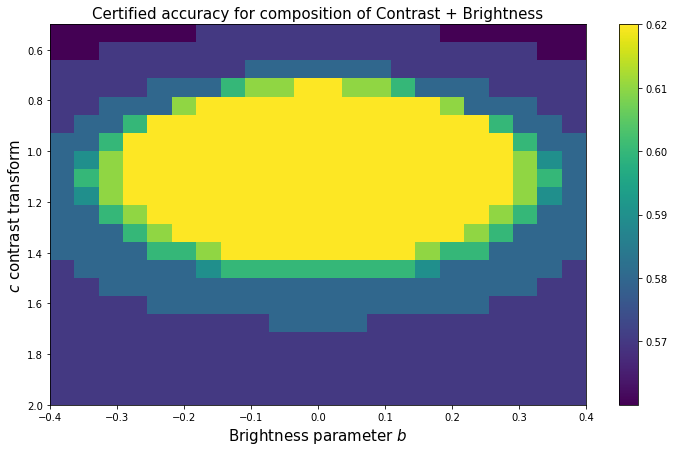

In [851]:
accdf, clps, acc_d = make_accuracy_df_cb(betas = betas, hs = pas, correct = isOk, safe_beta = safe_beta, ifTSS = False, ifOURnew=True, extent = [-0.4, 0.4, 2.0, 0.5] )




In [852]:
dirname

'./..results/'

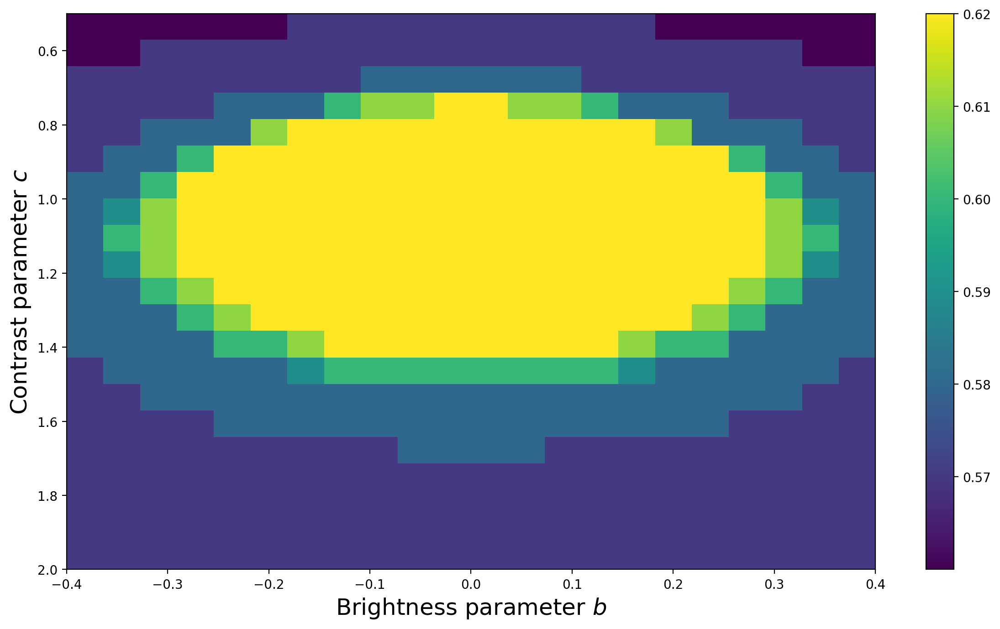

In [859]:
plt.figure(figsize=(12,7), dpi=200)
plt.imshow(clps, extent=[-0.4, 0.4, 2.0, 0.5] , aspect='auto')
#plt.set_ylabel([1., 11.])
# plt.title(r'Certified accuracy for composition of Contrast and Brightness. Our', fontsize=15)
plt.ylabel(r'Contrast parameter $c$', fontsize=18)
plt.xlabel(r'Brightness parameter $b$', fontsize=18)
plt.colorbar();
plt.tight_layout()

plt.savefig('./../results/ContrastBrightness06.pdf')
plt.show()

In [94]:
min(list(acc_d.values()))

0.46

In [95]:
accdf.to_csv(dirname + 'Contrast+BrighttnessFinal.csv', index=False)


100%|█████████████████████████████████████████| 462/462 [00:38<00:00, 12.10it/s]


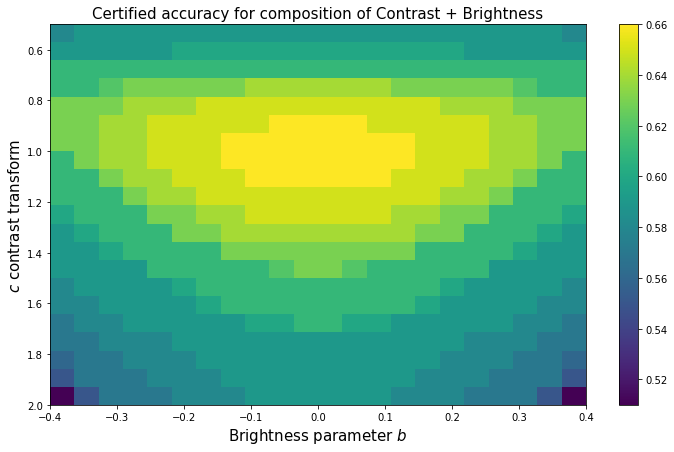

In [96]:
accdf_tss, clps_tss, acc_d = make_accuracy_df_cb(betas = betas, hs = paTSS, correct = isOkTSS, safe_beta = safe_beta_tss_bc, ifTSS = True, ifOURnew=False, extent = [-0.4, 0.4, 2.0, 0.5] )




In [97]:
min(list(acc_d.values()))

0.51

In [98]:
isOk

array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1])

In [99]:
d = {}
# d['betas'] = list(betas)
# d['df'] = accdf_tss

# d['clps_tss'] = clps_tss
# d['acc_d'] = acc_d 
d['pas'] = list(pas)

d['isOk'] = list(map(int, list(isOk)))
d['paTSS'] = list(paTSS)
d['isOkTSS'] = list(map(int, list(isOkTSS)))

# pas, isOk, paTSS, isOkTSS

In [100]:
import json
with open(dirname+'BC_final.json', 'w') as f:
      json.dump(d, f, ensure_ascii=False)

In [102]:
pwd

'/workspace/raid/data/dkorzh/general_lipschitz/notebooks'

In [101]:
!ls $dirname

BC_final.json  Contrast+BrighttnessFinal.csv  ContrastBrightness06.pdf


# Gamma + Contrast

In [860]:
sigma_c = 0.1
sigma_gamma = 0.1

In [861]:
def attack_gc_torch(x, b):
    return (x**(torch.tensor(b[0].item()))) * torch.tensor(b[1].item())



# def norm_to_ray_torch(a,b):
#     return torch.sqrt(-torch.log((1-0.5*torch.erfc(-a/np.sqrt(2)))**2))


def phi_gc_torch_batch_and_noise(x, sigma_g=sigma_gamma, sigma_c = sigma_c):
    q = (torch.randn(len(x)) * sigma_g).to(device)
    q_= (torch.randn(len(x)) * sigma_g).to(device)
    q = torch.sqrt(q**2 + q_**2)
    
    q1 = (torch.randn(len(x)) * sigma_c).to(device)
    
    
    q = q[:, None, None, None]
    q1 = torch.exp(q1[:,None,None,None]) ## Norm to Lornorm
    return (x**q) * q1

In [862]:
ns = 10000
x0 = jnp.array([1.1,0.3]) # WHATEVER 
d = 2
b_zero = jnp.array([1.0, 1.0])

betas1 = jnp.linspace(0.4, 2.2, 30) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(0.4, 2.2, 32)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2)))) 



type_of_transform = 'gc'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)


z = csaps([betas1, betas2], g.reshape(*betas1.shape, *betas2.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2], hat_g.reshape(*betas1.shape, *betas2.shape)) #intterpolation of Integral g(beta)



100%|█████████████████████████████████████████| 960/960 [00:31<00:00, 30.24it/s]


(960, 10000)
(960,)
(10000,)


100%|█████████████████████████████████████████| 960/960 [00:09<00:00, 96.45it/s]


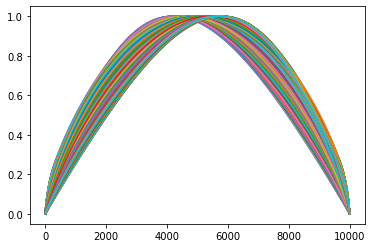

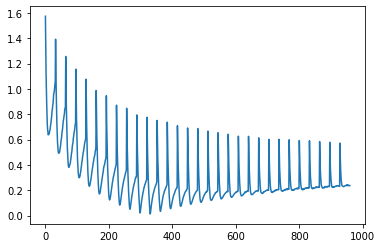

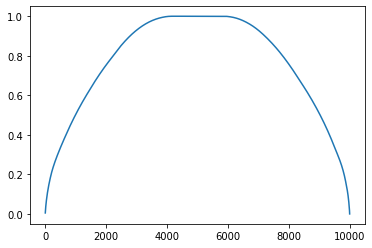

In [863]:
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

In [864]:
xs = np.linspace(0.5,1-1e-4,100)
r_our = lambda h: -xi(1-h)+xi(0.5)
# r_tss_bc= lambda h: 1/2*(xi(h) - xi(1-h))

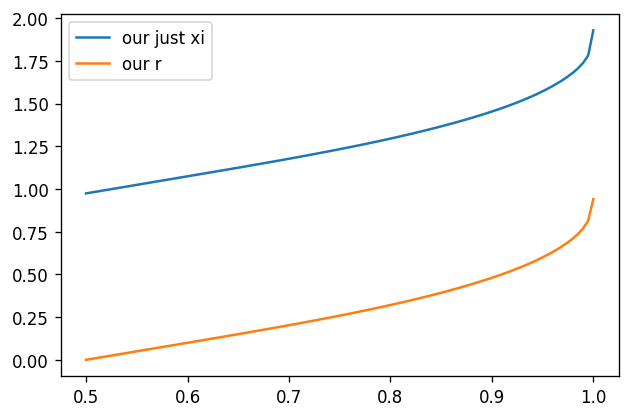

In [865]:
plt.figure(dpi=120)
plt.plot(xs, xi(xs), label='our just xi')
plt.plot(xs,r_our(xs), label='our r')
# plt.plot(xs, r_tss_bc(xs), '--', label='tss')
# plt.yscale('log')
plt.legend()
plt.show()


In [866]:
checkpoint = torch.load('./../checkpoints/_GCGCGC_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

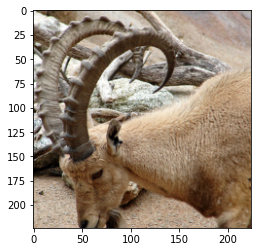

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


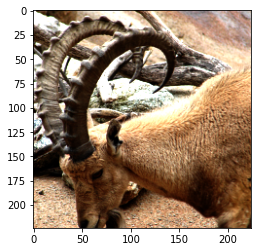

h normal based (pa) 0.999597071763398
normal based pb 0.00012626417376957052
h from Clopper-Pearson (pa) 0.9965520801347684

Ground Truth Class (label) 350
Base classifier prediction in attacked image 350
TSS Smoothed classifier prediction in attacked image 350
Is smoothed classifier prediction in not-attacked image correct? 1
Is smoothed classifier prediction in ATTACKED image correct? 1

[[0.13198528]]
0.916404340057358
Safe beta our with h normal-based [[ True]]
[[0.13198528]]
0.8364450224421958
Safe beta with h Clopper-Pearson [[ True]]


In [867]:
# image, label = next(iter(dataloader100))
k = 35
image = ourdataset100[k][0]
label = ourdataset100[k][1]
imshow(image)

base_classifier = model
x = image
label = label
Phi = phi_gc_torch_batch_and_noise

batch_size = 128

pa, pb, G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)



betas = np.array([1.9, 1.5])
image_attacked = attack_gc_torch(image, betas)
imshow(image_attacked)


base_classifier = model
x = image_attacked
label = label
Phi = phi_bc_torch_batch_and_noise
# n0 = 100
# maxn = 3000
# alpha = 1e-3
# batch_size = 128
adaptive=False

pa_a, pb_a, G_CORRECT_PREDICTION_VIA_I_a, G_CORRECT_PREDICTION_VIA_CI_a, pABar_a, cAHat_a = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)


print('h normal based (pa)', pa.item())
print('normal based pb', pb.item())

print('h from Clopper-Pearson (pa)', pABar)
print()
print('Ground Truth Class (label)', label.item())
print('Base classifier prediction in attacked image', model(image_attacked.unsqueeze(0).to(device)).argmax().item())
print('TSS Smoothed classifier prediction in attacked image', cAHat_a)
print('Is smoothed classifier prediction in not-attacked image correct?', G_CORRECT_PREDICTION_VIA_CI)
print('Is smoothed classifier prediction in ATTACKED image correct?', G_CORRECT_PREDICTION_VIA_CI_a)
print()
print('Safe beta our with h normal-based', safe_beta(xi, pa, hatg_int, [*betas]))
print('Safe beta with h Clopper-Pearson', safe_beta(xi, pABar, hatg_int, [*betas]))


In [868]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 38.89it/s]

0.72


In [869]:
betas0 = np.linspace(0.5, 2.0, 11) # Attack Raxdius
betas1 = np.linspace(0.5, 2.0, 12)

betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1))))
era = ERA_Only_ND(model, dataloader100, attack = attack_gc_torch, device=device, PSN = betas)

#0.52

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_46661/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [01:42<00:00,  1.02s/it]

tensor(0.6800)


In [870]:
print(era)

tensor(0.6800)


In [872]:
# attack = attack_gc_torch
# Phi = phi_gc_torch_batch_and_noise
# era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)

In [ ]:
print(era_smoothed)

In [873]:
Phi = phi_gc_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)

100%|█████████████████████████████████████████| 100/100 [03:28<00:00,  2.09s/it]


In [874]:
print('Ordinary accuracy of Smoothed Classiifer', np.mean(isOk))

Ordinary accuracy of Smoothed Classiifer 0.71


  0%|                                           | 1/462 [00:00<01:24,  5.44it/s]

[[0.32636337]]
-0.230276886105255
[[0.32636337]]
1.0000328546155997
[[0.32636337]]
2.1814294962654777
[[0.32636337]]
0.17719003285640775
[[0.32636337]]
-0.12403088603927594
[[0.32636337]]
0.4745277831015819
[[0.32636337]]
0.9526158302613735
[[0.32636337]]
2.6211677645691247
[[0.32636337]]
2.6420549785098895
[[0.32636337]]
1.5867837640980456
[[0.32636337]]
1.9836348702178654
[[0.32636337]]
2.085887976584251
[[0.32636337]]
-0.924814245924128
[[0.32636337]]
1.3358913941744306
[[0.32636337]]
1.904787192140984
[[0.32636337]]
-0.6049405777179766
[[0.32636337]]
2.6543315466942703
[[0.32636337]]
0.8929450132408295
[[0.32636337]]
-0.39790494574807644
[[0.32636337]]
2.2115714646805054
[[0.32636337]]
0.9245679206616362
[[0.32636337]]
1.2264396414635215
[[0.32636337]]
-0.025036034765397966
[[0.32636337]]
0.5581586790409715
[[0.32636337]]
0.15953723753388582
[[0.32636337]]
-0.503075328737613
[[0.32636337]]
2.5467198419696757
[[0.32636337]]
1.4985718788759579
[[0.32636337]]
1.2420567113999808
[[0.32

  0%|▏                                          | 2/462 [00:00<01:24,  5.45it/s]

2.085887976584251
[[0.2765709]]
-0.924814245924128
[[0.2765709]]
1.3358913941744306
[[0.2765709]]
1.904787192140984
[[0.2765709]]
-0.6049405777179766
[[0.2765709]]
2.6543315466942703
[[0.2765709]]
0.8929450132408295
[[0.2765709]]
-0.39790494574807644
[[0.2765709]]
2.2115714646805054
[[0.2765709]]
0.9245679206616362
[[0.2765709]]
1.2264396414635215
[[0.2765709]]
-0.025036034765397966
[[0.2765709]]
0.5581586790409715
[[0.2765709]]
0.15953723753388582
[[0.2765709]]
-0.503075328737613
[[0.2765709]]
2.5467198419696757
[[0.2765709]]
1.4985718788759579
[[0.2765709]]
1.2420567113999808
[[0.2765709]]
0.8921038584767027
[[0.2765709]]
2.9060859283835043
[[0.2765709]]
2.8209980285020326
[[0.2765709]]
0.6216589410614919
[[0.2765709]]
1.0825982271553185
[[0.2765709]]
3.335996532246442
[[0.2765709]]
2.877224229394707
[[0.2765709]]
1.575153819006855
[[0.2765709]]
1.7241961202078946
[[0.2765709]]
1.8999120558601281
[[0.2765709]]
2.0732858095576665
[[0.2765709]]
-0.19184799523275342
[[0.2765709]]
-0.352

  1%|▎                                          | 3/462 [00:00<01:22,  5.58it/s]

0.5581586790409715
[[0.23753367]]
0.15953723753388582
[[0.23753367]]
-0.503075328737613
[[0.23753367]]
2.5467198419696757
[[0.23753367]]
1.4985718788759579
[[0.23753367]]
1.2420567113999808
[[0.23753367]]
0.8921038584767027
[[0.23753367]]
2.9060859283835043
[[0.23753367]]
2.8209980285020326
[[0.23753367]]
0.6216589410614919
[[0.23753367]]
1.0825982271553185
[[0.23753367]]
3.335996532246442
[[0.23753367]]
2.877224229394707
[[0.23753367]]
1.575153819006855
[[0.23753367]]
1.7241961202078946
[[0.23753367]]
1.8999120558601281
[[0.23753367]]
2.0732858095576665
[[0.23753367]]
-0.19184799523275342
[[0.23753367]]
-0.3525280183443436
[[0.23753367]]
-1.0953928952041567
[[0.23753367]]
2.0006123871107686
[[0.23753367]]
-0.04363008479554823
[[0.23753367]]
-0.3756966512777111
[[0.23753367]]
-0.6429416753404947
[[0.23753367]]
0.20637118088169257
[[0.23753367]]
-0.3917544057793634
[[0.23753367]]
1.6810712641445191
[[0.23753367]]
2.202458359848893
[[0.23753367]]
2.1350333402729733
[[0.23753367]]
1.54883

  1%|▎                                          | 4/462 [00:00<01:22,  5.59it/s]

2.877224229394707
[[0.20796883]]
1.575153819006855
[[0.20796883]]
1.7241961202078946
[[0.20796883]]
1.8999120558601281
[[0.20796883]]
2.0732858095576665
[[0.20796883]]
-0.19184799523275342
[[0.20796883]]
-0.3525280183443436
[[0.20796883]]
-1.0953928952041567
[[0.20796883]]
2.0006123871107686
[[0.20796883]]
-0.04363008479554823
[[0.20796883]]
-0.3756966512777111
[[0.20796883]]
-0.6429416753404947
[[0.20796883]]
0.20637118088169257
[[0.20796883]]
-0.3917544057793634
[[0.20796883]]
1.6810712641445191
[[0.20796883]]
2.202458359848893
[[0.20796883]]
2.1350333402729733
[[0.20796883]]
1.5488385428519442
[[0.20796883]]
-0.2002246577490292
[[0.20796883]]
2.623756451647331
[[0.20796883]]
0.6484986903300862
[[0.20796883]]
-0.2364654605681785
[[0.20796883]]
-0.5472536553936944
[[0.20796883]]
1.9525673162862116
[[0.20796883]]
-0.5514317375876135
[[0.20796883]]
0.2286934674982222
[[0.20796883]]
-0.39941066043734924
[[0.20796883]]
-0.07658610003533492
[[0.20796883]]
0.9431855711842009
[[0.20796883]]


  1%|▍                                          | 5/462 [00:00<01:21,  5.64it/s]


[[0.18679405]]
-0.2002246577490292
[[0.18679405]]
2.623756451647331
[[0.18679405]]
0.6484986903300862
[[0.18679405]]
-0.2364654605681785
[[0.18679405]]
-0.5472536553936944
[[0.18679405]]
1.9525673162862116
[[0.18679405]]
-0.5514317375876135
[[0.18679405]]
0.2286934674982222
[[0.18679405]]
-0.39941066043734924
[[0.18679405]]
-0.07658610003533492
[[0.18679405]]
0.9431855711842009
[[0.18679405]]
2.435551351386072
[[0.18679405]]
-0.9522427963460093
[[0.18679405]]
1.0860219910369147
[[0.18679405]]
0.8320107272042205
[[0.18679405]]
0.30297384588188936
[[0.18679405]]
0.660699271631641
[[0.18679405]]
-0.3105789913912246
[[0.18679405]]
-0.07410469353126733
[[0.18679405]]
-0.5903186076028524
[[0.18679405]]
-0.21478136781201027
[[0.18679405]]
-0.9967212368629229
[[0.18679405]]
0.25159357594350557
[[0.18679405]]
-0.6463110060545771
[[0.18679405]]
0.6887634950250748
[[0.18679405]]
-0.1113118621749373
[[0.18679405]]
0.8528993361984231
[[0.18679405]]
1.794201441109633
[[0.18679405]]
0.44694819785282

  1%|▌                                          | 6/462 [00:01<01:21,  5.60it/s]

[[0.17294392]]
0.8320107272042205
[[0.17294392]]
0.30297384588188936
[[0.17294392]]
0.660699271631641
[[0.17294392]]
-0.3105789913912246
[[0.17294392]]
-0.07410469353126733
[[0.17294392]]
-0.5903186076028524
[[0.17294392]]
-0.21478136781201027
[[0.17294392]]
-0.9967212368629229
[[0.17294392]]
0.25159357594350557
[[0.17294392]]
-0.6463110060545771
[[0.17294392]]
0.6887634950250748
[[0.17294392]]
-0.1113118621749373
[[0.17294392]]
0.8528993361984231
[[0.17294392]]
1.794201441109633
[[0.17294392]]
0.4469481978528291
[[0.17294392]]
0.7356867783537143
[[0.17294392]]
0.021008227395679806
[[0.17294392]]
-0.8070967093333179
[[0.17294392]]
2.047323040276988
[[0.17294392]]
-0.012541517821049281
[[0.17294392]]
0.8244417323393478
[[0.17294392]]
0.7256404828079503
[[0.17294392]]
1.5470506377553737
[[0.17294392]]
2.9316350614246183
[[0.17294392]]
1.7418812061203308
[[0.17294392]]
-1.373219025333822
[[0.17294392]]
-0.43537847859597056
[[0.17294392]]
-0.14740783012182254
[[0.17294392]]
1.2596823004139

  2%|▋                                          | 7/462 [00:01<01:19,  5.69it/s]


[[0.16578622]]
2.047323040276988
[[0.16578622]]
-0.012541517821049281
[[0.16578622]]
0.8244417323393478
[[0.16578622]]
0.7256404828079503
[[0.16578622]]
1.5470506377553737
[[0.16578622]]
2.9316350614246183
[[0.16578622]]
1.7418812061203308
[[0.16578622]]
-1.373219025333822
[[0.16578622]]
-0.43537847859597056
[[0.16578622]]
-0.14740783012182254
[[0.16578622]]
1.2596823004139563
[[0.16578622]]
1.399698997904379
[[0.16578622]]
1.5256551819856066
[[0.16578622]]
2.137047843625699
[[0.16578622]]
2.1304762031160256
[[0.1639413]]
-0.230276886105255
[[0.1639413]]
1.0000328546155997
[[0.1639413]]
2.1814294962654777
[[0.1639413]]
0.17719003285640775
[[0.1639413]]
-0.12403088603927594
[[0.1639413]]
0.4745277831015819
[[0.1639413]]
0.9526158302613735
[[0.1639413]]
2.6211677645691247
[[0.1639413]]
2.6420549785098895
[[0.1639413]]
1.5867837640980456
[[0.1639413]]
1.9836348702178654
[[0.1639413]]
2.085887976584251
[[0.1639413]]
-0.924814245924128
[[0.1639413]]
1.3358913941744306
[[0.1639413]]
1.90478

  2%|▊                                          | 9/462 [00:01<01:20,  5.63it/s]

[[0.1639413]]
1.5256551819856066
[[0.1639413]]
2.137047843625699
[[0.1639413]]
2.1304762031160256
[[0.16578629]]
-0.230276886105255
[[0.16578629]]
1.0000328546155997
[[0.16578629]]
2.1814294962654777
[[0.16578629]]
0.17719003285640775
[[0.16578629]]
-0.12403088603927594
[[0.16578629]]
0.4745277831015819
[[0.16578629]]
0.9526158302613735
[[0.16578629]]
2.6211677645691247
[[0.16578629]]
2.6420549785098895
[[0.16578629]]
1.5867837640980456
[[0.16578629]]
1.9836348702178654
[[0.16578629]]
2.085887976584251
[[0.16578629]]
-0.924814245924128
[[0.16578629]]
1.3358913941744306
[[0.16578629]]
1.904787192140984
[[0.16578629]]
-0.6049405777179766
[[0.16578629]]
2.6543315466942703
[[0.16578629]]
0.8929450132408295
[[0.16578629]]
-0.39790494574807644
[[0.16578629]]
2.2115714646805054
[[0.16578629]]
0.9245679206616362
[[0.16578629]]
1.2264396414635215
[[0.16578629]]
-0.025036034765397966
[[0.16578629]]
0.5581586790409715
[[0.16578629]]
0.15953723753388582
[[0.16578629]]
-0.503075328737613
[[0.165786

  2%|▉                                         | 10/462 [00:01<01:23,  5.41it/s]

[[0.17023014]]
2.6420549785098895
[[0.17023014]]
1.5867837640980456
[[0.17023014]]
1.9836348702178654
[[0.17023014]]
2.085887976584251
[[0.17023014]]
-0.924814245924128
[[0.17023014]]
1.3358913941744306
[[0.17023014]]
1.904787192140984
[[0.17023014]]
-0.6049405777179766
[[0.17023014]]
2.6543315466942703
[[0.17023014]]
0.8929450132408295
[[0.17023014]]
-0.39790494574807644
[[0.17023014]]
2.2115714646805054
[[0.17023014]]
0.9245679206616362
[[0.17023014]]
1.2264396414635215
[[0.17023014]]
-0.025036034765397966
[[0.17023014]]
0.5581586790409715
[[0.17023014]]
0.15953723753388582
[[0.17023014]]
-0.503075328737613
[[0.17023014]]
2.5467198419696757
[[0.17023014]]
1.4985718788759579
[[0.17023014]]
1.2420567113999808
[[0.17023014]]
0.8921038584767027
[[0.17023014]]
2.9060859283835043
[[0.17023014]]
2.8209980285020326
[[0.17023014]]
0.6216589410614919
[[0.17023014]]
1.0825982271553185
[[0.17023014]]
3.335996532246442
[[0.17023014]]
2.877224229394707
[[0.17023014]]
1.575153819006855
[[0.17023014

  2%|█                                         | 11/462 [00:01<01:22,  5.47it/s]

1.9836348702178654
[[0.17689553]]
2.085887976584251
[[0.17689553]]
-0.924814245924128
[[0.17689553]]
1.3358913941744306
[[0.17689553]]
1.904787192140984
[[0.17689553]]
-0.6049405777179766
[[0.17689553]]
2.6543315466942703
[[0.17689553]]
0.8929450132408295
[[0.17689553]]
-0.39790494574807644
[[0.17689553]]
2.2115714646805054
[[0.17689553]]
0.9245679206616362
[[0.17689553]]
1.2264396414635215
[[0.17689553]]
-0.025036034765397966
[[0.17689553]]
0.5581586790409715
[[0.17689553]]
0.15953723753388582
[[0.17689553]]
-0.503075328737613
[[0.17689553]]
2.5467198419696757
[[0.17689553]]
1.4985718788759579
[[0.17689553]]
1.2420567113999808
[[0.17689553]]
0.8921038584767027
[[0.17689553]]
2.9060859283835043
[[0.17689553]]
2.8209980285020326
[[0.17689553]]
0.6216589410614919
[[0.17689553]]
1.0825982271553185
[[0.17689553]]
3.335996532246442
[[0.17689553]]
2.877224229394707
[[0.17689553]]
1.575153819006855
[[0.17689553]]
1.7241961202078946
[[0.17689553]]
1.8999120558601281
[[0.17689553]]
2.0732858095

  3%|█                                         | 12/462 [00:02<01:23,  5.38it/s]

[[0.18570723]]
1.4985718788759579
[[0.18570723]]
1.2420567113999808
[[0.18570723]]
0.8921038584767027
[[0.18570723]]
2.9060859283835043
[[0.18570723]]
2.8209980285020326
[[0.18570723]]
0.6216589410614919
[[0.18570723]]
1.0825982271553185
[[0.18570723]]
3.335996532246442
[[0.18570723]]
2.877224229394707
[[0.18570723]]
1.575153819006855
[[0.18570723]]
1.7241961202078946
[[0.18570723]]
1.8999120558601281
[[0.18570723]]
2.0732858095576665
[[0.18570723]]
-0.19184799523275342
[[0.18570723]]
-0.3525280183443436
[[0.18570723]]
-1.0953928952041567
[[0.18570723]]
2.0006123871107686
[[0.18570723]]
-0.04363008479554823
[[0.18570723]]
-0.3756966512777111
[[0.18570723]]
-0.6429416753404947
[[0.18570723]]
0.20637118088169257
[[0.18570723]]
-0.3917544057793634
[[0.18570723]]
1.6810712641445191
[[0.18570723]]
2.202458359848893
[[0.18570723]]
2.1350333402729733
[[0.18570723]]
1.5488385428519442
[[0.18570723]]
-0.2002246577490292
[[0.18570723]]
2.623756451647331
[[0.18570723]]
0.6484986903300862
[[0.1857

  3%|█▏                                        | 13/462 [00:02<01:22,  5.43it/s]


[[0.1960147]]
1.0825982271553185
[[0.1960147]]
3.335996532246442
[[0.1960147]]
2.877224229394707
[[0.1960147]]
1.575153819006855
[[0.1960147]]
1.7241961202078946
[[0.1960147]]
1.8999120558601281
[[0.1960147]]
2.0732858095576665
[[0.1960147]]
-0.19184799523275342
[[0.1960147]]
-0.3525280183443436
[[0.1960147]]
-1.0953928952041567
[[0.1960147]]
2.0006123871107686
[[0.1960147]]
-0.04363008479554823
[[0.1960147]]
-0.3756966512777111
[[0.1960147]]
-0.6429416753404947
[[0.1960147]]
0.20637118088169257
[[0.1960147]]
-0.3917544057793634
[[0.1960147]]
1.6810712641445191
[[0.1960147]]
2.202458359848893
[[0.1960147]]
2.1350333402729733
[[0.1960147]]
1.5488385428519442
[[0.1960147]]
-0.2002246577490292
[[0.1960147]]
2.623756451647331
[[0.1960147]]
0.6484986903300862
[[0.1960147]]
-0.2364654605681785
[[0.1960147]]
-0.5472536553936944
[[0.1960147]]
1.9525673162862116
[[0.1960147]]
-0.5514317375876135
[[0.1960147]]
0.2286934674982222
[[0.1960147]]
-0.39941066043734924
[[0.1960147]]
-0.07658610003533

  3%|█▎                                        | 14/462 [00:02<01:22,  5.45it/s]

-0.04363008479554823
[[0.20714618]]
-0.3756966512777111
[[0.20714618]]
-0.6429416753404947
[[0.20714618]]
0.20637118088169257
[[0.20714618]]
-0.3917544057793634
[[0.20714618]]
1.6810712641445191
[[0.20714618]]
2.202458359848893
[[0.20714618]]
2.1350333402729733
[[0.20714618]]
1.5488385428519442
[[0.20714618]]
-0.2002246577490292
[[0.20714618]]
2.623756451647331
[[0.20714618]]
0.6484986903300862
[[0.20714618]]
-0.2364654605681785
[[0.20714618]]
-0.5472536553936944
[[0.20714618]]
1.9525673162862116
[[0.20714618]]
-0.5514317375876135
[[0.20714618]]
0.2286934674982222
[[0.20714618]]
-0.39941066043734924
[[0.20714618]]
-0.07658610003533492
[[0.20714618]]
0.9431855711842009
[[0.20714618]]
2.435551351386072
[[0.20714618]]
-0.9522427963460093
[[0.20714618]]
1.0860219910369147
[[0.20714618]]
0.8320107272042205
[[0.20714618]]
0.30297384588188936
[[0.20714618]]
0.660699271631641
[[0.20714618]]
-0.3105789913912246
[[0.20714618]]
-0.07410469353126733
[[0.20714618]]
-0.5903186076028524
[[0.20714618]

  3%|█▎                                        | 15/462 [00:02<01:22,  5.41it/s]

1.5488385428519442
[[0.21869301]]
-0.2002246577490292
[[0.21869301]]
2.623756451647331
[[0.21869301]]
0.6484986903300862
[[0.21869301]]
-0.2364654605681785
[[0.21869301]]
-0.5472536553936944
[[0.21869301]]
1.9525673162862116
[[0.21869301]]
-0.5514317375876135
[[0.21869301]]
0.2286934674982222
[[0.21869301]]
-0.39941066043734924
[[0.21869301]]
-0.07658610003533492
[[0.21869301]]
0.9431855711842009
[[0.21869301]]
2.435551351386072
[[0.21869301]]
-0.9522427963460093
[[0.21869301]]
1.0860219910369147
[[0.21869301]]
0.8320107272042205
[[0.21869301]]
0.30297384588188936
[[0.21869301]]
0.660699271631641
[[0.21869301]]
-0.3105789913912246
[[0.21869301]]
-0.07410469353126733
[[0.21869301]]
-0.5903186076028524
[[0.21869301]]
-0.21478136781201027
[[0.21869301]]
-0.9967212368629229
[[0.21869301]]
0.25159357594350557
[[0.21869301]]
-0.6463110060545771
[[0.21869301]]
0.6887634950250748
[[0.21869301]]
-0.1113118621749373
[[0.21869301]]
0.8528993361984231
[[0.21869301]]
1.794201441109633
[[0.21869301]

  3%|█▍                                        | 16/462 [00:02<01:22,  5.38it/s]

0.2286934674982222
[[0.23040272]]
-0.39941066043734924
[[0.23040272]]
-0.07658610003533492
[[0.23040272]]
0.9431855711842009
[[0.23040272]]
2.435551351386072
[[0.23040272]]
-0.9522427963460093
[[0.23040272]]
1.0860219910369147
[[0.23040272]]
0.8320107272042205
[[0.23040272]]
0.30297384588188936
[[0.23040272]]
0.660699271631641
[[0.23040272]]
-0.3105789913912246
[[0.23040272]]
-0.07410469353126733
[[0.23040272]]
-0.5903186076028524
[[0.23040272]]
-0.21478136781201027
[[0.23040272]]
-0.9967212368629229
[[0.23040272]]
0.25159357594350557
[[0.23040272]]
-0.6463110060545771
[[0.23040272]]
0.6887634950250748
[[0.23040272]]
-0.1113118621749373
[[0.23040272]]
0.8528993361984231
[[0.23040272]]
1.794201441109633
[[0.23040272]]
0.4469481978528291
[[0.23040272]]
0.7356867783537143
[[0.23040272]]
0.021008227395679806
[[0.23040272]]
-0.8070967093333179
[[0.23040272]]
2.047323040276988
[[0.23040272]]
-0.012541517821049281
[[0.23040272]]
0.8244417323393478
[[0.23040272]]
0.7256404828079503
[[0.2304027

  4%|█▌                                        | 17/462 [00:03<01:23,  5.34it/s]

[[0.24207382]]
-0.3105789913912246
[[0.24207382]]
-0.07410469353126733
[[0.24207382]]
-0.5903186076028524
[[0.24207382]]
-0.21478136781201027
[[0.24207382]]
-0.9967212368629229
[[0.24207382]]
0.25159357594350557
[[0.24207382]]
-0.6463110060545771
[[0.24207382]]
0.6887634950250748
[[0.24207382]]
-0.1113118621749373
[[0.24207382]]
0.8528993361984231
[[0.24207382]]
1.794201441109633
[[0.24207382]]
0.4469481978528291
[[0.24207382]]
0.7356867783537143
[[0.24207382]]
0.021008227395679806
[[0.24207382]]
-0.8070967093333179
[[0.24207382]]
2.047323040276988
[[0.24207382]]
-0.012541517821049281
[[0.24207382]]
0.8244417323393478
[[0.24207382]]
0.7256404828079503
[[0.24207382]]
1.5470506377553737
[[0.24207382]]
2.9316350614246183
[[0.24207382]]
1.7418812061203308
[[0.24207382]]
-1.373219025333822
[[0.24207382]]
-0.43537847859597056
[[0.24207382]]
-0.14740783012182254
[[0.24207382]]
1.2596823004139563
[[0.24207382]]
1.399698997904379
[[0.24207382]]
1.5256551819856066
[[0.24207382]]
2.13704784362569

  4%|█▋                                        | 18/462 [00:03<01:22,  5.38it/s]

[[0.25357662]]
0.021008227395679806
[[0.25357662]]
-0.8070967093333179
[[0.25357662]]
2.047323040276988
[[0.25357662]]
-0.012541517821049281
[[0.25357662]]
0.8244417323393478
[[0.25357662]]
0.7256404828079503
[[0.25357662]]
1.5470506377553737
[[0.25357662]]
2.9316350614246183
[[0.25357662]]
1.7418812061203308
[[0.25357662]]
-1.373219025333822
[[0.25357662]]
-0.43537847859597056
[[0.25357662]]
-0.14740783012182254
[[0.25357662]]
1.2596823004139563
[[0.25357662]]
1.399698997904379
[[0.25357662]]
1.5256551819856066
[[0.25357662]]
2.137047843625699
[[0.25357662]]
2.1304762031160256
[[0.26509838]]
-0.230276886105255
[[0.26509838]]
1.0000328546155997
[[0.26509838]]
2.1814294962654777
[[0.26509838]]
0.17719003285640775
[[0.26509838]]
-0.12403088603927594
[[0.26509838]]
0.4745277831015819
[[0.26509838]]
0.9526158302613735
[[0.26509838]]
2.6211677645691247
[[0.26509838]]
2.6420549785098895
[[0.26509838]]
1.5867837640980456
[[0.26509838]]
1.9836348702178654
[[0.26509838]]
2.085887976584251
[[0.2

  4%|█▋                                        | 19/462 [00:03<01:24,  5.24it/s]

[[0.26509838]]
0.021008227395679806
[[0.26509838]]
-0.8070967093333179
[[0.26509838]]
2.047323040276988
[[0.26509838]]
-0.012541517821049281
[[0.26509838]]
0.8244417323393478
[[0.26509838]]
0.7256404828079503
[[0.26509838]]
1.5470506377553737
[[0.26509838]]
2.9316350614246183
[[0.26509838]]
1.7418812061203308
[[0.26509838]]
-1.373219025333822
[[0.26509838]]
-0.43537847859597056
[[0.26509838]]
-0.14740783012182254
[[0.26509838]]
1.2596823004139563
[[0.26509838]]
1.399698997904379
[[0.26509838]]
1.5256551819856066
[[0.26509838]]
2.137047843625699
[[0.26509838]]
2.1304762031160256
[[0.27655702]]
-0.230276886105255
[[0.27655702]]
1.0000328546155997
[[0.27655702]]
2.1814294962654777
[[0.27655702]]
0.17719003285640775
[[0.27655702]]
-0.12403088603927594
[[0.27655702]]
0.4745277831015819
[[0.27655702]]
0.9526158302613735
[[0.27655702]]
2.6211677645691247
[[0.27655702]]
2.6420549785098895
[[0.27655702]]
1.5867837640980456
[[0.27655702]]
1.9836348702178654
[[0.27655702]]
2.085887976584251
[[0.2

  4%|█▊                                        | 20/462 [00:03<01:23,  5.28it/s]

[[0.27655702]]
-0.43537847859597056
[[0.27655702]]
-0.14740783012182254
[[0.27655702]]
1.2596823004139563
[[0.27655702]]
1.399698997904379
[[0.27655702]]
1.5256551819856066
[[0.27655702]]
2.137047843625699
[[0.27655702]]
2.1304762031160256
[[0.28767093]]
-0.230276886105255
[[0.28767093]]
1.0000328546155997
[[0.28767093]]
2.1814294962654777
[[0.28767093]]
0.17719003285640775
[[0.28767093]]
-0.12403088603927594
[[0.28767093]]
0.4745277831015819
[[0.28767093]]
0.9526158302613735
[[0.28767093]]
2.6211677645691247
[[0.28767093]]
2.6420549785098895
[[0.28767093]]
1.5867837640980456
[[0.28767093]]
1.9836348702178654
[[0.28767093]]
2.085887976584251
[[0.28767093]]
-0.924814245924128
[[0.28767093]]
1.3358913941744306
[[0.28767093]]
1.904787192140984
[[0.28767093]]
-0.6049405777179766
[[0.28767093]]
2.6543315466942703
[[0.28767093]]
0.8929450132408295
[[0.28767093]]
-0.39790494574807644
[[0.28767093]]
2.2115714646805054
[[0.28767093]]
0.9245679206616362
[[0.28767093]]
1.2264396414635215
[[0.2876

  5%|██                                        | 22/462 [00:04<01:22,  5.30it/s]

[[0.28767093]]
2.137047843625699
[[0.28767093]]
2.1304762031160256
[[0.29843549]]
-0.230276886105255
[[0.29843549]]
1.0000328546155997
[[0.29843549]]
2.1814294962654777
[[0.29843549]]
0.17719003285640775
[[0.29843549]]
-0.12403088603927594
[[0.29843549]]
0.4745277831015819
[[0.29843549]]
0.9526158302613735
[[0.29843549]]
2.6211677645691247
[[0.29843549]]
2.6420549785098895
[[0.29843549]]
1.5867837640980456
[[0.29843549]]
1.9836348702178654
[[0.29843549]]
2.085887976584251
[[0.29843549]]
-0.924814245924128
[[0.29843549]]
1.3358913941744306
[[0.29843549]]
1.904787192140984
[[0.29843549]]
-0.6049405777179766
[[0.29843549]]
2.6543315466942703
[[0.29843549]]
0.8929450132408295
[[0.29843549]]
-0.39790494574807644
[[0.29843549]]
2.2115714646805054
[[0.29843549]]
0.9245679206616362
[[0.29843549]]
1.2264396414635215
[[0.29843549]]
-0.025036034765397966
[[0.29843549]]
0.5581586790409715
[[0.29843549]]
0.15953723753388582
[[0.29843549]]
-0.503075328737613
[[0.29843549]]
2.5467198419696757
[[0.298

  5%|██                                        | 23/462 [00:04<01:21,  5.40it/s]

[[0.29387087]]
1.5867837640980456
[[0.29387087]]
1.9836348702178654
[[0.29387087]]
2.085887976584251
[[0.29387087]]
-0.924814245924128
[[0.29387087]]
1.3358913941744306
[[0.29387087]]
1.904787192140984
[[0.29387087]]
-0.6049405777179766
[[0.29387087]]
2.6543315466942703
[[0.29387087]]
0.8929450132408295
[[0.29387087]]
-0.39790494574807644
[[0.29387087]]
2.2115714646805054
[[0.29387087]]
0.9245679206616362
[[0.29387087]]
1.2264396414635215
[[0.29387087]]
-0.025036034765397966
[[0.29387087]]
0.5581586790409715
[[0.29387087]]
0.15953723753388582
[[0.29387087]]
-0.503075328737613
[[0.29387087]]
2.5467198419696757
[[0.29387087]]
1.4985718788759579
[[0.29387087]]
1.2420567113999808
[[0.29387087]]
0.8921038584767027
[[0.29387087]]
2.9060859283835043
[[0.29387087]]
2.8209980285020326
[[0.29387087]]
0.6216589410614919
[[0.29387087]]
1.0825982271553185
[[0.29387087]]
3.335996532246442
[[0.29387087]]
2.877224229394707
[[0.29387087]]
1.575153819006855
[[0.29387087]]
1.7241961202078946
[[0.29387087

  5%|██▏                                       | 24/462 [00:04<01:22,  5.30it/s]

1.904787192140984
[[0.24476364]]
-0.6049405777179766
[[0.24476364]]
2.6543315466942703
[[0.24476364]]
0.8929450132408295
[[0.24476364]]
-0.39790494574807644
[[0.24476364]]
2.2115714646805054
[[0.24476364]]
0.9245679206616362
[[0.24476364]]
1.2264396414635215
[[0.24476364]]
-0.025036034765397966
[[0.24476364]]
0.5581586790409715
[[0.24476364]]
0.15953723753388582
[[0.24476364]]
-0.503075328737613
[[0.24476364]]
2.5467198419696757
[[0.24476364]]
1.4985718788759579
[[0.24476364]]
1.2420567113999808
[[0.24476364]]
0.8921038584767027
[[0.24476364]]
2.9060859283835043
[[0.24476364]]
2.8209980285020326
[[0.24476364]]
0.6216589410614919
[[0.24476364]]
1.0825982271553185
[[0.24476364]]
3.335996532246442
[[0.24476364]]
2.877224229394707
[[0.24476364]]
1.575153819006855
[[0.24476364]]
1.7241961202078946
[[0.24476364]]
1.8999120558601281
[[0.24476364]]
2.0732858095576665
[[0.24476364]]
-0.19184799523275342
[[0.24476364]]
-0.3525280183443436
[[0.24476364]]
-1.0953928952041567
[[0.24476364]]
2.00061

  5%|██▎                                       | 25/462 [00:04<01:23,  5.24it/s]

-0.025036034765397966
[[0.20532288]]
0.5581586790409715
[[0.20532288]]
0.15953723753388582
[[0.20532288]]
-0.503075328737613
[[0.20532288]]
2.5467198419696757
[[0.20532288]]
1.4985718788759579
[[0.20532288]]
1.2420567113999808
[[0.20532288]]
0.8921038584767027
[[0.20532288]]
2.9060859283835043
[[0.20532288]]
2.8209980285020326
[[0.20532288]]
0.6216589410614919
[[0.20532288]]
1.0825982271553185
[[0.20532288]]
3.335996532246442
[[0.20532288]]
2.877224229394707
[[0.20532288]]
1.575153819006855
[[0.20532288]]
1.7241961202078946
[[0.20532288]]
1.8999120558601281
[[0.20532288]]
2.0732858095576665
[[0.20532288]]
-0.19184799523275342
[[0.20532288]]
-0.3525280183443436
[[0.20532288]]
-1.0953928952041567
[[0.20532288]]
2.0006123871107686
[[0.20532288]]
-0.04363008479554823
[[0.20532288]]
-0.3756966512777111
[[0.20532288]]
-0.6429416753404947
[[0.20532288]]
0.20637118088169257
[[0.20532288]]
-0.3917544057793634
[[0.20532288]]
1.6810712641445191
[[0.20532288]]
2.202458359848893
[[0.20532288]]
2.13

  6%|██▎                                       | 26/462 [00:04<01:22,  5.32it/s]

[[0.17474283]]
2.5467198419696757
[[0.17474283]]
1.4985718788759579
[[0.17474283]]
1.2420567113999808
[[0.17474283]]
0.8921038584767027
[[0.17474283]]
2.9060859283835043
[[0.17474283]]
2.8209980285020326
[[0.17474283]]
0.6216589410614919
[[0.17474283]]
1.0825982271553185
[[0.17474283]]
3.335996532246442
[[0.17474283]]
2.877224229394707
[[0.17474283]]
1.575153819006855
[[0.17474283]]
1.7241961202078946
[[0.17474283]]
1.8999120558601281
[[0.17474283]]
2.0732858095576665
[[0.17474283]]
-0.19184799523275342
[[0.17474283]]
-0.3525280183443436
[[0.17474283]]
-1.0953928952041567
[[0.17474283]]
2.0006123871107686
[[0.17474283]]
-0.04363008479554823
[[0.17474283]]
-0.3756966512777111
[[0.17474283]]
-0.6429416753404947
[[0.17474283]]
0.20637118088169257
[[0.17474283]]
-0.3917544057793634
[[0.17474283]]
1.6810712641445191
[[0.17474283]]
2.202458359848893
[[0.17474283]]
2.1350333402729733
[[0.17474283]]
1.5488385428519442
[[0.17474283]]
-0.2002246577490292
[[0.17474283]]
2.623756451647331
[[0.1747

  6%|██▍                                       | 27/462 [00:04<01:21,  5.31it/s]

1.8999120558601281
[[0.15258063]]
2.0732858095576665
[[0.15258063]]
-0.19184799523275342
[[0.15258063]]
-0.3525280183443436
[[0.15258063]]
-1.0953928952041567
[[0.15258063]]
2.0006123871107686
[[0.15258063]]
-0.04363008479554823
[[0.15258063]]
-0.3756966512777111
[[0.15258063]]
-0.6429416753404947
[[0.15258063]]
0.20637118088169257
[[0.15258063]]
-0.3917544057793634
[[0.15258063]]
1.6810712641445191
[[0.15258063]]
2.202458359848893
[[0.15258063]]
2.1350333402729733
[[0.15258063]]
1.5488385428519442
[[0.15258063]]
-0.2002246577490292
[[0.15258063]]
2.623756451647331
[[0.15258063]]
0.6484986903300862
[[0.15258063]]
-0.2364654605681785
[[0.15258063]]
-0.5472536553936944
[[0.15258063]]
1.9525673162862116
[[0.15258063]]
-0.5514317375876135
[[0.15258063]]
0.2286934674982222
[[0.15258063]]
-0.39941066043734924
[[0.15258063]]
-0.07658610003533492
[[0.15258063]]
0.9431855711842009
[[0.15258063]]
2.435551351386072
[[0.15258063]]
-0.9522427963460093
[[0.15258063]]
1.0860219910369147
[[0.15258063]

  6%|██▌                                       | 28/462 [00:05<01:21,  5.34it/s]

[[0.13797531]]
0.20637118088169257
[[0.13797531]]
-0.3917544057793634
[[0.13797531]]
1.6810712641445191
[[0.13797531]]
2.202458359848893
[[0.13797531]]
2.1350333402729733
[[0.13797531]]
1.5488385428519442
[[0.13797531]]
-0.2002246577490292
[[0.13797531]]
2.623756451647331
[[0.13797531]]
0.6484986903300862
[[0.13797531]]
-0.2364654605681785
[[0.13797531]]
-0.5472536553936944
[[0.13797531]]
1.9525673162862116
[[0.13797531]]
-0.5514317375876135
[[0.13797531]]
0.2286934674982222
[[0.13797531]]
-0.39941066043734924
[[0.13797531]]
-0.07658610003533492
[[0.13797531]]
0.9431855711842009
[[0.13797531]]
2.435551351386072
[[0.13797531]]
-0.9522427963460093
[[0.13797531]]
1.0860219910369147
[[0.13797531]]
0.8320107272042205
[[0.13797531]]
0.30297384588188936
[[0.13797531]]
0.660699271631641
[[0.13797531]]
-0.3105789913912246
[[0.13797531]]
-0.07410469353126733
[[0.13797531]]
-0.5903186076028524
[[0.13797531]]
-0.21478136781201027
[[0.13797531]]
-0.9967212368629229
[[0.13797531]]
0.2515935759435055

  6%|██▋                                       | 29/462 [00:05<01:19,  5.47it/s]

[[0.13019645]]
1.0860219910369147
[[0.13019645]]
0.8320107272042205
[[0.13019645]]
0.30297384588188936
[[0.13019645]]
0.660699271631641
[[0.13019645]]
-0.3105789913912246
[[0.13019645]]
-0.07410469353126733
[[0.13019645]]
-0.5903186076028524
[[0.13019645]]
-0.21478136781201027
[[0.13019645]]
-0.9967212368629229
[[0.13019645]]
0.25159357594350557
[[0.13019645]]
-0.6463110060545771
[[0.13019645]]
0.6887634950250748
[[0.13019645]]
-0.1113118621749373
[[0.13019645]]
0.8528993361984231
[[0.13019645]]
1.794201441109633
[[0.13019645]]
0.4469481978528291
[[0.13019645]]
0.7356867783537143
[[0.13019645]]
0.021008227395679806
[[0.13019645]]
-0.8070967093333179
[[0.13019645]]
2.047323040276988
[[0.13019645]]
-0.012541517821049281
[[0.13019645]]
0.8244417323393478
[[0.13019645]]
0.7256404828079503
[[0.13019645]]
1.5470506377553737
[[0.13019645]]
2.9316350614246183
[[0.13019645]]
1.7418812061203308
[[0.13019645]]
-1.373219025333822
[[0.13019645]]
-0.43537847859597056
[[0.13019645]]
-0.14740783012182

  6%|██▋                                       | 30/462 [00:05<01:18,  5.51it/s]

-0.6463110060545771
[[0.12790001]]
0.6887634950250748
[[0.12790001]]
-0.1113118621749373
[[0.12790001]]
0.8528993361984231
[[0.12790001]]
1.794201441109633
[[0.12790001]]
0.4469481978528291
[[0.12790001]]
0.7356867783537143
[[0.12790001]]
0.021008227395679806
[[0.12790001]]
-0.8070967093333179
[[0.12790001]]
2.047323040276988
[[0.12790001]]
-0.012541517821049281
[[0.12790001]]
0.8244417323393478
[[0.12790001]]
0.7256404828079503
[[0.12790001]]
1.5470506377553737
[[0.12790001]]
2.9316350614246183
[[0.12790001]]
1.7418812061203308
[[0.12790001]]
-1.373219025333822
[[0.12790001]]
-0.43537847859597056
[[0.12790001]]
-0.14740783012182254
[[0.12790001]]
1.2596823004139563
[[0.12790001]]
1.399698997904379
[[0.12790001]]
1.5256551819856066
[[0.12790001]]
2.137047843625699
[[0.12790001]]
2.1304762031160256
[[0.12973225]]
-0.230276886105255
[[0.12973225]]
1.0000328546155997
[[0.12973225]]
2.1814294962654777
[[0.12973225]]
0.17719003285640775
[[0.12973225]]
-0.12403088603927594
[[0.12973225]]
0.4

  7%|██▊                                       | 31/462 [00:05<01:18,  5.48it/s]

[[0.12973225]]
2.9316350614246183
[[0.12973225]]
1.7418812061203308
[[0.12973225]]
-1.373219025333822
[[0.12973225]]
-0.43537847859597056
[[0.12973225]]
-0.14740783012182254
[[0.12973225]]
1.2596823004139563
[[0.12973225]]
1.399698997904379
[[0.12973225]]
1.5256551819856066
[[0.12973225]]
2.137047843625699
[[0.12973225]]
2.1304762031160256
[[0.13472438]]
-0.230276886105255
[[0.13472438]]
1.0000328546155997
[[0.13472438]]
2.1814294962654777
[[0.13472438]]
0.17719003285640775
[[0.13472438]]
-0.12403088603927594
[[0.13472438]]
0.4745277831015819
[[0.13472438]]
0.9526158302613735
[[0.13472438]]
2.6211677645691247
[[0.13472438]]
2.6420549785098895
[[0.13472438]]
1.5867837640980456
[[0.13472438]]
1.9836348702178654
[[0.13472438]]
2.085887976584251
[[0.13472438]]
-0.924814245924128
[[0.13472438]]
1.3358913941744306
[[0.13472438]]
1.904787192140984
[[0.13472438]]
-0.6049405777179766
[[0.13472438]]
2.6543315466942703
[[0.13472438]]
0.8929450132408295
[[0.13472438]]
-0.39790494574807644
[[0.1347

  7%|██▉                                       | 32/462 [00:05<01:20,  5.33it/s]

[[0.13472438]]
1.7418812061203308
[[0.13472438]]
-1.373219025333822
[[0.13472438]]
-0.43537847859597056
[[0.13472438]]
-0.14740783012182254
[[0.13472438]]
1.2596823004139563
[[0.13472438]]
1.399698997904379
[[0.13472438]]
1.5256551819856066
[[0.13472438]]
2.137047843625699
[[0.13472438]]
2.1304762031160256
[[0.14229124]]
-0.230276886105255
[[0.14229124]]
1.0000328546155997
[[0.14229124]]
2.1814294962654777
[[0.14229124]]
0.17719003285640775
[[0.14229124]]
-0.12403088603927594
[[0.14229124]]
0.4745277831015819
[[0.14229124]]
0.9526158302613735
[[0.14229124]]
2.6211677645691247
[[0.14229124]]
2.6420549785098895
[[0.14229124]]
1.5867837640980456
[[0.14229124]]
1.9836348702178654
[[0.14229124]]
2.085887976584251
[[0.14229124]]
-0.924814245924128
[[0.14229124]]
1.3358913941744306
[[0.14229124]]
1.904787192140984
[[0.14229124]]
-0.6049405777179766
[[0.14229124]]
2.6543315466942703
[[0.14229124]]
0.8929450132408295
[[0.14229124]]
-0.39790494574807644
[[0.14229124]]
2.2115714646805054
[[0.1422

  7%|███                                       | 34/462 [00:06<01:21,  5.27it/s]

[[0.15175019]]
-0.230276886105255
[[0.15175019]]
1.0000328546155997
[[0.15175019]]
2.1814294962654777
[[0.15175019]]
0.17719003285640775
[[0.15175019]]
-0.12403088603927594
[[0.15175019]]
0.4745277831015819
[[0.15175019]]
0.9526158302613735
[[0.15175019]]
2.6211677645691247
[[0.15175019]]
2.6420549785098895
[[0.15175019]]
1.5867837640980456
[[0.15175019]]
1.9836348702178654
[[0.15175019]]
2.085887976584251
[[0.15175019]]
-0.924814245924128
[[0.15175019]]
1.3358913941744306
[[0.15175019]]
1.904787192140984
[[0.15175019]]
-0.6049405777179766
[[0.15175019]]
2.6543315466942703
[[0.15175019]]
0.8929450132408295
[[0.15175019]]
-0.39790494574807644
[[0.15175019]]
2.2115714646805054
[[0.15175019]]
0.9245679206616362
[[0.15175019]]
1.2264396414635215
[[0.15175019]]
-0.025036034765397966
[[0.15175019]]
0.5581586790409715
[[0.15175019]]
0.15953723753388582
[[0.15175019]]
-0.503075328737613
[[0.15175019]]
2.5467198419696757
[[0.15175019]]
1.4985718788759579
[[0.15175019]]
1.2420567113999808
[[0.15

  8%|███▏                                      | 35/462 [00:06<01:22,  5.19it/s]

[[0.16228475]]
0.4745277831015819
[[0.16228475]]
0.9526158302613735
[[0.16228475]]
2.6211677645691247
[[0.16228475]]
2.6420549785098895
[[0.16228475]]
1.5867837640980456
[[0.16228475]]
1.9836348702178654
[[0.16228475]]
2.085887976584251
[[0.16228475]]
-0.924814245924128
[[0.16228475]]
1.3358913941744306
[[0.16228475]]
1.904787192140984
[[0.16228475]]
-0.6049405777179766
[[0.16228475]]
2.6543315466942703
[[0.16228475]]
0.8929450132408295
[[0.16228475]]
-0.39790494574807644
[[0.16228475]]
2.2115714646805054
[[0.16228475]]
0.9245679206616362
[[0.16228475]]
1.2264396414635215
[[0.16228475]]
-0.025036034765397966
[[0.16228475]]
0.5581586790409715
[[0.16228475]]
0.15953723753388582
[[0.16228475]]
-0.503075328737613
[[0.16228475]]
2.5467198419696757
[[0.16228475]]
1.4985718788759579
[[0.16228475]]
1.2420567113999808
[[0.16228475]]
0.8921038584767027
[[0.16228475]]
2.9060859283835043
[[0.16228475]]
2.8209980285020326
[[0.16228475]]
0.6216589410614919
[[0.16228475]]
1.0825982271553185
[[0.16228

  8%|███▎                                      | 36/462 [00:06<01:21,  5.20it/s]

[[0.17349174]]
2.6211677645691247
[[0.17349174]]
2.6420549785098895
[[0.17349174]]
1.5867837640980456
[[0.17349174]]
1.9836348702178654
[[0.17349174]]
2.085887976584251
[[0.17349174]]
-0.924814245924128
[[0.17349174]]
1.3358913941744306
[[0.17349174]]
1.904787192140984
[[0.17349174]]
-0.6049405777179766
[[0.17349174]]
2.6543315466942703
[[0.17349174]]
0.8929450132408295
[[0.17349174]]
-0.39790494574807644
[[0.17349174]]
2.2115714646805054
[[0.17349174]]
0.9245679206616362
[[0.17349174]]
1.2264396414635215
[[0.17349174]]
-0.025036034765397966
[[0.17349174]]
0.5581586790409715
[[0.17349174]]
0.15953723753388582
[[0.17349174]]
-0.503075328737613
[[0.17349174]]
2.5467198419696757
[[0.17349174]]
1.4985718788759579
[[0.17349174]]
1.2420567113999808
[[0.17349174]]
0.8921038584767027
[[0.17349174]]
2.9060859283835043
[[0.17349174]]
2.8209980285020326
[[0.17349174]]
0.6216589410614919
[[0.17349174]]
1.0825982271553185
[[0.17349174]]
3.335996532246442
[[0.17349174]]
2.877224229394707
[[0.1734917

  8%|███▎                                      | 37/462 [00:06<01:22,  5.17it/s]

1.904787192140984
[[0.18499323]]
-0.6049405777179766
[[0.18499323]]
2.6543315466942703
[[0.18499323]]
0.8929450132408295
[[0.18499323]]
-0.39790494574807644
[[0.18499323]]
2.2115714646805054
[[0.18499323]]
0.9245679206616362
[[0.18499323]]
1.2264396414635215
[[0.18499323]]
-0.025036034765397966
[[0.18499323]]
0.5581586790409715
[[0.18499323]]
0.15953723753388582
[[0.18499323]]
-0.503075328737613
[[0.18499323]]
2.5467198419696757
[[0.18499323]]
1.4985718788759579
[[0.18499323]]
1.2420567113999808
[[0.18499323]]
0.8921038584767027
[[0.18499323]]
2.9060859283835043
[[0.18499323]]
2.8209980285020326
[[0.18499323]]
0.6216589410614919
[[0.18499323]]
1.0825982271553185
[[0.18499323]]
3.335996532246442
[[0.18499323]]
2.877224229394707
[[0.18499323]]
1.575153819006855
[[0.18499323]]
1.7241961202078946
[[0.18499323]]
1.8999120558601281
[[0.18499323]]
2.0732858095576665
[[0.18499323]]
-0.19184799523275342
[[0.18499323]]
-0.3525280183443436
[[0.18499323]]
-1.0953928952041567
[[0.18499323]]
2.00061

  8%|███▍                                      | 38/462 [00:07<01:22,  5.14it/s]

[[0.1963782]]
0.8929450132408295
[[0.1963782]]
-0.39790494574807644
[[0.1963782]]
2.2115714646805054
[[0.1963782]]
0.9245679206616362
[[0.1963782]]
1.2264396414635215
[[0.1963782]]
-0.025036034765397966
[[0.1963782]]
0.5581586790409715
[[0.1963782]]
0.15953723753388582
[[0.1963782]]
-0.503075328737613
[[0.1963782]]
2.5467198419696757
[[0.1963782]]
1.4985718788759579
[[0.1963782]]
1.2420567113999808
[[0.1963782]]
0.8921038584767027
[[0.1963782]]
2.9060859283835043
[[0.1963782]]
2.8209980285020326
[[0.1963782]]
0.6216589410614919
[[0.1963782]]
1.0825982271553185
[[0.1963782]]
3.335996532246442
[[0.1963782]]
2.877224229394707
[[0.1963782]]
1.575153819006855
[[0.1963782]]
1.7241961202078946
[[0.1963782]]
1.8999120558601281
[[0.1963782]]
2.0732858095576665
[[0.1963782]]
-0.19184799523275342
[[0.1963782]]
-0.3525280183443436
[[0.1963782]]
-1.0953928952041567
[[0.1963782]]
2.0006123871107686
[[0.1963782]]
-0.04363008479554823
[[0.1963782]]
-0.3756966512777111
[[0.1963782]]
-0.6429416753404947

  8%|███▌                                      | 39/462 [00:07<01:19,  5.30it/s]

0.5581586790409715
[[0.20772524]]
0.15953723753388582
[[0.20772524]]
-0.503075328737613
[[0.20772524]]
2.5467198419696757
[[0.20772524]]
1.4985718788759579
[[0.20772524]]
1.2420567113999808
[[0.20772524]]
0.8921038584767027
[[0.20772524]]
2.9060859283835043
[[0.20772524]]
2.8209980285020326
[[0.20772524]]
0.6216589410614919
[[0.20772524]]
1.0825982271553185
[[0.20772524]]
3.335996532246442
[[0.20772524]]
2.877224229394707
[[0.20772524]]
1.575153819006855
[[0.20772524]]
1.7241961202078946
[[0.20772524]]
1.8999120558601281
[[0.20772524]]
2.0732858095576665
[[0.20772524]]
-0.19184799523275342
[[0.20772524]]
-0.3525280183443436
[[0.20772524]]
-1.0953928952041567
[[0.20772524]]
2.0006123871107686
[[0.20772524]]
-0.04363008479554823
[[0.20772524]]
-0.3756966512777111
[[0.20772524]]
-0.6429416753404947
[[0.20772524]]
0.20637118088169257
[[0.20772524]]
-0.3917544057793634
[[0.20772524]]
1.6810712641445191
[[0.20772524]]
2.202458359848893
[[0.20772524]]
2.1350333402729733
[[0.20772524]]
1.54883

  9%|███▋                                      | 40/462 [00:07<01:17,  5.42it/s]

[[0.21897165]]
-0.3525280183443436
[[0.21897165]]
-1.0953928952041567
[[0.21897165]]
2.0006123871107686
[[0.21897165]]
-0.04363008479554823
[[0.21897165]]
-0.3756966512777111
[[0.21897165]]
-0.6429416753404947
[[0.21897165]]
0.20637118088169257
[[0.21897165]]
-0.3917544057793634
[[0.21897165]]
1.6810712641445191
[[0.21897165]]
2.202458359848893
[[0.21897165]]
2.1350333402729733
[[0.21897165]]
1.5488385428519442
[[0.21897165]]
-0.2002246577490292
[[0.21897165]]
2.623756451647331
[[0.21897165]]
0.6484986903300862
[[0.21897165]]
-0.2364654605681785
[[0.21897165]]
-0.5472536553936944
[[0.21897165]]
1.9525673162862116
[[0.21897165]]
-0.5514317375876135
[[0.21897165]]
0.2286934674982222
[[0.21897165]]
-0.39941066043734924
[[0.21897165]]
-0.07658610003533492
[[0.21897165]]
0.9431855711842009
[[0.21897165]]
2.435551351386072
[[0.21897165]]
-0.9522427963460093
[[0.21897165]]
1.0860219910369147
[[0.21897165]]
0.8320107272042205
[[0.21897165]]
0.30297384588188936
[[0.21897165]]
0.660699271631641


  9%|███▋                                      | 41/462 [00:07<01:17,  5.45it/s]

2.202458359848893
[[0.22999001]]
2.1350333402729733
[[0.22999001]]
1.5488385428519442
[[0.22999001]]
-0.2002246577490292
[[0.22999001]]
2.623756451647331
[[0.22999001]]
0.6484986903300862
[[0.22999001]]
-0.2364654605681785
[[0.22999001]]
-0.5472536553936944
[[0.22999001]]
1.9525673162862116
[[0.22999001]]
-0.5514317375876135
[[0.22999001]]
0.2286934674982222
[[0.22999001]]
-0.39941066043734924
[[0.22999001]]
-0.07658610003533492
[[0.22999001]]
0.9431855711842009
[[0.22999001]]
2.435551351386072
[[0.22999001]]
-0.9522427963460093
[[0.22999001]]
1.0860219910369147
[[0.22999001]]
0.8320107272042205
[[0.22999001]]
0.30297384588188936
[[0.22999001]]
0.660699271631641
[[0.22999001]]
-0.3105789913912246
[[0.22999001]]
-0.07410469353126733
[[0.22999001]]
-0.5903186076028524
[[0.22999001]]
-0.21478136781201027
[[0.22999001]]
-0.9967212368629229
[[0.22999001]]
0.25159357594350557
[[0.22999001]]
-0.6463110060545771
[[0.22999001]]
0.6887634950250748
[[0.22999001]]
-0.1113118621749373
[[0.22999001]

  9%|███▊                                      | 42/462 [00:07<01:17,  5.44it/s]

[[0.24074824]]
-0.9522427963460093
[[0.24074824]]
1.0860219910369147
[[0.24074824]]
0.8320107272042205
[[0.24074824]]
0.30297384588188936
[[0.24074824]]
0.660699271631641
[[0.24074824]]
-0.3105789913912246
[[0.24074824]]
-0.07410469353126733
[[0.24074824]]
-0.5903186076028524
[[0.24074824]]
-0.21478136781201027
[[0.24074824]]
-0.9967212368629229
[[0.24074824]]
0.25159357594350557
[[0.24074824]]
-0.6463110060545771
[[0.24074824]]
0.6887634950250748
[[0.24074824]]
-0.1113118621749373
[[0.24074824]]
0.8528993361984231
[[0.24074824]]
1.794201441109633
[[0.24074824]]
0.4469481978528291
[[0.24074824]]
0.7356867783537143
[[0.24074824]]
0.021008227395679806
[[0.24074824]]
-0.8070967093333179
[[0.24074824]]
2.047323040276988
[[0.24074824]]
-0.012541517821049281
[[0.24074824]]
0.8244417323393478
[[0.24074824]]
0.7256404828079503
[[0.24074824]]
1.5470506377553737
[[0.24074824]]
2.9316350614246183
[[0.24074824]]
1.7418812061203308
[[0.24074824]]
-1.373219025333822
[[0.24074824]]
-0.435378478595970

  9%|███▉                                      | 43/462 [00:07<01:17,  5.42it/s]

-0.07410469353126733
[[0.25122494]]
-0.5903186076028524
[[0.25122494]]
-0.21478136781201027
[[0.25122494]]
-0.9967212368629229
[[0.25122494]]
0.25159357594350557
[[0.25122494]]
-0.6463110060545771
[[0.25122494]]
0.6887634950250748
[[0.25122494]]
-0.1113118621749373
[[0.25122494]]
0.8528993361984231
[[0.25122494]]
1.794201441109633
[[0.25122494]]
0.4469481978528291
[[0.25122494]]
0.7356867783537143
[[0.25122494]]
0.021008227395679806
[[0.25122494]]
-0.8070967093333179
[[0.25122494]]
2.047323040276988
[[0.25122494]]
-0.012541517821049281
[[0.25122494]]
0.8244417323393478
[[0.25122494]]
0.7256404828079503
[[0.25122494]]
1.5470506377553737
[[0.25122494]]
2.9316350614246183
[[0.25122494]]
1.7418812061203308
[[0.25122494]]
-1.373219025333822
[[0.25122494]]
-0.43537847859597056
[[0.25122494]]
-0.14740783012182254
[[0.25122494]]
1.2596823004139563
[[0.25122494]]
1.399698997904379
[[0.25122494]]
1.5256551819856066
[[0.25122494]]
2.137047843625699
[[0.25122494]]
2.1304762031160256
[[0.26132059]]

 10%|████                                      | 44/462 [00:08<01:17,  5.37it/s]

[[0.26132059]]
0.4469481978528291
[[0.26132059]]
0.7356867783537143
[[0.26132059]]
0.021008227395679806
[[0.26132059]]
-0.8070967093333179
[[0.26132059]]
2.047323040276988
[[0.26132059]]
-0.012541517821049281
[[0.26132059]]
0.8244417323393478
[[0.26132059]]
0.7256404828079503
[[0.26132059]]
1.5470506377553737
[[0.26132059]]
2.9316350614246183
[[0.26132059]]
1.7418812061203308
[[0.26132059]]
-1.373219025333822
[[0.26132059]]
-0.43537847859597056
[[0.26132059]]
-0.14740783012182254
[[0.26132059]]
1.2596823004139563
[[0.26132059]]
1.399698997904379
[[0.26132059]]
1.5256551819856066
[[0.26132059]]
2.137047843625699
[[0.26132059]]
2.1304762031160256
[[0.26831717]]
-0.230276886105255
[[0.26831717]]
1.0000328546155997
[[0.26831717]]
2.1814294962654777
[[0.26831717]]
0.17719003285640775
[[0.26831717]]
-0.12403088603927594
[[0.26831717]]
0.4745277831015819
[[0.26831717]]
0.9526158302613735
[[0.26831717]]
2.6211677645691247
[[0.26831717]]
2.6420549785098895
[[0.26831717]]
1.5867837640980456
[[0.

 10%|████                                      | 45/462 [00:08<01:17,  5.39it/s]

[[0.26831717]]
1.7418812061203308
[[0.26831717]]
-1.373219025333822
[[0.26831717]]
-0.43537847859597056
[[0.26831717]]
-0.14740783012182254
[[0.26831717]]
1.2596823004139563
[[0.26831717]]
1.399698997904379
[[0.26831717]]
1.5256551819856066
[[0.26831717]]
2.137047843625699
[[0.26831717]]
2.1304762031160256
[[0.22027051]]
-0.230276886105255
[[0.22027051]]
1.0000328546155997
[[0.22027051]]
2.1814294962654777
[[0.22027051]]
0.17719003285640775
[[0.22027051]]
-0.12403088603927594
[[0.22027051]]
0.4745277831015819
[[0.22027051]]
0.9526158302613735
[[0.22027051]]
2.6211677645691247
[[0.22027051]]
2.6420549785098895
[[0.22027051]]
1.5867837640980456
[[0.22027051]]
1.9836348702178654
[[0.22027051]]
2.085887976584251
[[0.22027051]]
-0.924814245924128
[[0.22027051]]
1.3358913941744306
[[0.22027051]]
1.904787192140984
[[0.22027051]]
-0.6049405777179766
[[0.22027051]]
2.6543315466942703
[[0.22027051]]
0.8929450132408295
[[0.22027051]]
-0.39790494574807644
[[0.22027051]]
2.2115714646805054
[[0.2202

 10%|████▎                                     | 47/462 [00:08<01:15,  5.47it/s]

2.1304762031160256
[[0.18091589]]
-0.230276886105255
[[0.18091589]]
1.0000328546155997
[[0.18091589]]
2.1814294962654777
[[0.18091589]]
0.17719003285640775
[[0.18091589]]
-0.12403088603927594
[[0.18091589]]
0.4745277831015819
[[0.18091589]]
0.9526158302613735
[[0.18091589]]
2.6211677645691247
[[0.18091589]]
2.6420549785098895
[[0.18091589]]
1.5867837640980456
[[0.18091589]]
1.9836348702178654
[[0.18091589]]
2.085887976584251
[[0.18091589]]
-0.924814245924128
[[0.18091589]]
1.3358913941744306
[[0.18091589]]
1.904787192140984
[[0.18091589]]
-0.6049405777179766
[[0.18091589]]
2.6543315466942703
[[0.18091589]]
0.8929450132408295
[[0.18091589]]
-0.39790494574807644
[[0.18091589]]
2.2115714646805054
[[0.18091589]]
0.9245679206616362
[[0.18091589]]
1.2264396414635215
[[0.18091589]]
-0.025036034765397966
[[0.18091589]]
0.5581586790409715
[[0.18091589]]
0.15953723753388582
[[0.18091589]]
-0.503075328737613
[[0.18091589]]
2.5467198419696757
[[0.18091589]]
1.4985718788759579
[[0.18091589]]
1.2420

 10%|████▎                                     | 48/462 [00:08<01:18,  5.28it/s]

[[0.14928488]]
-0.924814245924128
[[0.14928488]]
1.3358913941744306
[[0.14928488]]
1.904787192140984
[[0.14928488]]
-0.6049405777179766
[[0.14928488]]
2.6543315466942703
[[0.14928488]]
0.8929450132408295
[[0.14928488]]
-0.39790494574807644
[[0.14928488]]
2.2115714646805054
[[0.14928488]]
0.9245679206616362
[[0.14928488]]
1.2264396414635215
[[0.14928488]]
-0.025036034765397966
[[0.14928488]]
0.5581586790409715
[[0.14928488]]
0.15953723753388582
[[0.14928488]]
-0.503075328737613
[[0.14928488]]
2.5467198419696757
[[0.14928488]]
1.4985718788759579
[[0.14928488]]
1.2420567113999808
[[0.14928488]]
0.8921038584767027
[[0.14928488]]
2.9060859283835043
[[0.14928488]]
2.8209980285020326
[[0.14928488]]
0.6216589410614919
[[0.14928488]]
1.0825982271553185
[[0.14928488]]
3.335996532246442
[[0.14928488]]
2.877224229394707
[[0.14928488]]
1.575153819006855
[[0.14928488]]
1.7241961202078946
[[0.14928488]]
1.8999120558601281
[[0.14928488]]
2.0732858095576665
[[0.14928488]]
-0.19184799523275342
[[0.14928

 11%|████▍                                     | 49/462 [00:09<01:20,  5.11it/s]

[[0.12540742]]
1.5867837640980456
[[0.12540742]]
1.9836348702178654
[[0.12540742]]
2.085887976584251
[[0.12540742]]
-0.924814245924128
[[0.12540742]]
1.3358913941744306
[[0.12540742]]
1.904787192140984
[[0.12540742]]
-0.6049405777179766
[[0.12540742]]
2.6543315466942703
[[0.12540742]]
0.8929450132408295
[[0.12540742]]
-0.39790494574807644
[[0.12540742]]
2.2115714646805054
[[0.12540742]]
0.9245679206616362
[[0.12540742]]
1.2264396414635215
[[0.12540742]]
-0.025036034765397966
[[0.12540742]]
0.5581586790409715
[[0.12540742]]
0.15953723753388582
[[0.12540742]]
-0.503075328737613
[[0.12540742]]
2.5467198419696757
[[0.12540742]]
1.4985718788759579
[[0.12540742]]
1.2420567113999808
[[0.12540742]]
0.8921038584767027
[[0.12540742]]
2.9060859283835043
[[0.12540742]]
2.8209980285020326
[[0.12540742]]
0.6216589410614919
[[0.12540742]]
1.0825982271553185
[[0.12540742]]
3.335996532246442
[[0.12540742]]
2.877224229394707
[[0.12540742]]
1.575153819006855
[[0.12540742]]
1.7241961202078946
[[0.12540742

 11%|████▌                                     | 50/462 [00:09<01:20,  5.09it/s]

0.4745277831015819
[[0.10927058]]
0.9526158302613735
[[0.10927058]]
2.6211677645691247
[[0.10927058]]
2.6420549785098895
[[0.10927058]]
1.5867837640980456
[[0.10927058]]
1.9836348702178654
[[0.10927058]]
2.085887976584251
[[0.10927058]]
-0.924814245924128
[[0.10927058]]
1.3358913941744306
[[0.10927058]]
1.904787192140984
[[0.10927058]]
-0.6049405777179766
[[0.10927058]]
2.6543315466942703
[[0.10927058]]
0.8929450132408295
[[0.10927058]]
-0.39790494574807644
[[0.10927058]]
2.2115714646805054
[[0.10927058]]
0.9245679206616362
[[0.10927058]]
1.2264396414635215
[[0.10927058]]
-0.025036034765397966
[[0.10927058]]
0.5581586790409715
[[0.10927058]]
0.15953723753388582
[[0.10927058]]
-0.503075328737613
[[0.10927058]]
2.5467198419696757
[[0.10927058]]
1.4985718788759579
[[0.10927058]]
1.2420567113999808
[[0.10927058]]
0.8921038584767027
[[0.10927058]]
2.9060859283835043
[[0.10927058]]
2.8209980285020326
[[0.10927058]]
0.6216589410614919
[[0.10927058]]
1.0825982271553185
[[0.10927058]]
3.3359965

 11%|████▋                                     | 51/462 [00:09<01:20,  5.09it/s]

[[0.10050696]]
1.5867837640980456
[[0.10050696]]
1.9836348702178654
[[0.10050696]]
2.085887976584251
[[0.10050696]]
-0.924814245924128
[[0.10050696]]
1.3358913941744306
[[0.10050696]]
1.904787192140984
[[0.10050696]]
-0.6049405777179766
[[0.10050696]]
2.6543315466942703
[[0.10050696]]
0.8929450132408295
[[0.10050696]]
-0.39790494574807644
[[0.10050696]]
2.2115714646805054
[[0.10050696]]
0.9245679206616362
[[0.10050696]]
1.2264396414635215
[[0.10050696]]
-0.025036034765397966
[[0.10050696]]
0.5581586790409715
[[0.10050696]]
0.15953723753388582
[[0.10050696]]
-0.503075328737613
[[0.10050696]]
2.5467198419696757
[[0.10050696]]
1.4985718788759579
[[0.10050696]]
1.2420567113999808
[[0.10050696]]
0.8921038584767027
[[0.10050696]]
2.9060859283835043
[[0.10050696]]
2.8209980285020326
[[0.10050696]]
0.6216589410614919
[[0.10050696]]
1.0825982271553185
[[0.10050696]]
3.335996532246442
[[0.10050696]]
2.877224229394707
[[0.10050696]]
1.575153819006855
[[0.10050696]]
1.7241961202078946
[[0.10050696

 11%|████▋                                     | 52/462 [00:09<01:19,  5.15it/s]

[[0.09785804]]
-0.6049405777179766
[[0.09785804]]
2.6543315466942703
[[0.09785804]]
0.8929450132408295
[[0.09785804]]
-0.39790494574807644
[[0.09785804]]
2.2115714646805054
[[0.09785804]]
0.9245679206616362
[[0.09785804]]
1.2264396414635215
[[0.09785804]]
-0.025036034765397966
[[0.09785804]]
0.5581586790409715
[[0.09785804]]
0.15953723753388582
[[0.09785804]]
-0.503075328737613
[[0.09785804]]
2.5467198419696757
[[0.09785804]]
1.4985718788759579
[[0.09785804]]
1.2420567113999808
[[0.09785804]]
0.8921038584767027
[[0.09785804]]
2.9060859283835043
[[0.09785804]]
2.8209980285020326
[[0.09785804]]
0.6216589410614919
[[0.09785804]]
1.0825982271553185
[[0.09785804]]
3.335996532246442
[[0.09785804]]
2.877224229394707
[[0.09785804]]
1.575153819006855
[[0.09785804]]
1.7241961202078946
[[0.09785804]]
1.8999120558601281
[[0.09785804]]
2.0732858095576665
[[0.09785804]]
-0.19184799523275342
[[0.09785804]]
-0.3525280183443436
[[0.09785804]]
-1.0953928952041567
[[0.09785804]]
2.0006123871107686
[[0.09

 11%|████▊                                     | 53/462 [00:09<01:18,  5.22it/s]

-0.025036034765397966
[[0.09989185]]
0.5581586790409715
[[0.09989185]]
0.15953723753388582
[[0.09989185]]
-0.503075328737613
[[0.09989185]]
2.5467198419696757
[[0.09989185]]
1.4985718788759579
[[0.09989185]]
1.2420567113999808
[[0.09989185]]
0.8921038584767027
[[0.09989185]]
2.9060859283835043
[[0.09989185]]
2.8209980285020326
[[0.09989185]]
0.6216589410614919
[[0.09989185]]
1.0825982271553185
[[0.09989185]]
3.335996532246442
[[0.09989185]]
2.877224229394707
[[0.09989185]]
1.575153819006855
[[0.09989185]]
1.7241961202078946
[[0.09989185]]
1.8999120558601281
[[0.09989185]]
2.0732858095576665
[[0.09989185]]
-0.19184799523275342
[[0.09989185]]
-0.3525280183443436
[[0.09989185]]
-1.0953928952041567
[[0.09989185]]
2.0006123871107686
[[0.09989185]]
-0.04363008479554823
[[0.09989185]]
-0.3756966512777111
[[0.09989185]]
-0.6429416753404947
[[0.09989185]]
0.20637118088169257
[[0.09989185]]
-0.3917544057793634
[[0.09989185]]
1.6810712641445191
[[0.09989185]]
2.202458359848893
[[0.09989185]]
2.13

 12%|████▉                                     | 54/462 [00:10<01:17,  5.26it/s]

1.0825982271553185
[[0.10562097]]
3.335996532246442
[[0.10562097]]
2.877224229394707
[[0.10562097]]
1.575153819006855
[[0.10562097]]
1.7241961202078946
[[0.10562097]]
1.8999120558601281
[[0.10562097]]
2.0732858095576665
[[0.10562097]]
-0.19184799523275342
[[0.10562097]]
-0.3525280183443436
[[0.10562097]]
-1.0953928952041567
[[0.10562097]]
2.0006123871107686
[[0.10562097]]
-0.04363008479554823
[[0.10562097]]
-0.3756966512777111
[[0.10562097]]
-0.6429416753404947
[[0.10562097]]
0.20637118088169257
[[0.10562097]]
-0.3917544057793634
[[0.10562097]]
1.6810712641445191
[[0.10562097]]
2.202458359848893
[[0.10562097]]
2.1350333402729733
[[0.10562097]]
1.5488385428519442
[[0.10562097]]
-0.2002246577490292
[[0.10562097]]
2.623756451647331
[[0.10562097]]
0.6484986903300862
[[0.10562097]]
-0.2364654605681785
[[0.10562097]]
-0.5472536553936944
[[0.10562097]]
1.9525673162862116
[[0.10562097]]
-0.5514317375876135
[[0.10562097]]
0.2286934674982222
[[0.10562097]]
-0.39941066043734924
[[0.10562097]]
-0.

 12%|█████                                     | 55/462 [00:10<01:18,  5.18it/s]

0.6216589410614919
[[0.11427879]]
1.0825982271553185
[[0.11427879]]
3.335996532246442
[[0.11427879]]
2.877224229394707
[[0.11427879]]
1.575153819006855
[[0.11427879]]
1.7241961202078946
[[0.11427879]]
1.8999120558601281
[[0.11427879]]
2.0732858095576665
[[0.11427879]]
-0.19184799523275342
[[0.11427879]]
-0.3525280183443436
[[0.11427879]]
-1.0953928952041567
[[0.11427879]]
2.0006123871107686
[[0.11427879]]
-0.04363008479554823
[[0.11427879]]
-0.3756966512777111
[[0.11427879]]
-0.6429416753404947
[[0.11427879]]
0.20637118088169257
[[0.11427879]]
-0.3917544057793634
[[0.11427879]]
1.6810712641445191
[[0.11427879]]
2.202458359848893
[[0.11427879]]
2.1350333402729733
[[0.11427879]]
1.5488385428519442
[[0.11427879]]
-0.2002246577490292
[[0.11427879]]
2.623756451647331
[[0.11427879]]
0.6484986903300862
[[0.11427879]]
-0.2364654605681785
[[0.11427879]]
-0.5472536553936944
[[0.11427879]]
1.9525673162862116
[[0.11427879]]
-0.5514317375876135
[[0.11427879]]
0.2286934674982222
[[0.11427879]]
-0.39

 12%|█████                                     | 56/462 [00:10<01:17,  5.25it/s]

[[0.12463867]]
-0.6429416753404947
[[0.12463867]]
0.20637118088169257
[[0.12463867]]
-0.3917544057793634
[[0.12463867]]
1.6810712641445191
[[0.12463867]]
2.202458359848893
[[0.12463867]]
2.1350333402729733
[[0.12463867]]
1.5488385428519442
[[0.12463867]]
-0.2002246577490292
[[0.12463867]]
2.623756451647331
[[0.12463867]]
0.6484986903300862
[[0.12463867]]
-0.2364654605681785
[[0.12463867]]
-0.5472536553936944
[[0.12463867]]
1.9525673162862116
[[0.12463867]]
-0.5514317375876135
[[0.12463867]]
0.2286934674982222
[[0.12463867]]
-0.39941066043734924
[[0.12463867]]
-0.07658610003533492
[[0.12463867]]
0.9431855711842009
[[0.12463867]]
2.435551351386072
[[0.12463867]]
-0.9522427963460093
[[0.12463867]]
1.0860219910369147
[[0.12463867]]
0.8320107272042205
[[0.12463867]]
0.30297384588188936
[[0.12463867]]
0.660699271631641
[[0.12463867]]
-0.3105789913912246
[[0.12463867]]
-0.07410469353126733
[[0.12463867]]
-0.5903186076028524
[[0.12463867]]
-0.21478136781201027
[[0.12463867]]
-0.996721236862922

 12%|█████▏                                    | 57/462 [00:10<01:19,  5.12it/s]

-0.3756966512777111
[[0.13562158]]
-0.6429416753404947
[[0.13562158]]
0.20637118088169257
[[0.13562158]]
-0.3917544057793634
[[0.13562158]]
1.6810712641445191
[[0.13562158]]
2.202458359848893
[[0.13562158]]
2.1350333402729733
[[0.13562158]]
1.5488385428519442
[[0.13562158]]
-0.2002246577490292
[[0.13562158]]
2.623756451647331
[[0.13562158]]
0.6484986903300862
[[0.13562158]]
-0.2364654605681785
[[0.13562158]]
-0.5472536553936944
[[0.13562158]]
1.9525673162862116
[[0.13562158]]
-0.5514317375876135
[[0.13562158]]
0.2286934674982222
[[0.13562158]]
-0.39941066043734924
[[0.13562158]]
-0.07658610003533492
[[0.13562158]]
0.9431855711842009
[[0.13562158]]
2.435551351386072
[[0.13562158]]
-0.9522427963460093
[[0.13562158]]
1.0860219910369147
[[0.13562158]]
0.8320107272042205
[[0.13562158]]
0.30297384588188936
[[0.13562158]]
0.660699271631641
[[0.13562158]]
-0.3105789913912246
[[0.13562158]]
-0.07410469353126733
[[0.13562158]]
-0.5903186076028524
[[0.13562158]]
-0.21478136781201027
[[0.13562158]

 13%|█████▎                                    | 58/462 [00:10<01:16,  5.27it/s]

-0.2364654605681785
[[0.1469164]]
-0.5472536553936944
[[0.1469164]]
1.9525673162862116
[[0.1469164]]
-0.5514317375876135
[[0.1469164]]
0.2286934674982222
[[0.1469164]]
-0.39941066043734924
[[0.1469164]]
-0.07658610003533492
[[0.1469164]]
0.9431855711842009
[[0.1469164]]
2.435551351386072
[[0.1469164]]
-0.9522427963460093
[[0.1469164]]
1.0860219910369147
[[0.1469164]]
0.8320107272042205
[[0.1469164]]
0.30297384588188936
[[0.1469164]]
0.660699271631641
[[0.1469164]]
-0.3105789913912246
[[0.1469164]]
-0.07410469353126733
[[0.1469164]]
-0.5903186076028524
[[0.1469164]]
-0.21478136781201027
[[0.1469164]]
-0.9967212368629229
[[0.1469164]]
0.25159357594350557
[[0.1469164]]
-0.6463110060545771
[[0.1469164]]
0.6887634950250748
[[0.1469164]]
-0.1113118621749373
[[0.1469164]]
0.8528993361984231
[[0.1469164]]
1.794201441109633
[[0.1469164]]
0.4469481978528291
[[0.1469164]]
0.7356867783537143
[[0.1469164]]
0.021008227395679806
[[0.1469164]]
-0.8070967093333179
[[0.1469164]]
2.047323040276988
[[0.14

 13%|█████▎                                    | 59/462 [00:11<01:19,  5.06it/s]

[[0.158344]]
-0.2364654605681785
[[0.158344]]
-0.5472536553936944
[[0.158344]]
1.9525673162862116
[[0.158344]]
-0.5514317375876135
[[0.158344]]
0.2286934674982222
[[0.158344]]
-0.39941066043734924
[[0.158344]]
-0.07658610003533492
[[0.158344]]
0.9431855711842009
[[0.158344]]
2.435551351386072
[[0.158344]]
-0.9522427963460093
[[0.158344]]
1.0860219910369147
[[0.158344]]
0.8320107272042205
[[0.158344]]
0.30297384588188936
[[0.158344]]
0.660699271631641
[[0.158344]]
-0.3105789913912246
[[0.158344]]
-0.07410469353126733
[[0.158344]]
-0.5903186076028524
[[0.158344]]
-0.21478136781201027
[[0.158344]]
-0.9967212368629229
[[0.158344]]
0.25159357594350557
[[0.158344]]
-0.6463110060545771
[[0.158344]]
0.6887634950250748
[[0.158344]]
-0.1113118621749373
[[0.158344]]
0.8528993361984231
[[0.158344]]
1.794201441109633
[[0.158344]]
0.4469481978528291
[[0.158344]]
0.7356867783537143
[[0.158344]]
0.021008227395679806
[[0.158344]]
-0.8070967093333179
[[0.158344]]
2.047323040276988
[[0.158344]]
-0.012541

 13%|█████▍                                    | 60/462 [00:11<01:18,  5.14it/s]

-0.5472536553936944
[[0.16970023]]
1.9525673162862116
[[0.16970023]]
-0.5514317375876135
[[0.16970023]]
0.2286934674982222
[[0.16970023]]
-0.39941066043734924
[[0.16970023]]
-0.07658610003533492
[[0.16970023]]
0.9431855711842009
[[0.16970023]]
2.435551351386072
[[0.16970023]]
-0.9522427963460093
[[0.16970023]]
1.0860219910369147
[[0.16970023]]
0.8320107272042205
[[0.16970023]]
0.30297384588188936
[[0.16970023]]
0.660699271631641
[[0.16970023]]
-0.3105789913912246
[[0.16970023]]
-0.07410469353126733
[[0.16970023]]
-0.5903186076028524
[[0.16970023]]
-0.21478136781201027
[[0.16970023]]
-0.9967212368629229
[[0.16970023]]
0.25159357594350557
[[0.16970023]]
-0.6463110060545771
[[0.16970023]]
0.6887634950250748
[[0.16970023]]
-0.1113118621749373
[[0.16970023]]
0.8528993361984231
[[0.16970023]]
1.794201441109633
[[0.16970023]]
0.4469481978528291
[[0.16970023]]
0.7356867783537143
[[0.16970023]]
0.021008227395679806
[[0.16970023]]
-0.8070967093333179
[[0.16970023]]
2.047323040276988
[[0.16970023

 13%|█████▌                                    | 61/462 [00:11<01:16,  5.27it/s]

-0.9522427963460093
[[0.18095816]]
1.0860219910369147
[[0.18095816]]
0.8320107272042205
[[0.18095816]]
0.30297384588188936
[[0.18095816]]
0.660699271631641
[[0.18095816]]
-0.3105789913912246
[[0.18095816]]
-0.07410469353126733
[[0.18095816]]
-0.5903186076028524
[[0.18095816]]
-0.21478136781201027
[[0.18095816]]
-0.9967212368629229
[[0.18095816]]
0.25159357594350557
[[0.18095816]]
-0.6463110060545771
[[0.18095816]]
0.6887634950250748
[[0.18095816]]
-0.1113118621749373
[[0.18095816]]
0.8528993361984231
[[0.18095816]]
1.794201441109633
[[0.18095816]]
0.4469481978528291
[[0.18095816]]
0.7356867783537143
[[0.18095816]]
0.021008227395679806
[[0.18095816]]
-0.8070967093333179
[[0.18095816]]
2.047323040276988
[[0.18095816]]
-0.012541517821049281
[[0.18095816]]
0.8244417323393478
[[0.18095816]]
0.7256404828079503
[[0.18095816]]
1.5470506377553737
[[0.18095816]]
2.9316350614246183
[[0.18095816]]
1.7418812061203308
[[0.18095816]]
-1.373219025333822
[[0.18095816]]
-0.43537847859597056
[[0.18095816

 13%|█████▋                                    | 62/462 [00:11<01:14,  5.34it/s]

[[0.19197833]]
-0.1113118621749373
[[0.19197833]]
0.8528993361984231
[[0.19197833]]
1.794201441109633
[[0.19197833]]
0.4469481978528291
[[0.19197833]]
0.7356867783537143
[[0.19197833]]
0.021008227395679806
[[0.19197833]]
-0.8070967093333179
[[0.19197833]]
2.047323040276988
[[0.19197833]]
-0.012541517821049281
[[0.19197833]]
0.8244417323393478
[[0.19197833]]
0.7256404828079503
[[0.19197833]]
1.5470506377553737
[[0.19197833]]
2.9316350614246183
[[0.19197833]]
1.7418812061203308
[[0.19197833]]
-1.373219025333822
[[0.19197833]]
-0.43537847859597056
[[0.19197833]]
-0.14740783012182254
[[0.19197833]]
1.2596823004139563
[[0.19197833]]
1.399698997904379
[[0.19197833]]
1.5256551819856066
[[0.19197833]]
2.137047843625699
[[0.19197833]]
2.1304762031160256
[[0.20265616]]
-0.230276886105255
[[0.20265616]]
1.0000328546155997
[[0.20265616]]
2.1814294962654777
[[0.20265616]]
0.17719003285640775
[[0.20265616]]
-0.12403088603927594
[[0.20265616]]
0.4745277831015819
[[0.20265616]]
0.9526158302613735
[[0.

 14%|█████▋                                    | 63/462 [00:11<01:15,  5.30it/s]

[[0.20265616]]
-0.012541517821049281
[[0.20265616]]
0.8244417323393478
[[0.20265616]]
0.7256404828079503
[[0.20265616]]
1.5470506377553737
[[0.20265616]]
2.9316350614246183
[[0.20265616]]
1.7418812061203308
[[0.20265616]]
-1.373219025333822
[[0.20265616]]
-0.43537847859597056
[[0.20265616]]
-0.14740783012182254
[[0.20265616]]
1.2596823004139563
[[0.20265616]]
1.399698997904379
[[0.20265616]]
1.5256551819856066
[[0.20265616]]
2.137047843625699
[[0.20265616]]
2.1304762031160256
[[0.21292143]]
-0.230276886105255
[[0.21292143]]
1.0000328546155997
[[0.21292143]]
2.1814294962654777
[[0.21292143]]
0.17719003285640775
[[0.21292143]]
-0.12403088603927594
[[0.21292143]]
0.4745277831015819
[[0.21292143]]
0.9526158302613735
[[0.21292143]]
2.6211677645691247
[[0.21292143]]
2.6420549785098895
[[0.21292143]]
1.5867837640980456
[[0.21292143]]
1.9836348702178654
[[0.21292143]]
2.085887976584251
[[0.21292143]]
-0.924814245924128
[[0.21292143]]
1.3358913941744306
[[0.21292143]]
1.904787192140984
[[0.2129

 14%|█████▉                                    | 65/462 [00:12<01:14,  5.32it/s]

[[0.21292143]]
1.2596823004139563
[[0.21292143]]
1.399698997904379
[[0.21292143]]
1.5256551819856066
[[0.21292143]]
2.137047843625699
[[0.21292143]]
2.1304762031160256
[[0.22264627]]
-0.230276886105255
[[0.22264627]]
1.0000328546155997
[[0.22264627]]
2.1814294962654777
[[0.22264627]]
0.17719003285640775
[[0.22264627]]
-0.12403088603927594
[[0.22264627]]
0.4745277831015819
[[0.22264627]]
0.9526158302613735
[[0.22264627]]
2.6211677645691247
[[0.22264627]]
2.6420549785098895
[[0.22264627]]
1.5867837640980456
[[0.22264627]]
1.9836348702178654
[[0.22264627]]
2.085887976584251
[[0.22264627]]
-0.924814245924128
[[0.22264627]]
1.3358913941744306
[[0.22264627]]
1.904787192140984
[[0.22264627]]
-0.6049405777179766
[[0.22264627]]
2.6543315466942703
[[0.22264627]]
0.8929450132408295
[[0.22264627]]
-0.39790494574807644
[[0.22264627]]
2.2115714646805054
[[0.22264627]]
0.9245679206616362
[[0.22264627]]
1.2264396414635215
[[0.22264627]]
-0.025036034765397966
[[0.22264627]]
0.5581586790409715
[[0.22264

 14%|██████                                    | 66/462 [00:12<01:15,  5.26it/s]


[[0.23179305]]
0.9526158302613735
[[0.23179305]]
2.6211677645691247
[[0.23179305]]
2.6420549785098895
[[0.23179305]]
1.5867837640980456
[[0.23179305]]
1.9836348702178654
[[0.23179305]]
2.085887976584251
[[0.23179305]]
-0.924814245924128
[[0.23179305]]
1.3358913941744306
[[0.23179305]]
1.904787192140984
[[0.23179305]]
-0.6049405777179766
[[0.23179305]]
2.6543315466942703
[[0.23179305]]
0.8929450132408295
[[0.23179305]]
-0.39790494574807644
[[0.23179305]]
2.2115714646805054
[[0.23179305]]
0.9245679206616362
[[0.23179305]]
1.2264396414635215
[[0.23179305]]
-0.025036034765397966
[[0.23179305]]
0.5581586790409715
[[0.23179305]]
0.15953723753388582
[[0.23179305]]
-0.503075328737613
[[0.23179305]]
2.5467198419696757
[[0.23179305]]
1.4985718788759579
[[0.23179305]]
1.2420567113999808
[[0.23179305]]
0.8921038584767027
[[0.23179305]]
2.9060859283835043
[[0.23179305]]
2.8209980285020326
[[0.23179305]]
0.6216589410614919
[[0.23179305]]
1.0825982271553185
[[0.23179305]]
3.335996532246442
[[0.23179

 15%|██████                                    | 67/462 [00:12<01:16,  5.19it/s]

[[0.24711671]]
1.9836348702178654
[[0.24711671]]
2.085887976584251
[[0.24711671]]
-0.924814245924128
[[0.24711671]]
1.3358913941744306
[[0.24711671]]
1.904787192140984
[[0.24711671]]
-0.6049405777179766
[[0.24711671]]
2.6543315466942703
[[0.24711671]]
0.8929450132408295
[[0.24711671]]
-0.39790494574807644
[[0.24711671]]
2.2115714646805054
[[0.24711671]]
0.9245679206616362
[[0.24711671]]
1.2264396414635215
[[0.24711671]]
-0.025036034765397966
[[0.24711671]]
0.5581586790409715
[[0.24711671]]
0.15953723753388582
[[0.24711671]]
-0.503075328737613
[[0.24711671]]
2.5467198419696757
[[0.24711671]]
1.4985718788759579
[[0.24711671]]
1.2420567113999808
[[0.24711671]]
0.8921038584767027
[[0.24711671]]
2.9060859283835043
[[0.24711671]]
2.8209980285020326
[[0.24711671]]
0.6216589410614919
[[0.24711671]]
1.0825982271553185
[[0.24711671]]
3.335996532246442
[[0.24711671]]
2.877224229394707
[[0.24711671]]
1.575153819006855
[[0.24711671]]
1.7241961202078946
[[0.24711671]]
1.8999120558601281
[[0.24711671

 15%|██████▏                                   | 68/462 [00:12<01:15,  5.24it/s]

[[0.20028981]]
1.904787192140984
[[0.20028981]]
-0.6049405777179766
[[0.20028981]]
2.6543315466942703
[[0.20028981]]
0.8929450132408295
[[0.20028981]]
-0.39790494574807644
[[0.20028981]]
2.2115714646805054
[[0.20028981]]
0.9245679206616362
[[0.20028981]]
1.2264396414635215
[[0.20028981]]
-0.025036034765397966
[[0.20028981]]
0.5581586790409715
[[0.20028981]]
0.15953723753388582
[[0.20028981]]
-0.503075328737613
[[0.20028981]]
2.5467198419696757
[[0.20028981]]
1.4985718788759579
[[0.20028981]]
1.2420567113999808
[[0.20028981]]
0.8921038584767027
[[0.20028981]]
2.9060859283835043
[[0.20028981]]
2.8209980285020326
[[0.20028981]]
0.6216589410614919
[[0.20028981]]
1.0825982271553185
[[0.20028981]]
3.335996532246442
[[0.20028981]]
2.877224229394707
[[0.20028981]]
1.575153819006855
[[0.20028981]]
1.7241961202078946
[[0.20028981]]
1.8999120558601281
[[0.20028981]]
2.0732858095576665
[[0.20028981]]
-0.19184799523275342
[[0.20028981]]
-0.3525280183443436
[[0.20028981]]
-1.0953928952041567
[[0.200

 15%|██████▎                                   | 69/462 [00:12<01:15,  5.19it/s]

[[0.16168635]]
-0.503075328737613
[[0.16168635]]
2.5467198419696757
[[0.16168635]]
1.4985718788759579
[[0.16168635]]
1.2420567113999808
[[0.16168635]]
0.8921038584767027
[[0.16168635]]
2.9060859283835043
[[0.16168635]]
2.8209980285020326
[[0.16168635]]
0.6216589410614919
[[0.16168635]]
1.0825982271553185
[[0.16168635]]
3.335996532246442
[[0.16168635]]
2.877224229394707
[[0.16168635]]
1.575153819006855
[[0.16168635]]
1.7241961202078946
[[0.16168635]]
1.8999120558601281
[[0.16168635]]
2.0732858095576665
[[0.16168635]]
-0.19184799523275342
[[0.16168635]]
-0.3525280183443436
[[0.16168635]]
-1.0953928952041567
[[0.16168635]]
2.0006123871107686
[[0.16168635]]
-0.04363008479554823
[[0.16168635]]
-0.3756966512777111
[[0.16168635]]
-0.6429416753404947
[[0.16168635]]
0.20637118088169257
[[0.16168635]]
-0.3917544057793634
[[0.16168635]]
1.6810712641445191
[[0.16168635]]
2.202458359848893
[[0.16168635]]
2.1350333402729733
[[0.16168635]]
1.5488385428519442
[[0.16168635]]
-0.2002246577490292
[[0.161

 15%|██████▎                                   | 70/462 [00:13<01:13,  5.33it/s]

[[0.12968029]]
1.2420567113999808
[[0.12968029]]
0.8921038584767027
[[0.12968029]]
2.9060859283835043
[[0.12968029]]
2.8209980285020326
[[0.12968029]]
0.6216589410614919
[[0.12968029]]
1.0825982271553185
[[0.12968029]]
3.335996532246442
[[0.12968029]]
2.877224229394707
[[0.12968029]]
1.575153819006855
[[0.12968029]]
1.7241961202078946
[[0.12968029]]
1.8999120558601281
[[0.12968029]]
2.0732858095576665
[[0.12968029]]
-0.19184799523275342
[[0.12968029]]
-0.3525280183443436
[[0.12968029]]
-1.0953928952041567
[[0.12968029]]
2.0006123871107686
[[0.12968029]]
-0.04363008479554823
[[0.12968029]]
-0.3756966512777111
[[0.12968029]]
-0.6429416753404947
[[0.12968029]]
0.20637118088169257
[[0.12968029]]
-0.3917544057793634
[[0.12968029]]
1.6810712641445191
[[0.12968029]]
2.202458359848893
[[0.12968029]]
2.1350333402729733
[[0.12968029]]
1.5488385428519442
[[0.12968029]]
-0.2002246577490292
[[0.12968029]]
2.623756451647331
[[0.12968029]]
0.6484986903300862
[[0.12968029]]
-0.2364654605681785
[[0.129

 15%|██████▍                                   | 71/462 [00:13<01:12,  5.39it/s]

[[0.10410931]]
-0.19184799523275342
[[0.10410931]]
-0.3525280183443436
[[0.10410931]]
-1.0953928952041567
[[0.10410931]]
2.0006123871107686
[[0.10410931]]
-0.04363008479554823
[[0.10410931]]
-0.3756966512777111
[[0.10410931]]
-0.6429416753404947
[[0.10410931]]
0.20637118088169257
[[0.10410931]]
-0.3917544057793634
[[0.10410931]]
1.6810712641445191
[[0.10410931]]
2.202458359848893
[[0.10410931]]
2.1350333402729733
[[0.10410931]]
1.5488385428519442
[[0.10410931]]
-0.2002246577490292
[[0.10410931]]
2.623756451647331
[[0.10410931]]
0.6484986903300862
[[0.10410931]]
-0.2364654605681785
[[0.10410931]]
-0.5472536553936944
[[0.10410931]]
1.9525673162862116
[[0.10410931]]
-0.5514317375876135
[[0.10410931]]
0.2286934674982222
[[0.10410931]]
-0.39941066043734924
[[0.10410931]]
-0.07658610003533492
[[0.10410931]]
0.9431855711842009
[[0.10410931]]
2.435551351386072
[[0.10410931]]
-0.9522427963460093
[[0.10410931]]
1.0860219910369147
[[0.10410931]]
0.8320107272042205
[[0.10410931]]
0.302973845881889

 16%|██████▌                                   | 72/462 [00:13<01:12,  5.39it/s]

2.202458359848893
[[0.08589776]]
2.1350333402729733
[[0.08589776]]
1.5488385428519442
[[0.08589776]]
-0.2002246577490292
[[0.08589776]]
2.623756451647331
[[0.08589776]]
0.6484986903300862
[[0.08589776]]
-0.2364654605681785
[[0.08589776]]
-0.5472536553936944
[[0.08589776]]
1.9525673162862116
[[0.08589776]]
-0.5514317375876135
[[0.08589776]]
0.2286934674982222
[[0.08589776]]
-0.39941066043734924
[[0.08589776]]
-0.07658610003533492
[[0.08589776]]
0.9431855711842009
[[0.08589776]]
2.435551351386072
[[0.08589776]]
-0.9522427963460093
[[0.08589776]]
1.0860219910369147
[[0.08589776]]
0.8320107272042205
[[0.08589776]]
0.30297384588188936
[[0.08589776]]
0.660699271631641
[[0.08589776]]
-0.3105789913912246
[[0.08589776]]
-0.07410469353126733
[[0.08589776]]
-0.5903186076028524
[[0.08589776]]
-0.21478136781201027
[[0.08589776]]
-0.9967212368629229
[[0.08589776]]
0.25159357594350557
[[0.08589776]]
-0.6463110060545771
[[0.08589776]]
0.6887634950250748
[[0.08589776]]
-0.1113118621749373
[[0.08589776]

 16%|██████▋                                   | 73/462 [00:13<01:11,  5.42it/s]


[[0.07550168]]
2.435551351386072
[[0.07550168]]
-0.9522427963460093
[[0.07550168]]
1.0860219910369147
[[0.07550168]]
0.8320107272042205
[[0.07550168]]
0.30297384588188936
[[0.07550168]]
0.660699271631641
[[0.07550168]]
-0.3105789913912246
[[0.07550168]]
-0.07410469353126733
[[0.07550168]]
-0.5903186076028524
[[0.07550168]]
-0.21478136781201027
[[0.07550168]]
-0.9967212368629229
[[0.07550168]]
0.25159357594350557
[[0.07550168]]
-0.6463110060545771
[[0.07550168]]
0.6887634950250748
[[0.07550168]]
-0.1113118621749373
[[0.07550168]]
0.8528993361984231
[[0.07550168]]
1.794201441109633
[[0.07550168]]
0.4469481978528291
[[0.07550168]]
0.7356867783537143
[[0.07550168]]
0.021008227395679806
[[0.07550168]]
-0.8070967093333179
[[0.07550168]]
2.047323040276988
[[0.07550168]]
-0.012541517821049281
[[0.07550168]]
0.8244417323393478
[[0.07550168]]
0.7256404828079503
[[0.07550168]]
1.5470506377553737
[[0.07550168]]
2.9316350614246183
[[0.07550168]]
1.7418812061203308
[[0.07550168]]
-1.373219025333822

 16%|██████▋                                   | 74/462 [00:13<01:13,  5.30it/s]

[[0.07221847]]
-0.07410469353126733
[[0.07221847]]
-0.5903186076028524
[[0.07221847]]
-0.21478136781201027
[[0.07221847]]
-0.9967212368629229
[[0.07221847]]
0.25159357594350557
[[0.07221847]]
-0.6463110060545771
[[0.07221847]]
0.6887634950250748
[[0.07221847]]
-0.1113118621749373
[[0.07221847]]
0.8528993361984231
[[0.07221847]]
1.794201441109633
[[0.07221847]]
0.4469481978528291
[[0.07221847]]
0.7356867783537143
[[0.07221847]]
0.021008227395679806
[[0.07221847]]
-0.8070967093333179
[[0.07221847]]
2.047323040276988
[[0.07221847]]
-0.012541517821049281
[[0.07221847]]
0.8244417323393478
[[0.07221847]]
0.7256404828079503
[[0.07221847]]
1.5470506377553737
[[0.07221847]]
2.9316350614246183
[[0.07221847]]
1.7418812061203308
[[0.07221847]]
-1.373219025333822
[[0.07221847]]
-0.43537847859597056
[[0.07221847]]
-0.14740783012182254
[[0.07221847]]
1.2596823004139563
[[0.07221847]]
1.399698997904379
[[0.07221847]]
1.5256551819856066
[[0.07221847]]
2.137047843625699
[[0.07221847]]
2.1304762031160256

 16%|██████▊                                   | 75/462 [00:14<01:12,  5.32it/s]

[[0.07465975]]
0.25159357594350557
[[0.07465975]]
-0.6463110060545771
[[0.07465975]]
0.6887634950250748
[[0.07465975]]
-0.1113118621749373
[[0.07465975]]
0.8528993361984231
[[0.07465975]]
1.794201441109633
[[0.07465975]]
0.4469481978528291
[[0.07465975]]
0.7356867783537143
[[0.07465975]]
0.021008227395679806
[[0.07465975]]
-0.8070967093333179
[[0.07465975]]
2.047323040276988
[[0.07465975]]
-0.012541517821049281
[[0.07465975]]
0.8244417323393478
[[0.07465975]]
0.7256404828079503
[[0.07465975]]
1.5470506377553737
[[0.07465975]]
2.9316350614246183
[[0.07465975]]
1.7418812061203308
[[0.07465975]]
-1.373219025333822
[[0.07465975]]
-0.43537847859597056
[[0.07465975]]
-0.14740783012182254
[[0.07465975]]
1.2596823004139563
[[0.07465975]]
1.399698997904379
[[0.07465975]]
1.5256551819856066
[[0.07465975]]
2.137047843625699
[[0.07465975]]
2.1304762031160256
[[0.08141116]]
-0.230276886105255
[[0.08141116]]
1.0000328546155997
[[0.08141116]]
2.1814294962654777
[[0.08141116]]
0.17719003285640775
[[0.

 16%|██████▉                                   | 76/462 [00:14<01:12,  5.31it/s]

2.047323040276988
[[0.08141116]]
-0.012541517821049281
[[0.08141116]]
0.8244417323393478
[[0.08141116]]
0.7256404828079503
[[0.08141116]]
1.5470506377553737
[[0.08141116]]
2.9316350614246183
[[0.08141116]]
1.7418812061203308
[[0.08141116]]
-1.373219025333822
[[0.08141116]]
-0.43537847859597056
[[0.08141116]]
-0.14740783012182254
[[0.08141116]]
1.2596823004139563
[[0.08141116]]
1.399698997904379
[[0.08141116]]
1.5256551819856066
[[0.08141116]]
2.137047843625699
[[0.08141116]]
2.1304762031160256
[[0.09121981]]
-0.230276886105255
[[0.09121981]]
1.0000328546155997
[[0.09121981]]
2.1814294962654777
[[0.09121981]]
0.17719003285640775
[[0.09121981]]
-0.12403088603927594
[[0.09121981]]
0.4745277831015819
[[0.09121981]]
0.9526158302613735
[[0.09121981]]
2.6211677645691247
[[0.09121981]]
2.6420549785098895
[[0.09121981]]
1.5867837640980456
[[0.09121981]]
1.9836348702178654
[[0.09121981]]
2.085887976584251
[[0.09121981]]
-0.924814245924128
[[0.09121981]]
1.3358913941744306
[[0.09121981]]
1.904787

 17%|███████                                   | 78/462 [00:14<01:10,  5.44it/s]

[[0.09121981]]
1.399698997904379
[[0.09121981]]
1.5256551819856066
[[0.09121981]]
2.137047843625699
[[0.09121981]]
2.1304762031160256
[[0.10255429]]
-0.230276886105255
[[0.10255429]]
1.0000328546155997
[[0.10255429]]
2.1814294962654777
[[0.10255429]]
0.17719003285640775
[[0.10255429]]
-0.12403088603927594
[[0.10255429]]
0.4745277831015819
[[0.10255429]]
0.9526158302613735
[[0.10255429]]
2.6211677645691247
[[0.10255429]]
2.6420549785098895
[[0.10255429]]
1.5867837640980456
[[0.10255429]]
1.9836348702178654
[[0.10255429]]
2.085887976584251
[[0.10255429]]
-0.924814245924128
[[0.10255429]]
1.3358913941744306
[[0.10255429]]
1.904787192140984
[[0.10255429]]
-0.6049405777179766
[[0.10255429]]
2.6543315466942703
[[0.10255429]]
0.8929450132408295
[[0.10255429]]
-0.39790494574807644
[[0.10255429]]
2.2115714646805054
[[0.10255429]]
0.9245679206616362
[[0.10255429]]
1.2264396414635215
[[0.10255429]]
-0.025036034765397966
[[0.10255429]]
0.5581586790409715
[[0.10255429]]
0.15953723753388582
[[0.1025

 17%|███████▏                                  | 79/462 [00:14<01:10,  5.39it/s]

[[0.11418311]]
1.5867837640980456
[[0.11418311]]
1.9836348702178654
[[0.11418311]]
2.085887976584251
[[0.11418311]]
-0.924814245924128
[[0.11418311]]
1.3358913941744306
[[0.11418311]]
1.904787192140984
[[0.11418311]]
-0.6049405777179766
[[0.11418311]]
2.6543315466942703
[[0.11418311]]
0.8929450132408295
[[0.11418311]]
-0.39790494574807644
[[0.11418311]]
2.2115714646805054
[[0.11418311]]
0.9245679206616362
[[0.11418311]]
1.2264396414635215
[[0.11418311]]
-0.025036034765397966
[[0.11418311]]
0.5581586790409715
[[0.11418311]]
0.15953723753388582
[[0.11418311]]
-0.503075328737613
[[0.11418311]]
2.5467198419696757
[[0.11418311]]
1.4985718788759579
[[0.11418311]]
1.2420567113999808
[[0.11418311]]
0.8921038584767027
[[0.11418311]]
2.9060859283835043
[[0.11418311]]
2.8209980285020326
[[0.11418311]]
0.6216589410614919
[[0.11418311]]
1.0825982271553185
[[0.11418311]]
3.335996532246442
[[0.11418311]]
2.877224229394707
[[0.11418311]]
1.575153819006855
[[0.11418311]]
1.7241961202078946
[[0.11418311

 17%|███████▎                                  | 80/462 [00:15<01:12,  5.26it/s]


2.2115714646805054
[[0.1257722]]
0.9245679206616362
[[0.1257722]]
1.2264396414635215
[[0.1257722]]
-0.025036034765397966
[[0.1257722]]
0.5581586790409715
[[0.1257722]]
0.15953723753388582
[[0.1257722]]
-0.503075328737613
[[0.1257722]]
2.5467198419696757
[[0.1257722]]
1.4985718788759579
[[0.1257722]]
1.2420567113999808
[[0.1257722]]
0.8921038584767027
[[0.1257722]]
2.9060859283835043
[[0.1257722]]
2.8209980285020326
[[0.1257722]]
0.6216589410614919
[[0.1257722]]
1.0825982271553185
[[0.1257722]]
3.335996532246442
[[0.1257722]]
2.877224229394707
[[0.1257722]]
1.575153819006855
[[0.1257722]]
1.7241961202078946
[[0.1257722]]
1.8999120558601281
[[0.1257722]]
2.0732858095576665
[[0.1257722]]
-0.19184799523275342
[[0.1257722]]
-0.3525280183443436
[[0.1257722]]
-1.0953928952041567
[[0.1257722]]
2.0006123871107686
[[0.1257722]]
-0.04363008479554823
[[0.1257722]]
-0.3756966512777111
[[0.1257722]]
-0.6429416753404947
[[0.1257722]]
0.20637118088169257
[[0.1257722]]
-0.3917544057793634
[[0.1257722]

 18%|███████▎                                  | 81/462 [00:15<01:12,  5.26it/s]

[[0.13735674]]
0.9245679206616362
[[0.13735674]]
1.2264396414635215
[[0.13735674]]
-0.025036034765397966
[[0.13735674]]
0.5581586790409715
[[0.13735674]]
0.15953723753388582
[[0.13735674]]
-0.503075328737613
[[0.13735674]]
2.5467198419696757
[[0.13735674]]
1.4985718788759579
[[0.13735674]]
1.2420567113999808
[[0.13735674]]
0.8921038584767027
[[0.13735674]]
2.9060859283835043
[[0.13735674]]
2.8209980285020326
[[0.13735674]]
0.6216589410614919
[[0.13735674]]
1.0825982271553185
[[0.13735674]]
3.335996532246442
[[0.13735674]]
2.877224229394707
[[0.13735674]]
1.575153819006855
[[0.13735674]]
1.7241961202078946
[[0.13735674]]
1.8999120558601281
[[0.13735674]]
2.0732858095576665
[[0.13735674]]
-0.19184799523275342
[[0.13735674]]
-0.3525280183443436
[[0.13735674]]
-1.0953928952041567
[[0.13735674]]
2.0006123871107686
[[0.13735674]]
-0.04363008479554823
[[0.13735674]]
-0.3756966512777111
[[0.13735674]]
-0.6429416753404947
[[0.13735674]]
0.20637118088169257
[[0.13735674]]
-0.3917544057793634
[[0

 18%|███████▍                                  | 82/462 [00:15<01:14,  5.10it/s]

1.2420567113999808
[[0.14875752]]
0.8921038584767027
[[0.14875752]]
2.9060859283835043
[[0.14875752]]
2.8209980285020326
[[0.14875752]]
0.6216589410614919
[[0.14875752]]
1.0825982271553185
[[0.14875752]]
3.335996532246442
[[0.14875752]]
2.877224229394707
[[0.14875752]]
1.575153819006855
[[0.14875752]]
1.7241961202078946
[[0.14875752]]
1.8999120558601281
[[0.14875752]]
2.0732858095576665
[[0.14875752]]
-0.19184799523275342
[[0.14875752]]
-0.3525280183443436
[[0.14875752]]
-1.0953928952041567
[[0.14875752]]
2.0006123871107686
[[0.14875752]]
-0.04363008479554823
[[0.14875752]]
-0.3756966512777111
[[0.14875752]]
-0.6429416753404947
[[0.14875752]]
0.20637118088169257
[[0.14875752]]
-0.3917544057793634
[[0.14875752]]
1.6810712641445191
[[0.14875752]]
2.202458359848893
[[0.14875752]]
2.1350333402729733
[[0.14875752]]
1.5488385428519442
[[0.14875752]]
-0.2002246577490292
[[0.14875752]]
2.623756451647331
[[0.14875752]]
0.6484986903300862
[[0.14875752]]
-0.2364654605681785
[[0.14875752]]
-0.5472

 18%|███████▌                                  | 83/462 [00:15<01:12,  5.20it/s]

1.2264396414635215
[[0.15976332]]
-0.025036034765397966
[[0.15976332]]
0.5581586790409715
[[0.15976332]]
0.15953723753388582
[[0.15976332]]
-0.503075328737613
[[0.15976332]]
2.5467198419696757
[[0.15976332]]
1.4985718788759579
[[0.15976332]]
1.2420567113999808
[[0.15976332]]
0.8921038584767027
[[0.15976332]]
2.9060859283835043
[[0.15976332]]
2.8209980285020326
[[0.15976332]]
0.6216589410614919
[[0.15976332]]
1.0825982271553185
[[0.15976332]]
3.335996532246442
[[0.15976332]]
2.877224229394707
[[0.15976332]]
1.575153819006855
[[0.15976332]]
1.7241961202078946
[[0.15976332]]
1.8999120558601281
[[0.15976332]]
2.0732858095576665
[[0.15976332]]
-0.19184799523275342
[[0.15976332]]
-0.3525280183443436
[[0.15976332]]
-1.0953928952041567
[[0.15976332]]
2.0006123871107686
[[0.15976332]]
-0.04363008479554823
[[0.15976332]]
-0.3756966512777111
[[0.15976332]]
-0.6429416753404947
[[0.15976332]]
0.20637118088169257
[[0.15976332]]
-0.3917544057793634
[[0.15976332]]
1.6810712641445191
[[0.15976332]]
2.2

 18%|███████▋                                  | 84/462 [00:15<01:11,  5.27it/s]

2.0732858095576665
[[0.17035551]]
-0.19184799523275342
[[0.17035551]]
-0.3525280183443436
[[0.17035551]]
-1.0953928952041567
[[0.17035551]]
2.0006123871107686
[[0.17035551]]
-0.04363008479554823
[[0.17035551]]
-0.3756966512777111
[[0.17035551]]
-0.6429416753404947
[[0.17035551]]
0.20637118088169257
[[0.17035551]]
-0.3917544057793634
[[0.17035551]]
1.6810712641445191
[[0.17035551]]
2.202458359848893
[[0.17035551]]
2.1350333402729733
[[0.17035551]]
1.5488385428519442
[[0.17035551]]
-0.2002246577490292
[[0.17035551]]
2.623756451647331
[[0.17035551]]
0.6484986903300862
[[0.17035551]]
-0.2364654605681785
[[0.17035551]]
-0.5472536553936944
[[0.17035551]]
1.9525673162862116
[[0.17035551]]
-0.5514317375876135
[[0.17035551]]
0.2286934674982222
[[0.17035551]]
-0.39941066043734924
[[0.17035551]]
-0.07658610003533492
[[0.17035551]]
0.9431855711842009
[[0.17035551]]
2.435551351386072
[[0.17035551]]
-0.9522427963460093
[[0.17035551]]
1.0860219910369147
[[0.17035551]]
0.8320107272042205
[[0.17035551]

 18%|███████▋                                  | 85/462 [00:15<01:10,  5.34it/s]

[[0.18051525]]
1.5488385428519442
[[0.18051525]]
-0.2002246577490292
[[0.18051525]]
2.623756451647331
[[0.18051525]]
0.6484986903300862
[[0.18051525]]
-0.2364654605681785
[[0.18051525]]
-0.5472536553936944
[[0.18051525]]
1.9525673162862116
[[0.18051525]]
-0.5514317375876135
[[0.18051525]]
0.2286934674982222
[[0.18051525]]
-0.39941066043734924
[[0.18051525]]
-0.07658610003533492
[[0.18051525]]
0.9431855711842009
[[0.18051525]]
2.435551351386072
[[0.18051525]]
-0.9522427963460093
[[0.18051525]]
1.0860219910369147
[[0.18051525]]
0.8320107272042205
[[0.18051525]]
0.30297384588188936
[[0.18051525]]
0.660699271631641
[[0.18051525]]
-0.3105789913912246
[[0.18051525]]
-0.07410469353126733
[[0.18051525]]
-0.5903186076028524
[[0.18051525]]
-0.21478136781201027
[[0.18051525]]
-0.9967212368629229
[[0.18051525]]
0.25159357594350557
[[0.18051525]]
-0.6463110060545771
[[0.18051525]]
0.6887634950250748
[[0.18051525]]
-0.1113118621749373
[[0.18051525]]
0.8528993361984231
[[0.18051525]]
1.79420144110963

 19%|███████▊                                  | 86/462 [00:16<01:08,  5.51it/s]

[[0.19009108]]
0.30297384588188936
[[0.19009108]]
0.660699271631641
[[0.19009108]]
-0.3105789913912246
[[0.19009108]]
-0.07410469353126733
[[0.19009108]]
-0.5903186076028524
[[0.19009108]]
-0.21478136781201027
[[0.19009108]]
-0.9967212368629229
[[0.19009108]]
0.25159357594350557
[[0.19009108]]
-0.6463110060545771
[[0.19009108]]
0.6887634950250748
[[0.19009108]]
-0.1113118621749373
[[0.19009108]]
0.8528993361984231
[[0.19009108]]
1.794201441109633
[[0.19009108]]
0.4469481978528291
[[0.19009108]]
0.7356867783537143
[[0.19009108]]
0.021008227395679806
[[0.19009108]]
-0.8070967093333179
[[0.19009108]]
2.047323040276988
[[0.19009108]]
-0.012541517821049281
[[0.19009108]]
0.8244417323393478
[[0.19009108]]
0.7256404828079503
[[0.19009108]]
1.5470506377553737
[[0.19009108]]
2.9316350614246183
[[0.19009108]]
1.7418812061203308
[[0.19009108]]
-1.373219025333822
[[0.19009108]]
-0.43537847859597056
[[0.19009108]]
-0.14740783012182254
[[0.19009108]]
1.2596823004139563
[[0.19009108]]
1.3996989979043

 19%|███████▉                                  | 87/462 [00:16<01:08,  5.50it/s]

[[0.19903299]]
0.4469481978528291
[[0.19903299]]
0.7356867783537143
[[0.19903299]]
0.021008227395679806
[[0.19903299]]
-0.8070967093333179
[[0.19903299]]
2.047323040276988
[[0.19903299]]
-0.012541517821049281
[[0.19903299]]
0.8244417323393478
[[0.19903299]]
0.7256404828079503
[[0.19903299]]
1.5470506377553737
[[0.19903299]]
2.9316350614246183
[[0.19903299]]
1.7418812061203308
[[0.19903299]]
-1.373219025333822
[[0.19903299]]
-0.43537847859597056
[[0.19903299]]
-0.14740783012182254
[[0.19903299]]
1.2596823004139563
[[0.19903299]]
1.399698997904379
[[0.19903299]]
1.5256551819856066
[[0.19903299]]
2.137047843625699
[[0.19903299]]
2.1304762031160256
[[0.20755177]]
-0.230276886105255
[[0.20755177]]
1.0000328546155997
[[0.20755177]]
2.1814294962654777
[[0.20755177]]
0.17719003285640775
[[0.20755177]]
-0.12403088603927594
[[0.20755177]]
0.4745277831015819
[[0.20755177]]
0.9526158302613735
[[0.20755177]]
2.6211677645691247
[[0.20755177]]
2.6420549785098895
[[0.20755177]]
1.5867837640980456
[[0.

 19%|████████                                  | 89/462 [00:16<01:08,  5.48it/s]

[[0.20755177]]
2.1304762031160256
[[0.22973849]]
-0.230276886105255
[[0.22973849]]
1.0000328546155997
[[0.22973849]]
2.1814294962654777
[[0.22973849]]
0.17719003285640775
[[0.22973849]]
-0.12403088603927594
[[0.22973849]]
0.4745277831015819
[[0.22973849]]
0.9526158302613735
[[0.22973849]]
2.6211677645691247
[[0.22973849]]
2.6420549785098895
[[0.22973849]]
1.5867837640980456
[[0.22973849]]
1.9836348702178654
[[0.22973849]]
2.085887976584251
[[0.22973849]]
-0.924814245924128
[[0.22973849]]
1.3358913941744306
[[0.22973849]]
1.904787192140984
[[0.22973849]]
-0.6049405777179766
[[0.22973849]]
2.6543315466942703
[[0.22973849]]
0.8929450132408295
[[0.22973849]]
-0.39790494574807644
[[0.22973849]]
2.2115714646805054
[[0.22973849]]
0.9245679206616362
[[0.22973849]]
1.2264396414635215
[[0.22973849]]
-0.025036034765397966
[[0.22973849]]
0.5581586790409715
[[0.22973849]]
0.15953723753388582
[[0.22973849]]
-0.503075328737613
[[0.22973849]]
2.5467198419696757
[[0.22973849]]
1.4985718788759579
[[0.22

 19%|████████▏                                 | 90/462 [00:16<01:07,  5.48it/s]

0.9526158302613735
[[0.18405382]]
2.6211677645691247
[[0.18405382]]
2.6420549785098895
[[0.18405382]]
1.5867837640980456
[[0.18405382]]
1.9836348702178654
[[0.18405382]]
2.085887976584251
[[0.18405382]]
-0.924814245924128
[[0.18405382]]
1.3358913941744306
[[0.18405382]]
1.904787192140984
[[0.18405382]]
-0.6049405777179766
[[0.18405382]]
2.6543315466942703
[[0.18405382]]
0.8929450132408295
[[0.18405382]]
-0.39790494574807644
[[0.18405382]]
2.2115714646805054
[[0.18405382]]
0.9245679206616362
[[0.18405382]]
1.2264396414635215
[[0.18405382]]
-0.025036034765397966
[[0.18405382]]
0.5581586790409715
[[0.18405382]]
0.15953723753388582
[[0.18405382]]
-0.503075328737613
[[0.18405382]]
2.5467198419696757
[[0.18405382]]
1.4985718788759579
[[0.18405382]]
1.2420567113999808
[[0.18405382]]
0.8921038584767027
[[0.18405382]]
2.9060859283835043
[[0.18405382]]
2.8209980285020326
[[0.18405382]]
0.6216589410614919
[[0.18405382]]
1.0825982271553185
[[0.18405382]]
3.335996532246442
[[0.18405382]]
2.87722422

 20%|████████▎                                 | 91/462 [00:17<01:07,  5.52it/s]

[[0.14626781]]
2.2115714646805054
[[0.14626781]]
0.9245679206616362
[[0.14626781]]
1.2264396414635215
[[0.14626781]]
-0.025036034765397966
[[0.14626781]]
0.5581586790409715
[[0.14626781]]
0.15953723753388582
[[0.14626781]]
-0.503075328737613
[[0.14626781]]
2.5467198419696757
[[0.14626781]]
1.4985718788759579
[[0.14626781]]
1.2420567113999808
[[0.14626781]]
0.8921038584767027
[[0.14626781]]
2.9060859283835043
[[0.14626781]]
2.8209980285020326
[[0.14626781]]
0.6216589410614919
[[0.14626781]]
1.0825982271553185
[[0.14626781]]
3.335996532246442
[[0.14626781]]
2.877224229394707
[[0.14626781]]
1.575153819006855
[[0.14626781]]
1.7241961202078946
[[0.14626781]]
1.8999120558601281
[[0.14626781]]
2.0732858095576665
[[0.14626781]]
-0.19184799523275342
[[0.14626781]]
-0.3525280183443436
[[0.14626781]]
-1.0953928952041567
[[0.14626781]]
2.0006123871107686
[[0.14626781]]
-0.04363008479554823
[[0.14626781]]
-0.3756966512777111
[[0.14626781]]
-0.6429416753404947
[[0.14626781]]
0.20637118088169257
[[0.

 20%|████████▎                                 | 92/462 [00:17<01:07,  5.47it/s]

2.5467198419696757
[[0.11439725]]
1.4985718788759579
[[0.11439725]]
1.2420567113999808
[[0.11439725]]
0.8921038584767027
[[0.11439725]]
2.9060859283835043
[[0.11439725]]
2.8209980285020326
[[0.11439725]]
0.6216589410614919
[[0.11439725]]
1.0825982271553185
[[0.11439725]]
3.335996532246442
[[0.11439725]]
2.877224229394707
[[0.11439725]]
1.575153819006855
[[0.11439725]]
1.7241961202078946
[[0.11439725]]
1.8999120558601281
[[0.11439725]]
2.0732858095576665
[[0.11439725]]
-0.19184799523275342
[[0.11439725]]
-0.3525280183443436
[[0.11439725]]
-1.0953928952041567
[[0.11439725]]
2.0006123871107686
[[0.11439725]]
-0.04363008479554823
[[0.11439725]]
-0.3756966512777111
[[0.11439725]]
-0.6429416753404947
[[0.11439725]]
0.20637118088169257
[[0.11439725]]
-0.3917544057793634
[[0.11439725]]
1.6810712641445191
[[0.11439725]]
2.202458359848893
[[0.11439725]]
2.1350333402729733
[[0.11439725]]
1.5488385428519442
[[0.11439725]]
-0.2002246577490292
[[0.11439725]]
2.623756451647331
[[0.11439725]]
0.648498

 20%|████████▍                                 | 93/462 [00:17<01:10,  5.21it/s]


[[0.08778389]]
2.877224229394707
[[0.08778389]]
1.575153819006855
[[0.08778389]]
1.7241961202078946
[[0.08778389]]
1.8999120558601281
[[0.08778389]]
2.0732858095576665
[[0.08778389]]
-0.19184799523275342
[[0.08778389]]
-0.3525280183443436
[[0.08778389]]
-1.0953928952041567
[[0.08778389]]
2.0006123871107686
[[0.08778389]]
-0.04363008479554823
[[0.08778389]]
-0.3756966512777111
[[0.08778389]]
-0.6429416753404947
[[0.08778389]]
0.20637118088169257
[[0.08778389]]
-0.3917544057793634
[[0.08778389]]
1.6810712641445191
[[0.08778389]]
2.202458359848893
[[0.08778389]]
2.1350333402729733
[[0.08778389]]
1.5488385428519442
[[0.08778389]]
-0.2002246577490292
[[0.08778389]]
2.623756451647331
[[0.08778389]]
0.6484986903300862
[[0.08778389]]
-0.2364654605681785
[[0.08778389]]
-0.5472536553936944
[[0.08778389]]
1.9525673162862116
[[0.08778389]]
-0.5514317375876135
[[0.08778389]]
0.2286934674982222
[[0.08778389]]
-0.39941066043734924
[[0.08778389]]
-0.07658610003533492
[[0.08778389]]
0.9431855711842009

 20%|████████▌                                 | 94/462 [00:17<01:09,  5.27it/s]

1.4985718788759579
[[0.06742047]]
1.2420567113999808
[[0.06742047]]
0.8921038584767027
[[0.06742047]]
2.9060859283835043
[[0.06742047]]
2.8209980285020326
[[0.06742047]]
0.6216589410614919
[[0.06742047]]
1.0825982271553185
[[0.06742047]]
3.335996532246442
[[0.06742047]]
2.877224229394707
[[0.06742047]]
1.575153819006855
[[0.06742047]]
1.7241961202078946
[[0.06742047]]
1.8999120558601281
[[0.06742047]]
2.0732858095576665
[[0.06742047]]
-0.19184799523275342
[[0.06742047]]
-0.3525280183443436
[[0.06742047]]
-1.0953928952041567
[[0.06742047]]
2.0006123871107686
[[0.06742047]]
-0.04363008479554823
[[0.06742047]]
-0.3756966512777111
[[0.06742047]]
-0.6429416753404947
[[0.06742047]]
0.20637118088169257
[[0.06742047]]
-0.3917544057793634
[[0.06742047]]
1.6810712641445191
[[0.06742047]]
2.202458359848893
[[0.06742047]]
2.1350333402729733
[[0.06742047]]
1.5488385428519442
[[0.06742047]]
-0.2002246577490292
[[0.06742047]]
2.623756451647331
[[0.06742047]]
0.6484986903300862
[[0.06742047]]
-0.23646

 21%|████████▋                                 | 95/462 [00:17<01:09,  5.28it/s]

[[0.05473206]]
-0.3525280183443436
[[0.05473206]]
-1.0953928952041567
[[0.05473206]]
2.0006123871107686
[[0.05473206]]
-0.04363008479554823
[[0.05473206]]
-0.3756966512777111
[[0.05473206]]
-0.6429416753404947
[[0.05473206]]
0.20637118088169257
[[0.05473206]]
-0.3917544057793634
[[0.05473206]]
1.6810712641445191
[[0.05473206]]
2.202458359848893
[[0.05473206]]
2.1350333402729733
[[0.05473206]]
1.5488385428519442
[[0.05473206]]
-0.2002246577490292
[[0.05473206]]
2.623756451647331
[[0.05473206]]
0.6484986903300862
[[0.05473206]]
-0.2364654605681785
[[0.05473206]]
-0.5472536553936944
[[0.05473206]]
1.9525673162862116
[[0.05473206]]
-0.5514317375876135
[[0.05473206]]
0.2286934674982222
[[0.05473206]]
-0.39941066043734924
[[0.05473206]]
-0.07658610003533492
[[0.05473206]]
0.9431855711842009
[[0.05473206]]
2.435551351386072
[[0.05473206]]
-0.9522427963460093
[[0.05473206]]
1.0860219910369147
[[0.05473206]]
0.8320107272042205
[[0.05473206]]
0.30297384588188936
[[0.05473206]]
0.660699271631641


 21%|████████▋                                 | 96/462 [00:17<01:08,  5.31it/s]

-0.3917544057793634
[[0.05036997]]
1.6810712641445191
[[0.05036997]]
2.202458359848893
[[0.05036997]]
2.1350333402729733
[[0.05036997]]
1.5488385428519442
[[0.05036997]]
-0.2002246577490292
[[0.05036997]]
2.623756451647331
[[0.05036997]]
0.6484986903300862
[[0.05036997]]
-0.2364654605681785
[[0.05036997]]
-0.5472536553936944
[[0.05036997]]
1.9525673162862116
[[0.05036997]]
-0.5514317375876135
[[0.05036997]]
0.2286934674982222
[[0.05036997]]
-0.39941066043734924
[[0.05036997]]
-0.07658610003533492
[[0.05036997]]
0.9431855711842009
[[0.05036997]]
2.435551351386072
[[0.05036997]]
-0.9522427963460093
[[0.05036997]]
1.0860219910369147
[[0.05036997]]
0.8320107272042205
[[0.05036997]]
0.30297384588188936
[[0.05036997]]
0.660699271631641
[[0.05036997]]
-0.3105789913912246
[[0.05036997]]
-0.07410469353126733
[[0.05036997]]
-0.5903186076028524
[[0.05036997]]
-0.21478136781201027
[[0.05036997]]
-0.9967212368629229
[[0.05036997]]
0.25159357594350557
[[0.05036997]]
-0.6463110060545771
[[0.05036997]

 21%|████████▊                                 | 97/462 [00:18<01:10,  5.17it/s]

-0.2364654605681785
[[0.05340415]]
-0.5472536553936944
[[0.05340415]]
1.9525673162862116
[[0.05340415]]
-0.5514317375876135
[[0.05340415]]
0.2286934674982222
[[0.05340415]]
-0.39941066043734924
[[0.05340415]]
-0.07658610003533492
[[0.05340415]]
0.9431855711842009
[[0.05340415]]
2.435551351386072
[[0.05340415]]
-0.9522427963460093
[[0.05340415]]
1.0860219910369147
[[0.05340415]]
0.8320107272042205
[[0.05340415]]
0.30297384588188936
[[0.05340415]]
0.660699271631641
[[0.05340415]]
-0.3105789913912246
[[0.05340415]]
-0.07410469353126733
[[0.05340415]]
-0.5903186076028524
[[0.05340415]]
-0.21478136781201027
[[0.05340415]]
-0.9967212368629229
[[0.05340415]]
0.25159357594350557
[[0.05340415]]
-0.6463110060545771
[[0.05340415]]
0.6887634950250748
[[0.05340415]]
-0.1113118621749373
[[0.05340415]]
0.8528993361984231
[[0.05340415]]
1.794201441109633
[[0.05340415]]
0.4469481978528291
[[0.05340415]]
0.7356867783537143
[[0.05340415]]
0.021008227395679806
[[0.05340415]]
-0.8070967093333179
[[0.053404

 21%|████████▉                                 | 98/462 [00:18<01:10,  5.16it/s]

[[0.06168049]]
-0.2002246577490292
[[0.06168049]]
2.623756451647331
[[0.06168049]]
0.6484986903300862
[[0.06168049]]
-0.2364654605681785
[[0.06168049]]
-0.5472536553936944
[[0.06168049]]
1.9525673162862116
[[0.06168049]]
-0.5514317375876135
[[0.06168049]]
0.2286934674982222
[[0.06168049]]
-0.39941066043734924
[[0.06168049]]
-0.07658610003533492
[[0.06168049]]
0.9431855711842009
[[0.06168049]]
2.435551351386072
[[0.06168049]]
-0.9522427963460093
[[0.06168049]]
1.0860219910369147
[[0.06168049]]
0.8320107272042205
[[0.06168049]]
0.30297384588188936
[[0.06168049]]
0.660699271631641
[[0.06168049]]
-0.3105789913912246
[[0.06168049]]
-0.07410469353126733
[[0.06168049]]
-0.5903186076028524
[[0.06168049]]
-0.21478136781201027
[[0.06168049]]
-0.9967212368629229
[[0.06168049]]
0.25159357594350557
[[0.06168049]]
-0.6463110060545771
[[0.06168049]]
0.6887634950250748
[[0.06168049]]
-0.1113118621749373
[[0.06168049]]
0.8528993361984231
[[0.06168049]]
1.794201441109633
[[0.06168049]]
0.446948197852829

 21%|█████████                                 | 99/462 [00:18<01:10,  5.12it/s]

[[0.07291332]]
1.9525673162862116
[[0.07291332]]
-0.5514317375876135
[[0.07291332]]
0.2286934674982222
[[0.07291332]]
-0.39941066043734924
[[0.07291332]]
-0.07658610003533492
[[0.07291332]]
0.9431855711842009
[[0.07291332]]
2.435551351386072
[[0.07291332]]
-0.9522427963460093
[[0.07291332]]
1.0860219910369147
[[0.07291332]]
0.8320107272042205
[[0.07291332]]
0.30297384588188936
[[0.07291332]]
0.660699271631641
[[0.07291332]]
-0.3105789913912246
[[0.07291332]]
-0.07410469353126733
[[0.07291332]]
-0.5903186076028524
[[0.07291332]]
-0.21478136781201027
[[0.07291332]]
-0.9967212368629229
[[0.07291332]]
0.25159357594350557
[[0.07291332]]
-0.6463110060545771
[[0.07291332]]
0.6887634950250748
[[0.07291332]]
-0.1113118621749373
[[0.07291332]]
0.8528993361984231
[[0.07291332]]
1.794201441109633
[[0.07291332]]
0.4469481978528291
[[0.07291332]]
0.7356867783537143
[[0.07291332]]
0.021008227395679806
[[0.07291332]]
-0.8070967093333179
[[0.07291332]]
2.047323040276988
[[0.07291332]]
-0.01254151782104

 22%|████████▊                                | 100/462 [00:18<01:09,  5.18it/s]


[[0.0852094]]
-0.07658610003533492
[[0.0852094]]
0.9431855711842009
[[0.0852094]]
2.435551351386072
[[0.0852094]]
-0.9522427963460093
[[0.0852094]]
1.0860219910369147
[[0.0852094]]
0.8320107272042205
[[0.0852094]]
0.30297384588188936
[[0.0852094]]
0.660699271631641
[[0.0852094]]
-0.3105789913912246
[[0.0852094]]
-0.07410469353126733
[[0.0852094]]
-0.5903186076028524
[[0.0852094]]
-0.21478136781201027
[[0.0852094]]
-0.9967212368629229
[[0.0852094]]
0.25159357594350557
[[0.0852094]]
-0.6463110060545771
[[0.0852094]]
0.6887634950250748
[[0.0852094]]
-0.1113118621749373
[[0.0852094]]
0.8528993361984231
[[0.0852094]]
1.794201441109633
[[0.0852094]]
0.4469481978528291
[[0.0852094]]
0.7356867783537143
[[0.0852094]]
0.021008227395679806
[[0.0852094]]
-0.8070967093333179
[[0.0852094]]
2.047323040276988
[[0.0852094]]
-0.012541517821049281
[[0.0852094]]
0.8244417323393478
[[0.0852094]]
0.7256404828079503
[[0.0852094]]
1.5470506377553737
[[0.0852094]]
2.9316350614246183
[[0.0852094]]
1.7418812061

 22%|████████▉                                | 101/462 [00:18<01:10,  5.12it/s]

[[0.09743599]]
-0.3105789913912246
[[0.09743599]]
-0.07410469353126733
[[0.09743599]]
-0.5903186076028524
[[0.09743599]]
-0.21478136781201027
[[0.09743599]]
-0.9967212368629229
[[0.09743599]]
0.25159357594350557
[[0.09743599]]
-0.6463110060545771
[[0.09743599]]
0.6887634950250748
[[0.09743599]]
-0.1113118621749373
[[0.09743599]]
0.8528993361984231
[[0.09743599]]
1.794201441109633
[[0.09743599]]
0.4469481978528291
[[0.09743599]]
0.7356867783537143
[[0.09743599]]
0.021008227395679806
[[0.09743599]]
-0.8070967093333179
[[0.09743599]]
2.047323040276988
[[0.09743599]]
-0.012541517821049281
[[0.09743599]]
0.8244417323393478
[[0.09743599]]
0.7256404828079503
[[0.09743599]]
1.5470506377553737
[[0.09743599]]
2.9316350614246183
[[0.09743599]]
1.7418812061203308
[[0.09743599]]
-1.373219025333822
[[0.09743599]]
-0.43537847859597056
[[0.09743599]]
-0.14740783012182254
[[0.09743599]]
1.2596823004139563
[[0.09743599]]
1.399698997904379
[[0.09743599]]
1.5256551819856066
[[0.09743599]]
2.13704784362569

 22%|█████████                                | 102/462 [00:19<01:10,  5.14it/s]

-0.21478136781201027
[[0.10934116]]
-0.9967212368629229
[[0.10934116]]
0.25159357594350557
[[0.10934116]]
-0.6463110060545771
[[0.10934116]]
0.6887634950250748
[[0.10934116]]
-0.1113118621749373
[[0.10934116]]
0.8528993361984231
[[0.10934116]]
1.794201441109633
[[0.10934116]]
0.4469481978528291
[[0.10934116]]
0.7356867783537143
[[0.10934116]]
0.021008227395679806
[[0.10934116]]
-0.8070967093333179
[[0.10934116]]
2.047323040276988
[[0.10934116]]
-0.012541517821049281
[[0.10934116]]
0.8244417323393478
[[0.10934116]]
0.7256404828079503
[[0.10934116]]
1.5470506377553737
[[0.10934116]]
2.9316350614246183
[[0.10934116]]
1.7418812061203308
[[0.10934116]]
-1.373219025333822
[[0.10934116]]
-0.43537847859597056
[[0.10934116]]
-0.14740783012182254
[[0.10934116]]
1.2596823004139563
[[0.10934116]]
1.399698997904379
[[0.10934116]]
1.5256551819856066
[[0.10934116]]
2.137047843625699
[[0.10934116]]
2.1304762031160256
[[0.1209661]]
-0.230276886105255
[[0.1209661]]
1.0000328546155997
[[0.1209661]]
2.181

 22%|█████████▏                               | 103/462 [00:19<01:09,  5.13it/s]

[[0.1209661]]
0.7356867783537143
[[0.1209661]]
0.021008227395679806
[[0.1209661]]
-0.8070967093333179
[[0.1209661]]
2.047323040276988
[[0.1209661]]
-0.012541517821049281
[[0.1209661]]
0.8244417323393478
[[0.1209661]]
0.7256404828079503
[[0.1209661]]
1.5470506377553737
[[0.1209661]]
2.9316350614246183
[[0.1209661]]
1.7418812061203308
[[0.1209661]]
-1.373219025333822
[[0.1209661]]
-0.43537847859597056
[[0.1209661]]
-0.14740783012182254
[[0.1209661]]
1.2596823004139563
[[0.1209661]]
1.399698997904379
[[0.1209661]]
1.5256551819856066
[[0.1209661]]
2.137047843625699
[[0.1209661]]
2.1304762031160256
[[0.13209091]]
-0.230276886105255
[[0.13209091]]
1.0000328546155997
[[0.13209091]]
2.1814294962654777
[[0.13209091]]
0.17719003285640775
[[0.13209091]]
-0.12403088603927594
[[0.13209091]]
0.4745277831015819
[[0.13209091]]
0.9526158302613735
[[0.13209091]]
2.6211677645691247
[[0.13209091]]
2.6420549785098895
[[0.13209091]]
1.5867837640980456
[[0.13209091]]
1.9836348702178654
[[0.13209091]]
2.08588

 23%|█████████▏                               | 104/462 [00:19<01:09,  5.16it/s]

[[0.13209091]]
-0.012541517821049281
[[0.13209091]]
0.8244417323393478
[[0.13209091]]
0.7256404828079503
[[0.13209091]]
1.5470506377553737
[[0.13209091]]
2.9316350614246183
[[0.13209091]]
1.7418812061203308
[[0.13209091]]
-1.373219025333822
[[0.13209091]]
-0.43537847859597056
[[0.13209091]]
-0.14740783012182254
[[0.13209091]]
1.2596823004139563
[[0.13209091]]
1.399698997904379
[[0.13209091]]
1.5256551819856066
[[0.13209091]]
2.137047843625699
[[0.13209091]]
2.1304762031160256
[[0.1426221]]
-0.230276886105255
[[0.1426221]]
1.0000328546155997
[[0.1426221]]
2.1814294962654777
[[0.1426221]]
0.17719003285640775
[[0.1426221]]
-0.12403088603927594
[[0.1426221]]
0.4745277831015819
[[0.1426221]]
0.9526158302613735
[[0.1426221]]
2.6211677645691247
[[0.1426221]]
2.6420549785098895
[[0.1426221]]
1.5867837640980456
[[0.1426221]]
1.9836348702178654
[[0.1426221]]
2.085887976584251
[[0.1426221]]
-0.924814245924128
[[0.1426221]]
1.3358913941744306
[[0.1426221]]
1.904787192140984
[[0.1426221]]
-0.604940

 23%|█████████▍                               | 106/462 [00:19<01:07,  5.30it/s]

2.137047843625699
[[0.1426221]]
2.1304762031160256
[[0.1526362]]
-0.230276886105255
[[0.1526362]]
1.0000328546155997
[[0.1526362]]
2.1814294962654777
[[0.1526362]]
0.17719003285640775
[[0.1526362]]
-0.12403088603927594
[[0.1526362]]
0.4745277831015819
[[0.1526362]]
0.9526158302613735
[[0.1526362]]
2.6211677645691247
[[0.1526362]]
2.6420549785098895
[[0.1526362]]
1.5867837640980456
[[0.1526362]]
1.9836348702178654
[[0.1526362]]
2.085887976584251
[[0.1526362]]
-0.924814245924128
[[0.1526362]]
1.3358913941744306
[[0.1526362]]
1.904787192140984
[[0.1526362]]
-0.6049405777179766
[[0.1526362]]
2.6543315466942703
[[0.1526362]]
0.8929450132408295
[[0.1526362]]
-0.39790494574807644
[[0.1526362]]
2.2115714646805054
[[0.1526362]]
0.9245679206616362
[[0.1526362]]
1.2264396414635215
[[0.1526362]]
-0.025036034765397966
[[0.1526362]]
0.5581586790409715
[[0.1526362]]
0.15953723753388582
[[0.1526362]]
-0.503075328737613
[[0.1526362]]
2.5467198419696757
[[0.1526362]]
1.4985718788759579
[[0.1526362]]
1.2

 23%|█████████▍                               | 107/462 [00:20<01:07,  5.28it/s]

0.17719003285640775
[[0.16208962]]
-0.12403088603927594
[[0.16208962]]
0.4745277831015819
[[0.16208962]]
0.9526158302613735
[[0.16208962]]
2.6211677645691247
[[0.16208962]]
2.6420549785098895
[[0.16208962]]
1.5867837640980456
[[0.16208962]]
1.9836348702178654
[[0.16208962]]
2.085887976584251
[[0.16208962]]
-0.924814245924128
[[0.16208962]]
1.3358913941744306
[[0.16208962]]
1.904787192140984
[[0.16208962]]
-0.6049405777179766
[[0.16208962]]
2.6543315466942703
[[0.16208962]]
0.8929450132408295
[[0.16208962]]
-0.39790494574807644
[[0.16208962]]
2.2115714646805054
[[0.16208962]]
0.9245679206616362
[[0.16208962]]
1.2264396414635215
[[0.16208962]]
-0.025036034765397966
[[0.16208962]]
0.5581586790409715
[[0.16208962]]
0.15953723753388582
[[0.16208962]]
-0.503075328737613
[[0.16208962]]
2.5467198419696757
[[0.16208962]]
1.4985718788759579
[[0.16208962]]
1.2420567113999808
[[0.16208962]]
0.8921038584767027
[[0.16208962]]
2.9060859283835043
[[0.16208962]]
2.8209980285020326
[[0.16208962]]
0.6216

 23%|█████████▌                               | 108/462 [00:20<01:07,  5.24it/s]

2.6420549785098895
[[0.17097048]]
1.5867837640980456
[[0.17097048]]
1.9836348702178654
[[0.17097048]]
2.085887976584251
[[0.17097048]]
-0.924814245924128
[[0.17097048]]
1.3358913941744306
[[0.17097048]]
1.904787192140984
[[0.17097048]]
-0.6049405777179766
[[0.17097048]]
2.6543315466942703
[[0.17097048]]
0.8929450132408295
[[0.17097048]]
-0.39790494574807644
[[0.17097048]]
2.2115714646805054
[[0.17097048]]
0.9245679206616362
[[0.17097048]]
1.2264396414635215
[[0.17097048]]
-0.025036034765397966
[[0.17097048]]
0.5581586790409715
[[0.17097048]]
0.15953723753388582
[[0.17097048]]
-0.503075328737613
[[0.17097048]]
2.5467198419696757
[[0.17097048]]
1.4985718788759579
[[0.17097048]]
1.2420567113999808
[[0.17097048]]
0.8921038584767027
[[0.17097048]]
2.9060859283835043
[[0.17097048]]
2.8209980285020326
[[0.17097048]]
0.6216589410614919
[[0.17097048]]
1.0825982271553185
[[0.17097048]]
3.335996532246442
[[0.17097048]]
2.877224229394707
[[0.17097048]]
1.575153819006855
[[0.17097048]]
1.7241961202

 24%|█████████▋                               | 109/462 [00:20<01:07,  5.24it/s]

[[0.17942546]]
0.8929450132408295
[[0.17942546]]
-0.39790494574807644
[[0.17942546]]
2.2115714646805054
[[0.17942546]]
0.9245679206616362
[[0.17942546]]
1.2264396414635215
[[0.17942546]]
-0.025036034765397966
[[0.17942546]]
0.5581586790409715
[[0.17942546]]
0.15953723753388582
[[0.17942546]]
-0.503075328737613
[[0.17942546]]
2.5467198419696757
[[0.17942546]]
1.4985718788759579
[[0.17942546]]
1.2420567113999808
[[0.17942546]]
0.8921038584767027
[[0.17942546]]
2.9060859283835043
[[0.17942546]]
2.8209980285020326
[[0.17942546]]
0.6216589410614919
[[0.17942546]]
1.0825982271553185
[[0.17942546]]
3.335996532246442
[[0.17942546]]
2.877224229394707
[[0.17942546]]
1.575153819006855
[[0.17942546]]
1.7241961202078946
[[0.17942546]]
1.8999120558601281
[[0.17942546]]
2.0732858095576665
[[0.17942546]]
-0.19184799523275342
[[0.17942546]]
-0.3525280183443436
[[0.17942546]]
-1.0953928952041567
[[0.17942546]]
2.0006123871107686
[[0.17942546]]
-0.04363008479554823
[[0.17942546]]
-0.3756966512777111
[[0.

 24%|█████████▊                               | 110/462 [00:20<01:08,  5.14it/s]

1.2264396414635215
[[0.1876258]]
-0.025036034765397966
[[0.1876258]]
0.5581586790409715
[[0.1876258]]
0.15953723753388582
[[0.1876258]]
-0.503075328737613
[[0.1876258]]
2.5467198419696757
[[0.1876258]]
1.4985718788759579
[[0.1876258]]
1.2420567113999808
[[0.1876258]]
0.8921038584767027
[[0.1876258]]
2.9060859283835043
[[0.1876258]]
2.8209980285020326
[[0.1876258]]
0.6216589410614919
[[0.1876258]]
1.0825982271553185
[[0.1876258]]
3.335996532246442
[[0.1876258]]
2.877224229394707
[[0.1876258]]
1.575153819006855
[[0.1876258]]
1.7241961202078946
[[0.1876258]]
1.8999120558601281
[[0.1876258]]
2.0732858095576665
[[0.1876258]]
-0.19184799523275342
[[0.1876258]]
-0.3525280183443436
[[0.1876258]]
-1.0953928952041567
[[0.1876258]]
2.0006123871107686
[[0.1876258]]
-0.04363008479554823
[[0.1876258]]
-0.3756966512777111
[[0.1876258]]
-0.6429416753404947
[[0.1876258]]
0.20637118088169257
[[0.1876258]]
-0.3917544057793634
[[0.1876258]]
1.6810712641445191
[[0.1876258]]
2.202458359848893
[[0.1876258]]


 24%|█████████▊                               | 111/462 [00:20<01:06,  5.24it/s]

[[0.21610941]]
0.15953723753388582
[[0.21610941]]
-0.503075328737613
[[0.21610941]]
2.5467198419696757
[[0.21610941]]
1.4985718788759579
[[0.21610941]]
1.2420567113999808
[[0.21610941]]
0.8921038584767027
[[0.21610941]]
2.9060859283835043
[[0.21610941]]
2.8209980285020326
[[0.21610941]]
0.6216589410614919
[[0.21610941]]
1.0825982271553185
[[0.21610941]]
3.335996532246442
[[0.21610941]]
2.877224229394707
[[0.21610941]]
1.575153819006855
[[0.21610941]]
1.7241961202078946
[[0.21610941]]
1.8999120558601281
[[0.21610941]]
2.0732858095576665
[[0.21610941]]
-0.19184799523275342
[[0.21610941]]
-0.3525280183443436
[[0.21610941]]
-1.0953928952041567
[[0.21610941]]
2.0006123871107686
[[0.21610941]]
-0.04363008479554823
[[0.21610941]]
-0.3756966512777111
[[0.21610941]]
-0.6429416753404947
[[0.21610941]]
0.20637118088169257
[[0.21610941]]
-0.3917544057793634
[[0.21610941]]
1.6810712641445191
[[0.21610941]]
2.202458359848893
[[0.21610941]]
2.1350333402729733
[[0.21610941]]
1.5488385428519442
[[0.216

 24%|█████████▉                               | 112/462 [00:21<01:06,  5.27it/s]

2.0732858095576665
[[0.1716471]]
-0.19184799523275342
[[0.1716471]]
-0.3525280183443436
[[0.1716471]]
-1.0953928952041567
[[0.1716471]]
2.0006123871107686
[[0.1716471]]
-0.04363008479554823
[[0.1716471]]
-0.3756966512777111
[[0.1716471]]
-0.6429416753404947
[[0.1716471]]
0.20637118088169257
[[0.1716471]]
-0.3917544057793634
[[0.1716471]]
1.6810712641445191
[[0.1716471]]
2.202458359848893
[[0.1716471]]
2.1350333402729733
[[0.1716471]]
1.5488385428519442
[[0.1716471]]
-0.2002246577490292
[[0.1716471]]
2.623756451647331
[[0.1716471]]
0.6484986903300862
[[0.1716471]]
-0.2364654605681785
[[0.1716471]]
-0.5472536553936944
[[0.1716471]]
1.9525673162862116
[[0.1716471]]
-0.5514317375876135
[[0.1716471]]
0.2286934674982222
[[0.1716471]]
-0.39941066043734924
[[0.1716471]]
-0.07658610003533492
[[0.1716471]]
0.9431855711842009
[[0.1716471]]
2.435551351386072
[[0.1716471]]
-0.9522427963460093
[[0.1716471]]
1.0860219910369147
[[0.1716471]]
0.8320107272042205
[[0.1716471]]
0.30297384588188936
[[0.171

 24%|██████████                               | 113/462 [00:21<01:05,  5.36it/s]

1.6810712641445191
[[0.13452642]]
2.202458359848893
[[0.13452642]]
2.1350333402729733
[[0.13452642]]
1.5488385428519442
[[0.13452642]]
-0.2002246577490292
[[0.13452642]]
2.623756451647331
[[0.13452642]]
0.6484986903300862
[[0.13452642]]
-0.2364654605681785
[[0.13452642]]
-0.5472536553936944
[[0.13452642]]
1.9525673162862116
[[0.13452642]]
-0.5514317375876135
[[0.13452642]]
0.2286934674982222
[[0.13452642]]
-0.39941066043734924
[[0.13452642]]
-0.07658610003533492
[[0.13452642]]
0.9431855711842009
[[0.13452642]]
2.435551351386072
[[0.13452642]]
-0.9522427963460093
[[0.13452642]]
1.0860219910369147
[[0.13452642]]
0.8320107272042205
[[0.13452642]]
0.30297384588188936
[[0.13452642]]
0.660699271631641
[[0.13452642]]
-0.3105789913912246
[[0.13452642]]
-0.07410469353126733
[[0.13452642]]
-0.5903186076028524
[[0.13452642]]
-0.21478136781201027
[[0.13452642]]
-0.9967212368629229
[[0.13452642]]
0.25159357594350557
[[0.13452642]]
-0.6463110060545771
[[0.13452642]]
0.6887634950250748
[[0.13452642]]

 25%|██████████                               | 114/462 [00:21<01:03,  5.46it/s]

[[0.10281571]]
-0.5514317375876135
[[0.10281571]]
0.2286934674982222
[[0.10281571]]
-0.39941066043734924
[[0.10281571]]
-0.07658610003533492
[[0.10281571]]
0.9431855711842009
[[0.10281571]]
2.435551351386072
[[0.10281571]]
-0.9522427963460093
[[0.10281571]]
1.0860219910369147
[[0.10281571]]
0.8320107272042205
[[0.10281571]]
0.30297384588188936
[[0.10281571]]
0.660699271631641
[[0.10281571]]
-0.3105789913912246
[[0.10281571]]
-0.07410469353126733
[[0.10281571]]
-0.5903186076028524
[[0.10281571]]
-0.21478136781201027
[[0.10281571]]
-0.9967212368629229
[[0.10281571]]
0.25159357594350557
[[0.10281571]]
-0.6463110060545771
[[0.10281571]]
0.6887634950250748
[[0.10281571]]
-0.1113118621749373
[[0.10281571]]
0.8528993361984231
[[0.10281571]]
1.794201441109633
[[0.10281571]]
0.4469481978528291
[[0.10281571]]
0.7356867783537143
[[0.10281571]]
0.021008227395679806
[[0.10281571]]
-0.8070967093333179
[[0.10281571]]
2.047323040276988
[[0.10281571]]
-0.012541517821049281
[[0.10281571]]
0.824441732339

 25%|██████████▏                              | 115/462 [00:21<01:03,  5.45it/s]

[[0.07571655]]
-0.07410469353126733
[[0.07571655]]
-0.5903186076028524
[[0.07571655]]
-0.21478136781201027
[[0.07571655]]
-0.9967212368629229
[[0.07571655]]
0.25159357594350557
[[0.07571655]]
-0.6463110060545771
[[0.07571655]]
0.6887634950250748
[[0.07571655]]
-0.1113118621749373
[[0.07571655]]
0.8528993361984231
[[0.07571655]]
1.794201441109633
[[0.07571655]]
0.4469481978528291
[[0.07571655]]
0.7356867783537143
[[0.07571655]]
0.021008227395679806
[[0.07571655]]
-0.8070967093333179
[[0.07571655]]
2.047323040276988
[[0.07571655]]
-0.012541517821049281
[[0.07571655]]
0.8244417323393478
[[0.07571655]]
0.7256404828079503
[[0.07571655]]
1.5470506377553737
[[0.07571655]]
2.9316350614246183
[[0.07571655]]
1.7418812061203308
[[0.07571655]]
-1.373219025333822
[[0.07571655]]
-0.43537847859597056
[[0.07571655]]
-0.14740783012182254
[[0.07571655]]
1.2596823004139563
[[0.07571655]]
1.399698997904379
[[0.07571655]]
1.5256551819856066
[[0.07571655]]
2.137047843625699
[[0.07571655]]
2.1304762031160256

 25%|██████████▎                              | 116/462 [00:21<01:04,  5.40it/s]

[[0.05352068]]
0.4469481978528291
[[0.05352068]]
0.7356867783537143
[[0.05352068]]
0.021008227395679806
[[0.05352068]]
-0.8070967093333179
[[0.05352068]]
2.047323040276988
[[0.05352068]]
-0.012541517821049281
[[0.05352068]]
0.8244417323393478
[[0.05352068]]
0.7256404828079503
[[0.05352068]]
1.5470506377553737
[[0.05352068]]
2.9316350614246183
[[0.05352068]]
1.7418812061203308
[[0.05352068]]
-1.373219025333822
[[0.05352068]]
-0.43537847859597056
[[0.05352068]]
-0.14740783012182254
[[0.05352068]]
1.2596823004139563
[[0.05352068]]
1.399698997904379
[[0.05352068]]
1.5256551819856066
[[0.05352068]]
2.137047843625699
[[0.05352068]]
2.1304762031160256
[[0.03822729]]
-0.230276886105255
[[0.03822729]]
1.0000328546155997
[[0.03822729]]
2.1814294962654777
[[0.03822729]]
0.17719003285640775
[[0.03822729]]
-0.12403088603927594
[[0.03822729]]
0.4745277831015819
[[0.03822729]]
0.9526158302613735
[[0.03822729]]
2.6211677645691247
[[0.03822729]]
2.6420549785098895
[[0.03822729]]
1.5867837640980456
[[0.

 26%|██████████▍                              | 118/462 [00:22<01:04,  5.36it/s]

[[0.03822729]]
2.9316350614246183
[[0.03822729]]
1.7418812061203308
[[0.03822729]]
-1.373219025333822
[[0.03822729]]
-0.43537847859597056
[[0.03822729]]
-0.14740783012182254
[[0.03822729]]
1.2596823004139563
[[0.03822729]]
1.399698997904379
[[0.03822729]]
1.5256551819856066
[[0.03822729]]
2.137047843625699
[[0.03822729]]
2.1304762031160256
[[0.03249302]]
-0.230276886105255
[[0.03249302]]
1.0000328546155997
[[0.03249302]]
2.1814294962654777
[[0.03249302]]
0.17719003285640775
[[0.03249302]]
-0.12403088603927594
[[0.03249302]]
0.4745277831015819
[[0.03249302]]
0.9526158302613735
[[0.03249302]]
2.6211677645691247
[[0.03249302]]
2.6420549785098895
[[0.03249302]]
1.5867837640980456
[[0.03249302]]
1.9836348702178654
[[0.03249302]]
2.085887976584251
[[0.03249302]]
-0.924814245924128
[[0.03249302]]
1.3358913941744306
[[0.03249302]]
1.904787192140984
[[0.03249302]]
-0.6049405777179766
[[0.03249302]]
2.6543315466942703
[[0.03249302]]
0.8929450132408295
[[0.03249302]]
-0.39790494574807644
[[0.0324

 26%|██████████▌                              | 119/462 [00:22<01:03,  5.42it/s]

[[0.03644761]]
-0.230276886105255
[[0.03644761]]
1.0000328546155997
[[0.03644761]]
2.1814294962654777
[[0.03644761]]
0.17719003285640775
[[0.03644761]]
-0.12403088603927594
[[0.03644761]]
0.4745277831015819
[[0.03644761]]
0.9526158302613735
[[0.03644761]]
2.6211677645691247
[[0.03644761]]
2.6420549785098895
[[0.03644761]]
1.5867837640980456
[[0.03644761]]
1.9836348702178654
[[0.03644761]]
2.085887976584251
[[0.03644761]]
-0.924814245924128
[[0.03644761]]
1.3358913941744306
[[0.03644761]]
1.904787192140984
[[0.03644761]]
-0.6049405777179766
[[0.03644761]]
2.6543315466942703
[[0.03644761]]
0.8929450132408295
[[0.03644761]]
-0.39790494574807644
[[0.03644761]]
2.2115714646805054
[[0.03644761]]
0.9245679206616362
[[0.03644761]]
1.2264396414635215
[[0.03644761]]
-0.025036034765397966
[[0.03644761]]
0.5581586790409715
[[0.03644761]]
0.15953723753388582
[[0.03644761]]
-0.503075328737613
[[0.03644761]]
2.5467198419696757
[[0.03644761]]
1.4985718788759579
[[0.03644761]]
1.2420567113999808
[[0.03

 26%|██████████▋                              | 120/462 [00:22<01:03,  5.40it/s]

[[0.04678572]]
1.904787192140984
[[0.04678572]]
-0.6049405777179766
[[0.04678572]]
2.6543315466942703
[[0.04678572]]
0.8929450132408295
[[0.04678572]]
-0.39790494574807644
[[0.04678572]]
2.2115714646805054
[[0.04678572]]
0.9245679206616362
[[0.04678572]]
1.2264396414635215
[[0.04678572]]
-0.025036034765397966
[[0.04678572]]
0.5581586790409715
[[0.04678572]]
0.15953723753388582
[[0.04678572]]
-0.503075328737613
[[0.04678572]]
2.5467198419696757
[[0.04678572]]
1.4985718788759579
[[0.04678572]]
1.2420567113999808
[[0.04678572]]
0.8921038584767027
[[0.04678572]]
2.9060859283835043
[[0.04678572]]
2.8209980285020326
[[0.04678572]]
0.6216589410614919
[[0.04678572]]
1.0825982271553185
[[0.04678572]]
3.335996532246442
[[0.04678572]]
2.877224229394707
[[0.04678572]]
1.575153819006855
[[0.04678572]]
1.7241961202078946
[[0.04678572]]
1.8999120558601281
[[0.04678572]]
2.0732858095576665
[[0.04678572]]
-0.19184799523275342
[[0.04678572]]
-0.3525280183443436
[[0.04678572]]
-1.0953928952041567
[[0.046

 26%|██████████▋                              | 121/462 [00:22<01:03,  5.39it/s]

[[0.05963483]]
-0.39790494574807644
[[0.05963483]]
2.2115714646805054
[[0.05963483]]
0.9245679206616362
[[0.05963483]]
1.2264396414635215
[[0.05963483]]
-0.025036034765397966
[[0.05963483]]
0.5581586790409715
[[0.05963483]]
0.15953723753388582
[[0.05963483]]
-0.503075328737613
[[0.05963483]]
2.5467198419696757
[[0.05963483]]
1.4985718788759579
[[0.05963483]]
1.2420567113999808
[[0.05963483]]
0.8921038584767027
[[0.05963483]]
2.9060859283835043
[[0.05963483]]
2.8209980285020326
[[0.05963483]]
0.6216589410614919
[[0.05963483]]
1.0825982271553185
[[0.05963483]]
3.335996532246442
[[0.05963483]]
2.877224229394707
[[0.05963483]]
1.575153819006855
[[0.05963483]]
1.7241961202078946
[[0.05963483]]
1.8999120558601281
[[0.05963483]]
2.0732858095576665
[[0.05963483]]
-0.19184799523275342
[[0.05963483]]
-0.3525280183443436
[[0.05963483]]
-1.0953928952041567
[[0.05963483]]
2.0006123871107686
[[0.05963483]]
-0.04363008479554823
[[0.05963483]]
-0.3756966512777111
[[0.05963483]]
-0.6429416753404947
[[0

 26%|██████████▊                              | 122/462 [00:22<01:02,  5.43it/s]

[[0.07268616]]
1.4985718788759579
[[0.07268616]]
1.2420567113999808
[[0.07268616]]
0.8921038584767027
[[0.07268616]]
2.9060859283835043
[[0.07268616]]
2.8209980285020326
[[0.07268616]]
0.6216589410614919
[[0.07268616]]
1.0825982271553185
[[0.07268616]]
3.335996532246442
[[0.07268616]]
2.877224229394707
[[0.07268616]]
1.575153819006855
[[0.07268616]]
1.7241961202078946
[[0.07268616]]
1.8999120558601281
[[0.07268616]]
2.0732858095576665
[[0.07268616]]
-0.19184799523275342
[[0.07268616]]
-0.3525280183443436
[[0.07268616]]
-1.0953928952041567
[[0.07268616]]
2.0006123871107686
[[0.07268616]]
-0.04363008479554823
[[0.07268616]]
-0.3756966512777111
[[0.07268616]]
-0.6429416753404947
[[0.07268616]]
0.20637118088169257
[[0.07268616]]
-0.3917544057793634
[[0.07268616]]
1.6810712641445191
[[0.07268616]]
2.202458359848893
[[0.07268616]]
2.1350333402729733
[[0.07268616]]
1.5488385428519442
[[0.07268616]]
-0.2002246577490292
[[0.07268616]]
2.623756451647331
[[0.07268616]]
0.6484986903300862
[[0.0726

 27%|██████████▉                              | 123/462 [00:23<01:03,  5.35it/s]

[[0.08513426]]
-0.19184799523275342
[[0.08513426]]
-0.3525280183443436
[[0.08513426]]
-1.0953928952041567
[[0.08513426]]
2.0006123871107686
[[0.08513426]]
-0.04363008479554823
[[0.08513426]]
-0.3756966512777111
[[0.08513426]]
-0.6429416753404947
[[0.08513426]]
0.20637118088169257
[[0.08513426]]
-0.3917544057793634
[[0.08513426]]
1.6810712641445191
[[0.08513426]]
2.202458359848893
[[0.08513426]]
2.1350333402729733
[[0.08513426]]
1.5488385428519442
[[0.08513426]]
-0.2002246577490292
[[0.08513426]]
2.623756451647331
[[0.08513426]]
0.6484986903300862
[[0.08513426]]
-0.2364654605681785
[[0.08513426]]
-0.5472536553936944
[[0.08513426]]
1.9525673162862116
[[0.08513426]]
-0.5514317375876135
[[0.08513426]]
0.2286934674982222
[[0.08513426]]
-0.39941066043734924
[[0.08513426]]
-0.07658610003533492
[[0.08513426]]
0.9431855711842009
[[0.08513426]]
2.435551351386072
[[0.08513426]]
-0.9522427963460093
[[0.08513426]]
1.0860219910369147
[[0.08513426]]
0.8320107272042205
[[0.08513426]]
0.302973845881889

 27%|███████████                              | 124/462 [00:23<01:03,  5.34it/s]

[[0.09695996]]
0.20637118088169257
[[0.09695996]]
-0.3917544057793634
[[0.09695996]]
1.6810712641445191
[[0.09695996]]
2.202458359848893
[[0.09695996]]
2.1350333402729733
[[0.09695996]]
1.5488385428519442
[[0.09695996]]
-0.2002246577490292
[[0.09695996]]
2.623756451647331
[[0.09695996]]
0.6484986903300862
[[0.09695996]]
-0.2364654605681785
[[0.09695996]]
-0.5472536553936944
[[0.09695996]]
1.9525673162862116
[[0.09695996]]
-0.5514317375876135
[[0.09695996]]
0.2286934674982222
[[0.09695996]]
-0.39941066043734924
[[0.09695996]]
-0.07658610003533492
[[0.09695996]]
0.9431855711842009
[[0.09695996]]
2.435551351386072
[[0.09695996]]
-0.9522427963460093
[[0.09695996]]
1.0860219910369147
[[0.09695996]]
0.8320107272042205
[[0.09695996]]
0.30297384588188936
[[0.09695996]]
0.660699271631641
[[0.09695996]]
-0.3105789913912246
[[0.09695996]]
-0.07410469353126733
[[0.09695996]]
-0.5903186076028524
[[0.09695996]]
-0.21478136781201027
[[0.09695996]]
-0.9967212368629229
[[0.09695996]]
0.2515935759435055

 27%|███████████                              | 125/462 [00:23<01:04,  5.26it/s]

[[0.10821056]]
-0.2364654605681785
[[0.10821056]]
-0.5472536553936944
[[0.10821056]]
1.9525673162862116
[[0.10821056]]
-0.5514317375876135
[[0.10821056]]
0.2286934674982222
[[0.10821056]]
-0.39941066043734924
[[0.10821056]]
-0.07658610003533492
[[0.10821056]]
0.9431855711842009
[[0.10821056]]
2.435551351386072
[[0.10821056]]
-0.9522427963460093
[[0.10821056]]
1.0860219910369147
[[0.10821056]]
0.8320107272042205
[[0.10821056]]
0.30297384588188936
[[0.10821056]]
0.660699271631641
[[0.10821056]]
-0.3105789913912246
[[0.10821056]]
-0.07410469353126733
[[0.10821056]]
-0.5903186076028524
[[0.10821056]]
-0.21478136781201027
[[0.10821056]]
-0.9967212368629229
[[0.10821056]]
0.25159357594350557
[[0.10821056]]
-0.6463110060545771
[[0.10821056]]
0.6887634950250748
[[0.10821056]]
-0.1113118621749373
[[0.10821056]]
0.8528993361984231
[[0.10821056]]
1.794201441109633
[[0.10821056]]
0.4469481978528291
[[0.10821056]]
0.7356867783537143
[[0.10821056]]
0.021008227395679806
[[0.10821056]]
-0.807096709333

 27%|███████████▏                             | 126/462 [00:23<01:03,  5.28it/s]

-0.39941066043734924
[[0.11880679]]
-0.07658610003533492
[[0.11880679]]
0.9431855711842009
[[0.11880679]]
2.435551351386072
[[0.11880679]]
-0.9522427963460093
[[0.11880679]]
1.0860219910369147
[[0.11880679]]
0.8320107272042205
[[0.11880679]]
0.30297384588188936
[[0.11880679]]
0.660699271631641
[[0.11880679]]
-0.3105789913912246
[[0.11880679]]
-0.07410469353126733
[[0.11880679]]
-0.5903186076028524
[[0.11880679]]
-0.21478136781201027
[[0.11880679]]
-0.9967212368629229
[[0.11880679]]
0.25159357594350557
[[0.11880679]]
-0.6463110060545771
[[0.11880679]]
0.6887634950250748
[[0.11880679]]
-0.1113118621749373
[[0.11880679]]
0.8528993361984231
[[0.11880679]]
1.794201441109633
[[0.11880679]]
0.4469481978528291
[[0.11880679]]
0.7356867783537143
[[0.11880679]]
0.021008227395679806
[[0.11880679]]
-0.8070967093333179
[[0.11880679]]
2.047323040276988
[[0.11880679]]
-0.012541517821049281
[[0.11880679]]
0.8244417323393478
[[0.11880679]]
0.7256404828079503
[[0.11880679]]
1.5470506377553737
[[0.1188067

 27%|███████████▎                             | 127/462 [00:23<01:03,  5.27it/s]

[[0.128812]]
-0.3105789913912246
[[0.128812]]
-0.07410469353126733
[[0.128812]]
-0.5903186076028524
[[0.128812]]
-0.21478136781201027
[[0.128812]]
-0.9967212368629229
[[0.128812]]
0.25159357594350557
[[0.128812]]
-0.6463110060545771
[[0.128812]]
0.6887634950250748
[[0.128812]]
-0.1113118621749373
[[0.128812]]
0.8528993361984231
[[0.128812]]
1.794201441109633
[[0.128812]]
0.4469481978528291
[[0.128812]]
0.7356867783537143
[[0.128812]]
0.021008227395679806
[[0.128812]]
-0.8070967093333179
[[0.128812]]
2.047323040276988
[[0.128812]]
-0.012541517821049281
[[0.128812]]
0.8244417323393478
[[0.128812]]
0.7256404828079503
[[0.128812]]
1.5470506377553737
[[0.128812]]
2.9316350614246183
[[0.128812]]
1.7418812061203308
[[0.128812]]
-1.373219025333822
[[0.128812]]
-0.43537847859597056
[[0.128812]]
-0.14740783012182254
[[0.128812]]
1.2596823004139563
[[0.128812]]
1.399698997904379
[[0.128812]]
1.5256551819856066
[[0.128812]]
2.137047843625699
[[0.128812]]
2.1304762031160256
[[0.13828598]]
-0.230276

 28%|███████████▎                             | 128/462 [00:24<01:02,  5.36it/s]

[[0.13828598]]
0.021008227395679806
[[0.13828598]]
-0.8070967093333179
[[0.13828598]]
2.047323040276988
[[0.13828598]]
-0.012541517821049281
[[0.13828598]]
0.8244417323393478
[[0.13828598]]
0.7256404828079503
[[0.13828598]]
1.5470506377553737
[[0.13828598]]
2.9316350614246183
[[0.13828598]]
1.7418812061203308
[[0.13828598]]
-1.373219025333822
[[0.13828598]]
-0.43537847859597056
[[0.13828598]]
-0.14740783012182254
[[0.13828598]]
1.2596823004139563
[[0.13828598]]
1.399698997904379
[[0.13828598]]
1.5256551819856066
[[0.13828598]]
2.137047843625699
[[0.13828598]]
2.1304762031160256
[[0.14719497]]
-0.230276886105255
[[0.14719497]]
1.0000328546155997
[[0.14719497]]
2.1814294962654777
[[0.14719497]]
0.17719003285640775
[[0.14719497]]
-0.12403088603927594
[[0.14719497]]
0.4745277831015819
[[0.14719497]]
0.9526158302613735
[[0.14719497]]
2.6211677645691247
[[0.14719497]]
2.6420549785098895
[[0.14719497]]
1.5867837640980456
[[0.14719497]]
1.9836348702178654
[[0.14719497]]
2.085887976584251
[[0.1

 28%|███████████▌                             | 130/462 [00:24<01:01,  5.42it/s]

[[0.14719497]]
1.5470506377553737
[[0.14719497]]
2.9316350614246183
[[0.14719497]]
1.7418812061203308
[[0.14719497]]
-1.373219025333822
[[0.14719497]]
-0.43537847859597056
[[0.14719497]]
-0.14740783012182254
[[0.14719497]]
1.2596823004139563
[[0.14719497]]
1.399698997904379
[[0.14719497]]
1.5256551819856066
[[0.14719497]]
2.137047843625699
[[0.14719497]]
2.1304762031160256
[[0.15560577]]
-0.230276886105255
[[0.15560577]]
1.0000328546155997
[[0.15560577]]
2.1814294962654777
[[0.15560577]]
0.17719003285640775
[[0.15560577]]
-0.12403088603927594
[[0.15560577]]
0.4745277831015819
[[0.15560577]]
0.9526158302613735
[[0.15560577]]
2.6211677645691247
[[0.15560577]]
2.6420549785098895
[[0.15560577]]
1.5867837640980456
[[0.15560577]]
1.9836348702178654
[[0.15560577]]
2.085887976584251
[[0.15560577]]
-0.924814245924128
[[0.15560577]]
1.3358913941744306
[[0.15560577]]
1.904787192140984
[[0.15560577]]
-0.6049405777179766
[[0.15560577]]
2.6543315466942703
[[0.15560577]]
0.8929450132408295
[[0.155605

 28%|███████████▋                             | 131/462 [00:24<01:00,  5.45it/s]

2.1814294962654777
[[0.1636753]]
0.17719003285640775
[[0.1636753]]
-0.12403088603927594
[[0.1636753]]
0.4745277831015819
[[0.1636753]]
0.9526158302613735
[[0.1636753]]
2.6211677645691247
[[0.1636753]]
2.6420549785098895
[[0.1636753]]
1.5867837640980456
[[0.1636753]]
1.9836348702178654
[[0.1636753]]
2.085887976584251
[[0.1636753]]
-0.924814245924128
[[0.1636753]]
1.3358913941744306
[[0.1636753]]
1.904787192140984
[[0.1636753]]
-0.6049405777179766
[[0.1636753]]
2.6543315466942703
[[0.1636753]]
0.8929450132408295
[[0.1636753]]
-0.39790494574807644
[[0.1636753]]
2.2115714646805054
[[0.1636753]]
0.9245679206616362
[[0.1636753]]
1.2264396414635215
[[0.1636753]]
-0.025036034765397966
[[0.1636753]]
0.5581586790409715
[[0.1636753]]
0.15953723753388582
[[0.1636753]]
-0.503075328737613
[[0.1636753]]
2.5467198419696757
[[0.1636753]]
1.4985718788759579
[[0.1636753]]
1.2420567113999808
[[0.1636753]]
0.8921038584767027
[[0.1636753]]
2.9060859283835043
[[0.1636753]]
2.8209980285020326
[[0.1636753]]
0.

 29%|███████████▋                             | 132/462 [00:24<01:00,  5.50it/s]

[[0.17147765]]
2.6543315466942703
[[0.17147765]]
0.8929450132408295
[[0.17147765]]
-0.39790494574807644
[[0.17147765]]
2.2115714646805054
[[0.17147765]]
0.9245679206616362
[[0.17147765]]
1.2264396414635215
[[0.17147765]]
-0.025036034765397966
[[0.17147765]]
0.5581586790409715
[[0.17147765]]
0.15953723753388582
[[0.17147765]]
-0.503075328737613
[[0.17147765]]
2.5467198419696757
[[0.17147765]]
1.4985718788759579
[[0.17147765]]
1.2420567113999808
[[0.17147765]]
0.8921038584767027
[[0.17147765]]
2.9060859283835043
[[0.17147765]]
2.8209980285020326
[[0.17147765]]
0.6216589410614919
[[0.17147765]]
1.0825982271553185
[[0.17147765]]
3.335996532246442
[[0.17147765]]
2.877224229394707
[[0.17147765]]
1.575153819006855
[[0.17147765]]
1.7241961202078946
[[0.17147765]]
1.8999120558601281
[[0.17147765]]
2.0732858095576665
[[0.17147765]]
-0.19184799523275342
[[0.17147765]]
-0.3525280183443436
[[0.17147765]]
-1.0953928952041567
[[0.17147765]]
2.0006123871107686
[[0.17147765]]
-0.04363008479554823
[[0.1

 29%|███████████▊                             | 133/462 [00:24<00:59,  5.50it/s]

1.2420567113999808
[[0.20538562]]
0.8921038584767027
[[0.20538562]]
2.9060859283835043
[[0.20538562]]
2.8209980285020326
[[0.20538562]]
0.6216589410614919
[[0.20538562]]
1.0825982271553185
[[0.20538562]]
3.335996532246442
[[0.20538562]]
2.877224229394707
[[0.20538562]]
1.575153819006855
[[0.20538562]]
1.7241961202078946
[[0.20538562]]
1.8999120558601281
[[0.20538562]]
2.0732858095576665
[[0.20538562]]
-0.19184799523275342
[[0.20538562]]
-0.3525280183443436
[[0.20538562]]
-1.0953928952041567
[[0.20538562]]
2.0006123871107686
[[0.20538562]]
-0.04363008479554823
[[0.20538562]]
-0.3756966512777111
[[0.20538562]]
-0.6429416753404947
[[0.20538562]]
0.20637118088169257
[[0.20538562]]
-0.3917544057793634
[[0.20538562]]
1.6810712641445191
[[0.20538562]]
2.202458359848893
[[0.20538562]]
2.1350333402729733
[[0.20538562]]
1.5488385428519442
[[0.20538562]]
-0.2002246577490292
[[0.20538562]]
2.623756451647331
[[0.20538562]]
0.6484986903300862
[[0.20538562]]
-0.2364654605681785
[[0.20538562]]
-0.5472

 29%|███████████▉                             | 134/462 [00:25<00:58,  5.57it/s]


[[0.16221391]]
-1.0953928952041567
[[0.16221391]]
2.0006123871107686
[[0.16221391]]
-0.04363008479554823
[[0.16221391]]
-0.3756966512777111
[[0.16221391]]
-0.6429416753404947
[[0.16221391]]
0.20637118088169257
[[0.16221391]]
-0.3917544057793634
[[0.16221391]]
1.6810712641445191
[[0.16221391]]
2.202458359848893
[[0.16221391]]
2.1350333402729733
[[0.16221391]]
1.5488385428519442
[[0.16221391]]
-0.2002246577490292
[[0.16221391]]
2.623756451647331
[[0.16221391]]
0.6484986903300862
[[0.16221391]]
-0.2364654605681785
[[0.16221391]]
-0.5472536553936944
[[0.16221391]]
1.9525673162862116
[[0.16221391]]
-0.5514317375876135
[[0.16221391]]
0.2286934674982222
[[0.16221391]]
-0.39941066043734924
[[0.16221391]]
-0.07658610003533492
[[0.16221391]]
0.9431855711842009
[[0.16221391]]
2.435551351386072
[[0.16221391]]
-0.9522427963460093
[[0.16221391]]
1.0860219910369147
[[0.16221391]]
0.8320107272042205
[[0.16221391]]
0.30297384588188936
[[0.16221391]]
0.660699271631641
[[0.16221391]]
-0.3105789913912246

 29%|███████████▉                             | 135/462 [00:25<00:58,  5.58it/s]

[[0.12596466]]
0.6484986903300862
[[0.12596466]]
-0.2364654605681785
[[0.12596466]]
-0.5472536553936944
[[0.12596466]]
1.9525673162862116
[[0.12596466]]
-0.5514317375876135
[[0.12596466]]
0.2286934674982222
[[0.12596466]]
-0.39941066043734924
[[0.12596466]]
-0.07658610003533492
[[0.12596466]]
0.9431855711842009
[[0.12596466]]
2.435551351386072
[[0.12596466]]
-0.9522427963460093
[[0.12596466]]
1.0860219910369147
[[0.12596466]]
0.8320107272042205
[[0.12596466]]
0.30297384588188936
[[0.12596466]]
0.660699271631641
[[0.12596466]]
-0.3105789913912246
[[0.12596466]]
-0.07410469353126733
[[0.12596466]]
-0.5903186076028524
[[0.12596466]]
-0.21478136781201027
[[0.12596466]]
-0.9967212368629229
[[0.12596466]]
0.25159357594350557
[[0.12596466]]
-0.6463110060545771
[[0.12596466]]
0.6887634950250748
[[0.12596466]]
-0.1113118621749373
[[0.12596466]]
0.8528993361984231
[[0.12596466]]
1.794201441109633
[[0.12596466]]
0.4469481978528291
[[0.12596466]]
0.7356867783537143
[[0.12596466]]
0.021008227395679

 29%|████████████                             | 136/462 [00:25<00:59,  5.51it/s]

[[0.09480534]]
1.0860219910369147
[[0.09480534]]
0.8320107272042205
[[0.09480534]]
0.30297384588188936
[[0.09480534]]
0.660699271631641
[[0.09480534]]
-0.3105789913912246
[[0.09480534]]
-0.07410469353126733
[[0.09480534]]
-0.5903186076028524
[[0.09480534]]
-0.21478136781201027
[[0.09480534]]
-0.9967212368629229
[[0.09480534]]
0.25159357594350557
[[0.09480534]]
-0.6463110060545771
[[0.09480534]]
0.6887634950250748
[[0.09480534]]
-0.1113118621749373
[[0.09480534]]
0.8528993361984231
[[0.09480534]]
1.794201441109633
[[0.09480534]]
0.4469481978528291
[[0.09480534]]
0.7356867783537143
[[0.09480534]]
0.021008227395679806
[[0.09480534]]
-0.8070967093333179
[[0.09480534]]
2.047323040276988
[[0.09480534]]
-0.012541517821049281
[[0.09480534]]
0.8244417323393478
[[0.09480534]]
0.7256404828079503
[[0.09480534]]
1.5470506377553737
[[0.09480534]]
2.9316350614246183
[[0.09480534]]
1.7418812061203308
[[0.09480534]]
-1.373219025333822
[[0.09480534]]
-0.43537847859597056
[[0.09480534]]
-0.14740783012182

 30%|████████████▏                            | 137/462 [00:25<00:58,  5.56it/s]

-0.1113118621749373
[[0.0678118]]
0.8528993361984231
[[0.0678118]]
1.794201441109633
[[0.0678118]]
0.4469481978528291
[[0.0678118]]
0.7356867783537143
[[0.0678118]]
0.021008227395679806
[[0.0678118]]
-0.8070967093333179
[[0.0678118]]
2.047323040276988
[[0.0678118]]
-0.012541517821049281
[[0.0678118]]
0.8244417323393478
[[0.0678118]]
0.7256404828079503
[[0.0678118]]
1.5470506377553737
[[0.0678118]]
2.9316350614246183
[[0.0678118]]
1.7418812061203308
[[0.0678118]]
-1.373219025333822
[[0.0678118]]
-0.43537847859597056
[[0.0678118]]
-0.14740783012182254
[[0.0678118]]
1.2596823004139563
[[0.0678118]]
1.399698997904379
[[0.0678118]]
1.5256551819856066
[[0.0678118]]
2.137047843625699
[[0.0678118]]
2.1304762031160256
[[0.04472365]]
-0.230276886105255
[[0.04472365]]
1.0000328546155997
[[0.04472365]]
2.1814294962654777
[[0.04472365]]
0.17719003285640775
[[0.04472365]]
-0.12403088603927594
[[0.04472365]]
0.4745277831015819
[[0.04472365]]
0.9526158302613735
[[0.04472365]]
2.6211677645691247
[[0.04

 30%|████████████▎                            | 139/462 [00:26<00:57,  5.61it/s]

[[0.04472365]]
0.7256404828079503
[[0.04472365]]
1.5470506377553737
[[0.04472365]]
2.9316350614246183
[[0.04472365]]
1.7418812061203308
[[0.04472365]]
-1.373219025333822
[[0.04472365]]
-0.43537847859597056
[[0.04472365]]
-0.14740783012182254
[[0.04472365]]
1.2596823004139563
[[0.04472365]]
1.399698997904379
[[0.04472365]]
1.5256551819856066
[[0.04472365]]
2.137047843625699
[[0.04472365]]
2.1304762031160256
[[0.0275377]]
-0.230276886105255
[[0.0275377]]
1.0000328546155997
[[0.0275377]]
2.1814294962654777
[[0.0275377]]
0.17719003285640775
[[0.0275377]]
-0.12403088603927594
[[0.0275377]]
0.4745277831015819
[[0.0275377]]
0.9526158302613735
[[0.0275377]]
2.6211677645691247
[[0.0275377]]
2.6420549785098895
[[0.0275377]]
1.5867837640980456
[[0.0275377]]
1.9836348702178654
[[0.0275377]]
2.085887976584251
[[0.0275377]]
-0.924814245924128
[[0.0275377]]
1.3358913941744306
[[0.0275377]]
1.904787192140984
[[0.0275377]]
-0.6049405777179766
[[0.0275377]]
2.6543315466942703
[[0.0275377]]
0.89294501324

 30%|████████████▍                            | 140/462 [00:26<00:57,  5.61it/s]

[[0.02065331]]
2.1814294962654777
[[0.02065331]]
0.17719003285640775
[[0.02065331]]
-0.12403088603927594
[[0.02065331]]
0.4745277831015819
[[0.02065331]]
0.9526158302613735
[[0.02065331]]
2.6211677645691247
[[0.02065331]]
2.6420549785098895
[[0.02065331]]
1.5867837640980456
[[0.02065331]]
1.9836348702178654
[[0.02065331]]
2.085887976584251
[[0.02065331]]
-0.924814245924128
[[0.02065331]]
1.3358913941744306
[[0.02065331]]
1.904787192140984
[[0.02065331]]
-0.6049405777179766
[[0.02065331]]
2.6543315466942703
[[0.02065331]]
0.8929450132408295
[[0.02065331]]
-0.39790494574807644
[[0.02065331]]
2.2115714646805054
[[0.02065331]]
0.9245679206616362
[[0.02065331]]
1.2264396414635215
[[0.02065331]]
-0.025036034765397966
[[0.02065331]]
0.5581586790409715
[[0.02065331]]
0.15953723753388582
[[0.02065331]]
-0.503075328737613
[[0.02065331]]
2.5467198419696757
[[0.02065331]]
1.4985718788759579
[[0.02065331]]
1.2420567113999808
[[0.02065331]]
0.8921038584767027
[[0.02065331]]
2.9060859283835043
[[0.02

 31%|████████████▌                            | 141/462 [00:26<00:56,  5.64it/s]


[[0.02554976]]
0.8929450132408295
[[0.02554976]]
-0.39790494574807644
[[0.02554976]]
2.2115714646805054
[[0.02554976]]
0.9245679206616362
[[0.02554976]]
1.2264396414635215
[[0.02554976]]
-0.025036034765397966
[[0.02554976]]
0.5581586790409715
[[0.02554976]]
0.15953723753388582
[[0.02554976]]
-0.503075328737613
[[0.02554976]]
2.5467198419696757
[[0.02554976]]
1.4985718788759579
[[0.02554976]]
1.2420567113999808
[[0.02554976]]
0.8921038584767027
[[0.02554976]]
2.9060859283835043
[[0.02554976]]
2.8209980285020326
[[0.02554976]]
0.6216589410614919
[[0.02554976]]
1.0825982271553185
[[0.02554976]]
3.335996532246442
[[0.02554976]]
2.877224229394707
[[0.02554976]]
1.575153819006855
[[0.02554976]]
1.7241961202078946
[[0.02554976]]
1.8999120558601281
[[0.02554976]]
2.0732858095576665
[[0.02554976]]
-0.19184799523275342
[[0.02554976]]
-0.3525280183443436
[[0.02554976]]
-1.0953928952041567
[[0.02554976]]
2.0006123871107686
[[0.02554976]]
-0.04363008479554823
[[0.02554976]]
-0.3756966512777111
[[0

 31%|████████████▌                            | 142/462 [00:26<00:56,  5.66it/s]

1.0825982271553185
[[0.03760584]]
3.335996532246442
[[0.03760584]]
2.877224229394707
[[0.03760584]]
1.575153819006855
[[0.03760584]]
1.7241961202078946
[[0.03760584]]
1.8999120558601281
[[0.03760584]]
2.0732858095576665
[[0.03760584]]
-0.19184799523275342
[[0.03760584]]
-0.3525280183443436
[[0.03760584]]
-1.0953928952041567
[[0.03760584]]
2.0006123871107686
[[0.03760584]]
-0.04363008479554823
[[0.03760584]]
-0.3756966512777111
[[0.03760584]]
-0.6429416753404947
[[0.03760584]]
0.20637118088169257
[[0.03760584]]
-0.3917544057793634
[[0.03760584]]
1.6810712641445191
[[0.03760584]]
2.202458359848893
[[0.03760584]]
2.1350333402729733
[[0.03760584]]
1.5488385428519442
[[0.03760584]]
-0.2002246577490292
[[0.03760584]]
2.623756451647331
[[0.03760584]]
0.6484986903300862
[[0.03760584]]
-0.2364654605681785
[[0.03760584]]
-0.5472536553936944
[[0.03760584]]
1.9525673162862116
[[0.03760584]]
-0.5514317375876135
[[0.03760584]]
0.2286934674982222
[[0.03760584]]
-0.39941066043734924
[[0.03760584]]
-0.

 31%|████████████▋                            | 143/462 [00:26<00:55,  5.76it/s]


[[0.05144402]]
2.1350333402729733
[[0.05144402]]
1.5488385428519442
[[0.05144402]]
-0.2002246577490292
[[0.05144402]]
2.623756451647331
[[0.05144402]]
0.6484986903300862
[[0.05144402]]
-0.2364654605681785
[[0.05144402]]
-0.5472536553936944
[[0.05144402]]
1.9525673162862116
[[0.05144402]]
-0.5514317375876135
[[0.05144402]]
0.2286934674982222
[[0.05144402]]
-0.39941066043734924
[[0.05144402]]
-0.07658610003533492
[[0.05144402]]
0.9431855711842009
[[0.05144402]]
2.435551351386072
[[0.05144402]]
-0.9522427963460093
[[0.05144402]]
1.0860219910369147
[[0.05144402]]
0.8320107272042205
[[0.05144402]]
0.30297384588188936
[[0.05144402]]
0.660699271631641
[[0.05144402]]
-0.3105789913912246
[[0.05144402]]
-0.07410469353126733
[[0.05144402]]
-0.5903186076028524
[[0.05144402]]
-0.21478136781201027
[[0.05144402]]
-0.9967212368629229
[[0.05144402]]
0.25159357594350557
[[0.05144402]]
-0.6463110060545771
[[0.05144402]]
0.6887634950250748
[[0.05144402]]
-0.1113118621749373
[[0.05144402]]
0.8528993361984

 31%|████████████▊                            | 144/462 [00:26<00:55,  5.76it/s]

0.8320107272042205
[[0.06466366]]
0.30297384588188936
[[0.06466366]]
0.660699271631641
[[0.06466366]]
-0.3105789913912246
[[0.06466366]]
-0.07410469353126733
[[0.06466366]]
-0.5903186076028524
[[0.06466366]]
-0.21478136781201027
[[0.06466366]]
-0.9967212368629229
[[0.06466366]]
0.25159357594350557
[[0.06466366]]
-0.6463110060545771
[[0.06466366]]
0.6887634950250748
[[0.06466366]]
-0.1113118621749373
[[0.06466366]]
0.8528993361984231
[[0.06466366]]
1.794201441109633
[[0.06466366]]
0.4469481978528291
[[0.06466366]]
0.7356867783537143
[[0.06466366]]
0.021008227395679806
[[0.06466366]]
-0.8070967093333179
[[0.06466366]]
2.047323040276988
[[0.06466366]]
-0.012541517821049281
[[0.06466366]]
0.8244417323393478
[[0.06466366]]
0.7256404828079503
[[0.06466366]]
1.5470506377553737
[[0.06466366]]
2.9316350614246183
[[0.06466366]]
1.7418812061203308
[[0.06466366]]
-1.373219025333822
[[0.06466366]]
-0.43537847859597056
[[0.06466366]]
-0.14740783012182254
[[0.06466366]]
1.2596823004139563
[[0.0646636

 32%|████████████▉                            | 146/462 [00:27<00:54,  5.79it/s]

[[0.07691089]]
0.021008227395679806
[[0.07691089]]
-0.8070967093333179
[[0.07691089]]
2.047323040276988
[[0.07691089]]
-0.012541517821049281
[[0.07691089]]
0.8244417323393478
[[0.07691089]]
0.7256404828079503
[[0.07691089]]
1.5470506377553737
[[0.07691089]]
2.9316350614246183
[[0.07691089]]
1.7418812061203308
[[0.07691089]]
-1.373219025333822
[[0.07691089]]
-0.43537847859597056
[[0.07691089]]
-0.14740783012182254
[[0.07691089]]
1.2596823004139563
[[0.07691089]]
1.399698997904379
[[0.07691089]]
1.5256551819856066
[[0.07691089]]
2.137047843625699
[[0.07691089]]
2.1304762031160256
[[0.08837644]]
-0.230276886105255
[[0.08837644]]
1.0000328546155997
[[0.08837644]]
2.1814294962654777
[[0.08837644]]
0.17719003285640775
[[0.08837644]]
-0.12403088603927594
[[0.08837644]]
0.4745277831015819
[[0.08837644]]
0.9526158302613735
[[0.08837644]]
2.6211677645691247
[[0.08837644]]
2.6420549785098895
[[0.08837644]]
1.5867837640980456
[[0.08837644]]
1.9836348702178654
[[0.08837644]]
2.085887976584251
[[0.0

 32%|█████████████                            | 147/462 [00:27<00:54,  5.74it/s]

[[0.09911795]]
-0.230276886105255
[[0.09911795]]
1.0000328546155997
[[0.09911795]]
2.1814294962654777
[[0.09911795]]
0.17719003285640775
[[0.09911795]]
-0.12403088603927594
[[0.09911795]]
0.4745277831015819
[[0.09911795]]
0.9526158302613735
[[0.09911795]]
2.6211677645691247
[[0.09911795]]
2.6420549785098895
[[0.09911795]]
1.5867837640980456
[[0.09911795]]
1.9836348702178654
[[0.09911795]]
2.085887976584251
[[0.09911795]]
-0.924814245924128
[[0.09911795]]
1.3358913941744306
[[0.09911795]]
1.904787192140984
[[0.09911795]]
-0.6049405777179766
[[0.09911795]]
2.6543315466942703
[[0.09911795]]
0.8929450132408295
[[0.09911795]]
-0.39790494574807644
[[0.09911795]]
2.2115714646805054
[[0.09911795]]
0.9245679206616362
[[0.09911795]]
1.2264396414635215
[[0.09911795]]
-0.025036034765397966
[[0.09911795]]
0.5581586790409715
[[0.09911795]]
0.15953723753388582
[[0.09911795]]
-0.503075328737613
[[0.09911795]]
2.5467198419696757
[[0.09911795]]
1.4985718788759579
[[0.09911795]]
1.2420567113999808
[[0.09

 32%|█████████████▏                           | 148/462 [00:27<00:55,  5.68it/s]

1.3358913941744306
[[0.10913596]]
1.904787192140984
[[0.10913596]]
-0.6049405777179766
[[0.10913596]]
2.6543315466942703
[[0.10913596]]
0.8929450132408295
[[0.10913596]]
-0.39790494574807644
[[0.10913596]]
2.2115714646805054
[[0.10913596]]
0.9245679206616362
[[0.10913596]]
1.2264396414635215
[[0.10913596]]
-0.025036034765397966
[[0.10913596]]
0.5581586790409715
[[0.10913596]]
0.15953723753388582
[[0.10913596]]
-0.503075328737613
[[0.10913596]]
2.5467198419696757
[[0.10913596]]
1.4985718788759579
[[0.10913596]]
1.2420567113999808
[[0.10913596]]
0.8921038584767027
[[0.10913596]]
2.9060859283835043
[[0.10913596]]
2.8209980285020326
[[0.10913596]]
0.6216589410614919
[[0.10913596]]
1.0825982271553185
[[0.10913596]]
3.335996532246442
[[0.10913596]]
2.877224229394707
[[0.10913596]]
1.575153819006855
[[0.10913596]]
1.7241961202078946
[[0.10913596]]
1.8999120558601281
[[0.10913596]]
2.0732858095576665
[[0.10913596]]
-0.19184799523275342
[[0.10913596]]
-0.3525280183443436
[[0.10913596]]
-1.09539

 32%|█████████████▏                           | 149/462 [00:27<00:55,  5.66it/s]

0.8921038584767027
[[0.1185626]]
2.9060859283835043
[[0.1185626]]
2.8209980285020326
[[0.1185626]]
0.6216589410614919
[[0.1185626]]
1.0825982271553185
[[0.1185626]]
3.335996532246442
[[0.1185626]]
2.877224229394707
[[0.1185626]]
1.575153819006855
[[0.1185626]]
1.7241961202078946
[[0.1185626]]
1.8999120558601281
[[0.1185626]]
2.0732858095576665
[[0.1185626]]
-0.19184799523275342
[[0.1185626]]
-0.3525280183443436
[[0.1185626]]
-1.0953928952041567
[[0.1185626]]
2.0006123871107686
[[0.1185626]]
-0.04363008479554823
[[0.1185626]]
-0.3756966512777111
[[0.1185626]]
-0.6429416753404947
[[0.1185626]]
0.20637118088169257
[[0.1185626]]
-0.3917544057793634
[[0.1185626]]
1.6810712641445191
[[0.1185626]]
2.202458359848893
[[0.1185626]]
2.1350333402729733
[[0.1185626]]
1.5488385428519442
[[0.1185626]]
-0.2002246577490292
[[0.1185626]]
2.623756451647331
[[0.1185626]]
0.6484986903300862
[[0.1185626]]
-0.2364654605681785
[[0.1185626]]
-0.5472536553936944
[[0.1185626]]
1.9525673162862116
[[0.1185626]]
-0

 32%|█████████████▎                           | 150/462 [00:27<00:55,  5.67it/s]

2.0006123871107686
[[0.12750012]]
-0.04363008479554823
[[0.12750012]]
-0.3756966512777111
[[0.12750012]]
-0.6429416753404947
[[0.12750012]]
0.20637118088169257
[[0.12750012]]
-0.3917544057793634
[[0.12750012]]
1.6810712641445191
[[0.12750012]]
2.202458359848893
[[0.12750012]]
2.1350333402729733
[[0.12750012]]
1.5488385428519442
[[0.12750012]]
-0.2002246577490292
[[0.12750012]]
2.623756451647331
[[0.12750012]]
0.6484986903300862
[[0.12750012]]
-0.2364654605681785
[[0.12750012]]
-0.5472536553936944
[[0.12750012]]
1.9525673162862116
[[0.12750012]]
-0.5514317375876135
[[0.12750012]]
0.2286934674982222
[[0.12750012]]
-0.39941066043734924
[[0.12750012]]
-0.07658610003533492
[[0.12750012]]
0.9431855711842009
[[0.12750012]]
2.435551351386072
[[0.12750012]]
-0.9522427963460093
[[0.12750012]]
1.0860219910369147
[[0.12750012]]
0.8320107272042205
[[0.12750012]]
0.30297384588188936
[[0.12750012]]
0.660699271631641
[[0.12750012]]
-0.3105789913912246
[[0.12750012]]
-0.07410469353126733
[[0.12750012]]

 33%|█████████████▍                           | 151/462 [00:28<00:53,  5.80it/s]

[[0.13595083]]
0.9431855711842009
[[0.13595083]]
2.435551351386072
[[0.13595083]]
-0.9522427963460093
[[0.13595083]]
1.0860219910369147
[[0.13595083]]
0.8320107272042205
[[0.13595083]]
0.30297384588188936
[[0.13595083]]
0.660699271631641
[[0.13595083]]
-0.3105789913912246
[[0.13595083]]
-0.07410469353126733
[[0.13595083]]
-0.5903186076028524
[[0.13595083]]
-0.21478136781201027
[[0.13595083]]
-0.9967212368629229
[[0.13595083]]
0.25159357594350557
[[0.13595083]]
-0.6463110060545771
[[0.13595083]]
0.6887634950250748
[[0.13595083]]
-0.1113118621749373
[[0.13595083]]
0.8528993361984231
[[0.13595083]]
1.794201441109633
[[0.13595083]]
0.4469481978528291
[[0.13595083]]
0.7356867783537143
[[0.13595083]]
0.021008227395679806
[[0.13595083]]
-0.8070967093333179
[[0.13595083]]
2.047323040276988
[[0.13595083]]
-0.012541517821049281
[[0.13595083]]
0.8244417323393478
[[0.13595083]]
0.7256404828079503
[[0.13595083]]
1.5470506377553737
[[0.13595083]]
2.9316350614246183
[[0.13595083]]
1.7418812061203308


 33%|█████████████▍                           | 152/462 [00:28<00:53,  5.77it/s]

0.8528993361984231
[[0.14396473]]
1.794201441109633
[[0.14396473]]
0.4469481978528291
[[0.14396473]]
0.7356867783537143
[[0.14396473]]
0.021008227395679806
[[0.14396473]]
-0.8070967093333179
[[0.14396473]]
2.047323040276988
[[0.14396473]]
-0.012541517821049281
[[0.14396473]]
0.8244417323393478
[[0.14396473]]
0.7256404828079503
[[0.14396473]]
1.5470506377553737
[[0.14396473]]
2.9316350614246183
[[0.14396473]]
1.7418812061203308
[[0.14396473]]
-1.373219025333822
[[0.14396473]]
-0.43537847859597056
[[0.14396473]]
-0.14740783012182254
[[0.14396473]]
1.2596823004139563
[[0.14396473]]
1.399698997904379
[[0.14396473]]
1.5256551819856066
[[0.14396473]]
2.137047843625699
[[0.14396473]]
2.1304762031160256
[[0.15158349]]
-0.230276886105255
[[0.15158349]]
1.0000328546155997
[[0.15158349]]
2.1814294962654777
[[0.15158349]]
0.17719003285640775
[[0.15158349]]
-0.12403088603927594
[[0.15158349]]
0.4745277831015819
[[0.15158349]]
0.9526158302613735
[[0.15158349]]
2.6211677645691247
[[0.15158349]]
2.642

 33%|█████████████▋                           | 154/462 [00:28<00:53,  5.78it/s]

[[0.15158349]]
2.1304762031160256
[[0.15882157]]
-0.230276886105255
[[0.15882157]]
1.0000328546155997
[[0.15882157]]
2.1814294962654777
[[0.15882157]]
0.17719003285640775
[[0.15882157]]
-0.12403088603927594
[[0.15882157]]
0.4745277831015819
[[0.15882157]]
0.9526158302613735
[[0.15882157]]
2.6211677645691247
[[0.15882157]]
2.6420549785098895
[[0.15882157]]
1.5867837640980456
[[0.15882157]]
1.9836348702178654
[[0.15882157]]
2.085887976584251
[[0.15882157]]
-0.924814245924128
[[0.15882157]]
1.3358913941744306
[[0.15882157]]
1.904787192140984
[[0.15882157]]
-0.6049405777179766
[[0.15882157]]
2.6543315466942703
[[0.15882157]]
0.8929450132408295
[[0.15882157]]
-0.39790494574807644
[[0.15882157]]
2.2115714646805054
[[0.15882157]]
0.9245679206616362
[[0.15882157]]
1.2264396414635215
[[0.15882157]]
-0.025036034765397966
[[0.15882157]]
0.5581586790409715
[[0.15882157]]
0.15953723753388582
[[0.15882157]]
-0.503075328737613
[[0.15882157]]
2.5467198419696757
[[0.15882157]]
1.4985718788759579
[[0.15

 34%|█████████████▊                           | 155/462 [00:28<00:53,  5.75it/s]

1.9836348702178654
[[0.19664506]]
2.085887976584251
[[0.19664506]]
-0.924814245924128
[[0.19664506]]
1.3358913941744306
[[0.19664506]]
1.904787192140984
[[0.19664506]]
-0.6049405777179766
[[0.19664506]]
2.6543315466942703
[[0.19664506]]
0.8929450132408295
[[0.19664506]]
-0.39790494574807644
[[0.19664506]]
2.2115714646805054
[[0.19664506]]
0.9245679206616362
[[0.19664506]]
1.2264396414635215
[[0.19664506]]
-0.025036034765397966
[[0.19664506]]
0.5581586790409715
[[0.19664506]]
0.15953723753388582
[[0.19664506]]
-0.503075328737613
[[0.19664506]]
2.5467198419696757
[[0.19664506]]
1.4985718788759579
[[0.19664506]]
1.2420567113999808
[[0.19664506]]
0.8921038584767027
[[0.19664506]]
2.9060859283835043
[[0.19664506]]
2.8209980285020326
[[0.19664506]]
0.6216589410614919
[[0.19664506]]
1.0825982271553185
[[0.19664506]]
3.335996532246442
[[0.19664506]]
2.877224229394707
[[0.19664506]]
1.575153819006855
[[0.19664506]]
1.7241961202078946
[[0.19664506]]
1.8999120558601281
[[0.19664506]]
2.0732858095

 34%|█████████████▊                           | 156/462 [00:28<00:53,  5.70it/s]

0.8921038584767027
[[0.15484114]]
2.9060859283835043
[[0.15484114]]
2.8209980285020326
[[0.15484114]]
0.6216589410614919
[[0.15484114]]
1.0825982271553185
[[0.15484114]]
3.335996532246442
[[0.15484114]]
2.877224229394707
[[0.15484114]]
1.575153819006855
[[0.15484114]]
1.7241961202078946
[[0.15484114]]
1.8999120558601281
[[0.15484114]]
2.0732858095576665
[[0.15484114]]
-0.19184799523275342
[[0.15484114]]
-0.3525280183443436
[[0.15484114]]
-1.0953928952041567
[[0.15484114]]
2.0006123871107686
[[0.15484114]]
-0.04363008479554823
[[0.15484114]]
-0.3756966512777111
[[0.15484114]]
-0.6429416753404947
[[0.15484114]]
0.20637118088169257
[[0.15484114]]
-0.3917544057793634
[[0.15484114]]
1.6810712641445191
[[0.15484114]]
2.202458359848893
[[0.15484114]]
2.1350333402729733
[[0.15484114]]
1.5488385428519442
[[0.15484114]]
-0.2002246577490292
[[0.15484114]]
2.623756451647331
[[0.15484114]]
0.6484986903300862
[[0.15484114]]
-0.2364654605681785
[[0.15484114]]
-0.5472536553936944
[[0.15484114]]
1.9525

 34%|█████████████▉                           | 157/462 [00:29<00:53,  5.68it/s]

[[0.11986821]]
-0.3525280183443436
[[0.11986821]]
-1.0953928952041567
[[0.11986821]]
2.0006123871107686
[[0.11986821]]
-0.04363008479554823
[[0.11986821]]
-0.3756966512777111
[[0.11986821]]
-0.6429416753404947
[[0.11986821]]
0.20637118088169257
[[0.11986821]]
-0.3917544057793634
[[0.11986821]]
1.6810712641445191
[[0.11986821]]
2.202458359848893
[[0.11986821]]
2.1350333402729733
[[0.11986821]]
1.5488385428519442
[[0.11986821]]
-0.2002246577490292
[[0.11986821]]
2.623756451647331
[[0.11986821]]
0.6484986903300862
[[0.11986821]]
-0.2364654605681785
[[0.11986821]]
-0.5472536553936944
[[0.11986821]]
1.9525673162862116
[[0.11986821]]
-0.5514317375876135
[[0.11986821]]
0.2286934674982222
[[0.11986821]]
-0.39941066043734924
[[0.11986821]]
-0.07658610003533492
[[0.11986821]]
0.9431855711842009
[[0.11986821]]
2.435551351386072
[[0.11986821]]
-0.9522427963460093
[[0.11986821]]
1.0860219910369147
[[0.11986821]]
0.8320107272042205
[[0.11986821]]
0.30297384588188936
[[0.11986821]]
0.660699271631641


 34%|██████████████                           | 158/462 [00:29<00:52,  5.74it/s]

[[0.08994229]]
0.2286934674982222
[[0.08994229]]
-0.39941066043734924
[[0.08994229]]
-0.07658610003533492
[[0.08994229]]
0.9431855711842009
[[0.08994229]]
2.435551351386072
[[0.08994229]]
-0.9522427963460093
[[0.08994229]]
1.0860219910369147
[[0.08994229]]
0.8320107272042205
[[0.08994229]]
0.30297384588188936
[[0.08994229]]
0.660699271631641
[[0.08994229]]
-0.3105789913912246
[[0.08994229]]
-0.07410469353126733
[[0.08994229]]
-0.5903186076028524
[[0.08994229]]
-0.21478136781201027
[[0.08994229]]
-0.9967212368629229
[[0.08994229]]
0.25159357594350557
[[0.08994229]]
-0.6463110060545771
[[0.08994229]]
0.6887634950250748
[[0.08994229]]
-0.1113118621749373
[[0.08994229]]
0.8528993361984231
[[0.08994229]]
1.794201441109633
[[0.08994229]]
0.4469481978528291
[[0.08994229]]
0.7356867783537143
[[0.08994229]]
0.021008227395679806
[[0.08994229]]
-0.8070967093333179
[[0.08994229]]
2.047323040276988
[[0.08994229]]
-0.012541517821049281
[[0.08994229]]
0.8244417323393478
[[0.08994229]]
0.7256404828079

 34%|██████████████                           | 159/462 [00:29<00:52,  5.72it/s]

[[0.06401343]]
-0.21478136781201027
[[0.06401343]]
-0.9967212368629229
[[0.06401343]]
0.25159357594350557
[[0.06401343]]
-0.6463110060545771
[[0.06401343]]
0.6887634950250748
[[0.06401343]]
-0.1113118621749373
[[0.06401343]]
0.8528993361984231
[[0.06401343]]
1.794201441109633
[[0.06401343]]
0.4469481978528291
[[0.06401343]]
0.7356867783537143
[[0.06401343]]
0.021008227395679806
[[0.06401343]]
-0.8070967093333179
[[0.06401343]]
2.047323040276988
[[0.06401343]]
-0.012541517821049281
[[0.06401343]]
0.8244417323393478
[[0.06401343]]
0.7256404828079503
[[0.06401343]]
1.5470506377553737
[[0.06401343]]
2.9316350614246183
[[0.06401343]]
1.7418812061203308
[[0.06401343]]
-1.373219025333822
[[0.06401343]]
-0.43537847859597056
[[0.06401343]]
-0.14740783012182254
[[0.06401343]]
1.2596823004139563
[[0.06401343]]
1.399698997904379
[[0.06401343]]
1.5256551819856066
[[0.06401343]]
2.137047843625699
[[0.06401343]]
2.1304762031160256
[[0.0417266]]
-0.230276886105255
[[0.0417266]]
1.0000328546155997
[[0.

 35%|██████████████▎                          | 161/462 [00:29<00:52,  5.70it/s]

-0.43537847859597056
[[0.0417266]]
-0.14740783012182254
[[0.0417266]]
1.2596823004139563
[[0.0417266]]
1.399698997904379
[[0.0417266]]
1.5256551819856066
[[0.0417266]]
2.137047843625699
[[0.0417266]]
2.1304762031160256
[[0.02482423]]
-0.230276886105255
[[0.02482423]]
1.0000328546155997
[[0.02482423]]
2.1814294962654777
[[0.02482423]]
0.17719003285640775
[[0.02482423]]
-0.12403088603927594
[[0.02482423]]
0.4745277831015819
[[0.02482423]]
0.9526158302613735
[[0.02482423]]
2.6211677645691247
[[0.02482423]]
2.6420549785098895
[[0.02482423]]
1.5867837640980456
[[0.02482423]]
1.9836348702178654
[[0.02482423]]
2.085887976584251
[[0.02482423]]
-0.924814245924128
[[0.02482423]]
1.3358913941744306
[[0.02482423]]
1.904787192140984
[[0.02482423]]
-0.6049405777179766
[[0.02482423]]
2.6543315466942703
[[0.02482423]]
0.8929450132408295
[[0.02482423]]
-0.39790494574807644
[[0.02482423]]
2.2115714646805054
[[0.02482423]]
0.9245679206616362
[[0.02482423]]
1.2264396414635215
[[0.02482423]]
-0.02503603476

 35%|██████████████▍                          | 162/462 [00:30<00:51,  5.83it/s]

[[0.01793237]]
2.6211677645691247
[[0.01793237]]
2.6420549785098895
[[0.01793237]]
1.5867837640980456
[[0.01793237]]
1.9836348702178654
[[0.01793237]]
2.085887976584251
[[0.01793237]]
-0.924814245924128
[[0.01793237]]
1.3358913941744306
[[0.01793237]]
1.904787192140984
[[0.01793237]]
-0.6049405777179766
[[0.01793237]]
2.6543315466942703
[[0.01793237]]
0.8929450132408295
[[0.01793237]]
-0.39790494574807644
[[0.01793237]]
2.2115714646805054
[[0.01793237]]
0.9245679206616362
[[0.01793237]]
1.2264396414635215
[[0.01793237]]
-0.025036034765397966
[[0.01793237]]
0.5581586790409715
[[0.01793237]]
0.15953723753388582
[[0.01793237]]
-0.503075328737613
[[0.01793237]]
2.5467198419696757
[[0.01793237]]
1.4985718788759579
[[0.01793237]]
1.2420567113999808
[[0.01793237]]
0.8921038584767027
[[0.01793237]]
2.9060859283835043
[[0.01793237]]
2.8209980285020326
[[0.01793237]]
0.6216589410614919
[[0.01793237]]
1.0825982271553185
[[0.01793237]]
3.335996532246442
[[0.01793237]]
2.877224229394707
[[0.0179323

 35%|██████████████▍                          | 163/462 [00:30<00:51,  5.77it/s]

1.4985718788759579
[[0.02287792]]
1.2420567113999808
[[0.02287792]]
0.8921038584767027
[[0.02287792]]
2.9060859283835043
[[0.02287792]]
2.8209980285020326
[[0.02287792]]
0.6216589410614919
[[0.02287792]]
1.0825982271553185
[[0.02287792]]
3.335996532246442
[[0.02287792]]
2.877224229394707
[[0.02287792]]
1.575153819006855
[[0.02287792]]
1.7241961202078946
[[0.02287792]]
1.8999120558601281
[[0.02287792]]
2.0732858095576665
[[0.02287792]]
-0.19184799523275342
[[0.02287792]]
-0.3525280183443436
[[0.02287792]]
-1.0953928952041567
[[0.02287792]]
2.0006123871107686
[[0.02287792]]
-0.04363008479554823
[[0.02287792]]
-0.3756966512777111
[[0.02287792]]
-0.6429416753404947
[[0.02287792]]
0.20637118088169257
[[0.02287792]]
-0.3917544057793634
[[0.02287792]]
1.6810712641445191
[[0.02287792]]
2.202458359848893
[[0.02287792]]
2.1350333402729733
[[0.02287792]]
1.5488385428519442
[[0.02287792]]
-0.2002246577490292
[[0.02287792]]
2.623756451647331
[[0.02287792]]
0.6484986903300862
[[0.02287792]]
-0.23646

 35%|██████████████▌                          | 164/462 [00:30<00:51,  5.76it/s]

-0.3525280183443436
[[0.03480961]]
-1.0953928952041567
[[0.03480961]]
2.0006123871107686
[[0.03480961]]
-0.04363008479554823
[[0.03480961]]
-0.3756966512777111
[[0.03480961]]
-0.6429416753404947
[[0.03480961]]
0.20637118088169257
[[0.03480961]]
-0.3917544057793634
[[0.03480961]]
1.6810712641445191
[[0.03480961]]
2.202458359848893
[[0.03480961]]
2.1350333402729733
[[0.03480961]]
1.5488385428519442
[[0.03480961]]
-0.2002246577490292
[[0.03480961]]
2.623756451647331
[[0.03480961]]
0.6484986903300862
[[0.03480961]]
-0.2364654605681785
[[0.03480961]]
-0.5472536553936944
[[0.03480961]]
1.9525673162862116
[[0.03480961]]
-0.5514317375876135
[[0.03480961]]
0.2286934674982222
[[0.03480961]]
-0.39941066043734924
[[0.03480961]]
-0.07658610003533492
[[0.03480961]]
0.9431855711842009
[[0.03480961]]
2.435551351386072
[[0.03480961]]
-0.9522427963460093
[[0.03480961]]
1.0860219910369147
[[0.03480961]]
0.8320107272042205
[[0.03480961]]
0.30297384588188936
[[0.03480961]]
0.660699271631641
[[0.03480961]]


 36%|██████████████▋                          | 165/462 [00:30<00:51,  5.75it/s]

[[0.04816161]]
-0.07658610003533492
[[0.04816161]]
0.9431855711842009
[[0.04816161]]
2.435551351386072
[[0.04816161]]
-0.9522427963460093
[[0.04816161]]
1.0860219910369147
[[0.04816161]]
0.8320107272042205
[[0.04816161]]
0.30297384588188936
[[0.04816161]]
0.660699271631641
[[0.04816161]]
-0.3105789913912246
[[0.04816161]]
-0.07410469353126733
[[0.04816161]]
-0.5903186076028524
[[0.04816161]]
-0.21478136781201027
[[0.04816161]]
-0.9967212368629229
[[0.04816161]]
0.25159357594350557
[[0.04816161]]
-0.6463110060545771
[[0.04816161]]
0.6887634950250748
[[0.04816161]]
-0.1113118621749373
[[0.04816161]]
0.8528993361984231
[[0.04816161]]
1.794201441109633
[[0.04816161]]
0.4469481978528291
[[0.04816161]]
0.7356867783537143
[[0.04816161]]
0.021008227395679806
[[0.04816161]]
-0.8070967093333179
[[0.04816161]]
2.047323040276988
[[0.04816161]]
-0.012541517821049281
[[0.04816161]]
0.8244417323393478
[[0.04816161]]
0.7256404828079503
[[0.04816161]]
1.5470506377553737
[[0.04816161]]
2.931635061424618

 36%|██████████████▋                          | 166/462 [00:30<00:50,  5.82it/s]

0.6887634950250748
[[0.06074397]]
-0.1113118621749373
[[0.06074397]]
0.8528993361984231
[[0.06074397]]
1.794201441109633
[[0.06074397]]
0.4469481978528291
[[0.06074397]]
0.7356867783537143
[[0.06074397]]
0.021008227395679806
[[0.06074397]]
-0.8070967093333179
[[0.06074397]]
2.047323040276988
[[0.06074397]]
-0.012541517821049281
[[0.06074397]]
0.8244417323393478
[[0.06074397]]
0.7256404828079503
[[0.06074397]]
1.5470506377553737
[[0.06074397]]
2.9316350614246183
[[0.06074397]]
1.7418812061203308
[[0.06074397]]
-1.373219025333822
[[0.06074397]]
-0.43537847859597056
[[0.06074397]]
-0.14740783012182254
[[0.06074397]]
1.2596823004139563
[[0.06074397]]
1.399698997904379
[[0.06074397]]
1.5256551819856066
[[0.06074397]]
2.137047843625699
[[0.06074397]]
2.1304762031160256
[[0.0724125]]
-0.230276886105255
[[0.0724125]]
1.0000328546155997
[[0.0724125]]
2.1814294962654777
[[0.0724125]]
0.17719003285640775
[[0.0724125]]
-0.12403088603927594
[[0.0724125]]
0.4745277831015819
[[0.0724125]]
0.952615830

 36%|██████████████▉                          | 168/462 [00:31<00:51,  5.73it/s]


[[0.0724125]]
1.399698997904379
[[0.0724125]]
1.5256551819856066
[[0.0724125]]
2.137047843625699
[[0.0724125]]
2.1304762031160256
[[0.08333458]]
-0.230276886105255
[[0.08333458]]
1.0000328546155997
[[0.08333458]]
2.1814294962654777
[[0.08333458]]
0.17719003285640775
[[0.08333458]]
-0.12403088603927594
[[0.08333458]]
0.4745277831015819
[[0.08333458]]
0.9526158302613735
[[0.08333458]]
2.6211677645691247
[[0.08333458]]
2.6420549785098895
[[0.08333458]]
1.5867837640980456
[[0.08333458]]
1.9836348702178654
[[0.08333458]]
2.085887976584251
[[0.08333458]]
-0.924814245924128
[[0.08333458]]
1.3358913941744306
[[0.08333458]]
1.904787192140984
[[0.08333458]]
-0.6049405777179766
[[0.08333458]]
2.6543315466942703
[[0.08333458]]
0.8929450132408295
[[0.08333458]]
-0.39790494574807644
[[0.08333458]]
2.2115714646805054
[[0.08333458]]
0.9245679206616362
[[0.08333458]]
1.2264396414635215
[[0.08333458]]
-0.025036034765397966
[[0.08333458]]
0.5581586790409715
[[0.08333458]]
0.15953723753388582
[[0.0833345

 37%|██████████████▉                          | 169/462 [00:31<00:50,  5.85it/s]

2.6420549785098895
[[0.09352495]]
1.5867837640980456
[[0.09352495]]
1.9836348702178654
[[0.09352495]]
2.085887976584251
[[0.09352495]]
-0.924814245924128
[[0.09352495]]
1.3358913941744306
[[0.09352495]]
1.904787192140984
[[0.09352495]]
-0.6049405777179766
[[0.09352495]]
2.6543315466942703
[[0.09352495]]
0.8929450132408295
[[0.09352495]]
-0.39790494574807644
[[0.09352495]]
2.2115714646805054
[[0.09352495]]
0.9245679206616362
[[0.09352495]]
1.2264396414635215
[[0.09352495]]
-0.025036034765397966
[[0.09352495]]
0.5581586790409715
[[0.09352495]]
0.15953723753388582
[[0.09352495]]
-0.503075328737613
[[0.09352495]]
2.5467198419696757
[[0.09352495]]
1.4985718788759579
[[0.09352495]]
1.2420567113999808
[[0.09352495]]
0.8921038584767027
[[0.09352495]]
2.9060859283835043
[[0.09352495]]
2.8209980285020326
[[0.09352495]]
0.6216589410614919
[[0.09352495]]
1.0825982271553185
[[0.09352495]]
3.335996532246442
[[0.09352495]]
2.877224229394707
[[0.09352495]]
1.575153819006855
[[0.09352495]]
1.7241961202

 37%|███████████████                          | 170/462 [00:31<00:50,  5.75it/s]

2.9060859283835043
[[0.10298484]]
2.8209980285020326
[[0.10298484]]
0.6216589410614919
[[0.10298484]]
1.0825982271553185
[[0.10298484]]
3.335996532246442
[[0.10298484]]
2.877224229394707
[[0.10298484]]
1.575153819006855
[[0.10298484]]
1.7241961202078946
[[0.10298484]]
1.8999120558601281
[[0.10298484]]
2.0732858095576665
[[0.10298484]]
-0.19184799523275342
[[0.10298484]]
-0.3525280183443436
[[0.10298484]]
-1.0953928952041567
[[0.10298484]]
2.0006123871107686
[[0.10298484]]
-0.04363008479554823
[[0.10298484]]
-0.3756966512777111
[[0.10298484]]
-0.6429416753404947
[[0.10298484]]
0.20637118088169257
[[0.10298484]]
-0.3917544057793634
[[0.10298484]]
1.6810712641445191
[[0.10298484]]
2.202458359848893
[[0.10298484]]
2.1350333402729733
[[0.10298484]]
1.5488385428519442
[[0.10298484]]
-0.2002246577490292
[[0.10298484]]
2.623756451647331
[[0.10298484]]
0.6484986903300862
[[0.10298484]]
-0.2364654605681785
[[0.10298484]]
-0.5472536553936944
[[0.10298484]]
1.9525673162862116
[[0.10298484]]
-0.551

 37%|███████████████▏                         | 171/462 [00:31<00:50,  5.75it/s]

[[0.11179636]]
-1.0953928952041567
[[0.11179636]]
2.0006123871107686
[[0.11179636]]
-0.04363008479554823
[[0.11179636]]
-0.3756966512777111
[[0.11179636]]
-0.6429416753404947
[[0.11179636]]
0.20637118088169257
[[0.11179636]]
-0.3917544057793634
[[0.11179636]]
1.6810712641445191
[[0.11179636]]
2.202458359848893
[[0.11179636]]
2.1350333402729733
[[0.11179636]]
1.5488385428519442
[[0.11179636]]
-0.2002246577490292
[[0.11179636]]
2.623756451647331
[[0.11179636]]
0.6484986903300862
[[0.11179636]]
-0.2364654605681785
[[0.11179636]]
-0.5472536553936944
[[0.11179636]]
1.9525673162862116
[[0.11179636]]
-0.5514317375876135
[[0.11179636]]
0.2286934674982222
[[0.11179636]]
-0.39941066043734924
[[0.11179636]]
-0.07658610003533492
[[0.11179636]]
0.9431855711842009
[[0.11179636]]
2.435551351386072
[[0.11179636]]
-0.9522427963460093
[[0.11179636]]
1.0860219910369147
[[0.11179636]]
0.8320107272042205
[[0.11179636]]
0.30297384588188936
[[0.11179636]]
0.660699271631641
[[0.11179636]]
-0.3105789913912246


 37%|███████████████▎                         | 172/462 [00:31<00:50,  5.70it/s]

[[0.12010568]]
0.2286934674982222
[[0.12010568]]
-0.39941066043734924
[[0.12010568]]
-0.07658610003533492
[[0.12010568]]
0.9431855711842009
[[0.12010568]]
2.435551351386072
[[0.12010568]]
-0.9522427963460093
[[0.12010568]]
1.0860219910369147
[[0.12010568]]
0.8320107272042205
[[0.12010568]]
0.30297384588188936
[[0.12010568]]
0.660699271631641
[[0.12010568]]
-0.3105789913912246
[[0.12010568]]
-0.07410469353126733
[[0.12010568]]
-0.5903186076028524
[[0.12010568]]
-0.21478136781201027
[[0.12010568]]
-0.9967212368629229
[[0.12010568]]
0.25159357594350557
[[0.12010568]]
-0.6463110060545771
[[0.12010568]]
0.6887634950250748
[[0.12010568]]
-0.1113118621749373
[[0.12010568]]
0.8528993361984231
[[0.12010568]]
1.794201441109633
[[0.12010568]]
0.4469481978528291
[[0.12010568]]
0.7356867783537143
[[0.12010568]]
0.021008227395679806
[[0.12010568]]
-0.8070967093333179
[[0.12010568]]
2.047323040276988
[[0.12010568]]
-0.012541517821049281
[[0.12010568]]
0.8244417323393478
[[0.12010568]]
0.7256404828079

 37%|███████████████▎                         | 173/462 [00:31<00:50,  5.72it/s]

[[0.12798876]]
0.25159357594350557
[[0.12798876]]
-0.6463110060545771
[[0.12798876]]
0.6887634950250748
[[0.12798876]]
-0.1113118621749373
[[0.12798876]]
0.8528993361984231
[[0.12798876]]
1.794201441109633
[[0.12798876]]
0.4469481978528291
[[0.12798876]]
0.7356867783537143
[[0.12798876]]
0.021008227395679806
[[0.12798876]]
-0.8070967093333179
[[0.12798876]]
2.047323040276988
[[0.12798876]]
-0.012541517821049281
[[0.12798876]]
0.8244417323393478
[[0.12798876]]
0.7256404828079503
[[0.12798876]]
1.5470506377553737
[[0.12798876]]
2.9316350614246183
[[0.12798876]]
1.7418812061203308
[[0.12798876]]
-1.373219025333822
[[0.12798876]]
-0.43537847859597056
[[0.12798876]]
-0.14740783012182254
[[0.12798876]]
1.2596823004139563
[[0.12798876]]
1.399698997904379
[[0.12798876]]
1.5256551819856066
[[0.12798876]]
2.137047843625699
[[0.12798876]]
2.1304762031160256
[[0.1354702]]
-0.230276886105255
[[0.1354702]]
1.0000328546155997
[[0.1354702]]
2.1814294962654777
[[0.1354702]]
0.17719003285640775
[[0.1354

 38%|███████████████▌                         | 175/462 [00:32<00:49,  5.77it/s]

-0.43537847859597056
[[0.1354702]]
-0.14740783012182254
[[0.1354702]]
1.2596823004139563
[[0.1354702]]
1.399698997904379
[[0.1354702]]
1.5256551819856066
[[0.1354702]]
2.137047843625699
[[0.1354702]]
2.1304762031160256
[[0.1425395]]
-0.230276886105255
[[0.1425395]]
1.0000328546155997
[[0.1425395]]
2.1814294962654777
[[0.1425395]]
0.17719003285640775
[[0.1425395]]
-0.12403088603927594
[[0.1425395]]
0.4745277831015819
[[0.1425395]]
0.9526158302613735
[[0.1425395]]
2.6211677645691247
[[0.1425395]]
2.6420549785098895
[[0.1425395]]
1.5867837640980456
[[0.1425395]]
1.9836348702178654
[[0.1425395]]
2.085887976584251
[[0.1425395]]
-0.924814245924128
[[0.1425395]]
1.3358913941744306
[[0.1425395]]
1.904787192140984
[[0.1425395]]
-0.6049405777179766
[[0.1425395]]
2.6543315466942703
[[0.1425395]]
0.8929450132408295
[[0.1425395]]
-0.39790494574807644
[[0.1425395]]
2.2115714646805054
[[0.1425395]]
0.9245679206616362
[[0.1425395]]
1.2264396414635215
[[0.1425395]]
-0.025036034765397966
[[0.1425395]]
0

 38%|███████████████▌                         | 176/462 [00:32<00:49,  5.79it/s]

1.9836348702178654
[[0.14920432]]
2.085887976584251
[[0.14920432]]
-0.924814245924128
[[0.14920432]]
1.3358913941744306
[[0.14920432]]
1.904787192140984
[[0.14920432]]
-0.6049405777179766
[[0.14920432]]
2.6543315466942703
[[0.14920432]]
0.8929450132408295
[[0.14920432]]
-0.39790494574807644
[[0.14920432]]
2.2115714646805054
[[0.14920432]]
0.9245679206616362
[[0.14920432]]
1.2264396414635215
[[0.14920432]]
-0.025036034765397966
[[0.14920432]]
0.5581586790409715
[[0.14920432]]
0.15953723753388582
[[0.14920432]]
-0.503075328737613
[[0.14920432]]
2.5467198419696757
[[0.14920432]]
1.4985718788759579
[[0.14920432]]
1.2420567113999808
[[0.14920432]]
0.8921038584767027
[[0.14920432]]
2.9060859283835043
[[0.14920432]]
2.8209980285020326
[[0.14920432]]
0.6216589410614919
[[0.14920432]]
1.0825982271553185
[[0.14920432]]
3.335996532246442
[[0.14920432]]
2.877224229394707
[[0.14920432]]
1.575153819006855
[[0.14920432]]
1.7241961202078946
[[0.14920432]]
1.8999120558601281
[[0.14920432]]
2.0732858095

 38%|███████████████▋                         | 177/462 [00:32<00:49,  5.76it/s]

0.8921038584767027
[[0.1900367]]
2.9060859283835043
[[0.1900367]]
2.8209980285020326
[[0.1900367]]
0.6216589410614919
[[0.1900367]]
1.0825982271553185
[[0.1900367]]
3.335996532246442
[[0.1900367]]
2.877224229394707
[[0.1900367]]
1.575153819006855
[[0.1900367]]
1.7241961202078946
[[0.1900367]]
1.8999120558601281
[[0.1900367]]
2.0732858095576665
[[0.1900367]]
-0.19184799523275342
[[0.1900367]]
-0.3525280183443436
[[0.1900367]]
-1.0953928952041567
[[0.1900367]]
2.0006123871107686
[[0.1900367]]
-0.04363008479554823
[[0.1900367]]
-0.3756966512777111
[[0.1900367]]
-0.6429416753404947
[[0.1900367]]
0.20637118088169257
[[0.1900367]]
-0.3917544057793634
[[0.1900367]]
1.6810712641445191
[[0.1900367]]
2.202458359848893
[[0.1900367]]
2.1350333402729733
[[0.1900367]]
1.5488385428519442
[[0.1900367]]
-0.2002246577490292
[[0.1900367]]
2.623756451647331
[[0.1900367]]
0.6484986903300862
[[0.1900367]]
-0.2364654605681785
[[0.1900367]]
-0.5472536553936944
[[0.1900367]]
1.9525673162862116
[[0.1900367]]
-0

 39%|███████████████▊                         | 178/462 [00:32<00:49,  5.74it/s]


[[0.14972263]]
-0.19184799523275342
[[0.14972263]]
-0.3525280183443436
[[0.14972263]]
-1.0953928952041567
[[0.14972263]]
2.0006123871107686
[[0.14972263]]
-0.04363008479554823
[[0.14972263]]
-0.3756966512777111
[[0.14972263]]
-0.6429416753404947
[[0.14972263]]
0.20637118088169257
[[0.14972263]]
-0.3917544057793634
[[0.14972263]]
1.6810712641445191
[[0.14972263]]
2.202458359848893
[[0.14972263]]
2.1350333402729733
[[0.14972263]]
1.5488385428519442
[[0.14972263]]
-0.2002246577490292
[[0.14972263]]
2.623756451647331
[[0.14972263]]
0.6484986903300862
[[0.14972263]]
-0.2364654605681785
[[0.14972263]]
-0.5472536553936944
[[0.14972263]]
1.9525673162862116
[[0.14972263]]
-0.5514317375876135
[[0.14972263]]
0.2286934674982222
[[0.14972263]]
-0.39941066043734924
[[0.14972263]]
-0.07658610003533492
[[0.14972263]]
0.9431855711842009
[[0.14972263]]
2.435551351386072
[[0.14972263]]
-0.9522427963460093
[[0.14972263]]
1.0860219910369147
[[0.14972263]]
0.8320107272042205
[[0.14972263]]
0.30297384588188

 39%|███████████████▉                         | 179/462 [00:32<00:49,  5.75it/s]

-0.5514317375876135
[[0.11618388]]
0.2286934674982222
[[0.11618388]]
-0.39941066043734924
[[0.11618388]]
-0.07658610003533492
[[0.11618388]]
0.9431855711842009
[[0.11618388]]
2.435551351386072
[[0.11618388]]
-0.9522427963460093
[[0.11618388]]
1.0860219910369147
[[0.11618388]]
0.8320107272042205
[[0.11618388]]
0.30297384588188936
[[0.11618388]]
0.660699271631641
[[0.11618388]]
-0.3105789913912246
[[0.11618388]]
-0.07410469353126733
[[0.11618388]]
-0.5903186076028524
[[0.11618388]]
-0.21478136781201027
[[0.11618388]]
-0.9967212368629229
[[0.11618388]]
0.25159357594350557
[[0.11618388]]
-0.6463110060545771
[[0.11618388]]
0.6887634950250748
[[0.11618388]]
-0.1113118621749373
[[0.11618388]]
0.8528993361984231
[[0.11618388]]
1.794201441109633
[[0.11618388]]
0.4469481978528291
[[0.11618388]]
0.7356867783537143
[[0.11618388]]
0.021008227395679806
[[0.11618388]]
-0.8070967093333179
[[0.11618388]]
2.047323040276988
[[0.11618388]]
-0.012541517821049281
[[0.11618388]]
0.8244417323393478
[[0.116183

 39%|███████████████▉                         | 180/462 [00:33<00:49,  5.73it/s]

0.25159357594350557
[[0.08777465]]
-0.6463110060545771
[[0.08777465]]
0.6887634950250748
[[0.08777465]]
-0.1113118621749373
[[0.08777465]]
0.8528993361984231
[[0.08777465]]
1.794201441109633
[[0.08777465]]
0.4469481978528291
[[0.08777465]]
0.7356867783537143
[[0.08777465]]
0.021008227395679806
[[0.08777465]]
-0.8070967093333179
[[0.08777465]]
2.047323040276988
[[0.08777465]]
-0.012541517821049281
[[0.08777465]]
0.8244417323393478
[[0.08777465]]
0.7256404828079503
[[0.08777465]]
1.5470506377553737
[[0.08777465]]
2.9316350614246183
[[0.08777465]]
1.7418812061203308
[[0.08777465]]
-1.373219025333822
[[0.08777465]]
-0.43537847859597056
[[0.08777465]]
-0.14740783012182254
[[0.08777465]]
1.2596823004139563
[[0.08777465]]
1.399698997904379
[[0.08777465]]
1.5256551819856066
[[0.08777465]]
2.137047843625699
[[0.08777465]]
2.1304762031160256
[[0.06372027]]
-0.230276886105255
[[0.06372027]]
1.0000328546155997
[[0.06372027]]
2.1814294962654777
[[0.06372027]]
0.17719003285640775
[[0.06372027]]
-0.1

 39%|████████████████                         | 181/462 [00:33<00:49,  5.71it/s]

[[0.06372027]]
0.7256404828079503
[[0.06372027]]
1.5470506377553737
[[0.06372027]]
2.9316350614246183
[[0.06372027]]
1.7418812061203308
[[0.06372027]]
-1.373219025333822
[[0.06372027]]
-0.43537847859597056
[[0.06372027]]
-0.14740783012182254
[[0.06372027]]
1.2596823004139563
[[0.06372027]]
1.399698997904379
[[0.06372027]]
1.5256551819856066
[[0.06372027]]
2.137047843625699
[[0.06372027]]
2.1304762031160256
[[0.04391252]]
-0.230276886105255
[[0.04391252]]
1.0000328546155997
[[0.04391252]]
2.1814294962654777
[[0.04391252]]
0.17719003285640775
[[0.04391252]]
-0.12403088603927594
[[0.04391252]]
0.4745277831015819
[[0.04391252]]
0.9526158302613735
[[0.04391252]]
2.6211677645691247
[[0.04391252]]
2.6420549785098895
[[0.04391252]]
1.5867837640980456
[[0.04391252]]
1.9836348702178654
[[0.04391252]]
2.085887976584251
[[0.04391252]]
-0.924814245924128
[[0.04391252]]
1.3358913941744306
[[0.04391252]]
1.904787192140984
[[0.04391252]]
-0.6049405777179766
[[0.04391252]]
2.6543315466942703
[[0.043912

 40%|████████████████▏                        | 183/462 [00:33<00:49,  5.63it/s]

[[0.02975635]]
-0.230276886105255
[[0.02975635]]
1.0000328546155997
[[0.02975635]]
2.1814294962654777
[[0.02975635]]
0.17719003285640775
[[0.02975635]]
-0.12403088603927594
[[0.02975635]]
0.4745277831015819
[[0.02975635]]
0.9526158302613735
[[0.02975635]]
2.6211677645691247
[[0.02975635]]
2.6420549785098895
[[0.02975635]]
1.5867837640980456
[[0.02975635]]
1.9836348702178654
[[0.02975635]]
2.085887976584251
[[0.02975635]]
-0.924814245924128
[[0.02975635]]
1.3358913941744306
[[0.02975635]]
1.904787192140984
[[0.02975635]]
-0.6049405777179766
[[0.02975635]]
2.6543315466942703
[[0.02975635]]
0.8929450132408295
[[0.02975635]]
-0.39790494574807644
[[0.02975635]]
2.2115714646805054
[[0.02975635]]
0.9245679206616362
[[0.02975635]]
1.2264396414635215
[[0.02975635]]
-0.025036034765397966
[[0.02975635]]
0.5581586790409715
[[0.02975635]]
0.15953723753388582
[[0.02975635]]
-0.503075328737613
[[0.02975635]]
2.5467198419696757
[[0.02975635]]
1.4985718788759579
[[0.02975635]]
1.2420567113999808
[[0.02

 40%|████████████████▎                        | 184/462 [00:33<00:49,  5.60it/s]

1.904787192140984
[[0.02426959]]
-0.6049405777179766
[[0.02426959]]
2.6543315466942703
[[0.02426959]]
0.8929450132408295
[[0.02426959]]
-0.39790494574807644
[[0.02426959]]
2.2115714646805054
[[0.02426959]]
0.9245679206616362
[[0.02426959]]
1.2264396414635215
[[0.02426959]]
-0.025036034765397966
[[0.02426959]]
0.5581586790409715
[[0.02426959]]
0.15953723753388582
[[0.02426959]]
-0.503075328737613
[[0.02426959]]
2.5467198419696757
[[0.02426959]]
1.4985718788759579
[[0.02426959]]
1.2420567113999808
[[0.02426959]]
0.8921038584767027
[[0.02426959]]
2.9060859283835043
[[0.02426959]]
2.8209980285020326
[[0.02426959]]
0.6216589410614919
[[0.02426959]]
1.0825982271553185
[[0.02426959]]
3.335996532246442
[[0.02426959]]
2.877224229394707
[[0.02426959]]
1.575153819006855
[[0.02426959]]
1.7241961202078946
[[0.02426959]]
1.8999120558601281
[[0.02426959]]
2.0732858095576665
[[0.02426959]]
-0.19184799523275342
[[0.02426959]]
-0.3525280183443436
[[0.02426959]]
-1.0953928952041567
[[0.02426959]]
2.00061

 40%|████████████████▍                        | 185/462 [00:34<00:49,  5.64it/s]

[[0.02814547]]
2.9060859283835043
[[0.02814547]]
2.8209980285020326
[[0.02814547]]
0.6216589410614919
[[0.02814547]]
1.0825982271553185
[[0.02814547]]
3.335996532246442
[[0.02814547]]
2.877224229394707
[[0.02814547]]
1.575153819006855
[[0.02814547]]
1.7241961202078946
[[0.02814547]]
1.8999120558601281
[[0.02814547]]
2.0732858095576665
[[0.02814547]]
-0.19184799523275342
[[0.02814547]]
-0.3525280183443436
[[0.02814547]]
-1.0953928952041567
[[0.02814547]]
2.0006123871107686
[[0.02814547]]
-0.04363008479554823
[[0.02814547]]
-0.3756966512777111
[[0.02814547]]
-0.6429416753404947
[[0.02814547]]
0.20637118088169257
[[0.02814547]]
-0.3917544057793634
[[0.02814547]]
1.6810712641445191
[[0.02814547]]
2.202458359848893
[[0.02814547]]
2.1350333402729733
[[0.02814547]]
1.5488385428519442
[[0.02814547]]
-0.2002246577490292
[[0.02814547]]
2.623756451647331
[[0.02814547]]
0.6484986903300862
[[0.02814547]]
-0.2364654605681785
[[0.02814547]]
-0.5472536553936944
[[0.02814547]]
1.9525673162862116
[[0.02

 40%|████████████████▌                        | 186/462 [00:34<00:48,  5.70it/s]


[[0.03782478]]
0.20637118088169257
[[0.03782478]]
-0.3917544057793634
[[0.03782478]]
1.6810712641445191
[[0.03782478]]
2.202458359848893
[[0.03782478]]
2.1350333402729733
[[0.03782478]]
1.5488385428519442
[[0.03782478]]
-0.2002246577490292
[[0.03782478]]
2.623756451647331
[[0.03782478]]
0.6484986903300862
[[0.03782478]]
-0.2364654605681785
[[0.03782478]]
-0.5472536553936944
[[0.03782478]]
1.9525673162862116
[[0.03782478]]
-0.5514317375876135
[[0.03782478]]
0.2286934674982222
[[0.03782478]]
-0.39941066043734924
[[0.03782478]]
-0.07658610003533492
[[0.03782478]]
0.9431855711842009
[[0.03782478]]
2.435551351386072
[[0.03782478]]
-0.9522427963460093
[[0.03782478]]
1.0860219910369147
[[0.03782478]]
0.8320107272042205
[[0.03782478]]
0.30297384588188936
[[0.03782478]]
0.660699271631641
[[0.03782478]]
-0.3105789913912246
[[0.03782478]]
-0.07410469353126733
[[0.03782478]]
-0.5903186076028524
[[0.03782478]]
-0.21478136781201027
[[0.03782478]]
-0.9967212368629229
[[0.03782478]]
0.251593575943505

 40%|████████████████▌                        | 187/462 [00:34<00:49,  5.60it/s]

-0.5472536553936944
[[0.04925102]]
1.9525673162862116
[[0.04925102]]
-0.5514317375876135
[[0.04925102]]
0.2286934674982222
[[0.04925102]]
-0.39941066043734924
[[0.04925102]]
-0.07658610003533492
[[0.04925102]]
0.9431855711842009
[[0.04925102]]
2.435551351386072
[[0.04925102]]
-0.9522427963460093
[[0.04925102]]
1.0860219910369147
[[0.04925102]]
0.8320107272042205
[[0.04925102]]
0.30297384588188936
[[0.04925102]]
0.660699271631641
[[0.04925102]]
-0.3105789913912246
[[0.04925102]]
-0.07410469353126733
[[0.04925102]]
-0.5903186076028524
[[0.04925102]]
-0.21478136781201027
[[0.04925102]]
-0.9967212368629229
[[0.04925102]]
0.25159357594350557
[[0.04925102]]
-0.6463110060545771
[[0.04925102]]
0.6887634950250748
[[0.04925102]]
-0.1113118621749373
[[0.04925102]]
0.8528993361984231
[[0.04925102]]
1.794201441109633
[[0.04925102]]
0.4469481978528291
[[0.04925102]]
0.7356867783537143
[[0.04925102]]
0.021008227395679806
[[0.04925102]]
-0.8070967093333179
[[0.04925102]]
2.047323040276988
[[0.04925102

 41%|████████████████▋                        | 188/462 [00:34<00:49,  5.58it/s]


[[0.06051184]]
-0.07410469353126733
[[0.06051184]]
-0.5903186076028524
[[0.06051184]]
-0.21478136781201027
[[0.06051184]]
-0.9967212368629229
[[0.06051184]]
0.25159357594350557
[[0.06051184]]
-0.6463110060545771
[[0.06051184]]
0.6887634950250748
[[0.06051184]]
-0.1113118621749373
[[0.06051184]]
0.8528993361984231
[[0.06051184]]
1.794201441109633
[[0.06051184]]
0.4469481978528291
[[0.06051184]]
0.7356867783537143
[[0.06051184]]
0.021008227395679806
[[0.06051184]]
-0.8070967093333179
[[0.06051184]]
2.047323040276988
[[0.06051184]]
-0.012541517821049281
[[0.06051184]]
0.8244417323393478
[[0.06051184]]
0.7256404828079503
[[0.06051184]]
1.5470506377553737
[[0.06051184]]
2.9316350614246183
[[0.06051184]]
1.7418812061203308
[[0.06051184]]
-1.373219025333822
[[0.06051184]]
-0.43537847859597056
[[0.06051184]]
-0.14740783012182254
[[0.06051184]]
1.2596823004139563
[[0.06051184]]
1.399698997904379
[[0.06051184]]
1.5256551819856066
[[0.06051184]]
2.137047843625699
[[0.06051184]]
2.130476203116025

 41%|████████████████▊                        | 189/462 [00:34<00:49,  5.54it/s]

1.794201441109633
[[0.07118792]]
0.4469481978528291
[[0.07118792]]
0.7356867783537143
[[0.07118792]]
0.021008227395679806
[[0.07118792]]
-0.8070967093333179
[[0.07118792]]
2.047323040276988
[[0.07118792]]
-0.012541517821049281
[[0.07118792]]
0.8244417323393478
[[0.07118792]]
0.7256404828079503
[[0.07118792]]
1.5470506377553737
[[0.07118792]]
2.9316350614246183
[[0.07118792]]
1.7418812061203308
[[0.07118792]]
-1.373219025333822
[[0.07118792]]
-0.43537847859597056
[[0.07118792]]
-0.14740783012182254
[[0.07118792]]
1.2596823004139563
[[0.07118792]]
1.399698997904379
[[0.07118792]]
1.5256551819856066
[[0.07118792]]
2.137047843625699
[[0.07118792]]
2.1304762031160256
[[0.08127372]]
-0.230276886105255
[[0.08127372]]
1.0000328546155997
[[0.08127372]]
2.1814294962654777
[[0.08127372]]
0.17719003285640775
[[0.08127372]]
-0.12403088603927594
[[0.08127372]]
0.4745277831015819
[[0.08127372]]
0.9526158302613735
[[0.08127372]]
2.6211677645691247
[[0.08127372]]
2.6420549785098895
[[0.08127372]]
1.586

 41%|████████████████▉                        | 191/462 [00:35<00:48,  5.59it/s]

[[0.08127372]]
1.399698997904379
[[0.08127372]]
1.5256551819856066
[[0.08127372]]
2.137047843625699
[[0.08127372]]
2.1304762031160256
[[0.0907263]]
-0.230276886105255
[[0.0907263]]
1.0000328546155997
[[0.0907263]]
2.1814294962654777
[[0.0907263]]
0.17719003285640775
[[0.0907263]]
-0.12403088603927594
[[0.0907263]]
0.4745277831015819
[[0.0907263]]
0.9526158302613735
[[0.0907263]]
2.6211677645691247
[[0.0907263]]
2.6420549785098895
[[0.0907263]]
1.5867837640980456
[[0.0907263]]
1.9836348702178654
[[0.0907263]]
2.085887976584251
[[0.0907263]]
-0.924814245924128
[[0.0907263]]
1.3358913941744306
[[0.0907263]]
1.904787192140984
[[0.0907263]]
-0.6049405777179766
[[0.0907263]]
2.6543315466942703
[[0.0907263]]
0.8929450132408295
[[0.0907263]]
-0.39790494574807644
[[0.0907263]]
2.2115714646805054
[[0.0907263]]
0.9245679206616362
[[0.0907263]]
1.2264396414635215
[[0.0907263]]
-0.025036034765397966
[[0.0907263]]
0.5581586790409715
[[0.0907263]]
0.15953723753388582
[[0.0907263]]
-0.503075328737613


 42%|█████████████████                        | 192/462 [00:35<00:48,  5.59it/s]


[[0.09951032]]
2.6420549785098895
[[0.09951032]]
1.5867837640980456
[[0.09951032]]
1.9836348702178654
[[0.09951032]]
2.085887976584251
[[0.09951032]]
-0.924814245924128
[[0.09951032]]
1.3358913941744306
[[0.09951032]]
1.904787192140984
[[0.09951032]]
-0.6049405777179766
[[0.09951032]]
2.6543315466942703
[[0.09951032]]
0.8929450132408295
[[0.09951032]]
-0.39790494574807644
[[0.09951032]]
2.2115714646805054
[[0.09951032]]
0.9245679206616362
[[0.09951032]]
1.2264396414635215
[[0.09951032]]
-0.025036034765397966
[[0.09951032]]
0.5581586790409715
[[0.09951032]]
0.15953723753388582
[[0.09951032]]
-0.503075328737613
[[0.09951032]]
2.5467198419696757
[[0.09951032]]
1.4985718788759579
[[0.09951032]]
1.2420567113999808
[[0.09951032]]
0.8921038584767027
[[0.09951032]]
2.9060859283835043
[[0.09951032]]
2.8209980285020326
[[0.09951032]]
0.6216589410614919
[[0.09951032]]
1.0825982271553185
[[0.09951032]]
3.335996532246442
[[0.09951032]]
2.877224229394707
[[0.09951032]]
1.575153819006855
[[0.0995103

 42%|█████████████████▏                       | 193/462 [00:35<00:48,  5.50it/s]


[[0.10767429]]
0.9245679206616362
[[0.10767429]]
1.2264396414635215
[[0.10767429]]
-0.025036034765397966
[[0.10767429]]
0.5581586790409715
[[0.10767429]]
0.15953723753388582
[[0.10767429]]
-0.503075328737613
[[0.10767429]]
2.5467198419696757
[[0.10767429]]
1.4985718788759579
[[0.10767429]]
1.2420567113999808
[[0.10767429]]
0.8921038584767027
[[0.10767429]]
2.9060859283835043
[[0.10767429]]
2.8209980285020326
[[0.10767429]]
0.6216589410614919
[[0.10767429]]
1.0825982271553185
[[0.10767429]]
3.335996532246442
[[0.10767429]]
2.877224229394707
[[0.10767429]]
1.575153819006855
[[0.10767429]]
1.7241961202078946
[[0.10767429]]
1.8999120558601281
[[0.10767429]]
2.0732858095576665
[[0.10767429]]
-0.19184799523275342
[[0.10767429]]
-0.3525280183443436
[[0.10767429]]
-1.0953928952041567
[[0.10767429]]
2.0006123871107686
[[0.10767429]]
-0.04363008479554823
[[0.10767429]]
-0.3756966512777111
[[0.10767429]]
-0.6429416753404947
[[0.10767429]]
0.20637118088169257
[[0.10767429]]
-0.3917544057793634
[[

 42%|█████████████████▏                       | 194/462 [00:35<00:48,  5.52it/s]

1.2420567113999808
[[0.11531662]]
0.8921038584767027
[[0.11531662]]
2.9060859283835043
[[0.11531662]]
2.8209980285020326
[[0.11531662]]
0.6216589410614919
[[0.11531662]]
1.0825982271553185
[[0.11531662]]
3.335996532246442
[[0.11531662]]
2.877224229394707
[[0.11531662]]
1.575153819006855
[[0.11531662]]
1.7241961202078946
[[0.11531662]]
1.8999120558601281
[[0.11531662]]
2.0732858095576665
[[0.11531662]]
-0.19184799523275342
[[0.11531662]]
-0.3525280183443436
[[0.11531662]]
-1.0953928952041567
[[0.11531662]]
2.0006123871107686
[[0.11531662]]
-0.04363008479554823
[[0.11531662]]
-0.3756966512777111
[[0.11531662]]
-0.6429416753404947
[[0.11531662]]
0.20637118088169257
[[0.11531662]]
-0.3917544057793634
[[0.11531662]]
1.6810712641445191
[[0.11531662]]
2.202458359848893
[[0.11531662]]
2.1350333402729733
[[0.11531662]]
1.5488385428519442
[[0.11531662]]
-0.2002246577490292
[[0.11531662]]
2.623756451647331
[[0.11531662]]
0.6484986903300862
[[0.11531662]]
-0.2364654605681785
[[0.11531662]]
-0.5472

 42%|█████████████████▎                       | 195/462 [00:35<00:48,  5.46it/s]

1.8999120558601281
[[0.12252413]]
2.0732858095576665
[[0.12252413]]
-0.19184799523275342
[[0.12252413]]
-0.3525280183443436
[[0.12252413]]
-1.0953928952041567
[[0.12252413]]
2.0006123871107686
[[0.12252413]]
-0.04363008479554823
[[0.12252413]]
-0.3756966512777111
[[0.12252413]]
-0.6429416753404947
[[0.12252413]]
0.20637118088169257
[[0.12252413]]
-0.3917544057793634
[[0.12252413]]
1.6810712641445191
[[0.12252413]]
2.202458359848893
[[0.12252413]]
2.1350333402729733
[[0.12252413]]
1.5488385428519442
[[0.12252413]]
-0.2002246577490292
[[0.12252413]]
2.623756451647331
[[0.12252413]]
0.6484986903300862
[[0.12252413]]
-0.2364654605681785
[[0.12252413]]
-0.5472536553936944
[[0.12252413]]
1.9525673162862116
[[0.12252413]]
-0.5514317375876135
[[0.12252413]]
0.2286934674982222
[[0.12252413]]
-0.39941066043734924
[[0.12252413]]
-0.07658610003533492
[[0.12252413]]
0.9431855711842009
[[0.12252413]]
2.435551351386072
[[0.12252413]]
-0.9522427963460093
[[0.12252413]]
1.0860219910369147
[[0.12252413]

 42%|█████████████████▍                       | 196/462 [00:36<00:47,  5.58it/s]


[[0.12934365]]
1.5488385428519442
[[0.12934365]]
-0.2002246577490292
[[0.12934365]]
2.623756451647331
[[0.12934365]]
0.6484986903300862
[[0.12934365]]
-0.2364654605681785
[[0.12934365]]
-0.5472536553936944
[[0.12934365]]
1.9525673162862116
[[0.12934365]]
-0.5514317375876135
[[0.12934365]]
0.2286934674982222
[[0.12934365]]
-0.39941066043734924
[[0.12934365]]
-0.07658610003533492
[[0.12934365]]
0.9431855711842009
[[0.12934365]]
2.435551351386072
[[0.12934365]]
-0.9522427963460093
[[0.12934365]]
1.0860219910369147
[[0.12934365]]
0.8320107272042205
[[0.12934365]]
0.30297384588188936
[[0.12934365]]
0.660699271631641
[[0.12934365]]
-0.3105789913912246
[[0.12934365]]
-0.07410469353126733
[[0.12934365]]
-0.5903186076028524
[[0.12934365]]
-0.21478136781201027
[[0.12934365]]
-0.9967212368629229
[[0.12934365]]
0.25159357594350557
[[0.12934365]]
-0.6463110060545771
[[0.12934365]]
0.6887634950250748
[[0.12934365]]
-0.1113118621749373
[[0.12934365]]
0.8528993361984231
[[0.12934365]]
1.7942014411096

 43%|█████████████████▍                       | 197/462 [00:36<00:47,  5.58it/s]

2.435551351386072
[[0.13579942]]
-0.9522427963460093
[[0.13579942]]
1.0860219910369147
[[0.13579942]]
0.8320107272042205
[[0.13579942]]
0.30297384588188936
[[0.13579942]]
0.660699271631641
[[0.13579942]]
-0.3105789913912246
[[0.13579942]]
-0.07410469353126733
[[0.13579942]]
-0.5903186076028524
[[0.13579942]]
-0.21478136781201027
[[0.13579942]]
-0.9967212368629229
[[0.13579942]]
0.25159357594350557
[[0.13579942]]
-0.6463110060545771
[[0.13579942]]
0.6887634950250748
[[0.13579942]]
-0.1113118621749373
[[0.13579942]]
0.8528993361984231
[[0.13579942]]
1.794201441109633
[[0.13579942]]
0.4469481978528291
[[0.13579942]]
0.7356867783537143
[[0.13579942]]
0.021008227395679806
[[0.13579942]]
-0.8070967093333179
[[0.13579942]]
2.047323040276988
[[0.13579942]]
-0.012541517821049281
[[0.13579942]]
0.8244417323393478
[[0.13579942]]
0.7256404828079503
[[0.13579942]]
1.5470506377553737
[[0.13579942]]
2.9316350614246183
[[0.13579942]]
1.7418812061203308
[[0.13579942]]
-1.373219025333822
[[0.13579942]]


 43%|█████████████████▌                       | 198/462 [00:36<00:47,  5.60it/s]

0.8528993361984231
[[0.14192281]]
1.794201441109633
[[0.14192281]]
0.4469481978528291
[[0.14192281]]
0.7356867783537143
[[0.14192281]]
0.021008227395679806
[[0.14192281]]
-0.8070967093333179
[[0.14192281]]
2.047323040276988
[[0.14192281]]
-0.012541517821049281
[[0.14192281]]
0.8244417323393478
[[0.14192281]]
0.7256404828079503
[[0.14192281]]
1.5470506377553737
[[0.14192281]]
2.9316350614246183
[[0.14192281]]
1.7418812061203308
[[0.14192281]]
-1.373219025333822
[[0.14192281]]
-0.43537847859597056
[[0.14192281]]
-0.14740783012182254
[[0.14192281]]
1.2596823004139563
[[0.14192281]]
1.399698997904379
[[0.14192281]]
1.5256551819856066
[[0.14192281]]
2.137047843625699
[[0.14192281]]
2.1304762031160256
[[0.18526646]]
-0.230276886105255
[[0.18526646]]
1.0000328546155997
[[0.18526646]]
2.1814294962654777
[[0.18526646]]
0.17719003285640775
[[0.18526646]]
-0.12403088603927594
[[0.18526646]]
0.4745277831015819
[[0.18526646]]
0.9526158302613735
[[0.18526646]]
2.6211677645691247
[[0.18526646]]
2.642

 43%|█████████████████▋                       | 200/462 [00:36<00:46,  5.62it/s]

-0.14740783012182254
[[0.18526646]]
1.2596823004139563
[[0.18526646]]
1.399698997904379
[[0.18526646]]
1.5256551819856066
[[0.18526646]]
2.137047843625699
[[0.18526646]]
2.1304762031160256
[[0.14646954]]
-0.230276886105255
[[0.14646954]]
1.0000328546155997
[[0.14646954]]
2.1814294962654777
[[0.14646954]]
0.17719003285640775
[[0.14646954]]
-0.12403088603927594
[[0.14646954]]
0.4745277831015819
[[0.14646954]]
0.9526158302613735
[[0.14646954]]
2.6211677645691247
[[0.14646954]]
2.6420549785098895
[[0.14646954]]
1.5867837640980456
[[0.14646954]]
1.9836348702178654
[[0.14646954]]
2.085887976584251
[[0.14646954]]
-0.924814245924128
[[0.14646954]]
1.3358913941744306
[[0.14646954]]
1.904787192140984
[[0.14646954]]
-0.6049405777179766
[[0.14646954]]
2.6543315466942703
[[0.14646954]]
0.8929450132408295
[[0.14646954]]
-0.39790494574807644
[[0.14646954]]
2.2115714646805054
[[0.14646954]]
0.9245679206616362
[[0.14646954]]
1.2264396414635215
[[0.14646954]]
-0.025036034765397966
[[0.14646954]]
0.55815

 44%|█████████████████▊                       | 201/462 [00:36<00:45,  5.70it/s]

1.9836348702178654
[[0.11462681]]
2.085887976584251
[[0.11462681]]
-0.924814245924128
[[0.11462681]]
1.3358913941744306
[[0.11462681]]
1.904787192140984
[[0.11462681]]
-0.6049405777179766
[[0.11462681]]
2.6543315466942703
[[0.11462681]]
0.8929450132408295
[[0.11462681]]
-0.39790494574807644
[[0.11462681]]
2.2115714646805054
[[0.11462681]]
0.9245679206616362
[[0.11462681]]
1.2264396414635215
[[0.11462681]]
-0.025036034765397966
[[0.11462681]]
0.5581586790409715
[[0.11462681]]
0.15953723753388582
[[0.11462681]]
-0.503075328737613
[[0.11462681]]
2.5467198419696757
[[0.11462681]]
1.4985718788759579
[[0.11462681]]
1.2420567113999808
[[0.11462681]]
0.8921038584767027
[[0.11462681]]
2.9060859283835043
[[0.11462681]]
2.8209980285020326
[[0.11462681]]
0.6216589410614919
[[0.11462681]]
1.0825982271553185
[[0.11462681]]
3.335996532246442
[[0.11462681]]
2.877224229394707
[[0.11462681]]
1.575153819006855
[[0.11462681]]
1.7241961202078946
[[0.11462681]]
1.8999120558601281
[[0.11462681]]
2.0732858095

 44%|█████████████████▉                       | 202/462 [00:37<00:46,  5.63it/s]

-0.025036034765397966
[[0.08808675]]
0.5581586790409715
[[0.08808675]]
0.15953723753388582
[[0.08808675]]
-0.503075328737613
[[0.08808675]]
2.5467198419696757
[[0.08808675]]
1.4985718788759579
[[0.08808675]]
1.2420567113999808
[[0.08808675]]
0.8921038584767027
[[0.08808675]]
2.9060859283835043
[[0.08808675]]
2.8209980285020326
[[0.08808675]]
0.6216589410614919
[[0.08808675]]
1.0825982271553185
[[0.08808675]]
3.335996532246442
[[0.08808675]]
2.877224229394707
[[0.08808675]]
1.575153819006855
[[0.08808675]]
1.7241961202078946
[[0.08808675]]
1.8999120558601281
[[0.08808675]]
2.0732858095576665
[[0.08808675]]
-0.19184799523275342
[[0.08808675]]
-0.3525280183443436
[[0.08808675]]
-1.0953928952041567
[[0.08808675]]
2.0006123871107686
[[0.08808675]]
-0.04363008479554823
[[0.08808675]]
-0.3756966512777111
[[0.08808675]]
-0.6429416753404947
[[0.08808675]]
0.20637118088169257
[[0.08808675]]
-0.3917544057793634
[[0.08808675]]
1.6810712641445191
[[0.08808675]]
2.202458359848893
[[0.08808675]]
2.13

 44%|██████████████████                       | 203/462 [00:37<00:45,  5.68it/s]

[[0.06630996]]
2.0732858095576665
[[0.06630996]]
-0.19184799523275342
[[0.06630996]]
-0.3525280183443436
[[0.06630996]]
-1.0953928952041567
[[0.06630996]]
2.0006123871107686
[[0.06630996]]
-0.04363008479554823
[[0.06630996]]
-0.3756966512777111
[[0.06630996]]
-0.6429416753404947
[[0.06630996]]
0.20637118088169257
[[0.06630996]]
-0.3917544057793634
[[0.06630996]]
1.6810712641445191
[[0.06630996]]
2.202458359848893
[[0.06630996]]
2.1350333402729733
[[0.06630996]]
1.5488385428519442
[[0.06630996]]
-0.2002246577490292
[[0.06630996]]
2.623756451647331
[[0.06630996]]
0.6484986903300862
[[0.06630996]]
-0.2364654605681785
[[0.06630996]]
-0.5472536553936944
[[0.06630996]]
1.9525673162862116
[[0.06630996]]
-0.5514317375876135
[[0.06630996]]
0.2286934674982222
[[0.06630996]]
-0.39941066043734924
[[0.06630996]]
-0.07658610003533492
[[0.06630996]]
0.9431855711842009
[[0.06630996]]
2.435551351386072
[[0.06630996]]
-0.9522427963460093
[[0.06630996]]
1.0860219910369147
[[0.06630996]]
0.832010727204220

 44%|██████████████████                       | 204/462 [00:37<00:45,  5.63it/s]


[[0.04956909]]
0.6484986903300862
[[0.04956909]]
-0.2364654605681785
[[0.04956909]]
-0.5472536553936944
[[0.04956909]]
1.9525673162862116
[[0.04956909]]
-0.5514317375876135
[[0.04956909]]
0.2286934674982222
[[0.04956909]]
-0.39941066043734924
[[0.04956909]]
-0.07658610003533492
[[0.04956909]]
0.9431855711842009
[[0.04956909]]
2.435551351386072
[[0.04956909]]
-0.9522427963460093
[[0.04956909]]
1.0860219910369147
[[0.04956909]]
0.8320107272042205
[[0.04956909]]
0.30297384588188936
[[0.04956909]]
0.660699271631641
[[0.04956909]]
-0.3105789913912246
[[0.04956909]]
-0.07410469353126733
[[0.04956909]]
-0.5903186076028524
[[0.04956909]]
-0.21478136781201027
[[0.04956909]]
-0.9967212368629229
[[0.04956909]]
0.25159357594350557
[[0.04956909]]
-0.6463110060545771
[[0.04956909]]
0.6887634950250748
[[0.04956909]]
-0.1113118621749373
[[0.04956909]]
0.8528993361984231
[[0.04956909]]
1.794201441109633
[[0.04956909]]
0.4469481978528291
[[0.04956909]]
0.7356867783537143
[[0.04956909]]
0.02100822739567

 44%|██████████████████▏                      | 205/462 [00:37<00:45,  5.66it/s]

[[0.0388914]]
0.8320107272042205
[[0.0388914]]
0.30297384588188936
[[0.0388914]]
0.660699271631641
[[0.0388914]]
-0.3105789913912246
[[0.0388914]]
-0.07410469353126733
[[0.0388914]]
-0.5903186076028524
[[0.0388914]]
-0.21478136781201027
[[0.0388914]]
-0.9967212368629229
[[0.0388914]]
0.25159357594350557
[[0.0388914]]
-0.6463110060545771
[[0.0388914]]
0.6887634950250748
[[0.0388914]]
-0.1113118621749373
[[0.0388914]]
0.8528993361984231
[[0.0388914]]
1.794201441109633
[[0.0388914]]
0.4469481978528291
[[0.0388914]]
0.7356867783537143
[[0.0388914]]
0.021008227395679806
[[0.0388914]]
-0.8070967093333179
[[0.0388914]]
2.047323040276988
[[0.0388914]]
-0.012541517821049281
[[0.0388914]]
0.8244417323393478
[[0.0388914]]
0.7256404828079503
[[0.0388914]]
1.5470506377553737
[[0.0388914]]
2.9316350614246183
[[0.0388914]]
1.7418812061203308
[[0.0388914]]
-1.373219025333822
[[0.0388914]]
-0.43537847859597056
[[0.0388914]]
-0.14740783012182254
[[0.0388914]]
1.2596823004139563
[[0.0388914]]
1.399698997

 45%|██████████████████▎                      | 207/462 [00:37<00:44,  5.71it/s]

0.7356867783537143
[[0.03521386]]
0.021008227395679806
[[0.03521386]]
-0.8070967093333179
[[0.03521386]]
2.047323040276988
[[0.03521386]]
-0.012541517821049281
[[0.03521386]]
0.8244417323393478
[[0.03521386]]
0.7256404828079503
[[0.03521386]]
1.5470506377553737
[[0.03521386]]
2.9316350614246183
[[0.03521386]]
1.7418812061203308
[[0.03521386]]
-1.373219025333822
[[0.03521386]]
-0.43537847859597056
[[0.03521386]]
-0.14740783012182254
[[0.03521386]]
1.2596823004139563
[[0.03521386]]
1.399698997904379
[[0.03521386]]
1.5256551819856066
[[0.03521386]]
2.137047843625699
[[0.03521386]]
2.1304762031160256
[[0.03784684]]
-0.230276886105255
[[0.03784684]]
1.0000328546155997
[[0.03784684]]
2.1814294962654777
[[0.03784684]]
0.17719003285640775
[[0.03784684]]
-0.12403088603927594
[[0.03784684]]
0.4745277831015819
[[0.03784684]]
0.9526158302613735
[[0.03784684]]
2.6211677645691247
[[0.03784684]]
2.6420549785098895
[[0.03784684]]
1.5867837640980456
[[0.03784684]]
1.9836348702178654
[[0.03784684]]
2.08

 45%|██████████████████▍                      | 208/462 [00:38<00:44,  5.66it/s]

[[0.04468422]]
1.0000328546155997
[[0.04468422]]
2.1814294962654777
[[0.04468422]]
0.17719003285640775
[[0.04468422]]
-0.12403088603927594
[[0.04468422]]
0.4745277831015819
[[0.04468422]]
0.9526158302613735
[[0.04468422]]
2.6211677645691247
[[0.04468422]]
2.6420549785098895
[[0.04468422]]
1.5867837640980456
[[0.04468422]]
1.9836348702178654
[[0.04468422]]
2.085887976584251
[[0.04468422]]
-0.924814245924128
[[0.04468422]]
1.3358913941744306
[[0.04468422]]
1.904787192140984
[[0.04468422]]
-0.6049405777179766
[[0.04468422]]
2.6543315466942703
[[0.04468422]]
0.8929450132408295
[[0.04468422]]
-0.39790494574807644
[[0.04468422]]
2.2115714646805054
[[0.04468422]]
0.9245679206616362
[[0.04468422]]
1.2264396414635215
[[0.04468422]]
-0.025036034765397966
[[0.04468422]]
0.5581586790409715
[[0.04468422]]
0.15953723753388582
[[0.04468422]]
-0.503075328737613
[[0.04468422]]
2.5467198419696757
[[0.04468422]]
1.4985718788759579
[[0.04468422]]
1.2420567113999808
[[0.04468422]]
0.8921038584767027
[[0.04

 45%|██████████████████▌                      | 209/462 [00:38<00:44,  5.70it/s]

[[0.05356281]]
1.904787192140984
[[0.05356281]]
-0.6049405777179766
[[0.05356281]]
2.6543315466942703
[[0.05356281]]
0.8929450132408295
[[0.05356281]]
-0.39790494574807644
[[0.05356281]]
2.2115714646805054
[[0.05356281]]
0.9245679206616362
[[0.05356281]]
1.2264396414635215
[[0.05356281]]
-0.025036034765397966
[[0.05356281]]
0.5581586790409715
[[0.05356281]]
0.15953723753388582
[[0.05356281]]
-0.503075328737613
[[0.05356281]]
2.5467198419696757
[[0.05356281]]
1.4985718788759579
[[0.05356281]]
1.2420567113999808
[[0.05356281]]
0.8921038584767027
[[0.05356281]]
2.9060859283835043
[[0.05356281]]
2.8209980285020326
[[0.05356281]]
0.6216589410614919
[[0.05356281]]
1.0825982271553185
[[0.05356281]]
3.335996532246442
[[0.05356281]]
2.877224229394707
[[0.05356281]]
1.575153819006855
[[0.05356281]]
1.7241961202078946
[[0.05356281]]
1.8999120558601281
[[0.05356281]]
2.0732858095576665
[[0.05356281]]
-0.19184799523275342
[[0.05356281]]
-0.3525280183443436
[[0.05356281]]
-1.0953928952041567
[[0.053

 45%|██████████████████▋                      | 210/462 [00:38<00:44,  5.67it/s]

[[0.06304693]]
2.5467198419696757
[[0.06304693]]
1.4985718788759579
[[0.06304693]]
1.2420567113999808
[[0.06304693]]
0.8921038584767027
[[0.06304693]]
2.9060859283835043
[[0.06304693]]
2.8209980285020326
[[0.06304693]]
0.6216589410614919
[[0.06304693]]
1.0825982271553185
[[0.06304693]]
3.335996532246442
[[0.06304693]]
2.877224229394707
[[0.06304693]]
1.575153819006855
[[0.06304693]]
1.7241961202078946
[[0.06304693]]
1.8999120558601281
[[0.06304693]]
2.0732858095576665
[[0.06304693]]
-0.19184799523275342
[[0.06304693]]
-0.3525280183443436
[[0.06304693]]
-1.0953928952041567
[[0.06304693]]
2.0006123871107686
[[0.06304693]]
-0.04363008479554823
[[0.06304693]]
-0.3756966512777111
[[0.06304693]]
-0.6429416753404947
[[0.06304693]]
0.20637118088169257
[[0.06304693]]
-0.3917544057793634
[[0.06304693]]
1.6810712641445191
[[0.06304693]]
2.202458359848893
[[0.06304693]]
2.1350333402729733
[[0.06304693]]
1.5488385428519442
[[0.06304693]]
-0.2002246577490292
[[0.06304693]]
2.623756451647331
[[0.0630

 46%|██████████████████▋                      | 211/462 [00:38<00:44,  5.64it/s]

-0.3525280183443436
[[0.07241451]]
-1.0953928952041567
[[0.07241451]]
2.0006123871107686
[[0.07241451]]
-0.04363008479554823
[[0.07241451]]
-0.3756966512777111
[[0.07241451]]
-0.6429416753404947
[[0.07241451]]
0.20637118088169257
[[0.07241451]]
-0.3917544057793634
[[0.07241451]]
1.6810712641445191
[[0.07241451]]
2.202458359848893
[[0.07241451]]
2.1350333402729733
[[0.07241451]]
1.5488385428519442
[[0.07241451]]
-0.2002246577490292
[[0.07241451]]
2.623756451647331
[[0.07241451]]
0.6484986903300862
[[0.07241451]]
-0.2364654605681785
[[0.07241451]]
-0.5472536553936944
[[0.07241451]]
1.9525673162862116
[[0.07241451]]
-0.5514317375876135
[[0.07241451]]
0.2286934674982222
[[0.07241451]]
-0.39941066043734924
[[0.07241451]]
-0.07658610003533492
[[0.07241451]]
0.9431855711842009
[[0.07241451]]
2.435551351386072
[[0.07241451]]
-0.9522427963460093
[[0.07241451]]
1.0860219910369147
[[0.07241451]]
0.8320107272042205
[[0.07241451]]
0.30297384588188936
[[0.07241451]]
0.660699271631641
[[0.07241451]]


 46%|██████████████████▊                      | 212/462 [00:38<00:43,  5.68it/s]

-0.2364654605681785
[[0.08143946]]
-0.5472536553936944
[[0.08143946]]
1.9525673162862116
[[0.08143946]]
-0.5514317375876135
[[0.08143946]]
0.2286934674982222
[[0.08143946]]
-0.39941066043734924
[[0.08143946]]
-0.07658610003533492
[[0.08143946]]
0.9431855711842009
[[0.08143946]]
2.435551351386072
[[0.08143946]]
-0.9522427963460093
[[0.08143946]]
1.0860219910369147
[[0.08143946]]
0.8320107272042205
[[0.08143946]]
0.30297384588188936
[[0.08143946]]
0.660699271631641
[[0.08143946]]
-0.3105789913912246
[[0.08143946]]
-0.07410469353126733
[[0.08143946]]
-0.5903186076028524
[[0.08143946]]
-0.21478136781201027
[[0.08143946]]
-0.9967212368629229
[[0.08143946]]
0.25159357594350557
[[0.08143946]]
-0.6463110060545771
[[0.08143946]]
0.6887634950250748
[[0.08143946]]
-0.1113118621749373
[[0.08143946]]
0.8528993361984231
[[0.08143946]]
1.794201441109633
[[0.08143946]]
0.4469481978528291
[[0.08143946]]
0.7356867783537143
[[0.08143946]]
0.021008227395679806
[[0.08143946]]
-0.8070967093333179
[[0.081439

 46%|██████████████████▉                      | 213/462 [00:39<00:43,  5.75it/s]

-0.21478136781201027
[[0.09000251]]
-0.9967212368629229
[[0.09000251]]
0.25159357594350557
[[0.09000251]]
-0.6463110060545771
[[0.09000251]]
0.6887634950250748
[[0.09000251]]
-0.1113118621749373
[[0.09000251]]
0.8528993361984231
[[0.09000251]]
1.794201441109633
[[0.09000251]]
0.4469481978528291
[[0.09000251]]
0.7356867783537143
[[0.09000251]]
0.021008227395679806
[[0.09000251]]
-0.8070967093333179
[[0.09000251]]
2.047323040276988
[[0.09000251]]
-0.012541517821049281
[[0.09000251]]
0.8244417323393478
[[0.09000251]]
0.7256404828079503
[[0.09000251]]
1.5470506377553737
[[0.09000251]]
2.9316350614246183
[[0.09000251]]
1.7418812061203308
[[0.09000251]]
-1.373219025333822
[[0.09000251]]
-0.43537847859597056
[[0.09000251]]
-0.14740783012182254
[[0.09000251]]
1.2596823004139563
[[0.09000251]]
1.399698997904379
[[0.09000251]]
1.5256551819856066
[[0.09000251]]
2.137047843625699
[[0.09000251]]
2.1304762031160256
[[0.09798962]]
-0.230276886105255
[[0.09798962]]
1.0000328546155997
[[0.09798962]]
2.

 47%|███████████████████                      | 215/462 [00:39<00:43,  5.72it/s]

[[0.09798962]]
1.5470506377553737
[[0.09798962]]
2.9316350614246183
[[0.09798962]]
1.7418812061203308
[[0.09798962]]
-1.373219025333822
[[0.09798962]]
-0.43537847859597056
[[0.09798962]]
-0.14740783012182254
[[0.09798962]]
1.2596823004139563
[[0.09798962]]
1.399698997904379
[[0.09798962]]
1.5256551819856066
[[0.09798962]]
2.137047843625699
[[0.09798962]]
2.1304762031160256
[[0.10544751]]
-0.230276886105255
[[0.10544751]]
1.0000328546155997
[[0.10544751]]
2.1814294962654777
[[0.10544751]]
0.17719003285640775
[[0.10544751]]
-0.12403088603927594
[[0.10544751]]
0.4745277831015819
[[0.10544751]]
0.9526158302613735
[[0.10544751]]
2.6211677645691247
[[0.10544751]]
2.6420549785098895
[[0.10544751]]
1.5867837640980456
[[0.10544751]]
1.9836348702178654
[[0.10544751]]
2.085887976584251
[[0.10544751]]
-0.924814245924128
[[0.10544751]]
1.3358913941744306
[[0.10544751]]
1.904787192140984
[[0.10544751]]
-0.6049405777179766
[[0.10544751]]
2.6543315466942703
[[0.10544751]]
0.8929450132408295
[[0.105447

 47%|███████████████████▏                     | 216/462 [00:39<00:43,  5.70it/s]

[[0.11243559]]
0.9526158302613735
[[0.11243559]]
2.6211677645691247
[[0.11243559]]
2.6420549785098895
[[0.11243559]]
1.5867837640980456
[[0.11243559]]
1.9836348702178654
[[0.11243559]]
2.085887976584251
[[0.11243559]]
-0.924814245924128
[[0.11243559]]
1.3358913941744306
[[0.11243559]]
1.904787192140984
[[0.11243559]]
-0.6049405777179766
[[0.11243559]]
2.6543315466942703
[[0.11243559]]
0.8929450132408295
[[0.11243559]]
-0.39790494574807644
[[0.11243559]]
2.2115714646805054
[[0.11243559]]
0.9245679206616362
[[0.11243559]]
1.2264396414635215
[[0.11243559]]
-0.025036034765397966
[[0.11243559]]
0.5581586790409715
[[0.11243559]]
0.15953723753388582
[[0.11243559]]
-0.503075328737613
[[0.11243559]]
2.5467198419696757
[[0.11243559]]
1.4985718788759579
[[0.11243559]]
1.2420567113999808
[[0.11243559]]
0.8921038584767027
[[0.11243559]]
2.9060859283835043
[[0.11243559]]
2.8209980285020326
[[0.11243559]]
0.6216589410614919
[[0.11243559]]
1.0825982271553185
[[0.11243559]]
3.335996532246442
[[0.112435

 47%|███████████████████▎                     | 217/462 [00:39<00:42,  5.75it/s]

0.9245679206616362
[[0.11901138]]
1.2264396414635215
[[0.11901138]]
-0.025036034765397966
[[0.11901138]]
0.5581586790409715
[[0.11901138]]
0.15953723753388582
[[0.11901138]]
-0.503075328737613
[[0.11901138]]
2.5467198419696757
[[0.11901138]]
1.4985718788759579
[[0.11901138]]
1.2420567113999808
[[0.11901138]]
0.8921038584767027
[[0.11901138]]
2.9060859283835043
[[0.11901138]]
2.8209980285020326
[[0.11901138]]
0.6216589410614919
[[0.11901138]]
1.0825982271553185
[[0.11901138]]
3.335996532246442
[[0.11901138]]
2.877224229394707
[[0.11901138]]
1.575153819006855
[[0.11901138]]
1.7241961202078946
[[0.11901138]]
1.8999120558601281
[[0.11901138]]
2.0732858095576665
[[0.11901138]]
-0.19184799523275342
[[0.11901138]]
-0.3525280183443436
[[0.11901138]]
-1.0953928952041567
[[0.11901138]]
2.0006123871107686
[[0.11901138]]
-0.04363008479554823
[[0.11901138]]
-0.3756966512777111
[[0.11901138]]
-0.6429416753404947
[[0.11901138]]
0.20637118088169257
[[0.11901138]]
-0.3917544057793634
[[0.11901138]]
1.6

 47%|███████████████████▎                     | 218/462 [00:39<00:42,  5.73it/s]

1.575153819006855
[[0.12523351]]
1.7241961202078946
[[0.12523351]]
1.8999120558601281
[[0.12523351]]
2.0732858095576665
[[0.12523351]]
-0.19184799523275342
[[0.12523351]]
-0.3525280183443436
[[0.12523351]]
-1.0953928952041567
[[0.12523351]]
2.0006123871107686
[[0.12523351]]
-0.04363008479554823
[[0.12523351]]
-0.3756966512777111
[[0.12523351]]
-0.6429416753404947
[[0.12523351]]
0.20637118088169257
[[0.12523351]]
-0.3917544057793634
[[0.12523351]]
1.6810712641445191
[[0.12523351]]
2.202458359848893
[[0.12523351]]
2.1350333402729733
[[0.12523351]]
1.5488385428519442
[[0.12523351]]
-0.2002246577490292
[[0.12523351]]
2.623756451647331
[[0.12523351]]
0.6484986903300862
[[0.12523351]]
-0.2364654605681785
[[0.12523351]]
-0.5472536553936944
[[0.12523351]]
1.9525673162862116
[[0.12523351]]
-0.5514317375876135
[[0.12523351]]
0.2286934674982222
[[0.12523351]]
-0.39941066043734924
[[0.12523351]]
-0.07658610003533492
[[0.12523351]]
0.9431855711842009
[[0.12523351]]
2.435551351386072
[[0.12523351]]


 47%|███████████████████▍                     | 219/462 [00:40<00:42,  5.76it/s]

[[0.1311053]]
0.6484986903300862
[[0.1311053]]
-0.2364654605681785
[[0.1311053]]
-0.5472536553936944
[[0.1311053]]
1.9525673162862116
[[0.1311053]]
-0.5514317375876135
[[0.1311053]]
0.2286934674982222
[[0.1311053]]
-0.39941066043734924
[[0.1311053]]
-0.07658610003533492
[[0.1311053]]
0.9431855711842009
[[0.1311053]]
2.435551351386072
[[0.1311053]]
-0.9522427963460093
[[0.1311053]]
1.0860219910369147
[[0.1311053]]
0.8320107272042205
[[0.1311053]]
0.30297384588188936
[[0.1311053]]
0.660699271631641
[[0.1311053]]
-0.3105789913912246
[[0.1311053]]
-0.07410469353126733
[[0.1311053]]
-0.5903186076028524
[[0.1311053]]
-0.21478136781201027
[[0.1311053]]
-0.9967212368629229
[[0.1311053]]
0.25159357594350557
[[0.1311053]]
-0.6463110060545771
[[0.1311053]]
0.6887634950250748
[[0.1311053]]
-0.1113118621749373
[[0.1311053]]
0.8528993361984231
[[0.1311053]]
1.794201441109633
[[0.1311053]]
0.4469481978528291
[[0.1311053]]
0.7356867783537143
[[0.1311053]]
0.021008227395679806
[[0.1311053]]
-0.80709670

 48%|███████████████████▌                     | 220/462 [00:40<00:41,  5.82it/s]

[[0.13667488]]
0.25159357594350557
[[0.13667488]]
-0.6463110060545771
[[0.13667488]]
0.6887634950250748
[[0.13667488]]
-0.1113118621749373
[[0.13667488]]
0.8528993361984231
[[0.13667488]]
1.794201441109633
[[0.13667488]]
0.4469481978528291
[[0.13667488]]
0.7356867783537143
[[0.13667488]]
0.021008227395679806
[[0.13667488]]
-0.8070967093333179
[[0.13667488]]
2.047323040276988
[[0.13667488]]
-0.012541517821049281
[[0.13667488]]
0.8244417323393478
[[0.13667488]]
0.7256404828079503
[[0.13667488]]
1.5470506377553737
[[0.13667488]]
2.9316350614246183
[[0.13667488]]
1.7418812061203308
[[0.13667488]]
-1.373219025333822
[[0.13667488]]
-0.43537847859597056
[[0.13667488]]
-0.14740783012182254
[[0.13667488]]
1.2596823004139563
[[0.13667488]]
1.399698997904379
[[0.13667488]]
1.5256551819856066
[[0.13667488]]
2.137047843625699
[[0.13667488]]
2.1304762031160256
[[0.18203246]]
-0.230276886105255
[[0.18203246]]
1.0000328546155997
[[0.18203246]]
2.1814294962654777
[[0.18203246]]
0.17719003285640775
[[0.

 48%|███████████████████▋                     | 222/462 [00:40<00:41,  5.77it/s]

-1.373219025333822
[[0.18203246]]
-0.43537847859597056
[[0.18203246]]
-0.14740783012182254
[[0.18203246]]
1.2596823004139563
[[0.18203246]]
1.399698997904379
[[0.18203246]]
1.5256551819856066
[[0.18203246]]
2.137047843625699
[[0.18203246]]
2.1304762031160256
[[0.14482696]]
-0.230276886105255
[[0.14482696]]
1.0000328546155997
[[0.14482696]]
2.1814294962654777
[[0.14482696]]
0.17719003285640775
[[0.14482696]]
-0.12403088603927594
[[0.14482696]]
0.4745277831015819
[[0.14482696]]
0.9526158302613735
[[0.14482696]]
2.6211677645691247
[[0.14482696]]
2.6420549785098895
[[0.14482696]]
1.5867837640980456
[[0.14482696]]
1.9836348702178654
[[0.14482696]]
2.085887976584251
[[0.14482696]]
-0.924814245924128
[[0.14482696]]
1.3358913941744306
[[0.14482696]]
1.904787192140984
[[0.14482696]]
-0.6049405777179766
[[0.14482696]]
2.6543315466942703
[[0.14482696]]
0.8929450132408295
[[0.14482696]]
-0.39790494574807644
[[0.14482696]]
2.2115714646805054
[[0.14482696]]
0.9245679206616362
[[0.14482696]]
1.226439

 48%|███████████████████▊                     | 223/462 [00:40<00:41,  5.73it/s]

[[0.11488866]]
2.6420549785098895
[[0.11488866]]
1.5867837640980456
[[0.11488866]]
1.9836348702178654
[[0.11488866]]
2.085887976584251
[[0.11488866]]
-0.924814245924128
[[0.11488866]]
1.3358913941744306
[[0.11488866]]
1.904787192140984
[[0.11488866]]
-0.6049405777179766
[[0.11488866]]
2.6543315466942703
[[0.11488866]]
0.8929450132408295
[[0.11488866]]
-0.39790494574807644
[[0.11488866]]
2.2115714646805054
[[0.11488866]]
0.9245679206616362
[[0.11488866]]
1.2264396414635215
[[0.11488866]]
-0.025036034765397966
[[0.11488866]]
0.5581586790409715
[[0.11488866]]
0.15953723753388582
[[0.11488866]]
-0.503075328737613
[[0.11488866]]
2.5467198419696757
[[0.11488866]]
1.4985718788759579
[[0.11488866]]
1.2420567113999808
[[0.11488866]]
0.8921038584767027
[[0.11488866]]
2.9060859283835043
[[0.11488866]]
2.8209980285020326
[[0.11488866]]
0.6216589410614919
[[0.11488866]]
1.0825982271553185
[[0.11488866]]
3.335996532246442
[[0.11488866]]
2.877224229394707
[[0.11488866]]
1.575153819006855
[[0.11488866

 48%|███████████████████▉                     | 224/462 [00:40<00:41,  5.79it/s]

0.5581586790409715
[[0.09045175]]
0.15953723753388582
[[0.09045175]]
-0.503075328737613
[[0.09045175]]
2.5467198419696757
[[0.09045175]]
1.4985718788759579
[[0.09045175]]
1.2420567113999808
[[0.09045175]]
0.8921038584767027
[[0.09045175]]
2.9060859283835043
[[0.09045175]]
2.8209980285020326
[[0.09045175]]
0.6216589410614919
[[0.09045175]]
1.0825982271553185
[[0.09045175]]
3.335996532246442
[[0.09045175]]
2.877224229394707
[[0.09045175]]
1.575153819006855
[[0.09045175]]
1.7241961202078946
[[0.09045175]]
1.8999120558601281
[[0.09045175]]
2.0732858095576665
[[0.09045175]]
-0.19184799523275342
[[0.09045175]]
-0.3525280183443436
[[0.09045175]]
-1.0953928952041567
[[0.09045175]]
2.0006123871107686
[[0.09045175]]
-0.04363008479554823
[[0.09045175]]
-0.3756966512777111
[[0.09045175]]
-0.6429416753404947
[[0.09045175]]
0.20637118088169257
[[0.09045175]]
-0.3917544057793634
[[0.09045175]]
1.6810712641445191
[[0.09045175]]
2.202458359848893
[[0.09045175]]
2.1350333402729733
[[0.09045175]]
1.54883

 49%|███████████████████▉                     | 225/462 [00:41<00:41,  5.73it/s]

1.8999120558601281
[[0.07106185]]
2.0732858095576665
[[0.07106185]]
-0.19184799523275342
[[0.07106185]]
-0.3525280183443436
[[0.07106185]]
-1.0953928952041567
[[0.07106185]]
2.0006123871107686
[[0.07106185]]
-0.04363008479554823
[[0.07106185]]
-0.3756966512777111
[[0.07106185]]
-0.6429416753404947
[[0.07106185]]
0.20637118088169257
[[0.07106185]]
-0.3917544057793634
[[0.07106185]]
1.6810712641445191
[[0.07106185]]
2.202458359848893
[[0.07106185]]
2.1350333402729733
[[0.07106185]]
1.5488385428519442
[[0.07106185]]
-0.2002246577490292
[[0.07106185]]
2.623756451647331
[[0.07106185]]
0.6484986903300862
[[0.07106185]]
-0.2364654605681785
[[0.07106185]]
-0.5472536553936944
[[0.07106185]]
1.9525673162862116
[[0.07106185]]
-0.5514317375876135
[[0.07106185]]
0.2286934674982222
[[0.07106185]]
-0.39941066043734924
[[0.07106185]]
-0.07658610003533492
[[0.07106185]]
0.9431855711842009
[[0.07106185]]
2.435551351386072
[[0.07106185]]
-0.9522427963460093
[[0.07106185]]
1.0860219910369147
[[0.07106185]

 49%|████████████████████                     | 226/462 [00:41<00:41,  5.73it/s]

-0.2364654605681785
[[0.05711758]]
-0.5472536553936944
[[0.05711758]]
1.9525673162862116
[[0.05711758]]
-0.5514317375876135
[[0.05711758]]
0.2286934674982222
[[0.05711758]]
-0.39941066043734924
[[0.05711758]]
-0.07658610003533492
[[0.05711758]]
0.9431855711842009
[[0.05711758]]
2.435551351386072
[[0.05711758]]
-0.9522427963460093
[[0.05711758]]
1.0860219910369147
[[0.05711758]]
0.8320107272042205
[[0.05711758]]
0.30297384588188936
[[0.05711758]]
0.660699271631641
[[0.05711758]]
-0.3105789913912246
[[0.05711758]]
-0.07410469353126733
[[0.05711758]]
-0.5903186076028524
[[0.05711758]]
-0.21478136781201027
[[0.05711758]]
-0.9967212368629229
[[0.05711758]]
0.25159357594350557
[[0.05711758]]
-0.6463110060545771
[[0.05711758]]
0.6887634950250748
[[0.05711758]]
-0.1113118621749373
[[0.05711758]]
0.8528993361984231
[[0.05711758]]
1.794201441109633
[[0.05711758]]
0.4469481978528291
[[0.05711758]]
0.7356867783537143
[[0.05711758]]
0.021008227395679806
[[0.05711758]]
-0.8070967093333179
[[0.057117

 49%|████████████████████▏                    | 227/462 [00:41<00:41,  5.68it/s]

[[0.04914335]]
-0.07410469353126733
[[0.04914335]]
-0.5903186076028524
[[0.04914335]]
-0.21478136781201027
[[0.04914335]]
-0.9967212368629229
[[0.04914335]]
0.25159357594350557
[[0.04914335]]
-0.6463110060545771
[[0.04914335]]
0.6887634950250748
[[0.04914335]]
-0.1113118621749373
[[0.04914335]]
0.8528993361984231
[[0.04914335]]
1.794201441109633
[[0.04914335]]
0.4469481978528291
[[0.04914335]]
0.7356867783537143
[[0.04914335]]
0.021008227395679806
[[0.04914335]]
-0.8070967093333179
[[0.04914335]]
2.047323040276988
[[0.04914335]]
-0.012541517821049281
[[0.04914335]]
0.8244417323393478
[[0.04914335]]
0.7256404828079503
[[0.04914335]]
1.5470506377553737
[[0.04914335]]
2.9316350614246183
[[0.04914335]]
1.7418812061203308
[[0.04914335]]
-1.373219025333822
[[0.04914335]]
-0.43537847859597056
[[0.04914335]]
-0.14740783012182254
[[0.04914335]]
1.2596823004139563
[[0.04914335]]
1.399698997904379
[[0.04914335]]
1.5256551819856066
[[0.04914335]]
2.137047843625699
[[0.04914335]]
2.1304762031160256

 50%|████████████████████▎                    | 229/462 [00:41<00:40,  5.77it/s]

[[0.04675117]]
1.7418812061203308
[[0.04675117]]
-1.373219025333822
[[0.04675117]]
-0.43537847859597056
[[0.04675117]]
-0.14740783012182254
[[0.04675117]]
1.2596823004139563
[[0.04675117]]
1.399698997904379
[[0.04675117]]
1.5256551819856066
[[0.04675117]]
2.137047843625699
[[0.04675117]]
2.1304762031160256
[[0.04862028]]
-0.230276886105255
[[0.04862028]]
1.0000328546155997
[[0.04862028]]
2.1814294962654777
[[0.04862028]]
0.17719003285640775
[[0.04862028]]
-0.12403088603927594
[[0.04862028]]
0.4745277831015819
[[0.04862028]]
0.9526158302613735
[[0.04862028]]
2.6211677645691247
[[0.04862028]]
2.6420549785098895
[[0.04862028]]
1.5867837640980456
[[0.04862028]]
1.9836348702178654
[[0.04862028]]
2.085887976584251
[[0.04862028]]
-0.924814245924128
[[0.04862028]]
1.3358913941744306
[[0.04862028]]
1.904787192140984
[[0.04862028]]
-0.6049405777179766
[[0.04862028]]
2.6543315466942703
[[0.04862028]]
0.8929450132408295
[[0.04862028]]
-0.39790494574807644
[[0.04862028]]
2.2115714646805054
[[0.0486

 50%|████████████████████▍                    | 230/462 [00:41<00:40,  5.75it/s]

2.6211677645691247
[[0.05340007]]
2.6420549785098895
[[0.05340007]]
1.5867837640980456
[[0.05340007]]
1.9836348702178654
[[0.05340007]]
2.085887976584251
[[0.05340007]]
-0.924814245924128
[[0.05340007]]
1.3358913941744306
[[0.05340007]]
1.904787192140984
[[0.05340007]]
-0.6049405777179766
[[0.05340007]]
2.6543315466942703
[[0.05340007]]
0.8929450132408295
[[0.05340007]]
-0.39790494574807644
[[0.05340007]]
2.2115714646805054
[[0.05340007]]
0.9245679206616362
[[0.05340007]]
1.2264396414635215
[[0.05340007]]
-0.025036034765397966
[[0.05340007]]
0.5581586790409715
[[0.05340007]]
0.15953723753388582
[[0.05340007]]
-0.503075328737613
[[0.05340007]]
2.5467198419696757
[[0.05340007]]
1.4985718788759579
[[0.05340007]]
1.2420567113999808
[[0.05340007]]
0.8921038584767027
[[0.05340007]]
2.9060859283835043
[[0.05340007]]
2.8209980285020326
[[0.05340007]]
0.6216589410614919
[[0.05340007]]
1.0825982271553185
[[0.05340007]]
3.335996532246442
[[0.05340007]]
2.877224229394707
[[0.05340007]]
1.575153819

 50%|████████████████████▌                    | 231/462 [00:42<00:40,  5.72it/s]

0.15953723753388582
[[0.06000081]]
-0.503075328737613
[[0.06000081]]
2.5467198419696757
[[0.06000081]]
1.4985718788759579
[[0.06000081]]
1.2420567113999808
[[0.06000081]]
0.8921038584767027
[[0.06000081]]
2.9060859283835043
[[0.06000081]]
2.8209980285020326
[[0.06000081]]
0.6216589410614919
[[0.06000081]]
1.0825982271553185
[[0.06000081]]
3.335996532246442
[[0.06000081]]
2.877224229394707
[[0.06000081]]
1.575153819006855
[[0.06000081]]
1.7241961202078946
[[0.06000081]]
1.8999120558601281
[[0.06000081]]
2.0732858095576665
[[0.06000081]]
-0.19184799523275342
[[0.06000081]]
-0.3525280183443436
[[0.06000081]]
-1.0953928952041567
[[0.06000081]]
2.0006123871107686
[[0.06000081]]
-0.04363008479554823
[[0.06000081]]
-0.3756966512777111
[[0.06000081]]
-0.6429416753404947
[[0.06000081]]
0.20637118088169257
[[0.06000081]]
-0.3917544057793634
[[0.06000081]]
1.6810712641445191
[[0.06000081]]
2.202458359848893
[[0.06000081]]
2.1350333402729733
[[0.06000081]]
1.5488385428519442
[[0.06000081]]
-0.2002

 50%|████████████████████▌                    | 232/462 [00:42<00:40,  5.75it/s]

[[0.06757648]]
2.0732858095576665
[[0.06757648]]
-0.19184799523275342
[[0.06757648]]
-0.3525280183443436
[[0.06757648]]
-1.0953928952041567
[[0.06757648]]
2.0006123871107686
[[0.06757648]]
-0.04363008479554823
[[0.06757648]]
-0.3756966512777111
[[0.06757648]]
-0.6429416753404947
[[0.06757648]]
0.20637118088169257
[[0.06757648]]
-0.3917544057793634
[[0.06757648]]
1.6810712641445191
[[0.06757648]]
2.202458359848893
[[0.06757648]]
2.1350333402729733
[[0.06757648]]
1.5488385428519442
[[0.06757648]]
-0.2002246577490292
[[0.06757648]]
2.623756451647331
[[0.06757648]]
0.6484986903300862
[[0.06757648]]
-0.2364654605681785
[[0.06757648]]
-0.5472536553936944
[[0.06757648]]
1.9525673162862116
[[0.06757648]]
-0.5514317375876135
[[0.06757648]]
0.2286934674982222
[[0.06757648]]
-0.39941066043734924
[[0.06757648]]
-0.07658610003533492
[[0.06757648]]
0.9431855711842009
[[0.06757648]]
2.435551351386072
[[0.06757648]]
-0.9522427963460093
[[0.06757648]]
1.0860219910369147
[[0.06757648]]
0.832010727204220

 50%|████████████████████▋                    | 233/462 [00:42<00:40,  5.64it/s]

2.1350333402729733
[[0.07551705]]
1.5488385428519442
[[0.07551705]]
-0.2002246577490292
[[0.07551705]]
2.623756451647331
[[0.07551705]]
0.6484986903300862
[[0.07551705]]
-0.2364654605681785
[[0.07551705]]
-0.5472536553936944
[[0.07551705]]
1.9525673162862116
[[0.07551705]]
-0.5514317375876135
[[0.07551705]]
0.2286934674982222
[[0.07551705]]
-0.39941066043734924
[[0.07551705]]
-0.07658610003533492
[[0.07551705]]
0.9431855711842009
[[0.07551705]]
2.435551351386072
[[0.07551705]]
-0.9522427963460093
[[0.07551705]]
1.0860219910369147
[[0.07551705]]
0.8320107272042205
[[0.07551705]]
0.30297384588188936
[[0.07551705]]
0.660699271631641
[[0.07551705]]
-0.3105789913912246
[[0.07551705]]
-0.07410469353126733
[[0.07551705]]
-0.5903186076028524
[[0.07551705]]
-0.21478136781201027
[[0.07551705]]
-0.9967212368629229
[[0.07551705]]
0.25159357594350557
[[0.07551705]]
-0.6463110060545771
[[0.07551705]]
0.6887634950250748
[[0.07551705]]
-0.1113118621749373
[[0.07551705]]
0.8528993361984231
[[0.07551705

 51%|████████████████████▊                    | 234/462 [00:42<00:41,  5.55it/s]

[[0.08340426]]
-0.5514317375876135
[[0.08340426]]
0.2286934674982222
[[0.08340426]]
-0.39941066043734924
[[0.08340426]]
-0.07658610003533492
[[0.08340426]]
0.9431855711842009
[[0.08340426]]
2.435551351386072
[[0.08340426]]
-0.9522427963460093
[[0.08340426]]
1.0860219910369147
[[0.08340426]]
0.8320107272042205
[[0.08340426]]
0.30297384588188936
[[0.08340426]]
0.660699271631641
[[0.08340426]]
-0.3105789913912246
[[0.08340426]]
-0.07410469353126733
[[0.08340426]]
-0.5903186076028524
[[0.08340426]]
-0.21478136781201027
[[0.08340426]]
-0.9967212368629229
[[0.08340426]]
0.25159357594350557
[[0.08340426]]
-0.6463110060545771
[[0.08340426]]
0.6887634950250748
[[0.08340426]]
-0.1113118621749373
[[0.08340426]]
0.8528993361984231
[[0.08340426]]
1.794201441109633
[[0.08340426]]
0.4469481978528291
[[0.08340426]]
0.7356867783537143
[[0.08340426]]
0.021008227395679806
[[0.08340426]]
-0.8070967093333179
[[0.08340426]]
2.047323040276988
[[0.08340426]]
-0.012541517821049281
[[0.08340426]]
0.824441732339

 51%|████████████████████▊                    | 235/462 [00:42<00:40,  5.61it/s]

[[0.09099225]]
-0.9967212368629229
[[0.09099225]]
0.25159357594350557
[[0.09099225]]
-0.6463110060545771
[[0.09099225]]
0.6887634950250748
[[0.09099225]]
-0.1113118621749373
[[0.09099225]]
0.8528993361984231
[[0.09099225]]
1.794201441109633
[[0.09099225]]
0.4469481978528291
[[0.09099225]]
0.7356867783537143
[[0.09099225]]
0.021008227395679806
[[0.09099225]]
-0.8070967093333179
[[0.09099225]]
2.047323040276988
[[0.09099225]]
-0.012541517821049281
[[0.09099225]]
0.8244417323393478
[[0.09099225]]
0.7256404828079503
[[0.09099225]]
1.5470506377553737
[[0.09099225]]
2.9316350614246183
[[0.09099225]]
1.7418812061203308
[[0.09099225]]
-1.373219025333822
[[0.09099225]]
-0.43537847859597056
[[0.09099225]]
-0.14740783012182254
[[0.09099225]]
1.2596823004139563
[[0.09099225]]
1.399698997904379
[[0.09099225]]
1.5256551819856066
[[0.09099225]]
2.137047843625699
[[0.09099225]]
2.1304762031160256
[[0.0981318]]
-0.230276886105255
[[0.0981318]]
1.0000328546155997
[[0.0981318]]
2.1814294962654777
[[0.098

 51%|█████████████████████                    | 237/462 [00:43<00:39,  5.74it/s]

[[0.0981318]]
2.9316350614246183
[[0.0981318]]
1.7418812061203308
[[0.0981318]]
-1.373219025333822
[[0.0981318]]
-0.43537847859597056
[[0.0981318]]
-0.14740783012182254
[[0.0981318]]
1.2596823004139563
[[0.0981318]]
1.399698997904379
[[0.0981318]]
1.5256551819856066
[[0.0981318]]
2.137047843625699
[[0.0981318]]
2.1304762031160256
[[0.10483883]]
-0.230276886105255
[[0.10483883]]
1.0000328546155997
[[0.10483883]]
2.1814294962654777
[[0.10483883]]
0.17719003285640775
[[0.10483883]]
-0.12403088603927594
[[0.10483883]]
0.4745277831015819
[[0.10483883]]
0.9526158302613735
[[0.10483883]]
2.6211677645691247
[[0.10483883]]
2.6420549785098895
[[0.10483883]]
1.5867837640980456
[[0.10483883]]
1.9836348702178654
[[0.10483883]]
2.085887976584251
[[0.10483883]]
-0.924814245924128
[[0.10483883]]
1.3358913941744306
[[0.10483883]]
1.904787192140984
[[0.10483883]]
-0.6049405777179766
[[0.10483883]]
2.6543315466942703
[[0.10483883]]
0.8929450132408295
[[0.10483883]]
-0.39790494574807644
[[0.10483883]]
2.2

 52%|█████████████████████                    | 238/462 [00:43<00:39,  5.73it/s]

[[0.1111699]]
1.5867837640980456
[[0.1111699]]
1.9836348702178654
[[0.1111699]]
2.085887976584251
[[0.1111699]]
-0.924814245924128
[[0.1111699]]
1.3358913941744306
[[0.1111699]]
1.904787192140984
[[0.1111699]]
-0.6049405777179766
[[0.1111699]]
2.6543315466942703
[[0.1111699]]
0.8929450132408295
[[0.1111699]]
-0.39790494574807644
[[0.1111699]]
2.2115714646805054
[[0.1111699]]
0.9245679206616362
[[0.1111699]]
1.2264396414635215
[[0.1111699]]
-0.025036034765397966
[[0.1111699]]
0.5581586790409715
[[0.1111699]]
0.15953723753388582
[[0.1111699]]
-0.503075328737613
[[0.1111699]]
2.5467198419696757
[[0.1111699]]
1.4985718788759579
[[0.1111699]]
1.2420567113999808
[[0.1111699]]
0.8921038584767027
[[0.1111699]]
2.9060859283835043
[[0.1111699]]
2.8209980285020326
[[0.1111699]]
0.6216589410614919
[[0.1111699]]
1.0825982271553185
[[0.1111699]]
3.335996532246442
[[0.1111699]]
2.877224229394707
[[0.1111699]]
1.575153819006855
[[0.1111699]]
1.7241961202078946
[[0.1111699]]
1.8999120558601281
[[0.1111

 52%|█████████████████████▏                   | 239/462 [00:43<00:38,  5.74it/s]

[[0.11716943]]
1.2420567113999808
[[0.11716943]]
0.8921038584767027
[[0.11716943]]
2.9060859283835043
[[0.11716943]]
2.8209980285020326
[[0.11716943]]
0.6216589410614919
[[0.11716943]]
1.0825982271553185
[[0.11716943]]
3.335996532246442
[[0.11716943]]
2.877224229394707
[[0.11716943]]
1.575153819006855
[[0.11716943]]
1.7241961202078946
[[0.11716943]]
1.8999120558601281
[[0.11716943]]
2.0732858095576665
[[0.11716943]]
-0.19184799523275342
[[0.11716943]]
-0.3525280183443436
[[0.11716943]]
-1.0953928952041567
[[0.11716943]]
2.0006123871107686
[[0.11716943]]
-0.04363008479554823
[[0.11716943]]
-0.3756966512777111
[[0.11716943]]
-0.6429416753404947
[[0.11716943]]
0.20637118088169257
[[0.11716943]]
-0.3917544057793634
[[0.11716943]]
1.6810712641445191
[[0.11716943]]
2.202458359848893
[[0.11716943]]
2.1350333402729733
[[0.11716943]]
1.5488385428519442
[[0.11716943]]
-0.2002246577490292
[[0.11716943]]
2.623756451647331
[[0.11716943]]
0.6484986903300862
[[0.11716943]]
-0.2364654605681785
[[0.117

 52%|█████████████████████▎                   | 240/462 [00:43<00:38,  5.81it/s]

[[0.12286171]]
-0.6429416753404947
[[0.12286171]]
0.20637118088169257
[[0.12286171]]
-0.3917544057793634
[[0.12286171]]
1.6810712641445191
[[0.12286171]]
2.202458359848893
[[0.12286171]]
2.1350333402729733
[[0.12286171]]
1.5488385428519442
[[0.12286171]]
-0.2002246577490292
[[0.12286171]]
2.623756451647331
[[0.12286171]]
0.6484986903300862
[[0.12286171]]
-0.2364654605681785
[[0.12286171]]
-0.5472536553936944
[[0.12286171]]
1.9525673162862116
[[0.12286171]]
-0.5514317375876135
[[0.12286171]]
0.2286934674982222
[[0.12286171]]
-0.39941066043734924
[[0.12286171]]
-0.07658610003533492
[[0.12286171]]
0.9431855711842009
[[0.12286171]]
2.435551351386072
[[0.12286171]]
-0.9522427963460093
[[0.12286171]]
1.0860219910369147
[[0.12286171]]
0.8320107272042205
[[0.12286171]]
0.30297384588188936
[[0.12286171]]
0.660699271631641
[[0.12286171]]
-0.3105789913912246
[[0.12286171]]
-0.07410469353126733
[[0.12286171]]
-0.5903186076028524
[[0.12286171]]
-0.21478136781201027
[[0.12286171]]
-0.996721236862922

 52%|█████████████████████▍                   | 241/462 [00:43<00:38,  5.71it/s]

[[0.12820885]]
1.9525673162862116
[[0.12820885]]
-0.5514317375876135
[[0.12820885]]
0.2286934674982222
[[0.12820885]]
-0.39941066043734924
[[0.12820885]]
-0.07658610003533492
[[0.12820885]]
0.9431855711842009
[[0.12820885]]
2.435551351386072
[[0.12820885]]
-0.9522427963460093
[[0.12820885]]
1.0860219910369147
[[0.12820885]]
0.8320107272042205
[[0.12820885]]
0.30297384588188936
[[0.12820885]]
0.660699271631641
[[0.12820885]]
-0.3105789913912246
[[0.12820885]]
-0.07410469353126733
[[0.12820885]]
-0.5903186076028524
[[0.12820885]]
-0.21478136781201027
[[0.12820885]]
-0.9967212368629229
[[0.12820885]]
0.25159357594350557
[[0.12820885]]
-0.6463110060545771
[[0.12820885]]
0.6887634950250748
[[0.12820885]]
-0.1113118621749373
[[0.12820885]]
0.8528993361984231
[[0.12820885]]
1.794201441109633
[[0.12820885]]
0.4469481978528291
[[0.12820885]]
0.7356867783537143
[[0.12820885]]
0.021008227395679806
[[0.12820885]]
-0.8070967093333179
[[0.12820885]]
2.047323040276988
[[0.12820885]]
-0.01254151782104

 52%|█████████████████████▍                   | 242/462 [00:44<00:38,  5.78it/s]

[[0.13323068]]
-0.1113118621749373
[[0.13323068]]
0.8528993361984231
[[0.13323068]]
1.794201441109633
[[0.13323068]]
0.4469481978528291
[[0.13323068]]
0.7356867783537143
[[0.13323068]]
0.021008227395679806
[[0.13323068]]
-0.8070967093333179
[[0.13323068]]
2.047323040276988
[[0.13323068]]
-0.012541517821049281
[[0.13323068]]
0.8244417323393478
[[0.13323068]]
0.7256404828079503
[[0.13323068]]
1.5470506377553737
[[0.13323068]]
2.9316350614246183
[[0.13323068]]
1.7418812061203308
[[0.13323068]]
-1.373219025333822
[[0.13323068]]
-0.43537847859597056
[[0.13323068]]
-0.14740783012182254
[[0.13323068]]
1.2596823004139563
[[0.13323068]]
1.399698997904379
[[0.13323068]]
1.5256551819856066
[[0.13323068]]
2.137047843625699
[[0.13323068]]
2.1304762031160256
[[0.17965002]]
-0.230276886105255
[[0.17965002]]
1.0000328546155997
[[0.17965002]]
2.1814294962654777
[[0.17965002]]
0.17719003285640775
[[0.17965002]]
-0.12403088603927594
[[0.17965002]]
0.4745277831015819
[[0.17965002]]
0.9526158302613735
[[0.

 53%|█████████████████████▋                   | 244/462 [00:44<00:36,  5.91it/s]

[[0.17965002]]
1.399698997904379
[[0.17965002]]
1.5256551819856066
[[0.17965002]]
2.137047843625699
[[0.17965002]]
2.1304762031160256
[[0.14436968]]
-0.230276886105255
[[0.14436968]]
1.0000328546155997
[[0.14436968]]
2.1814294962654777
[[0.14436968]]
0.17719003285640775
[[0.14436968]]
-0.12403088603927594
[[0.14436968]]
0.4745277831015819
[[0.14436968]]
0.9526158302613735
[[0.14436968]]
2.6211677645691247
[[0.14436968]]
2.6420549785098895
[[0.14436968]]
1.5867837640980456
[[0.14436968]]
1.9836348702178654
[[0.14436968]]
2.085887976584251
[[0.14436968]]
-0.924814245924128
[[0.14436968]]
1.3358913941744306
[[0.14436968]]
1.904787192140984
[[0.14436968]]
-0.6049405777179766
[[0.14436968]]
2.6543315466942703
[[0.14436968]]
0.8929450132408295
[[0.14436968]]
-0.39790494574807644
[[0.14436968]]
2.2115714646805054
[[0.14436968]]
0.9245679206616362
[[0.14436968]]
1.2264396414635215
[[0.14436968]]
-0.025036034765397966
[[0.14436968]]
0.5581586790409715
[[0.14436968]]
0.15953723753388582
[[0.1443

 53%|█████████████████████▋                   | 245/462 [00:44<00:37,  5.84it/s]

[[0.11640436]]
0.9245679206616362
[[0.11640436]]
1.2264396414635215
[[0.11640436]]
-0.025036034765397966
[[0.11640436]]
0.5581586790409715
[[0.11640436]]
0.15953723753388582
[[0.11640436]]
-0.503075328737613
[[0.11640436]]
2.5467198419696757
[[0.11640436]]
1.4985718788759579
[[0.11640436]]
1.2420567113999808
[[0.11640436]]
0.8921038584767027
[[0.11640436]]
2.9060859283835043
[[0.11640436]]
2.8209980285020326
[[0.11640436]]
0.6216589410614919
[[0.11640436]]
1.0825982271553185
[[0.11640436]]
3.335996532246442
[[0.11640436]]
2.877224229394707
[[0.11640436]]
1.575153819006855
[[0.11640436]]
1.7241961202078946
[[0.11640436]]
1.8999120558601281
[[0.11640436]]
2.0732858095576665
[[0.11640436]]
-0.19184799523275342
[[0.11640436]]
-0.3525280183443436
[[0.11640436]]
-1.0953928952041567
[[0.11640436]]
2.0006123871107686
[[0.11640436]]
-0.04363008479554823
[[0.11640436]]
-0.3756966512777111
[[0.11640436]]
-0.6429416753404947
[[0.11640436]]
0.20637118088169257
[[0.11640436]]
-0.3917544057793634
[[0

 53%|█████████████████████▊                   | 246/462 [00:44<00:37,  5.78it/s]


[[0.0940693]]
2.877224229394707
[[0.0940693]]
1.575153819006855
[[0.0940693]]
1.7241961202078946
[[0.0940693]]
1.8999120558601281
[[0.0940693]]
2.0732858095576665
[[0.0940693]]
-0.19184799523275342
[[0.0940693]]
-0.3525280183443436
[[0.0940693]]
-1.0953928952041567
[[0.0940693]]
2.0006123871107686
[[0.0940693]]
-0.04363008479554823
[[0.0940693]]
-0.3756966512777111
[[0.0940693]]
-0.6429416753404947
[[0.0940693]]
0.20637118088169257
[[0.0940693]]
-0.3917544057793634
[[0.0940693]]
1.6810712641445191
[[0.0940693]]
2.202458359848893
[[0.0940693]]
2.1350333402729733
[[0.0940693]]
1.5488385428519442
[[0.0940693]]
-0.2002246577490292
[[0.0940693]]
2.623756451647331
[[0.0940693]]
0.6484986903300862
[[0.0940693]]
-0.2364654605681785
[[0.0940693]]
-0.5472536553936944
[[0.0940693]]
1.9525673162862116
[[0.0940693]]
-0.5514317375876135
[[0.0940693]]
0.2286934674982222
[[0.0940693]]
-0.39941066043734924
[[0.0940693]]
-0.07658610003533492
[[0.0940693]]
0.9431855711842009
[[0.0940693]]
2.435551351386

 53%|█████████████████████▉                   | 247/462 [00:44<00:36,  5.86it/s]

2.623756451647331
[[0.07700159]]
0.6484986903300862
[[0.07700159]]
-0.2364654605681785
[[0.07700159]]
-0.5472536553936944
[[0.07700159]]
1.9525673162862116
[[0.07700159]]
-0.5514317375876135
[[0.07700159]]
0.2286934674982222
[[0.07700159]]
-0.39941066043734924
[[0.07700159]]
-0.07658610003533492
[[0.07700159]]
0.9431855711842009
[[0.07700159]]
2.435551351386072
[[0.07700159]]
-0.9522427963460093
[[0.07700159]]
1.0860219910369147
[[0.07700159]]
0.8320107272042205
[[0.07700159]]
0.30297384588188936
[[0.07700159]]
0.660699271631641
[[0.07700159]]
-0.3105789913912246
[[0.07700159]]
-0.07410469353126733
[[0.07700159]]
-0.5903186076028524
[[0.07700159]]
-0.21478136781201027
[[0.07700159]]
-0.9967212368629229
[[0.07700159]]
0.25159357594350557
[[0.07700159]]
-0.6463110060545771
[[0.07700159]]
0.6887634950250748
[[0.07700159]]
-0.1113118621749373
[[0.07700159]]
0.8528993361984231
[[0.07700159]]
1.794201441109633
[[0.07700159]]
0.4469481978528291
[[0.07700159]]
0.7356867783537143
[[0.07700159]]

 54%|██████████████████████                   | 248/462 [00:45<00:36,  5.81it/s]

-0.3105789913912246
[[0.06542638]]
-0.07410469353126733
[[0.06542638]]
-0.5903186076028524
[[0.06542638]]
-0.21478136781201027
[[0.06542638]]
-0.9967212368629229
[[0.06542638]]
0.25159357594350557
[[0.06542638]]
-0.6463110060545771
[[0.06542638]]
0.6887634950250748
[[0.06542638]]
-0.1113118621749373
[[0.06542638]]
0.8528993361984231
[[0.06542638]]
1.794201441109633
[[0.06542638]]
0.4469481978528291
[[0.06542638]]
0.7356867783537143
[[0.06542638]]
0.021008227395679806
[[0.06542638]]
-0.8070967093333179
[[0.06542638]]
2.047323040276988
[[0.06542638]]
-0.012541517821049281
[[0.06542638]]
0.8244417323393478
[[0.06542638]]
0.7256404828079503
[[0.06542638]]
1.5470506377553737
[[0.06542638]]
2.9316350614246183
[[0.06542638]]
1.7418812061203308
[[0.06542638]]
-1.373219025333822
[[0.06542638]]
-0.43537847859597056
[[0.06542638]]
-0.14740783012182254
[[0.06542638]]
1.2596823004139563
[[0.06542638]]
1.399698997904379
[[0.06542638]]
1.5256551819856066
[[0.06542638]]
2.137047843625699
[[0.06542638]

 54%|██████████████████████▏                  | 250/462 [00:45<00:36,  5.75it/s]

0.7256404828079503
[[0.05928023]]
1.5470506377553737
[[0.05928023]]
2.9316350614246183
[[0.05928023]]
1.7418812061203308
[[0.05928023]]
-1.373219025333822
[[0.05928023]]
-0.43537847859597056
[[0.05928023]]
-0.14740783012182254
[[0.05928023]]
1.2596823004139563
[[0.05928023]]
1.399698997904379
[[0.05928023]]
1.5256551819856066
[[0.05928023]]
2.137047843625699
[[0.05928023]]
2.1304762031160256
[[0.05759404]]
-0.230276886105255
[[0.05759404]]
1.0000328546155997
[[0.05759404]]
2.1814294962654777
[[0.05759404]]
0.17719003285640775
[[0.05759404]]
-0.12403088603927594
[[0.05759404]]
0.4745277831015819
[[0.05759404]]
0.9526158302613735
[[0.05759404]]
2.6211677645691247
[[0.05759404]]
2.6420549785098895
[[0.05759404]]
1.5867837640980456
[[0.05759404]]
1.9836348702178654
[[0.05759404]]
2.085887976584251
[[0.05759404]]
-0.924814245924128
[[0.05759404]]
1.3358913941744306
[[0.05759404]]
1.904787192140984
[[0.05759404]]
-0.6049405777179766
[[0.05759404]]
2.6543315466942703
[[0.05759404]]
0.89294501

 54%|██████████████████████▎                  | 251/462 [00:45<00:37,  5.67it/s]

[[0.05904956]]
0.17719003285640775
[[0.05904956]]
-0.12403088603927594
[[0.05904956]]
0.4745277831015819
[[0.05904956]]
0.9526158302613735
[[0.05904956]]
2.6211677645691247
[[0.05904956]]
2.6420549785098895
[[0.05904956]]
1.5867837640980456
[[0.05904956]]
1.9836348702178654
[[0.05904956]]
2.085887976584251
[[0.05904956]]
-0.924814245924128
[[0.05904956]]
1.3358913941744306
[[0.05904956]]
1.904787192140984
[[0.05904956]]
-0.6049405777179766
[[0.05904956]]
2.6543315466942703
[[0.05904956]]
0.8929450132408295
[[0.05904956]]
-0.39790494574807644
[[0.05904956]]
2.2115714646805054
[[0.05904956]]
0.9245679206616362
[[0.05904956]]
1.2264396414635215
[[0.05904956]]
-0.025036034765397966
[[0.05904956]]
0.5581586790409715
[[0.05904956]]
0.15953723753388582
[[0.05904956]]
-0.503075328737613
[[0.05904956]]
2.5467198419696757
[[0.05904956]]
1.4985718788759579
[[0.05904956]]
1.2420567113999808
[[0.05904956]]
0.8921038584767027
[[0.05904956]]
2.9060859283835043
[[0.05904956]]
2.8209980285020326
[[0.05

 55%|██████████████████████▎                  | 252/462 [00:45<00:37,  5.57it/s]

[[0.06262708]]
2.6543315466942703
[[0.06262708]]
0.8929450132408295
[[0.06262708]]
-0.39790494574807644
[[0.06262708]]
2.2115714646805054
[[0.06262708]]
0.9245679206616362
[[0.06262708]]
1.2264396414635215
[[0.06262708]]
-0.025036034765397966
[[0.06262708]]
0.5581586790409715
[[0.06262708]]
0.15953723753388582
[[0.06262708]]
-0.503075328737613
[[0.06262708]]
2.5467198419696757
[[0.06262708]]
1.4985718788759579
[[0.06262708]]
1.2420567113999808
[[0.06262708]]
0.8921038584767027
[[0.06262708]]
2.9060859283835043
[[0.06262708]]
2.8209980285020326
[[0.06262708]]
0.6216589410614919
[[0.06262708]]
1.0825982271553185
[[0.06262708]]
3.335996532246442
[[0.06262708]]
2.877224229394707
[[0.06262708]]
1.575153819006855
[[0.06262708]]
1.7241961202078946
[[0.06262708]]
1.8999120558601281
[[0.06262708]]
2.0732858095576665
[[0.06262708]]
-0.19184799523275342
[[0.06262708]]
-0.3525280183443436
[[0.06262708]]
-1.0953928952041567
[[0.06262708]]
2.0006123871107686
[[0.06262708]]
-0.04363008479554823
[[0.0

 55%|██████████████████████▍                  | 253/462 [00:46<00:37,  5.60it/s]

[[0.06763771]]
-0.025036034765397966
[[0.06763771]]
0.5581586790409715
[[0.06763771]]
0.15953723753388582
[[0.06763771]]
-0.503075328737613
[[0.06763771]]
2.5467198419696757
[[0.06763771]]
1.4985718788759579
[[0.06763771]]
1.2420567113999808
[[0.06763771]]
0.8921038584767027
[[0.06763771]]
2.9060859283835043
[[0.06763771]]
2.8209980285020326
[[0.06763771]]
0.6216589410614919
[[0.06763771]]
1.0825982271553185
[[0.06763771]]
3.335996532246442
[[0.06763771]]
2.877224229394707
[[0.06763771]]
1.575153819006855
[[0.06763771]]
1.7241961202078946
[[0.06763771]]
1.8999120558601281
[[0.06763771]]
2.0732858095576665
[[0.06763771]]
-0.19184799523275342
[[0.06763771]]
-0.3525280183443436
[[0.06763771]]
-1.0953928952041567
[[0.06763771]]
2.0006123871107686
[[0.06763771]]
-0.04363008479554823
[[0.06763771]]
-0.3756966512777111
[[0.06763771]]
-0.6429416753404947
[[0.06763771]]
0.20637118088169257
[[0.06763771]]
-0.3917544057793634
[[0.06763771]]
1.6810712641445191
[[0.06763771]]
2.202458359848893
[[0.

 55%|██████████████████████▌                  | 254/462 [00:46<00:37,  5.62it/s]


[[0.07358555]]
-0.19184799523275342
[[0.07358555]]
-0.3525280183443436
[[0.07358555]]
-1.0953928952041567
[[0.07358555]]
2.0006123871107686
[[0.07358555]]
-0.04363008479554823
[[0.07358555]]
-0.3756966512777111
[[0.07358555]]
-0.6429416753404947
[[0.07358555]]
0.20637118088169257
[[0.07358555]]
-0.3917544057793634
[[0.07358555]]
1.6810712641445191
[[0.07358555]]
2.202458359848893
[[0.07358555]]
2.1350333402729733
[[0.07358555]]
1.5488385428519442
[[0.07358555]]
-0.2002246577490292
[[0.07358555]]
2.623756451647331
[[0.07358555]]
0.6484986903300862
[[0.07358555]]
-0.2364654605681785
[[0.07358555]]
-0.5472536553936944
[[0.07358555]]
1.9525673162862116
[[0.07358555]]
-0.5514317375876135
[[0.07358555]]
0.2286934674982222
[[0.07358555]]
-0.39941066043734924
[[0.07358555]]
-0.07658610003533492
[[0.07358555]]
0.9431855711842009
[[0.07358555]]
2.435551351386072
[[0.07358555]]
-0.9522427963460093
[[0.07358555]]
1.0860219910369147
[[0.07358555]]
0.8320107272042205
[[0.07358555]]
0.30297384588188

 55%|██████████████████████▋                  | 255/462 [00:46<00:36,  5.65it/s]

[[0.08014784]]
0.6484986903300862
[[0.08014784]]
-0.2364654605681785
[[0.08014784]]
-0.5472536553936944
[[0.08014784]]
1.9525673162862116
[[0.08014784]]
-0.5514317375876135
[[0.08014784]]
0.2286934674982222
[[0.08014784]]
-0.39941066043734924
[[0.08014784]]
-0.07658610003533492
[[0.08014784]]
0.9431855711842009
[[0.08014784]]
2.435551351386072
[[0.08014784]]
-0.9522427963460093
[[0.08014784]]
1.0860219910369147
[[0.08014784]]
0.8320107272042205
[[0.08014784]]
0.30297384588188936
[[0.08014784]]
0.660699271631641
[[0.08014784]]
-0.3105789913912246
[[0.08014784]]
-0.07410469353126733
[[0.08014784]]
-0.5903186076028524
[[0.08014784]]
-0.21478136781201027
[[0.08014784]]
-0.9967212368629229
[[0.08014784]]
0.25159357594350557
[[0.08014784]]
-0.6463110060545771
[[0.08014784]]
0.6887634950250748
[[0.08014784]]
-0.1113118621749373
[[0.08014784]]
0.8528993361984231
[[0.08014784]]
1.794201441109633
[[0.08014784]]
0.4469481978528291
[[0.08014784]]
0.7356867783537143
[[0.08014784]]
0.021008227395679

 55%|██████████████████████▋                  | 256/462 [00:46<00:35,  5.77it/s]

[[0.0869081]]
0.25159357594350557
[[0.0869081]]
-0.6463110060545771
[[0.0869081]]
0.6887634950250748
[[0.0869081]]
-0.1113118621749373
[[0.0869081]]
0.8528993361984231
[[0.0869081]]
1.794201441109633
[[0.0869081]]
0.4469481978528291
[[0.0869081]]
0.7356867783537143
[[0.0869081]]
0.021008227395679806
[[0.0869081]]
-0.8070967093333179
[[0.0869081]]
2.047323040276988
[[0.0869081]]
-0.012541517821049281
[[0.0869081]]
0.8244417323393478
[[0.0869081]]
0.7256404828079503
[[0.0869081]]
1.5470506377553737
[[0.0869081]]
2.9316350614246183
[[0.0869081]]
1.7418812061203308
[[0.0869081]]
-1.373219025333822
[[0.0869081]]
-0.43537847859597056
[[0.0869081]]
-0.14740783012182254
[[0.0869081]]
1.2596823004139563
[[0.0869081]]
1.399698997904379
[[0.0869081]]
1.5256551819856066
[[0.0869081]]
2.137047843625699
[[0.0869081]]
2.1304762031160256
[[0.09349939]]
-0.230276886105255
[[0.09349939]]
1.0000328546155997
[[0.09349939]]
2.1814294962654777
[[0.09349939]]
0.17719003285640775
[[0.09349939]]
-0.12403088603

 56%|██████████████████████▉                  | 258/462 [00:46<00:35,  5.71it/s]

[[0.09349939]]
2.047323040276988
[[0.09349939]]
-0.012541517821049281
[[0.09349939]]
0.8244417323393478
[[0.09349939]]
0.7256404828079503
[[0.09349939]]
1.5470506377553737
[[0.09349939]]
2.9316350614246183
[[0.09349939]]
1.7418812061203308
[[0.09349939]]
-1.373219025333822
[[0.09349939]]
-0.43537847859597056
[[0.09349939]]
-0.14740783012182254
[[0.09349939]]
1.2596823004139563
[[0.09349939]]
1.399698997904379
[[0.09349939]]
1.5256551819856066
[[0.09349939]]
2.137047843625699
[[0.09349939]]
2.1304762031160256
[[0.09979113]]
-0.230276886105255
[[0.09979113]]
1.0000328546155997
[[0.09979113]]
2.1814294962654777
[[0.09979113]]
0.17719003285640775
[[0.09979113]]
-0.12403088603927594
[[0.09979113]]
0.4745277831015819
[[0.09979113]]
0.9526158302613735
[[0.09979113]]
2.6211677645691247
[[0.09979113]]
2.6420549785098895
[[0.09979113]]
1.5867837640980456
[[0.09979113]]
1.9836348702178654
[[0.09979113]]
2.085887976584251
[[0.09979113]]
-0.924814245924128
[[0.09979113]]
1.3358913941744306
[[0.0997

 56%|██████████████████████▉                  | 259/462 [00:47<00:36,  5.59it/s]

[[0.10576593]]
-0.12403088603927594
[[0.10576593]]
0.4745277831015819
[[0.10576593]]
0.9526158302613735
[[0.10576593]]
2.6211677645691247
[[0.10576593]]
2.6420549785098895
[[0.10576593]]
1.5867837640980456
[[0.10576593]]
1.9836348702178654
[[0.10576593]]
2.085887976584251
[[0.10576593]]
-0.924814245924128
[[0.10576593]]
1.3358913941744306
[[0.10576593]]
1.904787192140984
[[0.10576593]]
-0.6049405777179766
[[0.10576593]]
2.6543315466942703
[[0.10576593]]
0.8929450132408295
[[0.10576593]]
-0.39790494574807644
[[0.10576593]]
2.2115714646805054
[[0.10576593]]
0.9245679206616362
[[0.10576593]]
1.2264396414635215
[[0.10576593]]
-0.025036034765397966
[[0.10576593]]
0.5581586790409715
[[0.10576593]]
0.15953723753388582
[[0.10576593]]
-0.503075328737613
[[0.10576593]]
2.5467198419696757
[[0.10576593]]
1.4985718788759579
[[0.10576593]]
1.2420567113999808
[[0.10576593]]
0.8921038584767027
[[0.10576593]]
2.9060859283835043
[[0.10576593]]
2.8209980285020326
[[0.10576593]]
0.6216589410614919
[[0.105

 56%|███████████████████████                  | 260/462 [00:47<00:36,  5.60it/s]

-0.924814245924128
[[0.11144332]]
1.3358913941744306
[[0.11144332]]
1.904787192140984
[[0.11144332]]
-0.6049405777179766
[[0.11144332]]
2.6543315466942703
[[0.11144332]]
0.8929450132408295
[[0.11144332]]
-0.39790494574807644
[[0.11144332]]
2.2115714646805054
[[0.11144332]]
0.9245679206616362
[[0.11144332]]
1.2264396414635215
[[0.11144332]]
-0.025036034765397966
[[0.11144332]]
0.5581586790409715
[[0.11144332]]
0.15953723753388582
[[0.11144332]]
-0.503075328737613
[[0.11144332]]
2.5467198419696757
[[0.11144332]]
1.4985718788759579
[[0.11144332]]
1.2420567113999808
[[0.11144332]]
0.8921038584767027
[[0.11144332]]
2.9060859283835043
[[0.11144332]]
2.8209980285020326
[[0.11144332]]
0.6216589410614919
[[0.11144332]]
1.0825982271553185
[[0.11144332]]
3.335996532246442
[[0.11144332]]
2.877224229394707
[[0.11144332]]
1.575153819006855
[[0.11144332]]
1.7241961202078946
[[0.11144332]]
1.8999120558601281
[[0.11144332]]
2.0732858095576665
[[0.11144332]]
-0.19184799523275342
[[0.11144332]]
-0.352528

 56%|███████████████████████▏                 | 261/462 [00:47<00:35,  5.69it/s]

[[0.11685216]]
0.8921038584767027
[[0.11685216]]
2.9060859283835043
[[0.11685216]]
2.8209980285020326
[[0.11685216]]
0.6216589410614919
[[0.11685216]]
1.0825982271553185
[[0.11685216]]
3.335996532246442
[[0.11685216]]
2.877224229394707
[[0.11685216]]
1.575153819006855
[[0.11685216]]
1.7241961202078946
[[0.11685216]]
1.8999120558601281
[[0.11685216]]
2.0732858095576665
[[0.11685216]]
-0.19184799523275342
[[0.11685216]]
-0.3525280183443436
[[0.11685216]]
-1.0953928952041567
[[0.11685216]]
2.0006123871107686
[[0.11685216]]
-0.04363008479554823
[[0.11685216]]
-0.3756966512777111
[[0.11685216]]
-0.6429416753404947
[[0.11685216]]
0.20637118088169257
[[0.11685216]]
-0.3917544057793634
[[0.11685216]]
1.6810712641445191
[[0.11685216]]
2.202458359848893
[[0.11685216]]
2.1350333402729733
[[0.11685216]]
1.5488385428519442
[[0.11685216]]
-0.2002246577490292
[[0.11685216]]
2.623756451647331
[[0.11685216]]
0.6484986903300862
[[0.11685216]]
-0.2364654605681785
[[0.11685216]]
-0.5472536553936944
[[0.11

 57%|███████████████████████▎                 | 262/462 [00:47<00:35,  5.71it/s]

2.0006123871107686
[[0.12197763]]
-0.04363008479554823
[[0.12197763]]
-0.3756966512777111
[[0.12197763]]
-0.6429416753404947
[[0.12197763]]
0.20637118088169257
[[0.12197763]]
-0.3917544057793634
[[0.12197763]]
1.6810712641445191
[[0.12197763]]
2.202458359848893
[[0.12197763]]
2.1350333402729733
[[0.12197763]]
1.5488385428519442
[[0.12197763]]
-0.2002246577490292
[[0.12197763]]
2.623756451647331
[[0.12197763]]
0.6484986903300862
[[0.12197763]]
-0.2364654605681785
[[0.12197763]]
-0.5472536553936944
[[0.12197763]]
1.9525673162862116
[[0.12197763]]
-0.5514317375876135
[[0.12197763]]
0.2286934674982222
[[0.12197763]]
-0.39941066043734924
[[0.12197763]]
-0.07658610003533492
[[0.12197763]]
0.9431855711842009
[[0.12197763]]
2.435551351386072
[[0.12197763]]
-0.9522427963460093
[[0.12197763]]
1.0860219910369147
[[0.12197763]]
0.8320107272042205
[[0.12197763]]
0.30297384588188936
[[0.12197763]]
0.660699271631641
[[0.12197763]]
-0.3105789913912246
[[0.12197763]]
-0.07410469353126733
[[0.12197763]]

 57%|███████████████████████▎                 | 263/462 [00:47<00:34,  5.71it/s]

-0.9522427963460093
[[0.12680612]]
1.0860219910369147
[[0.12680612]]
0.8320107272042205
[[0.12680612]]
0.30297384588188936
[[0.12680612]]
0.660699271631641
[[0.12680612]]
-0.3105789913912246
[[0.12680612]]
-0.07410469353126733
[[0.12680612]]
-0.5903186076028524
[[0.12680612]]
-0.21478136781201027
[[0.12680612]]
-0.9967212368629229
[[0.12680612]]
0.25159357594350557
[[0.12680612]]
-0.6463110060545771
[[0.12680612]]
0.6887634950250748
[[0.12680612]]
-0.1113118621749373
[[0.12680612]]
0.8528993361984231
[[0.12680612]]
1.794201441109633
[[0.12680612]]
0.4469481978528291
[[0.12680612]]
0.7356867783537143
[[0.12680612]]
0.021008227395679806
[[0.12680612]]
-0.8070967093333179
[[0.12680612]]
2.047323040276988
[[0.12680612]]
-0.012541517821049281
[[0.12680612]]
0.8244417323393478
[[0.12680612]]
0.7256404828079503
[[0.12680612]]
1.5470506377553737
[[0.12680612]]
2.9316350614246183
[[0.12680612]]
1.7418812061203308
[[0.12680612]]
-1.373219025333822
[[0.12680612]]
-0.43537847859597056
[[0.12680612

 57%|███████████████████████▌                 | 265/462 [00:48<00:33,  5.83it/s]

0.4469481978528291
[[0.13132754]]
0.7356867783537143
[[0.13132754]]
0.021008227395679806
[[0.13132754]]
-0.8070967093333179
[[0.13132754]]
2.047323040276988
[[0.13132754]]
-0.012541517821049281
[[0.13132754]]
0.8244417323393478
[[0.13132754]]
0.7256404828079503
[[0.13132754]]
1.5470506377553737
[[0.13132754]]
2.9316350614246183
[[0.13132754]]
1.7418812061203308
[[0.13132754]]
-1.373219025333822
[[0.13132754]]
-0.43537847859597056
[[0.13132754]]
-0.14740783012182254
[[0.13132754]]
1.2596823004139563
[[0.13132754]]
1.399698997904379
[[0.13132754]]
1.5256551819856066
[[0.13132754]]
2.137047843625699
[[0.13132754]]
2.1304762031160256
[[0.17831338]]
-0.230276886105255
[[0.17831338]]
1.0000328546155997
[[0.17831338]]
2.1814294962654777
[[0.17831338]]
0.17719003285640775
[[0.17831338]]
-0.12403088603927594
[[0.17831338]]
0.4745277831015819
[[0.17831338]]
0.9526158302613735
[[0.17831338]]
2.6211677645691247
[[0.17831338]]
2.6420549785098895
[[0.17831338]]
1.5867837640980456
[[0.17831338]]
1.98

 58%|███████████████████████▌                 | 266/462 [00:48<00:34,  5.72it/s]

[[0.14491569]]
1.0000328546155997
[[0.14491569]]
2.1814294962654777
[[0.14491569]]
0.17719003285640775
[[0.14491569]]
-0.12403088603927594
[[0.14491569]]
0.4745277831015819
[[0.14491569]]
0.9526158302613735
[[0.14491569]]
2.6211677645691247
[[0.14491569]]
2.6420549785098895
[[0.14491569]]
1.5867837640980456
[[0.14491569]]
1.9836348702178654
[[0.14491569]]
2.085887976584251
[[0.14491569]]
-0.924814245924128
[[0.14491569]]
1.3358913941744306
[[0.14491569]]
1.904787192140984
[[0.14491569]]
-0.6049405777179766
[[0.14491569]]
2.6543315466942703
[[0.14491569]]
0.8929450132408295
[[0.14491569]]
-0.39790494574807644
[[0.14491569]]
2.2115714646805054
[[0.14491569]]
0.9245679206616362
[[0.14491569]]
1.2264396414635215
[[0.14491569]]
-0.025036034765397966
[[0.14491569]]
0.5581586790409715
[[0.14491569]]
0.15953723753388582
[[0.14491569]]
-0.503075328737613
[[0.14491569]]
2.5467198419696757
[[0.14491569]]
1.4985718788759579
[[0.14491569]]
1.2420567113999808
[[0.14491569]]
0.8921038584767027
[[0.14

 58%|███████████████████████▋                 | 267/462 [00:48<00:33,  5.77it/s]

1.3358913941744306
[[0.11877348]]
1.904787192140984
[[0.11877348]]
-0.6049405777179766
[[0.11877348]]
2.6543315466942703
[[0.11877348]]
0.8929450132408295
[[0.11877348]]
-0.39790494574807644
[[0.11877348]]
2.2115714646805054
[[0.11877348]]
0.9245679206616362
[[0.11877348]]
1.2264396414635215
[[0.11877348]]
-0.025036034765397966
[[0.11877348]]
0.5581586790409715
[[0.11877348]]
0.15953723753388582
[[0.11877348]]
-0.503075328737613
[[0.11877348]]
2.5467198419696757
[[0.11877348]]
1.4985718788759579
[[0.11877348]]
1.2420567113999808
[[0.11877348]]
0.8921038584767027
[[0.11877348]]
2.9060859283835043
[[0.11877348]]
2.8209980285020326
[[0.11877348]]
0.6216589410614919
[[0.11877348]]
1.0825982271553185
[[0.11877348]]
3.335996532246442
[[0.11877348]]
2.877224229394707
[[0.11877348]]
1.575153819006855
[[0.11877348]]
1.7241961202078946
[[0.11877348]]
1.8999120558601281
[[0.11877348]]
2.0732858095576665
[[0.11877348]]
-0.19184799523275342
[[0.11877348]]
-0.3525280183443436
[[0.11877348]]
-1.09539

 58%|███████████████████████▊                 | 268/462 [00:48<00:33,  5.74it/s]


[[0.09841257]]
1.0825982271553185
[[0.09841257]]
3.335996532246442
[[0.09841257]]
2.877224229394707
[[0.09841257]]
1.575153819006855
[[0.09841257]]
1.7241961202078946
[[0.09841257]]
1.8999120558601281
[[0.09841257]]
2.0732858095576665
[[0.09841257]]
-0.19184799523275342
[[0.09841257]]
-0.3525280183443436
[[0.09841257]]
-1.0953928952041567
[[0.09841257]]
2.0006123871107686
[[0.09841257]]
-0.04363008479554823
[[0.09841257]]
-0.3756966512777111
[[0.09841257]]
-0.6429416753404947
[[0.09841257]]
0.20637118088169257
[[0.09841257]]
-0.3917544057793634
[[0.09841257]]
1.6810712641445191
[[0.09841257]]
2.202458359848893
[[0.09841257]]
2.1350333402729733
[[0.09841257]]
1.5488385428519442
[[0.09841257]]
-0.2002246577490292
[[0.09841257]]
2.623756451647331
[[0.09841257]]
0.6484986903300862
[[0.09841257]]
-0.2364654605681785
[[0.09841257]]
-0.5472536553936944
[[0.09841257]]
1.9525673162862116
[[0.09841257]]
-0.5514317375876135
[[0.09841257]]
0.2286934674982222
[[0.09841257]]
-0.39941066043734924
[[

 58%|███████████████████████▊                 | 269/462 [00:48<00:34,  5.64it/s]

[[0.08344101]]
-1.0953928952041567
[[0.08344101]]
2.0006123871107686
[[0.08344101]]
-0.04363008479554823
[[0.08344101]]
-0.3756966512777111
[[0.08344101]]
-0.6429416753404947
[[0.08344101]]
0.20637118088169257
[[0.08344101]]
-0.3917544057793634
[[0.08344101]]
1.6810712641445191
[[0.08344101]]
2.202458359848893
[[0.08344101]]
2.1350333402729733
[[0.08344101]]
1.5488385428519442
[[0.08344101]]
-0.2002246577490292
[[0.08344101]]
2.623756451647331
[[0.08344101]]
0.6484986903300862
[[0.08344101]]
-0.2364654605681785
[[0.08344101]]
-0.5472536553936944
[[0.08344101]]
1.9525673162862116
[[0.08344101]]
-0.5514317375876135
[[0.08344101]]
0.2286934674982222
[[0.08344101]]
-0.39941066043734924
[[0.08344101]]
-0.07658610003533492
[[0.08344101]]
0.9431855711842009
[[0.08344101]]
2.435551351386072
[[0.08344101]]
-0.9522427963460093
[[0.08344101]]
1.0860219910369147
[[0.08344101]]
0.8320107272042205
[[0.08344101]]
0.30297384588188936
[[0.08344101]]
0.660699271631641
[[0.08344101]]
-0.3105789913912246


 58%|███████████████████████▉                 | 270/462 [00:48<00:34,  5.64it/s]

[[0.07386778]]
-0.5472536553936944
[[0.07386778]]
1.9525673162862116
[[0.07386778]]
-0.5514317375876135
[[0.07386778]]
0.2286934674982222
[[0.07386778]]
-0.39941066043734924
[[0.07386778]]
-0.07658610003533492
[[0.07386778]]
0.9431855711842009
[[0.07386778]]
2.435551351386072
[[0.07386778]]
-0.9522427963460093
[[0.07386778]]
1.0860219910369147
[[0.07386778]]
0.8320107272042205
[[0.07386778]]
0.30297384588188936
[[0.07386778]]
0.660699271631641
[[0.07386778]]
-0.3105789913912246
[[0.07386778]]
-0.07410469353126733
[[0.07386778]]
-0.5903186076028524
[[0.07386778]]
-0.21478136781201027
[[0.07386778]]
-0.9967212368629229
[[0.07386778]]
0.25159357594350557
[[0.07386778]]
-0.6463110060545771
[[0.07386778]]
0.6887634950250748
[[0.07386778]]
-0.1113118621749373
[[0.07386778]]
0.8528993361984231
[[0.07386778]]
1.794201441109633
[[0.07386778]]
0.4469481978528291
[[0.07386778]]
0.7356867783537143
[[0.07386778]]
0.021008227395679806
[[0.07386778]]
-0.8070967093333179
[[0.07386778]]
2.0473230402769

 59%|████████████████████████                 | 271/462 [00:49<00:33,  5.64it/s]


[[0.06905819]]
-0.07410469353126733
[[0.06905819]]
-0.5903186076028524
[[0.06905819]]
-0.21478136781201027
[[0.06905819]]
-0.9967212368629229
[[0.06905819]]
0.25159357594350557
[[0.06905819]]
-0.6463110060545771
[[0.06905819]]
0.6887634950250748
[[0.06905819]]
-0.1113118621749373
[[0.06905819]]
0.8528993361984231
[[0.06905819]]
1.794201441109633
[[0.06905819]]
0.4469481978528291
[[0.06905819]]
0.7356867783537143
[[0.06905819]]
0.021008227395679806
[[0.06905819]]
-0.8070967093333179
[[0.06905819]]
2.047323040276988
[[0.06905819]]
-0.012541517821049281
[[0.06905819]]
0.8244417323393478
[[0.06905819]]
0.7256404828079503
[[0.06905819]]
1.5470506377553737
[[0.06905819]]
2.9316350614246183
[[0.06905819]]
1.7418812061203308
[[0.06905819]]
-1.373219025333822
[[0.06905819]]
-0.43537847859597056
[[0.06905819]]
-0.14740783012182254
[[0.06905819]]
1.2596823004139563
[[0.06905819]]
1.399698997904379
[[0.06905819]]
1.5256551819856066
[[0.06905819]]
2.137047843625699
[[0.06905819]]
2.130476203116025

 59%|████████████████████████▏                | 273/462 [00:49<00:32,  5.73it/s]

1.5470506377553737
[[0.06777912]]
2.9316350614246183
[[0.06777912]]
1.7418812061203308
[[0.06777912]]
-1.373219025333822
[[0.06777912]]
-0.43537847859597056
[[0.06777912]]
-0.14740783012182254
[[0.06777912]]
1.2596823004139563
[[0.06777912]]
1.399698997904379
[[0.06777912]]
1.5256551819856066
[[0.06777912]]
2.137047843625699
[[0.06777912]]
2.1304762031160256
[[0.06892042]]
-0.230276886105255
[[0.06892042]]
1.0000328546155997
[[0.06892042]]
2.1814294962654777
[[0.06892042]]
0.17719003285640775
[[0.06892042]]
-0.12403088603927594
[[0.06892042]]
0.4745277831015819
[[0.06892042]]
0.9526158302613735
[[0.06892042]]
2.6211677645691247
[[0.06892042]]
2.6420549785098895
[[0.06892042]]
1.5867837640980456
[[0.06892042]]
1.9836348702178654
[[0.06892042]]
2.085887976584251
[[0.06892042]]
-0.924814245924128
[[0.06892042]]
1.3358913941744306
[[0.06892042]]
1.904787192140984
[[0.06892042]]
-0.6049405777179766
[[0.06892042]]
2.6543315466942703
[[0.06892042]]
0.8929450132408295
[[0.06892042]]
-0.3979049

 59%|████████████████████████▎                | 274/462 [00:49<00:32,  5.79it/s]

-0.12403088603927594
[[0.07171199]]
0.4745277831015819
[[0.07171199]]
0.9526158302613735
[[0.07171199]]
2.6211677645691247
[[0.07171199]]
2.6420549785098895
[[0.07171199]]
1.5867837640980456
[[0.07171199]]
1.9836348702178654
[[0.07171199]]
2.085887976584251
[[0.07171199]]
-0.924814245924128
[[0.07171199]]
1.3358913941744306
[[0.07171199]]
1.904787192140984
[[0.07171199]]
-0.6049405777179766
[[0.07171199]]
2.6543315466942703
[[0.07171199]]
0.8929450132408295
[[0.07171199]]
-0.39790494574807644
[[0.07171199]]
2.2115714646805054
[[0.07171199]]
0.9245679206616362
[[0.07171199]]
1.2264396414635215
[[0.07171199]]
-0.025036034765397966
[[0.07171199]]
0.5581586790409715
[[0.07171199]]
0.15953723753388582
[[0.07171199]]
-0.503075328737613
[[0.07171199]]
2.5467198419696757
[[0.07171199]]
1.4985718788759579
[[0.07171199]]
1.2420567113999808
[[0.07171199]]
0.8921038584767027
[[0.07171199]]
2.9060859283835043
[[0.07171199]]
2.8209980285020326
[[0.07171199]]
0.6216589410614919
[[0.07171199]]
1.08259

 60%|████████████████████████▍                | 275/462 [00:49<00:32,  5.76it/s]

[[0.07568809]]
-0.503075328737613
[[0.07568809]]
2.5467198419696757
[[0.07568809]]
1.4985718788759579
[[0.07568809]]
1.2420567113999808
[[0.07568809]]
0.8921038584767027
[[0.07568809]]
2.9060859283835043
[[0.07568809]]
2.8209980285020326
[[0.07568809]]
0.6216589410614919
[[0.07568809]]
1.0825982271553185
[[0.07568809]]
3.335996532246442
[[0.07568809]]
2.877224229394707
[[0.07568809]]
1.575153819006855
[[0.07568809]]
1.7241961202078946
[[0.07568809]]
1.8999120558601281
[[0.07568809]]
2.0732858095576665
[[0.07568809]]
-0.19184799523275342
[[0.07568809]]
-0.3525280183443436
[[0.07568809]]
-1.0953928952041567
[[0.07568809]]
2.0006123871107686
[[0.07568809]]
-0.04363008479554823
[[0.07568809]]
-0.3756966512777111
[[0.07568809]]
-0.6429416753404947
[[0.07568809]]
0.20637118088169257
[[0.07568809]]
-0.3917544057793634
[[0.07568809]]
1.6810712641445191
[[0.07568809]]
2.202458359848893
[[0.07568809]]
2.1350333402729733
[[0.07568809]]
1.5488385428519442
[[0.07568809]]
-0.2002246577490292
[[0.075

 60%|████████████████████████▍                | 276/462 [00:50<00:31,  5.88it/s]

[[0.08045125]]
-0.04363008479554823
[[0.08045125]]
-0.3756966512777111
[[0.08045125]]
-0.6429416753404947
[[0.08045125]]
0.20637118088169257
[[0.08045125]]
-0.3917544057793634
[[0.08045125]]
1.6810712641445191
[[0.08045125]]
2.202458359848893
[[0.08045125]]
2.1350333402729733
[[0.08045125]]
1.5488385428519442
[[0.08045125]]
-0.2002246577490292
[[0.08045125]]
2.623756451647331
[[0.08045125]]
0.6484986903300862
[[0.08045125]]
-0.2364654605681785
[[0.08045125]]
-0.5472536553936944
[[0.08045125]]
1.9525673162862116
[[0.08045125]]
-0.5514317375876135
[[0.08045125]]
0.2286934674982222
[[0.08045125]]
-0.39941066043734924
[[0.08045125]]
-0.07658610003533492
[[0.08045125]]
0.9431855711842009
[[0.08045125]]
2.435551351386072
[[0.08045125]]
-0.9522427963460093
[[0.08045125]]
1.0860219910369147
[[0.08045125]]
0.8320107272042205
[[0.08045125]]
0.30297384588188936
[[0.08045125]]
0.660699271631641
[[0.08045125]]
-0.3105789913912246
[[0.08045125]]
-0.07410469353126733
[[0.08045125]]
-0.590318607602852

 60%|████████████████████████▌                | 277/462 [00:50<00:31,  5.86it/s]

[[0.08579263]]
1.0860219910369147
[[0.08579263]]
0.8320107272042205
[[0.08579263]]
0.30297384588188936
[[0.08579263]]
0.660699271631641
[[0.08579263]]
-0.3105789913912246
[[0.08579263]]
-0.07410469353126733
[[0.08579263]]
-0.5903186076028524
[[0.08579263]]
-0.21478136781201027
[[0.08579263]]
-0.9967212368629229
[[0.08579263]]
0.25159357594350557
[[0.08579263]]
-0.6463110060545771
[[0.08579263]]
0.6887634950250748
[[0.08579263]]
-0.1113118621749373
[[0.08579263]]
0.8528993361984231
[[0.08579263]]
1.794201441109633
[[0.08579263]]
0.4469481978528291
[[0.08579263]]
0.7356867783537143
[[0.08579263]]
0.021008227395679806
[[0.08579263]]
-0.8070967093333179
[[0.08579263]]
2.047323040276988
[[0.08579263]]
-0.012541517821049281
[[0.08579263]]
0.8244417323393478
[[0.08579263]]
0.7256404828079503
[[0.08579263]]
1.5470506377553737
[[0.08579263]]
2.9316350614246183
[[0.08579263]]
1.7418812061203308
[[0.08579263]]
-1.373219025333822
[[0.08579263]]
-0.43537847859597056
[[0.08579263]]
-0.14740783012182

 60%|████████████████████████▊                | 279/462 [00:50<00:30,  5.96it/s]

[[0.09149702]]
2.047323040276988
[[0.09149702]]
-0.012541517821049281
[[0.09149702]]
0.8244417323393478
[[0.09149702]]
0.7256404828079503
[[0.09149702]]
1.5470506377553737
[[0.09149702]]
2.9316350614246183
[[0.09149702]]
1.7418812061203308
[[0.09149702]]
-1.373219025333822
[[0.09149702]]
-0.43537847859597056
[[0.09149702]]
-0.14740783012182254
[[0.09149702]]
1.2596823004139563
[[0.09149702]]
1.399698997904379
[[0.09149702]]
1.5256551819856066
[[0.09149702]]
2.137047843625699
[[0.09149702]]
2.1304762031160256
[[0.09720676]]
-0.230276886105255
[[0.09720676]]
1.0000328546155997
[[0.09720676]]
2.1814294962654777
[[0.09720676]]
0.17719003285640775
[[0.09720676]]
-0.12403088603927594
[[0.09720676]]
0.4745277831015819
[[0.09720676]]
0.9526158302613735
[[0.09720676]]
2.6211677645691247
[[0.09720676]]
2.6420549785098895
[[0.09720676]]
1.5867837640980456
[[0.09720676]]
1.9836348702178654
[[0.09720676]]
2.085887976584251
[[0.09720676]]
-0.924814245924128
[[0.09720676]]
1.3358913941744306
[[0.0972

 61%|████████████████████████▊                | 280/462 [00:50<00:30,  5.92it/s]

[[0.10271941]]
2.6420549785098895
[[0.10271941]]
1.5867837640980456
[[0.10271941]]
1.9836348702178654
[[0.10271941]]
2.085887976584251
[[0.10271941]]
-0.924814245924128
[[0.10271941]]
1.3358913941744306
[[0.10271941]]
1.904787192140984
[[0.10271941]]
-0.6049405777179766
[[0.10271941]]
2.6543315466942703
[[0.10271941]]
0.8929450132408295
[[0.10271941]]
-0.39790494574807644
[[0.10271941]]
2.2115714646805054
[[0.10271941]]
0.9245679206616362
[[0.10271941]]
1.2264396414635215
[[0.10271941]]
-0.025036034765397966
[[0.10271941]]
0.5581586790409715
[[0.10271941]]
0.15953723753388582
[[0.10271941]]
-0.503075328737613
[[0.10271941]]
2.5467198419696757
[[0.10271941]]
1.4985718788759579
[[0.10271941]]
1.2420567113999808
[[0.10271941]]
0.8921038584767027
[[0.10271941]]
2.9060859283835043
[[0.10271941]]
2.8209980285020326
[[0.10271941]]
0.6216589410614919
[[0.10271941]]
1.0825982271553185
[[0.10271941]]
3.335996532246442
[[0.10271941]]
2.877224229394707
[[0.10271941]]
1.575153819006855
[[0.10271941

 61%|████████████████████████▉                | 281/462 [00:50<00:30,  5.90it/s]

[[0.10797516]]
1.2420567113999808
[[0.10797516]]
0.8921038584767027
[[0.10797516]]
2.9060859283835043
[[0.10797516]]
2.8209980285020326
[[0.10797516]]
0.6216589410614919
[[0.10797516]]
1.0825982271553185
[[0.10797516]]
3.335996532246442
[[0.10797516]]
2.877224229394707
[[0.10797516]]
1.575153819006855
[[0.10797516]]
1.7241961202078946
[[0.10797516]]
1.8999120558601281
[[0.10797516]]
2.0732858095576665
[[0.10797516]]
-0.19184799523275342
[[0.10797516]]
-0.3525280183443436
[[0.10797516]]
-1.0953928952041567
[[0.10797516]]
2.0006123871107686
[[0.10797516]]
-0.04363008479554823
[[0.10797516]]
-0.3756966512777111
[[0.10797516]]
-0.6429416753404947
[[0.10797516]]
0.20637118088169257
[[0.10797516]]
-0.3917544057793634
[[0.10797516]]
1.6810712641445191
[[0.10797516]]
2.202458359848893
[[0.10797516]]
2.1350333402729733
[[0.10797516]]
1.5488385428519442
[[0.10797516]]
-0.2002246577490292
[[0.10797516]]
2.623756451647331
[[0.10797516]]
0.6484986903300862
[[0.10797516]]
-0.2364654605681785
[[0.107

 61%|█████████████████████████                | 282/462 [00:51<00:30,  5.93it/s]

[[0.11302429]]
0.20637118088169257
[[0.11302429]]
-0.3917544057793634
[[0.11302429]]
1.6810712641445191
[[0.11302429]]
2.202458359848893
[[0.11302429]]
2.1350333402729733
[[0.11302429]]
1.5488385428519442
[[0.11302429]]
-0.2002246577490292
[[0.11302429]]
2.623756451647331
[[0.11302429]]
0.6484986903300862
[[0.11302429]]
-0.2364654605681785
[[0.11302429]]
-0.5472536553936944
[[0.11302429]]
1.9525673162862116
[[0.11302429]]
-0.5514317375876135
[[0.11302429]]
0.2286934674982222
[[0.11302429]]
-0.39941066043734924
[[0.11302429]]
-0.07658610003533492
[[0.11302429]]
0.9431855711842009
[[0.11302429]]
2.435551351386072
[[0.11302429]]
-0.9522427963460093
[[0.11302429]]
1.0860219910369147
[[0.11302429]]
0.8320107272042205
[[0.11302429]]
0.30297384588188936
[[0.11302429]]
0.660699271631641
[[0.11302429]]
-0.3105789913912246
[[0.11302429]]
-0.07410469353126733
[[0.11302429]]
-0.5903186076028524
[[0.11302429]]
-0.21478136781201027
[[0.11302429]]
-0.9967212368629229
[[0.11302429]]
0.2515935759435055

 61%|█████████████████████████                | 283/462 [00:51<00:30,  5.82it/s]

2.435551351386072
[[0.11788482]]
-0.9522427963460093
[[0.11788482]]
1.0860219910369147
[[0.11788482]]
0.8320107272042205
[[0.11788482]]
0.30297384588188936
[[0.11788482]]
0.660699271631641
[[0.11788482]]
-0.3105789913912246
[[0.11788482]]
-0.07410469353126733
[[0.11788482]]
-0.5903186076028524
[[0.11788482]]
-0.21478136781201027
[[0.11788482]]
-0.9967212368629229
[[0.11788482]]
0.25159357594350557
[[0.11788482]]
-0.6463110060545771
[[0.11788482]]
0.6887634950250748
[[0.11788482]]
-0.1113118621749373
[[0.11788482]]
0.8528993361984231
[[0.11788482]]
1.794201441109633
[[0.11788482]]
0.4469481978528291
[[0.11788482]]
0.7356867783537143
[[0.11788482]]
0.021008227395679806
[[0.11788482]]
-0.8070967093333179
[[0.11788482]]
2.047323040276988
[[0.11788482]]
-0.012541517821049281
[[0.11788482]]
0.8244417323393478
[[0.11788482]]
0.7256404828079503
[[0.11788482]]
1.5470506377553737
[[0.11788482]]
2.9316350614246183
[[0.11788482]]
1.7418812061203308
[[0.11788482]]
-1.373219025333822
[[0.11788482]]


 61%|█████████████████████████▏               | 284/462 [00:51<00:31,  5.68it/s]

[[0.12247142]]
-0.6463110060545771
[[0.12247142]]
0.6887634950250748
[[0.12247142]]
-0.1113118621749373
[[0.12247142]]
0.8528993361984231
[[0.12247142]]
1.794201441109633
[[0.12247142]]
0.4469481978528291
[[0.12247142]]
0.7356867783537143
[[0.12247142]]
0.021008227395679806
[[0.12247142]]
-0.8070967093333179
[[0.12247142]]
2.047323040276988
[[0.12247142]]
-0.012541517821049281
[[0.12247142]]
0.8244417323393478
[[0.12247142]]
0.7256404828079503
[[0.12247142]]
1.5470506377553737
[[0.12247142]]
2.9316350614246183
[[0.12247142]]
1.7418812061203308
[[0.12247142]]
-1.373219025333822
[[0.12247142]]
-0.43537847859597056
[[0.12247142]]
-0.14740783012182254
[[0.12247142]]
1.2596823004139563
[[0.12247142]]
1.399698997904379
[[0.12247142]]
1.5256551819856066
[[0.12247142]]
2.137047843625699
[[0.12247142]]
2.1304762031160256
[[0.1267682]]
-0.230276886105255
[[0.1267682]]
1.0000328546155997
[[0.1267682]]
2.1814294962654777
[[0.1267682]]
0.17719003285640775
[[0.1267682]]
-0.12403088603927594
[[0.1267

 62%|█████████████████████████▍               | 286/462 [00:51<00:30,  5.69it/s]

[[0.1267682]]
-0.012541517821049281
[[0.1267682]]
0.8244417323393478
[[0.1267682]]
0.7256404828079503
[[0.1267682]]
1.5470506377553737
[[0.1267682]]
2.9316350614246183
[[0.1267682]]
1.7418812061203308
[[0.1267682]]
-1.373219025333822
[[0.1267682]]
-0.43537847859597056
[[0.1267682]]
-0.14740783012182254
[[0.1267682]]
1.2596823004139563
[[0.1267682]]
1.399698997904379
[[0.1267682]]
1.5256551819856066
[[0.1267682]]
2.137047843625699
[[0.1267682]]
2.1304762031160256
[[0.13081504]]
-0.230276886105255
[[0.13081504]]
1.0000328546155997
[[0.13081504]]
2.1814294962654777
[[0.13081504]]
0.17719003285640775
[[0.13081504]]
-0.12403088603927594
[[0.13081504]]
0.4745277831015819
[[0.13081504]]
0.9526158302613735
[[0.13081504]]
2.6211677645691247
[[0.13081504]]
2.6420549785098895
[[0.13081504]]
1.5867837640980456
[[0.13081504]]
1.9836348702178654
[[0.13081504]]
2.085887976584251
[[0.13081504]]
-0.924814245924128
[[0.13081504]]
1.3358913941744306
[[0.13081504]]
1.904787192140984
[[0.13081504]]
-0.6049

 62%|█████████████████████████▍               | 287/462 [00:51<00:30,  5.71it/s]


[[0.17833528]]
-0.12403088603927594
[[0.17833528]]
0.4745277831015819
[[0.17833528]]
0.9526158302613735
[[0.17833528]]
2.6211677645691247
[[0.17833528]]
2.6420549785098895
[[0.17833528]]
1.5867837640980456
[[0.17833528]]
1.9836348702178654
[[0.17833528]]
2.085887976584251
[[0.17833528]]
-0.924814245924128
[[0.17833528]]
1.3358913941744306
[[0.17833528]]
1.904787192140984
[[0.17833528]]
-0.6049405777179766
[[0.17833528]]
2.6543315466942703
[[0.17833528]]
0.8929450132408295
[[0.17833528]]
-0.39790494574807644
[[0.17833528]]
2.2115714646805054
[[0.17833528]]
0.9245679206616362
[[0.17833528]]
1.2264396414635215
[[0.17833528]]
-0.025036034765397966
[[0.17833528]]
0.5581586790409715
[[0.17833528]]
0.15953723753388582
[[0.17833528]]
-0.503075328737613
[[0.17833528]]
2.5467198419696757
[[0.17833528]]
1.4985718788759579
[[0.17833528]]
1.2420567113999808
[[0.17833528]]
0.8921038584767027
[[0.17833528]]
2.9060859283835043
[[0.17833528]]
2.8209980285020326
[[0.17833528]]
0.6216589410614919
[[0.17

 62%|█████████████████████████▌               | 288/462 [00:52<00:30,  5.67it/s]

0.8929450132408295
[[0.14634046]]
-0.39790494574807644
[[0.14634046]]
2.2115714646805054
[[0.14634046]]
0.9245679206616362
[[0.14634046]]
1.2264396414635215
[[0.14634046]]
-0.025036034765397966
[[0.14634046]]
0.5581586790409715
[[0.14634046]]
0.15953723753388582
[[0.14634046]]
-0.503075328737613
[[0.14634046]]
2.5467198419696757
[[0.14634046]]
1.4985718788759579
[[0.14634046]]
1.2420567113999808
[[0.14634046]]
0.8921038584767027
[[0.14634046]]
2.9060859283835043
[[0.14634046]]
2.8209980285020326
[[0.14634046]]
0.6216589410614919
[[0.14634046]]
1.0825982271553185
[[0.14634046]]
3.335996532246442
[[0.14634046]]
2.877224229394707
[[0.14634046]]
1.575153819006855
[[0.14634046]]
1.7241961202078946
[[0.14634046]]
1.8999120558601281
[[0.14634046]]
2.0732858095576665
[[0.14634046]]
-0.19184799523275342
[[0.14634046]]
-0.3525280183443436
[[0.14634046]]
-1.0953928952041567
[[0.14634046]]
2.0006123871107686
[[0.14634046]]
-0.04363008479554823
[[0.14634046]]
-0.3756966512777111
[[0.14634046]]
-0.6

 63%|█████████████████████████▋               | 289/462 [00:52<00:31,  5.52it/s]

[[0.1217883]]
1.4985718788759579
[[0.1217883]]
1.2420567113999808
[[0.1217883]]
0.8921038584767027
[[0.1217883]]
2.9060859283835043
[[0.1217883]]
2.8209980285020326
[[0.1217883]]
0.6216589410614919
[[0.1217883]]
1.0825982271553185
[[0.1217883]]
3.335996532246442
[[0.1217883]]
2.877224229394707
[[0.1217883]]
1.575153819006855
[[0.1217883]]
1.7241961202078946
[[0.1217883]]
1.8999120558601281
[[0.1217883]]
2.0732858095576665
[[0.1217883]]
-0.19184799523275342
[[0.1217883]]
-0.3525280183443436
[[0.1217883]]
-1.0953928952041567
[[0.1217883]]
2.0006123871107686
[[0.1217883]]
-0.04363008479554823
[[0.1217883]]
-0.3756966512777111
[[0.1217883]]
-0.6429416753404947
[[0.1217883]]
0.20637118088169257
[[0.1217883]]
-0.3917544057793634
[[0.1217883]]
1.6810712641445191
[[0.1217883]]
2.202458359848893
[[0.1217883]]
2.1350333402729733
[[0.1217883]]
1.5488385428519442
[[0.1217883]]
-0.2002246577490292
[[0.1217883]]
2.623756451647331
[[0.1217883]]
0.6484986903300862
[[0.1217883]]
-0.2364654605681785
[[0

 63%|█████████████████████████▋               | 290/462 [00:52<00:30,  5.55it/s]

[[0.10321807]]
1.575153819006855
[[0.10321807]]
1.7241961202078946
[[0.10321807]]
1.8999120558601281
[[0.10321807]]
2.0732858095576665
[[0.10321807]]
-0.19184799523275342
[[0.10321807]]
-0.3525280183443436
[[0.10321807]]
-1.0953928952041567
[[0.10321807]]
2.0006123871107686
[[0.10321807]]
-0.04363008479554823
[[0.10321807]]
-0.3756966512777111
[[0.10321807]]
-0.6429416753404947
[[0.10321807]]
0.20637118088169257
[[0.10321807]]
-0.3917544057793634
[[0.10321807]]
1.6810712641445191
[[0.10321807]]
2.202458359848893
[[0.10321807]]
2.1350333402729733
[[0.10321807]]
1.5488385428519442
[[0.10321807]]
-0.2002246577490292
[[0.10321807]]
2.623756451647331
[[0.10321807]]
0.6484986903300862
[[0.10321807]]
-0.2364654605681785
[[0.10321807]]
-0.5472536553936944
[[0.10321807]]
1.9525673162862116
[[0.10321807]]
-0.5514317375876135
[[0.10321807]]
0.2286934674982222
[[0.10321807]]
-0.39941066043734924
[[0.10321807]]
-0.07658610003533492
[[0.10321807]]
0.9431855711842009
[[0.10321807]]
2.435551351386072


 63%|█████████████████████████▊               | 291/462 [00:52<00:30,  5.60it/s]

2.202458359848893
[[0.09011939]]
2.1350333402729733
[[0.09011939]]
1.5488385428519442
[[0.09011939]]
-0.2002246577490292
[[0.09011939]]
2.623756451647331
[[0.09011939]]
0.6484986903300862
[[0.09011939]]
-0.2364654605681785
[[0.09011939]]
-0.5472536553936944
[[0.09011939]]
1.9525673162862116
[[0.09011939]]
-0.5514317375876135
[[0.09011939]]
0.2286934674982222
[[0.09011939]]
-0.39941066043734924
[[0.09011939]]
-0.07658610003533492
[[0.09011939]]
0.9431855711842009
[[0.09011939]]
2.435551351386072
[[0.09011939]]
-0.9522427963460093
[[0.09011939]]
1.0860219910369147
[[0.09011939]]
0.8320107272042205
[[0.09011939]]
0.30297384588188936
[[0.09011939]]
0.660699271631641
[[0.09011939]]
-0.3105789913912246
[[0.09011939]]
-0.07410469353126733
[[0.09011939]]
-0.5903186076028524
[[0.09011939]]
-0.21478136781201027
[[0.09011939]]
-0.9967212368629229
[[0.09011939]]
0.25159357594350557
[[0.09011939]]
-0.6463110060545771
[[0.09011939]]
0.6887634950250748
[[0.09011939]]
-0.1113118621749373
[[0.09011939]

 63%|█████████████████████████▉               | 292/462 [00:52<00:29,  5.73it/s]

[[0.08222285]]
-0.07410469353126733
[[0.08222285]]
-0.5903186076028524
[[0.08222285]]
-0.21478136781201027
[[0.08222285]]
-0.9967212368629229
[[0.08222285]]
0.25159357594350557
[[0.08222285]]
-0.6463110060545771
[[0.08222285]]
0.6887634950250748
[[0.08222285]]
-0.1113118621749373
[[0.08222285]]
0.8528993361984231
[[0.08222285]]
1.794201441109633
[[0.08222285]]
0.4469481978528291
[[0.08222285]]
0.7356867783537143
[[0.08222285]]
0.021008227395679806
[[0.08222285]]
-0.8070967093333179
[[0.08222285]]
2.047323040276988
[[0.08222285]]
-0.012541517821049281
[[0.08222285]]
0.8244417323393478
[[0.08222285]]
0.7256404828079503
[[0.08222285]]
1.5470506377553737
[[0.08222285]]
2.9316350614246183
[[0.08222285]]
1.7418812061203308
[[0.08222285]]
-1.373219025333822
[[0.08222285]]
-0.43537847859597056
[[0.08222285]]
-0.14740783012182254
[[0.08222285]]
1.2596823004139563
[[0.08222285]]
1.399698997904379
[[0.08222285]]
1.5256551819856066
[[0.08222285]]
2.137047843625699
[[0.08222285]]
2.1304762031160256

 64%|██████████████████████████               | 294/462 [00:53<00:29,  5.69it/s]

1.5470506377553737
[[0.07839645]]
2.9316350614246183
[[0.07839645]]
1.7418812061203308
[[0.07839645]]
-1.373219025333822
[[0.07839645]]
-0.43537847859597056
[[0.07839645]]
-0.14740783012182254
[[0.07839645]]
1.2596823004139563
[[0.07839645]]
1.399698997904379
[[0.07839645]]
1.5256551819856066
[[0.07839645]]
2.137047843625699
[[0.07839645]]
2.1304762031160256
[[0.07738047]]
-0.230276886105255
[[0.07738047]]
1.0000328546155997
[[0.07738047]]
2.1814294962654777
[[0.07738047]]
0.17719003285640775
[[0.07738047]]
-0.12403088603927594
[[0.07738047]]
0.4745277831015819
[[0.07738047]]
0.9526158302613735
[[0.07738047]]
2.6211677645691247
[[0.07738047]]
2.6420549785098895
[[0.07738047]]
1.5867837640980456
[[0.07738047]]
1.9836348702178654
[[0.07738047]]
2.085887976584251
[[0.07738047]]
-0.924814245924128
[[0.07738047]]
1.3358913941744306
[[0.07738047]]
1.904787192140984
[[0.07738047]]
-0.6049405777179766
[[0.07738047]]
2.6543315466942703
[[0.07738047]]
0.8929450132408295
[[0.07738047]]
-0.3979049

 64%|██████████████████████████▏              | 295/462 [00:53<00:28,  5.81it/s]

0.17719003285640775
[[0.07829808]]
-0.12403088603927594
[[0.07829808]]
0.4745277831015819
[[0.07829808]]
0.9526158302613735
[[0.07829808]]
2.6211677645691247
[[0.07829808]]
2.6420549785098895
[[0.07829808]]
1.5867837640980456
[[0.07829808]]
1.9836348702178654
[[0.07829808]]
2.085887976584251
[[0.07829808]]
-0.924814245924128
[[0.07829808]]
1.3358913941744306
[[0.07829808]]
1.904787192140984
[[0.07829808]]
-0.6049405777179766
[[0.07829808]]
2.6543315466942703
[[0.07829808]]
0.8929450132408295
[[0.07829808]]
-0.39790494574807644
[[0.07829808]]
2.2115714646805054
[[0.07829808]]
0.9245679206616362
[[0.07829808]]
1.2264396414635215
[[0.07829808]]
-0.025036034765397966
[[0.07829808]]
0.5581586790409715
[[0.07829808]]
0.15953723753388582
[[0.07829808]]
-0.503075328737613
[[0.07829808]]
2.5467198419696757
[[0.07829808]]
1.4985718788759579
[[0.07829808]]
1.2420567113999808
[[0.07829808]]
0.8921038584767027
[[0.07829808]]
2.9060859283835043
[[0.07829808]]
2.8209980285020326
[[0.07829808]]
0.6216

 64%|██████████████████████████▎              | 296/462 [00:53<00:29,  5.72it/s]

2.2115714646805054
[[0.08052002]]
0.9245679206616362
[[0.08052002]]
1.2264396414635215
[[0.08052002]]
-0.025036034765397966
[[0.08052002]]
0.5581586790409715
[[0.08052002]]
0.15953723753388582
[[0.08052002]]
-0.503075328737613
[[0.08052002]]
2.5467198419696757
[[0.08052002]]
1.4985718788759579
[[0.08052002]]
1.2420567113999808
[[0.08052002]]
0.8921038584767027
[[0.08052002]]
2.9060859283835043
[[0.08052002]]
2.8209980285020326
[[0.08052002]]
0.6216589410614919
[[0.08052002]]
1.0825982271553185
[[0.08052002]]
3.335996532246442
[[0.08052002]]
2.877224229394707
[[0.08052002]]
1.575153819006855
[[0.08052002]]
1.7241961202078946
[[0.08052002]]
1.8999120558601281
[[0.08052002]]
2.0732858095576665
[[0.08052002]]
-0.19184799523275342
[[0.08052002]]
-0.3525280183443436
[[0.08052002]]
-1.0953928952041567
[[0.08052002]]
2.0006123871107686
[[0.08052002]]
-0.04363008479554823
[[0.08052002]]
-0.3756966512777111
[[0.08052002]]
-0.6429416753404947
[[0.08052002]]
0.20637118088169257
[[0.08052002]]
-0.3

 64%|██████████████████████████▎              | 297/462 [00:53<00:28,  5.75it/s]

1.575153819006855
[[0.08374285]]
1.7241961202078946
[[0.08374285]]
1.8999120558601281
[[0.08374285]]
2.0732858095576665
[[0.08374285]]
-0.19184799523275342
[[0.08374285]]
-0.3525280183443436
[[0.08374285]]
-1.0953928952041567
[[0.08374285]]
2.0006123871107686
[[0.08374285]]
-0.04363008479554823
[[0.08374285]]
-0.3756966512777111
[[0.08374285]]
-0.6429416753404947
[[0.08374285]]
0.20637118088169257
[[0.08374285]]
-0.3917544057793634
[[0.08374285]]
1.6810712641445191
[[0.08374285]]
2.202458359848893
[[0.08374285]]
2.1350333402729733
[[0.08374285]]
1.5488385428519442
[[0.08374285]]
-0.2002246577490292
[[0.08374285]]
2.623756451647331
[[0.08374285]]
0.6484986903300862
[[0.08374285]]
-0.2364654605681785
[[0.08374285]]
-0.5472536553936944
[[0.08374285]]
1.9525673162862116
[[0.08374285]]
-0.5514317375876135
[[0.08374285]]
0.2286934674982222
[[0.08374285]]
-0.39941066043734924
[[0.08374285]]
-0.07658610003533492
[[0.08374285]]
0.9431855711842009
[[0.08374285]]
2.435551351386072
[[0.08374285]]


 65%|██████████████████████████▍              | 298/462 [00:53<00:29,  5.65it/s]

[[0.0876555]]
2.1350333402729733
[[0.0876555]]
1.5488385428519442
[[0.0876555]]
-0.2002246577490292
[[0.0876555]]
2.623756451647331
[[0.0876555]]
0.6484986903300862
[[0.0876555]]
-0.2364654605681785
[[0.0876555]]
-0.5472536553936944
[[0.0876555]]
1.9525673162862116
[[0.0876555]]
-0.5514317375876135
[[0.0876555]]
0.2286934674982222
[[0.0876555]]
-0.39941066043734924
[[0.0876555]]
-0.07658610003533492
[[0.0876555]]
0.9431855711842009
[[0.0876555]]
2.435551351386072
[[0.0876555]]
-0.9522427963460093
[[0.0876555]]
1.0860219910369147
[[0.0876555]]
0.8320107272042205
[[0.0876555]]
0.30297384588188936
[[0.0876555]]
0.660699271631641
[[0.0876555]]
-0.3105789913912246
[[0.0876555]]
-0.07410469353126733
[[0.0876555]]
-0.5903186076028524
[[0.0876555]]
-0.21478136781201027
[[0.0876555]]
-0.9967212368629229
[[0.0876555]]
0.25159357594350557
[[0.0876555]]
-0.6463110060545771
[[0.0876555]]
0.6887634950250748
[[0.0876555]]
-0.1113118621749373
[[0.0876555]]
0.8528993361984231
[[0.0876555]]
1.7942014411

 65%|██████████████████████████▌              | 299/462 [00:54<00:28,  5.67it/s]

[[0.09199423]]
2.435551351386072
[[0.09199423]]
-0.9522427963460093
[[0.09199423]]
1.0860219910369147
[[0.09199423]]
0.8320107272042205
[[0.09199423]]
0.30297384588188936
[[0.09199423]]
0.660699271631641
[[0.09199423]]
-0.3105789913912246
[[0.09199423]]
-0.07410469353126733
[[0.09199423]]
-0.5903186076028524
[[0.09199423]]
-0.21478136781201027
[[0.09199423]]
-0.9967212368629229
[[0.09199423]]
0.25159357594350557
[[0.09199423]]
-0.6463110060545771
[[0.09199423]]
0.6887634950250748
[[0.09199423]]
-0.1113118621749373
[[0.09199423]]
0.8528993361984231
[[0.09199423]]
1.794201441109633
[[0.09199423]]
0.4469481978528291
[[0.09199423]]
0.7356867783537143
[[0.09199423]]
0.021008227395679806
[[0.09199423]]
-0.8070967093333179
[[0.09199423]]
2.047323040276988
[[0.09199423]]
-0.012541517821049281
[[0.09199423]]
0.8244417323393478
[[0.09199423]]
0.7256404828079503
[[0.09199423]]
1.5470506377553737
[[0.09199423]]
2.9316350614246183
[[0.09199423]]
1.7418812061203308
[[0.09199423]]
-1.373219025333822


 65%|██████████████████████████▌              | 300/462 [00:54<00:28,  5.71it/s]

1.794201441109633
[[0.09670757]]
0.4469481978528291
[[0.09670757]]
0.7356867783537143
[[0.09670757]]
0.021008227395679806
[[0.09670757]]
-0.8070967093333179
[[0.09670757]]
2.047323040276988
[[0.09670757]]
-0.012541517821049281
[[0.09670757]]
0.8244417323393478
[[0.09670757]]
0.7256404828079503
[[0.09670757]]
1.5470506377553737
[[0.09670757]]
2.9316350614246183
[[0.09670757]]
1.7418812061203308
[[0.09670757]]
-1.373219025333822
[[0.09670757]]
-0.43537847859597056
[[0.09670757]]
-0.14740783012182254
[[0.09670757]]
1.2596823004139563
[[0.09670757]]
1.399698997904379
[[0.09670757]]
1.5256551819856066
[[0.09670757]]
2.137047843625699
[[0.09670757]]
2.1304762031160256
[[0.10162453]]
-0.230276886105255
[[0.10162453]]
1.0000328546155997
[[0.10162453]]
2.1814294962654777
[[0.10162453]]
0.17719003285640775
[[0.10162453]]
-0.12403088603927594
[[0.10162453]]
0.4745277831015819
[[0.10162453]]
0.9526158302613735
[[0.10162453]]
2.6211677645691247
[[0.10162453]]
2.6420549785098895
[[0.10162453]]
1.586

 65%|██████████████████████████▊              | 302/462 [00:54<00:28,  5.53it/s]

-0.43537847859597056
[[0.10162453]]
-0.14740783012182254
[[0.10162453]]
1.2596823004139563
[[0.10162453]]
1.399698997904379
[[0.10162453]]
1.5256551819856066
[[0.10162453]]
2.137047843625699
[[0.10162453]]
2.1304762031160256
[[0.10649106]]
-0.230276886105255
[[0.10649106]]
1.0000328546155997
[[0.10649106]]
2.1814294962654777
[[0.10649106]]
0.17719003285640775
[[0.10649106]]
-0.12403088603927594
[[0.10649106]]
0.4745277831015819
[[0.10649106]]
0.9526158302613735
[[0.10649106]]
2.6211677645691247
[[0.10649106]]
2.6420549785098895
[[0.10649106]]
1.5867837640980456
[[0.10649106]]
1.9836348702178654
[[0.10649106]]
2.085887976584251
[[0.10649106]]
-0.924814245924128
[[0.10649106]]
1.3358913941744306
[[0.10649106]]
1.904787192140984
[[0.10649106]]
-0.6049405777179766
[[0.10649106]]
2.6543315466942703
[[0.10649106]]
0.8929450132408295
[[0.10649106]]
-0.39790494574807644
[[0.10649106]]
2.2115714646805054
[[0.10649106]]
0.9245679206616362
[[0.10649106]]
1.2264396414635215
[[0.10649106]]
-0.02503

 66%|██████████████████████████▉              | 303/462 [00:54<00:29,  5.45it/s]

[[0.11112159]]
1.0000328546155997
[[0.11112159]]
2.1814294962654777
[[0.11112159]]
0.17719003285640775
[[0.11112159]]
-0.12403088603927594
[[0.11112159]]
0.4745277831015819
[[0.11112159]]
0.9526158302613735
[[0.11112159]]
2.6211677645691247
[[0.11112159]]
2.6420549785098895
[[0.11112159]]
1.5867837640980456
[[0.11112159]]
1.9836348702178654
[[0.11112159]]
2.085887976584251
[[0.11112159]]
-0.924814245924128
[[0.11112159]]
1.3358913941744306
[[0.11112159]]
1.904787192140984
[[0.11112159]]
-0.6049405777179766
[[0.11112159]]
2.6543315466942703
[[0.11112159]]
0.8929450132408295
[[0.11112159]]
-0.39790494574807644
[[0.11112159]]
2.2115714646805054
[[0.11112159]]
0.9245679206616362
[[0.11112159]]
1.2264396414635215
[[0.11112159]]
-0.025036034765397966
[[0.11112159]]
0.5581586790409715
[[0.11112159]]
0.15953723753388582
[[0.11112159]]
-0.503075328737613
[[0.11112159]]
2.5467198419696757
[[0.11112159]]
1.4985718788759579
[[0.11112159]]
1.2420567113999808
[[0.11112159]]
0.8921038584767027
[[0.11

 66%|██████████████████████████▉              | 304/462 [00:54<00:28,  5.56it/s]

1.5867837640980456
[[0.11552261]]
1.9836348702178654
[[0.11552261]]
2.085887976584251
[[0.11552261]]
-0.924814245924128
[[0.11552261]]
1.3358913941744306
[[0.11552261]]
1.904787192140984
[[0.11552261]]
-0.6049405777179766
[[0.11552261]]
2.6543315466942703
[[0.11552261]]
0.8929450132408295
[[0.11552261]]
-0.39790494574807644
[[0.11552261]]
2.2115714646805054
[[0.11552261]]
0.9245679206616362
[[0.11552261]]
1.2264396414635215
[[0.11552261]]
-0.025036034765397966
[[0.11552261]]
0.5581586790409715
[[0.11552261]]
0.15953723753388582
[[0.11552261]]
-0.503075328737613
[[0.11552261]]
2.5467198419696757
[[0.11552261]]
1.4985718788759579
[[0.11552261]]
1.2420567113999808
[[0.11552261]]
0.8921038584767027
[[0.11552261]]
2.9060859283835043
[[0.11552261]]
2.8209980285020326
[[0.11552261]]
0.6216589410614919
[[0.11552261]]
1.0825982271553185
[[0.11552261]]
3.335996532246442
[[0.11552261]]
2.877224229394707
[[0.11552261]]
1.575153819006855
[[0.11552261]]
1.7241961202078946
[[0.11552261]]
1.8999120558

 66%|███████████████████████████              | 305/462 [00:55<00:27,  5.62it/s]

2.5467198419696757
[[0.11978886]]
1.4985718788759579
[[0.11978886]]
1.2420567113999808
[[0.11978886]]
0.8921038584767027
[[0.11978886]]
2.9060859283835043
[[0.11978886]]
2.8209980285020326
[[0.11978886]]
0.6216589410614919
[[0.11978886]]
1.0825982271553185
[[0.11978886]]
3.335996532246442
[[0.11978886]]
2.877224229394707
[[0.11978886]]
1.575153819006855
[[0.11978886]]
1.7241961202078946
[[0.11978886]]
1.8999120558601281
[[0.11978886]]
2.0732858095576665
[[0.11978886]]
-0.19184799523275342
[[0.11978886]]
-0.3525280183443436
[[0.11978886]]
-1.0953928952041567
[[0.11978886]]
2.0006123871107686
[[0.11978886]]
-0.04363008479554823
[[0.11978886]]
-0.3756966512777111
[[0.11978886]]
-0.6429416753404947
[[0.11978886]]
0.20637118088169257
[[0.11978886]]
-0.3917544057793634
[[0.11978886]]
1.6810712641445191
[[0.11978886]]
2.202458359848893
[[0.11978886]]
2.1350333402729733
[[0.11978886]]
1.5488385428519442
[[0.11978886]]
-0.2002246577490292
[[0.11978886]]
2.623756451647331
[[0.11978886]]
0.648498

 66%|███████████████████████████▏             | 306/462 [00:55<00:27,  5.69it/s]

[[0.1239082]]
2.0006123871107686
[[0.1239082]]
-0.04363008479554823
[[0.1239082]]
-0.3756966512777111
[[0.1239082]]
-0.6429416753404947
[[0.1239082]]
0.20637118088169257
[[0.1239082]]
-0.3917544057793634
[[0.1239082]]
1.6810712641445191
[[0.1239082]]
2.202458359848893
[[0.1239082]]
2.1350333402729733
[[0.1239082]]
1.5488385428519442
[[0.1239082]]
-0.2002246577490292
[[0.1239082]]
2.623756451647331
[[0.1239082]]
0.6484986903300862
[[0.1239082]]
-0.2364654605681785
[[0.1239082]]
-0.5472536553936944
[[0.1239082]]
1.9525673162862116
[[0.1239082]]
-0.5514317375876135
[[0.1239082]]
0.2286934674982222
[[0.1239082]]
-0.39941066043734924
[[0.1239082]]
-0.07658610003533492
[[0.1239082]]
0.9431855711842009
[[0.1239082]]
2.435551351386072
[[0.1239082]]
-0.9522427963460093
[[0.1239082]]
1.0860219910369147
[[0.1239082]]
0.8320107272042205
[[0.1239082]]
0.30297384588188936
[[0.1239082]]
0.660699271631641
[[0.1239082]]
-0.3105789913912246
[[0.1239082]]
-0.07410469353126733
[[0.1239082]]
-0.59031860760

 66%|███████████████████████████▏             | 307/462 [00:55<00:27,  5.61it/s]

[[0.12778435]]
0.2286934674982222
[[0.12778435]]
-0.39941066043734924
[[0.12778435]]
-0.07658610003533492
[[0.12778435]]
0.9431855711842009
[[0.12778435]]
2.435551351386072
[[0.12778435]]
-0.9522427963460093
[[0.12778435]]
1.0860219910369147
[[0.12778435]]
0.8320107272042205
[[0.12778435]]
0.30297384588188936
[[0.12778435]]
0.660699271631641
[[0.12778435]]
-0.3105789913912246
[[0.12778435]]
-0.07410469353126733
[[0.12778435]]
-0.5903186076028524
[[0.12778435]]
-0.21478136781201027
[[0.12778435]]
-0.9967212368629229
[[0.12778435]]
0.25159357594350557
[[0.12778435]]
-0.6463110060545771
[[0.12778435]]
0.6887634950250748
[[0.12778435]]
-0.1113118621749373
[[0.12778435]]
0.8528993361984231
[[0.12778435]]
1.794201441109633
[[0.12778435]]
0.4469481978528291
[[0.12778435]]
0.7356867783537143
[[0.12778435]]
0.021008227395679806
[[0.12778435]]
-0.8070967093333179
[[0.12778435]]
2.047323040276988
[[0.12778435]]
-0.012541517821049281
[[0.12778435]]
0.8244417323393478
[[0.12778435]]
0.7256404828079

 67%|███████████████████████████▎             | 308/462 [00:55<00:27,  5.62it/s]

-0.07410469353126733
[[0.13141893]]
-0.5903186076028524
[[0.13141893]]
-0.21478136781201027
[[0.13141893]]
-0.9967212368629229
[[0.13141893]]
0.25159357594350557
[[0.13141893]]
-0.6463110060545771
[[0.13141893]]
0.6887634950250748
[[0.13141893]]
-0.1113118621749373
[[0.13141893]]
0.8528993361984231
[[0.13141893]]
1.794201441109633
[[0.13141893]]
0.4469481978528291
[[0.13141893]]
0.7356867783537143
[[0.13141893]]
0.021008227395679806
[[0.13141893]]
-0.8070967093333179
[[0.13141893]]
2.047323040276988
[[0.13141893]]
-0.012541517821049281
[[0.13141893]]
0.8244417323393478
[[0.13141893]]
0.7256404828079503
[[0.13141893]]
1.5470506377553737
[[0.13141893]]
2.9316350614246183
[[0.13141893]]
1.7418812061203308
[[0.13141893]]
-1.373219025333822
[[0.13141893]]
-0.43537847859597056
[[0.13141893]]
-0.14740783012182254
[[0.13141893]]
1.2596823004139563
[[0.13141893]]
1.399698997904379
[[0.13141893]]
1.5256551819856066
[[0.13141893]]
2.137047843625699
[[0.13141893]]
2.1304762031160256
[[0.1787607]]


 67%|███████████████████████████▌             | 310/462 [00:55<00:26,  5.67it/s]

[[0.1787607]]
0.8244417323393478
[[0.1787607]]
0.7256404828079503
[[0.1787607]]
1.5470506377553737
[[0.1787607]]
2.9316350614246183
[[0.1787607]]
1.7418812061203308
[[0.1787607]]
-1.373219025333822
[[0.1787607]]
-0.43537847859597056
[[0.1787607]]
-0.14740783012182254
[[0.1787607]]
1.2596823004139563
[[0.1787607]]
1.399698997904379
[[0.1787607]]
1.5256551819856066
[[0.1787607]]
2.137047843625699
[[0.1787607]]
2.1304762031160256
[[0.1481348]]
-0.230276886105255
[[0.1481348]]
1.0000328546155997
[[0.1481348]]
2.1814294962654777
[[0.1481348]]
0.17719003285640775
[[0.1481348]]
-0.12403088603927594
[[0.1481348]]
0.4745277831015819
[[0.1481348]]
0.9526158302613735
[[0.1481348]]
2.6211677645691247
[[0.1481348]]
2.6420549785098895
[[0.1481348]]
1.5867837640980456
[[0.1481348]]
1.9836348702178654
[[0.1481348]]
2.085887976584251
[[0.1481348]]
-0.924814245924128
[[0.1481348]]
1.3358913941744306
[[0.1481348]]
1.904787192140984
[[0.1481348]]
-0.6049405777179766
[[0.1481348]]
2.6543315466942703
[[0.14

 67%|███████████████████████████▌             | 311/462 [00:56<00:27,  5.58it/s]

[[0.12523079]]
0.17719003285640775
[[0.12523079]]
-0.12403088603927594
[[0.12523079]]
0.4745277831015819
[[0.12523079]]
0.9526158302613735
[[0.12523079]]
2.6211677645691247
[[0.12523079]]
2.6420549785098895
[[0.12523079]]
1.5867837640980456
[[0.12523079]]
1.9836348702178654
[[0.12523079]]
2.085887976584251
[[0.12523079]]
-0.924814245924128
[[0.12523079]]
1.3358913941744306
[[0.12523079]]
1.904787192140984
[[0.12523079]]
-0.6049405777179766
[[0.12523079]]
2.6543315466942703
[[0.12523079]]
0.8929450132408295
[[0.12523079]]
-0.39790494574807644
[[0.12523079]]
2.2115714646805054
[[0.12523079]]
0.9245679206616362
[[0.12523079]]
1.2264396414635215
[[0.12523079]]
-0.025036034765397966
[[0.12523079]]
0.5581586790409715
[[0.12523079]]
0.15953723753388582
[[0.12523079]]
-0.503075328737613
[[0.12523079]]
2.5467198419696757
[[0.12523079]]
1.4985718788759579
[[0.12523079]]
1.2420567113999808
[[0.12523079]]
0.8921038584767027
[[0.12523079]]
2.9060859283835043
[[0.12523079]]
2.8209980285020326
[[0.12

 68%|███████████████████████████▋             | 312/462 [00:56<00:26,  5.58it/s]

[[0.10833849]]
1.3358913941744306
[[0.10833849]]
1.904787192140984
[[0.10833849]]
-0.6049405777179766
[[0.10833849]]
2.6543315466942703
[[0.10833849]]
0.8929450132408295
[[0.10833849]]
-0.39790494574807644
[[0.10833849]]
2.2115714646805054
[[0.10833849]]
0.9245679206616362
[[0.10833849]]
1.2264396414635215
[[0.10833849]]
-0.025036034765397966
[[0.10833849]]
0.5581586790409715
[[0.10833849]]
0.15953723753388582
[[0.10833849]]
-0.503075328737613
[[0.10833849]]
2.5467198419696757
[[0.10833849]]
1.4985718788759579
[[0.10833849]]
1.2420567113999808
[[0.10833849]]
0.8921038584767027
[[0.10833849]]
2.9060859283835043
[[0.10833849]]
2.8209980285020326
[[0.10833849]]
0.6216589410614919
[[0.10833849]]
1.0825982271553185
[[0.10833849]]
3.335996532246442
[[0.10833849]]
2.877224229394707
[[0.10833849]]
1.575153819006855
[[0.10833849]]
1.7241961202078946
[[0.10833849]]
1.8999120558601281
[[0.10833849]]
2.0732858095576665
[[0.10833849]]
-0.19184799523275342
[[0.10833849]]
-0.3525280183443436
[[0.1083

 68%|███████████████████████████▊             | 313/462 [00:56<00:26,  5.71it/s]

[[0.09691105]]
2.9060859283835043
[[0.09691105]]
2.8209980285020326
[[0.09691105]]
0.6216589410614919
[[0.09691105]]
1.0825982271553185
[[0.09691105]]
3.335996532246442
[[0.09691105]]
2.877224229394707
[[0.09691105]]
1.575153819006855
[[0.09691105]]
1.7241961202078946
[[0.09691105]]
1.8999120558601281
[[0.09691105]]
2.0732858095576665
[[0.09691105]]
-0.19184799523275342
[[0.09691105]]
-0.3525280183443436
[[0.09691105]]
-1.0953928952041567
[[0.09691105]]
2.0006123871107686
[[0.09691105]]
-0.04363008479554823
[[0.09691105]]
-0.3756966512777111
[[0.09691105]]
-0.6429416753404947
[[0.09691105]]
0.20637118088169257
[[0.09691105]]
-0.3917544057793634
[[0.09691105]]
1.6810712641445191
[[0.09691105]]
2.202458359848893
[[0.09691105]]
2.1350333402729733
[[0.09691105]]
1.5488385428519442
[[0.09691105]]
-0.2002246577490292
[[0.09691105]]
2.623756451647331
[[0.09691105]]
0.6484986903300862
[[0.09691105]]
-0.2364654605681785
[[0.09691105]]
-0.5472536553936944
[[0.09691105]]
1.9525673162862116
[[0.09

 68%|███████████████████████████▊             | 314/462 [00:56<00:26,  5.67it/s]

[[0.090321]]
0.20637118088169257
[[0.090321]]
-0.3917544057793634
[[0.090321]]
1.6810712641445191
[[0.090321]]
2.202458359848893
[[0.090321]]
2.1350333402729733
[[0.090321]]
1.5488385428519442
[[0.090321]]
-0.2002246577490292
[[0.090321]]
2.623756451647331
[[0.090321]]
0.6484986903300862
[[0.090321]]
-0.2364654605681785
[[0.090321]]
-0.5472536553936944
[[0.090321]]
1.9525673162862116
[[0.090321]]
-0.5514317375876135
[[0.090321]]
0.2286934674982222
[[0.090321]]
-0.39941066043734924
[[0.090321]]
-0.07658610003533492
[[0.090321]]
0.9431855711842009
[[0.090321]]
2.435551351386072
[[0.090321]]
-0.9522427963460093
[[0.090321]]
1.0860219910369147
[[0.090321]]
0.8320107272042205
[[0.090321]]
0.30297384588188936
[[0.090321]]
0.660699271631641
[[0.090321]]
-0.3105789913912246
[[0.090321]]
-0.07410469353126733
[[0.090321]]
-0.5903186076028524
[[0.090321]]
-0.21478136781201027
[[0.090321]]
-0.9967212368629229
[[0.090321]]
0.25159357594350557
[[0.090321]]
-0.6463110060545771
[[0.090321]]
0.68876349

 68%|███████████████████████████▉             | 315/462 [00:56<00:25,  5.71it/s]

2.435551351386072
[[0.08718491]]
-0.9522427963460093
[[0.08718491]]
1.0860219910369147
[[0.08718491]]
0.8320107272042205
[[0.08718491]]
0.30297384588188936
[[0.08718491]]
0.660699271631641
[[0.08718491]]
-0.3105789913912246
[[0.08718491]]
-0.07410469353126733
[[0.08718491]]
-0.5903186076028524
[[0.08718491]]
-0.21478136781201027
[[0.08718491]]
-0.9967212368629229
[[0.08718491]]
0.25159357594350557
[[0.08718491]]
-0.6463110060545771
[[0.08718491]]
0.6887634950250748
[[0.08718491]]
-0.1113118621749373
[[0.08718491]]
0.8528993361984231
[[0.08718491]]
1.794201441109633
[[0.08718491]]
0.4469481978528291
[[0.08718491]]
0.7356867783537143
[[0.08718491]]
0.021008227395679806
[[0.08718491]]
-0.8070967093333179
[[0.08718491]]
2.047323040276988
[[0.08718491]]
-0.012541517821049281
[[0.08718491]]
0.8244417323393478
[[0.08718491]]
0.7256404828079503
[[0.08718491]]
1.5470506377553737
[[0.08718491]]
2.9316350614246183
[[0.08718491]]
1.7418812061203308
[[0.08718491]]
-1.373219025333822
[[0.08718491]]


 68%|████████████████████████████             | 316/462 [00:57<00:25,  5.66it/s]


[[0.08638121]]
0.4469481978528291
[[0.08638121]]
0.7356867783537143
[[0.08638121]]
0.021008227395679806
[[0.08638121]]
-0.8070967093333179
[[0.08638121]]
2.047323040276988
[[0.08638121]]
-0.012541517821049281
[[0.08638121]]
0.8244417323393478
[[0.08638121]]
0.7256404828079503
[[0.08638121]]
1.5470506377553737
[[0.08638121]]
2.9316350614246183
[[0.08638121]]
1.7418812061203308
[[0.08638121]]
-1.373219025333822
[[0.08638121]]
-0.43537847859597056
[[0.08638121]]
-0.14740783012182254
[[0.08638121]]
1.2596823004139563
[[0.08638121]]
1.399698997904379
[[0.08638121]]
1.5256551819856066
[[0.08638121]]
2.137047843625699
[[0.08638121]]
2.1304762031160256
[[0.08717316]]
-0.230276886105255
[[0.08717316]]
1.0000328546155997
[[0.08717316]]
2.1814294962654777
[[0.08717316]]
0.17719003285640775
[[0.08717316]]
-0.12403088603927594
[[0.08717316]]
0.4745277831015819
[[0.08717316]]
0.9526158302613735
[[0.08717316]]
2.6211677645691247
[[0.08717316]]
2.6420549785098895
[[0.08717316]]
1.5867837640980456
[[0

 69%|████████████████████████████▏            | 318/462 [00:57<00:24,  5.76it/s]

[[0.08717316]]
2.137047843625699
[[0.08717316]]
2.1304762031160256
[[0.08898422]]
-0.230276886105255
[[0.08898422]]
1.0000328546155997
[[0.08898422]]
2.1814294962654777
[[0.08898422]]
0.17719003285640775
[[0.08898422]]
-0.12403088603927594
[[0.08898422]]
0.4745277831015819
[[0.08898422]]
0.9526158302613735
[[0.08898422]]
2.6211677645691247
[[0.08898422]]
2.6420549785098895
[[0.08898422]]
1.5867837640980456
[[0.08898422]]
1.9836348702178654
[[0.08898422]]
2.085887976584251
[[0.08898422]]
-0.924814245924128
[[0.08898422]]
1.3358913941744306
[[0.08898422]]
1.904787192140984
[[0.08898422]]
-0.6049405777179766
[[0.08898422]]
2.6543315466942703
[[0.08898422]]
0.8929450132408295
[[0.08898422]]
-0.39790494574807644
[[0.08898422]]
2.2115714646805054
[[0.08898422]]
0.9245679206616362
[[0.08898422]]
1.2264396414635215
[[0.08898422]]
-0.025036034765397966
[[0.08898422]]
0.5581586790409715
[[0.08898422]]
0.15953723753388582
[[0.08898422]]
-0.503075328737613
[[0.08898422]]
2.5467198419696757
[[0.088

 69%|████████████████████████████▎            | 319/462 [00:57<00:24,  5.72it/s]

[[0.09158441]]
1.904787192140984
[[0.09158441]]
-0.6049405777179766
[[0.09158441]]
2.6543315466942703
[[0.09158441]]
0.8929450132408295
[[0.09158441]]
-0.39790494574807644
[[0.09158441]]
2.2115714646805054
[[0.09158441]]
0.9245679206616362
[[0.09158441]]
1.2264396414635215
[[0.09158441]]
-0.025036034765397966
[[0.09158441]]
0.5581586790409715
[[0.09158441]]
0.15953723753388582
[[0.09158441]]
-0.503075328737613
[[0.09158441]]
2.5467198419696757
[[0.09158441]]
1.4985718788759579
[[0.09158441]]
1.2420567113999808
[[0.09158441]]
0.8921038584767027
[[0.09158441]]
2.9060859283835043
[[0.09158441]]
2.8209980285020326
[[0.09158441]]
0.6216589410614919
[[0.09158441]]
1.0825982271553185
[[0.09158441]]
3.335996532246442
[[0.09158441]]
2.877224229394707
[[0.09158441]]
1.575153819006855
[[0.09158441]]
1.7241961202078946
[[0.09158441]]
1.8999120558601281
[[0.09158441]]
2.0732858095576665
[[0.09158441]]
-0.19184799523275342
[[0.09158441]]
-0.3525280183443436
[[0.09158441]]
-1.0953928952041567
[[0.091

 69%|████████████████████████████▍            | 320/462 [00:57<00:24,  5.69it/s]

2.9060859283835043
[[0.0948539]]
2.8209980285020326
[[0.0948539]]
0.6216589410614919
[[0.0948539]]
1.0825982271553185
[[0.0948539]]
3.335996532246442
[[0.0948539]]
2.877224229394707
[[0.0948539]]
1.575153819006855
[[0.0948539]]
1.7241961202078946
[[0.0948539]]
1.8999120558601281
[[0.0948539]]
2.0732858095576665
[[0.0948539]]
-0.19184799523275342
[[0.0948539]]
-0.3525280183443436
[[0.0948539]]
-1.0953928952041567
[[0.0948539]]
2.0006123871107686
[[0.0948539]]
-0.04363008479554823
[[0.0948539]]
-0.3756966512777111
[[0.0948539]]
-0.6429416753404947
[[0.0948539]]
0.20637118088169257
[[0.0948539]]
-0.3917544057793634
[[0.0948539]]
1.6810712641445191
[[0.0948539]]
2.202458359848893
[[0.0948539]]
2.1350333402729733
[[0.0948539]]
1.5488385428519442
[[0.0948539]]
-0.2002246577490292
[[0.0948539]]
2.623756451647331
[[0.0948539]]
0.6484986903300862
[[0.0948539]]
-0.2364654605681785
[[0.0948539]]
-0.5472536553936944
[[0.0948539]]
1.9525673162862116
[[0.0948539]]
-0.5514317375876135
[[0.0948539]]
0

 69%|████████████████████████████▍            | 321/462 [00:57<00:24,  5.81it/s]

[[0.09848329]]
-0.6429416753404947
[[0.09848329]]
0.20637118088169257
[[0.09848329]]
-0.3917544057793634
[[0.09848329]]
1.6810712641445191
[[0.09848329]]
2.202458359848893
[[0.09848329]]
2.1350333402729733
[[0.09848329]]
1.5488385428519442
[[0.09848329]]
-0.2002246577490292
[[0.09848329]]
2.623756451647331
[[0.09848329]]
0.6484986903300862
[[0.09848329]]
-0.2364654605681785
[[0.09848329]]
-0.5472536553936944
[[0.09848329]]
1.9525673162862116
[[0.09848329]]
-0.5514317375876135
[[0.09848329]]
0.2286934674982222
[[0.09848329]]
-0.39941066043734924
[[0.09848329]]
-0.07658610003533492
[[0.09848329]]
0.9431855711842009
[[0.09848329]]
2.435551351386072
[[0.09848329]]
-0.9522427963460093
[[0.09848329]]
1.0860219910369147
[[0.09848329]]
0.8320107272042205
[[0.09848329]]
0.30297384588188936
[[0.09848329]]
0.660699271631641
[[0.09848329]]
-0.3105789913912246
[[0.09848329]]
-0.07410469353126733
[[0.09848329]]
-0.5903186076028524
[[0.09848329]]
-0.21478136781201027
[[0.09848329]]
-0.996721236862922

 70%|████████████████████████████▌            | 322/462 [00:58<00:23,  5.87it/s]

[[0.1023479]]
0.660699271631641
[[0.1023479]]
-0.3105789913912246
[[0.1023479]]
-0.07410469353126733
[[0.1023479]]
-0.5903186076028524
[[0.1023479]]
-0.21478136781201027
[[0.1023479]]
-0.9967212368629229
[[0.1023479]]
0.25159357594350557
[[0.1023479]]
-0.6463110060545771
[[0.1023479]]
0.6887634950250748
[[0.1023479]]
-0.1113118621749373
[[0.1023479]]
0.8528993361984231
[[0.1023479]]
1.794201441109633
[[0.1023479]]
0.4469481978528291
[[0.1023479]]
0.7356867783537143
[[0.1023479]]
0.021008227395679806
[[0.1023479]]
-0.8070967093333179
[[0.1023479]]
2.047323040276988
[[0.1023479]]
-0.012541517821049281
[[0.1023479]]
0.8244417323393478
[[0.1023479]]
0.7256404828079503
[[0.1023479]]
1.5470506377553737
[[0.1023479]]
2.9316350614246183
[[0.1023479]]
1.7418812061203308
[[0.1023479]]
-1.373219025333822
[[0.1023479]]
-0.43537847859597056
[[0.1023479]]
-0.14740783012182254
[[0.1023479]]
1.2596823004139563
[[0.1023479]]
1.399698997904379
[[0.1023479]]
1.5256551819856066
[[0.1023479]]
2.13704784362

 70%|████████████████████████████▊            | 324/462 [00:58<00:23,  5.90it/s]

[[0.10650328]]
0.7256404828079503
[[0.10650328]]
1.5470506377553737
[[0.10650328]]
2.9316350614246183
[[0.10650328]]
1.7418812061203308
[[0.10650328]]
-1.373219025333822
[[0.10650328]]
-0.43537847859597056
[[0.10650328]]
-0.14740783012182254
[[0.10650328]]
1.2596823004139563
[[0.10650328]]
1.399698997904379
[[0.10650328]]
1.5256551819856066
[[0.10650328]]
2.137047843625699
[[0.10650328]]
2.1304762031160256
[[0.11079438]]
-0.230276886105255
[[0.11079438]]
1.0000328546155997
[[0.11079438]]
2.1814294962654777
[[0.11079438]]
0.17719003285640775
[[0.11079438]]
-0.12403088603927594
[[0.11079438]]
0.4745277831015819
[[0.11079438]]
0.9526158302613735
[[0.11079438]]
2.6211677645691247
[[0.11079438]]
2.6420549785098895
[[0.11079438]]
1.5867837640980456
[[0.11079438]]
1.9836348702178654
[[0.11079438]]
2.085887976584251
[[0.11079438]]
-0.924814245924128
[[0.11079438]]
1.3358913941744306
[[0.11079438]]
1.904787192140984
[[0.11079438]]
-0.6049405777179766
[[0.11079438]]
2.6543315466942703
[[0.110794

 70%|████████████████████████████▊            | 325/462 [00:58<00:23,  5.84it/s]

[[0.11494554]]
0.9526158302613735
[[0.11494554]]
2.6211677645691247
[[0.11494554]]
2.6420549785098895
[[0.11494554]]
1.5867837640980456
[[0.11494554]]
1.9836348702178654
[[0.11494554]]
2.085887976584251
[[0.11494554]]
-0.924814245924128
[[0.11494554]]
1.3358913941744306
[[0.11494554]]
1.904787192140984
[[0.11494554]]
-0.6049405777179766
[[0.11494554]]
2.6543315466942703
[[0.11494554]]
0.8929450132408295
[[0.11494554]]
-0.39790494574807644
[[0.11494554]]
2.2115714646805054
[[0.11494554]]
0.9245679206616362
[[0.11494554]]
1.2264396414635215
[[0.11494554]]
-0.025036034765397966
[[0.11494554]]
0.5581586790409715
[[0.11494554]]
0.15953723753388582
[[0.11494554]]
-0.503075328737613
[[0.11494554]]
2.5467198419696757
[[0.11494554]]
1.4985718788759579
[[0.11494554]]
1.2420567113999808
[[0.11494554]]
0.8921038584767027
[[0.11494554]]
2.9060859283835043
[[0.11494554]]
2.8209980285020326
[[0.11494554]]
0.6216589410614919
[[0.11494554]]
1.0825982271553185
[[0.11494554]]
3.335996532246442
[[0.114945

 71%|████████████████████████████▉            | 326/462 [00:58<00:23,  5.78it/s]

[[0.1187984]]
-0.503075328737613
[[0.1187984]]
2.5467198419696757
[[0.1187984]]
1.4985718788759579
[[0.1187984]]
1.2420567113999808
[[0.1187984]]
0.8921038584767027
[[0.1187984]]
2.9060859283835043
[[0.1187984]]
2.8209980285020326
[[0.1187984]]
0.6216589410614919
[[0.1187984]]
1.0825982271553185
[[0.1187984]]
3.335996532246442
[[0.1187984]]
2.877224229394707
[[0.1187984]]
1.575153819006855
[[0.1187984]]
1.7241961202078946
[[0.1187984]]
1.8999120558601281
[[0.1187984]]
2.0732858095576665
[[0.1187984]]
-0.19184799523275342
[[0.1187984]]
-0.3525280183443436
[[0.1187984]]
-1.0953928952041567
[[0.1187984]]
2.0006123871107686
[[0.1187984]]
-0.04363008479554823
[[0.1187984]]
-0.3756966512777111
[[0.1187984]]
-0.6429416753404947
[[0.1187984]]
0.20637118088169257
[[0.1187984]]
-0.3917544057793634
[[0.1187984]]
1.6810712641445191
[[0.1187984]]
2.202458359848893
[[0.1187984]]
2.1350333402729733
[[0.1187984]]
1.5488385428519442
[[0.1187984]]
-0.2002246577490292
[[0.1187984]]
2.623756451647331
[[0.

 71%|█████████████████████████████            | 327/462 [00:58<00:23,  5.75it/s]


[[0.12244392]]
-1.0953928952041567
[[0.12244392]]
2.0006123871107686
[[0.12244392]]
-0.04363008479554823
[[0.12244392]]
-0.3756966512777111
[[0.12244392]]
-0.6429416753404947
[[0.12244392]]
0.20637118088169257
[[0.12244392]]
-0.3917544057793634
[[0.12244392]]
1.6810712641445191
[[0.12244392]]
2.202458359848893
[[0.12244392]]
2.1350333402729733
[[0.12244392]]
1.5488385428519442
[[0.12244392]]
-0.2002246577490292
[[0.12244392]]
2.623756451647331
[[0.12244392]]
0.6484986903300862
[[0.12244392]]
-0.2364654605681785
[[0.12244392]]
-0.5472536553936944
[[0.12244392]]
1.9525673162862116
[[0.12244392]]
-0.5514317375876135
[[0.12244392]]
0.2286934674982222
[[0.12244392]]
-0.39941066043734924
[[0.12244392]]
-0.07658610003533492
[[0.12244392]]
0.9431855711842009
[[0.12244392]]
2.435551351386072
[[0.12244392]]
-0.9522427963460093
[[0.12244392]]
1.0860219910369147
[[0.12244392]]
0.8320107272042205
[[0.12244392]]
0.30297384588188936
[[0.12244392]]
0.660699271631641
[[0.12244392]]
-0.3105789913912246

 71%|█████████████████████████████            | 328/462 [00:59<00:23,  5.79it/s]


[[0.12602077]]
-0.2364654605681785
[[0.12602077]]
-0.5472536553936944
[[0.12602077]]
1.9525673162862116
[[0.12602077]]
-0.5514317375876135
[[0.12602077]]
0.2286934674982222
[[0.12602077]]
-0.39941066043734924
[[0.12602077]]
-0.07658610003533492
[[0.12602077]]
0.9431855711842009
[[0.12602077]]
2.435551351386072
[[0.12602077]]
-0.9522427963460093
[[0.12602077]]
1.0860219910369147
[[0.12602077]]
0.8320107272042205
[[0.12602077]]
0.30297384588188936
[[0.12602077]]
0.660699271631641
[[0.12602077]]
-0.3105789913912246
[[0.12602077]]
-0.07410469353126733
[[0.12602077]]
-0.5903186076028524
[[0.12602077]]
-0.21478136781201027
[[0.12602077]]
-0.9967212368629229
[[0.12602077]]
0.25159357594350557
[[0.12602077]]
-0.6463110060545771
[[0.12602077]]
0.6887634950250748
[[0.12602077]]
-0.1113118621749373
[[0.12602077]]
0.8528993361984231
[[0.12602077]]
1.794201441109633
[[0.12602077]]
0.4469481978528291
[[0.12602077]]
0.7356867783537143
[[0.12602077]]
0.021008227395679806
[[0.12602077]]
-0.80709670933

 71%|█████████████████████████████▏           | 329/462 [00:59<00:23,  5.78it/s]

-0.21478136781201027
[[0.1295229]]
-0.9967212368629229
[[0.1295229]]
0.25159357594350557
[[0.1295229]]
-0.6463110060545771
[[0.1295229]]
0.6887634950250748
[[0.1295229]]
-0.1113118621749373
[[0.1295229]]
0.8528993361984231
[[0.1295229]]
1.794201441109633
[[0.1295229]]
0.4469481978528291
[[0.1295229]]
0.7356867783537143
[[0.1295229]]
0.021008227395679806
[[0.1295229]]
-0.8070967093333179
[[0.1295229]]
2.047323040276988
[[0.1295229]]
-0.012541517821049281
[[0.1295229]]
0.8244417323393478
[[0.1295229]]
0.7256404828079503
[[0.1295229]]
1.5470506377553737
[[0.1295229]]
2.9316350614246183
[[0.1295229]]
1.7418812061203308
[[0.1295229]]
-1.373219025333822
[[0.1295229]]
-0.43537847859597056
[[0.1295229]]
-0.14740783012182254
[[0.1295229]]
1.2596823004139563
[[0.1295229]]
1.399698997904379
[[0.1295229]]
1.5256551819856066
[[0.1295229]]
2.137047843625699
[[0.1295229]]
2.1304762031160256
[[0.13283856]]
-0.230276886105255
[[0.13283856]]
1.0000328546155997
[[0.13283856]]
2.1814294962654777
[[0.13283

 72%|█████████████████████████████▎           | 331/462 [00:59<00:22,  5.74it/s]

0.7256404828079503
[[0.13283856]]
1.5470506377553737
[[0.13283856]]
2.9316350614246183
[[0.13283856]]
1.7418812061203308
[[0.13283856]]
-1.373219025333822
[[0.13283856]]
-0.43537847859597056
[[0.13283856]]
-0.14740783012182254
[[0.13283856]]
1.2596823004139563
[[0.13283856]]
1.399698997904379
[[0.13283856]]
1.5256551819856066
[[0.13283856]]
2.137047843625699
[[0.13283856]]
2.1304762031160256
[[0.17916909]]
-0.230276886105255
[[0.17916909]]
1.0000328546155997
[[0.17916909]]
2.1814294962654777
[[0.17916909]]
0.17719003285640775
[[0.17916909]]
-0.12403088603927594
[[0.17916909]]
0.4745277831015819
[[0.17916909]]
0.9526158302613735
[[0.17916909]]
2.6211677645691247
[[0.17916909]]
2.6420549785098895
[[0.17916909]]
1.5867837640980456
[[0.17916909]]
1.9836348702178654
[[0.17916909]]
2.085887976584251
[[0.17916909]]
-0.924814245924128
[[0.17916909]]
1.3358913941744306
[[0.17916909]]
1.904787192140984
[[0.17916909]]
-0.6049405777179766
[[0.17916909]]
2.6543315466942703
[[0.17916909]]
0.89294501

 72%|█████████████████████████████▍           | 332/462 [00:59<00:22,  5.80it/s]

0.4745277831015819
[[0.15023545]]
0.9526158302613735
[[0.15023545]]
2.6211677645691247
[[0.15023545]]
2.6420549785098895
[[0.15023545]]
1.5867837640980456
[[0.15023545]]
1.9836348702178654
[[0.15023545]]
2.085887976584251
[[0.15023545]]
-0.924814245924128
[[0.15023545]]
1.3358913941744306
[[0.15023545]]
1.904787192140984
[[0.15023545]]
-0.6049405777179766
[[0.15023545]]
2.6543315466942703
[[0.15023545]]
0.8929450132408295
[[0.15023545]]
-0.39790494574807644
[[0.15023545]]
2.2115714646805054
[[0.15023545]]
0.9245679206616362
[[0.15023545]]
1.2264396414635215
[[0.15023545]]
-0.025036034765397966
[[0.15023545]]
0.5581586790409715
[[0.15023545]]
0.15953723753388582
[[0.15023545]]
-0.503075328737613
[[0.15023545]]
2.5467198419696757
[[0.15023545]]
1.4985718788759579
[[0.15023545]]
1.2420567113999808
[[0.15023545]]
0.8921038584767027
[[0.15023545]]
2.9060859283835043
[[0.15023545]]
2.8209980285020326
[[0.15023545]]
0.6216589410614919
[[0.15023545]]
1.0825982271553185
[[0.15023545]]
3.3359965

 72%|█████████████████████████████▌           | 333/462 [00:59<00:22,  5.80it/s]

[[0.12896286]]
0.9245679206616362
[[0.12896286]]
1.2264396414635215
[[0.12896286]]
-0.025036034765397966
[[0.12896286]]
0.5581586790409715
[[0.12896286]]
0.15953723753388582
[[0.12896286]]
-0.503075328737613
[[0.12896286]]
2.5467198419696757
[[0.12896286]]
1.4985718788759579
[[0.12896286]]
1.2420567113999808
[[0.12896286]]
0.8921038584767027
[[0.12896286]]
2.9060859283835043
[[0.12896286]]
2.8209980285020326
[[0.12896286]]
0.6216589410614919
[[0.12896286]]
1.0825982271553185
[[0.12896286]]
3.335996532246442
[[0.12896286]]
2.877224229394707
[[0.12896286]]
1.575153819006855
[[0.12896286]]
1.7241961202078946
[[0.12896286]]
1.8999120558601281
[[0.12896286]]
2.0732858095576665
[[0.12896286]]
-0.19184799523275342
[[0.12896286]]
-0.3525280183443436
[[0.12896286]]
-1.0953928952041567
[[0.12896286]]
2.0006123871107686
[[0.12896286]]
-0.04363008479554823
[[0.12896286]]
-0.3756966512777111
[[0.12896286]]
-0.6429416753404947
[[0.12896286]]
0.20637118088169257
[[0.12896286]]
-0.3917544057793634
[[0

 72%|█████████████████████████████▋           | 334/462 [01:00<00:22,  5.76it/s]

2.0006123871107686
[[0.11360953]]
-0.04363008479554823
[[0.11360953]]
-0.3756966512777111
[[0.11360953]]
-0.6429416753404947
[[0.11360953]]
0.20637118088169257
[[0.11360953]]
-0.3917544057793634
[[0.11360953]]
1.6810712641445191
[[0.11360953]]
2.202458359848893
[[0.11360953]]
2.1350333402729733
[[0.11360953]]
1.5488385428519442
[[0.11360953]]
-0.2002246577490292
[[0.11360953]]
2.623756451647331
[[0.11360953]]
0.6484986903300862
[[0.11360953]]
-0.2364654605681785
[[0.11360953]]
-0.5472536553936944
[[0.11360953]]
1.9525673162862116
[[0.11360953]]
-0.5514317375876135
[[0.11360953]]
0.2286934674982222
[[0.11360953]]
-0.39941066043734924
[[0.11360953]]
-0.07658610003533492
[[0.11360953]]
0.9431855711842009
[[0.11360953]]
2.435551351386072
[[0.11360953]]
-0.9522427963460093
[[0.11360953]]
1.0860219910369147
[[0.11360953]]
0.8320107272042205
[[0.11360953]]
0.30297384588188936
[[0.11360953]]
0.660699271631641
[[0.11360953]]
-0.3105789913912246
[[0.11360953]]
-0.07410469353126733
[[0.11360953]]

 73%|█████████████████████████████▋           | 335/462 [01:00<00:21,  5.84it/s]

-0.5472536553936944
[[0.1036429]]
1.9525673162862116
[[0.1036429]]
-0.5514317375876135
[[0.1036429]]
0.2286934674982222
[[0.1036429]]
-0.39941066043734924
[[0.1036429]]
-0.07658610003533492
[[0.1036429]]
0.9431855711842009
[[0.1036429]]
2.435551351386072
[[0.1036429]]
-0.9522427963460093
[[0.1036429]]
1.0860219910369147
[[0.1036429]]
0.8320107272042205
[[0.1036429]]
0.30297384588188936
[[0.1036429]]
0.660699271631641
[[0.1036429]]
-0.3105789913912246
[[0.1036429]]
-0.07410469353126733
[[0.1036429]]
-0.5903186076028524
[[0.1036429]]
-0.21478136781201027
[[0.1036429]]
-0.9967212368629229
[[0.1036429]]
0.25159357594350557
[[0.1036429]]
-0.6463110060545771
[[0.1036429]]
0.6887634950250748
[[0.1036429]]
-0.1113118621749373
[[0.1036429]]
0.8528993361984231
[[0.1036429]]
1.794201441109633
[[0.1036429]]
0.4469481978528291
[[0.1036429]]
0.7356867783537143
[[0.1036429]]
0.021008227395679806
[[0.1036429]]
-0.8070967093333179
[[0.1036429]]
2.047323040276988
[[0.1036429]]
-0.012541517821049281
[[0.

 73%|█████████████████████████████▊           | 336/462 [01:00<00:21,  5.77it/s]

[[0.09804066]]
0.25159357594350557
[[0.09804066]]
-0.6463110060545771
[[0.09804066]]
0.6887634950250748
[[0.09804066]]
-0.1113118621749373
[[0.09804066]]
0.8528993361984231
[[0.09804066]]
1.794201441109633
[[0.09804066]]
0.4469481978528291
[[0.09804066]]
0.7356867783537143
[[0.09804066]]
0.021008227395679806
[[0.09804066]]
-0.8070967093333179
[[0.09804066]]
2.047323040276988
[[0.09804066]]
-0.012541517821049281
[[0.09804066]]
0.8244417323393478
[[0.09804066]]
0.7256404828079503
[[0.09804066]]
1.5470506377553737
[[0.09804066]]
2.9316350614246183
[[0.09804066]]
1.7418812061203308
[[0.09804066]]
-1.373219025333822
[[0.09804066]]
-0.43537847859597056
[[0.09804066]]
-0.14740783012182254
[[0.09804066]]
1.2596823004139563
[[0.09804066]]
1.399698997904379
[[0.09804066]]
1.5256551819856066
[[0.09804066]]
2.137047843625699
[[0.09804066]]
2.1304762031160256
[[0.09541039]]
-0.230276886105255
[[0.09541039]]
1.0000328546155997
[[0.09541039]]
2.1814294962654777
[[0.09541039]]
0.17719003285640775
[[0.

 73%|█████████████████████████████▉           | 338/462 [01:00<00:21,  5.74it/s]

[[0.09541039]]
0.7256404828079503
[[0.09541039]]
1.5470506377553737
[[0.09541039]]
2.9316350614246183
[[0.09541039]]
1.7418812061203308
[[0.09541039]]
-1.373219025333822
[[0.09541039]]
-0.43537847859597056
[[0.09541039]]
-0.14740783012182254
[[0.09541039]]
1.2596823004139563
[[0.09541039]]
1.399698997904379
[[0.09541039]]
1.5256551819856066
[[0.09541039]]
2.137047843625699
[[0.09541039]]
2.1304762031160256
[[0.09480071]]
-0.230276886105255
[[0.09480071]]
1.0000328546155997
[[0.09480071]]
2.1814294962654777
[[0.09480071]]
0.17719003285640775
[[0.09480071]]
-0.12403088603927594
[[0.09480071]]
0.4745277831015819
[[0.09480071]]
0.9526158302613735
[[0.09480071]]
2.6211677645691247
[[0.09480071]]
2.6420549785098895
[[0.09480071]]
1.5867837640980456
[[0.09480071]]
1.9836348702178654
[[0.09480071]]
2.085887976584251
[[0.09480071]]
-0.924814245924128
[[0.09480071]]
1.3358913941744306
[[0.09480071]]
1.904787192140984
[[0.09480071]]
-0.6049405777179766
[[0.09480071]]
2.6543315466942703
[[0.094800

 73%|██████████████████████████████           | 339/462 [01:01<00:21,  5.64it/s]

0.9526158302613735
[[0.09549637]]
2.6211677645691247
[[0.09549637]]
2.6420549785098895
[[0.09549637]]
1.5867837640980456
[[0.09549637]]
1.9836348702178654
[[0.09549637]]
2.085887976584251
[[0.09549637]]
-0.924814245924128
[[0.09549637]]
1.3358913941744306
[[0.09549637]]
1.904787192140984
[[0.09549637]]
-0.6049405777179766
[[0.09549637]]
2.6543315466942703
[[0.09549637]]
0.8929450132408295
[[0.09549637]]
-0.39790494574807644
[[0.09549637]]
2.2115714646805054
[[0.09549637]]
0.9245679206616362
[[0.09549637]]
1.2264396414635215
[[0.09549637]]
-0.025036034765397966
[[0.09549637]]
0.5581586790409715
[[0.09549637]]
0.15953723753388582
[[0.09549637]]
-0.503075328737613
[[0.09549637]]
2.5467198419696757
[[0.09549637]]
1.4985718788759579
[[0.09549637]]
1.2420567113999808
[[0.09549637]]
0.8921038584767027
[[0.09549637]]
2.9060859283835043
[[0.09549637]]
2.8209980285020326
[[0.09549637]]
0.6216589410614919
[[0.09549637]]
1.0825982271553185
[[0.09549637]]
3.335996532246442
[[0.09549637]]
2.87722422

 74%|██████████████████████████████▏          | 340/462 [01:01<00:21,  5.71it/s]

1.904787192140984
[[0.09698063]]
-0.6049405777179766
[[0.09698063]]
2.6543315466942703
[[0.09698063]]
0.8929450132408295
[[0.09698063]]
-0.39790494574807644
[[0.09698063]]
2.2115714646805054
[[0.09698063]]
0.9245679206616362
[[0.09698063]]
1.2264396414635215
[[0.09698063]]
-0.025036034765397966
[[0.09698063]]
0.5581586790409715
[[0.09698063]]
0.15953723753388582
[[0.09698063]]
-0.503075328737613
[[0.09698063]]
2.5467198419696757
[[0.09698063]]
1.4985718788759579
[[0.09698063]]
1.2420567113999808
[[0.09698063]]
0.8921038584767027
[[0.09698063]]
2.9060859283835043
[[0.09698063]]
2.8209980285020326
[[0.09698063]]
0.6216589410614919
[[0.09698063]]
1.0825982271553185
[[0.09698063]]
3.335996532246442
[[0.09698063]]
2.877224229394707
[[0.09698063]]
1.575153819006855
[[0.09698063]]
1.7241961202078946
[[0.09698063]]
1.8999120558601281
[[0.09698063]]
2.0732858095576665
[[0.09698063]]
-0.19184799523275342
[[0.09698063]]
-0.3525280183443436
[[0.09698063]]
-1.0953928952041567
[[0.09698063]]
2.00061

 74%|██████████████████████████████▎          | 341/462 [01:01<00:21,  5.62it/s]

[[0.09909474]]
1.0825982271553185
[[0.09909474]]
3.335996532246442
[[0.09909474]]
2.877224229394707
[[0.09909474]]
1.575153819006855
[[0.09909474]]
1.7241961202078946
[[0.09909474]]
1.8999120558601281
[[0.09909474]]
2.0732858095576665
[[0.09909474]]
-0.19184799523275342
[[0.09909474]]
-0.3525280183443436
[[0.09909474]]
-1.0953928952041567
[[0.09909474]]
2.0006123871107686
[[0.09909474]]
-0.04363008479554823
[[0.09909474]]
-0.3756966512777111
[[0.09909474]]
-0.6429416753404947
[[0.09909474]]
0.20637118088169257
[[0.09909474]]
-0.3917544057793634
[[0.09909474]]
1.6810712641445191
[[0.09909474]]
2.202458359848893
[[0.09909474]]
2.1350333402729733
[[0.09909474]]
1.5488385428519442
[[0.09909474]]
-0.2002246577490292
[[0.09909474]]
2.623756451647331
[[0.09909474]]
0.6484986903300862
[[0.09909474]]
-0.2364654605681785
[[0.09909474]]
-0.5472536553936944
[[0.09909474]]
1.9525673162862116
[[0.09909474]]
-0.5514317375876135
[[0.09909474]]
0.2286934674982222
[[0.09909474]]
-0.39941066043734924
[[0

 74%|██████████████████████████████▎          | 342/462 [01:01<00:21,  5.61it/s]

[[0.10187471]]
-0.04363008479554823
[[0.10187471]]
-0.3756966512777111
[[0.10187471]]
-0.6429416753404947
[[0.10187471]]
0.20637118088169257
[[0.10187471]]
-0.3917544057793634
[[0.10187471]]
1.6810712641445191
[[0.10187471]]
2.202458359848893
[[0.10187471]]
2.1350333402729733
[[0.10187471]]
1.5488385428519442
[[0.10187471]]
-0.2002246577490292
[[0.10187471]]
2.623756451647331
[[0.10187471]]
0.6484986903300862
[[0.10187471]]
-0.2364654605681785
[[0.10187471]]
-0.5472536553936944
[[0.10187471]]
1.9525673162862116
[[0.10187471]]
-0.5514317375876135
[[0.10187471]]
0.2286934674982222
[[0.10187471]]
-0.39941066043734924
[[0.10187471]]
-0.07658610003533492
[[0.10187471]]
0.9431855711842009
[[0.10187471]]
2.435551351386072
[[0.10187471]]
-0.9522427963460093
[[0.10187471]]
1.0860219910369147
[[0.10187471]]
0.8320107272042205
[[0.10187471]]
0.30297384588188936
[[0.10187471]]
0.660699271631641
[[0.10187471]]
-0.3105789913912246
[[0.10187471]]
-0.07410469353126733
[[0.10187471]]
-0.590318607602852

 74%|██████████████████████████████▍          | 343/462 [01:01<00:21,  5.60it/s]

1.9525673162862116
[[0.10504535]]
-0.5514317375876135
[[0.10504535]]
0.2286934674982222
[[0.10504535]]
-0.39941066043734924
[[0.10504535]]
-0.07658610003533492
[[0.10504535]]
0.9431855711842009
[[0.10504535]]
2.435551351386072
[[0.10504535]]
-0.9522427963460093
[[0.10504535]]
1.0860219910369147
[[0.10504535]]
0.8320107272042205
[[0.10504535]]
0.30297384588188936
[[0.10504535]]
0.660699271631641
[[0.10504535]]
-0.3105789913912246
[[0.10504535]]
-0.07410469353126733
[[0.10504535]]
-0.5903186076028524
[[0.10504535]]
-0.21478136781201027
[[0.10504535]]
-0.9967212368629229
[[0.10504535]]
0.25159357594350557
[[0.10504535]]
-0.6463110060545771
[[0.10504535]]
0.6887634950250748
[[0.10504535]]
-0.1113118621749373
[[0.10504535]]
0.8528993361984231
[[0.10504535]]
1.794201441109633
[[0.10504535]]
0.4469481978528291
[[0.10504535]]
0.7356867783537143
[[0.10504535]]
0.021008227395679806
[[0.10504535]]
-0.8070967093333179
[[0.10504535]]
2.047323040276988
[[0.10504535]]
-0.012541517821049281
[[0.105045

 74%|██████████████████████████████▌          | 344/462 [01:01<00:20,  5.70it/s]

-0.21478136781201027
[[0.10831594]]
-0.9967212368629229
[[0.10831594]]
0.25159357594350557
[[0.10831594]]
-0.6463110060545771
[[0.10831594]]
0.6887634950250748
[[0.10831594]]
-0.1113118621749373
[[0.10831594]]
0.8528993361984231
[[0.10831594]]
1.794201441109633
[[0.10831594]]
0.4469481978528291
[[0.10831594]]
0.7356867783537143
[[0.10831594]]
0.021008227395679806
[[0.10831594]]
-0.8070967093333179
[[0.10831594]]
2.047323040276988
[[0.10831594]]
-0.012541517821049281
[[0.10831594]]
0.8244417323393478
[[0.10831594]]
0.7256404828079503
[[0.10831594]]
1.5470506377553737
[[0.10831594]]
2.9316350614246183
[[0.10831594]]
1.7418812061203308
[[0.10831594]]
-1.373219025333822
[[0.10831594]]
-0.43537847859597056
[[0.10831594]]
-0.14740783012182254
[[0.10831594]]
1.2596823004139563
[[0.10831594]]
1.399698997904379
[[0.10831594]]
1.5256551819856066
[[0.10831594]]
2.137047843625699
[[0.10831594]]
2.1304762031160256
[[0.11176536]]
-0.230276886105255
[[0.11176536]]
1.0000328546155997
[[0.11176536]]
2.

 75%|██████████████████████████████▋          | 346/462 [01:02<00:20,  5.73it/s]

[[0.11176536]]
-1.373219025333822
[[0.11176536]]
-0.43537847859597056
[[0.11176536]]
-0.14740783012182254
[[0.11176536]]
1.2596823004139563
[[0.11176536]]
1.399698997904379
[[0.11176536]]
1.5256551819856066
[[0.11176536]]
2.137047843625699
[[0.11176536]]
2.1304762031160256
[[0.11544109]]
-0.230276886105255
[[0.11544109]]
1.0000328546155997
[[0.11544109]]
2.1814294962654777
[[0.11544109]]
0.17719003285640775
[[0.11544109]]
-0.12403088603927594
[[0.11544109]]
0.4745277831015819
[[0.11544109]]
0.9526158302613735
[[0.11544109]]
2.6211677645691247
[[0.11544109]]
2.6420549785098895
[[0.11544109]]
1.5867837640980456
[[0.11544109]]
1.9836348702178654
[[0.11544109]]
2.085887976584251
[[0.11544109]]
-0.924814245924128
[[0.11544109]]
1.3358913941744306
[[0.11544109]]
1.904787192140984
[[0.11544109]]
-0.6049405777179766
[[0.11544109]]
2.6543315466942703
[[0.11544109]]
0.8929450132408295
[[0.11544109]]
-0.39790494574807644
[[0.11544109]]
2.2115714646805054
[[0.11544109]]
0.9245679206616362
[[0.1154

 75%|██████████████████████████████▊          | 347/462 [01:02<00:19,  5.82it/s]

[[0.11917105]]
1.9836348702178654
[[0.11917105]]
2.085887976584251
[[0.11917105]]
-0.924814245924128
[[0.11917105]]
1.3358913941744306
[[0.11917105]]
1.904787192140984
[[0.11917105]]
-0.6049405777179766
[[0.11917105]]
2.6543315466942703
[[0.11917105]]
0.8929450132408295
[[0.11917105]]
-0.39790494574807644
[[0.11917105]]
2.2115714646805054
[[0.11917105]]
0.9245679206616362
[[0.11917105]]
1.2264396414635215
[[0.11917105]]
-0.025036034765397966
[[0.11917105]]
0.5581586790409715
[[0.11917105]]
0.15953723753388582
[[0.11917105]]
-0.503075328737613
[[0.11917105]]
2.5467198419696757
[[0.11917105]]
1.4985718788759579
[[0.11917105]]
1.2420567113999808
[[0.11917105]]
0.8921038584767027
[[0.11917105]]
2.9060859283835043
[[0.11917105]]
2.8209980285020326
[[0.11917105]]
0.6216589410614919
[[0.11917105]]
1.0825982271553185
[[0.11917105]]
3.335996532246442
[[0.11917105]]
2.877224229394707
[[0.11917105]]
1.575153819006855
[[0.11917105]]
1.7241961202078946
[[0.11917105]]
1.8999120558601281
[[0.11917105

 75%|██████████████████████████████▉          | 348/462 [01:02<00:19,  5.81it/s]

[[0.12266099]]
0.6216589410614919
[[0.12266099]]
1.0825982271553185
[[0.12266099]]
3.335996532246442
[[0.12266099]]
2.877224229394707
[[0.12266099]]
1.575153819006855
[[0.12266099]]
1.7241961202078946
[[0.12266099]]
1.8999120558601281
[[0.12266099]]
2.0732858095576665
[[0.12266099]]
-0.19184799523275342
[[0.12266099]]
-0.3525280183443436
[[0.12266099]]
-1.0953928952041567
[[0.12266099]]
2.0006123871107686
[[0.12266099]]
-0.04363008479554823
[[0.12266099]]
-0.3756966512777111
[[0.12266099]]
-0.6429416753404947
[[0.12266099]]
0.20637118088169257
[[0.12266099]]
-0.3917544057793634
[[0.12266099]]
1.6810712641445191
[[0.12266099]]
2.202458359848893
[[0.12266099]]
2.1350333402729733
[[0.12266099]]
1.5488385428519442
[[0.12266099]]
-0.2002246577490292
[[0.12266099]]
2.623756451647331
[[0.12266099]]
0.6484986903300862
[[0.12266099]]
-0.2364654605681785
[[0.12266099]]
-0.5472536553936944
[[0.12266099]]
1.9525673162862116
[[0.12266099]]
-0.5514317375876135
[[0.12266099]]
0.2286934674982222
[[0.1

 76%|██████████████████████████████▉          | 349/462 [01:02<00:19,  5.67it/s]

[[0.12583671]]
2.0006123871107686
[[0.12583671]]
-0.04363008479554823
[[0.12583671]]
-0.3756966512777111
[[0.12583671]]
-0.6429416753404947
[[0.12583671]]
0.20637118088169257
[[0.12583671]]
-0.3917544057793634
[[0.12583671]]
1.6810712641445191
[[0.12583671]]
2.202458359848893
[[0.12583671]]
2.1350333402729733
[[0.12583671]]
1.5488385428519442
[[0.12583671]]
-0.2002246577490292
[[0.12583671]]
2.623756451647331
[[0.12583671]]
0.6484986903300862
[[0.12583671]]
-0.2364654605681785
[[0.12583671]]
-0.5472536553936944
[[0.12583671]]
1.9525673162862116
[[0.12583671]]
-0.5514317375876135
[[0.12583671]]
0.2286934674982222
[[0.12583671]]
-0.39941066043734924
[[0.12583671]]
-0.07658610003533492
[[0.12583671]]
0.9431855711842009
[[0.12583671]]
2.435551351386072
[[0.12583671]]
-0.9522427963460093
[[0.12583671]]
1.0860219910369147
[[0.12583671]]
0.8320107272042205
[[0.12583671]]
0.30297384588188936
[[0.12583671]]
0.660699271631641
[[0.12583671]]
-0.3105789913912246
[[0.12583671]]
-0.07410469353126733

 76%|███████████████████████████████          | 350/462 [01:02<00:19,  5.66it/s]

[[0.12886867]]
-0.5514317375876135
[[0.12886867]]
0.2286934674982222
[[0.12886867]]
-0.39941066043734924
[[0.12886867]]
-0.07658610003533492
[[0.12886867]]
0.9431855711842009
[[0.12886867]]
2.435551351386072
[[0.12886867]]
-0.9522427963460093
[[0.12886867]]
1.0860219910369147
[[0.12886867]]
0.8320107272042205
[[0.12886867]]
0.30297384588188936
[[0.12886867]]
0.660699271631641
[[0.12886867]]
-0.3105789913912246
[[0.12886867]]
-0.07410469353126733
[[0.12886867]]
-0.5903186076028524
[[0.12886867]]
-0.21478136781201027
[[0.12886867]]
-0.9967212368629229
[[0.12886867]]
0.25159357594350557
[[0.12886867]]
-0.6463110060545771
[[0.12886867]]
0.6887634950250748
[[0.12886867]]
-0.1113118621749373
[[0.12886867]]
0.8528993361984231
[[0.12886867]]
1.794201441109633
[[0.12886867]]
0.4469481978528291
[[0.12886867]]
0.7356867783537143
[[0.12886867]]
0.021008227395679806
[[0.12886867]]
-0.8070967093333179
[[0.12886867]]
2.047323040276988
[[0.12886867]]
-0.012541517821049281
[[0.12886867]]
0.824441732339

 76%|███████████████████████████████▏         | 351/462 [01:03<00:19,  5.65it/s]

[[0.13190238]]
-0.5903186076028524
[[0.13190238]]
-0.21478136781201027
[[0.13190238]]
-0.9967212368629229
[[0.13190238]]
0.25159357594350557
[[0.13190238]]
-0.6463110060545771
[[0.13190238]]
0.6887634950250748
[[0.13190238]]
-0.1113118621749373
[[0.13190238]]
0.8528993361984231
[[0.13190238]]
1.794201441109633
[[0.13190238]]
0.4469481978528291
[[0.13190238]]
0.7356867783537143
[[0.13190238]]
0.021008227395679806
[[0.13190238]]
-0.8070967093333179
[[0.13190238]]
2.047323040276988
[[0.13190238]]
-0.012541517821049281
[[0.13190238]]
0.8244417323393478
[[0.13190238]]
0.7256404828079503
[[0.13190238]]
1.5470506377553737
[[0.13190238]]
2.9316350614246183
[[0.13190238]]
1.7418812061203308
[[0.13190238]]
-1.373219025333822
[[0.13190238]]
-0.43537847859597056
[[0.13190238]]
-0.14740783012182254
[[0.13190238]]
1.2596823004139563
[[0.13190238]]
1.399698997904379
[[0.13190238]]
1.5256551819856066
[[0.13190238]]
2.137047843625699
[[0.13190238]]
2.1304762031160256
[[0.13488696]]
-0.230276886105255
[

 76%|███████████████████████████████▎         | 353/462 [01:03<00:19,  5.71it/s]

2.9316350614246183
[[0.13488696]]
1.7418812061203308
[[0.13488696]]
-1.373219025333822
[[0.13488696]]
-0.43537847859597056
[[0.13488696]]
-0.14740783012182254
[[0.13488696]]
1.2596823004139563
[[0.13488696]]
1.399698997904379
[[0.13488696]]
1.5256551819856066
[[0.13488696]]
2.137047843625699
[[0.13488696]]
2.1304762031160256
[[0.18005651]]
-0.230276886105255
[[0.18005651]]
1.0000328546155997
[[0.18005651]]
2.1814294962654777
[[0.18005651]]
0.17719003285640775
[[0.18005651]]
-0.12403088603927594
[[0.18005651]]
0.4745277831015819
[[0.18005651]]
0.9526158302613735
[[0.18005651]]
2.6211677645691247
[[0.18005651]]
2.6420549785098895
[[0.18005651]]
1.5867837640980456
[[0.18005651]]
1.9836348702178654
[[0.18005651]]
2.085887976584251
[[0.18005651]]
-0.924814245924128
[[0.18005651]]
1.3358913941744306
[[0.18005651]]
1.904787192140984
[[0.18005651]]
-0.6049405777179766
[[0.18005651]]
2.6543315466942703
[[0.18005651]]
0.8929450132408295
[[0.18005651]]
-0.39790494574807644
[[0.18005651]]
2.211571

 77%|███████████████████████████████▍         | 354/462 [01:03<00:19,  5.66it/s]

[[0.15276652]]
-0.12403088603927594
[[0.15276652]]
0.4745277831015819
[[0.15276652]]
0.9526158302613735
[[0.15276652]]
2.6211677645691247
[[0.15276652]]
2.6420549785098895
[[0.15276652]]
1.5867837640980456
[[0.15276652]]
1.9836348702178654
[[0.15276652]]
2.085887976584251
[[0.15276652]]
-0.924814245924128
[[0.15276652]]
1.3358913941744306
[[0.15276652]]
1.904787192140984
[[0.15276652]]
-0.6049405777179766
[[0.15276652]]
2.6543315466942703
[[0.15276652]]
0.8929450132408295
[[0.15276652]]
-0.39790494574807644
[[0.15276652]]
2.2115714646805054
[[0.15276652]]
0.9245679206616362
[[0.15276652]]
1.2264396414635215
[[0.15276652]]
-0.025036034765397966
[[0.15276652]]
0.5581586790409715
[[0.15276652]]
0.15953723753388582
[[0.15276652]]
-0.503075328737613
[[0.15276652]]
2.5467198419696757
[[0.15276652]]
1.4985718788759579
[[0.15276652]]
1.2420567113999808
[[0.15276652]]
0.8921038584767027
[[0.15276652]]
2.9060859283835043
[[0.15276652]]
2.8209980285020326
[[0.15276652]]
0.6216589410614919
[[0.152

 77%|███████████████████████████████▌         | 355/462 [01:03<00:19,  5.54it/s]

[[0.13289885]]
0.8929450132408295
[[0.13289885]]
-0.39790494574807644
[[0.13289885]]
2.2115714646805054
[[0.13289885]]
0.9245679206616362
[[0.13289885]]
1.2264396414635215
[[0.13289885]]
-0.025036034765397966
[[0.13289885]]
0.5581586790409715
[[0.13289885]]
0.15953723753388582
[[0.13289885]]
-0.503075328737613
[[0.13289885]]
2.5467198419696757
[[0.13289885]]
1.4985718788759579
[[0.13289885]]
1.2420567113999808
[[0.13289885]]
0.8921038584767027
[[0.13289885]]
2.9060859283835043
[[0.13289885]]
2.8209980285020326
[[0.13289885]]
0.6216589410614919
[[0.13289885]]
1.0825982271553185
[[0.13289885]]
3.335996532246442
[[0.13289885]]
2.877224229394707
[[0.13289885]]
1.575153819006855
[[0.13289885]]
1.7241961202078946
[[0.13289885]]
1.8999120558601281
[[0.13289885]]
2.0732858095576665
[[0.13289885]]
-0.19184799523275342
[[0.13289885]]
-0.3525280183443436
[[0.13289885]]
-1.0953928952041567
[[0.13289885]]
2.0006123871107686
[[0.13289885]]
-0.04363008479554823
[[0.13289885]]
-0.3756966512777111
[[0.

 77%|███████████████████████████████▌         | 356/462 [01:04<00:19,  5.51it/s]


[[0.11892567]]
2.5467198419696757
[[0.11892567]]
1.4985718788759579
[[0.11892567]]
1.2420567113999808
[[0.11892567]]
0.8921038584767027
[[0.11892567]]
2.9060859283835043
[[0.11892567]]
2.8209980285020326
[[0.11892567]]
0.6216589410614919
[[0.11892567]]
1.0825982271553185
[[0.11892567]]
3.335996532246442
[[0.11892567]]
2.877224229394707
[[0.11892567]]
1.575153819006855
[[0.11892567]]
1.7241961202078946
[[0.11892567]]
1.8999120558601281
[[0.11892567]]
2.0732858095576665
[[0.11892567]]
-0.19184799523275342
[[0.11892567]]
-0.3525280183443436
[[0.11892567]]
-1.0953928952041567
[[0.11892567]]
2.0006123871107686
[[0.11892567]]
-0.04363008479554823
[[0.11892567]]
-0.3756966512777111
[[0.11892567]]
-0.6429416753404947
[[0.11892567]]
0.20637118088169257
[[0.11892567]]
-0.3917544057793634
[[0.11892567]]
1.6810712641445191
[[0.11892567]]
2.202458359848893
[[0.11892567]]
2.1350333402729733
[[0.11892567]]
1.5488385428519442
[[0.11892567]]
-0.2002246577490292
[[0.11892567]]
2.623756451647331
[[0.118

 77%|███████████████████████████████▋         | 357/462 [01:04<00:19,  5.47it/s]

2.877224229394707
[[0.11018583]]
1.575153819006855
[[0.11018583]]
1.7241961202078946
[[0.11018583]]
1.8999120558601281
[[0.11018583]]
2.0732858095576665
[[0.11018583]]
-0.19184799523275342
[[0.11018583]]
-0.3525280183443436
[[0.11018583]]
-1.0953928952041567
[[0.11018583]]
2.0006123871107686
[[0.11018583]]
-0.04363008479554823
[[0.11018583]]
-0.3756966512777111
[[0.11018583]]
-0.6429416753404947
[[0.11018583]]
0.20637118088169257
[[0.11018583]]
-0.3917544057793634
[[0.11018583]]
1.6810712641445191
[[0.11018583]]
2.202458359848893
[[0.11018583]]
2.1350333402729733
[[0.11018583]]
1.5488385428519442
[[0.11018583]]
-0.2002246577490292
[[0.11018583]]
2.623756451647331
[[0.11018583]]
0.6484986903300862
[[0.11018583]]
-0.2364654605681785
[[0.11018583]]
-0.5472536553936944
[[0.11018583]]
1.9525673162862116
[[0.11018583]]
-0.5514317375876135
[[0.11018583]]
0.2286934674982222
[[0.11018583]]
-0.39941066043734924
[[0.11018583]]
-0.07658610003533492
[[0.11018583]]
0.9431855711842009
[[0.11018583]]


 77%|███████████████████████████████▊         | 358/462 [01:04<00:19,  5.46it/s]

-0.19184799523275342
[[0.10538635]]
-0.3525280183443436
[[0.10538635]]
-1.0953928952041567
[[0.10538635]]
2.0006123871107686
[[0.10538635]]
-0.04363008479554823
[[0.10538635]]
-0.3756966512777111
[[0.10538635]]
-0.6429416753404947
[[0.10538635]]
0.20637118088169257
[[0.10538635]]
-0.3917544057793634
[[0.10538635]]
1.6810712641445191
[[0.10538635]]
2.202458359848893
[[0.10538635]]
2.1350333402729733
[[0.10538635]]
1.5488385428519442
[[0.10538635]]
-0.2002246577490292
[[0.10538635]]
2.623756451647331
[[0.10538635]]
0.6484986903300862
[[0.10538635]]
-0.2364654605681785
[[0.10538635]]
-0.5472536553936944
[[0.10538635]]
1.9525673162862116
[[0.10538635]]
-0.5514317375876135
[[0.10538635]]
0.2286934674982222
[[0.10538635]]
-0.39941066043734924
[[0.10538635]]
-0.07658610003533492
[[0.10538635]]
0.9431855711842009
[[0.10538635]]
2.435551351386072
[[0.10538635]]
-0.9522427963460093
[[0.10538635]]
1.0860219910369147
[[0.10538635]]
0.8320107272042205
[[0.10538635]]
0.30297384588188936
[[0.10538635

 78%|███████████████████████████████▊         | 359/462 [01:04<00:18,  5.54it/s]

[[0.10319366]]
-0.2364654605681785
[[0.10319366]]
-0.5472536553936944
[[0.10319366]]
1.9525673162862116
[[0.10319366]]
-0.5514317375876135
[[0.10319366]]
0.2286934674982222
[[0.10319366]]
-0.39941066043734924
[[0.10319366]]
-0.07658610003533492
[[0.10319366]]
0.9431855711842009
[[0.10319366]]
2.435551351386072
[[0.10319366]]
-0.9522427963460093
[[0.10319366]]
1.0860219910369147
[[0.10319366]]
0.8320107272042205
[[0.10319366]]
0.30297384588188936
[[0.10319366]]
0.660699271631641
[[0.10319366]]
-0.3105789913912246
[[0.10319366]]
-0.07410469353126733
[[0.10319366]]
-0.5903186076028524
[[0.10319366]]
-0.21478136781201027
[[0.10319366]]
-0.9967212368629229
[[0.10319366]]
0.25159357594350557
[[0.10319366]]
-0.6463110060545771
[[0.10319366]]
0.6887634950250748
[[0.10319366]]
-0.1113118621749373
[[0.10319366]]
0.8528993361984231
[[0.10319366]]
1.794201441109633
[[0.10319366]]
0.4469481978528291
[[0.10319366]]
0.7356867783537143
[[0.10319366]]
0.021008227395679806
[[0.10319366]]
-0.807096709333

 78%|███████████████████████████████▉         | 360/462 [01:04<00:18,  5.63it/s]

[[0.10270174]]
-0.9967212368629229
[[0.10270174]]
0.25159357594350557
[[0.10270174]]
-0.6463110060545771
[[0.10270174]]
0.6887634950250748
[[0.10270174]]
-0.1113118621749373
[[0.10270174]]
0.8528993361984231
[[0.10270174]]
1.794201441109633
[[0.10270174]]
0.4469481978528291
[[0.10270174]]
0.7356867783537143
[[0.10270174]]
0.021008227395679806
[[0.10270174]]
-0.8070967093333179
[[0.10270174]]
2.047323040276988
[[0.10270174]]
-0.012541517821049281
[[0.10270174]]
0.8244417323393478
[[0.10270174]]
0.7256404828079503
[[0.10270174]]
1.5470506377553737
[[0.10270174]]
2.9316350614246183
[[0.10270174]]
1.7418812061203308
[[0.10270174]]
-1.373219025333822
[[0.10270174]]
-0.43537847859597056
[[0.10270174]]
-0.14740783012182254
[[0.10270174]]
1.2596823004139563
[[0.10270174]]
1.399698997904379
[[0.10270174]]
1.5256551819856066
[[0.10270174]]
2.137047843625699
[[0.10270174]]
2.1304762031160256
[[0.10325719]]
-0.230276886105255
[[0.10325719]]
1.0000328546155997
[[0.10325719]]
2.1814294962654777
[[0.

 78%|████████████████████████████████▏        | 362/462 [01:05<00:17,  5.72it/s]

1.2596823004139563
[[0.10325719]]
1.399698997904379
[[0.10325719]]
1.5256551819856066
[[0.10325719]]
2.137047843625699
[[0.10325719]]
2.1304762031160256
[[0.10449549]]
-0.230276886105255
[[0.10449549]]
1.0000328546155997
[[0.10449549]]
2.1814294962654777
[[0.10449549]]
0.17719003285640775
[[0.10449549]]
-0.12403088603927594
[[0.10449549]]
0.4745277831015819
[[0.10449549]]
0.9526158302613735
[[0.10449549]]
2.6211677645691247
[[0.10449549]]
2.6420549785098895
[[0.10449549]]
1.5867837640980456
[[0.10449549]]
1.9836348702178654
[[0.10449549]]
2.085887976584251
[[0.10449549]]
-0.924814245924128
[[0.10449549]]
1.3358913941744306
[[0.10449549]]
1.904787192140984
[[0.10449549]]
-0.6049405777179766
[[0.10449549]]
2.6543315466942703
[[0.10449549]]
0.8929450132408295
[[0.10449549]]
-0.39790494574807644
[[0.10449549]]
2.2115714646805054
[[0.10449549]]
0.9245679206616362
[[0.10449549]]
1.2264396414635215
[[0.10449549]]
-0.025036034765397966
[[0.10449549]]
0.5581586790409715
[[0.10449549]]
0.1595372

 79%|████████████████████████████████▏        | 363/462 [01:05<00:17,  5.74it/s]

1.5867837640980456
[[0.10629643]]
1.9836348702178654
[[0.10629643]]
2.085887976584251
[[0.10629643]]
-0.924814245924128
[[0.10629643]]
1.3358913941744306
[[0.10629643]]
1.904787192140984
[[0.10629643]]
-0.6049405777179766
[[0.10629643]]
2.6543315466942703
[[0.10629643]]
0.8929450132408295
[[0.10629643]]
-0.39790494574807644
[[0.10629643]]
2.2115714646805054
[[0.10629643]]
0.9245679206616362
[[0.10629643]]
1.2264396414635215
[[0.10629643]]
-0.025036034765397966
[[0.10629643]]
0.5581586790409715
[[0.10629643]]
0.15953723753388582
[[0.10629643]]
-0.503075328737613
[[0.10629643]]
2.5467198419696757
[[0.10629643]]
1.4985718788759579
[[0.10629643]]
1.2420567113999808
[[0.10629643]]
0.8921038584767027
[[0.10629643]]
2.9060859283835043
[[0.10629643]]
2.8209980285020326
[[0.10629643]]
0.6216589410614919
[[0.10629643]]
1.0825982271553185
[[0.10629643]]
3.335996532246442
[[0.10629643]]
2.877224229394707
[[0.10629643]]
1.575153819006855
[[0.10629643]]
1.7241961202078946
[[0.10629643]]
1.8999120558

 79%|████████████████████████████████▎        | 364/462 [01:05<00:17,  5.69it/s]


[[0.10869451]]
0.8921038584767027
[[0.10869451]]
2.9060859283835043
[[0.10869451]]
2.8209980285020326
[[0.10869451]]
0.6216589410614919
[[0.10869451]]
1.0825982271553185
[[0.10869451]]
3.335996532246442
[[0.10869451]]
2.877224229394707
[[0.10869451]]
1.575153819006855
[[0.10869451]]
1.7241961202078946
[[0.10869451]]
1.8999120558601281
[[0.10869451]]
2.0732858095576665
[[0.10869451]]
-0.19184799523275342
[[0.10869451]]
-0.3525280183443436
[[0.10869451]]
-1.0953928952041567
[[0.10869451]]
2.0006123871107686
[[0.10869451]]
-0.04363008479554823
[[0.10869451]]
-0.3756966512777111
[[0.10869451]]
-0.6429416753404947
[[0.10869451]]
0.20637118088169257
[[0.10869451]]
-0.3917544057793634
[[0.10869451]]
1.6810712641445191
[[0.10869451]]
2.202458359848893
[[0.10869451]]
2.1350333402729733
[[0.10869451]]
1.5488385428519442
[[0.10869451]]
-0.2002246577490292
[[0.10869451]]
2.623756451647331
[[0.10869451]]
0.6484986903300862
[[0.10869451]]
-0.2364654605681785
[[0.10869451]]
-0.5472536553936944
[[0.1

 79%|████████████████████████████████▍        | 365/462 [01:05<00:16,  5.80it/s]

[[0.11149943]]
2.0006123871107686
[[0.11149943]]
-0.04363008479554823
[[0.11149943]]
-0.3756966512777111
[[0.11149943]]
-0.6429416753404947
[[0.11149943]]
0.20637118088169257
[[0.11149943]]
-0.3917544057793634
[[0.11149943]]
1.6810712641445191
[[0.11149943]]
2.202458359848893
[[0.11149943]]
2.1350333402729733
[[0.11149943]]
1.5488385428519442
[[0.11149943]]
-0.2002246577490292
[[0.11149943]]
2.623756451647331
[[0.11149943]]
0.6484986903300862
[[0.11149943]]
-0.2364654605681785
[[0.11149943]]
-0.5472536553936944
[[0.11149943]]
1.9525673162862116
[[0.11149943]]
-0.5514317375876135
[[0.11149943]]
0.2286934674982222
[[0.11149943]]
-0.39941066043734924
[[0.11149943]]
-0.07658610003533492
[[0.11149943]]
0.9431855711842009
[[0.11149943]]
2.435551351386072
[[0.11149943]]
-0.9522427963460093
[[0.11149943]]
1.0860219910369147
[[0.11149943]]
0.8320107272042205
[[0.11149943]]
0.30297384588188936
[[0.11149943]]
0.660699271631641
[[0.11149943]]
-0.3105789913912246
[[0.11149943]]
-0.07410469353126733

 79%|████████████████████████████████▍        | 366/462 [01:05<00:16,  5.77it/s]

-0.07658610003533492
[[0.11440408]]
0.9431855711842009
[[0.11440408]]
2.435551351386072
[[0.11440408]]
-0.9522427963460093
[[0.11440408]]
1.0860219910369147
[[0.11440408]]
0.8320107272042205
[[0.11440408]]
0.30297384588188936
[[0.11440408]]
0.660699271631641
[[0.11440408]]
-0.3105789913912246
[[0.11440408]]
-0.07410469353126733
[[0.11440408]]
-0.5903186076028524
[[0.11440408]]
-0.21478136781201027
[[0.11440408]]
-0.9967212368629229
[[0.11440408]]
0.25159357594350557
[[0.11440408]]
-0.6463110060545771
[[0.11440408]]
0.6887634950250748
[[0.11440408]]
-0.1113118621749373
[[0.11440408]]
0.8528993361984231
[[0.11440408]]
1.794201441109633
[[0.11440408]]
0.4469481978528291
[[0.11440408]]
0.7356867783537143
[[0.11440408]]
0.021008227395679806
[[0.11440408]]
-0.8070967093333179
[[0.11440408]]
2.047323040276988
[[0.11440408]]
-0.012541517821049281
[[0.11440408]]
0.8244417323393478
[[0.11440408]]
0.7256404828079503
[[0.11440408]]
1.5470506377553737
[[0.11440408]]
2.9316350614246183
[[0.11440408]

 79%|████████████████████████████████▌        | 367/462 [01:05<00:16,  5.78it/s]

[[0.11729219]]
0.8528993361984231
[[0.11729219]]
1.794201441109633
[[0.11729219]]
0.4469481978528291
[[0.11729219]]
0.7356867783537143
[[0.11729219]]
0.021008227395679806
[[0.11729219]]
-0.8070967093333179
[[0.11729219]]
2.047323040276988
[[0.11729219]]
-0.012541517821049281
[[0.11729219]]
0.8244417323393478
[[0.11729219]]
0.7256404828079503
[[0.11729219]]
1.5470506377553737
[[0.11729219]]
2.9316350614246183
[[0.11729219]]
1.7418812061203308
[[0.11729219]]
-1.373219025333822
[[0.11729219]]
-0.43537847859597056
[[0.11729219]]
-0.14740783012182254
[[0.11729219]]
1.2596823004139563
[[0.11729219]]
1.399698997904379
[[0.11729219]]
1.5256551819856066
[[0.11729219]]
2.137047843625699
[[0.11729219]]
2.1304762031160256
[[0.12029672]]
-0.230276886105255
[[0.12029672]]
1.0000328546155997
[[0.12029672]]
2.1814294962654777
[[0.12029672]]
0.17719003285640775
[[0.12029672]]
-0.12403088603927594
[[0.12029672]]
0.4745277831015819
[[0.12029672]]
0.9526158302613735
[[0.12029672]]
2.6211677645691247
[[0.1

 80%|████████████████████████████████▋        | 369/462 [01:06<00:16,  5.74it/s]

2.137047843625699
[[0.12029672]]
2.1304762031160256
[[0.12350762]]
-0.230276886105255
[[0.12350762]]
1.0000328546155997
[[0.12350762]]
2.1814294962654777
[[0.12350762]]
0.17719003285640775
[[0.12350762]]
-0.12403088603927594
[[0.12350762]]
0.4745277831015819
[[0.12350762]]
0.9526158302613735
[[0.12350762]]
2.6211677645691247
[[0.12350762]]
2.6420549785098895
[[0.12350762]]
1.5867837640980456
[[0.12350762]]
1.9836348702178654
[[0.12350762]]
2.085887976584251
[[0.12350762]]
-0.924814245924128
[[0.12350762]]
1.3358913941744306
[[0.12350762]]
1.904787192140984
[[0.12350762]]
-0.6049405777179766
[[0.12350762]]
2.6543315466942703
[[0.12350762]]
0.8929450132408295
[[0.12350762]]
-0.39790494574807644
[[0.12350762]]
2.2115714646805054
[[0.12350762]]
0.9245679206616362
[[0.12350762]]
1.2264396414635215
[[0.12350762]]
-0.025036034765397966
[[0.12350762]]
0.5581586790409715
[[0.12350762]]
0.15953723753388582
[[0.12350762]]
-0.503075328737613
[[0.12350762]]
2.5467198419696757
[[0.12350762]]
1.49857

 80%|████████████████████████████████▊        | 370/462 [01:06<00:15,  5.76it/s]

2.6420549785098895
[[0.1267159]]
1.5867837640980456
[[0.1267159]]
1.9836348702178654
[[0.1267159]]
2.085887976584251
[[0.1267159]]
-0.924814245924128
[[0.1267159]]
1.3358913941744306
[[0.1267159]]
1.904787192140984
[[0.1267159]]
-0.6049405777179766
[[0.1267159]]
2.6543315466942703
[[0.1267159]]
0.8929450132408295
[[0.1267159]]
-0.39790494574807644
[[0.1267159]]
2.2115714646805054
[[0.1267159]]
0.9245679206616362
[[0.1267159]]
1.2264396414635215
[[0.1267159]]
-0.025036034765397966
[[0.1267159]]
0.5581586790409715
[[0.1267159]]
0.15953723753388582
[[0.1267159]]
-0.503075328737613
[[0.1267159]]
2.5467198419696757
[[0.1267159]]
1.4985718788759579
[[0.1267159]]
1.2420567113999808
[[0.1267159]]
0.8921038584767027
[[0.1267159]]
2.9060859283835043
[[0.1267159]]
2.8209980285020326
[[0.1267159]]
0.6216589410614919
[[0.1267159]]
1.0825982271553185
[[0.1267159]]
3.335996532246442
[[0.1267159]]
2.877224229394707
[[0.1267159]]
1.575153819006855
[[0.1267159]]
1.7241961202078946
[[0.1267159]]
1.899912

 80%|████████████████████████████████▉        | 371/462 [01:06<00:15,  5.71it/s]

[[0.12966085]]
1.4985718788759579
[[0.12966085]]
1.2420567113999808
[[0.12966085]]
0.8921038584767027
[[0.12966085]]
2.9060859283835043
[[0.12966085]]
2.8209980285020326
[[0.12966085]]
0.6216589410614919
[[0.12966085]]
1.0825982271553185
[[0.12966085]]
3.335996532246442
[[0.12966085]]
2.877224229394707
[[0.12966085]]
1.575153819006855
[[0.12966085]]
1.7241961202078946
[[0.12966085]]
1.8999120558601281
[[0.12966085]]
2.0732858095576665
[[0.12966085]]
-0.19184799523275342
[[0.12966085]]
-0.3525280183443436
[[0.12966085]]
-1.0953928952041567
[[0.12966085]]
2.0006123871107686
[[0.12966085]]
-0.04363008479554823
[[0.12966085]]
-0.3756966512777111
[[0.12966085]]
-0.6429416753404947
[[0.12966085]]
0.20637118088169257
[[0.12966085]]
-0.3917544057793634
[[0.12966085]]
1.6810712641445191
[[0.12966085]]
2.202458359848893
[[0.12966085]]
2.1350333402729733
[[0.12966085]]
1.5488385428519442
[[0.12966085]]
-0.2002246577490292
[[0.12966085]]
2.623756451647331
[[0.12966085]]
0.6484986903300862
[[0.1296

 81%|█████████████████████████████████        | 372/462 [01:06<00:15,  5.64it/s]

-0.3525280183443436
[[0.13236062]]
-1.0953928952041567
[[0.13236062]]
2.0006123871107686
[[0.13236062]]
-0.04363008479554823
[[0.13236062]]
-0.3756966512777111
[[0.13236062]]
-0.6429416753404947
[[0.13236062]]
0.20637118088169257
[[0.13236062]]
-0.3917544057793634
[[0.13236062]]
1.6810712641445191
[[0.13236062]]
2.202458359848893
[[0.13236062]]
2.1350333402729733
[[0.13236062]]
1.5488385428519442
[[0.13236062]]
-0.2002246577490292
[[0.13236062]]
2.623756451647331
[[0.13236062]]
0.6484986903300862
[[0.13236062]]
-0.2364654605681785
[[0.13236062]]
-0.5472536553936944
[[0.13236062]]
1.9525673162862116
[[0.13236062]]
-0.5514317375876135
[[0.13236062]]
0.2286934674982222
[[0.13236062]]
-0.39941066043734924
[[0.13236062]]
-0.07658610003533492
[[0.13236062]]
0.9431855711842009
[[0.13236062]]
2.435551351386072
[[0.13236062]]
-0.9522427963460093
[[0.13236062]]
1.0860219910369147
[[0.13236062]]
0.8320107272042205
[[0.13236062]]
0.30297384588188936
[[0.13236062]]
0.660699271631641
[[0.13236062]]


 81%|█████████████████████████████████        | 373/462 [01:07<00:16,  5.45it/s]


[[0.13495374]]
-0.3917544057793634
[[0.13495374]]
1.6810712641445191
[[0.13495374]]
2.202458359848893
[[0.13495374]]
2.1350333402729733
[[0.13495374]]
1.5488385428519442
[[0.13495374]]
-0.2002246577490292
[[0.13495374]]
2.623756451647331
[[0.13495374]]
0.6484986903300862
[[0.13495374]]
-0.2364654605681785
[[0.13495374]]
-0.5472536553936944
[[0.13495374]]
1.9525673162862116
[[0.13495374]]
-0.5514317375876135
[[0.13495374]]
0.2286934674982222
[[0.13495374]]
-0.39941066043734924
[[0.13495374]]
-0.07658610003533492
[[0.13495374]]
0.9431855711842009
[[0.13495374]]
2.435551351386072
[[0.13495374]]
-0.9522427963460093
[[0.13495374]]
1.0860219910369147
[[0.13495374]]
0.8320107272042205
[[0.13495374]]
0.30297384588188936
[[0.13495374]]
0.660699271631641
[[0.13495374]]
-0.3105789913912246
[[0.13495374]]
-0.07410469353126733
[[0.13495374]]
-0.5903186076028524
[[0.13495374]]
-0.21478136781201027
[[0.13495374]]
-0.9967212368629229
[[0.13495374]]
0.25159357594350557
[[0.13495374]]
-0.64631100605457

 81%|█████████████████████████████████▏       | 374/462 [01:07<00:15,  5.52it/s]


[[0.13750236]]
-0.2364654605681785
[[0.13750236]]
-0.5472536553936944
[[0.13750236]]
1.9525673162862116
[[0.13750236]]
-0.5514317375876135
[[0.13750236]]
0.2286934674982222
[[0.13750236]]
-0.39941066043734924
[[0.13750236]]
-0.07658610003533492
[[0.13750236]]
0.9431855711842009
[[0.13750236]]
2.435551351386072
[[0.13750236]]
-0.9522427963460093
[[0.13750236]]
1.0860219910369147
[[0.13750236]]
0.8320107272042205
[[0.13750236]]
0.30297384588188936
[[0.13750236]]
0.660699271631641
[[0.13750236]]
-0.3105789913912246
[[0.13750236]]
-0.07410469353126733
[[0.13750236]]
-0.5903186076028524
[[0.13750236]]
-0.21478136781201027
[[0.13750236]]
-0.9967212368629229
[[0.13750236]]
0.25159357594350557
[[0.13750236]]
-0.6463110060545771
[[0.13750236]]
0.6887634950250748
[[0.13750236]]
-0.1113118621749373
[[0.13750236]]
0.8528993361984231
[[0.13750236]]
1.794201441109633
[[0.13750236]]
0.4469481978528291
[[0.13750236]]
0.7356867783537143
[[0.13750236]]
0.021008227395679806
[[0.13750236]]
-0.80709670933

 81%|█████████████████████████████████▎       | 375/462 [01:07<00:16,  5.43it/s]

-0.9522427963460093
[[0.18145768]]
1.0860219910369147
[[0.18145768]]
0.8320107272042205
[[0.18145768]]
0.30297384588188936
[[0.18145768]]
0.660699271631641
[[0.18145768]]
-0.3105789913912246
[[0.18145768]]
-0.07410469353126733
[[0.18145768]]
-0.5903186076028524
[[0.18145768]]
-0.21478136781201027
[[0.18145768]]
-0.9967212368629229
[[0.18145768]]
0.25159357594350557
[[0.18145768]]
-0.6463110060545771
[[0.18145768]]
0.6887634950250748
[[0.18145768]]
-0.1113118621749373
[[0.18145768]]
0.8528993361984231
[[0.18145768]]
1.794201441109633
[[0.18145768]]
0.4469481978528291
[[0.18145768]]
0.7356867783537143
[[0.18145768]]
0.021008227395679806
[[0.18145768]]
-0.8070967093333179
[[0.18145768]]
2.047323040276988
[[0.18145768]]
-0.012541517821049281
[[0.18145768]]
0.8244417323393478
[[0.18145768]]
0.7256404828079503
[[0.18145768]]
1.5470506377553737
[[0.18145768]]
2.9316350614246183
[[0.18145768]]
1.7418812061203308
[[0.18145768]]
-1.373219025333822
[[0.18145768]]
-0.43537847859597056
[[0.18145768

 81%|█████████████████████████████████▎       | 376/462 [01:07<00:15,  5.45it/s]

-0.9967212368629229
[[0.15555394]]
0.25159357594350557
[[0.15555394]]
-0.6463110060545771
[[0.15555394]]
0.6887634950250748
[[0.15555394]]
-0.1113118621749373
[[0.15555394]]
0.8528993361984231
[[0.15555394]]
1.794201441109633
[[0.15555394]]
0.4469481978528291
[[0.15555394]]
0.7356867783537143
[[0.15555394]]
0.021008227395679806
[[0.15555394]]
-0.8070967093333179
[[0.15555394]]
2.047323040276988
[[0.15555394]]
-0.012541517821049281
[[0.15555394]]
0.8244417323393478
[[0.15555394]]
0.7256404828079503
[[0.15555394]]
1.5470506377553737
[[0.15555394]]
2.9316350614246183
[[0.15555394]]
1.7418812061203308
[[0.15555394]]
-1.373219025333822
[[0.15555394]]
-0.43537847859597056
[[0.15555394]]
-0.14740783012182254
[[0.15555394]]
1.2596823004139563
[[0.15555394]]
1.399698997904379
[[0.15555394]]
1.5256551819856066
[[0.15555394]]
2.137047843625699
[[0.15555394]]
2.1304762031160256
[[0.13697273]]
-0.230276886105255
[[0.13697273]]
1.0000328546155997
[[0.13697273]]
2.1814294962654777
[[0.13697273]]
0.17

 82%|█████████████████████████████████▌       | 378/462 [01:07<00:15,  5.57it/s]

0.7256404828079503
[[0.13697273]]
1.5470506377553737
[[0.13697273]]
2.9316350614246183
[[0.13697273]]
1.7418812061203308
[[0.13697273]]
-1.373219025333822
[[0.13697273]]
-0.43537847859597056
[[0.13697273]]
-0.14740783012182254
[[0.13697273]]
1.2596823004139563
[[0.13697273]]
1.399698997904379
[[0.13697273]]
1.5256551819856066
[[0.13697273]]
2.137047843625699
[[0.13697273]]
2.1304762031160256
[[0.12426987]]
-0.230276886105255
[[0.12426987]]
1.0000328546155997
[[0.12426987]]
2.1814294962654777
[[0.12426987]]
0.17719003285640775
[[0.12426987]]
-0.12403088603927594
[[0.12426987]]
0.4745277831015819
[[0.12426987]]
0.9526158302613735
[[0.12426987]]
2.6211677645691247
[[0.12426987]]
2.6420549785098895
[[0.12426987]]
1.5867837640980456
[[0.12426987]]
1.9836348702178654
[[0.12426987]]
2.085887976584251
[[0.12426987]]
-0.924814245924128
[[0.12426987]]
1.3358913941744306
[[0.12426987]]
1.904787192140984
[[0.12426987]]
-0.6049405777179766
[[0.12426987]]
2.6543315466942703
[[0.12426987]]
0.89294501

 82%|█████████████████████████████████▋       | 379/462 [01:08<00:14,  5.65it/s]

[[0.11654295]]
0.9526158302613735
[[0.11654295]]
2.6211677645691247
[[0.11654295]]
2.6420549785098895
[[0.11654295]]
1.5867837640980456
[[0.11654295]]
1.9836348702178654
[[0.11654295]]
2.085887976584251
[[0.11654295]]
-0.924814245924128
[[0.11654295]]
1.3358913941744306
[[0.11654295]]
1.904787192140984
[[0.11654295]]
-0.6049405777179766
[[0.11654295]]
2.6543315466942703
[[0.11654295]]
0.8929450132408295
[[0.11654295]]
-0.39790494574807644
[[0.11654295]]
2.2115714646805054
[[0.11654295]]
0.9245679206616362
[[0.11654295]]
1.2264396414635215
[[0.11654295]]
-0.025036034765397966
[[0.11654295]]
0.5581586790409715
[[0.11654295]]
0.15953723753388582
[[0.11654295]]
-0.503075328737613
[[0.11654295]]
2.5467198419696757
[[0.11654295]]
1.4985718788759579
[[0.11654295]]
1.2420567113999808
[[0.11654295]]
0.8921038584767027
[[0.11654295]]
2.9060859283835043
[[0.11654295]]
2.8209980285020326
[[0.11654295]]
0.6216589410614919
[[0.11654295]]
1.0825982271553185
[[0.11654295]]
3.335996532246442
[[0.116542

 82%|█████████████████████████████████▋       | 380/462 [01:08<00:14,  5.65it/s]

[[0.11240708]]
0.9245679206616362
[[0.11240708]]
1.2264396414635215
[[0.11240708]]
-0.025036034765397966
[[0.11240708]]
0.5581586790409715
[[0.11240708]]
0.15953723753388582
[[0.11240708]]
-0.503075328737613
[[0.11240708]]
2.5467198419696757
[[0.11240708]]
1.4985718788759579
[[0.11240708]]
1.2420567113999808
[[0.11240708]]
0.8921038584767027
[[0.11240708]]
2.9060859283835043
[[0.11240708]]
2.8209980285020326
[[0.11240708]]
0.6216589410614919
[[0.11240708]]
1.0825982271553185
[[0.11240708]]
3.335996532246442
[[0.11240708]]
2.877224229394707
[[0.11240708]]
1.575153819006855
[[0.11240708]]
1.7241961202078946
[[0.11240708]]
1.8999120558601281
[[0.11240708]]
2.0732858095576665
[[0.11240708]]
-0.19184799523275342
[[0.11240708]]
-0.3525280183443436
[[0.11240708]]
-1.0953928952041567
[[0.11240708]]
2.0006123871107686
[[0.11240708]]
-0.04363008479554823
[[0.11240708]]
-0.3756966512777111
[[0.11240708]]
-0.6429416753404947
[[0.11240708]]
0.20637118088169257
[[0.11240708]]
-0.3917544057793634
[[0

 82%|█████████████████████████████████▊       | 381/462 [01:08<00:14,  5.73it/s]

1.8999120558601281
[[0.11060381]]
2.0732858095576665
[[0.11060381]]
-0.19184799523275342
[[0.11060381]]
-0.3525280183443436
[[0.11060381]]
-1.0953928952041567
[[0.11060381]]
2.0006123871107686
[[0.11060381]]
-0.04363008479554823
[[0.11060381]]
-0.3756966512777111
[[0.11060381]]
-0.6429416753404947
[[0.11060381]]
0.20637118088169257
[[0.11060381]]
-0.3917544057793634
[[0.11060381]]
1.6810712641445191
[[0.11060381]]
2.202458359848893
[[0.11060381]]
2.1350333402729733
[[0.11060381]]
1.5488385428519442
[[0.11060381]]
-0.2002246577490292
[[0.11060381]]
2.623756451647331
[[0.11060381]]
0.6484986903300862
[[0.11060381]]
-0.2364654605681785
[[0.11060381]]
-0.5472536553936944
[[0.11060381]]
1.9525673162862116
[[0.11060381]]
-0.5514317375876135
[[0.11060381]]
0.2286934674982222
[[0.11060381]]
-0.39941066043734924
[[0.11060381]]
-0.07658610003533492
[[0.11060381]]
0.9431855711842009
[[0.11060381]]
2.435551351386072
[[0.11060381]]
-0.9522427963460093
[[0.11060381]]
1.0860219910369147
[[0.11060381]

 83%|█████████████████████████████████▉       | 382/462 [01:08<00:14,  5.64it/s]

2.623756451647331
[[0.11016437]]
0.6484986903300862
[[0.11016437]]
-0.2364654605681785
[[0.11016437]]
-0.5472536553936944
[[0.11016437]]
1.9525673162862116
[[0.11016437]]
-0.5514317375876135
[[0.11016437]]
0.2286934674982222
[[0.11016437]]
-0.39941066043734924
[[0.11016437]]
-0.07658610003533492
[[0.11016437]]
0.9431855711842009
[[0.11016437]]
2.435551351386072
[[0.11016437]]
-0.9522427963460093
[[0.11016437]]
1.0860219910369147
[[0.11016437]]
0.8320107272042205
[[0.11016437]]
0.30297384588188936
[[0.11016437]]
0.660699271631641
[[0.11016437]]
-0.3105789913912246
[[0.11016437]]
-0.07410469353126733
[[0.11016437]]
-0.5903186076028524
[[0.11016437]]
-0.21478136781201027
[[0.11016437]]
-0.9967212368629229
[[0.11016437]]
0.25159357594350557
[[0.11016437]]
-0.6463110060545771
[[0.11016437]]
0.6887634950250748
[[0.11016437]]
-0.1113118621749373
[[0.11016437]]
0.8528993361984231
[[0.11016437]]
1.794201441109633
[[0.11016437]]
0.4469481978528291
[[0.11016437]]
0.7356867783537143
[[0.11016437]]

 83%|█████████████████████████████████▉       | 383/462 [01:08<00:13,  5.78it/s]

[[0.11054702]]
-0.5903186076028524
[[0.11054702]]
-0.21478136781201027
[[0.11054702]]
-0.9967212368629229
[[0.11054702]]
0.25159357594350557
[[0.11054702]]
-0.6463110060545771
[[0.11054702]]
0.6887634950250748
[[0.11054702]]
-0.1113118621749373
[[0.11054702]]
0.8528993361984231
[[0.11054702]]
1.794201441109633
[[0.11054702]]
0.4469481978528291
[[0.11054702]]
0.7356867783537143
[[0.11054702]]
0.021008227395679806
[[0.11054702]]
-0.8070967093333179
[[0.11054702]]
2.047323040276988
[[0.11054702]]
-0.012541517821049281
[[0.11054702]]
0.8244417323393478
[[0.11054702]]
0.7256404828079503
[[0.11054702]]
1.5470506377553737
[[0.11054702]]
2.9316350614246183
[[0.11054702]]
1.7418812061203308
[[0.11054702]]
-1.373219025333822
[[0.11054702]]
-0.43537847859597056
[[0.11054702]]
-0.14740783012182254
[[0.11054702]]
1.2596823004139563
[[0.11054702]]
1.399698997904379
[[0.11054702]]
1.5256551819856066
[[0.11054702]]
2.137047843625699
[[0.11054702]]
2.1304762031160256
[[0.11163386]]
-0.230276886105255
[

 83%|██████████████████████████████████▏      | 385/462 [01:09<00:13,  5.77it/s]

[[0.11163386]]
1.5470506377553737
[[0.11163386]]
2.9316350614246183
[[0.11163386]]
1.7418812061203308
[[0.11163386]]
-1.373219025333822
[[0.11163386]]
-0.43537847859597056
[[0.11163386]]
-0.14740783012182254
[[0.11163386]]
1.2596823004139563
[[0.11163386]]
1.399698997904379
[[0.11163386]]
1.5256551819856066
[[0.11163386]]
2.137047843625699
[[0.11163386]]
2.1304762031160256
[[0.11326562]]
-0.230276886105255
[[0.11326562]]
1.0000328546155997
[[0.11326562]]
2.1814294962654777
[[0.11326562]]
0.17719003285640775
[[0.11326562]]
-0.12403088603927594
[[0.11326562]]
0.4745277831015819
[[0.11326562]]
0.9526158302613735
[[0.11326562]]
2.6211677645691247
[[0.11326562]]
2.6420549785098895
[[0.11326562]]
1.5867837640980456
[[0.11326562]]
1.9836348702178654
[[0.11326562]]
2.085887976584251
[[0.11326562]]
-0.924814245924128
[[0.11326562]]
1.3358913941744306
[[0.11326562]]
1.904787192140984
[[0.11326562]]
-0.6049405777179766
[[0.11326562]]
2.6543315466942703
[[0.11326562]]
0.8929450132408295
[[0.113265

 84%|██████████████████████████████████▎      | 386/462 [01:09<00:13,  5.78it/s]

2.6211677645691247
[[0.11534245]]
2.6420549785098895
[[0.11534245]]
1.5867837640980456
[[0.11534245]]
1.9836348702178654
[[0.11534245]]
2.085887976584251
[[0.11534245]]
-0.924814245924128
[[0.11534245]]
1.3358913941744306
[[0.11534245]]
1.904787192140984
[[0.11534245]]
-0.6049405777179766
[[0.11534245]]
2.6543315466942703
[[0.11534245]]
0.8929450132408295
[[0.11534245]]
-0.39790494574807644
[[0.11534245]]
2.2115714646805054
[[0.11534245]]
0.9245679206616362
[[0.11534245]]
1.2264396414635215
[[0.11534245]]
-0.025036034765397966
[[0.11534245]]
0.5581586790409715
[[0.11534245]]
0.15953723753388582
[[0.11534245]]
-0.503075328737613
[[0.11534245]]
2.5467198419696757
[[0.11534245]]
1.4985718788759579
[[0.11534245]]
1.2420567113999808
[[0.11534245]]
0.8921038584767027
[[0.11534245]]
2.9060859283835043
[[0.11534245]]
2.8209980285020326
[[0.11534245]]
0.6216589410614919
[[0.11534245]]
1.0825982271553185
[[0.11534245]]
3.335996532246442
[[0.11534245]]
2.877224229394707
[[0.11534245]]
1.575153819

 84%|██████████████████████████████████▎      | 387/462 [01:09<00:13,  5.76it/s]

0.5581586790409715
[[0.11777006]]
0.15953723753388582
[[0.11777006]]
-0.503075328737613
[[0.11777006]]
2.5467198419696757
[[0.11777006]]
1.4985718788759579
[[0.11777006]]
1.2420567113999808
[[0.11777006]]
0.8921038584767027
[[0.11777006]]
2.9060859283835043
[[0.11777006]]
2.8209980285020326
[[0.11777006]]
0.6216589410614919
[[0.11777006]]
1.0825982271553185
[[0.11777006]]
3.335996532246442
[[0.11777006]]
2.877224229394707
[[0.11777006]]
1.575153819006855
[[0.11777006]]
1.7241961202078946
[[0.11777006]]
1.8999120558601281
[[0.11777006]]
2.0732858095576665
[[0.11777006]]
-0.19184799523275342
[[0.11777006]]
-0.3525280183443436
[[0.11777006]]
-1.0953928952041567
[[0.11777006]]
2.0006123871107686
[[0.11777006]]
-0.04363008479554823
[[0.11777006]]
-0.3756966512777111
[[0.11777006]]
-0.6429416753404947
[[0.11777006]]
0.20637118088169257
[[0.11777006]]
-0.3917544057793634
[[0.11777006]]
1.6810712641445191
[[0.11777006]]
2.202458359848893
[[0.11777006]]
2.1350333402729733
[[0.11777006]]
1.54883

 84%|██████████████████████████████████▍      | 388/462 [01:09<00:12,  5.72it/s]

[[0.12035283]]
2.0732858095576665
[[0.12035283]]
-0.19184799523275342
[[0.12035283]]
-0.3525280183443436
[[0.12035283]]
-1.0953928952041567
[[0.12035283]]
2.0006123871107686
[[0.12035283]]
-0.04363008479554823
[[0.12035283]]
-0.3756966512777111
[[0.12035283]]
-0.6429416753404947
[[0.12035283]]
0.20637118088169257
[[0.12035283]]
-0.3917544057793634
[[0.12035283]]
1.6810712641445191
[[0.12035283]]
2.202458359848893
[[0.12035283]]
2.1350333402729733
[[0.12035283]]
1.5488385428519442
[[0.12035283]]
-0.2002246577490292
[[0.12035283]]
2.623756451647331
[[0.12035283]]
0.6484986903300862
[[0.12035283]]
-0.2364654605681785
[[0.12035283]]
-0.5472536553936944
[[0.12035283]]
1.9525673162862116
[[0.12035283]]
-0.5514317375876135
[[0.12035283]]
0.2286934674982222
[[0.12035283]]
-0.39941066043734924
[[0.12035283]]
-0.07658610003533492
[[0.12035283]]
0.9431855711842009
[[0.12035283]]
2.435551351386072
[[0.12035283]]
-0.9522427963460093
[[0.12035283]]
1.0860219910369147
[[0.12035283]]
0.832010727204220

 84%|██████████████████████████████████▌      | 389/462 [01:09<00:12,  5.64it/s]

[[0.12287324]]
-0.2002246577490292
[[0.12287324]]
2.623756451647331
[[0.12287324]]
0.6484986903300862
[[0.12287324]]
-0.2364654605681785
[[0.12287324]]
-0.5472536553936944
[[0.12287324]]
1.9525673162862116
[[0.12287324]]
-0.5514317375876135
[[0.12287324]]
0.2286934674982222
[[0.12287324]]
-0.39941066043734924
[[0.12287324]]
-0.07658610003533492
[[0.12287324]]
0.9431855711842009
[[0.12287324]]
2.435551351386072
[[0.12287324]]
-0.9522427963460093
[[0.12287324]]
1.0860219910369147
[[0.12287324]]
0.8320107272042205
[[0.12287324]]
0.30297384588188936
[[0.12287324]]
0.660699271631641
[[0.12287324]]
-0.3105789913912246
[[0.12287324]]
-0.07410469353126733
[[0.12287324]]
-0.5903186076028524
[[0.12287324]]
-0.21478136781201027
[[0.12287324]]
-0.9967212368629229
[[0.12287324]]
0.25159357594350557
[[0.12287324]]
-0.6463110060545771
[[0.12287324]]
0.6887634950250748
[[0.12287324]]
-0.1113118621749373
[[0.12287324]]
0.8528993361984231
[[0.12287324]]
1.794201441109633
[[0.12287324]]
0.446948197852829

 84%|██████████████████████████████████▌      | 390/462 [01:10<00:12,  5.70it/s]

[[0.12535683]]
0.660699271631641
[[0.12535683]]
-0.3105789913912246
[[0.12535683]]
-0.07410469353126733
[[0.12535683]]
-0.5903186076028524
[[0.12535683]]
-0.21478136781201027
[[0.12535683]]
-0.9967212368629229
[[0.12535683]]
0.25159357594350557
[[0.12535683]]
-0.6463110060545771
[[0.12535683]]
0.6887634950250748
[[0.12535683]]
-0.1113118621749373
[[0.12535683]]
0.8528993361984231
[[0.12535683]]
1.794201441109633
[[0.12535683]]
0.4469481978528291
[[0.12535683]]
0.7356867783537143
[[0.12535683]]
0.021008227395679806
[[0.12535683]]
-0.8070967093333179
[[0.12535683]]
2.047323040276988
[[0.12535683]]
-0.012541517821049281
[[0.12535683]]
0.8244417323393478
[[0.12535683]]
0.7256404828079503
[[0.12535683]]
1.5470506377553737
[[0.12535683]]
2.9316350614246183
[[0.12535683]]
1.7418812061203308
[[0.12535683]]
-1.373219025333822
[[0.12535683]]
-0.43537847859597056
[[0.12535683]]
-0.14740783012182254
[[0.12535683]]
1.2596823004139563
[[0.12535683]]
1.399698997904379
[[0.12535683]]
1.525655181985606

 85%|██████████████████████████████████▊      | 392/462 [01:10<00:12,  5.72it/s]


[[0.12796982]]
0.8244417323393478
[[0.12796982]]
0.7256404828079503
[[0.12796982]]
1.5470506377553737
[[0.12796982]]
2.9316350614246183
[[0.12796982]]
1.7418812061203308
[[0.12796982]]
-1.373219025333822
[[0.12796982]]
-0.43537847859597056
[[0.12796982]]
-0.14740783012182254
[[0.12796982]]
1.2596823004139563
[[0.12796982]]
1.399698997904379
[[0.12796982]]
1.5256551819856066
[[0.12796982]]
2.137047843625699
[[0.12796982]]
2.1304762031160256
[[0.13075218]]
-0.230276886105255
[[0.13075218]]
1.0000328546155997
[[0.13075218]]
2.1814294962654777
[[0.13075218]]
0.17719003285640775
[[0.13075218]]
-0.12403088603927594
[[0.13075218]]
0.4745277831015819
[[0.13075218]]
0.9526158302613735
[[0.13075218]]
2.6211677645691247
[[0.13075218]]
2.6420549785098895
[[0.13075218]]
1.5867837640980456
[[0.13075218]]
1.9836348702178654
[[0.13075218]]
2.085887976584251
[[0.13075218]]
-0.924814245924128
[[0.13075218]]
1.3358913941744306
[[0.13075218]]
1.904787192140984
[[0.13075218]]
-0.6049405777179766
[[0.13075

 85%|██████████████████████████████████▉      | 393/462 [01:10<00:12,  5.67it/s]

1.0000328546155997
[[0.1335407]]
2.1814294962654777
[[0.1335407]]
0.17719003285640775
[[0.1335407]]
-0.12403088603927594
[[0.1335407]]
0.4745277831015819
[[0.1335407]]
0.9526158302613735
[[0.1335407]]
2.6211677645691247
[[0.1335407]]
2.6420549785098895
[[0.1335407]]
1.5867837640980456
[[0.1335407]]
1.9836348702178654
[[0.1335407]]
2.085887976584251
[[0.1335407]]
-0.924814245924128
[[0.1335407]]
1.3358913941744306
[[0.1335407]]
1.904787192140984
[[0.1335407]]
-0.6049405777179766
[[0.1335407]]
2.6543315466942703
[[0.1335407]]
0.8929450132408295
[[0.1335407]]
-0.39790494574807644
[[0.1335407]]
2.2115714646805054
[[0.1335407]]
0.9245679206616362
[[0.1335407]]
1.2264396414635215
[[0.1335407]]
-0.025036034765397966
[[0.1335407]]
0.5581586790409715
[[0.1335407]]
0.15953723753388582
[[0.1335407]]
-0.503075328737613
[[0.1335407]]
2.5467198419696757
[[0.1335407]]
1.4985718788759579
[[0.1335407]]
1.2420567113999808
[[0.1335407]]
0.8921038584767027
[[0.1335407]]
2.9060859283835043
[[0.1335407]]
2.

 85%|██████████████████████████████████▉      | 394/462 [01:10<00:12,  5.63it/s]


[[0.13611014]]
2.6543315466942703
[[0.13611014]]
0.8929450132408295
[[0.13611014]]
-0.39790494574807644
[[0.13611014]]
2.2115714646805054
[[0.13611014]]
0.9245679206616362
[[0.13611014]]
1.2264396414635215
[[0.13611014]]
-0.025036034765397966
[[0.13611014]]
0.5581586790409715
[[0.13611014]]
0.15953723753388582
[[0.13611014]]
-0.503075328737613
[[0.13611014]]
2.5467198419696757
[[0.13611014]]
1.4985718788759579
[[0.13611014]]
1.2420567113999808
[[0.13611014]]
0.8921038584767027
[[0.13611014]]
2.9060859283835043
[[0.13611014]]
2.8209980285020326
[[0.13611014]]
0.6216589410614919
[[0.13611014]]
1.0825982271553185
[[0.13611014]]
3.335996532246442
[[0.13611014]]
2.877224229394707
[[0.13611014]]
1.575153819006855
[[0.13611014]]
1.7241961202078946
[[0.13611014]]
1.8999120558601281
[[0.13611014]]
2.0732858095576665
[[0.13611014]]
-0.19184799523275342
[[0.13611014]]
-0.3525280183443436
[[0.13611014]]
-1.0953928952041567
[[0.13611014]]
2.0006123871107686
[[0.13611014]]
-0.04363008479554823
[[0.

 85%|███████████████████████████████████      | 395/462 [01:10<00:11,  5.71it/s]

0.8921038584767027
[[0.13842044]]
2.9060859283835043
[[0.13842044]]
2.8209980285020326
[[0.13842044]]
0.6216589410614919
[[0.13842044]]
1.0825982271553185
[[0.13842044]]
3.335996532246442
[[0.13842044]]
2.877224229394707
[[0.13842044]]
1.575153819006855
[[0.13842044]]
1.7241961202078946
[[0.13842044]]
1.8999120558601281
[[0.13842044]]
2.0732858095576665
[[0.13842044]]
-0.19184799523275342
[[0.13842044]]
-0.3525280183443436
[[0.13842044]]
-1.0953928952041567
[[0.13842044]]
2.0006123871107686
[[0.13842044]]
-0.04363008479554823
[[0.13842044]]
-0.3756966512777111
[[0.13842044]]
-0.6429416753404947
[[0.13842044]]
0.20637118088169257
[[0.13842044]]
-0.3917544057793634
[[0.13842044]]
1.6810712641445191
[[0.13842044]]
2.202458359848893
[[0.13842044]]
2.1350333402729733
[[0.13842044]]
1.5488385428519442
[[0.13842044]]
-0.2002246577490292
[[0.13842044]]
2.623756451647331
[[0.13842044]]
0.6484986903300862
[[0.13842044]]
-0.2364654605681785
[[0.13842044]]
-0.5472536553936944
[[0.13842044]]
1.9525

 86%|███████████████████████████████████▏     | 396/462 [01:11<00:11,  5.63it/s]

-0.3525280183443436
[[0.14058866]]
-1.0953928952041567
[[0.14058866]]
2.0006123871107686
[[0.14058866]]
-0.04363008479554823
[[0.14058866]]
-0.3756966512777111
[[0.14058866]]
-0.6429416753404947
[[0.14058866]]
0.20637118088169257
[[0.14058866]]
-0.3917544057793634
[[0.14058866]]
1.6810712641445191
[[0.14058866]]
2.202458359848893
[[0.14058866]]
2.1350333402729733
[[0.14058866]]
1.5488385428519442
[[0.14058866]]
-0.2002246577490292
[[0.14058866]]
2.623756451647331
[[0.14058866]]
0.6484986903300862
[[0.14058866]]
-0.2364654605681785
[[0.14058866]]
-0.5472536553936944
[[0.14058866]]
1.9525673162862116
[[0.14058866]]
-0.5514317375876135
[[0.14058866]]
0.2286934674982222
[[0.14058866]]
-0.39941066043734924
[[0.14058866]]
-0.07658610003533492
[[0.14058866]]
0.9431855711842009
[[0.14058866]]
2.435551351386072
[[0.14058866]]
-0.9522427963460093
[[0.14058866]]
1.0860219910369147
[[0.14058866]]
0.8320107272042205
[[0.14058866]]
0.30297384588188936
[[0.14058866]]
0.660699271631641
[[0.14058866]]


 86%|███████████████████████████████████▏     | 397/462 [01:11<00:11,  5.67it/s]

[[0.18310682]]
-0.5472536553936944
[[0.18310682]]
1.9525673162862116
[[0.18310682]]
-0.5514317375876135
[[0.18310682]]
0.2286934674982222
[[0.18310682]]
-0.39941066043734924
[[0.18310682]]
-0.07658610003533492
[[0.18310682]]
0.9431855711842009
[[0.18310682]]
2.435551351386072
[[0.18310682]]
-0.9522427963460093
[[0.18310682]]
1.0860219910369147
[[0.18310682]]
0.8320107272042205
[[0.18310682]]
0.30297384588188936
[[0.18310682]]
0.660699271631641
[[0.18310682]]
-0.3105789913912246
[[0.18310682]]
-0.07410469353126733
[[0.18310682]]
-0.5903186076028524
[[0.18310682]]
-0.21478136781201027
[[0.18310682]]
-0.9967212368629229
[[0.18310682]]
0.25159357594350557
[[0.18310682]]
-0.6463110060545771
[[0.18310682]]
0.6887634950250748
[[0.18310682]]
-0.1113118621749373
[[0.18310682]]
0.8528993361984231
[[0.18310682]]
1.794201441109633
[[0.18310682]]
0.4469481978528291
[[0.18310682]]
0.7356867783537143
[[0.18310682]]
0.021008227395679806
[[0.18310682]]
-0.8070967093333179
[[0.18310682]]
2.0473230402769

 86%|███████████████████████████████████▎     | 398/462 [01:11<00:11,  5.57it/s]

-0.3105789913912246
[[0.15843017]]
-0.07410469353126733
[[0.15843017]]
-0.5903186076028524
[[0.15843017]]
-0.21478136781201027
[[0.15843017]]
-0.9967212368629229
[[0.15843017]]
0.25159357594350557
[[0.15843017]]
-0.6463110060545771
[[0.15843017]]
0.6887634950250748
[[0.15843017]]
-0.1113118621749373
[[0.15843017]]
0.8528993361984231
[[0.15843017]]
1.794201441109633
[[0.15843017]]
0.4469481978528291
[[0.15843017]]
0.7356867783537143
[[0.15843017]]
0.021008227395679806
[[0.15843017]]
-0.8070967093333179
[[0.15843017]]
2.047323040276988
[[0.15843017]]
-0.012541517821049281
[[0.15843017]]
0.8244417323393478
[[0.15843017]]
0.7256404828079503
[[0.15843017]]
1.5470506377553737
[[0.15843017]]
2.9316350614246183
[[0.15843017]]
1.7418812061203308
[[0.15843017]]
-1.373219025333822
[[0.15843017]]
-0.43537847859597056
[[0.15843017]]
-0.14740783012182254
[[0.15843017]]
1.2596823004139563
[[0.15843017]]
1.399698997904379
[[0.15843017]]
1.5256551819856066
[[0.15843017]]
2.137047843625699
[[0.15843017]

 86%|███████████████████████████████████▍     | 399/462 [01:11<00:11,  5.56it/s]

0.7356867783537143
[[0.14109457]]
0.021008227395679806
[[0.14109457]]
-0.8070967093333179
[[0.14109457]]
2.047323040276988
[[0.14109457]]
-0.012541517821049281
[[0.14109457]]
0.8244417323393478
[[0.14109457]]
0.7256404828079503
[[0.14109457]]
1.5470506377553737
[[0.14109457]]
2.9316350614246183
[[0.14109457]]
1.7418812061203308
[[0.14109457]]
-1.373219025333822
[[0.14109457]]
-0.43537847859597056
[[0.14109457]]
-0.14740783012182254
[[0.14109457]]
1.2596823004139563
[[0.14109457]]
1.399698997904379
[[0.14109457]]
1.5256551819856066
[[0.14109457]]
2.137047843625699
[[0.14109457]]
2.1304762031160256
[[0.12958991]]
-0.230276886105255
[[0.12958991]]
1.0000328546155997
[[0.12958991]]
2.1814294962654777
[[0.12958991]]
0.17719003285640775
[[0.12958991]]
-0.12403088603927594
[[0.12958991]]
0.4745277831015819
[[0.12958991]]
0.9526158302613735
[[0.12958991]]
2.6211677645691247
[[0.12958991]]
2.6420549785098895
[[0.12958991]]
1.5867837640980456
[[0.12958991]]
1.9836348702178654
[[0.12958991]]
2.08

 87%|███████████████████████████████████▌     | 401/462 [01:12<00:11,  5.52it/s]

[[0.12958991]]
-1.373219025333822
[[0.12958991]]
-0.43537847859597056
[[0.12958991]]
-0.14740783012182254
[[0.12958991]]
1.2596823004139563
[[0.12958991]]
1.399698997904379
[[0.12958991]]
1.5256551819856066
[[0.12958991]]
2.137047843625699
[[0.12958991]]
2.1304762031160256
[[0.12271162]]
-0.230276886105255
[[0.12271162]]
1.0000328546155997
[[0.12271162]]
2.1814294962654777
[[0.12271162]]
0.17719003285640775
[[0.12271162]]
-0.12403088603927594
[[0.12271162]]
0.4745277831015819
[[0.12271162]]
0.9526158302613735
[[0.12271162]]
2.6211677645691247
[[0.12271162]]
2.6420549785098895
[[0.12271162]]
1.5867837640980456
[[0.12271162]]
1.9836348702178654
[[0.12271162]]
2.085887976584251
[[0.12271162]]
-0.924814245924128
[[0.12271162]]
1.3358913941744306
[[0.12271162]]
1.904787192140984
[[0.12271162]]
-0.6049405777179766
[[0.12271162]]
2.6543315466942703
[[0.12271162]]
0.8929450132408295
[[0.12271162]]
-0.39790494574807644
[[0.12271162]]
2.2115714646805054
[[0.12271162]]
0.9245679206616362
[[0.1227

 87%|███████████████████████████████████▋     | 402/462 [01:12<00:10,  5.50it/s]

1.0000328546155997
[[0.11909634]]
2.1814294962654777
[[0.11909634]]
0.17719003285640775
[[0.11909634]]
-0.12403088603927594
[[0.11909634]]
0.4745277831015819
[[0.11909634]]
0.9526158302613735
[[0.11909634]]
2.6211677645691247
[[0.11909634]]
2.6420549785098895
[[0.11909634]]
1.5867837640980456
[[0.11909634]]
1.9836348702178654
[[0.11909634]]
2.085887976584251
[[0.11909634]]
-0.924814245924128
[[0.11909634]]
1.3358913941744306
[[0.11909634]]
1.904787192140984
[[0.11909634]]
-0.6049405777179766
[[0.11909634]]
2.6543315466942703
[[0.11909634]]
0.8929450132408295
[[0.11909634]]
-0.39790494574807644
[[0.11909634]]
2.2115714646805054
[[0.11909634]]
0.9245679206616362
[[0.11909634]]
1.2264396414635215
[[0.11909634]]
-0.025036034765397966
[[0.11909634]]
0.5581586790409715
[[0.11909634]]
0.15953723753388582
[[0.11909634]]
-0.503075328737613
[[0.11909634]]
2.5467198419696757
[[0.11909634]]
1.4985718788759579
[[0.11909634]]
1.2420567113999808
[[0.11909634]]
0.8921038584767027
[[0.11909634]]
2.9060

 87%|███████████████████████████████████▊     | 403/462 [01:12<00:10,  5.50it/s]


[[0.11760999]]
1.904787192140984
[[0.11760999]]
-0.6049405777179766
[[0.11760999]]
2.6543315466942703
[[0.11760999]]
0.8929450132408295
[[0.11760999]]
-0.39790494574807644
[[0.11760999]]
2.2115714646805054
[[0.11760999]]
0.9245679206616362
[[0.11760999]]
1.2264396414635215
[[0.11760999]]
-0.025036034765397966
[[0.11760999]]
0.5581586790409715
[[0.11760999]]
0.15953723753388582
[[0.11760999]]
-0.503075328737613
[[0.11760999]]
2.5467198419696757
[[0.11760999]]
1.4985718788759579
[[0.11760999]]
1.2420567113999808
[[0.11760999]]
0.8921038584767027
[[0.11760999]]
2.9060859283835043
[[0.11760999]]
2.8209980285020326
[[0.11760999]]
0.6216589410614919
[[0.11760999]]
1.0825982271553185
[[0.11760999]]
3.335996532246442
[[0.11760999]]
2.877224229394707
[[0.11760999]]
1.575153819006855
[[0.11760999]]
1.7241961202078946
[[0.11760999]]
1.8999120558601281
[[0.11760999]]
2.0732858095576665
[[0.11760999]]
-0.19184799523275342
[[0.11760999]]
-0.3525280183443436
[[0.11760999]]
-1.0953928952041567
[[0.11

 87%|███████████████████████████████████▊     | 404/462 [01:12<00:10,  5.44it/s]

-0.503075328737613
[[0.11721475]]
2.5467198419696757
[[0.11721475]]
1.4985718788759579
[[0.11721475]]
1.2420567113999808
[[0.11721475]]
0.8921038584767027
[[0.11721475]]
2.9060859283835043
[[0.11721475]]
2.8209980285020326
[[0.11721475]]
0.6216589410614919
[[0.11721475]]
1.0825982271553185
[[0.11721475]]
3.335996532246442
[[0.11721475]]
2.877224229394707
[[0.11721475]]
1.575153819006855
[[0.11721475]]
1.7241961202078946
[[0.11721475]]
1.8999120558601281
[[0.11721475]]
2.0732858095576665
[[0.11721475]]
-0.19184799523275342
[[0.11721475]]
-0.3525280183443436
[[0.11721475]]
-1.0953928952041567
[[0.11721475]]
2.0006123871107686
[[0.11721475]]
-0.04363008479554823
[[0.11721475]]
-0.3756966512777111
[[0.11721475]]
-0.6429416753404947
[[0.11721475]]
0.20637118088169257
[[0.11721475]]
-0.3917544057793634
[[0.11721475]]
1.6810712641445191
[[0.11721475]]
2.202458359848893
[[0.11721475]]
2.1350333402729733
[[0.11721475]]
1.5488385428519442
[[0.11721475]]
-0.2002246577490292
[[0.11721475]]
2.62375

 88%|███████████████████████████████████▉     | 405/462 [01:12<00:10,  5.52it/s]

[[0.11745773]]
2.877224229394707
[[0.11745773]]
1.575153819006855
[[0.11745773]]
1.7241961202078946
[[0.11745773]]
1.8999120558601281
[[0.11745773]]
2.0732858095576665
[[0.11745773]]
-0.19184799523275342
[[0.11745773]]
-0.3525280183443436
[[0.11745773]]
-1.0953928952041567
[[0.11745773]]
2.0006123871107686
[[0.11745773]]
-0.04363008479554823
[[0.11745773]]
-0.3756966512777111
[[0.11745773]]
-0.6429416753404947
[[0.11745773]]
0.20637118088169257
[[0.11745773]]
-0.3917544057793634
[[0.11745773]]
1.6810712641445191
[[0.11745773]]
2.202458359848893
[[0.11745773]]
2.1350333402729733
[[0.11745773]]
1.5488385428519442
[[0.11745773]]
-0.2002246577490292
[[0.11745773]]
2.623756451647331
[[0.11745773]]
0.6484986903300862
[[0.11745773]]
-0.2364654605681785
[[0.11745773]]
-0.5472536553936944
[[0.11745773]]
1.9525673162862116
[[0.11745773]]
-0.5514317375876135
[[0.11745773]]
0.2286934674982222
[[0.11745773]]
-0.39941066043734924
[[0.11745773]]
-0.07658610003533492
[[0.11745773]]
0.9431855711842009


 88%|████████████████████████████████████     | 406/462 [01:12<00:10,  5.55it/s]

[[0.11844724]]
2.202458359848893
[[0.11844724]]
2.1350333402729733
[[0.11844724]]
1.5488385428519442
[[0.11844724]]
-0.2002246577490292
[[0.11844724]]
2.623756451647331
[[0.11844724]]
0.6484986903300862
[[0.11844724]]
-0.2364654605681785
[[0.11844724]]
-0.5472536553936944
[[0.11844724]]
1.9525673162862116
[[0.11844724]]
-0.5514317375876135
[[0.11844724]]
0.2286934674982222
[[0.11844724]]
-0.39941066043734924
[[0.11844724]]
-0.07658610003533492
[[0.11844724]]
0.9431855711842009
[[0.11844724]]
2.435551351386072
[[0.11844724]]
-0.9522427963460093
[[0.11844724]]
1.0860219910369147
[[0.11844724]]
0.8320107272042205
[[0.11844724]]
0.30297384588188936
[[0.11844724]]
0.660699271631641
[[0.11844724]]
-0.3105789913912246
[[0.11844724]]
-0.07410469353126733
[[0.11844724]]
-0.5903186076028524
[[0.11844724]]
-0.21478136781201027
[[0.11844724]]
-0.9967212368629229
[[0.11844724]]
0.25159357594350557
[[0.11844724]]
-0.6463110060545771
[[0.11844724]]
0.6887634950250748
[[0.11844724]]
-0.111311862174937

 88%|████████████████████████████████████     | 407/462 [01:13<00:09,  5.53it/s]


[[0.11999346]]
-0.07658610003533492
[[0.11999346]]
0.9431855711842009
[[0.11999346]]
2.435551351386072
[[0.11999346]]
-0.9522427963460093
[[0.11999346]]
1.0860219910369147
[[0.11999346]]
0.8320107272042205
[[0.11999346]]
0.30297384588188936
[[0.11999346]]
0.660699271631641
[[0.11999346]]
-0.3105789913912246
[[0.11999346]]
-0.07410469353126733
[[0.11999346]]
-0.5903186076028524
[[0.11999346]]
-0.21478136781201027
[[0.11999346]]
-0.9967212368629229
[[0.11999346]]
0.25159357594350557
[[0.11999346]]
-0.6463110060545771
[[0.11999346]]
0.6887634950250748
[[0.11999346]]
-0.1113118621749373
[[0.11999346]]
0.8528993361984231
[[0.11999346]]
1.794201441109633
[[0.11999346]]
0.4469481978528291
[[0.11999346]]
0.7356867783537143
[[0.11999346]]
0.021008227395679806
[[0.11999346]]
-0.8070967093333179
[[0.11999346]]
2.047323040276988
[[0.11999346]]
-0.012541517821049281
[[0.11999346]]
0.8244417323393478
[[0.11999346]]
0.7256404828079503
[[0.11999346]]
1.5470506377553737
[[0.11999346]]
2.93163506142461

 88%|████████████████████████████████████▏    | 408/462 [01:13<00:09,  5.65it/s]

[[0.12177134]]
0.8528993361984231
[[0.12177134]]
1.794201441109633
[[0.12177134]]
0.4469481978528291
[[0.12177134]]
0.7356867783537143
[[0.12177134]]
0.021008227395679806
[[0.12177134]]
-0.8070967093333179
[[0.12177134]]
2.047323040276988
[[0.12177134]]
-0.012541517821049281
[[0.12177134]]
0.8244417323393478
[[0.12177134]]
0.7256404828079503
[[0.12177134]]
1.5470506377553737
[[0.12177134]]
2.9316350614246183
[[0.12177134]]
1.7418812061203308
[[0.12177134]]
-1.373219025333822
[[0.12177134]]
-0.43537847859597056
[[0.12177134]]
-0.14740783012182254
[[0.12177134]]
1.2596823004139563
[[0.12177134]]
1.399698997904379
[[0.12177134]]
1.5256551819856066
[[0.12177134]]
2.137047843625699
[[0.12177134]]
2.1304762031160256
[[0.12380319]]
-0.230276886105255
[[0.12380319]]
1.0000328546155997
[[0.12380319]]
2.1814294962654777
[[0.12380319]]
0.17719003285640775
[[0.12380319]]
-0.12403088603927594
[[0.12380319]]
0.4745277831015819
[[0.12380319]]
0.9526158302613735
[[0.12380319]]
2.6211677645691247
[[0.1

 89%|████████████████████████████████████▍    | 410/462 [01:13<00:09,  5.71it/s]

[[0.12380319]]
-1.373219025333822
[[0.12380319]]
-0.43537847859597056
[[0.12380319]]
-0.14740783012182254
[[0.12380319]]
1.2596823004139563
[[0.12380319]]
1.399698997904379
[[0.12380319]]
1.5256551819856066
[[0.12380319]]
2.137047843625699
[[0.12380319]]
2.1304762031160256
[[0.12608475]]
-0.230276886105255
[[0.12608475]]
1.0000328546155997
[[0.12608475]]
2.1814294962654777
[[0.12608475]]
0.17719003285640775
[[0.12608475]]
-0.12403088603927594
[[0.12608475]]
0.4745277831015819
[[0.12608475]]
0.9526158302613735
[[0.12608475]]
2.6211677645691247
[[0.12608475]]
2.6420549785098895
[[0.12608475]]
1.5867837640980456
[[0.12608475]]
1.9836348702178654
[[0.12608475]]
2.085887976584251
[[0.12608475]]
-0.924814245924128
[[0.12608475]]
1.3358913941744306
[[0.12608475]]
1.904787192140984
[[0.12608475]]
-0.6049405777179766
[[0.12608475]]
2.6543315466942703
[[0.12608475]]
0.8929450132408295
[[0.12608475]]
-0.39790494574807644
[[0.12608475]]
2.2115714646805054
[[0.12608475]]
0.9245679206616362
[[0.1260

 89%|████████████████████████████████████▍    | 411/462 [01:13<00:09,  5.61it/s]

[[0.12838041]]
1.9836348702178654
[[0.12838041]]
2.085887976584251
[[0.12838041]]
-0.924814245924128
[[0.12838041]]
1.3358913941744306
[[0.12838041]]
1.904787192140984
[[0.12838041]]
-0.6049405777179766
[[0.12838041]]
2.6543315466942703
[[0.12838041]]
0.8929450132408295
[[0.12838041]]
-0.39790494574807644
[[0.12838041]]
2.2115714646805054
[[0.12838041]]
0.9245679206616362
[[0.12838041]]
1.2264396414635215
[[0.12838041]]
-0.025036034765397966
[[0.12838041]]
0.5581586790409715
[[0.12838041]]
0.15953723753388582
[[0.12838041]]
-0.503075328737613
[[0.12838041]]
2.5467198419696757
[[0.12838041]]
1.4985718788759579
[[0.12838041]]
1.2420567113999808
[[0.12838041]]
0.8921038584767027
[[0.12838041]]
2.9060859283835043
[[0.12838041]]
2.8209980285020326
[[0.12838041]]
0.6216589410614919
[[0.12838041]]
1.0825982271553185
[[0.12838041]]
3.335996532246442
[[0.12838041]]
2.877224229394707
[[0.12838041]]
1.575153819006855
[[0.12838041]]
1.7241961202078946
[[0.12838041]]
1.8999120558601281
[[0.12838041

 89%|████████████████████████████████████▌    | 412/462 [01:13<00:08,  5.58it/s]

[[0.13056613]]
0.9245679206616362
[[0.13056613]]
1.2264396414635215
[[0.13056613]]
-0.025036034765397966
[[0.13056613]]
0.5581586790409715
[[0.13056613]]
0.15953723753388582
[[0.13056613]]
-0.503075328737613
[[0.13056613]]
2.5467198419696757
[[0.13056613]]
1.4985718788759579
[[0.13056613]]
1.2420567113999808
[[0.13056613]]
0.8921038584767027
[[0.13056613]]
2.9060859283835043
[[0.13056613]]
2.8209980285020326
[[0.13056613]]
0.6216589410614919
[[0.13056613]]
1.0825982271553185
[[0.13056613]]
3.335996532246442
[[0.13056613]]
2.877224229394707
[[0.13056613]]
1.575153819006855
[[0.13056613]]
1.7241961202078946
[[0.13056613]]
1.8999120558601281
[[0.13056613]]
2.0732858095576665
[[0.13056613]]
-0.19184799523275342
[[0.13056613]]
-0.3525280183443436
[[0.13056613]]
-1.0953928952041567
[[0.13056613]]
2.0006123871107686
[[0.13056613]]
-0.04363008479554823
[[0.13056613]]
-0.3756966512777111
[[0.13056613]]
-0.6429416753404947
[[0.13056613]]
0.20637118088169257
[[0.13056613]]
-0.3917544057793634
[[0

 89%|████████████████████████████████████▋    | 413/462 [01:14<00:08,  5.53it/s]

[[0.13271037]]
2.877224229394707
[[0.13271037]]
1.575153819006855
[[0.13271037]]
1.7241961202078946
[[0.13271037]]
1.8999120558601281
[[0.13271037]]
2.0732858095576665
[[0.13271037]]
-0.19184799523275342
[[0.13271037]]
-0.3525280183443436
[[0.13271037]]
-1.0953928952041567
[[0.13271037]]
2.0006123871107686
[[0.13271037]]
-0.04363008479554823
[[0.13271037]]
-0.3756966512777111
[[0.13271037]]
-0.6429416753404947
[[0.13271037]]
0.20637118088169257
[[0.13271037]]
-0.3917544057793634
[[0.13271037]]
1.6810712641445191
[[0.13271037]]
2.202458359848893
[[0.13271037]]
2.1350333402729733
[[0.13271037]]
1.5488385428519442
[[0.13271037]]
-0.2002246577490292
[[0.13271037]]
2.623756451647331
[[0.13271037]]
0.6484986903300862
[[0.13271037]]
-0.2364654605681785
[[0.13271037]]
-0.5472536553936944
[[0.13271037]]
1.9525673162862116
[[0.13271037]]
-0.5514317375876135
[[0.13271037]]
0.2286934674982222
[[0.13271037]]
-0.39941066043734924
[[0.13271037]]
-0.07658610003533492
[[0.13271037]]
0.9431855711842009


 90%|████████████████████████████████████▋    | 414/462 [01:14<00:08,  5.59it/s]

2.0006123871107686
[[0.1349832]]
-0.04363008479554823
[[0.1349832]]
-0.3756966512777111
[[0.1349832]]
-0.6429416753404947
[[0.1349832]]
0.20637118088169257
[[0.1349832]]
-0.3917544057793634
[[0.1349832]]
1.6810712641445191
[[0.1349832]]
2.202458359848893
[[0.1349832]]
2.1350333402729733
[[0.1349832]]
1.5488385428519442
[[0.1349832]]
-0.2002246577490292
[[0.1349832]]
2.623756451647331
[[0.1349832]]
0.6484986903300862
[[0.1349832]]
-0.2364654605681785
[[0.1349832]]
-0.5472536553936944
[[0.1349832]]
1.9525673162862116
[[0.1349832]]
-0.5514317375876135
[[0.1349832]]
0.2286934674982222
[[0.1349832]]
-0.39941066043734924
[[0.1349832]]
-0.07658610003533492
[[0.1349832]]
0.9431855711842009
[[0.1349832]]
2.435551351386072
[[0.1349832]]
-0.9522427963460093
[[0.1349832]]
1.0860219910369147
[[0.1349832]]
0.8320107272042205
[[0.1349832]]
0.30297384588188936
[[0.1349832]]
0.660699271631641
[[0.1349832]]
-0.3105789913912246
[[0.1349832]]
-0.07410469353126733
[[0.1349832]]
-0.5903186076028524
[[0.1349

 90%|████████████████████████████████████▊    | 415/462 [01:14<00:08,  5.72it/s]

[[0.13744583]]
0.660699271631641
[[0.13744583]]
-0.3105789913912246
[[0.13744583]]
-0.07410469353126733
[[0.13744583]]
-0.5903186076028524
[[0.13744583]]
-0.21478136781201027
[[0.13744583]]
-0.9967212368629229
[[0.13744583]]
0.25159357594350557
[[0.13744583]]
-0.6463110060545771
[[0.13744583]]
0.6887634950250748
[[0.13744583]]
-0.1113118621749373
[[0.13744583]]
0.8528993361984231
[[0.13744583]]
1.794201441109633
[[0.13744583]]
0.4469481978528291
[[0.13744583]]
0.7356867783537143
[[0.13744583]]
0.021008227395679806
[[0.13744583]]
-0.8070967093333179
[[0.13744583]]
2.047323040276988
[[0.13744583]]
-0.012541517821049281
[[0.13744583]]
0.8244417323393478
[[0.13744583]]
0.7256404828079503
[[0.13744583]]
1.5470506377553737
[[0.13744583]]
2.9316350614246183
[[0.13744583]]
1.7418812061203308
[[0.13744583]]
-1.373219025333822
[[0.13744583]]
-0.43537847859597056
[[0.13744583]]
-0.14740783012182254
[[0.13744583]]
1.2596823004139563
[[0.13744583]]
1.399698997904379
[[0.13744583]]
1.525655181985606

 90%|████████████████████████████████████▉    | 416/462 [01:14<00:08,  5.65it/s]

[[0.13984957]]
0.8528993361984231
[[0.13984957]]
1.794201441109633
[[0.13984957]]
0.4469481978528291
[[0.13984957]]
0.7356867783537143
[[0.13984957]]
0.021008227395679806
[[0.13984957]]
-0.8070967093333179
[[0.13984957]]
2.047323040276988
[[0.13984957]]
-0.012541517821049281
[[0.13984957]]
0.8244417323393478
[[0.13984957]]
0.7256404828079503
[[0.13984957]]
1.5470506377553737
[[0.13984957]]
2.9316350614246183
[[0.13984957]]
1.7418812061203308
[[0.13984957]]
-1.373219025333822
[[0.13984957]]
-0.43537847859597056
[[0.13984957]]
-0.14740783012182254
[[0.13984957]]
1.2596823004139563
[[0.13984957]]
1.399698997904379
[[0.13984957]]
1.5256551819856066
[[0.13984957]]
2.137047843625699
[[0.13984957]]
2.1304762031160256
[[0.14199632]]
-0.230276886105255
[[0.14199632]]
1.0000328546155997
[[0.14199632]]
2.1814294962654777
[[0.14199632]]
0.17719003285640775
[[0.14199632]]
-0.12403088603927594
[[0.14199632]]
0.4745277831015819
[[0.14199632]]
0.9526158302613735
[[0.14199632]]
2.6211677645691247
[[0.1

 90%|█████████████████████████████████████    | 418/462 [01:15<00:07,  5.60it/s]

[[0.14199632]]
2.137047843625699
[[0.14199632]]
2.1304762031160256
[[0.1439442]]
-0.230276886105255
[[0.1439442]]
1.0000328546155997
[[0.1439442]]
2.1814294962654777
[[0.1439442]]
0.17719003285640775
[[0.1439442]]
-0.12403088603927594
[[0.1439442]]
0.4745277831015819
[[0.1439442]]
0.9526158302613735
[[0.1439442]]
2.6211677645691247
[[0.1439442]]
2.6420549785098895
[[0.1439442]]
1.5867837640980456
[[0.1439442]]
1.9836348702178654
[[0.1439442]]
2.085887976584251
[[0.1439442]]
-0.924814245924128
[[0.1439442]]
1.3358913941744306
[[0.1439442]]
1.904787192140984
[[0.1439442]]
-0.6049405777179766
[[0.1439442]]
2.6543315466942703
[[0.1439442]]
0.8929450132408295
[[0.1439442]]
-0.39790494574807644
[[0.1439442]]
2.2115714646805054
[[0.1439442]]
0.9245679206616362
[[0.1439442]]
1.2264396414635215
[[0.1439442]]
-0.025036034765397966
[[0.1439442]]
0.5581586790409715
[[0.1439442]]
0.15953723753388582
[[0.1439442]]
-0.503075328737613
[[0.1439442]]
2.5467198419696757
[[0.1439442]]
1.4985718788759579
[

 91%|█████████████████████████████████████▏   | 419/462 [01:15<00:07,  5.76it/s]

[[0.1850067]]
1.9836348702178654
[[0.1850067]]
2.085887976584251
[[0.1850067]]
-0.924814245924128
[[0.1850067]]
1.3358913941744306
[[0.1850067]]
1.904787192140984
[[0.1850067]]
-0.6049405777179766
[[0.1850067]]
2.6543315466942703
[[0.1850067]]
0.8929450132408295
[[0.1850067]]
-0.39790494574807644
[[0.1850067]]
2.2115714646805054
[[0.1850067]]
0.9245679206616362
[[0.1850067]]
1.2264396414635215
[[0.1850067]]
-0.025036034765397966
[[0.1850067]]
0.5581586790409715
[[0.1850067]]
0.15953723753388582
[[0.1850067]]
-0.503075328737613
[[0.1850067]]
2.5467198419696757
[[0.1850067]]
1.4985718788759579
[[0.1850067]]
1.2420567113999808
[[0.1850067]]
0.8921038584767027
[[0.1850067]]
2.9060859283835043
[[0.1850067]]
2.8209980285020326
[[0.1850067]]
0.6216589410614919
[[0.1850067]]
1.0825982271553185
[[0.1850067]]
3.335996532246442
[[0.1850067]]
2.877224229394707
[[0.1850067]]
1.575153819006855
[[0.1850067]]
1.7241961202078946
[[0.1850067]]
1.8999120558601281
[[0.1850067]]
2.0732858095576665
[[0.1850

 91%|█████████████████████████████████████▎   | 420/462 [01:15<00:07,  5.69it/s]

[[0.16144285]]
3.335996532246442
[[0.16144285]]
2.877224229394707
[[0.16144285]]
1.575153819006855
[[0.16144285]]
1.7241961202078946
[[0.16144285]]
1.8999120558601281
[[0.16144285]]
2.0732858095576665
[[0.16144285]]
-0.19184799523275342
[[0.16144285]]
-0.3525280183443436
[[0.16144285]]
-1.0953928952041567
[[0.16144285]]
2.0006123871107686
[[0.16144285]]
-0.04363008479554823
[[0.16144285]]
-0.3756966512777111
[[0.16144285]]
-0.6429416753404947
[[0.16144285]]
0.20637118088169257
[[0.16144285]]
-0.3917544057793634
[[0.16144285]]
1.6810712641445191
[[0.16144285]]
2.202458359848893
[[0.16144285]]
2.1350333402729733
[[0.16144285]]
1.5488385428519442
[[0.16144285]]
-0.2002246577490292
[[0.16144285]]
2.623756451647331
[[0.16144285]]
0.6484986903300862
[[0.16144285]]
-0.2364654605681785
[[0.16144285]]
-0.5472536553936944
[[0.16144285]]
1.9525673162862116
[[0.16144285]]
-0.5514317375876135
[[0.16144285]]
0.2286934674982222
[[0.16144285]]
-0.39941066043734924
[[0.16144285]]
-0.07658610003533492
[

 91%|█████████████████████████████████████▎   | 421/462 [01:15<00:07,  5.69it/s]

[[0.14524387]]
-0.04363008479554823
[[0.14524387]]
-0.3756966512777111
[[0.14524387]]
-0.6429416753404947
[[0.14524387]]
0.20637118088169257
[[0.14524387]]
-0.3917544057793634
[[0.14524387]]
1.6810712641445191
[[0.14524387]]
2.202458359848893
[[0.14524387]]
2.1350333402729733
[[0.14524387]]
1.5488385428519442
[[0.14524387]]
-0.2002246577490292
[[0.14524387]]
2.623756451647331
[[0.14524387]]
0.6484986903300862
[[0.14524387]]
-0.2364654605681785
[[0.14524387]]
-0.5472536553936944
[[0.14524387]]
1.9525673162862116
[[0.14524387]]
-0.5514317375876135
[[0.14524387]]
0.2286934674982222
[[0.14524387]]
-0.39941066043734924
[[0.14524387]]
-0.07658610003533492
[[0.14524387]]
0.9431855711842009
[[0.14524387]]
2.435551351386072
[[0.14524387]]
-0.9522427963460093
[[0.14524387]]
1.0860219910369147
[[0.14524387]]
0.8320107272042205
[[0.14524387]]
0.30297384588188936
[[0.14524387]]
0.660699271631641
[[0.14524387]]
-0.3105789913912246
[[0.14524387]]
-0.07410469353126733
[[0.14524387]]
-0.590318607602852

 91%|█████████████████████████████████████▍   | 422/462 [01:15<00:07,  5.60it/s]

1.0860219910369147
[[0.13479473]]
0.8320107272042205
[[0.13479473]]
0.30297384588188936
[[0.13479473]]
0.660699271631641
[[0.13479473]]
-0.3105789913912246
[[0.13479473]]
-0.07410469353126733
[[0.13479473]]
-0.5903186076028524
[[0.13479473]]
-0.21478136781201027
[[0.13479473]]
-0.9967212368629229
[[0.13479473]]
0.25159357594350557
[[0.13479473]]
-0.6463110060545771
[[0.13479473]]
0.6887634950250748
[[0.13479473]]
-0.1113118621749373
[[0.13479473]]
0.8528993361984231
[[0.13479473]]
1.794201441109633
[[0.13479473]]
0.4469481978528291
[[0.13479473]]
0.7356867783537143
[[0.13479473]]
0.021008227395679806
[[0.13479473]]
-0.8070967093333179
[[0.13479473]]
2.047323040276988
[[0.13479473]]
-0.012541517821049281
[[0.13479473]]
0.8244417323393478
[[0.13479473]]
0.7256404828079503
[[0.13479473]]
1.5470506377553737
[[0.13479473]]
2.9316350614246183
[[0.13479473]]
1.7418812061203308
[[0.13479473]]
-1.373219025333822
[[0.13479473]]
-0.43537847859597056
[[0.13479473]]
-0.14740783012182254
[[0.1347947

 92%|█████████████████████████████████████▌   | 423/462 [01:15<00:06,  5.66it/s]

[[0.12861509]]
-0.9967212368629229
[[0.12861509]]
0.25159357594350557
[[0.12861509]]
-0.6463110060545771
[[0.12861509]]
0.6887634950250748
[[0.12861509]]
-0.1113118621749373
[[0.12861509]]
0.8528993361984231
[[0.12861509]]
1.794201441109633
[[0.12861509]]
0.4469481978528291
[[0.12861509]]
0.7356867783537143
[[0.12861509]]
0.021008227395679806
[[0.12861509]]
-0.8070967093333179
[[0.12861509]]
2.047323040276988
[[0.12861509]]
-0.012541517821049281
[[0.12861509]]
0.8244417323393478
[[0.12861509]]
0.7256404828079503
[[0.12861509]]
1.5470506377553737
[[0.12861509]]
2.9316350614246183
[[0.12861509]]
1.7418812061203308
[[0.12861509]]
-1.373219025333822
[[0.12861509]]
-0.43537847859597056
[[0.12861509]]
-0.14740783012182254
[[0.12861509]]
1.2596823004139563
[[0.12861509]]
1.399698997904379
[[0.12861509]]
1.5256551819856066
[[0.12861509]]
2.137047843625699
[[0.12861509]]
2.1304762031160256
[[0.12543324]]
-0.230276886105255
[[0.12543324]]
1.0000328546155997
[[0.12543324]]
2.1814294962654777
[[0.

 92%|█████████████████████████████████████▋   | 424/462 [01:16<00:06,  5.56it/s]

[[0.12543324]]
1.7418812061203308
[[0.12543324]]
-1.373219025333822
[[0.12543324]]
-0.43537847859597056
[[0.12543324]]
-0.14740783012182254
[[0.12543324]]
1.2596823004139563
[[0.12543324]]
1.399698997904379
[[0.12543324]]
1.5256551819856066
[[0.12543324]]
2.137047843625699
[[0.12543324]]
2.1304762031160256
[[0.12419276]]
-0.230276886105255
[[0.12419276]]
1.0000328546155997
[[0.12419276]]
2.1814294962654777
[[0.12419276]]
0.17719003285640775
[[0.12419276]]
-0.12403088603927594
[[0.12419276]]
0.4745277831015819
[[0.12419276]]
0.9526158302613735
[[0.12419276]]
2.6211677645691247
[[0.12419276]]
2.6420549785098895
[[0.12419276]]
1.5867837640980456
[[0.12419276]]
1.9836348702178654
[[0.12419276]]
2.085887976584251
[[0.12419276]]
-0.924814245924128
[[0.12419276]]
1.3358913941744306
[[0.12419276]]
1.904787192140984
[[0.12419276]]
-0.6049405777179766
[[0.12419276]]
2.6543315466942703
[[0.12419276]]
0.8929450132408295
[[0.12419276]]
-0.39790494574807644
[[0.12419276]]
2.2115714646805054
[[0.1241

 92%|█████████████████████████████████████▊   | 426/462 [01:16<00:06,  5.61it/s]

[[0.12419276]]
2.1304762031160256
[[0.1238477]]
-0.230276886105255
[[0.1238477]]
1.0000328546155997
[[0.1238477]]
2.1814294962654777
[[0.1238477]]
0.17719003285640775
[[0.1238477]]
-0.12403088603927594
[[0.1238477]]
0.4745277831015819
[[0.1238477]]
0.9526158302613735
[[0.1238477]]
2.6211677645691247
[[0.1238477]]
2.6420549785098895
[[0.1238477]]
1.5867837640980456
[[0.1238477]]
1.9836348702178654
[[0.1238477]]
2.085887976584251
[[0.1238477]]
-0.924814245924128
[[0.1238477]]
1.3358913941744306
[[0.1238477]]
1.904787192140984
[[0.1238477]]
-0.6049405777179766
[[0.1238477]]
2.6543315466942703
[[0.1238477]]
0.8929450132408295
[[0.1238477]]
-0.39790494574807644
[[0.1238477]]
2.2115714646805054
[[0.1238477]]
0.9245679206616362
[[0.1238477]]
1.2264396414635215
[[0.1238477]]
-0.025036034765397966
[[0.1238477]]
0.5581586790409715
[[0.1238477]]
0.15953723753388582
[[0.1238477]]
-0.503075328737613
[[0.1238477]]
2.5467198419696757
[[0.1238477]]
1.4985718788759579
[[0.1238477]]
1.2420567113999808
[

 92%|█████████████████████████████████████▉   | 427/462 [01:16<00:06,  5.46it/s]

[[0.12401793]]
0.8929450132408295
[[0.12401793]]
-0.39790494574807644
[[0.12401793]]
2.2115714646805054
[[0.12401793]]
0.9245679206616362
[[0.12401793]]
1.2264396414635215
[[0.12401793]]
-0.025036034765397966
[[0.12401793]]
0.5581586790409715
[[0.12401793]]
0.15953723753388582
[[0.12401793]]
-0.503075328737613
[[0.12401793]]
2.5467198419696757
[[0.12401793]]
1.4985718788759579
[[0.12401793]]
1.2420567113999808
[[0.12401793]]
0.8921038584767027
[[0.12401793]]
2.9060859283835043
[[0.12401793]]
2.8209980285020326
[[0.12401793]]
0.6216589410614919
[[0.12401793]]
1.0825982271553185
[[0.12401793]]
3.335996532246442
[[0.12401793]]
2.877224229394707
[[0.12401793]]
1.575153819006855
[[0.12401793]]
1.7241961202078946
[[0.12401793]]
1.8999120558601281
[[0.12401793]]
2.0732858095576665
[[0.12401793]]
-0.19184799523275342
[[0.12401793]]
-0.3525280183443436
[[0.12401793]]
-1.0953928952041567
[[0.12401793]]
2.0006123871107686
[[0.12401793]]
-0.04363008479554823
[[0.12401793]]
-0.3756966512777111
[[0.

 93%|█████████████████████████████████████▉   | 428/462 [01:16<00:06,  5.61it/s]

-0.503075328737613
[[0.12490173]]
2.5467198419696757
[[0.12490173]]
1.4985718788759579
[[0.12490173]]
1.2420567113999808
[[0.12490173]]
0.8921038584767027
[[0.12490173]]
2.9060859283835043
[[0.12490173]]
2.8209980285020326
[[0.12490173]]
0.6216589410614919
[[0.12490173]]
1.0825982271553185
[[0.12490173]]
3.335996532246442
[[0.12490173]]
2.877224229394707
[[0.12490173]]
1.575153819006855
[[0.12490173]]
1.7241961202078946
[[0.12490173]]
1.8999120558601281
[[0.12490173]]
2.0732858095576665
[[0.12490173]]
-0.19184799523275342
[[0.12490173]]
-0.3525280183443436
[[0.12490173]]
-1.0953928952041567
[[0.12490173]]
2.0006123871107686
[[0.12490173]]
-0.04363008479554823
[[0.12490173]]
-0.3756966512777111
[[0.12490173]]
-0.6429416753404947
[[0.12490173]]
0.20637118088169257
[[0.12490173]]
-0.3917544057793634
[[0.12490173]]
1.6810712641445191
[[0.12490173]]
2.202458359848893
[[0.12490173]]
2.1350333402729733
[[0.12490173]]
1.5488385428519442
[[0.12490173]]
-0.2002246577490292
[[0.12490173]]
2.62375

 93%|██████████████████████████████████████   | 429/462 [01:17<00:05,  5.57it/s]

[[0.12636356]]
-0.19184799523275342
[[0.12636356]]
-0.3525280183443436
[[0.12636356]]
-1.0953928952041567
[[0.12636356]]
2.0006123871107686
[[0.12636356]]
-0.04363008479554823
[[0.12636356]]
-0.3756966512777111
[[0.12636356]]
-0.6429416753404947
[[0.12636356]]
0.20637118088169257
[[0.12636356]]
-0.3917544057793634
[[0.12636356]]
1.6810712641445191
[[0.12636356]]
2.202458359848893
[[0.12636356]]
2.1350333402729733
[[0.12636356]]
1.5488385428519442
[[0.12636356]]
-0.2002246577490292
[[0.12636356]]
2.623756451647331
[[0.12636356]]
0.6484986903300862
[[0.12636356]]
-0.2364654605681785
[[0.12636356]]
-0.5472536553936944
[[0.12636356]]
1.9525673162862116
[[0.12636356]]
-0.5514317375876135
[[0.12636356]]
0.2286934674982222
[[0.12636356]]
-0.39941066043734924
[[0.12636356]]
-0.07658610003533492
[[0.12636356]]
0.9431855711842009
[[0.12636356]]
2.435551351386072
[[0.12636356]]
-0.9522427963460093
[[0.12636356]]
1.0860219910369147
[[0.12636356]]
0.8320107272042205
[[0.12636356]]
0.302973845881889

 93%|██████████████████████████████████████▏  | 430/462 [01:17<00:05,  5.46it/s]

[[0.12790746]]
2.623756451647331
[[0.12790746]]
0.6484986903300862
[[0.12790746]]
-0.2364654605681785
[[0.12790746]]
-0.5472536553936944
[[0.12790746]]
1.9525673162862116
[[0.12790746]]
-0.5514317375876135
[[0.12790746]]
0.2286934674982222
[[0.12790746]]
-0.39941066043734924
[[0.12790746]]
-0.07658610003533492
[[0.12790746]]
0.9431855711842009
[[0.12790746]]
2.435551351386072
[[0.12790746]]
-0.9522427963460093
[[0.12790746]]
1.0860219910369147
[[0.12790746]]
0.8320107272042205
[[0.12790746]]
0.30297384588188936
[[0.12790746]]
0.660699271631641
[[0.12790746]]
-0.3105789913912246
[[0.12790746]]
-0.07410469353126733
[[0.12790746]]
-0.5903186076028524
[[0.12790746]]
-0.21478136781201027
[[0.12790746]]
-0.9967212368629229
[[0.12790746]]
0.25159357594350557
[[0.12790746]]
-0.6463110060545771
[[0.12790746]]
0.6887634950250748
[[0.12790746]]
-0.1113118621749373
[[0.12790746]]
0.8528993361984231
[[0.12790746]]
1.794201441109633
[[0.12790746]]
0.4469481978528291
[[0.12790746]]
0.7356867783537143

 93%|██████████████████████████████████████▏  | 431/462 [01:17<00:05,  5.52it/s]

[[0.1295822]]
-0.9522427963460093
[[0.1295822]]
1.0860219910369147
[[0.1295822]]
0.8320107272042205
[[0.1295822]]
0.30297384588188936
[[0.1295822]]
0.660699271631641
[[0.1295822]]
-0.3105789913912246
[[0.1295822]]
-0.07410469353126733
[[0.1295822]]
-0.5903186076028524
[[0.1295822]]
-0.21478136781201027
[[0.1295822]]
-0.9967212368629229
[[0.1295822]]
0.25159357594350557
[[0.1295822]]
-0.6463110060545771
[[0.1295822]]
0.6887634950250748
[[0.1295822]]
-0.1113118621749373
[[0.1295822]]
0.8528993361984231
[[0.1295822]]
1.794201441109633
[[0.1295822]]
0.4469481978528291
[[0.1295822]]
0.7356867783537143
[[0.1295822]]
0.021008227395679806
[[0.1295822]]
-0.8070967093333179
[[0.1295822]]
2.047323040276988
[[0.1295822]]
-0.012541517821049281
[[0.1295822]]
0.8244417323393478
[[0.1295822]]
0.7256404828079503
[[0.1295822]]
1.5470506377553737
[[0.1295822]]
2.9316350614246183
[[0.1295822]]
1.7418812061203308
[[0.1295822]]
-1.373219025333822
[[0.1295822]]
-0.43537847859597056
[[0.1295822]]
-0.147407830

 94%|██████████████████████████████████████▎  | 432/462 [01:17<00:05,  5.60it/s]

[[0.13161261]]
0.7356867783537143
[[0.13161261]]
0.021008227395679806
[[0.13161261]]
-0.8070967093333179
[[0.13161261]]
2.047323040276988
[[0.13161261]]
-0.012541517821049281
[[0.13161261]]
0.8244417323393478
[[0.13161261]]
0.7256404828079503
[[0.13161261]]
1.5470506377553737
[[0.13161261]]
2.9316350614246183
[[0.13161261]]
1.7418812061203308
[[0.13161261]]
-1.373219025333822
[[0.13161261]]
-0.43537847859597056
[[0.13161261]]
-0.14740783012182254
[[0.13161261]]
1.2596823004139563
[[0.13161261]]
1.399698997904379
[[0.13161261]]
1.5256551819856066
[[0.13161261]]
2.137047843625699
[[0.13161261]]
2.1304762031160256
[[0.13375902]]
-0.230276886105255
[[0.13375902]]
1.0000328546155997
[[0.13375902]]
2.1814294962654777
[[0.13375902]]
0.17719003285640775
[[0.13375902]]
-0.12403088603927594
[[0.13375902]]
0.4745277831015819
[[0.13375902]]
0.9526158302613735
[[0.13375902]]
2.6211677645691247
[[0.13375902]]
2.6420549785098895
[[0.13375902]]
1.5867837640980456
[[0.13375902]]
1.9836348702178654
[[0.

 94%|██████████████████████████████████████▌  | 434/462 [01:17<00:04,  5.62it/s]

[[0.13375902]]
2.137047843625699
[[0.13375902]]
2.1304762031160256
[[0.13578377]]
-0.230276886105255
[[0.13578377]]
1.0000328546155997
[[0.13578377]]
2.1814294962654777
[[0.13578377]]
0.17719003285640775
[[0.13578377]]
-0.12403088603927594
[[0.13578377]]
0.4745277831015819
[[0.13578377]]
0.9526158302613735
[[0.13578377]]
2.6211677645691247
[[0.13578377]]
2.6420549785098895
[[0.13578377]]
1.5867837640980456
[[0.13578377]]
1.9836348702178654
[[0.13578377]]
2.085887976584251
[[0.13578377]]
-0.924814245924128
[[0.13578377]]
1.3358913941744306
[[0.13578377]]
1.904787192140984
[[0.13578377]]
-0.6049405777179766
[[0.13578377]]
2.6543315466942703
[[0.13578377]]
0.8929450132408295
[[0.13578377]]
-0.39790494574807644
[[0.13578377]]
2.2115714646805054
[[0.13578377]]
0.9245679206616362
[[0.13578377]]
1.2264396414635215
[[0.13578377]]
-0.025036034765397966
[[0.13578377]]
0.5581586790409715
[[0.13578377]]
0.15953723753388582
[[0.13578377]]
-0.503075328737613
[[0.13578377]]
2.5467198419696757
[[0.135

 94%|██████████████████████████████████████▌  | 435/462 [01:18<00:04,  5.72it/s]

[[0.13765231]]
-0.924814245924128
[[0.13765231]]
1.3358913941744306
[[0.13765231]]
1.904787192140984
[[0.13765231]]
-0.6049405777179766
[[0.13765231]]
2.6543315466942703
[[0.13765231]]
0.8929450132408295
[[0.13765231]]
-0.39790494574807644
[[0.13765231]]
2.2115714646805054
[[0.13765231]]
0.9245679206616362
[[0.13765231]]
1.2264396414635215
[[0.13765231]]
-0.025036034765397966
[[0.13765231]]
0.5581586790409715
[[0.13765231]]
0.15953723753388582
[[0.13765231]]
-0.503075328737613
[[0.13765231]]
2.5467198419696757
[[0.13765231]]
1.4985718788759579
[[0.13765231]]
1.2420567113999808
[[0.13765231]]
0.8921038584767027
[[0.13765231]]
2.9060859283835043
[[0.13765231]]
2.8209980285020326
[[0.13765231]]
0.6216589410614919
[[0.13765231]]
1.0825982271553185
[[0.13765231]]
3.335996532246442
[[0.13765231]]
2.877224229394707
[[0.13765231]]
1.575153819006855
[[0.13765231]]
1.7241961202078946
[[0.13765231]]
1.8999120558601281
[[0.13765231]]
2.0732858095576665
[[0.13765231]]
-0.19184799523275342
[[0.13765

 94%|██████████████████████████████████████▋  | 436/462 [01:18<00:04,  5.57it/s]

[[0.13948648]]
2.9060859283835043
[[0.13948648]]
2.8209980285020326
[[0.13948648]]
0.6216589410614919
[[0.13948648]]
1.0825982271553185
[[0.13948648]]
3.335996532246442
[[0.13948648]]
2.877224229394707
[[0.13948648]]
1.575153819006855
[[0.13948648]]
1.7241961202078946
[[0.13948648]]
1.8999120558601281
[[0.13948648]]
2.0732858095576665
[[0.13948648]]
-0.19184799523275342
[[0.13948648]]
-0.3525280183443436
[[0.13948648]]
-1.0953928952041567
[[0.13948648]]
2.0006123871107686
[[0.13948648]]
-0.04363008479554823
[[0.13948648]]
-0.3756966512777111
[[0.13948648]]
-0.6429416753404947
[[0.13948648]]
0.20637118088169257
[[0.13948648]]
-0.3917544057793634
[[0.13948648]]
1.6810712641445191
[[0.13948648]]
2.202458359848893
[[0.13948648]]
2.1350333402729733
[[0.13948648]]
1.5488385428519442
[[0.13948648]]
-0.2002246577490292
[[0.13948648]]
2.623756451647331
[[0.13948648]]
0.6484986903300862
[[0.13948648]]
-0.2364654605681785
[[0.13948648]]
-0.5472536553936944
[[0.13948648]]
1.9525673162862116
[[0.13

 95%|██████████████████████████████████████▊  | 437/462 [01:18<00:04,  5.65it/s]

[[0.14149316]]
-0.04363008479554823
[[0.14149316]]
-0.3756966512777111
[[0.14149316]]
-0.6429416753404947
[[0.14149316]]
0.20637118088169257
[[0.14149316]]
-0.3917544057793634
[[0.14149316]]
1.6810712641445191
[[0.14149316]]
2.202458359848893
[[0.14149316]]
2.1350333402729733
[[0.14149316]]
1.5488385428519442
[[0.14149316]]
-0.2002246577490292
[[0.14149316]]
2.623756451647331
[[0.14149316]]
0.6484986903300862
[[0.14149316]]
-0.2364654605681785
[[0.14149316]]
-0.5472536553936944
[[0.14149316]]
1.9525673162862116
[[0.14149316]]
-0.5514317375876135
[[0.14149316]]
0.2286934674982222
[[0.14149316]]
-0.39941066043734924
[[0.14149316]]
-0.07658610003533492
[[0.14149316]]
0.9431855711842009
[[0.14149316]]
2.435551351386072
[[0.14149316]]
-0.9522427963460093
[[0.14149316]]
1.0860219910369147
[[0.14149316]]
0.8320107272042205
[[0.14149316]]
0.30297384588188936
[[0.14149316]]
0.660699271631641
[[0.14149316]]
-0.3105789913912246
[[0.14149316]]
-0.07410469353126733
[[0.14149316]]
-0.590318607602852

 95%|██████████████████████████████████████▊  | 438/462 [01:18<00:04,  5.56it/s]

[[0.14361594]]
0.6484986903300862
[[0.14361594]]
-0.2364654605681785
[[0.14361594]]
-0.5472536553936944
[[0.14361594]]
1.9525673162862116
[[0.14361594]]
-0.5514317375876135
[[0.14361594]]
0.2286934674982222
[[0.14361594]]
-0.39941066043734924
[[0.14361594]]
-0.07658610003533492
[[0.14361594]]
0.9431855711842009
[[0.14361594]]
2.435551351386072
[[0.14361594]]
-0.9522427963460093
[[0.14361594]]
1.0860219910369147
[[0.14361594]]
0.8320107272042205
[[0.14361594]]
0.30297384588188936
[[0.14361594]]
0.660699271631641
[[0.14361594]]
-0.3105789913912246
[[0.14361594]]
-0.07410469353126733
[[0.14361594]]
-0.5903186076028524
[[0.14361594]]
-0.21478136781201027
[[0.14361594]]
-0.9967212368629229
[[0.14361594]]
0.25159357594350557
[[0.14361594]]
-0.6463110060545771
[[0.14361594]]
0.6887634950250748
[[0.14361594]]
-0.1113118621749373
[[0.14361594]]
0.8528993361984231
[[0.14361594]]
1.794201441109633
[[0.14361594]]
0.4469481978528291
[[0.14361594]]
0.7356867783537143
[[0.14361594]]
0.021008227395679

 95%|██████████████████████████████████████▉  | 439/462 [01:18<00:04,  5.53it/s]


[[0.14562747]]
-0.9522427963460093
[[0.14562747]]
1.0860219910369147
[[0.14562747]]
0.8320107272042205
[[0.14562747]]
0.30297384588188936
[[0.14562747]]
0.660699271631641
[[0.14562747]]
-0.3105789913912246
[[0.14562747]]
-0.07410469353126733
[[0.14562747]]
-0.5903186076028524
[[0.14562747]]
-0.21478136781201027
[[0.14562747]]
-0.9967212368629229
[[0.14562747]]
0.25159357594350557
[[0.14562747]]
-0.6463110060545771
[[0.14562747]]
0.6887634950250748
[[0.14562747]]
-0.1113118621749373
[[0.14562747]]
0.8528993361984231
[[0.14562747]]
1.794201441109633
[[0.14562747]]
0.4469481978528291
[[0.14562747]]
0.7356867783537143
[[0.14562747]]
0.021008227395679806
[[0.14562747]]
-0.8070967093333179
[[0.14562747]]
2.047323040276988
[[0.14562747]]
-0.012541517821049281
[[0.14562747]]
0.8244417323393478
[[0.14562747]]
0.7256404828079503
[[0.14562747]]
1.5470506377553737
[[0.14562747]]
2.9316350614246183
[[0.14562747]]
1.7418812061203308
[[0.14562747]]
-1.373219025333822
[[0.14562747]]
-0.43537847859597

 95%|███████████████████████████████████████  | 440/462 [01:18<00:04,  5.45it/s]


[[0.1474632]]
-0.9967212368629229
[[0.1474632]]
0.25159357594350557
[[0.1474632]]
-0.6463110060545771
[[0.1474632]]
0.6887634950250748
[[0.1474632]]
-0.1113118621749373
[[0.1474632]]
0.8528993361984231
[[0.1474632]]
1.794201441109633
[[0.1474632]]
0.4469481978528291
[[0.1474632]]
0.7356867783537143
[[0.1474632]]
0.021008227395679806
[[0.1474632]]
-0.8070967093333179
[[0.1474632]]
2.047323040276988
[[0.1474632]]
-0.012541517821049281
[[0.1474632]]
0.8244417323393478
[[0.1474632]]
0.7256404828079503
[[0.1474632]]
1.5470506377553737
[[0.1474632]]
2.9316350614246183
[[0.1474632]]
1.7418812061203308
[[0.1474632]]
-1.373219025333822
[[0.1474632]]
-0.43537847859597056
[[0.1474632]]
-0.14740783012182254
[[0.1474632]]
1.2596823004139563
[[0.1474632]]
1.399698997904379
[[0.1474632]]
1.5256551819856066
[[0.1474632]]
2.137047843625699
[[0.1474632]]
2.1304762031160256
[[0.18706676]]
-0.230276886105255
[[0.18706676]]
1.0000328546155997
[[0.18706676]]
2.1814294962654777
[[0.18706676]]
0.177190032856

 95%|███████████████████████████████████████▏ | 441/462 [01:19<00:03,  5.50it/s]

[[0.18706676]]
-0.012541517821049281
[[0.18706676]]
0.8244417323393478
[[0.18706676]]
0.7256404828079503
[[0.18706676]]
1.5470506377553737
[[0.18706676]]
2.9316350614246183
[[0.18706676]]
1.7418812061203308
[[0.18706676]]
-1.373219025333822
[[0.18706676]]
-0.43537847859597056
[[0.18706676]]
-0.14740783012182254
[[0.18706676]]
1.2596823004139563
[[0.18706676]]
1.399698997904379
[[0.18706676]]
1.5256551819856066
[[0.18706676]]
2.137047843625699
[[0.18706676]]
2.1304762031160256
[[0.16453609]]
-0.230276886105255
[[0.16453609]]
1.0000328546155997
[[0.16453609]]
2.1814294962654777
[[0.16453609]]
0.17719003285640775
[[0.16453609]]
-0.12403088603927594
[[0.16453609]]
0.4745277831015819
[[0.16453609]]
0.9526158302613735
[[0.16453609]]
2.6211677645691247
[[0.16453609]]
2.6420549785098895
[[0.16453609]]
1.5867837640980456
[[0.16453609]]
1.9836348702178654
[[0.16453609]]
2.085887976584251
[[0.16453609]]
-0.924814245924128
[[0.16453609]]
1.3358913941744306
[[0.16453609]]
1.904787192140984
[[0.1645

 96%|███████████████████████████████████████▎ | 443/462 [01:19<00:03,  5.57it/s]

[[0.16453609]]
1.5256551819856066
[[0.16453609]]
2.137047843625699
[[0.16453609]]
2.1304762031160256
[[0.14939394]]
-0.230276886105255
[[0.14939394]]
1.0000328546155997
[[0.14939394]]
2.1814294962654777
[[0.14939394]]
0.17719003285640775
[[0.14939394]]
-0.12403088603927594
[[0.14939394]]
0.4745277831015819
[[0.14939394]]
0.9526158302613735
[[0.14939394]]
2.6211677645691247
[[0.14939394]]
2.6420549785098895
[[0.14939394]]
1.5867837640980456
[[0.14939394]]
1.9836348702178654
[[0.14939394]]
2.085887976584251
[[0.14939394]]
-0.924814245924128
[[0.14939394]]
1.3358913941744306
[[0.14939394]]
1.904787192140984
[[0.14939394]]
-0.6049405777179766
[[0.14939394]]
2.6543315466942703
[[0.14939394]]
0.8929450132408295
[[0.14939394]]
-0.39790494574807644
[[0.14939394]]
2.2115714646805054
[[0.14939394]]
0.9245679206616362
[[0.14939394]]
1.2264396414635215
[[0.14939394]]
-0.025036034765397966
[[0.14939394]]
0.5581586790409715
[[0.14939394]]
0.15953723753388582
[[0.14939394]]
-0.503075328737613
[[0.149

 96%|███████████████████████████████████████▍ | 444/462 [01:19<00:03,  5.56it/s]

[[0.13980864]]
1.904787192140984
[[0.13980864]]
-0.6049405777179766
[[0.13980864]]
2.6543315466942703
[[0.13980864]]
0.8929450132408295
[[0.13980864]]
-0.39790494574807644
[[0.13980864]]
2.2115714646805054
[[0.13980864]]
0.9245679206616362
[[0.13980864]]
1.2264396414635215
[[0.13980864]]
-0.025036034765397966
[[0.13980864]]
0.5581586790409715
[[0.13980864]]
0.15953723753388582
[[0.13980864]]
-0.503075328737613
[[0.13980864]]
2.5467198419696757
[[0.13980864]]
1.4985718788759579
[[0.13980864]]
1.2420567113999808
[[0.13980864]]
0.8921038584767027
[[0.13980864]]
2.9060859283835043
[[0.13980864]]
2.8209980285020326
[[0.13980864]]
0.6216589410614919
[[0.13980864]]
1.0825982271553185
[[0.13980864]]
3.335996532246442
[[0.13980864]]
2.877224229394707
[[0.13980864]]
1.575153819006855
[[0.13980864]]
1.7241961202078946
[[0.13980864]]
1.8999120558601281
[[0.13980864]]
2.0732858095576665
[[0.13980864]]
-0.19184799523275342
[[0.13980864]]
-0.3525280183443436
[[0.13980864]]
-1.0953928952041567
[[0.139

 96%|███████████████████████████████████████▍ | 445/462 [01:19<00:03,  5.49it/s]

[[0.13421408]]
0.5581586790409715
[[0.13421408]]
0.15953723753388582
[[0.13421408]]
-0.503075328737613
[[0.13421408]]
2.5467198419696757
[[0.13421408]]
1.4985718788759579
[[0.13421408]]
1.2420567113999808
[[0.13421408]]
0.8921038584767027
[[0.13421408]]
2.9060859283835043
[[0.13421408]]
2.8209980285020326
[[0.13421408]]
0.6216589410614919
[[0.13421408]]
1.0825982271553185
[[0.13421408]]
3.335996532246442
[[0.13421408]]
2.877224229394707
[[0.13421408]]
1.575153819006855
[[0.13421408]]
1.7241961202078946
[[0.13421408]]
1.8999120558601281
[[0.13421408]]
2.0732858095576665
[[0.13421408]]
-0.19184799523275342
[[0.13421408]]
-0.3525280183443436
[[0.13421408]]
-1.0953928952041567
[[0.13421408]]
2.0006123871107686
[[0.13421408]]
-0.04363008479554823
[[0.13421408]]
-0.3756966512777111
[[0.13421408]]
-0.6429416753404947
[[0.13421408]]
0.20637118088169257
[[0.13421408]]
-0.3917544057793634
[[0.13421408]]
1.6810712641445191
[[0.13421408]]
2.202458359848893
[[0.13421408]]
2.1350333402729733
[[0.134

 97%|███████████████████████████████████████▌ | 446/462 [01:20<00:02,  5.56it/s]

[[0.13144808]]
1.8999120558601281
[[0.13144808]]
2.0732858095576665
[[0.13144808]]
-0.19184799523275342
[[0.13144808]]
-0.3525280183443436
[[0.13144808]]
-1.0953928952041567
[[0.13144808]]
2.0006123871107686
[[0.13144808]]
-0.04363008479554823
[[0.13144808]]
-0.3756966512777111
[[0.13144808]]
-0.6429416753404947
[[0.13144808]]
0.20637118088169257
[[0.13144808]]
-0.3917544057793634
[[0.13144808]]
1.6810712641445191
[[0.13144808]]
2.202458359848893
[[0.13144808]]
2.1350333402729733
[[0.13144808]]
1.5488385428519442
[[0.13144808]]
-0.2002246577490292
[[0.13144808]]
2.623756451647331
[[0.13144808]]
0.6484986903300862
[[0.13144808]]
-0.2364654605681785
[[0.13144808]]
-0.5472536553936944
[[0.13144808]]
1.9525673162862116
[[0.13144808]]
-0.5514317375876135
[[0.13144808]]
0.2286934674982222
[[0.13144808]]
-0.39941066043734924
[[0.13144808]]
-0.07658610003533492
[[0.13144808]]
0.9431855711842009
[[0.13144808]]
2.435551351386072
[[0.13144808]]
-0.9522427963460093
[[0.13144808]]
1.086021991036914

 97%|███████████████████████████████████████▋ | 447/462 [01:20<00:02,  5.48it/s]

[[0.13038954]]
1.6810712641445191
[[0.13038954]]
2.202458359848893
[[0.13038954]]
2.1350333402729733
[[0.13038954]]
1.5488385428519442
[[0.13038954]]
-0.2002246577490292
[[0.13038954]]
2.623756451647331
[[0.13038954]]
0.6484986903300862
[[0.13038954]]
-0.2364654605681785
[[0.13038954]]
-0.5472536553936944
[[0.13038954]]
1.9525673162862116
[[0.13038954]]
-0.5514317375876135
[[0.13038954]]
0.2286934674982222
[[0.13038954]]
-0.39941066043734924
[[0.13038954]]
-0.07658610003533492
[[0.13038954]]
0.9431855711842009
[[0.13038954]]
2.435551351386072
[[0.13038954]]
-0.9522427963460093
[[0.13038954]]
1.0860219910369147
[[0.13038954]]
0.8320107272042205
[[0.13038954]]
0.30297384588188936
[[0.13038954]]
0.660699271631641
[[0.13038954]]
-0.3105789913912246
[[0.13038954]]
-0.07410469353126733
[[0.13038954]]
-0.5903186076028524
[[0.13038954]]
-0.21478136781201027
[[0.13038954]]
-0.9967212368629229
[[0.13038954]]
0.25159357594350557
[[0.13038954]]
-0.6463110060545771
[[0.13038954]]
0.6887634950250748

 97%|███████████████████████████████████████▊ | 448/462 [01:20<00:02,  5.61it/s]


[[0.13010056]]
0.9431855711842009
[[0.13010056]]
2.435551351386072
[[0.13010056]]
-0.9522427963460093
[[0.13010056]]
1.0860219910369147
[[0.13010056]]
0.8320107272042205
[[0.13010056]]
0.30297384588188936
[[0.13010056]]
0.660699271631641
[[0.13010056]]
-0.3105789913912246
[[0.13010056]]
-0.07410469353126733
[[0.13010056]]
-0.5903186076028524
[[0.13010056]]
-0.21478136781201027
[[0.13010056]]
-0.9967212368629229
[[0.13010056]]
0.25159357594350557
[[0.13010056]]
-0.6463110060545771
[[0.13010056]]
0.6887634950250748
[[0.13010056]]
-0.1113118621749373
[[0.13010056]]
0.8528993361984231
[[0.13010056]]
1.794201441109633
[[0.13010056]]
0.4469481978528291
[[0.13010056]]
0.7356867783537143
[[0.13010056]]
0.021008227395679806
[[0.13010056]]
-0.8070967093333179
[[0.13010056]]
2.047323040276988
[[0.13010056]]
-0.012541517821049281
[[0.13010056]]
0.8244417323393478
[[0.13010056]]
0.7256404828079503
[[0.13010056]]
1.5470506377553737
[[0.13010056]]
2.9316350614246183
[[0.13010056]]
1.7418812061203308

 97%|███████████████████████████████████████▊ | 449/462 [01:20<00:02,  5.57it/s]

-0.9967212368629229
[[0.13025793]]
0.25159357594350557
[[0.13025793]]
-0.6463110060545771
[[0.13025793]]
0.6887634950250748
[[0.13025793]]
-0.1113118621749373
[[0.13025793]]
0.8528993361984231
[[0.13025793]]
1.794201441109633
[[0.13025793]]
0.4469481978528291
[[0.13025793]]
0.7356867783537143
[[0.13025793]]
0.021008227395679806
[[0.13025793]]
-0.8070967093333179
[[0.13025793]]
2.047323040276988
[[0.13025793]]
-0.012541517821049281
[[0.13025793]]
0.8244417323393478
[[0.13025793]]
0.7256404828079503
[[0.13025793]]
1.5470506377553737
[[0.13025793]]
2.9316350614246183
[[0.13025793]]
1.7418812061203308
[[0.13025793]]
-1.373219025333822
[[0.13025793]]
-0.43537847859597056
[[0.13025793]]
-0.14740783012182254
[[0.13025793]]
1.2596823004139563
[[0.13025793]]
1.399698997904379
[[0.13025793]]
1.5256551819856066
[[0.13025793]]
2.137047843625699
[[0.13025793]]
2.1304762031160256
[[0.1310263]]
-0.230276886105255
[[0.1310263]]
1.0000328546155997
[[0.1310263]]
2.1814294962654777
[[0.1310263]]
0.177190

 98%|████████████████████████████████████████ | 451/462 [01:20<00:01,  5.58it/s]

[[0.1310263]]
1.7418812061203308
[[0.1310263]]
-1.373219025333822
[[0.1310263]]
-0.43537847859597056
[[0.1310263]]
-0.14740783012182254
[[0.1310263]]
1.2596823004139563
[[0.1310263]]
1.399698997904379
[[0.1310263]]
1.5256551819856066
[[0.1310263]]
2.137047843625699
[[0.1310263]]
2.1304762031160256
[[0.13235999]]
-0.230276886105255
[[0.13235999]]
1.0000328546155997
[[0.13235999]]
2.1814294962654777
[[0.13235999]]
0.17719003285640775
[[0.13235999]]
-0.12403088603927594
[[0.13235999]]
0.4745277831015819
[[0.13235999]]
0.9526158302613735
[[0.13235999]]
2.6211677645691247
[[0.13235999]]
2.6420549785098895
[[0.13235999]]
1.5867837640980456
[[0.13235999]]
1.9836348702178654
[[0.13235999]]
2.085887976584251
[[0.13235999]]
-0.924814245924128
[[0.13235999]]
1.3358913941744306
[[0.13235999]]
1.904787192140984
[[0.13235999]]
-0.6049405777179766
[[0.13235999]]
2.6543315466942703
[[0.13235999]]
0.8929450132408295
[[0.13235999]]
-0.39790494574807644
[[0.13235999]]
2.2115714646805054
[[0.13235999]]
0.

 98%|████████████████████████████████████████ | 452/462 [01:21<00:01,  5.57it/s]

-0.12403088603927594
[[0.13375447]]
0.4745277831015819
[[0.13375447]]
0.9526158302613735
[[0.13375447]]
2.6211677645691247
[[0.13375447]]
2.6420549785098895
[[0.13375447]]
1.5867837640980456
[[0.13375447]]
1.9836348702178654
[[0.13375447]]
2.085887976584251
[[0.13375447]]
-0.924814245924128
[[0.13375447]]
1.3358913941744306
[[0.13375447]]
1.904787192140984
[[0.13375447]]
-0.6049405777179766
[[0.13375447]]
2.6543315466942703
[[0.13375447]]
0.8929450132408295
[[0.13375447]]
-0.39790494574807644
[[0.13375447]]
2.2115714646805054
[[0.13375447]]
0.9245679206616362
[[0.13375447]]
1.2264396414635215
[[0.13375447]]
-0.025036034765397966
[[0.13375447]]
0.5581586790409715
[[0.13375447]]
0.15953723753388582
[[0.13375447]]
-0.503075328737613
[[0.13375447]]
2.5467198419696757
[[0.13375447]]
1.4985718788759579
[[0.13375447]]
1.2420567113999808
[[0.13375447]]
0.8921038584767027
[[0.13375447]]
2.9060859283835043
[[0.13375447]]
2.8209980285020326
[[0.13375447]]
0.6216589410614919
[[0.13375447]]
1.08259

 98%|████████████████████████████████████████▏| 453/462 [01:21<00:01,  5.66it/s]

2.2115714646805054
[[0.13516821]]
0.9245679206616362
[[0.13516821]]
1.2264396414635215
[[0.13516821]]
-0.025036034765397966
[[0.13516821]]
0.5581586790409715
[[0.13516821]]
0.15953723753388582
[[0.13516821]]
-0.503075328737613
[[0.13516821]]
2.5467198419696757
[[0.13516821]]
1.4985718788759579
[[0.13516821]]
1.2420567113999808
[[0.13516821]]
0.8921038584767027
[[0.13516821]]
2.9060859283835043
[[0.13516821]]
2.8209980285020326
[[0.13516821]]
0.6216589410614919
[[0.13516821]]
1.0825982271553185
[[0.13516821]]
3.335996532246442
[[0.13516821]]
2.877224229394707
[[0.13516821]]
1.575153819006855
[[0.13516821]]
1.7241961202078946
[[0.13516821]]
1.8999120558601281
[[0.13516821]]
2.0732858095576665
[[0.13516821]]
-0.19184799523275342
[[0.13516821]]
-0.3525280183443436
[[0.13516821]]
-1.0953928952041567
[[0.13516821]]
2.0006123871107686
[[0.13516821]]
-0.04363008479554823
[[0.13516821]]
-0.3756966512777111
[[0.13516821]]
-0.6429416753404947
[[0.13516821]]
0.20637118088169257
[[0.13516821]]
-0.3

 98%|████████████████████████████████████████▎| 454/462 [01:21<00:01,  5.56it/s]

[[0.13694448]]
2.8209980285020326
[[0.13694448]]
0.6216589410614919
[[0.13694448]]
1.0825982271553185
[[0.13694448]]
3.335996532246442
[[0.13694448]]
2.877224229394707
[[0.13694448]]
1.575153819006855
[[0.13694448]]
1.7241961202078946
[[0.13694448]]
1.8999120558601281
[[0.13694448]]
2.0732858095576665
[[0.13694448]]
-0.19184799523275342
[[0.13694448]]
-0.3525280183443436
[[0.13694448]]
-1.0953928952041567
[[0.13694448]]
2.0006123871107686
[[0.13694448]]
-0.04363008479554823
[[0.13694448]]
-0.3756966512777111
[[0.13694448]]
-0.6429416753404947
[[0.13694448]]
0.20637118088169257
[[0.13694448]]
-0.3917544057793634
[[0.13694448]]
1.6810712641445191
[[0.13694448]]
2.202458359848893
[[0.13694448]]
2.1350333402729733
[[0.13694448]]
1.5488385428519442
[[0.13694448]]
-0.2002246577490292
[[0.13694448]]
2.623756451647331
[[0.13694448]]
0.6484986903300862
[[0.13694448]]
-0.2364654605681785
[[0.13694448]]
-0.5472536553936944
[[0.13694448]]
1.9525673162862116
[[0.13694448]]
-0.5514317375876135
[[0.1

 98%|████████████████████████████████████████▍| 455/462 [01:21<00:01,  5.55it/s]

[[0.13894877]]
2.0006123871107686
[[0.13894877]]
-0.04363008479554823
[[0.13894877]]
-0.3756966512777111
[[0.13894877]]
-0.6429416753404947
[[0.13894877]]
0.20637118088169257
[[0.13894877]]
-0.3917544057793634
[[0.13894877]]
1.6810712641445191
[[0.13894877]]
2.202458359848893
[[0.13894877]]
2.1350333402729733
[[0.13894877]]
1.5488385428519442
[[0.13894877]]
-0.2002246577490292
[[0.13894877]]
2.623756451647331
[[0.13894877]]
0.6484986903300862
[[0.13894877]]
-0.2364654605681785
[[0.13894877]]
-0.5472536553936944
[[0.13894877]]
1.9525673162862116
[[0.13894877]]
-0.5514317375876135
[[0.13894877]]
0.2286934674982222
[[0.13894877]]
-0.39941066043734924
[[0.13894877]]
-0.07658610003533492
[[0.13894877]]
0.9431855711842009
[[0.13894877]]
2.435551351386072
[[0.13894877]]
-0.9522427963460093
[[0.13894877]]
1.0860219910369147
[[0.13894877]]
0.8320107272042205
[[0.13894877]]
0.30297384588188936
[[0.13894877]]
0.660699271631641
[[0.13894877]]
-0.3105789913912246
[[0.13894877]]
-0.07410469353126733

 99%|████████████████████████████████████████▍| 456/462 [01:21<00:01,  5.47it/s]

[[0.14088393]]
1.5488385428519442
[[0.14088393]]
-0.2002246577490292
[[0.14088393]]
2.623756451647331
[[0.14088393]]
0.6484986903300862
[[0.14088393]]
-0.2364654605681785
[[0.14088393]]
-0.5472536553936944
[[0.14088393]]
1.9525673162862116
[[0.14088393]]
-0.5514317375876135
[[0.14088393]]
0.2286934674982222
[[0.14088393]]
-0.39941066043734924
[[0.14088393]]
-0.07658610003533492
[[0.14088393]]
0.9431855711842009
[[0.14088393]]
2.435551351386072
[[0.14088393]]
-0.9522427963460093
[[0.14088393]]
1.0860219910369147
[[0.14088393]]
0.8320107272042205
[[0.14088393]]
0.30297384588188936
[[0.14088393]]
0.660699271631641
[[0.14088393]]
-0.3105789913912246
[[0.14088393]]
-0.07410469353126733
[[0.14088393]]
-0.5903186076028524
[[0.14088393]]
-0.21478136781201027
[[0.14088393]]
-0.9967212368629229
[[0.14088393]]
0.25159357594350557
[[0.14088393]]
-0.6463110060545771
[[0.14088393]]
0.6887634950250748
[[0.14088393]]
-0.1113118621749373
[[0.14088393]]
0.8528993361984231
[[0.14088393]]
1.79420144110963

 99%|████████████████████████████████████████▌| 457/462 [01:22<00:00,  5.55it/s]

[[0.14258046]]
-0.07410469353126733
[[0.14258046]]
-0.5903186076028524
[[0.14258046]]
-0.21478136781201027
[[0.14258046]]
-0.9967212368629229
[[0.14258046]]
0.25159357594350557
[[0.14258046]]
-0.6463110060545771
[[0.14258046]]
0.6887634950250748
[[0.14258046]]
-0.1113118621749373
[[0.14258046]]
0.8528993361984231
[[0.14258046]]
1.794201441109633
[[0.14258046]]
0.4469481978528291
[[0.14258046]]
0.7356867783537143
[[0.14258046]]
0.021008227395679806
[[0.14258046]]
-0.8070967093333179
[[0.14258046]]
2.047323040276988
[[0.14258046]]
-0.012541517821049281
[[0.14258046]]
0.8244417323393478
[[0.14258046]]
0.7256404828079503
[[0.14258046]]
1.5470506377553737
[[0.14258046]]
2.9316350614246183
[[0.14258046]]
1.7418812061203308
[[0.14258046]]
-1.373219025333822
[[0.14258046]]
-0.43537847859597056
[[0.14258046]]
-0.14740783012182254
[[0.14258046]]
1.2596823004139563
[[0.14258046]]
1.399698997904379
[[0.14258046]]
1.5256551819856066
[[0.14258046]]
2.137047843625699
[[0.14258046]]
2.1304762031160256

 99%|████████████████████████████████████████▋| 458/462 [01:22<00:00,  5.39it/s]

0.25159357594350557
[[0.14408904]]
-0.6463110060545771
[[0.14408904]]
0.6887634950250748
[[0.14408904]]
-0.1113118621749373
[[0.14408904]]
0.8528993361984231
[[0.14408904]]
1.794201441109633
[[0.14408904]]
0.4469481978528291
[[0.14408904]]
0.7356867783537143
[[0.14408904]]
0.021008227395679806
[[0.14408904]]
-0.8070967093333179
[[0.14408904]]
2.047323040276988
[[0.14408904]]
-0.012541517821049281
[[0.14408904]]
0.8244417323393478
[[0.14408904]]
0.7256404828079503
[[0.14408904]]
1.5470506377553737
[[0.14408904]]
2.9316350614246183
[[0.14408904]]
1.7418812061203308
[[0.14408904]]
-1.373219025333822
[[0.14408904]]
-0.43537847859597056
[[0.14408904]]
-0.14740783012182254
[[0.14408904]]
1.2596823004139563
[[0.14408904]]
1.399698997904379
[[0.14408904]]
1.5256551819856066
[[0.14408904]]
2.137047843625699
[[0.14408904]]
2.1304762031160256
[[0.14567718]]
-0.230276886105255
[[0.14567718]]
1.0000328546155997
[[0.14567718]]
2.1814294962654777
[[0.14567718]]
0.17719003285640775
[[0.14567718]]
-0.1

100%|████████████████████████████████████████▊| 460/462 [01:22<00:00,  5.49it/s]

[[0.14567718]]
2.9316350614246183
[[0.14567718]]
1.7418812061203308
[[0.14567718]]
-1.373219025333822
[[0.14567718]]
-0.43537847859597056
[[0.14567718]]
-0.14740783012182254
[[0.14567718]]
1.2596823004139563
[[0.14567718]]
1.399698997904379
[[0.14567718]]
1.5256551819856066
[[0.14567718]]
2.137047843625699
[[0.14567718]]
2.1304762031160256
[[0.14747603]]
-0.230276886105255
[[0.14747603]]
1.0000328546155997
[[0.14747603]]
2.1814294962654777
[[0.14747603]]
0.17719003285640775
[[0.14747603]]
-0.12403088603927594
[[0.14747603]]
0.4745277831015819
[[0.14747603]]
0.9526158302613735
[[0.14747603]]
2.6211677645691247
[[0.14747603]]
2.6420549785098895
[[0.14747603]]
1.5867837640980456
[[0.14747603]]
1.9836348702178654
[[0.14747603]]
2.085887976584251
[[0.14747603]]
-0.924814245924128
[[0.14747603]]
1.3358913941744306
[[0.14747603]]
1.904787192140984
[[0.14747603]]
-0.6049405777179766
[[0.14747603]]
2.6543315466942703
[[0.14747603]]
0.8929450132408295
[[0.14747603]]
-0.39790494574807644
[[0.1474

100%|████████████████████████████████████████▉| 461/462 [01:22<00:00,  5.50it/s]

[[0.14931988]]
-0.230276886105255
[[0.14931988]]
1.0000328546155997
[[0.14931988]]
2.1814294962654777
[[0.14931988]]
0.17719003285640775
[[0.14931988]]
-0.12403088603927594
[[0.14931988]]
0.4745277831015819
[[0.14931988]]
0.9526158302613735
[[0.14931988]]
2.6211677645691247
[[0.14931988]]
2.6420549785098895
[[0.14931988]]
1.5867837640980456
[[0.14931988]]
1.9836348702178654
[[0.14931988]]
2.085887976584251
[[0.14931988]]
-0.924814245924128
[[0.14931988]]
1.3358913941744306
[[0.14931988]]
1.904787192140984
[[0.14931988]]
-0.6049405777179766
[[0.14931988]]
2.6543315466942703
[[0.14931988]]
0.8929450132408295
[[0.14931988]]
-0.39790494574807644
[[0.14931988]]
2.2115714646805054
[[0.14931988]]
0.9245679206616362
[[0.14931988]]
1.2264396414635215
[[0.14931988]]
-0.025036034765397966
[[0.14931988]]
0.5581586790409715
[[0.14931988]]
0.15953723753388582
[[0.14931988]]
-0.503075328737613
[[0.14931988]]
2.5467198419696757
[[0.14931988]]
1.4985718788759579
[[0.14931988]]
1.2420567113999808
[[0.14

100%|█████████████████████████████████████████| 462/462 [01:22<00:00,  5.57it/s]


[[0.15105606]]
-0.6049405777179766
[[0.15105606]]
2.6543315466942703
[[0.15105606]]
0.8929450132408295
[[0.15105606]]
-0.39790494574807644
[[0.15105606]]
2.2115714646805054
[[0.15105606]]
0.9245679206616362
[[0.15105606]]
1.2264396414635215
[[0.15105606]]
-0.025036034765397966
[[0.15105606]]
0.5581586790409715
[[0.15105606]]
0.15953723753388582
[[0.15105606]]
-0.503075328737613
[[0.15105606]]
2.5467198419696757
[[0.15105606]]
1.4985718788759579
[[0.15105606]]
1.2420567113999808
[[0.15105606]]
0.8921038584767027
[[0.15105606]]
2.9060859283835043
[[0.15105606]]
2.8209980285020326
[[0.15105606]]
0.6216589410614919
[[0.15105606]]
1.0825982271553185
[[0.15105606]]
3.335996532246442
[[0.15105606]]
2.877224229394707
[[0.15105606]]
1.575153819006855
[[0.15105606]]
1.7241961202078946
[[0.15105606]]
1.8999120558601281
[[0.15105606]]
2.0732858095576665
[[0.15105606]]
-0.19184799523275342
[[0.15105606]]
-0.3525280183443436
[[0.15105606]]
-1.0953928952041567
[[0.15105606]]
2.0006123871107686
[[0.15

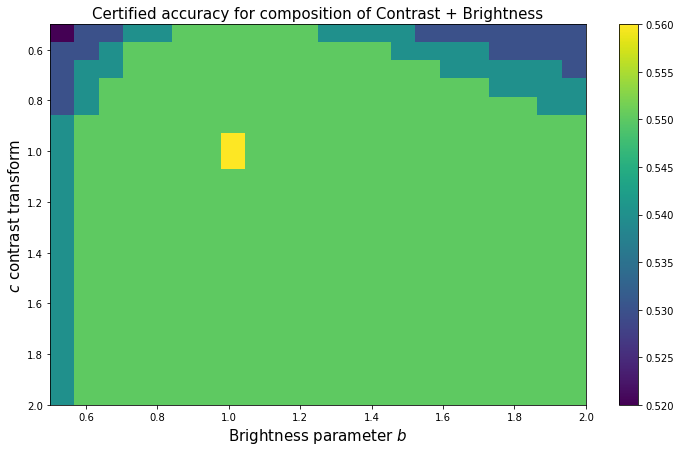

In [875]:
r11 = 0.5
r12 = 2.0
r21 = 0.5
r22 = 2.0
betas0 = np.linspace(r11, r12, 21) # Attack Raxdius
betas1 = np.linspace(r21, r22, 22)

betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1))))
accdf, clps, acc_d = make_accuracy_df_cb(betas = betas, hs = pas, correct = isOk, safe_beta = safe_beta, ifTSS = False, ifOURnew=True, extent = [r21, r22, r12,r11])




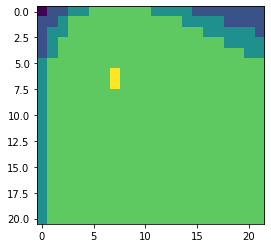

In [876]:
plt.imshow(accdf)

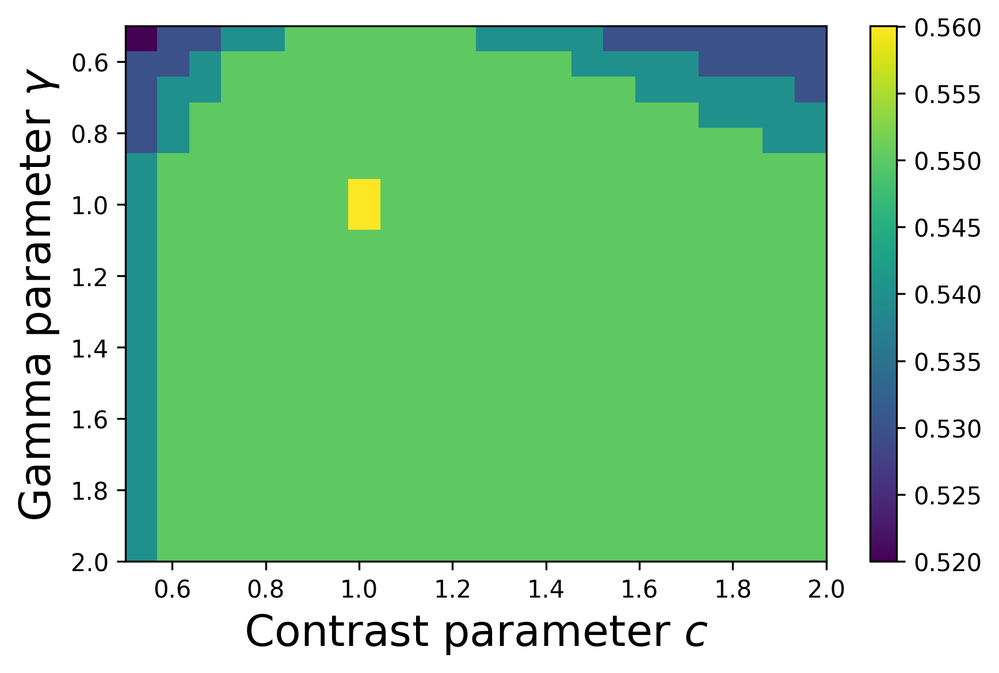

In [877]:
plt.figure(dpi=300)
plt.imshow(clps, extent = [r21, r22, r12,r11] , aspect='auto')
#plt.set_ylabel([1., 11.])
# plt.title('Certified accuracy for composition of Gamma+Contrast. Our', fontsize=15)
plt.xlabel(r'Contrast parameter $c$', fontsize=18)
plt.ylabel(r'Gamma parameter $\gamma$', fontsize=18)
plt.colorbar();
plt.tight_layout()
plt.savefig('./../results/GammaContrast1109.pdf')
plt.show()

In [884]:
# hlist = [0.5, 0.55, 0.555, 0.56, 0.57, 0.58, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65,0.68, 0.7, 0.72, 0.73,0.78,0.783, 0.79, 0.799, 0.8, 0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
# # hlist = np.linspace(0.8, 1, 300)
# hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# # cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
# cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
# print('Cert Acc GC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

In [883]:
min(list(acc_d.values()))

0.52

In [885]:
d = {}
# d['betas'] = list(betas)
# d['df'] = accdf_tss

# d['clps_tss'] = clps_tss
# d['acc_d'] = acc_d 
d['pas'] = list(pas)

d['isOk'] = list(map(int, list(isOk)))
d['paTSS'] = list(paTSS)
d['isOkTSS'] = list(map(int, list(isOkTSS)))

# pas, isOk, paTSS, isOkTSS

In [886]:
import json
with open('./../results/GC_final.json', 'w') as f:
      json.dump(d, f, ensure_ascii=False)

# Brightness + Translation

In [21]:
sigma_b = 0.4
sigma_tr = 30

In [22]:
def phi_bt_torch_batch_and_noise(x):
    
    sigma = sigma_b
    tau = sigma_tr
#     x = x.expand(nsamples, *x.shape)
    x = x.to(device)
    
    q = torch.randn(len(x)) * sigma
    q = q[:,None,None,None]
    x = x + q.to(device)
    
    c1 = (torch.randn(len(x)) * tau).long()*1.0
    c2 = (torch.randn(len(x)) * tau).long()*1.0
    
    c1 = c1[:, None, None, None]
    c2 = c2[:, None, None, None]

    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    out = kornia.geometry.transform.translate(x, T.float().to(device), padding_mode='reflection')
    return out

def attack_bt_torch(x, b):
    x = x.to(device) + torch.tensor(b[0].item())
    
    translation = torch.tensor([[b[1].item(), b[2].item()]]).to(device) #torch.tensor()

    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
#     print('Shape after attack', out.shape)
    return out



In [24]:
#Brightness + Translation
ns = 10000
x0 = jnp.array([1.0,3.0, 3.]) #additive
d = 3
b_zero = jnp.array([0., 0., 0.])
betas1 = jnp.linspace(-0.3, 0.3, 13)

betas2 = jnp.linspace(-60.0, 60.0, 19).astype(int) * 1.0
betas3 = jnp.linspace(-60.0, 60.0, 19).astype(int) * 1.0
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3)))) 

type_of_transform = 'bt'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)

z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape)) 

100%|██████████████████████████████████████| 4693/4693 [00:30<00:00, 154.37it/s]


(4693, 10000)
(4693,)
(10000,)


100%|███████████████████████████████████████| 4693/4693 [01:29<00:00, 52.29it/s]


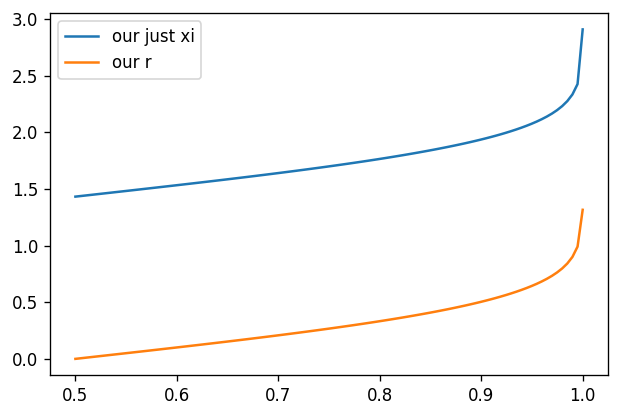

In [25]:
xs = np.linspace(0.5,1-1e-4,100)
r_our = lambda h: -xi(1-h)+xi(0.5)
# r_tss_bc= lambda h: 1/2*(xi(h) - xi(1-h))

plt.figure(dpi=120)
plt.plot(xs, xi(xs), label='our just xi')
plt.plot(xs,r_our(xs), label='our r')
# plt.plot(xs, r_tss_bc(xs), '--', label='tss')
# plt.yscale('log')
plt.legend()
plt.show()


In [ ]:

# checkpoint = torch.load('ReportResults/gcNEWContrastBrightTrans_08_08_50_checkpoint.pth.tar')

In [30]:
checkpoint = torch.load('/workspace/raid/data/dkorzh/TSS_FINAL_VERSION/ReportResults/BrightTrans_08_408_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [31]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

100%|█████████████████████████████████████████| 100/100 [00:04<00:00, 24.46it/s]

0.68


In [32]:
betas0 = np.linspace(-0.2, .2, 5) # Attack Raxdius
betas1 = np.linspace(-56, 56, 7)
betas2 = np.linspace(-56, 56, 7)
attack = attack_bt_torch
betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1, betas2))))
era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_83882/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [01:50<00:00,  1.10s/it]

tensor(0.3300)


In [33]:
print(era)

tensor(0.3300)


In [ ]:
betas0 = np.linspace(-0.2, .2, 2) # Attack Raxdius
betas1 = np.linspace(-56, 56, 2)
betas2 = np.linspace(-56, 56, 2)
attack = attack_bt_torch
betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1, betas2))))



attack = attack_bt_torch
Phi = phi_bt_torch_batch_and_noise
era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)

In [45]:
print(era_smoothed)

tensor(0.4100)


In [39]:
betas1 = jnp.linspace(-0.2, 0.2, 13)

betas2 = jnp.linspace(-56.0,56.0, 19).astype(int) * 1.0
betas3 = jnp.linspace(-56.0, 56.0, 19).astype(int) * 1.0
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3)))) 

In [40]:
def make_accuracy_df_3D_to_2D_trans(betas, hs, correct, safe_beta = safe_beta,
                                    ifTSS = False, ifOURnew=False, extent = [0, 80.0, -0.2, 0.2], name = 'Certified accuracy for composition of Brightness+Translation'):
    beta_d = {'b': list(), 't1':list(), 't2':list()}
    accuracy = np.zeros(len(betas))

    for i, beta in enumerate(tqdm(betas)):
        beta_d['b'].append(beta[0])
        beta_d['t1'].append(beta[1])
        beta_d['t2'].append(beta[2])
        
        if ifOURnew:
            for h1, isOk in zip(hs, correct):
                accuracy[i] += (safe_beta(xi, h1, hatg_int, (beta[0],beta[1], beta[1])).item() * isOk) #, beta[2]
        elif ifTSS:
            for h1, isOk in zip(hs, correct):
                accuracy[i] += (safe_beta(xi_tss, h1, [*beta]).item() * isOk) #, beta[2]

        accuracy[i] /= len(correct)

    
    tn = []
    bs = []
    accs = []
    all_params = []

    for i, (b, t1, t2) in enumerate(zip(beta_d['b'], beta_d['t1'], beta_d['t2'])):
        t_norm = jnp.linalg.norm([t1, t2]).item()
        b_ = b.item()
        tn.append(t_norm)
        bs.append(b_)
        accs.append(accuracy[i])


    tns = []
    bss = []
    acc_d = {}
    for x,y,z in zip(tn, bs, accs):
        if not x in tns:
            tns.append(x)
        if not y in bss:
            bss.append(y)
        acc_d[x,y] = z
        
    accdf = pd.DataFrame(data = jnp.array(list(acc_d.values())).reshape(len(bss), len(tns)), index=bss, columns=tns)
    accdf = accdf.reindex(sorted(accdf.columns), axis=1)
    clps = []
    for x in accdf.values:
        z = (np.asarray(list(map(np.array, x))))
        clps.append(z)

    plt.figure(figsize=(12,7))
    plt.imshow(clps, extent=extent, aspect='auto')
    #plt.set_ylabel([1., 11.])
    plt.title(name, fontsize=15)
    plt.xlabel(r'||v|| of translation parameter v', fontsize=15)
    plt.ylabel(r'$b$ brightness transform', fontsize=15)
    plt.colorbar();
    if ifOURnew:
        plt.savefig(dirname+'bt_our.png')
    else:
        plt.savefig(dirname+'bt_tss.png')
    return accdf, clps, acc_d

In [41]:
Phi = phi_bt_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=128, adaptive=adaptive)

100%|█████████████████████████████████████████| 100/100 [05:11<00:00,  3.11s/it]


In [51]:
# hlist = [0.8, 0.913, 0.92, 0.925, 0.95, 0.96,0.965, 0.97, 0.98, 0.99]
hlist = np.linspace(0, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
# cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc BT our', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|███████████████████████████████████████████| 8/8 [00:00<00:00, 1117.81it/s]

Cert Acc BT our 0.31 h_min is 0.9163879598662207


In [43]:
isOk.mean()

0.68

In [46]:
def safe_beta_tss_bt(xi, h, beta, sigma=sigma_b, tau=sigma_tr):
    
    l1 = (beta[0]/sigma)**2
    l2 = (beta[1]/tau)**2
    l3 = (beta[2]/tau)**2
    l = np.sqrt(l1+l2+l3)
    r = 1/2*(xi(h) - xi(1-h))
    
    return l<=r

In [50]:
# # hlist = [0.5, 0.6, 0.63, 0.65, 0.66, 0.67, 0.68, 0.7, 0.8, 0.9, 0.92, 0.995, 0.99555,0.9965, 0.997, 0.999, 0.99999999999999]
# hlist = np.linspace(0, 1, 300)
# hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=xi_tss, safe_beta_tss=safe_beta_tss_bt)
# cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
# print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

In [ ]:
accdf, clps, acc_d = make_accuracy_df_3D_to_2D_trans(betas = betas, hs = pas, correct = isOk, safe_beta = safe_beta, ifTSS = False, ifOURnew=True)

In [ ]:
min(list(acc_d.values()))

In [ ]:
accdf_tss, clps_tss, acc_d_tss = make_accuracy_df_3D_to_2D_trans(betas = betas, hs = paTSS, correct = isOkTSS, safe_beta = safe_beta_tss_bt, ifTSS = True, ifOURnew=False)

In [ ]:
min(list(acc_d_tss.values()))

In [ ]:
d = {}
# d['betas'] = list(betas)
# d['df'] = accdf_tss

# d['clps_tss'] = clps_tss
# d['acc_d'] = acc_d 
d['pas'] = list(pas)

d['isOk'] = list(map(int, list(isOk)))
d['paTSS'] = list(paTSS)
d['isOkTSS'] = list(map(int, list(isOkTSS)))

# pas, isOk, paTSS, isOkTSS

import json


In [904]:
with open('/workspace/raid/data/dkorzh/TSS_FINAL_VERSION/ReportResults/BT_final.json', 'r') as f:
      d= json.load(f)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

# Contrast + Translation

In [ ]:
sigma_c = 0.8
sigma_tr =30


In [ ]:
def attack_ct_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    translation = torch.tensor([[b[1].item(), b[2].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out


def phi_ct_torch_batch_and_noise(x): #trans bright blur contrast
    
    
    x = x.to(device)
    contr = (torch.randn(len(x)) * sigma_c)[:, None, None, None].to(device)
    x = contr * x
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    
    out = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    return out

In [ ]:
ns = 100000
x0 = jnp.array([1.1,0.3]) # WHATEVER 
d = 3
b_zero = jnp.array([1.0, 0.0, 0.0])

betas1 = jnp.linspace(0.4, 2.2, 12) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-60, 60, 17)
betas3 = jnp.linspace(-60, 60, 17)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3)))) 

type_of_transform = 'ct'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)

z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape)) 

In [ ]:
xs = np.linspace(0.5,1-1e-4,100)
r_our = lambda h: -xi(1-h)+xi(0.5)
# r_tss_bc= lambda h: 1/2*(xi(h) - xi(1-h))

In [ ]:
plt.figure(dpi=120)
plt.plot(xs, xi(xs), label='our just xi')
plt.plot(xs, r_our(xs), label='our r')
# plt.plot(xs, r_tss_bc(xs), '--', label='tss')
# plt.yscale('log')
plt.legend()
plt.show()


In [ ]:
checkpoint = torch.load('ReportResults/ContrasttTrans_08_40_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet').to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [ ]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

In [ ]:
# betas0 = np.linspace(0.5, 2, 3) # Attack Raxdius
# betas1 = np.linspace(-56, 56, 3)
# betas2 = np.linspace(-56, 56, 3)

betas1 = jnp.linspace(0.8, 1.2, 10) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-25, 25, 11)
betas3 = jnp.linspace(-25, 25, 11)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3))))


attack = attack_ct_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

In [ ]:
print(era)

In [ ]:
# betas0 = np.linspace(0.5, 2.0, 2) # Attack Raxdius
# betas1 = np.linspace(-56, 56, 2)
# betas2 = np.linspace(-56, 56, 2)
# betas = np.asarray(list(map(np.array, itertools.product(betas0, betas1, betas2))))

betas1 = jnp.linspace(0.8, 1.2, 10) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-25, 25, 11)
betas3 = jnp.linspace(-25, 25, 11)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3))))



attack = attack_ct_torch
Phi = phi_ct_torch_batch_and_noise
era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)

In [ ]:
print(era_smoothed)

In [ ]:
Phi = phi_ct_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=128, adaptive=adaptive)

In [ ]:
hlist = [0.8, 0.913, 0.92, 0.925, 0.95, 0.96,0.965, 0.97, 0.98, 0.99]
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
print('Cert Acc CT our', cert_acc_within_betas_bounds, 'h_min is', hmin)

In [ ]:
isOk.mean()

In [ ]:
betas1 = jnp.linspace(0.8, 1.2, 10) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-25, 25, 11)
betas3 = jnp.linspace(-25, 25, 11)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3))))


accdf, clps, acc_d = make_accuracy_df_3D_to_2D_trans(betas = betas, hs = pas, correct = isOk, safe_beta = safe_beta, ifTSS = False, ifOURnew=True)

In [ ]:
hlist = [0.7,0.735, 0.74, 0.75, 0.8, 0.913, 0.92, 0.925, 0.95, 0.96,0.965, 0.97, 0.98, 0.99]
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
print('Cert Acc CT our', cert_acc_within_betas_bounds, 'h_min is', hmin)

In [ ]:
min(list(acc_d.values()))

In [ ]:
checkpoint = torch.load('ReportResults/TBBC_40_08_sqrt(30)_08_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet').to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [ ]:
def attack_ct_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    translation = torch.tensor([[b[1].item(), b[2].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out

def phi_ct_torch_batch_and_noise(x, sigma_tr =sigma_tr, sigma_c = sigma_c): #trans bright blur contrast
    
    
    x = x.to(device)
    contr = torch.exp(torch.randn(len(x)) * sigma_c)[:, None, None, None].to(device)
    x = contr * x
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    
    out = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    return out

In [ ]:
ns = 10000
x0 = jnp.array([0.0,0.0, 3.])
d = 3
b_zero = jnp.array([1.0, 0.0, 0.0])

betas1 = jnp.linspace(0.4, 2.1, 16)
betas2 = jnp.linspace(-60.0, 60.0, 12).astype(int) * 1.0 # set more steps
betas3 = jnp.linspace(-60.0, 60.0, 12).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3)))) 

type_of_transform = 'ct'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
# z = csaps([betas1, betas2 ,betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape))

z = csaps([betas1, betas2, betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))


# z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))

hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape)) 



In [ ]:
betas1 = jnp.linspace(0.5, 2.0, 12)
betas2 = jnp.linspace(-56.0, 56.0, 8).astype(int) * 1.0 # set more steps
betas3 = jnp.linspace(-56.0, 56.0, 8).astype(int) * 1.0
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3)))) 

In [ ]:
betas_0 = np.array([1.5, 30, 40])
image_attacked = attack_ct_torch(image, betas_0)
imshow(image_attacked)

In [ ]:
attack = attack_ct_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

In [ ]:
Phi = phi_tr_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)





In [ ]:
isOk.mean()

In [ ]:
def make_accuracy_df_3D_to_2D_trans(betas, hs, correct, hatg_int, safe_beta = safe_beta,
                                    ifTSS = False, ifOURnew=False, extent = [0, 80.0, 0.5, 2.0], name = 'Certified accuracy for composition of Contrast and Translation'):
    beta_d = {'c': list(), 't1':list(), 't2':list()}
    accuracy = np.zeros(len(betas))

    for i, beta in enumerate(tqdm(betas)):
        beta_d['c'].append(beta[0])
        beta_d['t1'].append(beta[1])
        beta_d['t2'].append(beta[2])
        
        if ifOURnew:
            for h1, isOk in zip(hs, correct):
                accuracy[i] += (safe_beta(xi, h1, hatg_int, (beta[0],beta[1], beta[1])).item() * isOk) #, beta[2]
        elif ifTSS:
            for h1, isOk in zip(hs, correct):
                accuracy[i] += (safe_beta(xi_tss, h1, [*beta]).item() * isOk) #, beta[2]

        accuracy[i] /= len(correct)

    
    tn = []
    cs = []
    accs = []
    all_params = []

    for i, (c, t1, t2) in enumerate(zip(beta_d['c'], beta_d['t1'], beta_d['t2'])):
        t_norm = jnp.linalg.norm([t1, t2]).item()
        c_ = c.item()
        tn.append(t_norm)
        cs.append(c_)
        accs.append(accuracy[i])


    tns = []
    css = []
    acc_d = {}
    for x,y,z in zip(tn, cs, accs):
        if not x in tns:
            tns.append(x)
        if not y in css:
            css.append(y)
        acc_d[x,y] = z
        
    accdf = pd.DataFrame(data = jnp.array(list(acc_d.values())).reshape(len(css), len(tns)), index=css, columns=tns)
    accdf = accdf.reindex(sorted(accdf.columns), axis=1)
    clps = []
    for x in accdf.values:
        z = (np.asarray(list(map(np.array, x))))
        clps.append(z)

    plt.figure(figsize=(12,7))
    plt.imshow(clps, extent=extent, aspect='auto')
    #plt.set_ylabel([1., 11.])
    plt.title(name, fontsize=15)
    plt.xlabel(r'||v|| of translation parameter v', fontsize=15)
    plt.ylabel(r'$b$ contrast transform', fontsize=15)
    plt.colorbar();
    if ifOURnew:
        plt.savefig(dirname+'ct_our.png')
    else:
        plt.savefig(dirname+'ct_tss.png')
    return accdf, clps, acc_d

In [ ]:
accdf, clps, acc_d = make_accuracy_df_3D_to_2D_trans(betas, pas, isOk, hatg_int, safe_beta = safe_beta, ifTSS = False, ifOURnew=True, extent = [0, 80.0, 0.5, 2.0])





In [ ]:
min(list(acc_d.values()))

# Contrast + Brightnest + Translation. V2. Smaller Params

In [ ]:
sigma_tr = 30
sigma_c = 0.4
sigma_b = 0.4


In [ ]:
checkpoint = torch.load('ReportResults/TBBC_40_08_sqrt(30)_08_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet').to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [ ]:
def attack_cbt_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    x = x + torch.tensor(b[1].item())
    translation = torch.tensor([[b[2].item(), b[3].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out



def phi_cbt_torch_batch_and_noise(x): #trans bright blur contrast
    
    
    x = x.to(device)
    
    contr = (torch.randn(len(x)) * sigma_c)[:, None, None, None].to(device)
    x = contr * x
    b = (torch.randn(len(x)) * sigma_b)[:, None, None, None].to(device)
    x = x + b
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    
    out = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    return out

In [ ]:
ns = 10000
x0 = jnp.array([0.0,0.0, 3., 3.0])
d = 4
b_zero = jnp.array([1.0, 0.0, 0.0, 0.0])

betas1 = jnp.linspace(0.7, 1.6, 9)
betas2 = jnp.linspace(-0.3, 0.3, 9)
betas3 = jnp.linspace(-30.0, 30.0, 9).astype(int) * 1.0 # set more steps
betas4 = jnp.linspace(-30.0, 30.0, 9).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4)))) 

type_of_transform = 'cbt'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
# z = csaps([betas1, betas2 ,betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape))

z = csaps([betas1, betas2, betas3, betas4], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape))


# z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))

hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3, betas4 ], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape)) 



In [ ]:

betas1 = jnp.linspace(0.8, 1.5, 5)
betas2 = jnp.linspace(-0.2, 0.2, 5)
betas3 = jnp.linspace(-25.0, 25.0, 5).astype(int) * 1.0 # set more steps
betas4 = jnp.linspace(-25.0, 25.0, 5).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4)))) 


# image_attacked = attack_ct_torch(im, [*betas[10]])
# imshow(image_attacked)

attack = attack_cbt_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

In [ ]:
print(era)

In [ ]:
Phi = phi_cbt_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)





In [ ]:
isOk.mean()

In [ ]:
hlist = [0.5, 0.6, 0.7,0.73,0.78,0.783, 0.79, 0.8,0.84,0.87, 0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc TBBC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

# Contrast + Brightnest + Translation

In [ ]:
sigma_tr =50
sigma_c = 0.8
sigma_b = 0.8

In [ ]:
checkpoint = torch.load('ReportResults/TBBC_40_08_sqrt(30)_08_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet').to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [ ]:
def attack_cbt_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    x = x + torch.tensor(b[1].item())
    translation = torch.tensor([[b[2].item(), b[3].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out



def phi_cbt_torch_batch_and_noise(x): #trans bright blur contrast
    
    
    x = x.to(device)
    
    contr = (torch.randn(len(x)) * sigma_c)[:, None, None, None].to(device)
    x = contr * x
    b = (torch.randn(len(x)) * sigma_b)[:, None, None, None].to(device)
    x = x + b
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    
    out = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    return out

In [ ]:
ns = 10000
x0 = jnp.array([0.0,0.0, 3.])
d = 4
b_zero = jnp.array([1.0, 0.0, 0.0, 0.0])

betas1 = jnp.linspace(0.7, 1.6, 5)
betas2 = jnp.linspace(-0.3, 0.3, 5)
betas3 = jnp.linspace(-30.0, 30.0, 7).astype(int) * 1.0 # set more steps
betas4 = jnp.linspace(-30.0, 30.0, 7).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4)))) 

type_of_transform = 'cbt'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
# z = csaps([betas1, betas2 ,betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape))

z = csaps([betas1, betas2, betas3, betas4], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape))


# z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))

hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3, betas4 ], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape)) 



In [ ]:

betas1 = jnp.linspace(0.8, 1.5, 2)
betas2 = jnp.linspace(-0.2, 0.2, 2)
betas3 = jnp.linspace(-25.0, 25.0, 2).astype(int) * 1.0 # set more steps
betas4 = jnp.linspace(-25.0, 25.0, 2).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4)))) 


# image_attacked = attack_ct_torch(im, [*betas[10]])
# imshow(image_attacked)

attack = attack_cbt_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

In [ ]:
print(era)

In [ ]:
Phi = phi_cbt_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=n0, maxn=maxn, alpha=alpha, batch_size=256, adaptive=adaptive)





In [ ]:
isOk.mean()

In [ ]:
hlist = [0.5, 0.6, 0.7,0.73,0.78,0.783, 0.79, 0.8, 0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc TBBC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

# Translation

In [783]:
sigma_tr = 50

In [23]:
checkpoint = torch.load('ReportResults/TBBC_40_08_sqrt(30)_08_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet').to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [24]:
def attack_tr_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    translation = torch.tensor([[b[0].item(), b[1].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out



def phi_tr_torch_batch_and_noise(x): #trans bright blur contrast
    x = x.to(device)
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    
    out = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    return out

In [785]:
ns = 10000
x0 = jnp.array([0.0,0.0]) #additive
d = 2
b_zero = jnp.array([0.0, 0.0])
# betas1 = jnp.linspace(0., 60.0, 20).astype(int) * 1.0 # set more steps
betas1 = jnp.linspace(-60.0, 60.0, 40).astype(int) * 1.0 # set more steps
betas2 = jnp.linspace(-60.0, 60.0, 40).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2)))) 

type_of_transform = 'tr'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
# z = csaps([betas1, betas2 ,betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape))

z = csaps([betas1, betas2], g.reshape(*betas1.shape, *betas2.shape))


# z = csaps([betas1, betas2 ,betas3], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape))

hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2], hat_g.reshape(*betas1.shape, *betas2.shape)) 



100%|██████████████████████████████████████| 1600/1600 [00:08<00:00, 182.81it/s]


(1600, 10000)
(1600,)
(10000,)


100%|███████████████████████████████████████| 1600/1600 [00:19<00:00, 80.29it/s]


In [789]:
sigma = 20.0
b_zero = torch.tensor([0, 0])
unit_vector = torch.randn(b_zero.shape[0]) * sigma
unit_vector = unit_vector / torch.sqrt(unit_vector @ unit_vector)
print(unit_vector @ unit_vector)
attack_vector = b_zero + unit_vector * sigma
print(unit_vector)
print(attack_vector)

tensor(1.)
tensor([0.9496, 0.3135])
tensor([18.9920,  6.2693])


In [790]:
res = []
for i in tqdm(range(1000)):
    unit_vector = torch.randn(b_zero.shape[0]) * sigma
    unit_vector = unit_vector / torch.sqrt(unit_vector @ unit_vector)
    attack_vector = jnp.array(b_zero + unit_vector * sigma)
    r = hatg_int([*attack_vector]).item()
    res.append(r)
    

100%|███████████████████████████████████████| 1000/1000 [00:18<00:00, 54.31it/s]


In [791]:
attack_vector

Array([ -1.1860167, -19.964804 ], dtype=float32)

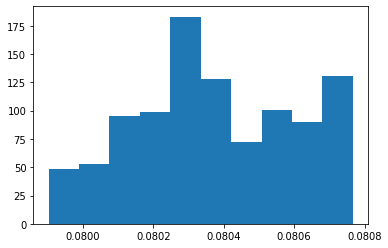

In [792]:
plt.hist(res)
plt.show()

In [26]:
betas1 = jnp.linspace(-56.0, 56.0, 15).astype(int) * 1.0 # set more steps
betas2 = jnp.linspace(-56.0, 56.0, 15).astype(int) * 1.0

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2)))) 


In [ ]:
attack = attack_tr_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

/tmp/ipykernel_565142/1667309012.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for k, (images, labels) in enumerate(tqdm_notebook(loader)):


  0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipykernel_565142/1667309012.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)


In [ ]:
print(era)

In [27]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

/tmp/ipykernel_567223/2576819265.py:32: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for k, (images, labels) in enumerate(tqdm_notebook(loader)):


  0%|          | 0/100 [00:00<?, ?it/s]

0.67


In [28]:
Phi = phi_tr_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model = model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=3000, alpha=1e-3, batch_size=256, adaptive=False)


/tmp/ipykernel_567223/2576819265.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for k, (image, label) in enumerate(tqdm_notebook(loader)):


  0%|          | 0/100 [00:00<?, ?it/s]

In [31]:
hlist = [0.5, 0.6, 0.7, 0.8, 0.83, 0.85,0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc TBBC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|███████████████████████████████████████| 225/225 [00:00<00:00, 2014.14it/s]

Cert Acc TBBC our 0.39 h_min is 0.8


In [32]:
xi_tss = scipy.stats.norm.ppf

def safe_beta_tss_tr(xi, h, beta, tau=sigma_tr):
    
    l1 = (beta[0]/tau)**2
    l2 = (beta[1]/tau)**2
    l = np.sqrt(l1+l2)
    r = 1/2*(xi(h) - xi(1-h))
    
    return l<=r

In [33]:
hlist = [0.5, 0.6, 0.63, 0.65, 0.66, 0.67, 0.68, 0.7, 0.8, 0.9, 0.92, 0.995, 0.99555,0.9965, 0.997, 0.999, 0.99999999999999]
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=xi_tss, safe_beta_tss=safe_beta_tss_tr)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|████████████████████████████████████████| 225/225 [00:00<00:00, 808.51it/s]

Cert Acc CB TSS 0.12 h_min is 0.995


In [ ]:
hatg_int([*betas[0]])

In [ ]:
 make_accuracy_df_3D_to_2D_trans(betas, hs, correct, hatg_int, safe_beta = safe_beta,
                                    ifTSS = False, ifOURnew=False, extent = [0, 80.0, 0.5, 2.0], name = 'Certified accuracy for composition of Contrast and Translation'):

In [ ]:
xi

In [35]:
def make_accuracy_df_cb(betas, hs, correct,hatg_int, safe_beta, ifTSS = False, ifOURnew=False, extent = None ):
    beta_d = {'c': list(), 'b':list()} #, 't2':list()
    accuracy = np.zeros(len(betas))

    for i, beta in enumerate(tqdm(betas)):
        beta_d['c'].append(beta[0])
        beta_d['b'].append(beta[1])

        if ifOURnew:
            for h1, isOk in zip(hs, correct):
                accuracy[i] += (safe_beta(xi, h1, hatg_int, (beta[0],beta[1])).item() * isOk) 
        elif ifTSS:
            for h1, isOk in zip(hs, correct):
#                 print(safe_beta(xi_tss, h1, (beta[0],beta[1])))
                accuracy[i] += (safe_beta(xi_tss, h1, (beta[0],beta[1])).item() * isOk) #, beta[2]

        accuracy[i] /= len(correct)
        #break
        
        
    cs = []
    bs = []
    accs = []
    all_params = []

    for i, (c, b) in enumerate(zip(beta_d['c'], beta_d['b'])):
        cs.append(c.item())
        b_ = b.item()
        bs.append(b_)
        accs.append(accuracy[i])

    css = []
    bss = []
    acc_d = {}
    for x,y,z in zip(cs, bs, accs):
        if not x in css:
            css.append(x)
        if not y in bss:
            bss.append(y)
        acc_d[x,y] = z
        
    accdf = pd.DataFrame(data = jnp.array(list(acc_d.values())).reshape(len(css), len(bss)), index=css, columns=bss)
    accdf = accdf.reindex(sorted(accdf.columns), axis=1)
    clps = []
    for x in accdf.values:
        z = (np.asarray(list(map(np.array, x))))
        clps.append(z)

    plt.figure(figsize=(12,7))
    plt.imshow(clps, extent=extent, aspect='auto')
    plt.title('Certified accuracy for composition of Contrast + Brightness', fontsize=15)
    plt.xlabel(r'Brightness parameter $b$', fontsize=15)
    plt.ylabel(r'$c$ contrast transform', fontsize=15)
    plt.colorbar();
    plt.show()

    return accdf, clps, acc_d

100%|█████████████████████████████████████████| 225/225 [01:14<00:00,  3.03it/s]


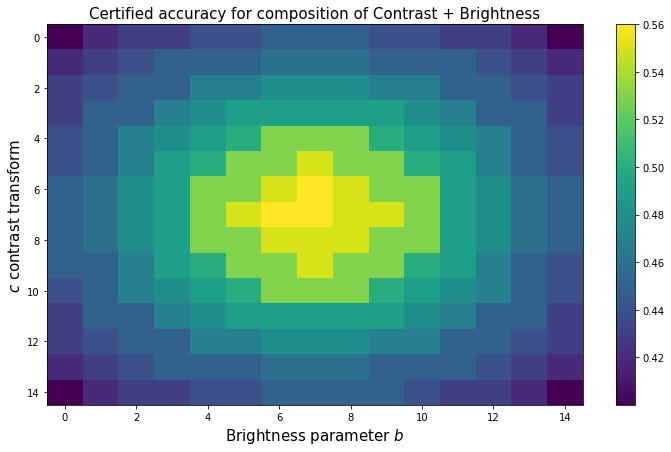

In [36]:
accdf, clps, acc_d = make_accuracy_df_cb(betas = betas, hs = pas, hatg_int = hatg_int, correct = isOk, safe_beta = safe_beta, ifTSS = False, ifOURnew=True)

In [37]:
min(list(acc_d.values()))

0.4

100%|█████████████████████████████████████████| 225/225 [01:23<00:00,  2.70it/s]


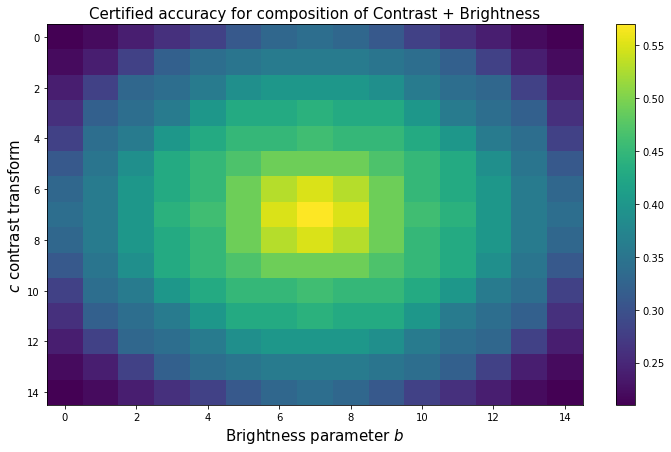

In [39]:
accdf_tss, clps_tss, acc_d_tss = make_accuracy_df_cb(betas = betas, hs = pas, hatg_int = hatg_int, correct = isOk, safe_beta = safe_beta_tss_tr, ifTSS = True, ifOURnew=False)

In [40]:
min(list(acc_d_tss.values()))

0.21

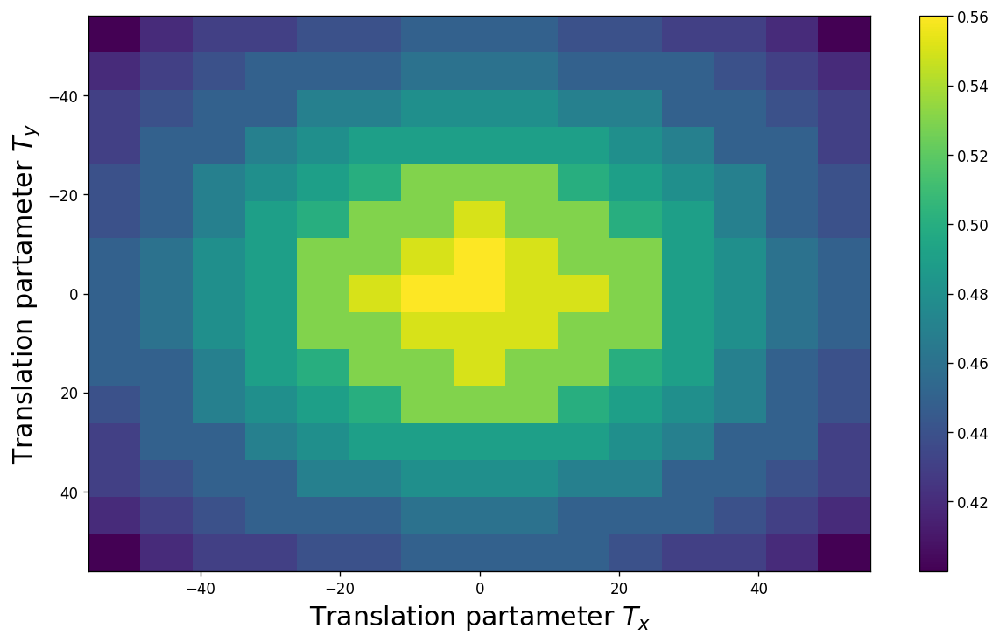

In [41]:
plt.figure(figsize=(12,7), dpi=120)
plt.imshow(clps, extent=[-56, 56, 56, -56], aspect='auto')
#plt.set_ylabel([1., 11.])
# plt.title('Certified accuracy for composition of Gamma+Contrast. Our', fontsize=15)
plt.xlabel(r'Translation partameter $T_x$', fontsize=18)
plt.ylabel(r'Translation partameter $T_y$', fontsize=18)
plt.colorbar();
plt.savefig(dirname+'Translation.pdf')
plt.show()

# TRANS BLUR BRIGHT CONTRAST

In [397]:
sigma_tr = 30
sigma_blur = 4
sigma_b = 0.8
sigma_c = 0.8

(array([  6.,  13.,  57., 116., 195., 250., 198.,  98.,  47.,  20.]),
 array([-3.2075    , -2.608904  , -2.010308  , -1.4117119 , -0.81311595,
        -0.21451998,  0.38407603,  0.98267204,  1.5812681 ,  2.179864  ,
         2.77846   ], dtype=float32),
 <BarContainer object of 10 artists>)

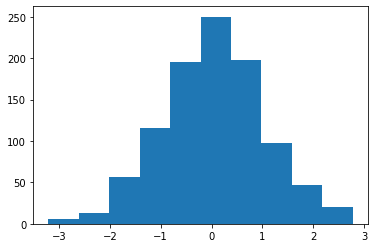

In [398]:
ns = torch.randn(1000).numpy()
plt.hist(ns)

In [399]:
# plt.hist(np.array(sigma_blur*norm_to_exp(ns, 1)))

(array([688., 228.,  52.,  17.,  11.,   1.,   0.,   1.,   1.,   1.]),
 array([ 0.07969369,  1.4960752 ,  2.9124565 ,  4.328838  ,  5.7452197 ,
         7.161601  ,  8.577983  ,  9.994364  , 11.410746  , 12.8271265 ,
        14.243508  ], dtype=float32),
 <BarContainer object of 10 artists>)

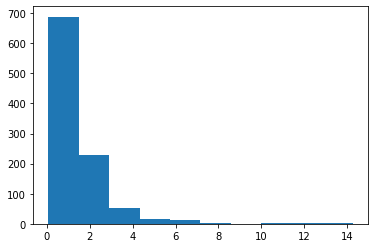

In [400]:
plt.hist(torch.exp(sigma_c*torch.randn(1000)).numpy())

In [401]:
ns = 10000
x0 = jnp.array([1.0,3.0, 3., 1, 1.1]) # WHATEVER 
d = 5
b_zero = jnp.array([0.0, 0.0, 0.0,0.0, 1.0])

betas1 = jnp.linspace(-5, 5, 5) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-5, 5, 5)
betas3 = jnp.linspace(0, 3, 6)
betas4 = jnp.linspace(-0.2, 0.2, 5)
betas5 = jnp.linspace(0.9, 1.1, 5)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 



type_of_transform = 'tbbc_ray'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)


100%|███████████████████████████████████████| 3750/3750 [06:28<00:00,  9.65it/s]


In [402]:
z = csaps([betas1, betas2, betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3, betas4, betas5], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape)) #intterpolation of Integral g(beta)

100%|███████████████████████████████████████| 3750/3750 [06:22<00:00,  9.81it/s]


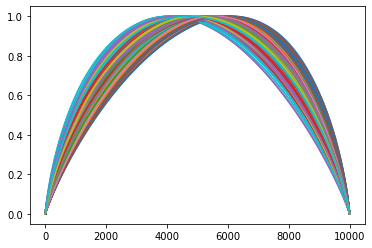

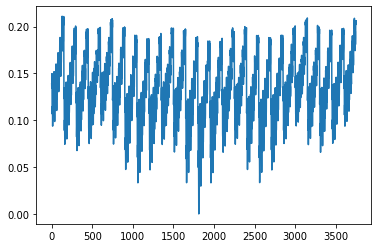

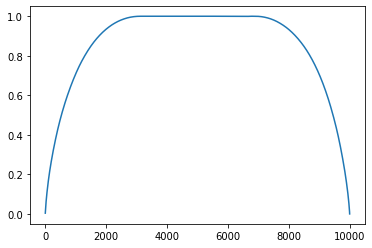

In [411]:
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

In [412]:
import cv2 
import math

class Gaussian:
    # it adopts uniform distribution
    def __init__(self, sigma):
        self.sigma = sigma
        self.sigma2 = sigma ** 2.0

    def gen_param(self):
        r = random.uniform(0.0, self.sigma2)
        return r

    def proc(self, input, r2):
        if (abs(r2) < 1e-6):
            return input
        input = input.cpu().numpy()
        out = cv2.GaussianBlur(input.transpose(1, 2, 0), (0, 0), math.sqrt(r2), borderType=cv2.BORDER_REFLECT101)
        if out.ndim == 2:
            out = np.expand_dims(out, 2)
        out = torch.from_numpy(out.transpose(2, 0, 1))
        return out #.cuda()
    
    def proc_new(self, input, r2):
        if (abs(r2) < 1e-6):
            return input
#         print(input.shape)
        input = input.cpu().numpy()
#         print(input.shape)
        out = cv2.GaussianBlur(input.transpose(1, 2, 0), (0, 0), math.sqrt(r2), borderType=cv2.BORDER_REFLECT101)
        if out.ndim == 2:
            out = np.expand_dims(out, 2)
        out = torch.from_numpy(out.transpose(2, 0, 1))
        
        return out #.cuda()

    def batch_proc(self, inputs):
        outs = torch.zeros_like(inputs)
        for i in range(len(inputs)):
            outs[i] = self.proc(inputs[i], self.gen_param())
        return outs
    
class ExpGaussian(Gaussian):
    # it adopts exponential distribution
    # where the sigma is actually lambda in exponential distribution Exp(1/lambda)
    def __init__(self, sigma):
        super(ExpGaussian, self).__init__(sigma)
        self.sigma = sigma

    def gen_param(self):
#         r = - self.sigma * math.log(random.uniform(0.0, 1.0))
        r = np.random.exponential(scale=self.sigma)
        r = r#.to(device)
        return r
    
class RayGaussian(Gaussian):
    # it adopts exponential distribution
    # where the sigma is actually lambda in exponential distribution Exp(1/lambda)
    def __init__(self, sigma):
        super(RayGaussian, self).__init__(sigma)
        self.sigma = sigma

    def gen_param(self):
#         r = - self.sigma * math.log(random.uniform(0.0, 1.0))
        r = np.random.rayleigh(scale=self.sigma)
        return r

In [413]:
def norm_to_exp_torch(s, lam):
    norm1 = torch.randn(s)
    norm2 = torch.randn(s)
    norm3 = torch.randn(s)
    norm4 = torch.randn(s)
    return torch.abs(norm1 * norm2 - norm3 * norm4) / lam
    

In [414]:
import cv2

def attack_blur_cv2(x, b):
    r = b 
    input = x[0].cpu().numpy()
    r = r.item()
    out = cv2.GaussianBlur(input.transpose(1, 2, 0), (0, 0), np.sqrt(r), borderType=cv2.BORDER_REFLECT101)
    out = torch.from_numpy(out.transpose(2, 0, 1))
    return out[None, :].to(device)
    

def phi_blur_torch_batch_and_noise(x, sigma_blur = sigma_blur):
    
    if not exp_smoothing:
        norm1 = torch.randn(len(x))
        norm2 = torch.randn(len(x))
        ray = torch.sqrt(norm1**2 + norm2**2)
        exp = ray ** 2
        blur_radii = sigma_blur * exp
    else:
        blur_radii = norm_to_exp_torch(len(x), sigma_blur)

#     blur_radii = sigma_blur * norm_to_exp_torch(torch.randn(len(x)))
    for i in range(len(x)):
        x[i] = attack_blur_cv2(x[i][None, :], blur_radii[i])
    return x.to(device)

In [415]:
def attack_tbbc_torch(x, b):  # tr bl br c

    x = x.to(device)
    translation = torch.tensor([[b[0].item(), b[1].item()]]).to(torch.float).to(device) 
    x = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    x = attack_blur_cv2(x, b = b[2])
    x = x + torch.tensor(b[3].item())
    x = torch.tensor(b[4].item())*x
    return x



def phi_tbbc_torch_batch_and_noise(x): 
    x = x.to(device)
    
    c1 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    c2 = (torch.randn(len(x)) * sigma_tr).long()*1.0
    t = torch.tensor([1,0])
    T = t.expand(len(x), *t.shape).clone()
    T[:, 0] = c1.squeeze().clone()
    T[:, 1] = c2.squeeze().clone()
    x = kornia.geometry.transform.translate(x.to(device), T.float().to(device), padding_mode='reflection')
    
    x = phi_blur_torch_batch_and_noise(x)
#     if exp_smoothing:
#         blur = ExpGaussian(sigma_blur)
#     else:
#         blur = RayGaussian(sigma_blur)
#     x = blur.batch_proc(x)
    
    b = (torch.randn(len(x)) * sigma_b)[:, None, None, None].to(device)
    x = x + b
    
    c = torch.exp(torch.randn(len(x)) * sigma_c)[:, None, None, None].to(device)
    x = c * x
    
    return x

In [416]:
checkpoint = torch.load('../checkpoints/trans_blur_bright_contrast/TransBrightBlurContrast_40_04_10_04_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

In [417]:
exp_smoothing = False

In [418]:
betas1 = jnp.linspace(-3, 3, 3) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-3, 3, 3)
betas3 = jnp.linspace(1, 3, 3)
betas4 = jnp.linspace(-0.1, 0.1, 3)
betas5 = jnp.linspace(0.95, 1.05, 3)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 

In [419]:
attack = attack_tbbc_torch

era = ERA_Only_ND(model, dataloader100, attack =attack , device=device, PSN = betas)

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_46661/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [02:49<00:00,  1.70s/it]

tensor(0.5200)


In [420]:
print(era)

tensor(0.5200)


In [421]:
Accuracy(model, dataloader100, device)


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 46.44it/s]

0.65


array([[[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[False]],

       [[ True]],

       [[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[False]],

       [[ True]],

       [[False]],

       [[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[False]],

       [[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[False]],

       [[ True]],

       [[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[False]],

       [[False]],

       [[False]],

       [[ True]],

       [[ True]],

       [[ True]],

       [[ Tr

In [422]:
# betas1 = jnp.linspace(-12, 12, 5) ## set a bit larger range than you want to certify
# betas2 = jnp.linspace(-12, 12, 5)
# betas3 = jnp.linspace(0.01, 3, 5)
# betas4 = jnp.linspace(-0.3, 0.3, 5)
# betas5 = jnp.linspace(0.7, 1.3, 5)
# betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 

In [423]:
Phi = phi_tbbc_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=2000, alpha=1e-3, batch_size=256, adaptive=False)

100%|█████████████████████████████████████████| 100/100 [11:44<00:00,  7.04s/it]


In [424]:
isOk.mean()

0.64

(array([ 8., 11., 12., 11.,  9., 12.,  7.,  9.,  9., 12.]),
 array([0.03446065, 0.12887777, 0.22329488, 0.31771199, 0.41212911,
        0.50654622, 0.60096334, 0.69538045, 0.78979756, 0.88421468,
        0.97863179]),
 <BarContainer object of 10 artists>)

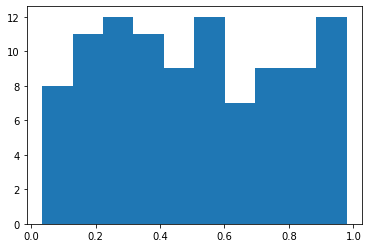

In [425]:
plt.hist(pas, bins=10)

In [426]:
xi(0.99)

array(1.47105409)

In [427]:
betas1 = jnp.linspace(-3, 3, 5) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-3, 3, 5)
betas3 = jnp.linspace(0, 3, 3)
betas4 = jnp.linspace(-0.1, 0.1, 5)
betas5 = jnp.linspace(0.95, 1.05, 5)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 

In [428]:
hlist = [0.5, 0.55, 0.555, 0.56, 0.57, 0.58, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65,0.68, 0.7, 0.72, 0.73,0.78,0.783, 0.79, 0.8, 0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
hlist = np.linspace(0.5, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
print('Cert Acc TBBC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|██████████████████████████████████████| 1875/1875 [00:09<00:00, 187.91it/s]

Cert Acc TBBC our 0.32 h_min is 0.5936454849498327


$\tilde{p}_A>1-\exp \left(-\lambda_B \alpha_B\right)\left(1-\Phi\left(\sqrt{\frac{\alpha_k^2}{\sigma_k^2}+\frac{\alpha_b^2}{e^{-2 \alpha_k} \sigma_b^2}+\frac{\alpha_{T x}^2+\alpha_{T y}^2}{\sigma_T^2}}\right)\right) .$

In [429]:
# sigma_b = 0.3
# sigma_c = 0.3
# sigma_tr = 10
# sigma_blur = 3
# safe_beta_tss(xi, h, [*beta]).item():
def safe_beta_tss_tbbc(xi, h, bs):
    Tx = bs[0]
    Ty = bs[1]
    B = bs[2]
    b = bs[3]
    k = np.log(bs[4])
    q = k**2/sigma_c**2 + b**2/(np.exp(-2*k) * sigma_b**2) + (Tx**2+Ty**2)/(sigma_tr**2)
    q = scipy.stats.norm.cdf(q)
    q = 1-q
    sb = 1  # sigma_blur
    q1 = np.exp(-B/sigma_blur)
    
    return h>(1-q1*q)
    
    

In [430]:
hlist = [0.5, 0.6, 0.63, 0.65, 0.66, 0.67, 0.68, 0.7, 0.73, 0.74, 0.75,0.8, 0.9, 0.92, 0.995, 0.99555,0.9965, 0.997, 0.999, 0.99999999999999]
hlist = np.linspace(0.5, 1, 300)
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=xi_tss, safe_beta_tss=safe_beta_tss_tbbc)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|██████████████████████████████████████| 1875/1875 [00:02<00:00, 839.11it/s]

Cert Acc CB TSS 0.32 h_min is 0.7725752508361203


In [431]:
def safe_beta(xi, h, hat_g, beta): # for certification
    print(hat_g(beta))
    print(-xi(1-h)+xi(0.5))
    return hat_g(beta) <= -xi(1-h)+xi(0.5)

In [432]:
safe_beta(xi = xi, h=0.9, hat_g = hatg_int, beta = [*betas[0]])

[[[[[0.04860252]]]]]
0.4221034169197083


array([[[[[ True]]]]])

In [433]:
dirname

'results/'

In [434]:
d = {}

d['pas'] = list(pas)

d['isOk'] = list(map(int, list(isOk)))
d['paTSS'] = list(paTSS)
d['isOkTSS'] = list(map(int, list(isOkTSS)))

# pas, isOk, paTSS, isOkTSS

import json
with open('../results/TBBC_final.json', 'w') as f:
      json.dump(d, f, ensure_ascii=False)

100%|███████████████████████████████████████| 3750/3750 [06:37<00:00,  9.42it/s]


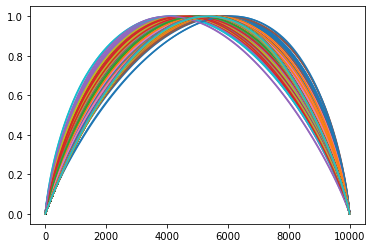

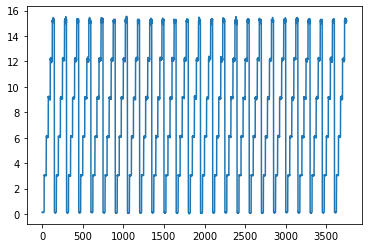

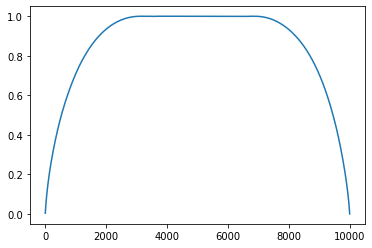

In [436]:
ns = 10000
x0 = jnp.array([1.0,3.0, 3., 1, 1.1])
d = 5
b_zero = jnp.array([0.0, 0.0, 0.0,0.0, 1.0])

betas1 = jnp.linspace(-5, 5, 5) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-5, 5, 5)
betas3 = jnp.linspace(0, 3, 6)
betas4 = jnp.linspace(-0.2, 0.2, 5)
betas5 = jnp.linspace(0.9, 1.1, 5)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 



type_of_transform = 'tbbc'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)

for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()



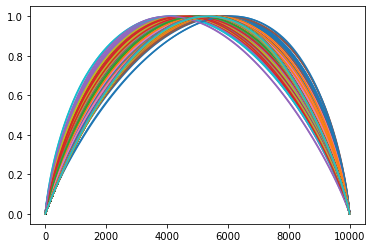

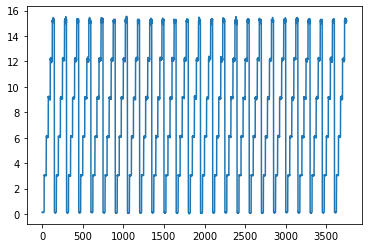

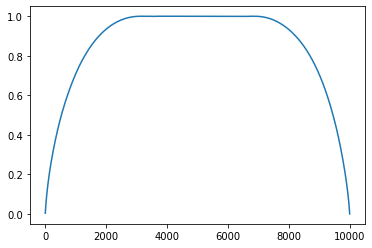

In [437]:
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

In [438]:
z = csaps([betas1, betas2, betas3, betas4, betas5], g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1, betas2, betas3, betas4, betas5], hat_g.reshape(*betas1.shape, *betas2.shape, *betas3.shape, *betas4.shape, *betas5.shape)) #intterpolation of Integral g(beta)

100%|███████████████████████████████████████| 3750/3750 [06:46<00:00,  9.22it/s]


In [439]:
exp_smoothing = True
Phi = phi_tbbc_torch_batch_and_noise
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=2000, alpha=1e-3, batch_size=256, adaptive=False)

100%|█████████████████████████████████████████| 100/100 [09:37<00:00,  5.77s/it]


In [440]:
isOk.mean()

0.63

(array([ 7.,  8.,  5., 11.,  5., 14., 11.,  5., 11., 23.]),
 array([0.04846666, 0.14308729, 0.23770791, 0.33232854, 0.42694916,
        0.52156979, 0.61619041, 0.71081104, 0.80543166, 0.90005229,
        0.99467291]),
 <BarContainer object of 10 artists>)

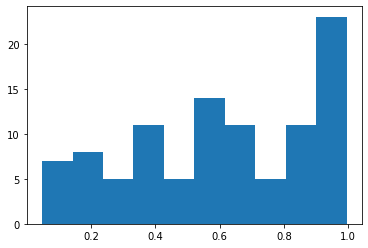

In [441]:
plt.hist(pas, bins=10)

In [442]:
xi(0.99)

array(1.47409941)

In [445]:
betas1 = jnp.linspace(-3, 3, 5) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-3, 3, 5)
betas3 = jnp.linspace(1, 3, 3)
betas4 = jnp.linspace(-0.1, 0.1, 5)
betas5 = jnp.linspace(0.95, 1.05, 5)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 

In [446]:
hlist = [0.5, 0.55, 0.555, 0.56, 0.57, 0.58, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65,0.68, 0.7, 0.72, 0.73,0.78,0.783, 0.79, 0.8, 0.91, 0.92, 0.93,0.95, 0.96,0.965, 0.97, 0.98, 0.99, 1]
hlist = np.linspace(0.5, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
# cert_acc_within_betas_bounds = ((pas>hmin).astype('int')*isOk).mean()
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc TBBC our', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.0


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.0016720828204649374


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.0033441393271737008


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.005016248461394812


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.006688301479537362


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.008360354497679912


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.010032467120467237


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.011704520138609786


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.013376573156752336


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.015048685779539661


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.01672073879768221


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.018392825904099852


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.020064904438612086


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.021736957456754524


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.023409034894860348


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.02508112309768451


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.02675317611582706


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.028425243885620732


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.030097341756756935


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.03176939477489937


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.03344145287638123


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.03511356041582925


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.0367856134339718


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.0384577214717865


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.04012977907490167


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.04180183209304422


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.043473930462546995


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.0451459977339741


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.04681805075211665


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.04849013945330738


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.05016221639304652


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.05183427878048108


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.053506382033976396


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.055178435052118946


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.056850488070261496


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.05852260069304882


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.06019465371119137


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.06186670672933392


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.06353881935212125



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.0652108723702638



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.06688292538840634


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.06855503502099414


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.07022709102933622


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.07189917434816773


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.0735712566702661


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.07524330968840875


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.07691538333892822


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.07858747532933863


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.08025952834748107


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.08193159232968872


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.08360369398841094


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.08527574700655349


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.0869478596293407


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.08861991264748337



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.0902919656656258


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.09196407828841324


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.09363619091120046


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.09530824392934312


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.09698033851125976


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.09865240957027299


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10032464140234987


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10199669442049242


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10366874743863497


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10534086006142229


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10701291307956484


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.10868496609770739


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.11035707463388866


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.11202913173863727


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.11370118475677982


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.11537328362464916


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.11704541000235447


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.11871746302049702


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.12038955222005432


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.12206162866142689


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.12373368167956944


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.12540576121081481


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.12707784732049932


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.12874990053798852


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.1304220129614292


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.13209415907445166


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.13376641702093806


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.13543877523878345



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.13711135752225


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.13878412579612986


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.14045719458506667


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.14213054225994992


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1438043071673467


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.14547838225811227


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1471524926332327


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.14882613833133995


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1504994860062232


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.15217253047487012


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.15384529874874997



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.15551786010081958


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.1571902988547067


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.15886259029142835


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.16053476251886045


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.16220687514164778


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.16387892815979033


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.16555098994918493


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.1672230938007202


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.16889520642350753


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.1705674969631693


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.17223978929695083



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.17391196152438293


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.17558407414717025


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.17725618676995747


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1789282993927449


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.18060041201553212


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.18227258424296433


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.18394475647039632


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.18561692869782842


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.18728904132061575


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.18896109772765113


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1906332269958828


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.19230541586875916


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.19397767062569937


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.1956501305103302


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.19732282253412103


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.19899575297649086


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.20066898144208467


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.20234250793090236


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.20401641766363166


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.20569070236738707


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.20736540430365602


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2090407375707275


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2107164547794239


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.21239279434832437


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2140698305340515


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.21574740316158147


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.21742582191591675


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.21910486303045595


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2207847649237783


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.22246546799123879


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.22414714636212607


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.22582970684188663


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.22751333791276684


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.22919796093251787


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.23088374275427592


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2325707240447551


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.2342589020131025


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2359484060352861


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.23763927398716733


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.23933153178380884


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2410252293615438


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.24272035864683295


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.24441713284090616


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.24611542306616152



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.24781541860223222


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.24951719530051364


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2512206339517167


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.25292589363445794


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.254632970860172


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2563420812222471


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2580531546503406


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2597662604174087


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.26148159478021704


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2631990083284601


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.26491882151185875


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.26664091322732997


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.26836549049635794


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.27009249879763675


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.27182207857087315


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2735543002851033


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.275289122177207



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2770268232328038


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2787672939109165


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2805106876087826


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.28225702974309896


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2840064310509225


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.285759012236643


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2875148284196055


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2892740907079002


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2910367961113268


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.2928029501119187


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.29457273720498856


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2963462446046913


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.29812347101527303


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.2999045577735008


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3016896836933084


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.30347878917005155


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.30527205301766414


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3070695944454359


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3088715561855597


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.31067800063353324


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3124889971619864


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.314304695280898


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.31612518389886834


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3179505725568753


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.31978093730566093


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.32161650001803377


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.3234574490765664


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3253038083031824


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3271557590036488


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3290133512139719


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.33087670155193494


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.3327459510552844


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.33462128820626635


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.33650282349275507


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3383908203014961


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.34028535268976534


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.3421866244895004



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.34409472550636155



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.346009911701432


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.3479324530897332


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.34986232206175555


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.3517998827739703


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.35374521062924313


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.3556985563558081


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3576600181817211


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3596298913393531


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.36160841354956996


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.36359589250390745


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3655923949834894


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3675982704429722


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3696136765655466


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3716388684152361


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3736741909613976


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.37571986233908994


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.37777624381425784


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3798434552939042


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.3819219366363857


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.38401183685331436


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.38611354337488124



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3882272929750557


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.39035334874156324


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3924920434337794


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3946437426036018


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.3968088738495689


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.39898783706103674


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4011810399018801


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4033888996046125


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.40561207575742214


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4078509913240389


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.4101061710844869


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4123780932713513


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.41466730514098965


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4169745518012989


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4193003354562963


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4216452063525402


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.42400978271379114



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4263946872491104


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4288004862026227


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4312278517711921


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.43367756509461924


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4361502890004762


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4386468008409774


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.441168011530586


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.44371478538648734


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4462880809171544


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.44888891778064005


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.45151833427390936


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.45417741668662887


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.45686727532973664


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.45958903207627416


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.462343656199433


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4651324780888381


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4679569911996657


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.4708187426113364


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.47371941934461187


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.47666087811407826


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4796452056803433


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.48267447704256167


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4857510361185043


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4888771047261246


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.49205502070312124


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.4952873914536822


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.49857720483505613


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.501927922750795


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5053430499639799


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.508826588009512


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5123830693820648


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5160172726697345


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.519734667695087


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5235413857626674



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.527444340811924



  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5314508699453793


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.535568897640426


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5398074783210369


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5441772975650521



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5486899540077481



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5533581474752332


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5581969156811469


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.563223409413494


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.5684579040693201


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5739257742329984



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5796581785316053



  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5856896194327237


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.5920631953804789


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.5988314523047029


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.60606781894148


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.6138745924601189


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.6223852165965332


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.6317916777121981


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.6423974393004159


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


0.6546769828401681


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.6694469637795037


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.6884235290679646


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


[[[[[2.54268039]]]]]
0.7168232286130903


  0%|                                                  | 0/1875 [00:00<?, ?it/s]

[[[[[2.54268039]]]]]
0.8045963998883963


  0%|                                                  | 0/1875 [00:00<?, ?it/s]


TypeError: '>' not supported between instances of 'float' and 'NoneType'

## Just gamma

In [498]:
sigma_c = 0.1
sigma_gamma = 0.1

In [499]:
def attack_gamma_torch(x, b):
    return x**(torch.tensor(b[0].item()))


def phi_gamma_torch_batch_and_noise(x, sigma_g=sigma_gamma, sigma_c = sigma_c):
    q = (torch.randn(len(x)) * sigma_g).to(device)
    q_= (torch.randn(len(x)) * sigma_g).to(device)
    q = torch.sqrt(q**2 + q_**2)
    
#     q1 = (torch.randn(len(x)) * sigma_c).to(device)
    
    
    q = q[:, None, None, None]
#     q1 = torch.exp(q1[:,None,None,None]) ## Norm to Lornorm
    return x ** q #) * q1

In [509]:
attack = attack_gamma_torch
Phi = phi_gamma_torch_batch_and_noise

ns = 10000
x0 = jnp.array([1.1]) # WHATEVER 
d = 1
b_zero = jnp.array([1.0])

## right

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 70.49it/s]


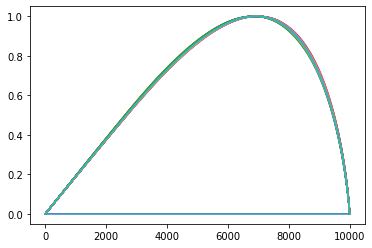

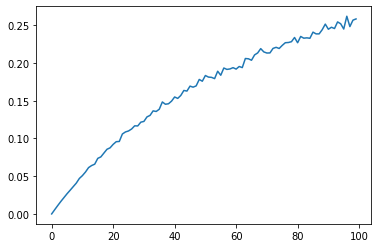

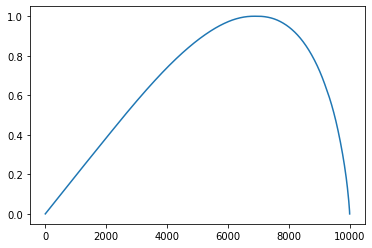

100%|█████████████████████████████████████████| 100/100 [00:04<00:00, 23.82it/s]


In [500]:


betas1 = jnp.linspace(1.0, 2.2, 100) ## set a bit larger range than you want to certify

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1)))) 



type_of_transform = 'gamma'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

z = csaps([betas1], g.reshape(*betas1.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1], hat_g.reshape(*betas1.shape)) #intterpolation of Integral g(beta)



In [501]:
xs = np.linspace(0.5,1-1e-3,1000)
r_our = lambda h: -xi(1-h)+xi(0.5)
r_mp_g_r = lambda h: np.sqrt( - np.log(1-h)/np.log(2))
r_mp_g_l = lambda h: np.sqrt( - np.log(h)/np.log(2))

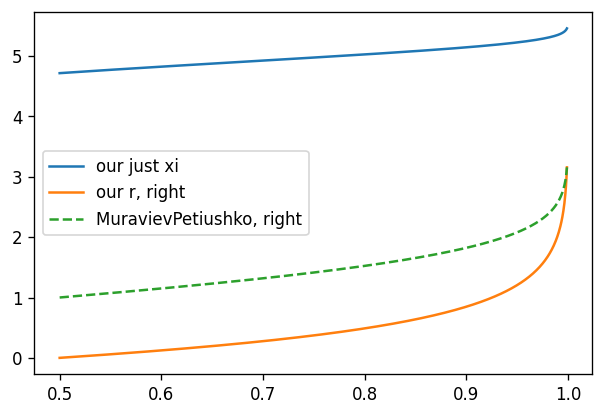

In [525]:
plt.figure(dpi=120)
plt.plot(xs, xi(xs), label='our just xi')
plt.plot(xs,r_our(xs), label='our r, right')
plt.plot(xs, r_mp_g_r(xs), '--', label='MuravievPetiushko, right')
# plt.plot(xs, r_mp_g_l(xs[::-1]), '--', label='MuravievPetiushko, left')
# plt.yscale('log')
plt.legend()
plt.show()


In [504]:
checkpoint = torch.load('./../checkpoints/_GCGCGC_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

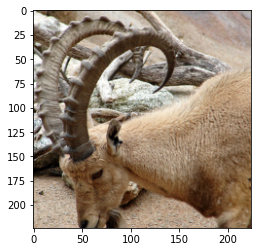

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


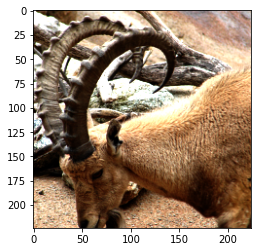

h normal based (pa) 0.9994893143360329
normal based pb 0.00013245051276068362
h from Clopper-Pearson (pa) 0.9965520801347684

Ground Truth Class (label) 350
Base classifier prediction in attacked image 350
TSS Smoothed classifier prediction in attacked image 350
Is smoothed classifier prediction in not-attacked image correct? 1
Is smoothed classifier prediction in ATTACKED image correct? 1

[0.13463977 0.08881283]
3.443132754921554
Safe beta our with h normal-based [ True  True]
[0.13463977 0.08881283]
2.567245029663481
Safe beta with h Clopper-Pearson [ True  True]


In [505]:
# image, label = next(iter(dataloader100))
k = 35
image = ourdataset100[k][0]
label = ourdataset100[k][1]
imshow(image)

base_classifier = model
x = image
label = label
Phi = phi_gamma_torch_batch_and_noise
n0 = 200
maxn = 2000
alpha = 1e-3
batch_size = 128
adaptive=False

pa, pb, G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)



betas = np.array([1.9, 1.5])
image_attacked = attack_gc_torch(image, betas)
imshow(image_attacked)


base_classifier = model
x = image_attacked
label = label
Phi = phi_gamma_torch_batch_and_noise
n0 = 100
maxn = 3000
alpha = 1e-3
batch_size = 128
adaptive=False

pa_a, pb_a, G_CORRECT_PREDICTION_VIA_I_a, G_CORRECT_PREDICTION_VIA_CI_a, pABar_a, cAHat_a = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)


print('h normal based (pa)', pa.item())
print('normal based pb', pb.item())

print('h from Clopper-Pearson (pa)', pABar)
print()
print('Ground Truth Class (label)', label.item())
print('Base classifier prediction in attacked image', model(image_attacked.unsqueeze(0).to(device)).argmax().item())
print('TSS Smoothed classifier prediction in attacked image', cAHat_a)
print('Is smoothed classifier prediction in not-attacked image correct?', G_CORRECT_PREDICTION_VIA_CI)
print('Is smoothed classifier prediction in ATTACKED image correct?', G_CORRECT_PREDICTION_VIA_CI_a)
print()
print('Safe beta our with h normal-based', safe_beta(xi, pa, hatg_int, [betas]))
print('Safe beta with h Clopper-Pearson', safe_beta(xi, pABar, hatg_int, [betas]))


In [506]:
print('Safe beta our with h normal-based', safe_beta(xi, pa, hatg_int, [betas]))

[0.13463977 0.08881283]
3.443132754921554
Safe beta our with h normal-based [ True  True]


In [478]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

100%|█████████████████████████████████████████| 100/100 [00:05<00:00, 18.58it/s]

0.72


In [507]:
betas0 = np.linspace(1.0, 2.0, 21) # Attack Raxdius

betas = np.asarray(list(map(np.array, itertools.product(betas0))))
era = ERA_Only_ND(model, dataloader100, attack = attack_gamma_torch, device=device, PSN = betas)

#0.52

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_46661/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [00:18<00:00,  5.28it/s]

tensor(0.7200)


In [508]:
print(era)

tensor(0.7200)


In [523]:

era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=100, maxn=1000, alpha=1e-3, batch_size=128, adaptive=False)

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_46661/1679840911.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
/tmp/ipykernel_46661/1679840911.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
/tmp/ipykernel_46661/1679840911.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
/tmp/ipykernel_46661/1679840911.py:15: UserWarning: To copy construct from a tensor, it is recommended to u

KeyboardInterrupt: 

In [511]:
print(era_smoothed)

tensor(0.6100)


In [512]:

pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=1000, alpha=1e-3, batch_size=256, adaptive=False)

100%|█████████████████████████████████████████| 100/100 [01:45<00:00,  1.06s/it]


In [521]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc Gamma right our', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-204.1567792892456


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.6913352235902508


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.6562917017219059


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.6330723092707498


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.6150909730024559


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.6000947027302104


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5870919211652366


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.575514212898586


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5650110165012325


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5553577544298456


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.546395490002074


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5380050394447347


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5300993090090547


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5226083838421367


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5154734024634724


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5086463590130759


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.5020877796670664


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4957676141158398


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4896584386410918


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.48374033293197805


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.47799136726353897


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4723950708191529


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4669406437953576


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4616161493154669


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4564107477066912


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4513174714053356


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4463306509930156


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4414426809967962


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.436647282794965


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.43193712999988154


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.42730650216041965


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.42274965490385785


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4182626794413178


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.41383964800117035


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.40947783990049835


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.40517356164479335


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.4009229475040499


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3967234490308478


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3925724204966059


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.38846700087837505


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.38440480599036597


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3803834038035925


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3764009906296746


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.37245565911997947


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3685442739505831


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3646666405591681


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.36081988994891834


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3570036648906596


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.35321522237465164


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.349454142975568


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.34571831521381924



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.34200692575512104


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.33831836866295895


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3346518800410143


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3310067374570709


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.32738076564061647


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3237736025781537


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3201843695497031


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3166124350251165


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.3130567576175549



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3095162385283503


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.30599091124773814


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.3024789465709672


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.2989798564974677


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.2954938834327523



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.29201905623726265



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.28855573851926675


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.2851028554016928


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.2816603973159024



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.27822674237764833



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.2748025683654989



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

-0.27138644476798035



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.267978098878892



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.26457765509053566



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.2611833543681783


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.25779514408430515


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.25441313268348953


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.25103636649141325



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.24766478331192676


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.24429660337824455



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.24093244546233183


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.23757246425717948



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.23421557372230328



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.23086095254955463



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.22750927213841088


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.22415958997796626


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.2208118390877507


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.21746555060447292


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.21412019984777952


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.21077580276540253


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.20743140568302643


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.20408748543780764



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.20074338179368212


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.19739964494737094


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.19405524786499395


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.19071132761977605


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.18736663550437527


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.18402157978070655


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.18067622902401315



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.17732944775584514


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.1739812359762034


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.17063131300502032



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.1672800296923791


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.16392515654547957


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.1605688385341475


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.1572090136167592


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.15384638349348112



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.15047974411061737


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.14710986414880622


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.14373521581541304


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.1403569617000313


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.136973518192967


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.13358557423620354


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.13019143139638256


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.12679204334782135


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.1233874100905199



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.11997647747945628


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.11655844812807814


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.11313336669003249


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.1097013543680756


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.10626175730523446


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.10281453084786207

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.09935926513927029


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.0958956157084696


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.09242350600634897



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.08894191537812368



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.08545132066095196


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.08195035513428106


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.07844074274783974


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.0749206957609756



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.0713902141736904


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.06784921824732759


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.0642966474577733


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.06073316523063976



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.05715734105445058


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.053569460393593005


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.049969162829344604


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.046357000153200545



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.04273154185368444


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.039092311093639864


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.03543969221338372

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.03177348586627904



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.028092789410747443


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.024397248807161098



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.02068718619968557


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.016961989195450222


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.01322083967585197


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.00946353350993423


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
-0.005691024372011633


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[1.52499557e-05]
-0.0019014049134522537


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.001905430120768159
[0.0114192]
0.001905430120768159


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.005730118639891479


  5%|██                                         | 1/21 [00:00<00:00, 453.24it/s]


[0.0114192]
0.005730118639891479


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.009572022734676722
[0.0114192]


  5%|██                                         | 1/21 [00:00<00:00, 414.29it/s]


0.009572022734676722


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.013431990824415152
[0.0114192]


 10%|████                                       | 2/21 [00:00<00:00, 629.59it/s]


0.013431990824415152
[0.021842]
0.013431990824415152


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.017310493367173052
[0.0114192]
0.017310493367173052
[0.021842]


 10%|████                                       | 2/21 [00:00<00:00, 394.50it/s]


0.017310493367173052


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.02120823046834186


 10%|████                                       | 2/21 [00:00<00:00, 642.61it/s]

[0.0114192]
0.02120823046834186
[0.021842]
0.02120823046834186



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.025125462075938465
[0.0114192]
0.025125462075938465


 14%|██████▏                                    | 3/21 [00:00<00:00, 701.90it/s]


[0.021842]
0.025125462075938465
[0.03206663]
0.025125462075938465


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.02906233650386092
[0.0114192]
0.02906233650386092
[0.021842]
0.02906233650386092
[0.03206663]


 14%|██████▏                                    | 3/21 [00:00<00:00, 654.64it/s]


0.02906233650386092


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.0330192444715216
[0.0114192]
0.0330192444715216
[0.021842]
0.0330192444715216
[0.03206663]


 19%|████████▏                                  | 4/21 [00:00<00:00, 543.15it/s]


0.0330192444715216
[0.04147723]
0.0330192444715216


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.036997077457083805
[0.0114192]
0.036997077457083805
[0.021842]


 19%|████████▏                                  | 4/21 [00:00<00:00, 327.85it/s]

0.036997077457083805
[0.03206663]
0.036997077457083805
[0.04147723]
0.036997077457083805



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.04099566163028001
[0.0114192]
0.04099566163028001
[0.021842]
0.04099566163028001
[0.03206663]
0.04099566163028001
[0.04147723]
0.04099566163028001


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.04501603199885462
[0.0114192]
0.04501603199885462
[0.021842]
0.04501603199885462
[0.03206663]


 24%|██████████▏                                | 5/21 [00:00<00:00, 752.26it/s]


0.04501603199885462
[0.04147723]
0.04501603199885462
[0.05050128]
0.04501603199885462


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.04905732738533164
[0.0114192]
0.04905732738533164
[0.021842]
0.04905732738533164
[0.03206663]
0.04905732738533164
[0.04147723]


 24%|██████████▏                                | 5/21 [00:00<00:00, 681.29it/s]


0.04905732738533164
[0.05050128]
0.04905732738533164


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.05312191283822454
[0.0114192]
0.05312191283822454
[0.021842]
0.05312191283822454
[0.03206663]
0.05312191283822454
[0.04147723]
0.05312191283822454
[0.05050128]
0.05312191283822454
[0.05910288]
0.05312191283822454

 29%|████████████▎                              | 6/21 [00:00<00:00, 778.36it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.05720908346782139
[0.0114192]
0.05720908346782139
[0.021842]
0.05720908346782139
[0.03206663]
0.05720908346782139
[0.04147723]
0.05720908346782139
[0.05050128]
0.05720908346782139
[0.05910288]
0.05720908346782139


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.061319488346775586
[0.0114192]
0.061319488346775586
[0.021842]
0.061319488346775586
[0.03206663]
0.061319488346775586
[0.04147723]
0.061319488346775586
[0.05050128]


 33%|██████████████▎                            | 7/21 [00:00<00:00, 619.27it/s]

0.061319488346775586
[0.05910288]
0.061319488346775586
[0.06708101]
0.061319488346775586



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.06545348789380956
[0.0114192]
0.06545348789380956
[0.021842]
0.06545348789380956
[0.03206663]
0.06545348789380956
[0.04147723]
0.06545348789380956
[0.05050128]
0.06545348789380956
[0.05910288]
0.06545348789380956
[0.06708101]
0.06545348789380956


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.06961196561322147
[0.0114192]
0.06961196561322147
[0.021842]
0.06961196561322147
[0.03206663]
0.06961196561322147


 38%|████████████████▍                          | 8/21 [00:00<00:00, 720.83it/s]

[0.04147723]
0.06961196561322147
[0.05050128]
0.06961196561322147
[0.05910288]
0.06961196561322147
[0.06708101]
0.06961196561322147
[0.07461373]
0.06961196561322147



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.0737948321977191
[0.0114192]
0.0737948321977191
[0.021842]
0.0737948321977191
[0.03206663]
0.0737948321977191
[0.04147723]
0.0737948321977191
[0.05050128]
0.0737948321977191
[0.05910288]
0.0737948321977191


 38%|████████████████▍                          | 8/21 [00:00<00:00, 574.35it/s]

[0.06708101]
0.0737948321977191
[0.07461373]
0.0737948321977191



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.07800326140030567
[0.0114192]
0.07800326140030567
[0.021842]
0.07800326140030567
[0.03206663]
0.07800326140030567
[0.04147723]
0.07800326140030567
[0.05050128]
0.07800326140030567
[0.05910288]
0.07800326140030567
[0.06708101]
0.07800326140030567
[0.07461373]
0.07800326140030567
[0.08197648]


 43%|██████████████████▍                        | 9/21 [00:00<00:00, 759.91it/s]


0.07800326140030567


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.08223788475113203
[0.0114192]
0.08223788475113203
[0.021842]
0.08223788475113203
[0.03206663]
0.08223788475113203
[0.04147723]
0.08223788475113203
[0.05050128]
0.08223788475113203
[0.05910288]
0.08223788475113203
[0.06708101]
0.08223788475113203
[0.07461373]
0.08223788475113203
[0.08197648]
0.08223788475113203
[0.08881283]


 48%|████████████████████                      | 10/21 [00:00<00:00, 740.35it/s]


0.08223788475113203


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.0864976688372252
[0.0114192]
0.0864976688372252
[0.021842]
0.0864976688372252
[0.03206663]
0.0864976688372252
[0.04147723]
0.0864976688372252
[0.05050128]
0.0864976688372252
[0.05910288]
0.0864976688372252
[0.06708101]
0.0864976688372252
[0.07461373]
0.0864976688372252
[0.08197648]
0.0864976688372252
[0.08881283]
0.0864976688372252


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.0907849978443771
[0.0114192]
0.0907849978443771
[0.021842]
0.0907849978443771
[0.03206663]
0.0907849978443771
[0.04147723]
0.0907849978443771
[0.05050128]
0.0907849978443771
[0.05910288]
0.0907849978443771
[0.06708101]
0.0907849978443771
[0.07461373]
0.0907849978443771
[0.08197648]
0.0907849978443771
[0.08881283]
0.0907849978443771
[0.09547858]


 52%|██████████████████████                    | 11/21 [00:00<00:00, 722.31it/s]


0.0907849978443771


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.09509939493542952
[0.0114192]
0.09509939493542952
[0.021842]
0.09509939493542952
[0.03206663]
0.09509939493542952
[0.04147723]
0.09509939493542952
[0.05050128]
0.09509939493542952
[0.05910288]


 52%|██████████████████████                    | 11/21 [00:00<00:00, 666.05it/s]

0.09509939493542952
[0.06708101]
0.09509939493542952
[0.07461373]
0.09509939493542952
[0.08197648]
0.09509939493542952
[0.08881283]
0.09509939493542952
[0.09547858]
0.09509939493542952



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.09944237833437697
[0.0114192]
0.09944237833437697
[0.021842]
0.09944237833437697
[0.03206663]
0.09944237833437697
[0.04147723]
0.09944237833437697
[0.05050128]
0.09944237833437697
[0.05910288]
0.09944237833437697
[0.06708101]


 57%|████████████████████████                  | 12/21 [00:00<00:00, 771.17it/s]


0.09944237833437697
[0.07461373]
0.09944237833437697
[0.08197648]
0.09944237833437697
[0.08881283]
0.09944237833437697
[0.09547858]
0.09944237833437697
[0.10196605]
0.09944237833437697


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.10381356210612935
[0.0114192]
0.10381356210612935
[0.021842]
0.10381356210612935
[0.03206663]
0.10381356210612935
[0.04147723]
0.10381356210612935
[0.05050128]
0.10381356210612935
[0.05910288]
0.10381356210612935
[0.06708101]
0.10381356210612935
[0.07461373]
0.10381356210612935
[0.08197648]
0.10381356210612935
[0.08881283]


 62%|██████████████████████████                | 13/21 [00:00<00:00, 783.25it/s]


0.10381356210612935
[0.09547858]
0.10381356210612935
[0.10196605]
0.10381356210612935
[0.10807505]
0.10381356210612935


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.10821372131041418
[0.0114192]
0.10821372131041418
[0.021842]
0.10821372131041418
[0.03206663]
0.10821372131041418
[0.04147723]
0.10821372131041418
[0.05050128]
0.10821372131041418
[0.05910288]
0.10821372131041418
[0.06708101]
0.10821372131041418
[0.07461373]
0.10821372131041418
[0.08197648]
0.10821372131041418
[0.08881283]
0.10821372131041418


 67%|████████████████████████████              | 14/21 [00:00<00:00, 817.74it/s]


[0.09547858]
0.10821372131041418
[0.10196605]
0.10821372131041418
[0.10807505]
0.10821372131041418
[0.11386264]
0.10821372131041418


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.11264380962154963
[0.0114192]
0.11264380962154963
[0.021842]
0.11264380962154963
[0.03206663]
0.11264380962154963
[0.04147723]
0.11264380962154963
[0.05050128]
0.11264380962154963
[0.05910288]
0.11264380962154963
[0.06708101]
0.11264380962154963
[0.07461373]
0.11264380962154963
[0.08197648]
0.11264380962154963
[0.08881283]
0.11264380962154963
[0.09547858]
0.11264380962154963
[0.10196605]
0.11264380962154963
[0.10807505]


 67%|████████████████████████████              | 14/21 [00:00<00:00, 810.26it/s]

0.11264380962154963
[0.11386264]
0.11264380962154963



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.11710402638617179
[0.0114192]
0.11710402638617179
[0.021842]
0.11710402638617179
[0.03206663]
0.11710402638617179
[0.04147723]
0.11710402638617179
[0.05050128]
0.11710402638617179
[0.05910288]
0.11710402638617179
[0.06708101]
0.11710402638617179
[0.07461373]
0.11710402638617179
[0.08197648]
0.11710402638617179
[0.08881283]
0.11710402638617179


 71%|██████████████████████████████            | 15/21 [00:00<00:00, 687.81it/s]


[0.09547858]
0.11710402638617179
[0.10196605]
0.11710402638617179
[0.10807505]
0.11710402638617179
[0.11386264]
0.11710402638617179
[0.11916143]
0.11710402638617179


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.12159520407584168
[0.0114192]
0.12159520407584168
[0.021842]
0.12159520407584168
[0.03206663]
0.12159520407584168
[0.04147723]
0.12159520407584168
[0.05050128]
0.12159520407584168
[0.05910288]
0.12159520407584168
[0.06708101]
0.12159520407584168
[0.07461373]
0.12159520407584168
[0.08197648]
0.12159520407584168
[0.08881283]
0.12159520407584168
[0.09547858]
0.12159520407584168
[0.10196605]
0.12159520407584168
[0.10807505]
0.12159520407584168
[0.11386264]
0.12159520407584168
[0.11916143]


 76%|████████████████████████████████          | 16/21 [00:00<00:00, 832.67it/s]


0.12159520407584168
[0.12446461]
0.12159520407584168


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.12611794073047466
[0.0114192]
0.12611794073047466
[0.021842]
0.12611794073047466
[0.03206663]
0.12611794073047466
[0.04147723]
0.12611794073047466
[0.05050128]
0.12611794073047466
[0.05910288]
0.12611794073047466
[0.06708101]
0.12611794073047466
[0.07461373]
0.12611794073047466
[0.08197648]
0.12611794073047466
[0.08881283]
0.12611794073047466
[0.09547858]
0.12611794073047466
[0.10196605]
0.12611794073047466
[0.10807505]
0.12611794073047466
[0.11386264]
0.12611794073047466
[0.11916143]
0.12611794073047466
[0.12446461]
0.12611794073047466
[0.12975835]


 81%|██████████████████████████████████        | 17/21 [00:00<00:00, 850.45it/s]


0.12611794073047466


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.13067346751490572
[0.0114192]
0.13067346751490572
[0.021842]
0.13067346751490572
[0.03206663]
0.13067346751490572
[0.04147723]
0.13067346751490572
[0.05050128]
0.13067346751490572
[0.05910288]
0.13067346751490572
[0.06708101]
0.13067346751490572
[0.07461373]
0.13067346751490572
[0.08197648]
0.13067346751490572
[0.08881283]
0.13067346751490572
[0.09547858]
0.13067346751490572
[0.10196605]
0.13067346751490572
[0.10807505]
0.13067346751490572
[0.11386264]
0.13067346751490572
[0.11916143]
0.13067346751490572
[0.12446461]
0.13067346751490572
[0.12975835]
0.13067346751490572


 86%|████████████████████████████████████      | 18/21 [00:00<00:00, 809.02it/s]


[0.13463977]
0.13067346751490572


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.13526130759197752
[0.0114192]
0.13526130759197752
[0.021842]
0.13526130759197752
[0.03206663]
0.13526130759197752
[0.04147723]
0.13526130759197752
[0.05050128]
0.13526130759197752
[0.05910288]
0.13526130759197752
[0.06708101]
0.13526130759197752
[0.07461373]
0.13526130759197752
[0.08197648]
0.13526130759197752
[0.08881283]
0.13526130759197752
[0.09547858]
0.13526130759197752
[0.10196605]
0.13526130759197752
[0.10807505]
0.13526130759197752
[0.11386264]
0.13526130759197752
[0.11916143]
0.13526130759197752
[0.12446461]
0.13526130759197752
[0.12975835]

 90%|██████████████████████████████████████    | 19/21 [00:00<00:00, 729.83it/s]



0.13526130759197752
[0.13463977]
0.13526130759197752
[0.13944732]
0.13526130759197752


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.13988299194386933
[0.0114192]
0.13988299194386933
[0.021842]
0.13988299194386933
[0.03206663]
0.13988299194386933
[0.04147723]
0.13988299194386933
[0.05050128]
0.13988299194386933
[0.05910288]
0.13988299194386933
[0.06708101]
0.13988299194386933
[0.07461373]
0.13988299194386933
[0.08197648]
0.13988299194386933
[0.08881283]
0.13988299194386933
[0.09547858]
0.13988299194386933
[0.10196605]
0.13988299194386933
[0.10807505]
0.13988299194386933
[0.11386264]
0.13988299194386933
[0.11916143]
0.13988299194386933
[0.12446461]
0.13988299194386933
[0.12975835]
0.13988299194386933
[0.13463977]
0.13988299194386933
[0.13944732]
0.13988299194386933
[0.14405389]


 95%|████████████████████████████████████████  | 20/21 [00:00<00:00, 672.41it/s]


0.13988299194386933


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[1.52499557e-05]
0.14453964966994093
[0.0114192]
0.14453964966994093
[0.021842]
0.14453964966994093
[0.03206663]
0.14453964966994093
[0.04147723]
0.14453964966994093
[0.05050128]
0.14453964966994093
[0.05910288]
0.14453964966994093
[0.06708101]
0.14453964966994093
[0.07461373]
0.14453964966994093
[0.08197648]
0.14453964966994093
[0.08881283]
0.14453964966994093
[0.09547858]
0.14453964966994093
[0.10196605]
0.14453964966994093
[0.10807505]
0.14453964966994093
[0.11386264]
0.14453964966994093
[0.11916143]
0.14453964966994093
[0.12446461]
0.14453964966994093
[0.12975835]
0.14453964966994093
[0.13463977]
0.14453964966994093

100%|██████████████████████████████████████████| 21/21 [00:00<00:00, 864.30it/s]


[0.13944732]
0.14453964966994093
[0.14405389]
0.14453964966994093
Cert Acc Gamma right our 0.67 h_min is 0.6153846153846154


In [514]:
cert_acc_within_betas_bounds

0.52

In [515]:
hmin

0.6153846153846154

In [516]:
((pas>hmin).astype('int')*isOk).mean()

0.52

In [517]:
def safe_beta_MP_gamma(xi, h, bs):
    gam = bs[0]
    
    r_mp_g_r = lambda h: np.sqrt( - np.log(1-h)/np.log(2))
    r_mp_g_l = lambda h: np.sqrt( - np.log(h)/np.log(2))
    if gam >= 1.0:
        cond = r_mp_g_r(h)
        return gam < cond
    else:
        cond = r_mp_g_l(h)
        return gam > cond
    
    

In [520]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=None, safe_beta_tss=safe_beta_MP_gamma)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

100%|████████████████████████████████████████| 21/21 [00:00<00:00, 70183.57it/s]

Cert Acc CB TSS 0.53 h_min is 0.9397993311036789


## Left

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 74.79it/s]


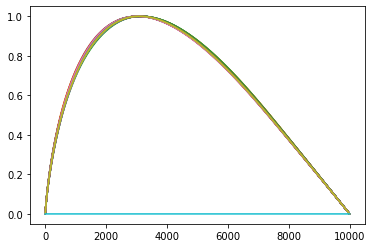

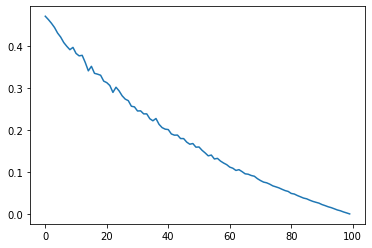

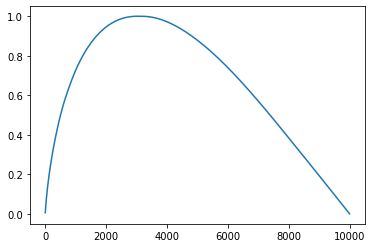

100%|█████████████████████████████████████████| 100/100 [00:03<00:00, 28.62it/s]


In [555]:


betas1 = jnp.linspace(0.5, 1.0, 100) ## set a bit larger range than you want to certify

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1)))) 



type_of_transform = 'gamma'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

z = csaps([betas1], g.reshape(*betas1.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1], hat_g.reshape(*betas1.shape)) #intterpolation of Integral g(beta)



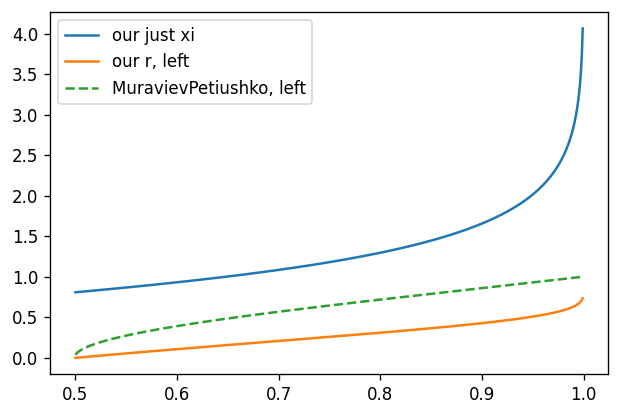

In [530]:
plt.figure(dpi=120)
plt.plot(xs, xi(xs), label='our just xi')
plt.plot(xs,r_our(xs), label='our r, left')
# plt.plot(xs, r_mp_g_r(xs), '--', label='MuravievPetiushko, right')
plt.plot(xs, r_mp_g_l(xs[::-1]), '--', label='MuravievPetiushko, left')
# plt.yscale('log')
plt.legend()
plt.show()


In [478]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

100%|█████████████████████████████████████████| 100/100 [00:05<00:00, 18.58it/s]

0.72


In [556]:
betas0 = np.linspace(0.5, 1.0, 21) # Attack Raxdius

betas = np.asarray(list(map(np.array, itertools.product(betas0))))
# era = ERA_Only_ND(model, dataloader100, attack = attack_gamma_torch, device=device, PSN = betas)

#0.52

In [557]:
print(era)

tensor(0.7000)


In [558]:
# # 
# era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=100, maxn=1000, alpha=1e-3, batch_size=128, adaptive=False)

In [536]:

pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=1000, alpha=1e-3, batch_size=256, adaptive=False)

100%|█████████████████████████████████████████| 100/100 [01:46<00:00,  1.07s/it]


In [559]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc Gamma right our', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-112.33267033100128


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-2.6125506019113764


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-2.2503850456065555


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-2.039542236854397


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.8902130888457283


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.7744972199500584


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.680006787529757


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.6001469542748938


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.530988940825829


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.4699980889674404


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.415448565546884


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.3661065448486678


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.3210637708970134


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.2796301375264711


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.2412692523720272


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.2055563739310942


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.1721482009792008


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.1407658663083082


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.111176413835889


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.0831863501398864


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.0566304152625858


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.0313693292962274


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-1.0072818655632814


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.9842637043732866


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.9622237140119677


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.9410817479608852


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.9207675042359728


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.9012182149600029


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.8823777883746556


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.864196945193619


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.8466302579063235


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.8296379464924531


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.8131828021046309


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7972323057244849


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.781755880368593


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7667259225079842


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7521171438255437


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7379067039808699


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7240729898114667


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.7105963903924691


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6974588704348407


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6846438096119806


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6721354555525508


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6599192244552049


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6479820898145338


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6363109856544927


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6248941788306602


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.6137211107490056


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.6027813236848966


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.5920650161628341


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.5815633575254459


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.5712676068213475



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.561169992322507


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.551262562091534


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.5415387169573219


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.5319914028397373


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.5226142817117697


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.5134013552330808



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.5043470560507631



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4954456545437459



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4866923683861827



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.4780820026046856


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.4696100715012058


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4612722177569285



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4530641685760143



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4449817356855973


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.43702152022549956


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.42917949938056477



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.42145232811420674



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.41383665341597353



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.4063293184325051



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.39892706583973536


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.3916265191043101


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.38442516326904286


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.3773200970429641

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.37030818310868374


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.36338711701906645



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.35655443564705214


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.34980746455814515



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.3431440045602344


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.33656175280095735


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.33005849613393845


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.3236321840796582


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.3172809898255263



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.3110026196891248


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.30479564315897967


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.2986581568733905



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.2925882634510565


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.2865844311124107


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.2806451408360714



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.27476861963304


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.2689535410507867


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.2631985315909754


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.25750186531041386


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.2518623297828496


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.24627875324874415


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.24074981762812697



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.23527413467101044


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.22985056092507883


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.22447776435609657



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.21915474902826027



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.21388015460011156


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.2086531781033928


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.2034727641970019


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.19833761194477917


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.1932467712606475


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.18819947944437


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.18319471803397247



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.1782318909830075


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.17330991823139008


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.1684281247914038


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.16358571686473578


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.15878161439130156


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.15401511567093473



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.1492855058465914



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.1445917120346658


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.1399331381887099


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.13530911051708738


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.13071889741763631


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.12616178622612606


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.12163698553640323


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.11714399080212712



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.11268182901235735


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.10825003848028036



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.10384810389483667


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.09947530681074279


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.09513089608986658



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.0908145101174066


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.08652559311493602



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.08226346411433927


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.07802789366763585


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.07381792909724272


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.0696335867495842


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.06547377041749747



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.06133840175775407


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.057226833890513196


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.05313854971059606



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.0490727362824126


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.04502955308327328


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.041007989226376496


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.03700806783593247



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.03302909398956044


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.029070744745707477


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.025132599084273677


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
-0.021214335658478634


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.017315381745430902



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.013435491152033019


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.0095743720348066



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
-0.005731250330756055


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.0019060068305919442


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.0019017292504325267



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.005692474220109878


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.009466579526563046


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.013224361732253165



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.016966338739745956


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.020692670026351667


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.024403730164403337


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.028099937981187595



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.031781427437645005



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


0.035448809929914615


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.03910218931759468


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.042741963496574886


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.04636841553908111



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.049981794229717824


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.05358243068325064


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.05717078020740096



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.060747095773052484


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.06431161878898373


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.06786457651036226


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.07140656916991506


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.07493768607493612


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.07845847363456027


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.08196910268885627


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.08546984295382531


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.08896102175664722


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.09244289286559226



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.09591586912754768


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.09938018636958634


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.10283609257892601


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.10628392883766435


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.10972389329635968


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


0.11315625487362657


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.11658145292945521


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.1199996511274356


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.12341133447793806


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.12681679980810667


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.13021634613789834


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.13361030358534587


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.13699891096772154


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.14038256558287499



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.1437615180095302


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.1471361071369719


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.1505064186842544


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.15387297693303592



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.15723597604694162



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.16059568653935963



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.16395264106450658


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.16730686254724603


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.17065891713202985


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.17400889253137886


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.17735720597780658


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18150315]
0.18070402053686274


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18150315]
0.18404981125158604
[0.16743266]
0.18404981125158604
[0.15448944]
0.18404981125158604
[0.14199816]
0.18404981125158604
[0.13018117]
0.18404981125158604
[0.1189164]
0.18404981125158604
[0.10839052]
0.18404981125158604
[0.09836126]
0.18404981125158604
[0.0887215]
0.18404981125158604
[0.07957422]
0.18404981125158604
[0.07063872]
0.18404981125158604
[0.06217392]
0.18404981125158604
[0.05415477]
0.18404981125158604
[0.04666546]
0.18404981125158604
[0.03911902]
0.18404981125158604
[0.03206106]
0.18404981125158604
[0.02516157]
0.18404981125158604
[0.01858934]
0.18404981125158604
[0.01220857]
0.18404981125158604
[0.00597751]
0.18404981125158604
[-1.65402219e-06]


100%|██████████████████████████████████████████| 21/21 [00:00<00:00, 732.76it/s]

0.18404981125158604
Cert Acc Gamma right our 0.65 h_min is 0.6755852842809364


In [560]:
cert_acc_within_betas_bounds

0.65

In [561]:
hmin

0.6755852842809364

In [563]:
((paTSS>hmin).astype('int')*isOk).mean()

0.65

In [541]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=None, safe_beta_tss=safe_beta_MP_gamma)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                    | 0/21 [00:00<?, ?it/s]/tmp/ipykernel_46661/507466128.py:5: RuntimeWarning: divide by zero encountered in log
  r_mp_g_l = lambda h: np.sqrt( - np.log(h)/np.log(2))
100%|████████████████████████████████████████| 21/21 [00:00<00:00, 78783.89it/s]

Cert Acc CB TSS 0.59 h_min is 0.842809364548495


## both

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 69.72it/s]


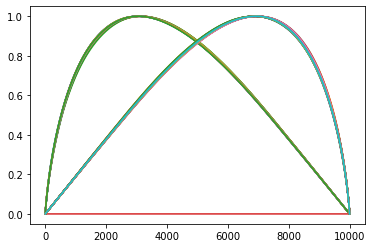

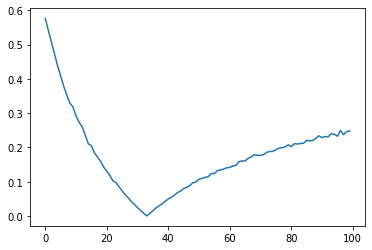

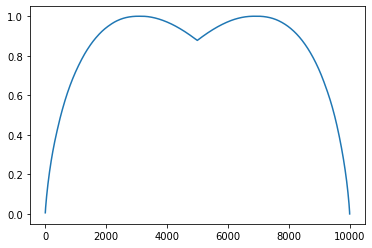

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 51.55it/s]


In [545]:


betas1 = jnp.linspace(0.45, 2.1, 100) ## set a bit larger range than you want to certify

betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1)))) 



type_of_transform = 'gamma'
bounds, p, g = compute_normed_bounds(compute_bound, x0, gamma, b_zero, betas, key, ns, d, type_of_transform)

x, xi = pxi_to_xi(p)
for b in bounds[:1000]:
    plt.plot(b)
plt.show()

plt.plot(g)
plt.show()

plt.plot(p)
plt.show()

z = csaps([betas1], g.reshape(*betas1.shape)) # interpolate


hg = []

for beta in tqdm(betas):
    hat_g = g_to_hat_g(z, beta, b_zero)
    hg.append(hat_g)
    
hat_g = jnp.asarray(hg)

hatg_int = csaps([betas1], hat_g.reshape(*betas1.shape)) #intterpolation of Integral g(beta)



In [546]:
checkpoint = torch.load('./../checkpoints/_GCGCGC_checkpoint.pth.tar')
model = torchvision.models.resnet50(pretrained=False).to(device)#.cuda()
normalize_layer = get_normalize_layer('imagenet', device).to(device)#.cuda()
model = torch.nn.Sequential(normalize_layer, model)
model.load_state_dict(checkpoint['state_dict'])
model.eval()
model = model.to(device)

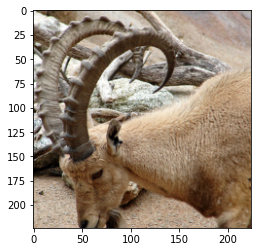

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


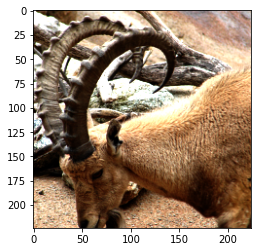

h normal based (pa) 0.9991415712464452
normal based pb 0.0001326378962858568
h from Clopper-Pearson (pa) 0.9965520801347684

Ground Truth Class (label) 350
Base classifier prediction in attacked image 350
TSS Smoothed classifier prediction in attacked image 350
Is smoothed classifier prediction in not-attacked image correct? 1
Is smoothed classifier prediction in ATTACKED image correct? 1

[0.13445588 0.08848696]
0.7435293617382029
Safe beta our with h normal-based [ True  True]
[0.13445588 0.08848696]
0.6907384330753826
Safe beta with h Clopper-Pearson [ True  True]


In [547]:
# image, label = next(iter(dataloader100))
k = 35
image = ourdataset100[k][0]
label = ourdataset100[k][1]
imshow(image)

base_classifier = model
x = image
label = label
Phi = phi_gamma_torch_batch_and_noise
n0 = 200
maxn = 2000
alpha = 1e-3
batch_size = 128
adaptive=False

pa, pb, G_CORRECT_PREDICTION_VIA_I, G_CORRECT_PREDICTION_VIA_CI, pABar, cAHat = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)



betas = np.array([1.9, 1.5])
image_attacked = attack_gc_torch(image, betas)
imshow(image_attacked)


base_classifier = model
x = image_attacked
label = label
Phi = phi_gamma_torch_batch_and_noise
n0 = 100
maxn = 3000
alpha = 1e-3
batch_size = 128
adaptive=False

pa_a, pb_a, G_CORRECT_PREDICTION_VIA_I_a, G_CORRECT_PREDICTION_VIA_CI_a, pABar_a, cAHat_a = certify(base_classifier,  x, label, Phi, n0,  
                         maxn, alpha, batch_size, adaptive)


print('h normal based (pa)', pa.item())
print('normal based pb', pb.item())

print('h from Clopper-Pearson (pa)', pABar)
print()
print('Ground Truth Class (label)', label.item())
print('Base classifier prediction in attacked image', model(image_attacked.unsqueeze(0).to(device)).argmax().item())
print('TSS Smoothed classifier prediction in attacked image', cAHat_a)
print('Is smoothed classifier prediction in not-attacked image correct?', G_CORRECT_PREDICTION_VIA_CI)
print('Is smoothed classifier prediction in ATTACKED image correct?', G_CORRECT_PREDICTION_VIA_CI_a)
print()
print('Safe beta our with h normal-based', safe_beta(xi, pa, hatg_int, [betas]))
print('Safe beta with h Clopper-Pearson', safe_beta(xi, pABar, hatg_int, [betas]))


In [478]:
iscor = Accuracy(model, loader=dataloader100, device=device) # Accuracy of non-smoothed model on original images

100%|█████████████████████████████████████████| 100/100 [00:05<00:00, 18.58it/s]

0.72


In [548]:
betas0 = np.linspace(0.5, 2.0, 21) # Attack Raxdius

betas = np.asarray(list(map(np.array, itertools.product(betas0))))
era = ERA_Only_ND(model, dataloader100, attack = attack_gamma_torch, device=device, PSN = betas)

#0.52

  0%|                                                   | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_46661/1961495464.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attacked = torch.tensor(attacked)
100%|█████████████████████████████████████████| 100/100 [00:17<00:00,  5.65it/s]

tensor(0.7000)


In [532]:
print(era)

tensor(0.7000)


In [534]:
# # 
# era_smoothed = ERA_Only_For_Smoothed_ND(model, dataloader100, attack, Phi, device, PSN=betas, n0=100, maxn=1000, alpha=1e-3, batch_size=128, adaptive=False)

In [549]:
pas, isOk, paTSS, isOkTSS = pa_isOk_collector(model, loader=dataloader100, Phi=Phi, device=device, n0=100, maxn=1000, alpha=1e-3, batch_size=256, adaptive=False)

100%|█████████████████████████████████████████| 100/100 [01:46<00:00,  1.06s/it]


In [550]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccChecker(betas=betas, hlist=hlist, xi=xi, hatg_int=hatg_int)
cert_acc_within_betas_bounds = ((paTSS>hmin).astype('int')*isOkTSS).mean()
print('Cert Acc Gamma right our', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-137.2627387046814


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.6913441642869668


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.6563007197651177


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.633081050222135


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.6151000963006928


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.6001037131982502


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5870998372202335


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5755149281543234


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5650114933383904


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5553580992995296


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5463957371919052


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.538005550569515


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.530099763120696


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.522608420123225


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5154738793006312


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5086467457455538


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.5020883605631697


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4957676755146042


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.489659273106119


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.48374037918039814


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.477991189845031


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4723959052841801


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4669413411098978


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.46161662615262566


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.45641129551125215


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.45131772736641895


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4463308945946073


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4414431386966772


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4366474681873388


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.43193736841846075


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4273067405789991


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4227501759959703


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.41826284410164105


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.413840108491904


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.40947808071123715


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.4051737231155702


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.40092330513191865


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.3967238465280437


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.39257275141202486


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.38846735850624425


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.38440524495166295


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.380384131020128


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.37640165126443315


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.37245589155815917


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.36854486999703095


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.36466701413476754


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.36082068773416387


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.3570042011331157


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.35321610787241753


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.34945469516575545


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.3457189024890147


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.3420074025922796


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.33831907355267077


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.3346526670615412


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.3310069332154698



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.32738091834014094


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.32377402638910613


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.3201848073149206



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.31661269856137186


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.31305699045442836



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.3095167707838743



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.30599104720214554



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.3024792292445003


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.29898060165520113


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.2954942410606206


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.29201969893082336


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.2885563345657146


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.2851033824742041



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.281660640518801



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.27822733842409575



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.2748029606796828



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.27138703682749565


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.26797888231117983


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.26457801271840486


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.2611839496172391


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.2577960714448654


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.2544138479392265



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.25103696094308814


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.24766500099845568


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.24429721417634387


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.24093331780322014



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.23757302721208562


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.23421574077478613

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.23086153982475055



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.22750982831553068


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.2241601860244139


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.22081244709499714


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.21746607608221058


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.21412089716231952



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]


  0%|                                                    | 0/21 [00:00<?, ?it/s]


-0.21077631428887622


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.20743208904330157

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.20408798300701647


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.2007438311210047


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.19739965172515672


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.19405554568887162


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.19071132044329697



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.18736703559307755



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.1840220950917656


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.18067646744259236



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.1773296265697799



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.17398140601888556


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.1706317374140125



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.16727980024439848


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.16392569976506832


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.16056885926619835


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.15720929429682606


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.15384658423554554



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.15048023809158684


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.14711011951185005



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.14373576880298733


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.1403571070237305



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.1369737580069731


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.13358535575228803


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.1301917890242511


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.1267925407176832


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.12338749262002813


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.11997610729274955


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.11655830559523228


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.11313354550396726



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.10970154155456913


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.10626199572381378


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.10281472919776702


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.09935931637135653


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.09589542473439006


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.09242313302878968



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.08894184002509498



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.08545122397783222


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.0819511060730671


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.07844094887226338


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.07492081497026537



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.07139032042544835



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.06784918854467858


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.06429670706241841



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.0607328502629515



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.05715736916232683



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.0535697466553654



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.04996975409147353


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.0463572672776954


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]

  0%|                                                    | 0/21 [00:00<?, ?it/s]



-0.0427315922883843


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.03909253336514129



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.03543997688038314


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.031773559624534764


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.028092803963052027


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.024397531281346918


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.020687305608322104


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.016961988398063954


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.013220991378643965


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.009464076131482702



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
-0.005691004238001174


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
-0.0019012392563965141



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.0019042256683807768


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.005701831351953124

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.009482750924534544


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.013247228187063365



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.01699572143746053



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.020728534878695526


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.024445966533992447


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.02814843363586461


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.031836264308878315



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.03550968939644028


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.03916902227146557


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.042814520689157254


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.04644667863048424


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.05006576999772738


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.05367202862449305


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.05726600032187612


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.060847818851470836


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.06441789387061825


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.06797658360522718


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.07152400327765407



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.0750604776235726


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.07858629430018127


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.08210194948126226


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.08560753705908208


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.0891034549295302


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.09259002782828019


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.09606752706610622


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.09953636728401549


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.10299671194625126


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.1064489768899004


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.10989340471982156


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.11333028369125309


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.11675989109536866



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.1201825401057367


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.12359846096772409



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.12700801250527927



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.13041133326431575



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.1338087605393451


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.13720067229159294


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.14058726667161758



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.1439688753922248


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.14734583455184624


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.1507184182521092


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.15408696976792446


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.15745172373028493


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.1608130050742107

  0%|                                                    | 0/21 [00:00<?, ?it/s]


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.16417106059083963



  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.16752620584589972


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.17087861985267194


  0%|                                                    | 0/21 [00:00<?, ?it/s]


[0.18116075]
0.17422883367060005


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.17757716465953188



  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.1809240212807287


  0%|                                                    | 0/21 [00:00<?, ?it/s]

[0.18116075]
0.184269811995452
[0.14214893]
0.184269811995452
[0.10856461]
0.184269811995452
[0.07982668]
0.184269811995452
[0.0544753]
0.184269811995452
[0.031803]
0.184269811995452
[0.01177571]
0.184269811995452
[0.00542048]
0.184269811995452
[0.02193042]
0.184269811995452
[0.03671598]
0.184269811995452
[0.05053087]
0.184269811995452
[0.06334053]
0.184269811995452
[0.07482077]
0.184269811995452
[0.08517397]
0.184269811995452
[0.09511175]
0.184269811995452
[0.10465092]
0.184269811995452
[0.11342642]
0.184269811995452
[0.121788]
0.184269811995452
[0.12952553]
0.184269811995452
[0.13691138]
0.184269811995452
[0.14404251]
0.184269811995452


100%|██████████████████████████████████████████| 21/21 [00:00<00:00, 780.90it/s]

Cert Acc Gamma right our 0.65 h_min is 0.6755852842809364


In [551]:
cert_acc_within_betas_bounds

0.65

In [552]:
hmin

0.6755852842809364

In [553]:
((pas>hmin).astype('int')*isOk).mean()

0.51

In [554]:
hlist = np.linspace(0.0, 1, 300)
hmin = CertAccCheckerTSS(betas=betas, hlist=hlist, xi=None, safe_beta_tss=safe_beta_MP_gamma)
cert_acc_within_betas_bounds = ((paTSS>hmin)*isOkTSS).mean()
print('Cert Acc CB TSS', cert_acc_within_betas_bounds, 'h_min is', hmin)

  0%|                                                    | 0/21 [00:00<?, ?it/s]/tmp/ipykernel_46661/507466128.py:5: RuntimeWarning: divide by zero encountered in log
  r_mp_g_l = lambda h: np.sqrt( - np.log(h)/np.log(2))
100%|████████████████████████████████████████| 21/21 [00:00<00:00, 66879.56it/s]

Cert Acc CB TSS 0.52 h_min is 0.9397993311036789


## some experiments to deal with rayleigh

In [74]:
# def norm_to_exp(a):
    
#     return jnp.log(2/jax.lax.erfc(a/jnp.sqrt(2)))

In [75]:
sigma_b = 0.2
sigma_c = 0.2
sigma_tr = 10
sigma_blur = 3

(array([ 10.,  28.,  66., 164., 228., 222., 164.,  92.,  23.,   3.]),
 array([-3.1130779 , -2.4977143 , -1.8823507 , -1.266987  , -0.65162337,
        -0.03625977,  0.5791038 ,  1.1944674 ,  1.8098311 ,  2.4251947 ,
         3.0405583 ], dtype=float32),
 <BarContainer object of 10 artists>)

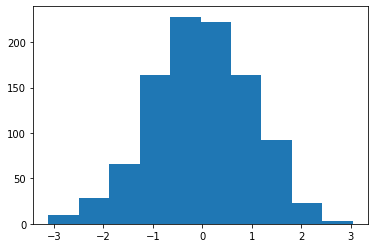

In [76]:
ns = torch.randn(1000).numpy()
plt.hist(ns)


In [352]:
plt.hist(np.random.exponential(loc=1/sigma_blur))

TypeError: exponential() got an unexpected keyword argument 'loc'

(array([ 16.,  89., 259., 273., 198.,  93.,  50.,  13.,   7.,   2.]),
 array([0.5106694 , 0.6488567 , 0.78704405, 0.92523134, 1.0634186 ,
        1.2016059 , 1.3397932 , 1.4779806 , 1.6161679 , 1.7543552 ,
        1.8925425 ], dtype=float32),
 <BarContainer object of 10 artists>)

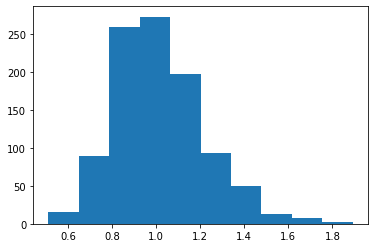

In [80]:
plt.hist(torch.exp(sigma_c*torch.randn(1000)).numpy())

In [86]:
hs.max()

0.999010141478227

In [87]:
betas1 = jnp.linspace(-10, 10, 5) ## set a bit larger range than you want to certify
betas2 = jnp.linspace(-10, 10, 5)
betas3 = jnp.linspace(0.0, 3, 3)
betas4 = jnp.linspace(-0.2, 0.2, 5)
betas5 = jnp.linspace(0.7, 1.3, 5)
betas = jnp.asarray(list(map(jnp.array, itertools.product(betas1, betas2, betas3, betas4, betas5)))) 

In [92]:
sigma = 0.2
lamb = 1/sigma
ray_true = np.random.rayleigh(scale = (1/np.sqrt(2*lamb)), size=10000)
exp_true = np.random.exponential(scale = sigma, size=10000)

if $X \sim \operatorname{Exponential}(\lambda)$, then $Y=\sqrt{X} \sim$ Rayleigh $(1 / \sqrt{2 \lambda})$

In [ ]:
1/0.2**2/2

In [ ]:
plt.hist(ray_true, bins=50)
plt.show()

In [ ]:
plt.hist(3*np.sqrt(exp_true), bins=50)
plt.show()

In [ ]:
plt.hist(3*ray_true**2, bins=50)
plt.show()

In [ ]:
plt.hist(3*ray_true**2, bins=50)
plt.show()

In [ ]:
1/0.8

In [ ]:
plt.hist(np.random.exponential(scale=1/1, size=1000), bins=50)
plt.show()

In [ ]:
plt.hist(exp_true, bins=50)
plt.show()

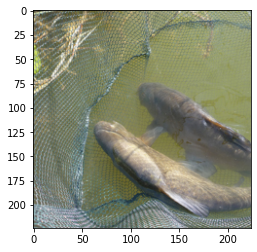

In [682]:
k = 0
image = ourdataset500[k][0]
label = ourdataset500[k][1]
imshow(image)

In [709]:
def attack_tbbc_torch(x, b):  # tr bl br c

    x = x.to(device)
    translation = torch.tensor([[b[0].item(), b[1].item()]]).to(torch.float).to(device) 
    x = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    x = attack_blur_cv2(x, b = b[2])
    x = x + torch.tensor(b[3].item())
    x = torch.tensor(b[4].item())*x
    return x

def attack_blur_cv2(x, b):
    r = b 
    input = x[0].cpu().numpy()
    r = r.item()
    out = cv2.GaussianBlur(input.transpose(1, 2, 0), (0, 0), np.sqrt(r), borderType=cv2.BORDER_REFLECT101)
    out = torch.from_numpy(out.transpose(2, 0, 1))
    return out[None, :].to(device)
    
def attack_tr_torch(x, b): #trans bright blur contrast
#     print(b)
    x = x.to(device)
    translation = torch.tensor([[b[0].item(), b[1].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out

def attack_cbt_torch(x, b): 
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    x = x + torch.tensor(b[1].item())
    translation = torch.tensor([[b[2].item(), b[3].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out



def attack_ct_torch(x, b):
#     print(b)
    x = x.to(device)
    x = torch.tensor(b[0].item())*x
    translation = torch.tensor([[b[1].item(), b[2].item()]]).to(torch.float).to(device) #torch.tensor()
    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
    return out
def attack_bt_torch(x, b):
    x = x.to(device) + torch.tensor(b[0].item())
    
    translation = torch.tensor([[b[1].item(), b[2].item()]]).to(device) #torch.tensor()

    out = kornia.geometry.transform.translate(x, translation, padding_mode='reflection')
#     print('Shape after attack', out.shape)
    return out

def attack_gc_torch(x, b):
    return x**(torch.tensor(b[0].item())) * torch.tensor(b[1].item())

def attack_bc_torch(x, b):
    return x*torch.tensor(b[0].item()) + torch.tensor(b[1].item())#.flatten()

def gamma_at(x, b):
    return x ** b[0]
def bright_at(x, b):
    return x + b[0]
def contrast_at(x, b):
    return x * b[0]


In [710]:
c = torch.tensor(1.3)
b = torch.tensor(-0.2)
g = torch.tensor(1.3)
T = torch.tensor(40.0)
r = torch.tensor(5)
phis = [
    contrast_at,
    bright_at,
    gamma_at,
    attack_bc_torch,
    attack_gc_torch,
    attack_bt_torch,
    attack_ct_torch,
    attack_cbt_torch,
    attack_tr_torch,
    attack_blur_cv2,
    attack_tbbc_torch
]
params = [
    [c],
    [b],
    [g],
    [c, b],
    [g, c],
    [b, T, T],
    [c, T, T],
    [c, b, T, T],
    [T, T],
    r,
    [T, T, r, b, c]
]
names = [
    "contrast",
    "brightness",
    "gamma",
    "cb",
    "gc",
    "bt",
    "ct",
    "cbt",
    "trans",
    "blur",
    "trans-blur-bright-contr"
]

In [711]:
# !rm ./../results/attacked*
!rm ./../results/orig*

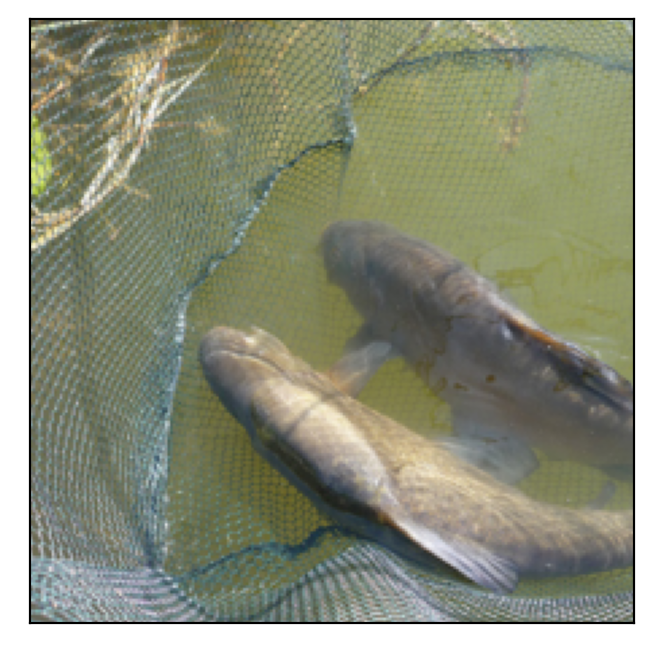

In [712]:
inp = image.cpu().detach().numpy().transpose((1, 2, 0))
plt.figure(dpi=200)
plt.imshow(inp)
plt.yticks([])
plt.xticks([])
plt.savefig("./../results/orig.png")
plt.show()

In [713]:
len(phis)

11

In [714]:
names

['contrast',
 'brightness',
 'gamma',
 'cb',
 'gc',
 'bt',
 'ct',
 'cbt',
 'trans',
 'blur',
 'trans-blur-bright-contr']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


contrast
torch.Size([1, 3, 224, 224])


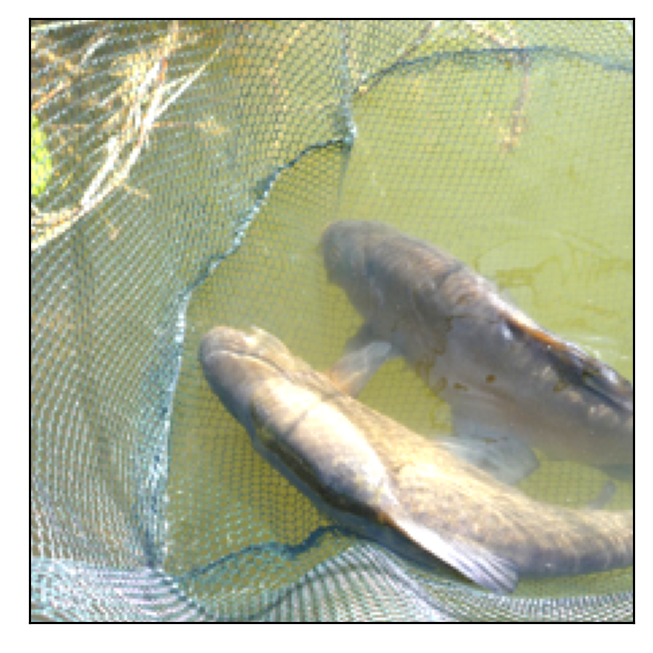

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


brightness
torch.Size([1, 3, 224, 224])


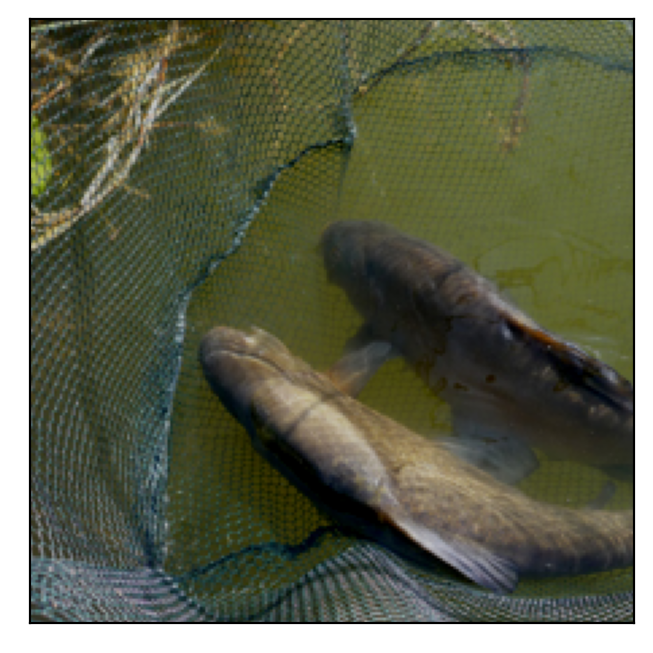

gamma
torch.Size([1, 3, 224, 224])


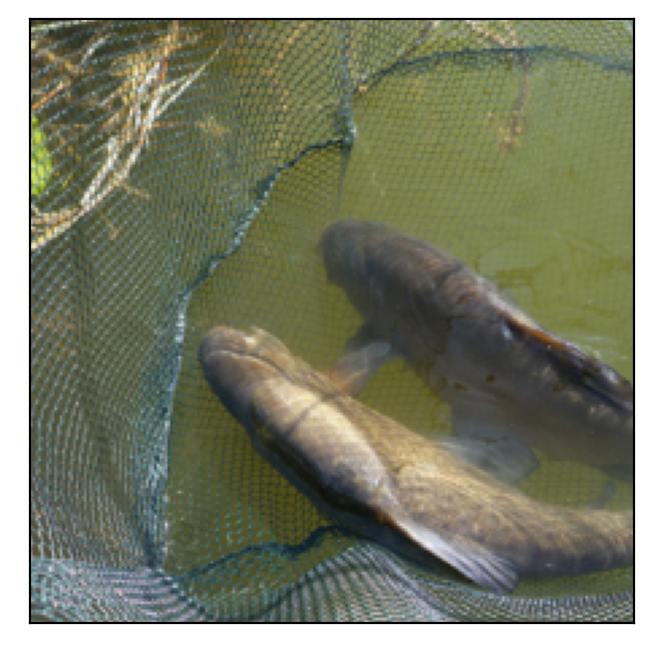

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


cb
torch.Size([1, 3, 224, 224])


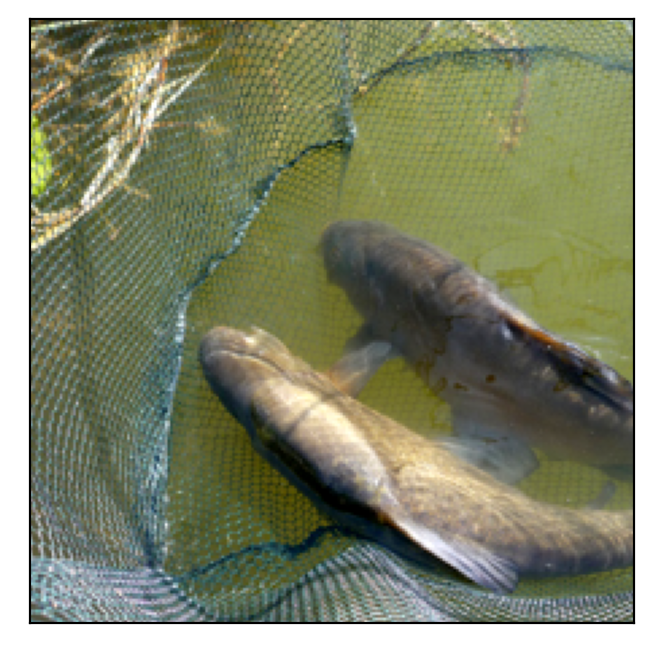

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


gc
torch.Size([1, 3, 224, 224])


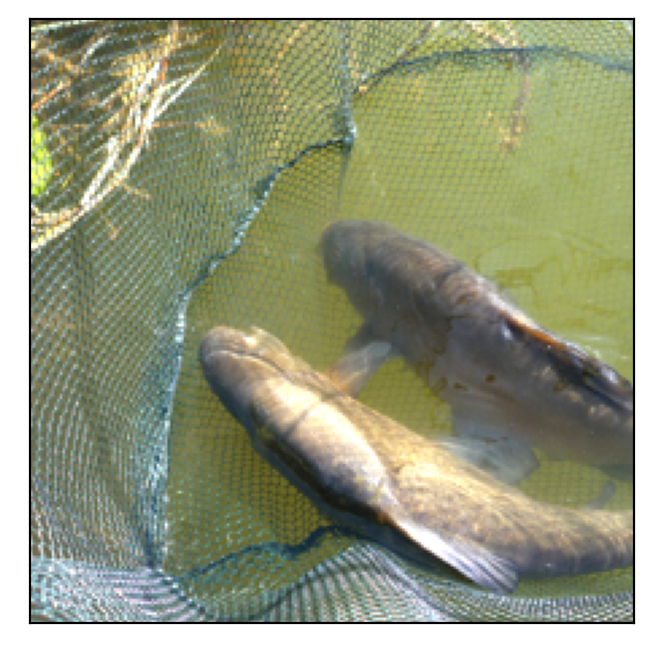

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bt
torch.Size([1, 3, 224, 224])


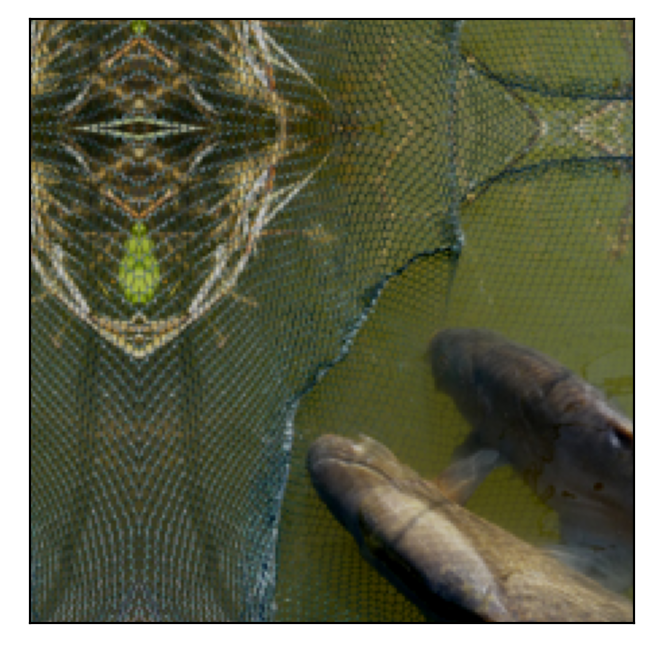

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


ct
torch.Size([1, 3, 224, 224])


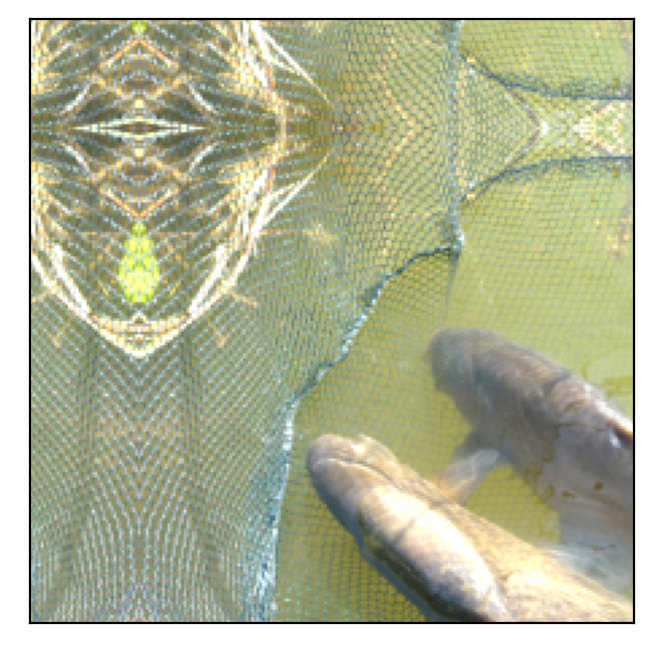

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


cbt
torch.Size([1, 3, 224, 224])


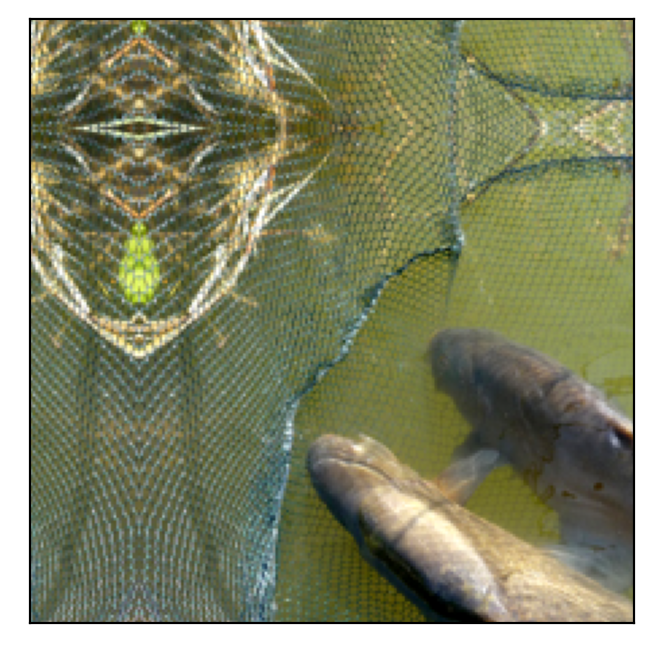

trans
torch.Size([1, 3, 224, 224])


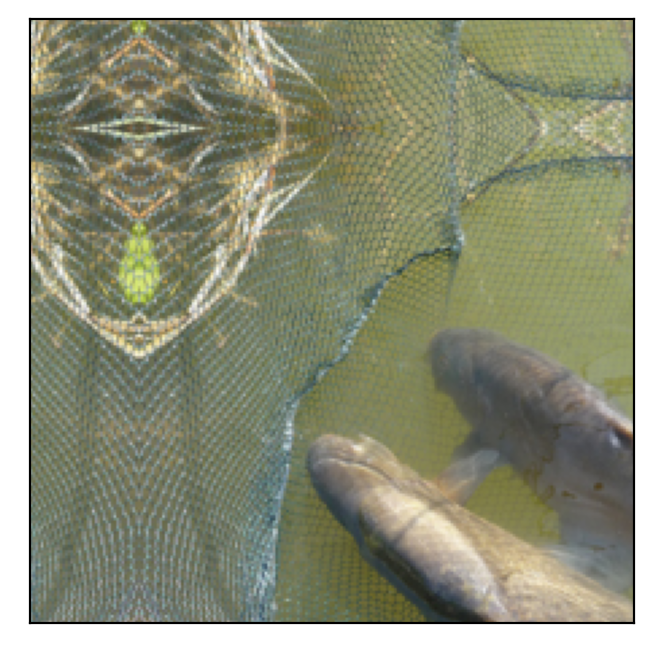

blur
torch.Size([1, 3, 224, 224])


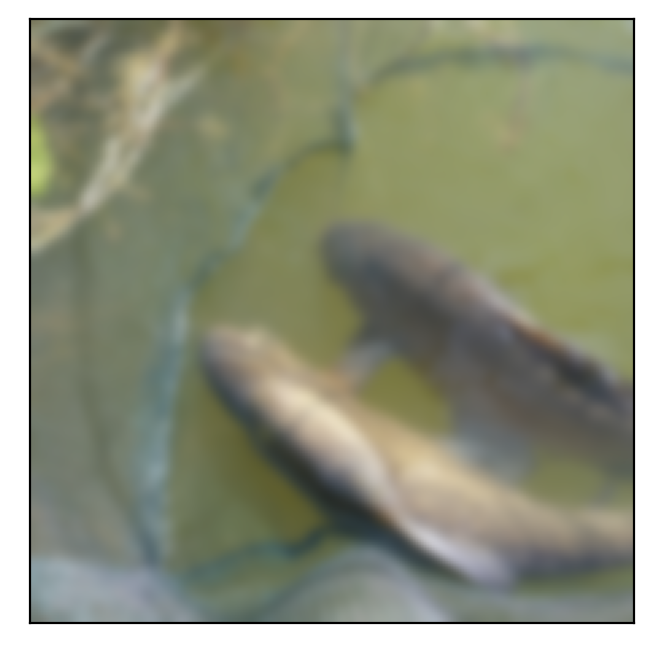

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


trans-blur-bright-contr
torch.Size([1, 3, 224, 224])


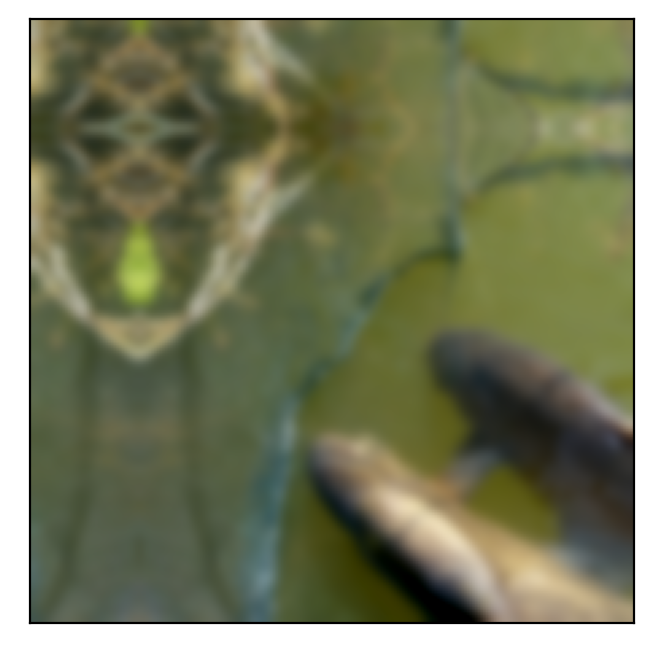

In [715]:
for i in range(len(names)):
    phii = phis[i]
    name = names[i]
    param = params[i]
    q = phii(image[None, :, :, :], param)
    print(name)
    print(q.shape)
    q = q[0].cpu().detach().numpy().transpose((1, 2, 0))
    plt.figure(dpi=200)
    plt.imshow(q)
    plt.yticks([])
    plt.xticks([])
    plt.savefig(f"./../results/attacked_{name}.png")
    plt.show()
    

# Comparisom of certified radii

In [717]:
xi(0.6)

array(0.93200145)

In [723]:
xs = np.linspace(0.5, 1, 100)
our_rad = lambda h: -xi(1 - h) + xi(0.5)
our_rad1 = lambda h: xi(h) - xi(0.5)
our_rad2 = lambda h: (xi(h) - xi(1-h))/2

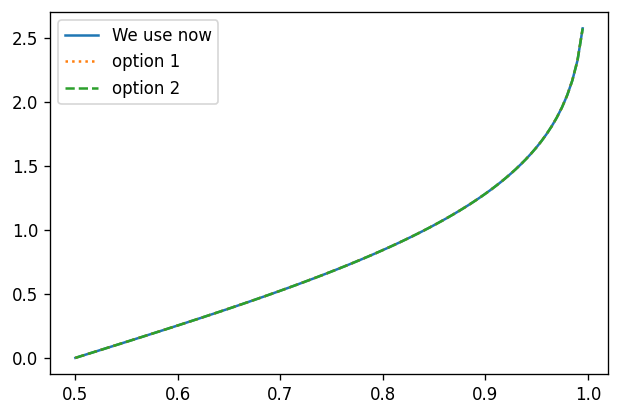

In [731]:

plt.figure(dpi=120)
plt.plot(xs, our_rad(xs), label='We use now')
plt.plot(xs, our_rad1(xs), label='option 1', linestyle=":")
plt.plot(xs, our_rad2(xs), label='option 2', linestyle="--")
plt.legend()
plt.show()
